In [1]:
# Imports and path definitions

import sys
import os
import plotly.plotly as py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from itertools import combinations

path = os.getcwd() + '/'

# NEW APPROACH

** Pre analysis -- hiperfino = 0 -- control soble niveles
~ Parallel and isotrope hyperfine
Polinomios de intervalos  5/3 puntos de H

1. Run your simpre calculation and plot your results.
2. Define a trainning data set region without non-avoided crossings
    - Minimum of 3-5 points (plot your results)
3. Run Poly.py 
4. Run expected_values.py
5. Run main.py

n. of points: 503


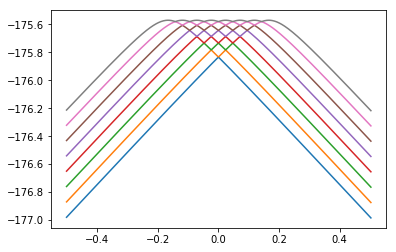

In [125]:
ene_f = path + "simpre.ene"

ene = np.loadtxt(ene_f, dtype= float)

plt.plot(ene[:,0], ene[:,[1,2,3,4,5,6,7,8]])
#plt.plot(ene[:,0], ene[:,[17, 18,19,20, 21, 22, 23, 24,25,26]])#, 9,10, 11, 12, 13, 14, 15, 16]])
#plt.plot(ene[:,0], ene[:,1:])
#plt.savefig('plot_ene.png', dpi = 300)

print 'n. of points: ' + str(len(ene))
plt.show()


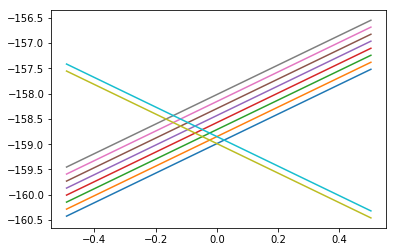

                lvl_1        lvl_2        lvl_3        lvl_4        lvl_5  \
-0.50101          NaN          NaN          NaN          NaN          NaN   
-0.49901          NaN          NaN          NaN          NaN          NaN   
-0.49701          NaN          NaN          NaN          NaN          NaN   
-0.49501          NaN          NaN          NaN          NaN          NaN   
-0.49301          NaN          NaN          NaN          NaN          NaN   
-0.49101  -176.957540  -176.847379  -176.737317  -176.627381  -176.517608   
-0.48901  -176.952897  -176.842740  -176.732682  -176.622752  -176.512987   
-0.48701  -176.948253  -176.838100  -176.728047  -176.618123  -176.508366   
-0.48501  -176.943610  -176.833461  -176.723413  -176.613495  -176.503746   
-0.48301  -176.938967  -176.828822  -176.718779  -176.608867  -176.499126   
-0.48101  -176.934325  -176.824183  -176.714145  -176.604239  -176.494507   
-0.47901  -176.929682  -176.819544  -176.709511  -176.599612  -176.489888   

In [137]:
# Evaluate expected values

#plt.plot(expected_df.index, expected_df.iloc[:,1:])
#plt.plot(expected_df.index, expected_df.iloc[:,[8,9,10,]])
plt.plot(expected_df.index, expected_df.iloc[:,[16,17, 18,19,20,21,22,23,24,25]])
#plt.savefig('plot_prev.png', dpi = 300)

#print 'n. of points: ' + str(len(ene_prev))
plt.show()
print expected_df

In [78]:
#print e
#print expected_df.iloc[247, 8]
#print ene_df.iloc[247, 8]

-175.1607809
-175.1607809


In [51]:
#
## Functions module
#

def poly(five_H, five_E): #dataset with set of points: would retrieve 
    #print five_E
    #print five_H
    x = five_H # set campos H (5)
    y = five_E # set valores E (5)
        
    vec_z = np.polyfit(x, y, deg = 2)
    return vec_z
    
    #poli_out = open(path + 'poli.out', 'w')
    #poli_out.write('name\tk0\tk1\tk2\n')
    #poli_out.write(i + '\t' + str(k0) + '\t' + str(k1) + '\t' + str(k2))
    #poli_out.write('\n')
    #poli_out.close()


def expected_E(vec_z, H_v):
    k0 = vec_z[2]
    k1 = vec_z[1]
    k2 = vec_z[0]
    predicted_E = (k2 * (float(H_v)**2)) + (k1 * float(H_v)) + k0
    return predicted_E
    #expec_out.write(str(v) + '\t')


def truncate(f, n):
    '''Truncates/pads a float f to n decimal places without rounding'''
    s = '{}'.format(f)
    if 'e' in s or 'E' in s:
        return '{0:.{1}f}'.format(f, n)
    i, p, d = s.partition('.')
    return '.'.join([i, (d+'0'*n)[:n]])

In [52]:
#
## Initial definitions
#

# Defined by the user so far; automatize for the future
J = float(8)
I = float(7.5)
g_par = 0.0000
g_per = 0.0000

# Lists
tot_lvls = int((2*J + 1)*(2*I + 1))
m_j = list(range(int(-(2*J)), int((2*J+2)), int(2)))
m_i = list(range(int(-(2*I)), int((2*I+2)), int(2)))

lvls_list = []
for i in list(range(np.size(ene, axis=1)-1)):
    lvls_list.append('lvl_'+ str(i+1))

## Generate projections list from m_j and m_i
projections_l = []
for j in m_j:
    for i in m_i:
        proj = str(j) + '/' + str(i)
        projections_l.append(proj)

#print projections_l
#print lvls_list
#print tot_lvls


In [53]:
#
##
### Loading datasets
##
#

# Loads polynomios file
#with open(path + 'poli.out', 'r') as poli_f:
#    poli_df = pd.read_csv(poli_f, sep='\t', header=0, index_col=0)#, dtype=float)


# Loads new 'simpre.ene' file with energies of each level (quantum number) at diff H field
with open(path + 'simpre.ene', 'r') as ene_f:
    ene = np.loadtxt(ene_f, dtype= float)
    ene_df = pd.DataFrame(data=ene[0:,1:],  index=ene[0:,0] , columns=lvls_list)

if float(0.0) in ene_df.index:
    ene_df = ene_df.drop([0.0])
    


# Creating an empty DF for further lvl ordering
H_values = ene_df.index
expected_df = pd.DataFrame(index=H_values, columns=lvls_list)
final_df = pd.DataFrame(index=H_values, columns=lvls_list)
order_df = pd.DataFrame(index=H_values, columns=lvls_list)

# Fill first 5 positions of order_df
c = 0
for i in lvls_list:
    c=0
    for i2 in H_values:
        c+=1
        if c < 6 :
            order_df.loc[i2, i] = i.replace('lvl_' , '')

            
#print order_df.iloc[6,1]
#print ene_df.iloc[6,1]
#print expected_df.iloc[:,1]


In [90]:
#
##
### Loading datasets
##
#

# Loads polynomios file
#with open(path + 'poli.out', 'r') as poli_f:
#    poli_df = pd.read_csv(poli_f, sep='\t', header=0, index_col=0)#, dtype=float)


test_list = []

# Loads new 'simpre.ene' file with energies of each level (quantum number) at diff H field
with open(path + 'simpre.ene', 'r') as ene_f:
    ene = np.loadtxt(ene_f, dtype= float)
    ene_df = pd.DataFrame(data=ene[0:,1:],  index=ene[0:,0] , columns=lvls_list)

if float(0.0) in ene_df.index:
    ene_df = ene_df.drop([0.0])
    


# Creating an empty DF for further lvl ordering
H_values = ene_df.index
expected_df = pd.DataFrame(index=H_values, columns=lvls_list)
final_df = pd.DataFrame(index=H_values, columns=lvls_list)
order_df = pd.DataFrame(index=H_values, columns=lvls_list)

# Fill first 5 positions of order_df
c = 0
for i in lvls_list:
    c=0
    for i2 in H_values:
        c+=1
        if c < 6 :
            order_df.loc[i2, i] = i.replace('lvl_' , '')


            
            
# Open out files
expec_out = open('expected_values.out', 'w')
poli_out = open('poli.out', 'w')

#
##
### Main loop
##
#

#print order_df

n = 0
col = 0
row = 0
for i0 in lvls_list:

    c0 = 0
    c1=0
    
    n+= 1
    
    five_H = []
    five_E = []
    d_poli = {}
    
    poli_out.write(i0 + '\n' )
    
    
    for i1 in H_values:
        print i1
        c0 += 1
        c1 += 1     
        
        # Rellenar listas
        five_H.append(i1)
        
        pos = float(order_df.loc[i1, i0])
        #col = int(pos)-1
        #row = int(c1)-1
        #five_E.append(ene_df.iloc[row, col])
        
        
        if math.isnan(pos):
            print 'isnull'
            five_E.append(v0)
            print five_E
        
        else:
            
            col = int(pos)-1
            row = int(c1)-1
            print col
            print row
            five_E.append(ene_df.iloc[row, col])
        
        
        # Everything starts now......
        if len(five_H) ==5:
            
            # Fitting
            vec_poly = poly(five_H, five_E)
            p = np.poly1d(vec_poly)
            d_poli[i1] = p
            poli_out.write('H: ' + str(H_values[c1-1]) + ' ' + str(p) +'\n') #+ ' ' + five_H + ' ' + five_E + '\n')
            
            
            if c1 == len(H_values):
                continue
            
            else:
                
                H_next = float(H_values[c1])
                #print H_next
                #H_v = '%.8f' % H_next
                #H_v = truncate(H_next, 5)

                
                # Calculate expected_v for the next H value
                v0 = float(expected_E(vec_poly, H_next))
                v1 = round(v0,6)
                v2 = round(v0,5)
                v3 = round(v0,4)
                v4 = round(v0,3)
                v1 = truncate(v1, 6)
                v2 = truncate(v2, 5)
                v3 = truncate(v3, 4)
                v4 = truncate(v4, 3)
                #v5 = truncate(v5, 2)

                expected_df.loc[H_next, i0] = v1


                # Search expected values in ene_df
                e0 = float(ene_df.loc[H_next, i0])
                e1 = round(e0,6)
                e2 = round(e0,5)
                e3 = round(e0,4)
                e4 = round(e0,3)
                e1 = truncate(e1, 6)
                e2 = truncate(e2, 5)
                e3 = truncate(e3, 4)
                e4 = truncate(e4, 3)
                
                print 'aqui v0: ' + str(v0)
                print 'aqui e0: ' + str(e0)
                print 'aqui v1: ' + str(v1)
                print 'aqui e1: ' + str(e1)
                print 'aqui v2: ' + str(v2)
                print 'aqui e2: ' + str(e2)
                print 'aqui v3: ' + str(v3)
                print 'aqui e3: ' + str(e3)
                print 'aqui v4: ' + str(v4)
                print 'aqui e4: ' + str(e4)

                if v1 == e1:
                    order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                    print 'valor exacto'
                    

                else:
                    if v2 == e2:
                        order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                        print 'valor exacto-2'
                
                    else:
                        if v3 == e3:
                            order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                            print 'valor exacto-3'
                
                        else:
                            #if v4 == e4:
                            #    order_df.loc[H_next, i0] = i0.replace('lvl_', '')
                            #    print 'valor exacto-4'

                            #else: ### time to re-order!!
                            #    print 'no match'

                            print v1
                            print e1
                            print ene_df.loc[H_next]

                            c4 = 0

                            for i3 in lvls_list:
                                c4 += 1

                                e0_2 = float(ene_df.loc[H_next, i3])
                                e1_2 = round(e0_2,6)
                                e2_2 = round(e0_2,5)
                                e3_2 = round(e0_2,4)
                                e4_2 = round(e0_2,3)
                                e1_2 = truncate(e1_2, 6)
                                e2_2 = truncate(e2_2, 5)
                                e3_2 = truncate(e3_2, 4)
                                e4_2 = truncate(e4_2, 3)

                                l_e4_2 = [str(float(e4_2) + 0.001),
                                          str(float(e4_2) - 0.001)]


                                if v1 == e1_2:
                                    order_df.loc[H_next, i0] = c4
                                    print 'yes 1'


                                else:
                                    if v2 == e2_2:
                                        order_df.loc[H_next, i0] = c4
                                        print c4
                                        print 'yes 2'


                                    else:
                                        if v3 == e3_2:
                                            order_df.loc[H_next, i0] = c4
                                            print c4
                                            print 'yes 3'


                                        else:
                                            if v4 == e4_2:
                                                order_df.loc[H_next, i0] = c4
                                                print c4
                                                print 'yes 5'

                                            #else:
                                            #    if v4 in l_e4_2:
                                            #        order_df.loc[H_next, i0] = c4


                c0 = c0-1
                five_E.pop(0)
                five_H.pop(0)
    
    poli_out.write('\n')
#print expected_df

order_df.to_csv(path + 'order.txt', header = lvls_list, sep=' ', na_rep='na')
expected_df.to_csv(path + 'expected.txt', header = lvls_list, sep=' ', na_rep='na')
    
## Condition 1 : compare pends (k1)
   
## Condition 2 : compare second derivative (k2)
    
## Condition 3 : allowed/non-allowed transitions (+/- 1) 
expec_out.close()
poli_out.close()

-0.50101
0
0
-0.49901
0
1
-0.49701
0
2
-0.49501
0
3
-0.49301
0
4
aqui v0: -176.95753996
aqui e0: -176.95754
aqui v1: -176.957540
aqui e1: -176.957540
aqui v2: -176.95754
aqui e2: -176.95754
aqui v3: -176.9575
aqui e3: -176.9575
aqui v4: -176.958
aqui e4: -176.958
valor exacto
-0.49101
0
5
aqui v0: -176.95289658
aqui e0: -176.9528966
aqui v1: -176.952897
aqui e1: -176.952897
aqui v2: -176.95290
aqui e2: -176.95290
aqui v3: -176.9529
aqui e3: -176.9529
aqui v4: -176.953
aqui e4: -176.953
valor exacto
-0.48901
0
6
aqui v0: -176.94825336
aqui e0: -176.9482534
aqui v1: -176.948253
aqui e1: -176.948253
aqui v2: -176.94825
aqui e2: -176.94825
aqui v3: -176.9483
aqui e3: -176.9483
aqui v4: -176.948
aqui e4: -176.948
valor exacto
-0.48701
0
7
aqui v0: -176.94361034
aqui e0: -176.9436103
aqui v1: -176.943610
aqui e1: -176.943610
aqui v2: -176.94361
aqui e2: -176.94361
aqui v3: -176.9436
aqui e3: -176.9436
aqui v4: -176.944
aqui e4: -176.944
valor exacto
-0.48501
0
8
aqui v0: -176.93896736
aqui e

aqui e2: -176.78120
aqui v3: -176.7812
aqui e3: -176.7812
aqui v4: -176.781
aqui e4: -176.781
valor exacto
-0.41501
0
43
aqui v0: -176.77656582
aqui e0: -176.7765658
aqui v1: -176.776566
aqui e1: -176.776566
aqui v2: -176.77657
aqui e2: -176.77657
aqui v3: -176.7766
aqui e3: -176.7766
aqui v4: -176.777
aqui e4: -176.777
valor exacto
-0.41301
0
44
aqui v0: -176.77192908
aqui e0: -176.771929
aqui v1: -176.771929
aqui e1: -176.771929
aqui v2: -176.77193
aqui e2: -176.77193
aqui v3: -176.7719
aqui e3: -176.7719
aqui v4: -176.772
aqui e4: -176.772
valor exacto
-0.41101
0
45
aqui v0: -176.7672924
aqui e0: -176.7672924
aqui v1: -176.767292
aqui e1: -176.767292
aqui v2: -176.76729
aqui e2: -176.76729
aqui v3: -176.7673
aqui e3: -176.7673
aqui v4: -176.767
aqui e4: -176.767
valor exacto
-0.40901
0
46
aqui v0: -176.76265594
aqui e0: -176.7626561
aqui v1: -176.762656
aqui e1: -176.762656
aqui v2: -176.76266
aqui e2: -176.76266
aqui v3: -176.7627
aqui e3: -176.7627
aqui v4: -176.763
aqui e4: -176.

aqui e1: -176.586652
aqui v2: -176.58665
aqui e2: -176.58665
aqui v3: -176.5867
aqui e3: -176.5867
aqui v4: -176.587
aqui e4: -176.587
valor exacto
-0.33101
0
85
aqui v0: -176.58202604
aqui e0: -176.5820259
aqui v1: -176.582026
aqui e1: -176.582026
aqui v2: -176.58203
aqui e2: -176.58203
aqui v3: -176.5820
aqui e3: -176.5820
aqui v4: -176.582
aqui e4: -176.582
valor exacto
-0.32901
0
86
aqui v0: -176.57739998
aqui e0: -176.5774
aqui v1: -176.577400
aqui e1: -176.577400
aqui v2: -176.57740
aqui e2: -176.57740
aqui v3: -176.5774
aqui e3: -176.5774
aqui v4: -176.577
aqui e4: -176.577
valor exacto
-0.32701
0
87
aqui v0: -176.57277438
aqui e0: -176.5727744
aqui v1: -176.572774
aqui e1: -176.572774
aqui v2: -176.57277
aqui e2: -176.57277
aqui v3: -176.5728
aqui e3: -176.5728
aqui v4: -176.573
aqui e4: -176.573
valor exacto
-0.32501
0
88
aqui v0: -176.5681491
aqui e0: -176.5681491
aqui v1: -176.568149
aqui e1: -176.568149
aqui v2: -176.56815
aqui e2: -176.56815
aqui v3: -176.5681
aqui e3: -17

aqui v0: -176.36964234
aqui e0: -176.3696424
aqui v1: -176.369642
aqui e1: -176.369642
aqui v2: -176.36964
aqui e2: -176.36964
aqui v3: -176.3696
aqui e3: -176.3696
aqui v4: -176.370
aqui e4: -176.370
valor exacto
-0.23701
0
132
aqui v0: -176.36503672
aqui e0: -176.3650367
aqui v1: -176.365037
aqui e1: -176.365037
aqui v2: -176.36504
aqui e2: -176.36504
aqui v3: -176.3650
aqui e3: -176.3650
aqui v4: -176.365
aqui e4: -176.365
valor exacto
-0.23501
0
133
aqui v0: -176.36043156
aqui e0: -176.3604317
aqui v1: -176.360432
aqui e1: -176.360432
aqui v2: -176.36043
aqui e2: -176.36043
aqui v3: -176.3604
aqui e3: -176.3604
aqui v4: -176.360
aqui e4: -176.360
valor exacto
-0.23301
0
134
aqui v0: -176.35582728
aqui e0: -176.3558272
aqui v1: -176.355827
aqui e1: -176.355827
aqui v2: -176.35583
aqui e2: -176.35583
aqui v3: -176.3558
aqui e3: -176.3558
aqui v4: -176.356
aqui e4: -176.356
valor exacto
-0.23101
0
135
aqui v0: -176.35122332
aqui e0: -176.3512234
aqui v1: -176.351223
aqui e1: -176.3512

valor exacto
-0.16701
0
167
aqui v0: -176.2042906
aqui e0: -176.2042906
aqui v1: -176.204291
aqui e1: -176.204291
aqui v2: -176.20429
aqui e2: -176.20429
aqui v3: -176.2043
aqui e3: -176.2043
aqui v4: -176.204
aqui e4: -176.204
valor exacto
-0.16501
0
168
aqui v0: -176.1997135
aqui e0: -176.1997135
aqui v1: -176.199714
aqui e1: -176.199714
aqui v2: -176.19971
aqui e2: -176.19971
aqui v3: -176.1997
aqui e3: -176.1997
aqui v4: -176.200
aqui e4: -176.200
valor exacto
-0.16301
0
169
aqui v0: -176.1951374
aqui e0: -176.1951376
aqui v1: -176.195137
aqui e1: -176.195138
aqui v2: -176.19514
aqui e2: -176.19514
aqui v3: -176.1951
aqui e3: -176.1951
aqui v4: -176.195
aqui e4: -176.195
valor exacto-2
-0.16101
0
170
aqui v0: -176.19056266
aqui e0: -176.1905627
aqui v1: -176.190563
aqui e1: -176.190563
aqui v2: -176.19056
aqui e2: -176.19056
aqui v3: -176.1906
aqui e3: -176.1906
aqui v4: -176.191
aqui e4: -176.191
valor exacto
-0.15901
0
171
aqui v0: -176.18598892
aqui e0: -176.1859889
aqui v1: -17

aqui v1: -176.040353
aqui e1: -176.040353
aqui v2: -176.04035
aqui e2: -176.04035
aqui v3: -176.0404
aqui e3: -176.0404
aqui v4: -176.040
aqui e4: -176.040
valor exacto
-0.09301
0
204
aqui v0: -176.03582982
aqui e0: -176.0358301
aqui v1: -176.035830
aqui e1: -176.035830
aqui v2: -176.03583
aqui e2: -176.03583
aqui v3: -176.0358
aqui e3: -176.0358
aqui v4: -176.036
aqui e4: -176.036
valor exacto
-0.09101
0
205
aqui v0: -176.03130936
aqui e0: -176.0313094
aqui v1: -176.031309
aqui e1: -176.031309
aqui v2: -176.03131
aqui e2: -176.03131
aqui v3: -176.0313
aqui e3: -176.0313
aqui v4: -176.031
aqui e4: -176.031
valor exacto
-0.08901
0
206
aqui v0: -176.02679088
aqui e0: -176.026791
aqui v1: -176.026791
aqui e1: -176.026791
aqui v2: -176.02679
aqui e2: -176.02679
aqui v3: -176.0268
aqui e3: -176.0268
aqui v4: -176.027
aqui e4: -176.027
valor exacto
-0.08701
0
207
aqui v0: -176.02227466
aqui e0: -176.0222748
aqui v1: -176.022275
aqui e1: -176.022275
aqui v2: -176.02227
aqui e2: -176.02227
aqu

valor exacto
-0.01701
0
242
aqui v0: -175.86614656
aqui e0: -175.8661469
aqui v1: -175.866147
aqui e1: -175.866147
aqui v2: -175.86615
aqui e2: -175.86615
aqui v3: -175.8661
aqui e3: -175.8661
aqui v4: -175.866
aqui e4: -175.866
valor exacto
-0.01501
0
243
aqui v0: -175.86176162
aqui e0: -175.861762
aqui v1: -175.861762
aqui e1: -175.861762
aqui v2: -175.86176
aqui e2: -175.86176
aqui v3: -175.8618
aqui e3: -175.8618
aqui v4: -175.862
aqui e4: -175.862
valor exacto
-0.01301
0
244
aqui v0: -175.8573824
aqui e0: -175.8573829
aqui v1: -175.857382
aqui e1: -175.857383
aqui v2: -175.85738
aqui e2: -175.85738
aqui v3: -175.8574
aqui e3: -175.8574
aqui v4: -175.857
aqui e4: -175.857
valor exacto-2
-0.01101
0
245
aqui v0: -175.85300924
aqui e0: -175.8530098
aqui v1: -175.853009
aqui e1: -175.853010
aqui v2: -175.85301
aqui e2: -175.85301
aqui v3: -175.8530
aqui e3: -175.8530
aqui v4: -175.853
aqui e4: -175.853
valor exacto-2
-0.00901
0
246
aqui v0: -175.84864234
aqui e0: -175.8486428
aqui v1: 

3
yes 2
0.02499
2
263
aqui v0: -175.77555844
aqui e0: -175.8925244
aqui v1: -175.775558
aqui e1: -175.892524
aqui v2: -175.77556
aqui e2: -175.89252
aqui v3: -175.7756
aqui e3: -175.8925
aqui v4: -175.776
aqui e4: -175.893
-175.775558
-175.892524
lvl_1    -175.892524
lvl_2    -175.789364
lvl_3    -175.775559
lvl_4    -175.692159
lvl_5    -175.679657
lvl_6    -175.610109
lvl_7    -175.601204
lvl_8    -175.569876
lvl_9    -175.263410
lvl_10   -175.232082
lvl_11   -175.223176
lvl_12   -175.153629
lvl_13   -175.141127
lvl_14   -175.057727
lvl_15   -175.043923
lvl_16   -174.940762
lvl_17   -159.067572
lvl_18   -158.929129
lvl_19   -158.910130
lvl_20   -158.790686
lvl_21   -158.771687
lvl_22   -158.652243
lvl_23   -158.633244
lvl_24   -158.513801
lvl_25   -158.494802
lvl_26   -158.375358
Name: 0.02699, dtype: float64
3
yes 2
0.02699
2
264
aqui v0: -175.7713429
aqui e0: -175.8969453
aqui v1: -175.771343
aqui e1: -175.896945
aqui v2: -175.77134
aqui e2: -175.89695
aqui v3: -175.7713
aqui e3: -

Name: 0.05499, dtype: float64
4
yes 2
0.05499
3
278
aqui v0: -175.71374558
aqui e0: -175.9592705
aqui v1: -175.713746
aqui e1: -175.959271
aqui v2: -175.71375
aqui e2: -175.95927
aqui v3: -175.7137
aqui e3: -175.9593
aqui v4: -175.714
aqui e4: -175.959
-175.713746
-175.959271
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
4
yes 2
0.05699
3
279
aqui v0: -175.7097555
aqui e0: -175.9637491
aqui v1: -175.709755
aqui e1: -175.963749
aqui v2: -175.70976
aqui e2: -175.96375

aqui v0: -175.66741164
aqui e0: -176.0132043
aqui v1: -175.667412
aqui e1: -176.013204
aqui v2: -175.66741
aqui e2: -176.01320
aqui v3: -175.6674
aqui e3: -176.0132
aqui v4: -175.667
aqui e4: -176.013
-175.667412
-176.013204
lvl_1    -176.013204
lvl_2    -175.906984
lvl_3    -175.803315
lvl_4    -175.704961
lvl_5    -175.667415
lvl_6    -175.619794
lvl_7    -175.593137
lvl_8    -175.571383
lvl_9    -175.261903
lvl_10   -175.240149
lvl_11   -175.213492
lvl_12   -175.165871
lvl_13   -175.128325
lvl_14   -175.029971
lvl_15   -174.926302
lvl_16   -174.820083
lvl_17   -159.225072
lvl_18   -159.086629
lvl_19   -158.948186
lvl_20   -158.809743
lvl_21   -158.752630
lvl_22   -158.671301
lvl_23   -158.614187
lvl_24   -158.532858
lvl_25   -158.475744
lvl_26   -158.394416
Name: 0.08099, dtype: float64
5
yes 3
0.08099
4
291
aqui v0: -175.66373114
aqui e0: -176.0177158
aqui v1: -175.663731
aqui e1: -176.017716
aqui v2: -175.66373
aqui e2: -176.01772
aqui v3: -175.6637
aqui e3: -176.0177
aqui v4: -17

6
yes 3
0.10699
5
304
aqui v0: -175.61960914
aqui e0: -176.0765618
aqui v1: -175.619609
aqui e1: -176.076562
aqui v2: -175.61961
aqui e2: -176.07656
aqui v3: -175.6196
aqui e3: -176.0766
aqui v4: -175.620
aqui e4: -176.077
-175.619609
-176.076562
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
6
yes 3
0.10899
5
305
aqui v0: -175.61657456
aqui e0: -176.0811019
aqui v1: -175.616575
aqui e1: -176.081102
aqui v2: -175.61657
aqui e2: -176.08110
aqui v3: -175.6166
aqui e3: 

7
yes 2
0.12699
6
314
aqui v0: -175.59250956
aqui e0: -176.1220376
aqui v1: -175.592510
aqui e1: -176.122038
aqui v2: -175.59251
aqui e2: -176.12204
aqui v3: -175.5925
aqui e3: -176.1220
aqui v4: -175.593
aqui e4: -176.122
-175.592510
-176.122038
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
7
yes 3
0.12899
6
315
aqui v0: -175.59025748
aqui e0: -176.1265937
aqui v1: -175.590257
aqui e1: -176.126594
aqui v2: -175.59026
aqui e2: -176.12659
aqui v3: -175.5903
aqui e3: 

8
yes 3
0.15499
7
328
aqui v0: -175.5711597
aqui e0: -176.1859431
aqui v1: -175.571160
aqui e1: -176.185943
aqui v2: -175.57116
aqui e2: -176.18594
aqui v3: -175.5712
aqui e3: -176.1859
aqui v4: -175.571
aqui e4: -176.186
-175.571160
-176.185943
lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
8
yes 3
0.15699
7
329
aqui v0: -175.57058586
aqui e0: -176.1905169
aqui v1: -175.570586
aqui e1: -176.190517
aqui v2: -175.57059
aqui e2: -176.19052
aqui v3: -175.5706
aqui e3: -

0.18699
7
344
aqui v0: -175.57872314
aqui e0: -176.2592458
aqui v1: -175.578723
aqui e1: -176.259246
aqui v2: -175.57872
aqui e2: -176.25925
aqui v3: -175.5787
aqui e3: -176.2592
aqui v4: -175.579
aqui e4: -176.259
-175.578723
-176.259246
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
8
yes 3
0.18899
7
345
aqui v0: -175.5803186
aqui e0: -176.2638351
aqui v1: -175.580319
aqui e1: -176.263835
aqui v2: -175.58032
aqui e2: -176.26384
aqui v3: -175.5803
aqui e3: -176.2638

lvl_1    -176.328168
lvl_2    -176.219205
lvl_3    -176.110808
lvl_4    -176.003292
lvl_5    -175.897246
lvl_6    -175.793913
lvl_7    -175.696317
lvl_8    -175.613197
lvl_9    -175.220088
lvl_10   -175.136969
lvl_11   -175.039373
lvl_12   -174.936041
lvl_13   -174.829995
lvl_14   -174.722479
lvl_15   -174.614083
lvl_16   -174.505120
lvl_17   -159.627573
lvl_18   -159.489130
lvl_19   -159.350687
lvl_20   -159.212244
lvl_21   -159.073801
lvl_22   -158.935358
lvl_23   -158.796916
lvl_24   -158.658473
lvl_25   -158.350130
lvl_26   -158.211688
Name: 0.21899, dtype: float64
8
yes 3
0.21899
7
360
aqui v0: -175.61616732
aqui e0: -176.3327684
aqui v1: -175.616167
aqui e1: -176.332768
aqui v2: -175.61617
aqui e2: -176.33277
aqui v3: -175.6162
aqui e3: -176.3328
aqui v4: -175.616
aqui e4: -176.333
-175.616167
-176.332768
lvl_1    -176.332768
lvl_2    -176.223786
lvl_3    -176.115361
lvl_4    -176.007798
lvl_5    -175.901671
lvl_6    -175.798183
lvl_7    -175.700234
lvl_8    -175.616159
lvl_9    

8
yes 2
0.24699
7
374
aqui v0: -175.6632227
aqui e0: -176.3972423
aqui v1: -175.663223
aqui e1: -176.397242
aqui v2: -175.66322
aqui e2: -176.39724
aqui v3: -175.6632
aqui e3: -176.3972
aqui v4: -175.663
aqui e4: -176.397
-175.663223
-176.397242
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
8
yes 2
0.24899
7
375
aqui v0: -175.66689812
aqui e0: -176.4018519
aqui v1: -175.666898
aqui e1: -176.401852
aqui v2: -175.66690
aqui e2: -176.40185
aqui v3: -175.6669
aqui e3: -

lvl_1    -176.471056
lvl_2    -176.361615
lvl_3    -176.252519
lvl_4    -176.143924
lvl_5    -176.036092
lvl_6    -175.929505
lvl_7    -175.825140
lvl_8    -175.725259
lvl_9    -175.108027
lvl_10   -175.008146
lvl_11   -174.903781
lvl_12   -174.797195
lvl_13   -174.689364
lvl_14   -174.580769
lvl_15   -174.471673
lvl_16   -174.362233
lvl_17   -159.808406
lvl_18   -159.669963
lvl_19   -159.531520
lvl_20   -159.393077
lvl_21   -159.254635
lvl_22   -159.116192
lvl_23   -158.977749
lvl_24   -158.839306
lvl_25   -158.169297
lvl_26   -158.030855
Name: 0.28099, dtype: float64
8
yes 2
0.28099
7
391
aqui v0: -175.72932146
aqui e0: -176.4756732
aqui v1: -175.729321
aqui e1: -176.475673
aqui v2: -175.72932
aqui e2: -176.47567
aqui v3: -175.7293
aqui e3: -176.4757
aqui v4: -175.729
aqui e4: -176.476
-175.729321
-176.475673
lvl_1    -176.475673
lvl_2    -176.366220
lvl_3    -176.257107
lvl_4    -176.148486
lvl_5    -176.040615
lvl_6    -175.933961
lvl_7    -175.829471
lvl_8    -175.729319
lvl_9    

Name: 0.30899, dtype: float64
8
yes 3
0.30899
7
405
aqui v0: -175.7876713
aqui e0: -176.5403583
aqui v1: -175.787671
aqui e1: -176.540358
aqui v2: -175.78767
aqui e2: -176.54036
aqui v3: -175.7877
aqui e3: -176.5404
aqui v4: -175.788
aqui e4: -176.540
-175.787671
-176.540358
lvl_1    -176.540358
lvl_2    -176.430752
lvl_3    -176.321424
lvl_4    -176.212490
lvl_5    -176.104137
lvl_6    -175.996690
lvl_7    -175.890765
lvl_8    -175.787670
lvl_9    -175.045616
lvl_10   -174.942521
lvl_11   -174.836597
lvl_12   -174.729150
lvl_13   -174.620797
lvl_14   -174.511864
lvl_15   -174.402537
lvl_16   -174.292931
lvl_17   -159.895907
lvl_18   -159.757464
lvl_19   -159.619021
lvl_20   -159.480578
lvl_21   -159.342135
lvl_22   -159.203692
lvl_23   -159.065249
lvl_24   -158.926806
lvl_25   -158.081797
lvl_26   -157.943355
Name: 0.31099, dtype: float64
8
yes 2
0.31099
7
406
aqui v0: -175.79192702
aqui e0: -176.5449815
aqui v1: -175.791927
aqui e1: -176.544982
aqui v2: -175.79193
aqui e2: -176.54498

Name: 0.33699, dtype: float64
8
yes 2
0.33699
7
419
aqui v0: -175.8480274
aqui e0: -176.6051141
aqui v1: -175.848027
aqui e1: -176.605114
aqui v2: -175.84803
aqui e2: -176.60511
aqui v3: -175.8480
aqui e3: -176.6051
aqui v4: -175.848
aqui e4: -176.605
-175.848027
-176.605114
lvl_1    -176.605114
lvl_2    -176.495380
lvl_3    -176.385877
lvl_4    -176.276694
lvl_5    -176.167970
lvl_6    -176.059937
lvl_7    -175.953014
lvl_8    -175.848027
lvl_9    -174.985259
lvl_10   -174.880272
lvl_11   -174.773350
lvl_12   -174.665318
lvl_13   -174.556594
lvl_14   -174.447411
lvl_15   -174.337909
lvl_16   -174.228176
lvl_17   -159.977574
lvl_18   -159.839131
lvl_19   -159.700687
lvl_20   -159.562244
lvl_21   -159.423801
lvl_22   -159.285359
lvl_23   -159.146916
lvl_24   -159.008473
lvl_25   -158.000131
lvl_26   -157.861688
Name: 0.33899, dtype: float64
yes 1
0.33899
7
420
aqui v0: -175.85239342
aqui e0: -176.6097419
aqui v1: -175.852393
aqui e1: -176.609742
aqui v2: -175.85239
aqui e2: -176.60974
a

aqui e4: -176.670
-175.909654
-176.669930
lvl_1    -176.669930
lvl_2    -176.560088
lvl_3    -176.450440
lvl_4    -176.341055
lvl_5    -176.232040
lvl_6    -176.123563
lvl_7    -176.015919
lvl_8    -175.909653
lvl_9    -174.923633
lvl_10   -174.817367
lvl_11   -174.709724
lvl_12   -174.601248
lvl_13   -174.492233
lvl_14   -174.382849
lvl_15   -174.273202
lvl_16   -174.163361
lvl_17   -160.059241
lvl_18   -159.920798
lvl_19   -159.782354
lvl_20   -159.643911
lvl_21   -159.505468
lvl_22   -159.367025
lvl_23   -159.228582
lvl_24   -159.090140
lvl_25   -157.918464
lvl_26   -157.780022
Name: 0.36699, dtype: float64
8
yes 2
0.36699
7
434
aqui v0: -175.91409186
aqui e0: -176.6745613
aqui v1: -175.914092
aqui e1: -176.674561
aqui v2: -175.91409
aqui e2: -176.67456
aqui v3: -175.9141
aqui e3: -176.6746
aqui v4: -175.914
aqui e4: -176.675
-175.914092
-176.674561
lvl_1    -176.674561
lvl_2    -176.564713
lvl_3    -176.455055
lvl_4    -176.345658
lvl_5    -176.236624
lvl_6    -176.128120
lvl_7    

yes 1
0.39699
7
449
aqui v0: -175.98110506
aqui e0: -176.7440664
aqui v1: -175.981105
aqui e1: -176.744066
aqui v2: -175.98111
aqui e2: -176.74407
aqui v3: -175.9811
aqui e3: -176.7441
aqui v4: -175.981
aqui e4: -176.744
-175.981105
-176.744066
lvl_1    -176.744066
lvl_2    -176.634121
lvl_3    -176.524337
lvl_4    -176.414766
lvl_5    -176.305487
lvl_6    -176.196624
lvl_7    -176.088378
lvl_8    -175.981105
lvl_9    -174.852182
lvl_10   -174.744909
lvl_11   -174.636663
lvl_12   -174.527801
lvl_13   -174.418523
lvl_14   -174.308953
lvl_15   -174.199169
lvl_16   -174.089225
lvl_17   -160.152574
lvl_18   -160.014131
lvl_19   -159.875688
lvl_20   -159.737245
lvl_21   -159.598802
lvl_22   -159.460359
lvl_23   -159.321916
lvl_24   -159.183473
lvl_25   -157.825131
lvl_26   -157.686689
Name: 0.39899, dtype: float64
yes 1
0.39899
7
450
aqui v0: -175.98559828
aqui e0: -176.7487019
aqui v1: -175.985598
aqui e1: -176.748702
aqui v2: -175.98560
aqui e2: -176.74870
aqui v3: -175.9856
aqui e3: -176

8
yes 2
0.41699
7
459
aqui v0: -176.02615346
aqui e0: -176.7904309
aqui v1: -176.026153
aqui e1: -176.790431
aqui v2: -176.02615
aqui e2: -176.79043
aqui v3: -176.0262
aqui e3: -176.7904
aqui v4: -176.026
aqui e4: -176.790
-176.026153
-176.790431
lvl_1    -176.790431
lvl_2    -176.680430
lvl_3    -176.570572
lvl_4    -176.460904
lvl_5    -176.351490
lvl_6    -176.242433
lvl_7    -176.133895
lvl_8    -176.026153
lvl_9    -174.807133
lvl_10   -174.699392
lvl_11   -174.590855
lvl_12   -174.481798
lvl_13   -174.372385
lvl_14   -174.262717
lvl_15   -174.152861
lvl_16   -174.042860
lvl_17   -160.210908
lvl_18   -160.072465
lvl_19   -159.934022
lvl_20   -159.795579
lvl_21   -159.657135
lvl_22   -159.518692
lvl_23   -159.380249
lvl_24   -159.241806
lvl_25   -157.766798
lvl_26   -157.628356
Name: 0.41899, dtype: float64
yes 1
0.41899
7
460
aqui v0: -176.03067162
aqui e0: -176.7950685
aqui v1: -176.030672
aqui e1: -176.795069
aqui v2: -176.03067
aqui e2: -176.79507
aqui v3: -176.0307
aqui e3: -1

0.44899
7
475
aqui v0: -176.0986832
aqui e0: -176.8646544
aqui v1: -176.098683
aqui e1: -176.864654
aqui v2: -176.09868
aqui e2: -176.86465
aqui v3: -176.0987
aqui e3: -176.8647
aqui v4: -176.099
aqui e4: -176.865
-176.098683
-176.864654
lvl_1    -176.864654
lvl_2    -176.754575
lvl_3    -176.644617
lvl_4    -176.534815
lvl_5    -176.425221
lvl_6    -176.315910
lvl_7    -176.207000
lvl_8    -176.098683
lvl_9    -174.734604
lvl_10   -174.626288
lvl_11   -174.517378
lvl_12   -174.408068
lvl_13   -174.298474
lvl_14   -174.188673
lvl_15   -174.078716
lvl_16   -173.968638
lvl_17   -160.304242
lvl_18   -160.165799
lvl_19   -160.027355
lvl_20   -159.888912
lvl_21   -159.750469
lvl_22   -159.612026
lvl_23   -159.473583
lvl_24   -159.335140
lvl_25   -157.673465
lvl_26   -157.535023
Name: 0.45099, dtype: float64
yes 1
0.45099
7
476
aqui v0: -176.10323158
aqui e0: -176.8692948
aqui v1: -176.103232
aqui e1: -176.869295
aqui v2: -176.10323
aqui e2: -176.86929
aqui v3: -176.1032
aqui e3: -176.8693
a

aqui v0: -176.16249238
aqui e0: -176.9296355
aqui v1: -176.162492
aqui e1: -176.929635
aqui v2: -176.16249
aqui e2: -176.92964
aqui v3: -176.1625
aqui e3: -176.9296
aqui v4: -176.162
aqui e4: -176.930
-176.162492
-176.929635
lvl_1    -176.929635
lvl_2    -176.819498
lvl_3    -176.709464
lvl_4    -176.599565
lvl_5    -176.489841
lvl_6    -176.380352
lvl_7    -176.271188
lvl_8    -176.162492
lvl_9    -174.670795
lvl_10   -174.562100
lvl_11   -174.452936
lvl_12   -174.343448
lvl_13   -174.233725
lvl_14   -174.123826
lvl_15   -174.013794
lvl_16   -173.903657
lvl_17   -160.385909
lvl_18   -160.247466
lvl_19   -160.109022
lvl_20   -159.970579
lvl_21   -159.832136
lvl_22   -159.693693
lvl_23   -159.555250
lvl_24   -159.416807
lvl_25   -157.591799
lvl_26   -157.453357
Name: 0.47899, dtype: float64
yes 1
0.47899
7
490
aqui v0: -176.16706022
aqui e0: -176.9342781
aqui v1: -176.167060
aqui e1: -176.934278
aqui v2: -176.16706
aqui e2: -176.93428
aqui v3: -176.1671
aqui e3: -176.9343
aqui v4: -176.

aqui v0: -176.81026694
aqui e0: -176.810267
aqui v1: -176.810267
aqui e1: -176.810267
aqui v2: -176.81027
aqui e2: -176.81027
aqui v3: -176.8103
aqui e3: -176.8103
aqui v4: -176.810
aqui e4: -176.810
valor exacto
-0.47501
1
13
aqui v0: -176.80562874
aqui e0: -176.8056288
aqui v1: -176.805629
aqui e1: -176.805629
aqui v2: -176.80563
aqui e2: -176.80563
aqui v3: -176.8056
aqui e3: -176.8056
aqui v4: -176.806
aqui e4: -176.806
valor exacto
-0.47301
1
14
aqui v0: -176.8009908
aqui e0: -176.8009908
aqui v1: -176.800991
aqui e1: -176.800991
aqui v2: -176.80099
aqui e2: -176.80099
aqui v3: -176.8010
aqui e3: -176.8010
aqui v4: -176.801
aqui e4: -176.801
valor exacto
-0.47101
1
15
aqui v0: -176.796353
aqui e0: -176.796353
aqui v1: -176.796353
aqui e1: -176.796353
aqui v2: -176.79635
aqui e2: -176.79635
aqui v3: -176.7964
aqui e3: -176.7964
aqui v4: -176.796
aqui e4: -176.796
valor exacto
-0.46901
1
16
aqui v0: -176.7917154
aqui e0: -176.7917154
aqui v1: -176.791715
aqui e1: -176.791715
aqui v2

aqui v0: -176.59251408
aqui e0: -176.592514
aqui v1: -176.592514
aqui e1: -176.592514
aqui v2: -176.59251
aqui e2: -176.59251
aqui v3: -176.5925
aqui e3: -176.5925
aqui v4: -176.593
aqui e4: -176.593
valor exacto
-0.38101
1
60
aqui v0: -176.58788738
aqui e0: -176.5878873
aqui v1: -176.587887
aqui e1: -176.587887
aqui v2: -176.58789
aqui e2: -176.58789
aqui v3: -176.5879
aqui e3: -176.5879
aqui v4: -176.588
aqui e4: -176.588
valor exacto
-0.37901
1
61
aqui v0: -176.5832609
aqui e0: -176.583261
aqui v1: -176.583261
aqui e1: -176.583261
aqui v2: -176.58326
aqui e2: -176.58326
aqui v3: -176.5833
aqui e3: -176.5833
aqui v4: -176.583
aqui e4: -176.583
valor exacto
-0.37701
1
62
aqui v0: -176.57863492
aqui e0: -176.5786349
aqui v1: -176.578635
aqui e1: -176.578635
aqui v2: -176.57863
aqui e2: -176.57863
aqui v3: -176.5786
aqui e3: -176.5786
aqui v4: -176.579
aqui e4: -176.579
valor exacto
-0.37501
1
63
aqui v0: -176.57400918
aqui e0: -176.5740092
aqui v1: -176.574009
aqui e1: -176.574009
aqui

valor exacto
-0.28501
1
108
aqui v0: -176.36626624
aqui e0: -176.3662663
aqui v1: -176.366266
aqui e1: -176.366266
aqui v2: -176.36627
aqui e2: -176.36627
aqui v3: -176.3663
aqui e3: -176.3663
aqui v4: -176.366
aqui e4: -176.366
valor exacto
-0.28301
1
109
aqui v0: -176.36166104
aqui e0: -176.3616611
aqui v1: -176.361661
aqui e1: -176.361661
aqui v2: -176.36166
aqui e2: -176.36166
aqui v3: -176.3617
aqui e3: -176.3617
aqui v4: -176.362
aqui e4: -176.362
valor exacto
-0.28101
1
110
aqui v0: -176.3570565
aqui e0: -176.3570565
aqui v1: -176.357056
aqui e1: -176.357056
aqui v2: -176.35706
aqui e2: -176.35706
aqui v3: -176.3571
aqui e3: -176.3571
aqui v4: -176.357
aqui e4: -176.357
valor exacto
-0.27901
1
111
aqui v0: -176.3524525
aqui e0: -176.3524525
aqui v1: -176.352453
aqui e1: -176.352452
aqui v2: -176.35245
aqui e2: -176.35245
aqui v3: -176.3525
aqui e3: -176.3525
aqui v4: -176.352
aqui e4: -176.352
valor exacto-2
-0.27701
1
112
aqui v0: -176.3478491
aqui e0: -176.3478491
aqui v1: -17

aqui v0: -176.17806508
aqui e0: -176.178065
aqui v1: -176.178065
aqui e1: -176.178065
aqui v2: -176.17807
aqui e2: -176.17807
aqui v3: -176.1781
aqui e3: -176.1781
aqui v4: -176.178
aqui e4: -176.178
valor exacto
-0.20101
1
150
aqui v0: -176.17349428
aqui e0: -176.1734943
aqui v1: -176.173494
aqui e1: -176.173494
aqui v2: -176.17349
aqui e2: -176.17349
aqui v3: -176.1735
aqui e3: -176.1735
aqui v4: -176.173
aqui e4: -176.173
valor exacto
-0.19901
1
151
aqui v0: -176.16892468
aqui e0: -176.1689248
aqui v1: -176.168925
aqui e1: -176.168925
aqui v2: -176.16892
aqui e2: -176.16892
aqui v3: -176.1689
aqui e3: -176.1689
aqui v4: -176.169
aqui e4: -176.169
valor exacto
-0.19701
1
152
aqui v0: -176.16435638
aqui e0: -176.1643565
aqui v1: -176.164356
aqui e1: -176.164356
aqui v2: -176.16436
aqui e2: -176.16436
aqui v3: -176.1644
aqui e3: -176.1644
aqui v4: -176.164
aqui e4: -176.164
valor exacto
-0.19501
1
153
aqui v0: -176.1597894
aqui e0: -176.1597894
aqui v1: -176.159789
aqui e1: -176.159789

aqui v0: -175.99192942
aqui e0: -175.9919296
aqui v1: -175.991929
aqui e1: -175.991930
aqui v2: -175.99193
aqui e2: -175.99193
aqui v3: -175.9919
aqui e3: -175.9919
aqui v4: -175.992
aqui e4: -175.992
valor exacto-2
-0.11901
1
191
aqui v0: -175.98743238
aqui e0: -175.9874326
aqui v1: -175.987432
aqui e1: -175.987433
aqui v2: -175.98743
aqui e2: -175.98743
aqui v3: -175.9874
aqui e3: -175.9874
aqui v4: -175.987
aqui e4: -175.987
valor exacto-2
-0.11701
1
192
aqui v0: -175.98293818
aqui e0: -175.9829384
aqui v1: -175.982938
aqui e1: -175.982938
aqui v2: -175.98294
aqui e2: -175.98294
aqui v3: -175.9829
aqui e3: -175.9829
aqui v4: -175.983
aqui e4: -175.983
valor exacto
-0.11501
1
193
aqui v0: -175.97844682
aqui e0: -175.9784469
aqui v1: -175.978447
aqui e1: -175.978447
aqui v2: -175.97845
aqui e2: -175.97845
aqui v3: -175.9784
aqui e3: -175.9784
aqui v4: -175.978
aqui e4: -175.978
valor exacto
-0.11301
1
194
aqui v0: -175.97395816
aqui e0: -175.9739584
aqui v1: -175.973958
aqui e1: -175.

2
244
aqui v0: -175.75571094
aqui e0: -175.809607
aqui v1: -175.755711
aqui e1: -175.809607
aqui v2: -175.75571
aqui e2: -175.80961
aqui v3: -175.7557
aqui e3: -175.8096
aqui v4: -175.756
aqui e4: -175.810
-175.755711
-175.809607
lvl_1    -175.857383
lvl_2    -175.809607
lvl_3    -175.755712
lvl_4    -175.710781
lvl_5    -175.662031
lvl_6    -175.624357
lvl_7    -175.589831
lvl_8    -175.572540
lvl_9    -175.260746
lvl_10   -175.243455
lvl_11   -175.208929
lvl_12   -175.171255
lvl_13   -175.122505
lvl_14   -175.077574
lvl_15   -175.023679
lvl_16   -174.975903
lvl_17   -159.020963
lvl_18   -158.956738
lvl_19   -158.882520
lvl_20   -158.818295
lvl_21   -158.744078
lvl_22   -158.679853
lvl_23   -158.605635
lvl_24   -158.541410
lvl_25   -158.467193
lvl_26   -158.402968
Name: -0.01101, dtype: float64
3
yes 2
-0.01101
2
245
aqui v0: -175.7515535
aqui e0: -175.8139092
aqui v1: -175.751554
aqui e1: -175.813909
aqui v2: -175.75155
aqui e2: -175.81391
aqui v3: -175.7516
aqui e3: -175.8139
aqui v

aqui v0: -175.69504662
aqui e0: -175.7925277
aqui v1: -175.695047
aqui e1: -175.792528
aqui v2: -175.69505
aqui e2: -175.79253
aqui v3: -175.6950
aqui e3: -175.7925
aqui v4: -175.695
aqui e4: -175.793
-175.695047
-175.792528
lvl_1    -175.874889
lvl_2    -175.792528
lvl_3    -175.772426
lvl_4    -175.695049
lvl_5    -175.676845
lvl_6    -175.612250
lvl_7    -175.599289
lvl_8    -175.570087
lvl_9    -175.263199
lvl_10   -175.233997
lvl_11   -175.221036
lvl_12   -175.156441
lvl_13   -175.138237
lvl_14   -175.060860
lvl_15   -175.040758
lvl_16   -174.958397
lvl_17   -159.044238
lvl_18   -158.933463
lvl_19   -158.905795
lvl_20   -158.795020
lvl_21   -158.767353
lvl_22   -158.656578
lvl_23   -158.628910
lvl_24   -158.518135
lvl_25   -158.490468
lvl_26   -158.379693
Name: 0.01899, dtype: float64
4
yes 2
0.01899
3
260
aqui v0: -175.69116042
aqui e0: -175.7882704
aqui v1: -175.691160
aqui e1: -175.788270
aqui v2: -175.69116
aqui e2: -175.78827
aqui v3: -175.6912
aqui e3: -175.7883
aqui v4: -17

aqui v0: -175.63991208
aqui e0: -175.8366972
aqui v1: -175.639912
aqui e1: -175.836697
aqui v2: -175.63991
aqui e2: -175.83670
aqui v3: -175.6399
aqui e3: -175.8367
aqui v4: -175.640
aqui e4: -175.837
-175.639912
-175.836697
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
6
yes 3
0.04899
5
275
aqui v0: -175.63653742
aqui e0: -175.8410463
aqui v1: -175.636537
aqui e1: -175.841046
aqui v2: -175.63654
aqui e2: -175.84105
aqui v3: -175.6365
aqui e3: -175.8410
aqui v4: -17

Name: 0.06899, dtype: float64
6
yes 2
0.06899
5
285
aqui v0: -175.6058342
aqui e0: -175.8848741
aqui v1: -175.605834
aqui e1: -175.884874
aqui v2: -175.60583
aqui e2: -175.88487
aqui v3: -175.6058
aqui e3: -175.8849
aqui v4: -175.606
aqui e4: -175.885
-175.605834
-175.884874
lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -175.263597
lvl_10   -175.228015
lvl_11   -175.227443
lvl_12   -175.147814
lvl_13   -175.147011
lvl_14   -175.051281
lvl_15   -174.948412
lvl_16   -174.842603
lvl_17   -159.195905
lvl_18   -159.057462
lvl_19   -158.919019
lvl_20   -158.781796
lvl_21   -158.780577
lvl_22   -158.643354
lvl_23   -158.642134
lvl_24   -158.504911
lvl_25   -158.503692
lvl_26   -158.366469
Name: 0.07099, dtype: float64
6
yes 3
0.07099
5
286
aqui v0: -175.6031284
aqui e0: -175.8892867
aqui v1: -175.603128
aqui e1: -175.889287
aqui v2: -175.60313
aqui e2: -175.88929


8
yes 3
0.09899
7
300
aqui v0: -175.57513714
aqui e0: -175.9515165
aqui v1: -175.575137
aqui e1: -175.951516
aqui v2: -175.57514
aqui e2: -175.95152
aqui v3: -175.5751
aqui e3: -175.9515
aqui v4: -175.575
aqui e4: -175.952
-175.575137
-175.951516
lvl_1    -176.058419
lvl_2    -175.951516
lvl_3    -175.846566
lvl_4    -175.745443
lvl_5    -175.653109
lvl_6    -175.632337
lvl_7    -175.584733
lvl_8    -175.575147
lvl_9    -175.258139
lvl_10   -175.248553
lvl_11   -175.200949
lvl_12   -175.180177
lvl_13   -175.087843
lvl_14   -174.986720
lvl_15   -174.881770
lvl_16   -174.774868
lvl_17   -159.283405
lvl_18   -159.144962
lvl_19   -159.006519
lvl_20   -158.868077
lvl_21   -158.729634
lvl_22   -158.694296
lvl_23   -158.591192
lvl_24   -158.555854
lvl_25   -158.452749
lvl_26   -158.417411
Name: 0.10099, dtype: float64
8
yes 3
0.10099
7
301
aqui v0: -175.57398802
aqui e0: -175.9559896
aqui v1: -175.573988
aqui e1: -175.955990
aqui v2: -175.57399
aqui e2: -175.95599
aqui v3: -175.5740
aqui e3: 

7
317
aqui v0: -175.57436226
aqui e0: -176.0279519
aqui v1: -175.574362
aqui e1: -176.027952
aqui v2: -175.57436
aqui e2: -176.02795
aqui v3: -175.5744
aqui e3: -176.0280
aqui v4: -175.574
aqui e4: -176.028
-175.574362
-176.027952
lvl_1    -176.135710
lvl_2    -176.027952
lvl_3    -175.921491
lvl_4    -175.817361
lvl_5    -175.717990
lvl_6    -175.630128
lvl_7    -175.586060
lvl_8    -175.574356
lvl_9    -175.258929
lvl_10   -175.247226
lvl_11   -175.203157
lvl_12   -175.115296
lvl_13   -175.015925
lvl_14   -174.911796
lvl_15   -174.805335
lvl_16   -174.697577
lvl_17   -159.382572
lvl_18   -159.244129
lvl_19   -159.105686
lvl_20   -158.967243
lvl_21   -158.828801
lvl_22   -158.690358
lvl_23   -158.595130
lvl_24   -158.551916
lvl_25   -158.456687
lvl_26   -158.413473
Name: 0.13499, dtype: float64
8
yes 2
0.13499
7
318
aqui v0: -175.57555468
aqui e0: -176.0324709
aqui v1: -175.575555
aqui e1: -176.032471
aqui v2: -175.57555
aqui e2: -176.03247
aqui v3: -175.5756
aqui e3: -176.0325
aqui v

lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
7
yes 3
0.15699
6
329
aqui v0: -175.59630636
aqui e0: -176.0823143
aqui v1: -175.596306
aqui e1: -176.082314
aqui v2: -175.59631
aqui e2: -176.08231
aqui v3: -175.5963
aqui e3: -176.0823
aqui v4: -175.596
aqui e4: -176.082
-175.596306
-176.082314
lvl_1    -176.190517
lvl_2    -176.082314
lvl_3    -175.975111
lvl_4    -175.869619
lvl_5    -175.767383
lvl_6    -175.672341
lvl_7    -175.596296
lvl_8    -175.570592
lvl_9    

lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
7
yes 3
0.18299
6
342
aqui v0: -175.6342987
aqui e0: -176.141488
aqui v1: -175.634299
aqui e1: -176.141488
aqui v2: -175.63430
aqui e2: -176.14149
aqui v3: -175.6343
aqui e3: -176.1415
aqui v4: -175.634
aqui e4: -176.141
-175.634299
-176.141488
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -1

aqui e3: -176.2055
aqui v4: -175.685
aqui e4: -176.205
-175.684713
-176.205467
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
7
yes 2
0.21299
6
357
aqui v0: -175.68855674
aqui e0: -176.2100453
aqui v1: -175.688557
aqui e1: -176.210045
aqui v2: -175.68856
aqui e2: -176.21005
aqui v3: -175.6886
aqui e3: -176.2100
aqui v4: -175.689
aqui e4: -176.210
-175.688557
-176.210045
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.994287
lvl_5    -175.

7
yes 2
0.23699
6
369
aqui v0: -175.73639802
aqui e0: -176.2650605
aqui v1: -175.736398
aqui e1: -176.265061
aqui v2: -175.73640
aqui e2: -176.26506
aqui v3: -175.7364
aqui e3: -176.2651
aqui v4: -175.736
aqui e4: -176.265
-175.736398
-176.265061
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
7
yes 2
0.23899
6
370
aqui v0: -175.74050282
aqui e0: -176.2696509
aqui v1: -175.740503
aqui e1: -176.269651
aqui v2: -175.74050
aqui e2: -176.26965
aqui v3: -175.7405
aqui e3: 

7
yes 2
0.26699
6
384
aqui v0: -175.79932544
aqui e0: -176.3339968
aqui v1: -175.799325
aqui e1: -176.333997
aqui v2: -175.79933
aqui e2: -176.33400
aqui v3: -175.7993
aqui e3: -176.3340
aqui v4: -175.799
aqui e4: -176.334
-175.799325
-176.333997
lvl_1    -176.443361
lvl_2    -176.333997
lvl_3    -176.225010
lvl_4    -176.116576
lvl_5    -176.009001
lvl_6    -175.902854
lvl_7    -175.799324
lvl_8    -175.701284
lvl_9    -175.132002
lvl_10   -175.033962
lvl_11   -174.930432
lvl_12   -174.824286
lvl_13   -174.716711
lvl_14   -174.608278
lvl_15   -174.499291
lvl_16   -174.389927
lvl_17   -159.773406
lvl_18   -159.634963
lvl_19   -159.496520
lvl_20   -159.358077
lvl_21   -159.219634
lvl_22   -159.081192
lvl_23   -158.942749
lvl_24   -158.804306
lvl_25   -158.204297
lvl_26   -158.065855
Name: 0.26899, dtype: float64
7
yes 3
0.26899
6
385
aqui v0: -175.80360688
aqui e0: -176.3385982
aqui v1: -175.803607
aqui e1: -176.338598
aqui v2: -175.80361
aqui e2: -176.33860
aqui v3: -175.8036
aqui e3: 

yes 1
0.30099
6
401
aqui v0: -175.8731389
aqui e0: -176.4123037
aqui v1: -175.873139
aqui e1: -176.412304
aqui v2: -175.87314
aqui e2: -176.41230
aqui v3: -175.8731
aqui e3: -176.4123
aqui v4: -175.873
aqui e4: -176.412
-175.873139
-176.412304
lvl_1    -176.521869
lvl_2    -176.412304
lvl_3    -176.303033
lvl_4    -176.194181
lvl_5    -176.085952
lvl_6    -175.978707
lvl_7    -175.873139
lvl_8    -175.770750
lvl_9    -175.062536
lvl_10   -174.960148
lvl_11   -174.854580
lvl_12   -174.747335
lvl_13   -174.639106
lvl_14   -174.530255
lvl_15   -174.420985
lvl_16   -174.311420
lvl_17   -159.872573
lvl_18   -159.734130
lvl_19   -159.595687
lvl_20   -159.457244
lvl_21   -159.318801
lvl_22   -159.180358
lvl_23   -159.041916
lvl_24   -158.903473
lvl_25   -158.105130
lvl_26   -157.966688
Name: 0.30299, dtype: float64
yes 1
0.30299
6
402
aqui v0: -175.87753808
aqui e0: -176.416915
aqui v1: -175.877538
aqui e1: -176.416915
aqui v2: -175.87754
aqui e2: -176.41691
aqui v3: -175.8775
aqui e3: -176.4

0.33899
6
420
aqui v0: -175.9574885
aqui e0: -176.4999995
aqui v1: -175.957488
aqui e1: -176.500000
aqui v2: -175.95749
aqui e2: -176.50000
aqui v3: -175.9575
aqui e3: -176.5000
aqui v4: -175.957
aqui e4: -176.500
-175.957488
-176.500000
lvl_1    -176.609742
lvl_2    -176.500000
lvl_3    -176.390485
lvl_4    -176.281286
lvl_5    -176.172539
lvl_6    -176.064470
lvl_7    -175.957488
lvl_8    -175.852393
lvl_9    -174.980893
lvl_10   -174.875798
lvl_11   -174.768817
lvl_12   -174.660749
lvl_13   -174.552002
lvl_14   -174.442803
lvl_15   -174.333290
lvl_16   -174.223548
lvl_17   -159.983407
lvl_18   -159.844964
lvl_19   -159.706521
lvl_20   -159.568078
lvl_21   -159.429635
lvl_22   -159.291192
lvl_23   -159.152749
lvl_24   -159.014306
lvl_25   -157.994297
lvl_26   -157.855855
Name: 0.34099, dtype: float64
yes 1
0.34099
6
421
aqui v0: -175.9619658
aqui e0: -176.5046194
aqui v1: -175.961966
aqui e1: -176.504619
aqui v2: -175.96197
aqui e2: -176.50462
aqui v3: -175.9620
aqui e3: -176.5046
aq

7
yes 2
0.37099
6
436
aqui v0: -176.02946504
aqui e0: -176.573963
aqui v1: -176.029465
aqui e1: -176.573963
aqui v2: -176.02947
aqui e2: -176.57396
aqui v3: -176.0295
aqui e3: -176.5740
aqui v4: -176.029
aqui e4: -176.574
-176.029465
-176.573963
lvl_1    -176.683826
lvl_2    -176.573963
lvl_3    -176.464288
lvl_4    -176.354865
lvl_5    -176.245794
lvl_6    -176.137237
lvl_7    -176.029465
lvl_8    -175.922980
lvl_9    -174.910306
lvl_10   -174.803822
lvl_11   -174.696050
lvl_12   -174.587493
lvl_13   -174.478424
lvl_14   -174.369001
lvl_15   -174.259327
lvl_16   -174.149465
lvl_17   -160.076741
lvl_18   -159.938298
lvl_19   -159.799855
lvl_20   -159.661411
lvl_21   -159.522968
lvl_22   -159.384525
lvl_23   -159.246082
lvl_24   -159.107640
lvl_25   -157.900964
lvl_26   -157.762522
Name: 0.37299, dtype: float64
yes 1
0.37299
6
437
aqui v0: -176.03398494
aqui e0: -176.5785887
aqui v1: -176.033985
aqui e1: -176.578589
aqui v2: -176.03398
aqui e2: -176.57859
aqui v3: -176.0340
aqui e3: -17

yes 1
0.39499
6
448
aqui v0: -176.08383528
aqui e0: -176.629492
aqui v1: -176.083835
aqui e1: -176.629492
aqui v2: -176.08384
aqui e2: -176.62949
aqui v3: -176.0838
aqui e3: -176.6295
aqui v4: -176.084
aqui e4: -176.629
-176.083835
-176.629492
lvl_1    -176.739431
lvl_2    -176.629492
lvl_3    -176.519715
lvl_4    -176.410155
lvl_5    -176.300891
lvl_6    -176.192049
lvl_7    -176.083835
lvl_8    -175.976615
lvl_9    -174.856672
lvl_10   -174.749452
lvl_11   -174.641239
lvl_12   -174.532397
lvl_13   -174.423134
lvl_14   -174.313574
lvl_15   -174.203798
lvl_16   -174.093860
lvl_17   -160.146741
lvl_18   -160.008298
lvl_19   -159.869855
lvl_20   -159.731412
lvl_21   -159.592969
lvl_22   -159.454526
lvl_23   -159.316083
lvl_24   -159.177640
lvl_25   -157.830964
lvl_26   -157.692522
Name: 0.39699, dtype: float64
yes 1
0.39699
6
449
aqui v0: -176.08837838
aqui e0: -176.6341214
aqui v1: -176.088378
aqui e1: -176.634121
aqui v2: -176.08838
aqui e2: -176.63412
aqui v3: -176.0884
aqui e3: -176.

aqui v0: -176.13389476
aqui e0: -176.68043
aqui v1: -176.133895
aqui e1: -176.680430
aqui v2: -176.13389
aqui e2: -176.68043
aqui v3: -176.1339
aqui e3: -176.6804
aqui v4: -176.134
aqui e4: -176.680
-176.133895
-176.680430
lvl_1    -176.790431
lvl_2    -176.680430
lvl_3    -176.570572
lvl_4    -176.460904
lvl_5    -176.351490
lvl_6    -176.242433
lvl_7    -176.133895
lvl_8    -176.026153
lvl_9    -174.807133
lvl_10   -174.699392
lvl_11   -174.590855
lvl_12   -174.481798
lvl_13   -174.372385
lvl_14   -174.262717
lvl_15   -174.152861
lvl_16   -174.042860
lvl_17   -160.210908
lvl_18   -160.072465
lvl_19   -159.934022
lvl_20   -159.795579
lvl_21   -159.657135
lvl_22   -159.518692
lvl_23   -159.380249
lvl_24   -159.241806
lvl_25   -157.766798
lvl_26   -157.628356
Name: 0.41899, dtype: float64
yes 1
0.41899
6
460
aqui v0: -176.13845464
aqui e0: -176.6850623
aqui v1: -176.138455
aqui e1: -176.685062
aqui v2: -176.13845
aqui e2: -176.68506
aqui v3: -176.1385
aqui e3: -176.6851
aqui v4: -176.13

aqui v4: -176.216
aqui e4: -176.764
-176.216159
-176.763847
lvl_1    -176.873935
lvl_2    -176.763847
lvl_3    -176.653878
lvl_4    -176.544061
lvl_5    -176.434447
lvl_6    -176.325108
lvl_7    -176.216158
lvl_8    -176.107781
lvl_9    -174.725506
lvl_10   -174.617129
lvl_11   -174.508180
lvl_12   -174.398842
lvl_13   -174.289228
lvl_14   -174.179413
lvl_15   -174.069444
lvl_16   -173.959357
lvl_17   -160.315909
lvl_18   -160.177465
lvl_19   -160.039022
lvl_20   -159.900579
lvl_21   -159.762136
lvl_22   -159.623693
lvl_23   -159.485250
lvl_24   -159.346807
lvl_25   -157.661798
lvl_26   -157.523356
Name: 0.45499, dtype: float64
7
yes 2
0.45499
6
478
aqui v0: -176.22073916
aqui e0: -176.7684839
aqui v1: -176.220739
aqui e1: -176.768484
aqui v2: -176.22074
aqui e2: -176.76848
aqui v3: -176.2207
aqui e3: -176.7685
aqui v4: -176.221
aqui e4: -176.768
-176.220739
-176.768484
lvl_1    -176.878576
lvl_2    -176.768484
lvl_3    -176.658509
lvl_4    -176.548685
lvl_5    -176.439061
lvl_6    -17

0.49099
6
496
aqui v0: -176.30334504
aqui e0: -176.8519727
aqui v1: -176.303345
aqui e1: -176.851973
aqui v2: -176.30335
aqui e2: -176.85197
aqui v3: -176.3033
aqui e3: -176.8520
aqui v4: -176.303
aqui e4: -176.852
-176.303345
-176.851973
lvl_1    -176.962137
lvl_2    -176.851973
lvl_3    -176.741906
lvl_4    -176.631964
lvl_5    -176.522183
lvl_6    -176.412617
lvl_7    -176.303345
lvl_8    -176.194492
lvl_9    -174.638796
lvl_10   -174.529943
lvl_11   -174.420672
lvl_12   -174.311106
lvl_13   -174.201326
lvl_14   -174.091385
lvl_15   -173.981319
lvl_16   -173.871156
lvl_17   -160.426743
lvl_18   -160.288299
lvl_19   -160.149856
lvl_20   -160.011413
lvl_21   -159.872970
lvl_22   -159.734526
lvl_23   -159.596083
lvl_24   -159.457640
lvl_25   -157.550966
lvl_26   -157.412523
Name: 0.49299, dtype: float64
yes 1
0.49299
6
497
aqui v0: -176.30794192
aqui e0: -176.8566127
aqui v1: -176.307942
aqui e1: -176.856613
aqui v2: -176.30794
aqui e2: -176.85661
aqui v3: -176.3079
aqui e3: -176.8566


aqui v0: -176.66781742
aqui e0: -176.6678174
aqui v1: -176.667817
aqui e1: -176.667817
aqui v2: -176.66782
aqui e2: -176.66782
aqui v3: -176.6678
aqui e3: -176.6678
aqui v4: -176.668
aqui e4: -176.668
valor exacto
-0.46101
2
20
aqui v0: -176.66318598
aqui e0: -176.663186
aqui v1: -176.663186
aqui e1: -176.663186
aqui v2: -176.66319
aqui e2: -176.66319
aqui v3: -176.6632
aqui e3: -176.6632
aqui v4: -176.663
aqui e4: -176.663
valor exacto
-0.45901
2
21
aqui v0: -176.65855486
aqui e0: -176.658555
aqui v1: -176.658555
aqui e1: -176.658555
aqui v2: -176.65855
aqui e2: -176.65856
aqui v3: -176.6586
aqui e3: -176.6586
aqui v4: -176.659
aqui e4: -176.659
valor exacto
-0.45701
2
22
aqui v0: -176.65392422
aqui e0: -176.6539241
aqui v1: -176.653924
aqui e1: -176.653924
aqui v2: -176.65392
aqui e2: -176.65392
aqui v3: -176.6539
aqui e3: -176.6539
aqui v4: -176.654
aqui e4: -176.654
valor exacto
-0.45501
2
23
aqui v0: -176.64929354
aqui e0: -176.6492936
aqui v1: -176.649294
aqui e1: -176.649294
aqu

valor exacto
-0.38501
2
58
aqui v0: -176.4874214
aqui e0: -176.4874214
aqui v1: -176.487421
aqui e1: -176.487421
aqui v2: -176.48742
aqui e2: -176.48742
aqui v3: -176.4874
aqui e3: -176.4874
aqui v4: -176.487
aqui e4: -176.487
valor exacto
-0.38301
2
59
aqui v0: -176.48280306
aqui e0: -176.482803
aqui v1: -176.482803
aqui e1: -176.482803
aqui v2: -176.48280
aqui e2: -176.48280
aqui v3: -176.4828
aqui e3: -176.4828
aqui v4: -176.483
aqui e4: -176.483
valor exacto
-0.38101
2
60
aqui v0: -176.478185
aqui e0: -176.478185
aqui v1: -176.478185
aqui e1: -176.478185
aqui v2: -176.47818
aqui e2: -176.47818
aqui v3: -176.4782
aqui e3: -176.4782
aqui v4: -176.478
aqui e4: -176.478
valor exacto
-0.37901
2
61
aqui v0: -176.4735674
aqui e0: -176.4735675
aqui v1: -176.473567
aqui e1: -176.473568
aqui v2: -176.47357
aqui e2: -176.47357
aqui v3: -176.4736
aqui e3: -176.4736
aqui v4: -176.474
aqui e4: -176.474
valor exacto-2
-0.37701
2
62
aqui v0: -176.46895038
aqui e0: -176.4689503
aqui v1: -176.468950

valor exacto
-0.30301
2
99
aqui v0: -176.2984828
aqui e0: -176.2984828
aqui v1: -176.298483
aqui e1: -176.298483
aqui v2: -176.29848
aqui e2: -176.29848
aqui v3: -176.2985
aqui e3: -176.2985
aqui v4: -176.298
aqui e4: -176.298
valor exacto
-0.30101
2
100
aqui v0: -176.2938874
aqui e0: -176.2938875
aqui v1: -176.293887
aqui e1: -176.293888
aqui v2: -176.29389
aqui e2: -176.29389
aqui v3: -176.2939
aqui e3: -176.2939
aqui v4: -176.294
aqui e4: -176.294
valor exacto-2
-0.29901
2
101
aqui v0: -176.28929288
aqui e0: -176.2892929
aqui v1: -176.289293
aqui e1: -176.289293
aqui v2: -176.28929
aqui e2: -176.28929
aqui v3: -176.2893
aqui e3: -176.2893
aqui v4: -176.289
aqui e4: -176.289
valor exacto
-0.29701
2
102
aqui v0: -176.28469906
aqui e0: -176.2846991
aqui v1: -176.284699
aqui e1: -176.284699
aqui v2: -176.28470
aqui e2: -176.28470
aqui v3: -176.2847
aqui e3: -176.2847
aqui v4: -176.285
aqui e4: -176.285
valor exacto
-0.29501
2
103
aqui v0: -176.28010604
aqui e0: -176.2801061
aqui v1: -17

aqui v0: -176.11540628
aqui e0: -176.1154063
aqui v1: -176.115406
aqui e1: -176.115406
aqui v2: -176.11541
aqui e2: -176.11541
aqui v3: -176.1154
aqui e3: -176.1154
aqui v4: -176.115
aqui e4: -176.115
valor exacto
-0.22101
2
140
aqui v0: -176.1108537
aqui e0: -176.1108539
aqui v1: -176.110854
aqui e1: -176.110854
aqui v2: -176.11085
aqui e2: -176.11085
aqui v3: -176.1109
aqui e3: -176.1109
aqui v4: -176.111
aqui e4: -176.111
valor exacto
-0.21901
2
141
aqui v0: -176.10630292
aqui e0: -176.106303
aqui v1: -176.106303
aqui e1: -176.106303
aqui v2: -176.10630
aqui e2: -176.10630
aqui v3: -176.1063
aqui e3: -176.1063
aqui v4: -176.106
aqui e4: -176.106
valor exacto
-0.21701
2
142
aqui v0: -176.1017536
aqui e0: -176.1017536
aqui v1: -176.101754
aqui e1: -176.101754
aqui v2: -176.10175
aqui e2: -176.10175
aqui v3: -176.1018
aqui e3: -176.1018
aqui v4: -176.102
aqui e4: -176.102
valor exacto
-0.21501
2
143
aqui v0: -176.09720576
aqui e0: -176.0972058
aqui v1: -176.097206
aqui e1: -176.097206


aqui e3: -175.8905
aqui v4: -175.891
aqui e4: -175.891
valor exacto-2
-0.12101
2
190
aqui v0: -175.88609548
aqui e0: -175.8860958
aqui v1: -175.886095
aqui e1: -175.886096
aqui v2: -175.88610
aqui e2: -175.88610
aqui v3: -175.8861
aqui e3: -175.8861
aqui v4: -175.886
aqui e4: -175.886
valor exacto-2
-0.11901
2
191
aqui v0: -175.88168636
aqui e0: -175.8816867
aqui v1: -175.881686
aqui e1: -175.881687
aqui v2: -175.88169
aqui e2: -175.88169
aqui v3: -175.8817
aqui e3: -175.8817
aqui v4: -175.882
aqui e4: -175.882
valor exacto-2
-0.11701
2
192
aqui v0: -175.87728226
aqui e0: -175.8772827
aqui v1: -175.877282
aqui e1: -175.877283
aqui v2: -175.87728
aqui e2: -175.87728
aqui v3: -175.8773
aqui e3: -175.8773
aqui v4: -175.877
aqui e4: -175.877
valor exacto-2
-0.11501
2
193
aqui v0: -175.8728835
aqui e0: -175.8728839
aqui v1: -175.872884
aqui e1: -175.872884
aqui v2: -175.87288
aqui e2: -175.87288
aqui v3: -175.8729
aqui e3: -175.8729
aqui v4: -175.873
aqui e4: -175.873
valor exacto
-0.11301


lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.696091
lvl_5    -175.675838
lvl_6    -175.613028
lvl_7    -175.598612
lvl_8    -175.570182
lvl_9    -175.263104
lvl_10   -175.234674
lvl_11   -175.220258
lvl_12   -175.157448
lvl_13   -175.137195
lvl_14   -175.061984
lvl_15   -175.039620
lvl_16   -174.936297
lvl_17   -159.073463
lvl_18   -158.935020
lvl_19   -158.904238
lvl_20   -158.796578
lvl_21   -158.765795
lvl_22   -158.658135
lvl_23   -158.627353
lvl_24   -158.519692
lvl_25   -158.488910
lvl_26   -158.381250
Name: -0.02901, dtype: float64
4
yes 2
-0.02901
3
236
aqui v0: -175.69219572
aqui e0: -175.7755172
aqui v1: -175.692196
aqui e1: -175.775517
aqui v2: -175.69220
aqui e2: -175.77552
aqui v3: -175.6922
aqui e3: -175.7755
aqui v4: -175.692
aqui e4: -175.776
-175.692196
-175.775517
lvl_1    -175.892569
lvl_2    -175.789406
lvl_3    -175.775517
lvl_4    -175.692198
lvl_5    -175.679619
lvl_6    -175.610138
lvl_7    -175.601178
lvl_8    -175.569878
lvl_9  

Name: -0.00101, dtype: float64
5
yes 3
-0.00101
4
250
aqui v0: -175.64082092
aqui e0: -175.7350249
aqui v1: -175.640821
aqui e1: -175.735025
aqui v2: -175.64082
aqui e2: -175.73502
aqui v3: -175.6408
aqui e3: -175.7350
aqui v4: -175.641
aqui e4: -175.735
-175.640821
-175.735025
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
6
yes 3
0.00099
5
251
aqui v0: -175.63743372
aqui e0: -175.7391247
aqui v1: -175.637434
aqui e1: -175.739125
aqui v2: -175.63743
aqui e2: -175.73

7
yes 3
0.02699
6
264
aqui v0: -175.59862768
aqui e0: -175.771344
aqui v1: -175.598628
aqui e1: -175.771344
aqui v2: -175.59863
aqui e2: -175.77134
aqui v3: -175.5986
aqui e3: -175.7713
aqui v4: -175.599
aqui e4: -175.771
-175.598628
-175.771344
lvl_1    -175.896945
lvl_2    -175.793623
lvl_3    -175.771344
lvl_4    -175.696052
lvl_5    -175.675876
lvl_6    -175.612999
lvl_7    -175.598637
lvl_8    -175.570178
lvl_9    -175.263107
lvl_10   -175.234649
lvl_11   -175.220287
lvl_12   -175.157410
lvl_13   -175.137234
lvl_14   -175.061942
lvl_15   -175.039663
lvl_16   -174.936341
lvl_17   -159.073405
lvl_18   -158.934962
lvl_19   -158.904296
lvl_20   -158.796519
lvl_21   -158.765854
lvl_22   -158.658077
lvl_23   -158.627411
lvl_24   -158.519634
lvl_25   -158.488968
lvl_26   -158.381192
Name: 0.02899, dtype: float64
7
yes 3
0.02899
6
265
aqui v0: -175.59614508
aqui e0: -175.76714
aqui v1: -175.596145
aqui e1: -175.767140
aqui v2: -175.59615
aqui e2: -175.76714
aqui v3: -175.5961
aqui e3: -17

lvl_1    -175.950323
lvl_2    -175.845402
lvl_3    -175.744341
lvl_4    -175.721785
lvl_5    -175.652161
lvl_6    -175.633216
lvl_7    -175.584222
lvl_8    -175.575475
lvl_9    -175.257810
lvl_10   -175.249064
lvl_11   -175.200069
lvl_12   -175.181125
lvl_13   -175.111501
lvl_14   -175.088945
lvl_15   -174.987884
lvl_16   -174.882964
lvl_17   -159.143405
lvl_18   -159.004962
lvl_19   -158.866519
lvl_20   -158.834296
lvl_21   -158.728077
lvl_22   -158.695854
lvl_23   -158.589634
lvl_24   -158.557411
lvl_25   -158.451192
lvl_26   -158.418969
Name: 0.05299, dtype: float64
8
yes 3
0.05299
7
277
aqui v0: -175.5742821
aqui e0: -175.7484743
aqui v1: -175.574282
aqui e1: -175.748474
aqui v2: -175.57428
aqui e2: -175.74847
aqui v3: -175.5743
aqui e3: -175.7485
aqui v4: -175.574
aqui e4: -175.748
-175.574282
-175.748474
lvl_1    -175.954795
lvl_2    -175.849764
lvl_3    -175.748474
lvl_4    -175.717757
lvl_5    -175.655727
lvl_6    -175.629940
lvl_7    -175.586176
lvl_8    -175.574291
lvl_9    -

8
yes 3
0.07899
7
290
aqui v0: -175.5713859
aqui e0: -175.803315
aqui v1: -175.571386
aqui e1: -175.803315
aqui v2: -175.57139
aqui e2: -175.80331
aqui v3: -175.5714
aqui e3: -175.8033
aqui v4: -175.571
aqui e4: -175.803
-175.571386
-175.803315
lvl_1    -176.013204
lvl_2    -175.906984
lvl_3    -175.803315
lvl_4    -175.704961
lvl_5    -175.667415
lvl_6    -175.619794
lvl_7    -175.593137
lvl_8    -175.571383
lvl_9    -175.261903
lvl_10   -175.240149
lvl_11   -175.213492
lvl_12   -175.165871
lvl_13   -175.128325
lvl_14   -175.029971
lvl_15   -174.926302
lvl_16   -174.820083
lvl_17   -159.225072
lvl_18   -159.086629
lvl_19   -158.948186
lvl_20   -158.809743
lvl_21   -158.752630
lvl_22   -158.671301
lvl_23   -158.614187
lvl_24   -158.532858
lvl_25   -158.475744
lvl_26   -158.394416
Name: 0.08099, dtype: float64
8
yes 3
0.08099
7
291
aqui v0: -175.5721443
aqui e0: -175.8076048
aqui v1: -175.572144
aqui e1: -175.807605
aqui v2: -175.57214
aqui e2: -175.80760
aqui v3: -175.5721
aqui e3: -17

aqui v0: -175.59099906
aqui e0: -175.8596766
aqui v1: -175.590999
aqui e1: -175.859677
aqui v2: -175.59100
aqui e2: -175.85968
aqui v3: -175.5910
aqui e3: -175.8597
aqui v4: -175.591
aqui e4: -175.860
-175.590999
-175.859677
lvl_1    -176.072023
lvl_2    -175.964945
lvl_3    -175.859677
lvl_4    -175.757896
lvl_5    -175.663947
lvl_6    -175.622711
lvl_7    -175.590989
lvl_8    -175.572093
lvl_9    -175.261193
lvl_10   -175.242297
lvl_11   -175.210574
lvl_12   -175.169339
lvl_13   -175.075390
lvl_14   -174.973610
lvl_15   -174.868341
lvl_16   -174.761264
lvl_17   -159.300905
lvl_18   -159.162462
lvl_19   -159.024020
lvl_20   -158.885577
lvl_21   -158.747134
lvl_22   -158.676796
lvl_23   -158.608691
lvl_24   -158.538354
lvl_25   -158.470249
lvl_26   -158.399911
Name: 0.10699, dtype: float64
7
yes 3
0.10699
6
304
aqui v0: -175.59328168
aqui e0: -175.8640588
aqui v1: -175.593282
aqui e1: -175.864059
aqui v2: -175.59328
aqui e2: -175.86406
aqui v3: -175.5933
aqui e3: -175.8641
aqui v4: -17

0.13099
5
316
aqui v0: -175.6269093
aqui e0: -175.9170456
aqui v1: -175.626909
aqui e1: -175.917046
aqui v2: -175.62691
aqui e2: -175.91705
aqui v3: -175.6269
aqui e3: -175.9170
aqui v4: -175.627
aqui e4: -175.917
-175.626909
-175.917046
lvl_1    -176.131151
lvl_2    -176.023435
lvl_3    -175.917046
lvl_4    -175.813052
lvl_5    -175.713979
lvl_6    -175.626902
lvl_7    -175.588113
lvl_8    -175.573295
lvl_9    -175.259991
lvl_10   -175.245172
lvl_11   -175.206384
lvl_12   -175.119307
lvl_13   -175.020234
lvl_14   -174.916241
lvl_15   -174.809852
lvl_16   -174.702136
lvl_17   -159.376739
lvl_18   -159.238296
lvl_19   -159.099853
lvl_20   -158.961410
lvl_21   -158.822967
lvl_22   -158.684525
lvl_23   -158.600963
lvl_24   -158.546082
lvl_25   -158.462521
lvl_26   -158.407640
Name: 0.13299, dtype: float64
6
yes 3
0.13299
5
317
aqui v0: -175.6301359
aqui e0: -175.9214905
aqui v1: -175.630136
aqui e1: -175.921491
aqui v2: -175.63014
aqui e2: -175.92149
aqui v3: -175.6301
aqui e3: -175.9215


0.15699
5
329
aqui v0: -175.67234482
aqui e0: -175.9751115
aqui v1: -175.672345
aqui e1: -175.975111
aqui v2: -175.67234
aqui e2: -175.97511
aqui v3: -175.6723
aqui e3: -175.9751
aqui v4: -175.672
aqui e4: -175.975
-175.672345
-175.975111
lvl_1    -176.190517
lvl_2    -176.082314
lvl_3    -175.975111
lvl_4    -175.869619
lvl_5    -175.767383
lvl_6    -175.672341
lvl_7    -175.596296
lvl_8    -175.570592
lvl_9    -175.262694
lvl_10   -175.236990
lvl_11   -175.160945
lvl_12   -175.065903
lvl_13   -174.963667
lvl_14   -174.858175
lvl_15   -174.750973
lvl_16   -174.642771
lvl_17   -159.452572
lvl_18   -159.314129
lvl_19   -159.175686
lvl_20   -159.037243
lvl_21   -158.898801
lvl_22   -158.760358
lvl_23   -158.621916
lvl_24   -158.525130
lvl_25   -158.483473
lvl_26   -158.386687
Name: 0.15899, dtype: float64
6
yes 2
0.15899
5
330
aqui v0: -175.67609806
aqui e0: -175.9796009
aqui v1: -175.676098
aqui e1: -175.979601
aqui v2: -175.67610
aqui e2: -175.97960
aqui v3: -175.6761
aqui e3: -175.979

aqui v0: -175.72309946
aqui e0: -176.0336777
aqui v1: -175.723099
aqui e1: -176.033678
aqui v2: -175.72310
aqui e2: -176.03368
aqui v3: -175.7231
aqui e3: -176.0337
aqui v4: -175.723
aqui e4: -176.034
-175.723099
-176.033678
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -175.257398
lvl_10   -175.198994
lvl_11   -175.110188
lvl_12   -175.010455
lvl_13   -174.906159
lvl_14   -174.799609
lvl_15   -174.691799
lvl_16   -174.583218
lvl_17   -159.528406
lvl_18   -159.389963
lvl_19   -159.251520
lvl_20   -159.113077
lvl_21   -158.974634
lvl_22   -158.836192
lvl_23   -158.697749
lvl_24   -158.559306
lvl_25   -158.449297
lvl_26   -158.310854
Name: 0.18499, dtype: float64
6
yes 2
0.18499
5
343
aqui v0: -175.72715114
aqui e0: -176.0381995
aqui v1: -175.727151
aqui e1: -176.038199
aqui v2: -175.72715
aqui e2: -176.03820
aqui v3: -175.7272
aqui e3: -176.0382
aqui v4: -17

-176.092614
lvl_1    -176.309772
lvl_2    -176.200890
lvl_3    -176.092614
lvl_4    -175.985293
lvl_5    -175.879590
lvl_6    -175.776931
lvl_7    -175.680891
lvl_8    -175.602055
lvl_9    -175.231230
lvl_10   -175.152395
lvl_11   -175.056355
lvl_12   -174.953697
lvl_13   -174.847994
lvl_14   -174.740673
lvl_15   -174.632398
lvl_16   -174.523516
lvl_17   -159.604239
lvl_18   -159.465796
lvl_19   -159.327353
lvl_20   -159.188910
lvl_21   -159.050468
lvl_22   -158.912025
lvl_23   -158.773582
lvl_24   -158.635140
lvl_25   -158.373463
lvl_26   -158.235021
Name: 0.21099, dtype: float64
6
yes 2
0.21099
5
356
aqui v0: -175.7811624
aqui e0: -176.0971603
aqui v1: -175.781162
aqui e1: -176.097160
aqui v2: -175.78116
aqui e2: -176.09716
aqui v3: -175.7812
aqui e3: -176.0972
aqui v4: -175.781
aqui e4: -176.097
-175.781162
-176.097160
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.60472

Name: 0.23699, dtype: float64
yes 1
0.23699
5
369
aqui v0: -175.8369929
aqui e0: -176.1563967
aqui v1: -175.836993
aqui e1: -176.156397
aqui v2: -175.83699
aqui e2: -176.15640
aqui v3: -175.8370
aqui e3: -176.1564
aqui v4: -175.837
aqui e4: -176.156
-175.836993
-176.156397
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
6
yes 2
0.23899
5
370
aqui v0: -175.84134254
aqui e0: -176.1609629
aqui v1: -175.841343
aqui e1: -176.160963
aqui v2: -175.84134
aqui e2: -176.16096
a

aqui v3: -175.8896
aqui e3: -176.2113
aqui v4: -175.890
aqui e4: -176.211
-175.889587
-176.211268
lvl_1    -176.429520
lvl_2    -176.320197
lvl_3    -176.211268
lvl_4    -176.102923
lvl_5    -175.995488
lvl_6    -175.889587
lvl_7    -175.786536
lvl_8    -175.689584
lvl_9    -175.143702
lvl_10   -175.046751
lvl_11   -174.943700
lvl_12   -174.837798
lvl_13   -174.730365
lvl_14   -174.622020
lvl_15   -174.513092
lvl_16   -174.403768
lvl_17   -159.755906
lvl_18   -159.617463
lvl_19   -159.479020
lvl_20   -159.340577
lvl_21   -159.202134
lvl_22   -159.063692
lvl_23   -158.925249
lvl_24   -158.786806
lvl_25   -158.221797
lvl_26   -158.083355
Name: 0.26299, dtype: float64
yes 1
0.26299
5
382
aqui v0: -175.89400468
aqui e0: -176.2158474
aqui v1: -175.894005
aqui e1: -176.215847
aqui v2: -175.89400
aqui e2: -176.21585
aqui v3: -175.8940
aqui e3: -176.2158
aqui v4: -175.894
aqui e4: -176.216
-175.894005
-176.215847
lvl_1    -176.434134
lvl_2    -176.324796
lvl_3    -176.215847
lvl_4    -176.1074

Name: 0.29099, dtype: float64
yes 1
0.29099
5
396
aqui v0: -175.95629366
aqui e0: -176.2800602
aqui v1: -175.956294
aqui e1: -176.280060
aqui v2: -175.95629
aqui e2: -176.28006
aqui v3: -175.9563
aqui e3: -176.2801
aqui v4: -175.956
aqui e4: -176.280
-175.956294
-176.280060
lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171319
lvl_5    -176.063260
lvl_6    -175.956293
lvl_7    -175.851227
lvl_8    -175.749862
lvl_9    -175.083424
lvl_10   -174.982059
lvl_11   -174.876993
lvl_12   -174.770027
lvl_13   -174.661969
lvl_14   -174.553228
lvl_15   -174.444033
lvl_16   -174.334523
lvl_17   -159.843407
lvl_18   -159.704963
lvl_19   -159.566520
lvl_20   -159.428078
lvl_21   -159.289635
lvl_22   -159.151192
lvl_23   -159.012749
lvl_24   -158.874306
lvl_25   -158.134297
lvl_26   -157.995855
Name: 0.29299, dtype: float64
6
yes 2
0.29299
5
397
aqui v0: -175.96077016
aqui e0: -176.2846532
aqui v1: -175.960770
aqui e1: -176.284653
aqui v2: -175.96077
aqui e2: -176.28465


aqui e0: -176.3398268
aqui v1: -176.014715
aqui e1: -176.339827
aqui v2: -176.01472
aqui e2: -176.33983
aqui v3: -176.0147
aqui e3: -176.3398
aqui v4: -176.015
aqui e4: -176.340
-176.014715
-176.339827
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
yes 1
0.31899
5
410
aqui v0: -176.01922722
aqui e0: -176.3444291
aqui v1: -176.019227
aqui e1: -176.344429
aqui v2: -176.01923
aqui e2: -176.34443
aqui v3: -176.0192
aqui e3: -176.3444
aqui v4: -176.019
aqui e4: -176.344
-

0.34499
5
423
aqui v0: -176.07808212
aqui e0: -176.4043134
aqui v1: -176.078082
aqui e1: -176.404313
aqui v2: -176.07808
aqui e2: -176.40431
aqui v3: -176.0781
aqui e3: -176.4043
aqui v4: -176.078
aqui e4: -176.404
-176.078082
-176.404313
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
yes 1
0.34699
5
424
aqui v0: -176.08262274
aqui e0: -176.4089238
aqui v1: -176.082623
aqui e1: -176.408924
aqui v2: -176.08262
aqui e2: -176.40892
aqui v3: -176.0826
aqui e3: -176.4089


lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.359469
lvl_5    -176.250381
lvl_6    -176.141798
lvl_7    -176.033985
lvl_8    -175.927430
lvl_9    -174.905856
lvl_10   -174.799302
lvl_11   -174.691489
lvl_12   -174.582907
lvl_13   -174.473819
lvl_14   -174.364385
lvl_15   -174.254701
lvl_16   -174.144833
lvl_17   -160.082574
lvl_18   -159.944131
lvl_19   -159.805688
lvl_20   -159.667245
lvl_21   -159.528802
lvl_22   -159.390359
lvl_23   -159.251916
lvl_24   -159.113473
lvl_25   -157.895131
lvl_26   -157.756689
Name: 0.37499, dtype: float64
yes 1
0.37499
5
438
aqui v0: -176.14635998
aqui e0: -176.4735213
aqui v1: -176.146360
aqui e1: -176.473521
aqui v2: -176.14636
aqui e2: -176.47352
aqui v3: -176.1464
aqui e3: -176.4735
aqui v4: -176.146
aqui e4: -176.474
-176.146360
-176.473521
lvl_1    -176.693091
lvl_2    -176.583215
lvl_3    -176.473521
lvl_4    -176.364074
lvl_5    -176.254969
lvl_6    -176.146360
lvl_7    -176.038507
lvl_8    -175.931884
lvl_9    -1

aqui v0: -176.20120048
aqui e0: -176.5289588
aqui v1: -176.201200
aqui e1: -176.528959
aqui v2: -176.20120
aqui e2: -176.52896
aqui v3: -176.2012
aqui e3: -176.5290
aqui v4: -176.201
aqui e4: -176.529
-176.201200
-176.528959
lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
yes 1
0.40099
5
451
aqui v0: -176.20577782
aqui e0: -176.5335811
aqui v1: -176.205778
aqui e1: -176.533581
aqui v2: -176.20578
aqui e2: -176.53358
aqui v3: -176.2058
aqui e3: -176.5336
aqui v4: -176.

lvl_1    -176.813621
lvl_2    -176.703594
lvl_3    -176.593703
lvl_4    -176.483990
lvl_5    -176.374515
lvl_6    -176.265372
lvl_7    -176.156707
lvl_8    -176.048766
lvl_9    -174.784521
lvl_10   -174.676581
lvl_11   -174.567916
lvl_12   -174.458773
lvl_13   -174.349299
lvl_14   -174.239587
lvl_15   -174.129697
lvl_16   -174.019671
lvl_17   -160.240075
lvl_18   -160.101632
lvl_19   -159.963188
lvl_20   -159.824745
lvl_21   -159.686302
lvl_22   -159.547859
lvl_23   -159.409416
lvl_24   -159.270973
lvl_25   -157.737631
lvl_26   -157.599189
Name: 0.42899, dtype: float64
yes 1
0.42899
5
465
aqui v0: -176.26996272
aqui e0: -176.59833
aqui v1: -176.269963
aqui e1: -176.598330
aqui v2: -176.26996
aqui e2: -176.59833
aqui v3: -176.2700
aqui e3: -176.5983
aqui v4: -176.270
aqui e4: -176.598
-176.269963
-176.598330
lvl_1    -176.818259
lvl_2    -176.708227
lvl_3    -176.598330
lvl_4    -176.488608
lvl_5    -176.379122
lvl_6    -176.269963
lvl_7    -176.161273
lvl_8    -176.053294
lvl_9    -174

lvl_1    -176.864654
lvl_2    -176.754575
lvl_3    -176.644617
lvl_4    -176.534815
lvl_5    -176.425221
lvl_6    -176.315910
lvl_7    -176.207000
lvl_8    -176.098683
lvl_9    -174.734604
lvl_10   -174.626288
lvl_11   -174.517378
lvl_12   -174.408068
lvl_13   -174.298474
lvl_14   -174.188673
lvl_15   -174.078716
lvl_16   -173.968638
lvl_17   -160.304242
lvl_18   -160.165799
lvl_19   -160.027355
lvl_20   -159.888912
lvl_21   -159.750469
lvl_22   -159.612026
lvl_23   -159.473583
lvl_24   -159.335140
lvl_25   -157.673465
lvl_26   -157.535023
Name: 0.45099, dtype: float64
yes 1
0.45099
5
476
aqui v0: -176.32050886
aqui e0: -176.6492473
aqui v1: -176.320509
aqui e1: -176.649247
aqui v2: -176.32051
aqui e2: -176.64925
aqui v3: -176.3205
aqui e3: -176.6492
aqui v4: -176.321
aqui e4: -176.649
-176.320509
-176.649247
lvl_1    -176.869295
lvl_2    -176.759211
lvl_3    -176.649247
lvl_4    -176.539438
lvl_5    -176.429834
lvl_6    -176.320509
lvl_7    -176.211579
lvl_8    -176.103231
lvl_9    -1

0.48299
5
492
aqui v0: -176.39417662
aqui e0: -176.7233667
aqui v1: -176.394177
aqui e1: -176.723367
aqui v2: -176.39418
aqui e2: -176.72337
aqui v3: -176.3942
aqui e3: -176.7234
aqui v4: -176.394
aqui e4: -176.723
-176.394177
-176.723367
lvl_1    -176.943564
lvl_2    -176.833414
lvl_3    -176.723367
lvl_4    -176.613449
lvl_5    -176.503700
lvl_6    -176.394177
lvl_7    -176.284965
lvl_8    -176.176199
lvl_9    -174.657088
lvl_10   -174.548323
lvl_11   -174.439112
lvl_12   -174.329590
lvl_13   -174.219841
lvl_14   -174.109924
lvl_15   -173.999877
lvl_16   -173.889729
lvl_17   -160.403409
lvl_18   -160.264966
lvl_19   -160.126522
lvl_20   -159.988079
lvl_21   -159.849636
lvl_22   -159.711193
lvl_23   -159.572750
lvl_24   -159.434307
lvl_25   -157.574299
lvl_26   -157.435857
Name: 0.48499, dtype: float64
yes 1
0.48499
5
493
aqui v0: -176.39878584
aqui e0: -176.7280012
aqui v1: -176.398786
aqui e1: -176.728001
aqui v2: -176.39879
aqui e2: -176.72800
aqui v3: -176.3988
aqui e3: -176.7280


aqui v0: -176.58573118
aqui e0: -176.5857312
aqui v1: -176.585731
aqui e1: -176.585731
aqui v2: -176.58573
aqui e2: -176.58573
aqui v3: -176.5857
aqui e3: -176.5857
aqui v4: -176.586
aqui e4: -176.586
valor exacto
-0.47301
3
14
aqui v0: -176.581105
aqui e0: -176.581105
aqui v1: -176.581105
aqui e1: -176.581105
aqui v2: -176.58111
aqui e2: -176.58111
aqui v3: -176.5811
aqui e3: -176.5811
aqui v4: -176.581
aqui e4: -176.581
valor exacto
-0.47101
3
15
aqui v0: -176.57647916
aqui e0: -176.5764791
aqui v1: -176.576479
aqui e1: -176.576479
aqui v2: -176.57648
aqui e2: -176.57648
aqui v3: -176.5765
aqui e3: -176.5765
aqui v4: -176.576
aqui e4: -176.576
valor exacto
-0.46901
3
16
aqui v0: -176.5718535
aqui e0: -176.5718536
aqui v1: -176.571854
aqui e1: -176.571854
aqui v2: -176.57185
aqui e2: -176.57185
aqui v3: -176.5719
aqui e3: -176.5719
aqui v4: -176.572
aqui e4: -176.572
valor exacto
-0.46701
3
17
aqui v0: -176.56722838
aqui e0: -176.5672283
aqui v1: -176.567228
aqui e1: -176.567228
aqui 

valor exacto
-0.36901
3
66
aqui v0: -176.3411014
aqui e0: -176.3411015
aqui v1: -176.341101
aqui e1: -176.341102
aqui v2: -176.34110
aqui e2: -176.34110
aqui v3: -176.3411
aqui e3: -176.3411
aqui v4: -176.341
aqui e4: -176.341
valor exacto-2
-0.36701
3
67
aqui v0: -176.33649968
aqui e0: -176.3364997
aqui v1: -176.336500
aqui e1: -176.336500
aqui v2: -176.33650
aqui e2: -176.33650
aqui v3: -176.3365
aqui e3: -176.3365
aqui v4: -176.336
aqui e4: -176.336
valor exacto
-0.36501
3
68
aqui v0: -176.33189856
aqui e0: -176.3318985
aqui v1: -176.331899
aqui e1: -176.331898
aqui v2: -176.33190
aqui e2: -176.33190
aqui v3: -176.3319
aqui e3: -176.3319
aqui v4: -176.332
aqui e4: -176.332
valor exacto-2
-0.36301
3
69
aqui v0: -176.32729796
aqui e0: -176.3272981
aqui v1: -176.327298
aqui e1: -176.327298
aqui v2: -176.32730
aqui e2: -176.32730
aqui v3: -176.3273
aqui e3: -176.3273
aqui v4: -176.327
aqui e4: -176.327
valor exacto
-0.36101
3
70
aqui v0: -176.32269826
aqui e0: -176.3226983
aqui v1: -176

aqui v0: -176.12573214
aqui e0: -176.1257321
aqui v1: -176.125732
aqui e1: -176.125732
aqui v2: -176.12573
aqui e2: -176.12573
aqui v3: -176.1257
aqui e3: -176.1257
aqui v4: -176.126
aqui e4: -176.126
valor exacto
-0.27301
3
114
aqui v0: -176.12117622
aqui e0: -176.1211763
aqui v1: -176.121176
aqui e1: -176.121176
aqui v2: -176.12118
aqui e2: -176.12118
aqui v3: -176.1212
aqui e3: -176.1212
aqui v4: -176.121
aqui e4: -176.121
valor exacto
-0.27101
3
115
aqui v0: -176.11662182
aqui e0: -176.116622
aqui v1: -176.116622
aqui e1: -176.116622
aqui v2: -176.11662
aqui e2: -176.11662
aqui v3: -176.1166
aqui e3: -176.1166
aqui v4: -176.117
aqui e4: -176.117
valor exacto
-0.26901
3
116
aqui v0: -176.11206908
aqui e0: -176.1120691
aqui v1: -176.112069
aqui e1: -176.112069
aqui v2: -176.11207
aqui e2: -176.11207
aqui v3: -176.1121
aqui e3: -176.1121
aqui v4: -176.112
aqui e4: -176.112
valor exacto
-0.26701
3
117
aqui v0: -176.10751772
aqui e0: -176.1075178
aqui v1: -176.107518
aqui e1: -176.10751

aqui e1: -175.887274
aqui v2: -175.88727
aqui e2: -175.88727
aqui v3: -175.8873
aqui e3: -175.8873
aqui v4: -175.887
aqui e4: -175.887
valor exacto-2
-0.16701
3
167
aqui v0: -175.8828629
aqui e0: -175.8828633
aqui v1: -175.882863
aqui e1: -175.882863
aqui v2: -175.88286
aqui e2: -175.88286
aqui v3: -175.8829
aqui e3: -175.8829
aqui v4: -175.883
aqui e4: -175.883
valor exacto
-0.16501
3
168
aqui v0: -175.87845756
aqui e0: -175.878458
aqui v1: -175.878458
aqui e1: -175.878458
aqui v2: -175.87846
aqui e2: -175.87846
aqui v3: -175.8785
aqui e3: -175.8785
aqui v4: -175.878
aqui e4: -175.878
valor exacto
-0.16301
3
169
aqui v0: -175.8740575
aqui e0: -175.8740578
aqui v1: -175.874057
aqui e1: -175.874058
aqui v2: -175.87406
aqui e2: -175.87406
aqui v3: -175.8741
aqui e3: -175.8741
aqui v4: -175.874
aqui e4: -175.874
valor exacto-2
-0.16101
3
170
aqui v0: -175.86966258
aqui e0: -175.8696629
aqui v1: -175.869663
aqui e1: -175.869663
aqui v2: -175.86966
aqui e2: -175.86966
aqui v3: -175.8697
aqu

5
yes 2
-0.06501
4
218
aqui v0: -175.67038274
aqui e0: -175.7018001
aqui v1: -175.670383
aqui e1: -175.701800
aqui v2: -175.67038
aqui e2: -175.70180
aqui v3: -175.6704
aqui e3: -175.7018
aqui v4: -175.670
aqui e4: -175.702
-175.670383
-175.701800
lvl_1    -175.972760
lvl_2    -175.867319
lvl_3    -175.765185
lvl_4    -175.701800
lvl_5    -175.670386
lvl_6    -175.617356
lvl_7    -175.595028
lvl_8    -175.570876
lvl_9    -175.262410
lvl_10   -175.238258
lvl_11   -175.215930
lvl_12   -175.162900
lvl_13   -175.131486
lvl_14   -175.068101
lvl_15   -174.965968
lvl_16   -174.860526
lvl_17   -159.172630
lvl_18   -159.034187
lvl_19   -158.895744
lvl_20   -158.805071
lvl_21   -158.757302
lvl_22   -158.666629
lvl_23   -158.618859
lvl_24   -158.528186
lvl_25   -158.480417
lvl_26   -158.389744
Name: -0.06301, dtype: float64
5
yes 3
-0.06301
4
219
aqui v0: -175.66667638
aqui e0: -175.7057484
aqui v1: -175.666676
aqui e1: -175.705748
aqui v2: -175.66668
aqui e2: -175.70575
aqui v3: -175.6667
aqui e

aqui v0: -175.62208364
aqui e0: -175.707905
aqui v1: -175.622084
aqui e1: -175.707905
aqui v2: -175.62208
aqui e2: -175.70791
aqui v3: -175.6221
aqui e3: -175.7079
aqui v4: -175.622
aqui e4: -175.708
-175.622084
-175.707905
lvl_1    -175.910280
lvl_2    -175.806502
lvl_3    -175.758726
lvl_4    -175.707905
lvl_5    -175.664678
lvl_6    -175.622090
lvl_7    -175.591435
lvl_8    -175.571933
lvl_9    -175.261353
lvl_10   -175.241850
lvl_11   -175.211195
lvl_12   -175.168608
lvl_13   -175.125381
lvl_14   -175.074560
lvl_15   -175.026784
lvl_16   -174.923007
lvl_17   -159.090963
lvl_18   -158.952520
lvl_19   -158.886738
lvl_20   -158.814078
lvl_21   -158.748295
lvl_22   -158.675635
lvl_23   -158.609853
lvl_24   -158.537193
lvl_25   -158.471410
lvl_26   -158.398750
Name: -0.03501, dtype: float64
6
yes 3
-0.03501
5
233
aqui v0: -175.61899996
aqui e0: -175.7039451
aqui v1: -175.619000
aqui e1: -175.703945
aqui v2: -175.61900
aqui e2: -175.70395
aqui v3: -175.6190
aqui e3: -175.7039
aqui v4: -1

7
yes 3
-0.01301
6
244
aqui v0: -175.5898206
aqui e0: -175.710781
aqui v1: -175.589821
aqui e1: -175.710781
aqui v2: -175.58982
aqui e2: -175.71078
aqui v3: -175.5898
aqui e3: -175.7108
aqui v4: -175.590
aqui e4: -175.711
-175.589821
-175.710781
lvl_1    -175.857383
lvl_2    -175.809607
lvl_3    -175.755712
lvl_4    -175.710781
lvl_5    -175.662031
lvl_6    -175.624357
lvl_7    -175.589831
lvl_8    -175.572540
lvl_9    -175.260746
lvl_10   -175.243455
lvl_11   -175.208929
lvl_12   -175.171255
lvl_13   -175.122505
lvl_14   -175.077574
lvl_15   -175.023679
lvl_16   -174.975903
lvl_17   -159.020963
lvl_18   -158.956738
lvl_19   -158.882520
lvl_20   -158.818295
lvl_21   -158.744078
lvl_22   -158.679853
lvl_23   -158.605635
lvl_24   -158.541410
lvl_25   -158.467193
lvl_26   -158.402968
Name: -0.01101, dtype: float64
7
yes 3
-0.01101
6
245
aqui v0: -175.58768598
aqui e0: -175.714776
aqui v1: -175.587686
aqui e1: -175.714776
aqui v2: -175.58769
aqui e2: -175.71478
aqui v3: -175.5877
aqui e3: 

aqui v0: -175.57349698
aqui e0: -175.714816
aqui v1: -175.573497
aqui e1: -175.714816
aqui v2: -175.57350
aqui e2: -175.71482
aqui v3: -175.5735
aqui e3: -175.7148
aqui v4: -175.573
aqui e4: -175.715
-175.573497
-175.714816
lvl_1    -175.852966
lvl_2    -175.813952
lvl_3    -175.751513
lvl_4    -175.714816
lvl_5    -175.658365
lvl_6    -175.627572
lvl_7    -175.587675
lvl_8    -175.573506
lvl_9    -175.259780
lvl_10   -175.245610
lvl_11   -175.205714
lvl_12   -175.174921
lvl_13   -175.118470
lvl_14   -175.081773
lvl_15   -175.019334
lvl_16   -174.980320
lvl_17   -159.015072
lvl_18   -158.962630
lvl_19   -158.876629
lvl_20   -158.824187
lvl_21   -158.738186
lvl_22   -158.685744
lvl_23   -158.599743
lvl_24   -158.547302
lvl_25   -158.461301
lvl_26   -158.408859
Name: 0.00899, dtype: float64
8
yes 3
0.00899
7
255
aqui v0: -175.57254082
aqui e0: -175.7108209
aqui v1: -175.572541
aqui e1: -175.710821
aqui v2: -175.57254
aqui e2: -175.71082
aqui v3: -175.5725
aqui e3: -175.7108
aqui v4: -175

aqui v0: -175.57192844
aqui e0: -175.7078653
aqui v1: -175.571928
aqui e1: -175.707865
aqui v2: -175.57193
aqui e2: -175.70787
aqui v3: -175.5719
aqui e3: -175.7079
aqui v4: -175.572
aqui e4: -175.708
-175.571928
-175.707865
lvl_1    -175.910235
lvl_2    -175.806459
lvl_3    -175.758768
lvl_4    -175.707865
lvl_5    -175.664714
lvl_6    -175.622059
lvl_7    -175.591458
lvl_8    -175.571925
lvl_9    -175.261361
lvl_10   -175.241828
lvl_11   -175.211227
lvl_12   -175.168572
lvl_13   -175.125421
lvl_14   -175.074518
lvl_15   -175.026827
lvl_16   -174.923051
lvl_17   -159.090905
lvl_18   -158.952462
lvl_19   -158.886796
lvl_20   -158.814019
lvl_21   -158.748354
lvl_22   -158.675577
lvl_23   -158.609911
lvl_24   -158.537134
lvl_25   -158.471469
lvl_26   -158.398692
Name: 0.03499, dtype: float64
8
yes 3
0.03499
7
268
aqui v0: -175.57278664
aqui e0: -175.7118457
aqui v1: -175.572787
aqui e1: -175.711846
aqui v2: -175.57279
aqui e2: -175.71185
aqui v3: -175.5728
aqui e3: -175.7118
aqui v4: -17

lvl_1    -175.968231
lvl_2    -175.862888
lvl_3    -175.760956
lvl_4    -175.705788
lvl_5    -175.666643
lvl_6    -175.620437
lvl_7    -175.592653
lvl_8    -175.571530
lvl_9    -175.261756
lvl_10   -175.240633
lvl_11   -175.212849
lvl_12   -175.166643
lvl_13   -175.127498
lvl_14   -175.072329
lvl_15   -174.970398
lvl_16   -174.865056
lvl_17   -159.166738
lvl_18   -159.028296
lvl_19   -158.889853
lvl_20   -158.810963
lvl_21   -158.751410
lvl_22   -158.672520
lvl_23   -158.612967
lvl_24   -158.534078
lvl_25   -158.474525
lvl_26   -158.395635
Name: 0.06099, dtype: float64
7
yes 3
0.06099
6
281
aqui v0: -175.595014
aqui e0: -175.7018395
aqui v1: -175.595014
aqui e1: -175.701840
aqui v2: -175.59501
aqui e2: -175.70184
aqui v3: -175.5950
aqui e3: -175.7018
aqui v4: -175.595
aqui e4: -175.702
-175.595014
-175.701840
lvl_1    -175.972716
lvl_2    -175.867275
lvl_3    -175.765143
lvl_4    -175.701840
lvl_5    -175.670349
lvl_6    -175.617386
lvl_7    -175.595004
lvl_8    -175.570881
lvl_9    -1

aqui v1: -175.635850
aqui e1: -175.724984
aqui v2: -175.63585
aqui e2: -175.72498
aqui v3: -175.6359
aqui e3: -175.7250
aqui v4: -175.636
aqui e4: -175.725
-175.635850
-175.724984
lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -175.256784
lvl_10   -175.250533
lvl_11   -175.197442
lvl_12   -175.183918
lvl_13   -175.108302
lvl_14   -175.008440
lvl_15   -174.904084
lvl_16   -174.797502
lvl_17   -159.254238
lvl_18   -159.115796
lvl_19   -158.977353
lvl_20   -158.838910
lvl_21   -158.723463
lvl_22   -158.700467
lvl_23   -158.585020
lvl_24   -158.562025
lvl_25   -158.446578
lvl_26   -158.423582
Name: 0.09099, dtype: float64
6
yes 5
0.09099
5
296
aqui v0: -175.63921462
aqui e0: -175.7290432
aqui v1: -175.639215
aqui e1: -175.729043
aqui v2: -175.63921
aqui e2: -175.72904
aqui v3: -175.6392
aqui e3: -175.7290
aqui v4: -175.639
aqui e4: -175.729
-175.639215
-175.7290

aqui e2: -175.78738
aqui v3: -175.6904
aqui e3: -175.7874
aqui v4: -175.690
aqui e4: -175.787
-175.690357
-175.787382
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
5
yes 3
0.12099
4
311
aqui v0: -175.69423786
aqui e0: -175.7916368
aqui v1: -175.694238
aqui e1: -175.791637
aqui v2: -175.69424
aqui e2: -175.79164
aqui v3: -175.6942
aqui e3: -175.7916
aqui v4: -175.694
aqui e4: -175.792
-175.694238
-175.791637
lvl_1    -176.108378
lvl_2    -176.000887
lvl_3    -175.894

aqui v0: -175.7424212
aqui e0: -175.8433713
aqui v1: -175.742421
aqui e1: -175.843371
aqui v2: -175.74242
aqui e2: -175.84337
aqui v3: -175.7424
aqui e3: -175.8434
aqui v4: -175.742
aqui e4: -175.843
-175.742421
-175.843371
lvl_1    -176.163091
lvl_2    -176.055098
lvl_3    -175.948240
lvl_4    -175.843371
lvl_5    -175.742419
lvl_6    -175.650512
lvl_7    -175.583348
lvl_8    -175.576071
lvl_9    -175.257215
lvl_10   -175.249938
lvl_11   -175.182774
lvl_12   -175.090867
lvl_13   -174.989915
lvl_14   -174.885047
lvl_15   -174.778189
lvl_16   -174.670196
lvl_17   -159.417572
lvl_18   -159.279129
lvl_19   -159.140686
lvl_20   -159.002243
lvl_21   -158.863801
lvl_22   -158.725358
lvl_23   -158.586916
lvl_24   -158.560130
lvl_25   -158.448473
lvl_26   -158.421687
Name: 0.14699, dtype: float64
5
yes 2
0.14699
4
324
aqui v0: -175.74654792
aqui e0: -175.8477306
aqui v1: -175.746548
aqui e1: -175.847731
aqui v2: -175.74655
aqui e2: -175.84773
aqui v3: -175.7465
aqui e3: -175.8477
aqui v4: -175

aqui e0: -175.9049186
aqui v1: -175.801320
aqui e1: -175.904919
aqui v2: -175.80132
aqui e2: -175.90492
aqui v3: -175.8013
aqui e3: -175.9049
aqui v4: -175.801
aqui e4: -175.905
-175.801320
-175.904919
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.801319
lvl_6    -175.703120
lvl_7    -175.618370
lvl_8    -175.571077
lvl_9    -175.262209
lvl_10   -175.214916
lvl_11   -175.130166
lvl_12   -175.031967
lvl_13   -174.928368
lvl_14   -174.822184
lvl_15   -174.714588
lvl_16   -174.606142
lvl_17   -159.499239
lvl_18   -159.360796
lvl_19   -159.222353
lvl_20   -159.083910
lvl_21   -158.945468
lvl_22   -158.807025
lvl_23   -158.668582
lvl_24   -158.530140
lvl_25   -158.478463
lvl_26   -158.340021
Name: 0.17499, dtype: float64
5
yes 2
0.17499
4
338
aqui v0: -175.80560526
aqui e0: -175.9093522
aqui v1: -175.805605
aqui e1: -175.909352
aqui v2: -175.80561
aqui e2: -175.90935
aqui v3: -175.8056
aqui e3: -175.9094
aqui v4: -175.806
aqui e4: -175.909

aqui v0: -175.86201624
aqui e0: -175.9673384
aqui v1: -175.862016
aqui e1: -175.967338
aqui v2: -175.86202
aqui e2: -175.96734
aqui v3: -175.8620
aqui e3: -175.9673
aqui v4: -175.862
aqui e4: -175.967
-175.862016
-175.967338
lvl_1    -176.291388
lvl_2    -176.182591
lvl_3    -176.074446
lvl_4    -175.967338
lvl_5    -175.862016
lvl_6    -175.760125
lvl_7    -175.665909
lvl_8    -175.592196
lvl_9    -175.241090
lvl_10   -175.167377
lvl_11   -175.073161
lvl_12   -174.971271
lvl_13   -174.865948
lvl_14   -174.758841
lvl_15   -174.650696
lvl_16   -174.541900
lvl_17   -159.580906
lvl_18   -159.442463
lvl_19   -159.304020
lvl_20   -159.165577
lvl_21   -159.027134
lvl_22   -158.888691
lvl_23   -158.750249
lvl_24   -158.611806
lvl_25   -158.396797
lvl_26   -158.258354
Name: 0.20299, dtype: float64
yes 1
0.20299
4
352
aqui v0: -175.86640152
aqui e0: -175.9718226
aqui v1: -175.866402
aqui e1: -175.971823
aqui v2: -175.86640
aqui e2: -175.97182
aqui v3: -175.8664
aqui e3: -175.9718
aqui v4: -175.

Name: 0.22899, dtype: float64
yes 1
0.22899
4
365
aqui v0: -175.92386586
aqui e0: -176.0303646
aqui v1: -175.923866
aqui e1: -176.030365
aqui v2: -175.92387
aqui e2: -176.03036
aqui v3: -175.9239
aqui e3: -176.0304
aqui v4: -175.924
aqui e4: -176.030
-175.923866
-176.030365
lvl_1    -176.355781
lvl_2    -176.246708
lvl_3    -176.138145
lvl_4    -176.030365
lvl_5    -175.923866
lvl_6    -175.819665
lvl_7    -175.720139
lvl_8    -175.631873
lvl_9    -175.201413
lvl_10   -175.113147
lvl_11   -175.013621
lvl_12   -174.909421
lvl_13   -174.802922
lvl_14   -174.695142
lvl_15   -174.586580
lvl_16   -174.477507
lvl_17   -159.662573
lvl_18   -159.524130
lvl_19   -159.385687
lvl_20   -159.247244
lvl_21   -159.108801
lvl_22   -158.970358
lvl_23   -158.831916
lvl_24   -158.693473
lvl_25   -158.315130
lvl_26   -158.176688
Name: 0.23099, dtype: float64
yes 1
0.23099
4
366
aqui v0: -175.92831682
aqui e0: -176.0348847
aqui v1: -175.928317
aqui e1: -176.034885
aqui v2: -175.92832
aqui e2: -176.03488
aq

Name: 0.24899, dtype: float64
5
yes 2
0.24899
4
375
aqui v0: -175.9685355
aqui e0: -176.0756581
aqui v1: -175.968535
aqui e1: -176.075658
aqui v2: -175.96854
aqui e2: -176.07566
aqui v3: -175.9685
aqui e3: -176.0757
aqui v4: -175.969
aqui e4: -176.076
-175.968535
-176.075658
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -175.166392
lvl_10   -175.072046
lvl_11   -174.970100
lvl_12   -174.864751
lvl_13   -174.757629
lvl_14   -174.649476
lvl_15   -174.540673
lvl_16   -174.431437
lvl_17   -159.720906
lvl_18   -159.582463
lvl_19   -159.444020
lvl_20   -159.305577
lvl_21   -159.167134
lvl_22   -159.028692
lvl_23   -158.890249
lvl_24   -158.751806
lvl_25   -158.256797
lvl_26   -158.118354
Name: 0.25099, dtype: float64
yes 1
0.25099
4
376
aqui v0: -175.9730205
aqui e0: -176.0801979
aqui v1: -175.973021
aqui e1: -176.080198
aqui v2: -175.97302
aqui e2: -176.08020
aq

lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
5
yes 2
0.27099
4
386
aqui v0: -176.0180223
aqui e0: -176.1256866
aqui v1: -176.018022
aqui e1: -176.125687
aqui v2: -176.01802
aqui e2: -176.12569
aqui v3: -176.0180
aqui e3: -176.1257
aqui v4: -176.018
aqui e4: -176.126
-176.018022
-176.125687
lvl_1    -176.452591
lvl_2    -176.343200
lvl_3    -176.234176
lvl_4    -176.125687
lvl_5    -176.018022
lvl_6    -175.911721
lvl_7    -175.807896
lvl_8    -175.709196
lvl_9    -

aqui v0: -176.07233158
aqui e0: -176.1804603
aqui v1: -176.072332
aqui e1: -176.180460
aqui v2: -176.07233
aqui e2: -176.18046
aqui v3: -176.0723
aqui e3: -176.1805
aqui v4: -176.072
aqui e4: -176.180
-176.072332
-176.180460
lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
5
yes 2
0.29699
4
399
aqui v0: -176.07687012
aqui e0: -176.1850327
aqui v1: -176.076870
aqui e1: -176.185033
aqui v2: -176.07687
aqui e2: -176.18503
aqui v3: -176.0769
aqui e3: -176.1850
aqui v4: -17

lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
yes 1
0.31899
4
410
aqui v0: -176.1269031
aqui e0: -176.2353997
aqui v1: -176.126903
aqui e1: -176.235400
aqui v2: -176.12690
aqui e2: -176.23540
aqui v3: -176.1269
aqui e3: -176.2354
aqui v4: -176.127
aqui e4: -176.235
-176.126903
-176.235400
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -17

lvl_1    -176.609742
lvl_2    -176.500000
lvl_3    -176.390485
lvl_4    -176.281286
lvl_5    -176.172539
lvl_6    -176.064470
lvl_7    -175.957488
lvl_8    -175.852393
lvl_9    -174.980893
lvl_10   -174.875798
lvl_11   -174.768817
lvl_12   -174.660749
lvl_13   -174.552002
lvl_14   -174.442803
lvl_15   -174.333290
lvl_16   -174.223548
lvl_17   -159.983407
lvl_18   -159.844964
lvl_19   -159.706521
lvl_20   -159.568078
lvl_21   -159.429635
lvl_22   -159.291192
lvl_23   -159.152749
lvl_24   -159.014306
lvl_25   -157.994297
lvl_26   -157.855855
Name: 0.34099, dtype: float64
yes 1
0.34099
4
421
aqui v0: -176.17710928
aqui e0: -176.2858795
aqui v1: -176.177109
aqui e1: -176.285879
aqui v2: -176.17711
aqui e2: -176.28588
aqui v3: -176.1771
aqui e3: -176.2859
aqui v4: -176.177
aqui e4: -176.286
-176.177109
-176.285879
lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -1

4
435
aqui v0: -176.24120856
aqui e0: -176.350261
aqui v1: -176.241209
aqui e1: -176.350261
aqui v2: -176.24121
aqui e2: -176.35026
aqui v3: -176.2412
aqui e3: -176.3503
aqui v4: -176.241
aqui e4: -176.350
-176.241209
-176.350261
lvl_1    -176.679193
lvl_2    -176.569338
lvl_3    -176.459671
lvl_4    -176.350261
lvl_5    -176.241209
lvl_6    -176.132678
lvl_7    -176.024947
lvl_8    -175.918534
lvl_9    -174.914753
lvl_10   -174.808339
lvl_11   -174.700610
lvl_12   -174.592079
lvl_13   -174.483027
lvl_14   -174.373618
lvl_15   -174.263952
lvl_16   -174.154097
lvl_17   -160.070908
lvl_18   -159.932464
lvl_19   -159.794021
lvl_20   -159.655578
lvl_21   -159.517135
lvl_22   -159.378692
lvl_23   -159.240249
lvl_24   -159.101806
lvl_25   -157.906798
lvl_26   -157.768355
Name: 0.37099, dtype: float64
yes 1
0.37099
4
436
aqui v0: -176.24579448
aqui e0: -176.3548647
aqui v1: -176.245794
aqui e1: -176.354865
aqui v2: -176.24579
aqui e2: -176.35486
aqui v3: -176.2458
aqui e3: -176.3549
aqui v4: 

lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
yes 1
0.39499
4
448
aqui v0: -176.3008909
aqui e0: -176.4101548
aqui v1: -176.300891
aqui e1: -176.410155
aqui v2: -176.30089
aqui e2: -176.41015
aqui v3: -176.3009
aqui e3: -176.4102
aqui v4: -176.301
aqui e4: -176.410
-176.300891
-176.410155
lvl_1    -176.739431
lvl_2    -176.629492
lvl_3    -176.519715
lvl_4    -176.410155
lvl_5    -176.300891
lvl_6    -176.192049
lvl_7    -176.083835
lvl_8    -175.976615
lvl_9    -17

-176.346887
-176.456288
lvl_1    -176.785794
lvl_2    -176.675798
lvl_3    -176.565947
lvl_4    -176.456288
lvl_5    -176.346887
lvl_6    -176.237848
lvl_7    -176.129336
lvl_8    -176.021637
lvl_9    -174.811649
lvl_10   -174.703951
lvl_11   -174.595440
lvl_12   -174.486402
lvl_13   -174.377001
lvl_14   -174.267342
lvl_15   -174.157493
lvl_16   -174.047498
lvl_17   -160.205075
lvl_18   -160.066631
lvl_19   -159.928188
lvl_20   -159.789745
lvl_21   -159.651302
lvl_22   -159.512859
lvl_23   -159.374416
lvl_24   -159.235973
lvl_25   -157.772631
lvl_26   -157.634189
Name: 0.41699, dtype: float64
yes 1
0.41699
4
459
aqui v0: -176.35148994
aqui e0: -176.4609036
aqui v1: -176.351490
aqui e1: -176.460904
aqui v2: -176.35149
aqui e2: -176.46090
aqui v3: -176.3515
aqui e3: -176.4609
aqui v4: -176.351
aqui e4: -176.461
-176.351490
-176.460904
lvl_1    -176.790431
lvl_2    -176.680430
lvl_3    -176.570572
lvl_4    -176.460904
lvl_5    -176.351490
lvl_6    -176.242433
lvl_7    -176.133895
lvl_8   

0.44299
4
472
aqui v0: -176.41138578
aqui e0: -176.5209491
aqui v1: -176.411386
aqui e1: -176.520949
aqui v2: -176.41139
aqui e2: -176.52095
aqui v3: -176.4114
aqui e3: -176.5209
aqui v4: -176.411
aqui e4: -176.521
-176.411386
-176.520949
lvl_1    -176.850734
lvl_2    -176.740669
lvl_3    -176.630728
lvl_4    -176.520949
lvl_5    -176.411386
lvl_6    -176.302118
lvl_7    -176.193270
lvl_8    -176.085048
lvl_9    -174.748239
lvl_10   -174.640017
lvl_11   -174.531170
lvl_12   -174.421903
lvl_13   -174.312340
lvl_14   -174.202562
lvl_15   -174.092623
lvl_16   -173.982558
lvl_17   -160.286742
lvl_18   -160.148299
lvl_19   -160.009855
lvl_20   -159.871412
lvl_21   -159.732969
lvl_22   -159.594526
lvl_23   -159.456083
lvl_24   -159.317640
lvl_25   -157.690965
lvl_26   -157.552523
Name: 0.44499, dtype: float64
yes 1
0.44499
4
473
aqui v0: -176.41599688
aqui e0: -176.5255707
aqui v1: -176.415997
aqui e1: -176.525571
aqui v2: -176.41600
aqui e2: -176.52557
aqui v3: -176.4160
aqui e3: -176.5256


-176.475987
-176.585685
lvl_1    -176.915708
lvl_2    -176.805583
lvl_3    -176.695564
lvl_4    -176.585685
lvl_5    -176.475987
lvl_6    -176.366533
lvl_7    -176.257419
lvl_8    -176.148796
lvl_9    -174.684491
lvl_10   -174.575869
lvl_11   -174.466756
lvl_12   -174.357302
lvl_13   -174.247605
lvl_14   -174.137726
lvl_15   -174.027709
lvl_16   -173.917584
lvl_17   -160.368409
lvl_18   -160.229966
lvl_19   -160.091522
lvl_20   -159.953079
lvl_21   -159.814636
lvl_22   -159.676193
lvl_23   -159.537750
lvl_24   -159.399307
lvl_25   -157.609299
lvl_26   -157.470857
Name: 0.47299, dtype: float64
yes 1
0.47299
4
487
aqui v0: -176.48060458
aqui e0: -176.5903114
aqui v1: -176.480605
aqui e1: -176.590311
aqui v2: -176.48060
aqui e2: -176.59031
aqui v3: -176.4806
aqui e3: -176.5903
aqui v4: -176.481
aqui e4: -176.590
-176.480605
-176.590311
lvl_1    -176.920351
lvl_2    -176.810221
lvl_3    -176.700198
lvl_4    -176.590311
lvl_5    -176.480604
lvl_6    -176.371139
lvl_7    -176.262008
lvl_8   

aqui v2: -176.54067
aqui e2: -176.65048
aqui v3: -176.5407
aqui e3: -176.6505
aqui v4: -176.541
aqui e4: -176.650
-176.540672
-176.650484
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -176.321737
lvl_8    -176.212801
lvl_9    -174.620486
lvl_10   -174.511551
lvl_11   -174.402224
lvl_12   -174.292617
lvl_13   -174.182807
lvl_14   -174.072842
lvl_15   -173.962758
lvl_16   -173.852581
lvl_17   -160.450076
lvl_18   -160.311633
lvl_19   -160.173189
lvl_20   -160.034746
lvl_21   -159.896303
lvl_22   -159.757860
lvl_23   -159.619417
lvl_24   -159.480974
lvl_25   -157.527632
lvl_26   -157.389190
Name: 0.50099, dtype: float64
yes 1
0.50099
4
501
aqui v0: -176.54529544
aqui e0: -176.6551141
aqui v1: -176.545295
aqui e1: -176.655114
aqui v2: -176.54530
aqui e2: -176.65511
aqui v3: -176.5453
aqui e3: -176.6551
aqui v4: -176.545
aqui e4: -176.655
-176.545295
-176.655114
lvl_1    -176.985357
lvl_2    -176.875174

aqui v4: -176.310
aqui e4: -176.310
valor exacto
-0.40101
4
50
aqui v0: -176.3055332
aqui e0: -176.3055332
aqui v1: -176.305533
aqui e1: -176.305533
aqui v2: -176.30553
aqui e2: -176.30553
aqui v3: -176.3055
aqui e3: -176.3055
aqui v4: -176.306
aqui e4: -176.306
valor exacto
-0.39901
4
51
aqui v0: -176.3009367
aqui e0: -176.3009368
aqui v1: -176.300937
aqui e1: -176.300937
aqui v2: -176.30094
aqui e2: -176.30094
aqui v3: -176.3009
aqui e3: -176.3009
aqui v4: -176.301
aqui e4: -176.301
valor exacto
-0.39701
4
52
aqui v0: -176.29634108
aqui e0: -176.2963411
aqui v1: -176.296341
aqui e1: -176.296341
aqui v2: -176.29634
aqui e2: -176.29634
aqui v3: -176.2963
aqui e3: -176.2963
aqui v4: -176.296
aqui e4: -176.296
valor exacto
-0.39501
4
53
aqui v0: -176.29174616
aqui e0: -176.2917461
aqui v1: -176.291746
aqui e1: -176.291746
aqui v2: -176.29175
aqui e2: -176.29175
aqui v3: -176.2917
aqui e3: -176.2917
aqui v4: -176.292
aqui e4: -176.292
valor exacto
-0.39301
4
54
aqui v0: -176.28715186
aqui

aqui e0: -176.0769154
aqui v1: -176.076915
aqui e1: -176.076915
aqui v2: -176.07692
aqui e2: -176.07692
aqui v3: -176.0769
aqui e3: -176.0769
aqui v4: -176.077
aqui e4: -176.077
valor exacto
-0.29901
4
101
aqui v0: -176.0723768
aqui e0: -176.0723768
aqui v1: -176.072377
aqui e1: -176.072377
aqui v2: -176.07238
aqui e2: -176.07238
aqui v3: -176.0724
aqui e3: -176.0724
aqui v4: -176.072
aqui e4: -176.072
valor exacto
-0.29701
4
102
aqui v0: -176.0678399
aqui e0: -176.0678401
aqui v1: -176.067840
aqui e1: -176.067840
aqui v2: -176.06784
aqui e2: -176.06784
aqui v3: -176.0678
aqui e3: -176.0678
aqui v4: -176.068
aqui e4: -176.068
valor exacto
-0.29501
4
103
aqui v0: -176.06330506
aqui e0: -176.0633053
aqui v1: -176.063305
aqui e1: -176.063305
aqui v2: -176.06331
aqui e2: -176.06331
aqui v3: -176.0633
aqui e3: -176.0633
aqui v4: -176.063
aqui e4: -176.063
valor exacto
-0.29301
4
104
aqui v0: -176.05877228
aqui e0: -176.0587723
aqui v1: -176.058772
aqui e1: -176.058772
aqui v2: -176.05877
aq

aqui v1: -175.840223
aqui e1: -175.840224
aqui v2: -175.84022
aqui e2: -175.84022
aqui v3: -175.8402
aqui e3: -175.8402
aqui v4: -175.840
aqui e4: -175.840
valor exacto-2
-0.19301
4
154
aqui v0: -175.83587504
aqui e0: -175.8358756
aqui v1: -175.835875
aqui e1: -175.835876
aqui v2: -175.83588
aqui e2: -175.83588
aqui v3: -175.8359
aqui e3: -175.8359
aqui v4: -175.836
aqui e4: -175.836
valor exacto-2
-0.19101
4
155
aqui v0: -175.83153404
aqui e0: -175.8315347
aqui v1: -175.831534
aqui e1: -175.831535
aqui v2: -175.83153
aqui e2: -175.83153
aqui v3: -175.8315
aqui e3: -175.8315
aqui v4: -175.832
aqui e4: -175.832
valor exacto-2
-0.18901
4
156
aqui v0: -175.82720032
aqui e0: -175.8272009
aqui v1: -175.827200
aqui e1: -175.827201
aqui v2: -175.82720
aqui e2: -175.82720
aqui v3: -175.8272
aqui e3: -175.8272
aqui v4: -175.827
aqui e4: -175.827
valor exacto-2
-0.18701
4
157
aqui v0: -175.8228739
aqui e0: -175.8228744
aqui v1: -175.822874
aqui e1: -175.822874
aqui v2: -175.82287
aqui e2: -175.8

Name: -0.08701, dtype: float64
6
yes 2
-0.08701
5
207
aqui v0: -175.62607472
aqui e0: -175.6600521
aqui v1: -175.626075
aqui e1: -175.660052
aqui v2: -175.62607
aqui e2: -175.66005
aqui v3: -175.6261
aqui e3: -175.6601
aqui v4: -175.626
aqui e4: -175.660
-175.626075
-175.660052
lvl_1    -176.022275
lvl_2    -175.915904
lvl_3    -175.811946
lvl_4    -175.712952
lvl_5    -175.660052
lvl_6    -175.626081
lvl_7    -175.588657
lvl_8    -175.573043
lvl_9    -175.260243
lvl_10   -175.244628
lvl_11   -175.207205
lvl_12   -175.173234
lvl_13   -175.120334
lvl_14   -175.021340
lvl_15   -174.917382
lvl_16   -174.811012
lvl_17   -159.236797
lvl_18   -159.098354
lvl_19   -158.959911
lvl_20   -158.821468
lvl_21   -158.740905
lvl_22   -158.683026
lvl_23   -158.602462
lvl_24   -158.544583
lvl_25   -158.464020
lvl_26   -158.406141
Name: -0.08501, dtype: float64
6
yes 3
-0.08501
5
208
aqui v0: -175.62291696
aqui e0: -175.6636982
aqui v1: -175.622917
aqui e1: -175.663698
aqui v2: -175.62292
aqui e2: -175.

-0.05701
6
222
aqui v0: -175.5861858
aqui e0: -175.6557628
aqui v1: -175.586186
aqui e1: -175.655763
aqui v2: -175.58619
aqui e2: -175.65576
aqui v3: -175.5862
aqui e3: -175.6558
aqui v4: -175.586
aqui e4: -175.656
-175.586186
-175.655763
lvl_1    -175.954840
lvl_2    -175.849808
lvl_3    -175.748516
lvl_4    -175.717717
lvl_5    -175.655763
lvl_6    -175.629908
lvl_7    -175.586196
lvl_8    -175.574280
lvl_9    -175.259006
lvl_10   -175.247090
lvl_11   -175.203378
lvl_12   -175.177523
lvl_13   -175.115569
lvl_14   -175.084770
lvl_15   -174.983478
lvl_16   -174.878447
lvl_17   -159.149297
lvl_18   -159.010854
lvl_19   -158.872411
lvl_20   -158.828405
lvl_21   -158.733968
lvl_22   -158.689962
lvl_23   -158.595526
lvl_24   -158.551520
lvl_25   -158.457083
lvl_26   -158.413077
Name: -0.05501, dtype: float64
7
yes 3
-0.05501
6
223
aqui v0: -175.5842302
aqui e0: -175.6521962
aqui v1: -175.584230
aqui e1: -175.652196
aqui v2: -175.58423
aqui e2: -175.65220
aqui v3: -175.5842
aqui e3: -175.65

aqui e0: -175.6758382
aqui v1: -175.570177
aqui e1: -175.675838
aqui v2: -175.57018
aqui e2: -175.67584
aqui v3: -175.5702
aqui e3: -175.6758
aqui v4: -175.570
aqui e4: -175.676
-175.570177
-175.675838
lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.696091
lvl_5    -175.675838
lvl_6    -175.613028
lvl_7    -175.598612
lvl_8    -175.570182
lvl_9    -175.263104
lvl_10   -175.234674
lvl_11   -175.220258
lvl_12   -175.157448
lvl_13   -175.137195
lvl_14   -175.061984
lvl_15   -175.039620
lvl_16   -174.936297
lvl_17   -159.073463
lvl_18   -158.935020
lvl_19   -158.904238
lvl_20   -158.796578
lvl_21   -158.765795
lvl_22   -158.658135
lvl_23   -158.627353
lvl_24   -158.519692
lvl_25   -158.488910
lvl_26   -158.381250
Name: -0.02901, dtype: float64
8
yes 2
-0.02901
7
236
aqui v0: -175.56987416
aqui e0: -175.6796188
aqui v1: -175.569874
aqui e1: -175.679619
aqui v2: -175.56987
aqui e2: -175.67962
aqui v3: -175.5699
aqui e3: -175.6796
aqui v4: -175.570
aqui e4: -175.6

aqui v0: -175.58020658
aqui e0: -175.6442238
aqui v1: -175.580207
aqui e1: -175.644224
aqui v2: -175.58021
aqui e2: -175.64422
aqui v3: -175.5802
aqui e3: -175.6442
aqui v4: -175.580
aqui e4: -175.644
-175.580207
-175.644224
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
7
yes 3
0.00099
6
251
aqui v0: -175.58191066
aqui e0: -175.6476988
aqui v1: -175.581911
aqui e1: -175.647699
aqui v2: -175.58191
aqui e2: -175.64770
aqui v3: -175.5819
aqui e3: -175.6477
aqui v4: -17

aqui e0: -175.6834657
aqui v1: -175.607300
aqui e1: -175.683466
aqui v2: -175.60730
aqui e2: -175.68347
aqui v3: -175.6073
aqui e3: -175.6835
aqui v4: -175.607
aqui e4: -175.683
-175.607300
-175.683466
lvl_1    -175.888108
lvl_2    -175.785113
lvl_3    -175.779786
lvl_4    -175.688291
lvl_5    -175.683466
lvl_6    -175.607290
lvl_7    -175.603852
lvl_8    -175.569716
lvl_9    -175.263570
lvl_10   -175.229434
lvl_11   -175.225995
lvl_12   -175.149820
lvl_13   -175.144994
lvl_14   -175.053500
lvl_15   -175.048173
lvl_16   -174.945178
lvl_17   -159.061738
lvl_18   -158.923295
lvl_19   -158.915963
lvl_20   -158.784853
lvl_21   -158.777520
lvl_22   -158.646410
lvl_23   -158.639078
lvl_24   -158.507968
lvl_25   -158.500635
lvl_26   -158.369525
Name: 0.02499, dtype: float64
6
yes 3
0.02499
5
263
aqui v0: -175.61011872
aqui e0: -175.6796568
aqui v1: -175.610119
aqui e1: -175.679657
aqui v2: -175.61012
aqui e2: -175.67966
aqui v3: -175.6101
aqui e3: -175.6797
aqui v4: -175.610
aqui e4: -175.680

aqui v1: -175.666648
aqui e1: -175.666643
aqui v2: -175.66665
aqui e2: -175.66664
aqui v3: -175.6666
aqui e3: -175.6666
aqui v4: -175.667
aqui e4: -175.667
valor exacto-3
0.06099
4
281
aqui v0: -175.67035334
aqui e0: -175.670349
aqui v1: -175.670353
aqui e1: -175.670349
aqui v2: -175.67035
aqui e2: -175.67035
aqui v3: -175.6704
aqui e3: -175.6703
aqui v4: -175.670
aqui e4: -175.670
valor exacto-2
0.06299
4
282
aqui v0: -175.67409028
aqui e0: -175.6740862
aqui v1: -175.674090
aqui e1: -175.674086
aqui v2: -175.67409
aqui e2: -175.67409
aqui v3: -175.6741
aqui e3: -175.6741
aqui v4: -175.674
aqui e4: -175.674
valor exacto-2
0.06499
4
283
aqui v0: -175.67785724
aqui e0: -175.6778533
aqui v1: -175.677857
aqui e1: -175.677853
aqui v2: -175.67786
aqui e2: -175.67785
aqui v3: -175.6779
aqui e3: -175.6779
aqui v4: -175.678
aqui e4: -175.678
valor exacto-3
0.06699
4
284
aqui v0: -175.68165276
aqui e0: -175.681649
aqui v1: -175.681653
aqui e1: -175.681649
aqui v2: -175.68165
aqui e2: -175.68165


aqui e2: -175.64607
aqui v3: -175.7372
aqui e3: -175.6461
aqui v4: -175.737
aqui e4: -175.646
-175.737214
-175.646074
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
4
yes 2
0.09699
3
299
aqui v0: -175.74132184
aqui e0: -175.6495714
aqui v1: -175.741322
aqui e1: -175.649571
aqui v2: -175.74132
aqui e2: -175.64957
aqui v3: -175.7413
aqui e3: -175.6496
aqui v4: -175.741
aqui e4: -175.650
-175.741322
-175.649571
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842

3
313
aqui v0: -175.80017704
aqui e0: -175.7020675
aqui v1: -175.800177
aqui e1: -175.702067
aqui v2: -175.80018
aqui e2: -175.70207
aqui v3: -175.8002
aqui e3: -175.7021
aqui v4: -175.800
aqui e4: -175.702
-175.800177
-175.702067
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.800176
lvl_5    -175.702067
lvl_6    -175.617561
lvl_7    -175.594865
lvl_8    -175.570915
lvl_9    -175.262371
lvl_10   -175.238421
lvl_11   -175.215725
lvl_12   -175.131218
lvl_13   -175.033110
lvl_14   -174.929551
lvl_15   -174.823388
lvl_16   -174.715804
lvl_17   -159.359239
lvl_18   -159.220796
lvl_19   -159.082353
lvl_20   -158.943910
lvl_21   -158.805467
lvl_22   -158.667025
lvl_23   -158.618463
lvl_24   -158.528582
lvl_25   -158.480020
lvl_26   -158.390140
Name: 0.12699, dtype: float64
4
yes 2
0.12699
3
314
aqui v0: -175.80446042
aqui e0: -175.7060173
aqui v1: -175.804460
aqui e1: -175.706017
aqui v2: -175.80446
aqui e2: -175.70602
aqui v3: -175.8045
aqui e3: -175.7060
aqui v

-175.754842
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.856468
lvl_5    -175.754842
lvl_6    -175.661269
lvl_7    -175.589376
lvl_8    -175.572729
lvl_9    -175.260557
lvl_10   -175.243909
lvl_11   -175.172017
lvl_12   -175.078444
lvl_13   -174.976818
lvl_14   -174.871625
lvl_15   -174.764589
lvl_16   -174.656488
lvl_17   -159.435072
lvl_18   -159.296629
lvl_19   -159.158186
lvl_20   -159.019744
lvl_21   -158.881301
lvl_22   -158.742858
lvl_23   -158.604415
lvl_24   -158.542630
lvl_25   -158.465973
lvl_26   -158.404187
Name: 0.15299, dtype: float64
4
yes 2
0.15299
3
327
aqui v0: -175.86084648
aqui e0: -175.7590097
aqui v1: -175.860846
aqui e1: -175.759010
aqui v2: -175.86085
aqui e2: -175.75901
aqui v3: -175.8608
aqui e3: -175.7590
aqui v4: -175.861
aqui e4: -175.759
-175.860846
-175.759010
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.5718

Name: 0.18099, dtype: float64
yes 1
0.18099
3
341
aqui v0: -175.9226782
aqui e0: -175.8185125
aqui v1: -175.922678
aqui e1: -175.818512
aqui v2: -175.92268
aqui e2: -175.81851
aqui v3: -175.9227
aqui e3: -175.8185
aqui v4: -175.923
aqui e4: -175.819
-175.922678
-175.818512
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
yes 1
0.18299
3
342
aqui v0: -175.92712806
aqui e0: -175.8228312
aqui v1: -175.927128
aqui e1: -175.822831
aqui v2: -175.92713
aqui e2: -175.82283
aqu

aqui v0: -175.98080012
aqui e0: -175.875188
aqui v1: -175.980800
aqui e1: -175.875188
aqui v2: -175.98080
aqui e2: -175.87519
aqui v3: -175.9808
aqui e3: -175.8752
aqui v4: -175.981
aqui e4: -175.875
-175.980800
-175.875188
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
yes 1
0.20899
3
355
aqui v0: -175.98529308
aqui e0: -175.8795895
aqui v1: -175.985293
aqui e1: -175.879590
aqui v2: -175.98529
aqui e2: -175.87959
aqui v3: -175.9853
aqui e3: -175.8796
aqui v4: -175.9

yes 1
0.23699
3
369
aqui v0: -176.04845814
aqui e0: -175.9416918
aqui v1: -176.048458
aqui e1: -175.941692
aqui v2: -176.04846
aqui e2: -175.94169
aqui v3: -176.0485
aqui e3: -175.9417
aqui v4: -176.048
aqui e4: -175.942
-176.048458
-175.941692
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
yes 1
0.23899
3
370
aqui v0: -176.05298666
aqui e0: -175.9461574
aqui v1: -176.052987
aqui e1: -175.946157
aqui v2: -176.05299
aqui e2: -175.94616
aqui v3: -176.0530
aqui e3: -175

aqui v0: -176.10747236
aqui e0: -175.9999901
aqui v1: -176.107472
aqui e1: -175.999990
aqui v2: -176.10747
aqui e2: -175.99999
aqui v3: -176.1075
aqui e3: -176.0000
aqui v4: -176.107
aqui e4: -176.000
-176.107472
-175.999990
lvl_1    -176.434134
lvl_2    -176.324796
lvl_3    -176.215847
lvl_4    -176.107472
lvl_5    -175.999990
lvl_6    -175.894004
lvl_7    -175.790789
lvl_8    -175.693460
lvl_9    -175.139826
lvl_10   -175.042497
lvl_11   -174.939282
lvl_12   -174.833297
lvl_13   -174.725815
lvl_14   -174.617440
lvl_15   -174.508492
lvl_16   -174.399155
lvl_17   -159.761740
lvl_18   -159.623297
lvl_19   -159.484854
lvl_20   -159.346411
lvl_21   -159.207968
lvl_22   -159.069525
lvl_23   -158.931082
lvl_24   -158.792640
lvl_25   -158.215963
lvl_26   -158.077521
Name: 0.26499, dtype: float64
yes 1
0.26499
3
383
aqui v0: -176.11202376
aqui e0: -176.0044944
aqui v1: -176.112024
aqui e1: -176.004494
aqui v2: -176.11202
aqui e2: -176.00449
aqui v3: -176.1120
aqui e3: -176.0045
aqui v4: -176.

0.28899
3
395
aqui v0: -176.16675002
aqui e0: -176.058727
aqui v1: -176.166750
aqui e1: -176.058727
aqui v2: -176.16675
aqui e2: -176.05873
aqui v3: -176.1668
aqui e3: -176.0587
aqui v4: -176.167
aqui e4: -176.059
-176.166750
-176.058727
lvl_1    -176.494147
lvl_2    -176.384647
lvl_3    -176.275468
lvl_4    -176.166750
lvl_5    -176.058727
lvl_6    -175.951820
lvl_7    -175.846862
lvl_8    -175.745723
lvl_9    -175.087562
lvl_10   -174.986424
lvl_11   -174.881466
lvl_12   -174.774560
lvl_13   -174.666538
lvl_14   -174.557820
lvl_15   -174.448642
lvl_16   -174.339143
lvl_17   -159.837573
lvl_18   -159.699130
lvl_19   -159.560687
lvl_20   -159.422244
lvl_21   -159.283801
lvl_22   -159.145358
lvl_23   -159.006916
lvl_24   -158.868473
lvl_25   -158.140130
lvl_26   -158.001688
Name: 0.29099, dtype: float64
yes 1
0.29099
3
396
aqui v0: -176.17131886
aqui e0: -176.0632599
aqui v1: -176.171319
aqui e1: -176.063260
aqui v2: -176.17132
aqui e2: -176.06326
aqui v3: -176.1713
aqui e3: -176.0633
a

aqui v0: -176.23539966
aqui e0: -176.1269031
aqui v1: -176.235400
aqui e1: -176.126903
aqui v2: -176.23540
aqui e2: -176.12690
aqui v3: -176.2354
aqui e3: -176.1269
aqui v4: -176.235
aqui e4: -176.127
-176.235400
-176.126903
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
yes 1
0.32099
3
411
aqui v0: -176.23998452
aqui e0: -176.1314607
aqui v1: -176.239985
aqui e1: -176.131461
aqui v2: -176.23998
aqui e2: -176.13146
aqui v3: -176.2400
aqui e3: -176.1315
aqui v4: -176.

aqui e3: -176.1954
aqui v4: -176.304
aqui e4: -176.195
-176.304260
-176.195403
lvl_1    -176.632885
lvl_2    -176.523103
lvl_3    -176.413535
lvl_4    -176.304260
lvl_5    -176.195403
lvl_6    -176.087165
lvl_7    -175.979906
lvl_8    -175.874312
lvl_9    -174.958974
lvl_10   -174.853381
lvl_11   -174.746122
lvl_12   -174.637885
lvl_13   -174.529028
lvl_14   -174.419754
lvl_15   -174.310186
lvl_16   -174.200405
lvl_17   -160.012574
lvl_18   -159.874131
lvl_19   -159.735688
lvl_20   -159.597245
lvl_21   -159.458802
lvl_22   -159.320359
lvl_23   -159.181916
lvl_24   -159.043473
lvl_25   -157.965131
lvl_26   -157.826689
Name: 0.35099, dtype: float64
yes 1
0.35099
3
426
aqui v0: -176.30885714
aqui e0: -176.1999785
aqui v1: -176.308857
aqui e1: -176.199978
aqui v2: -176.30886
aqui e2: -176.19998
aqui v3: -176.3089
aqui e3: -176.2000
aqui v4: -176.309
aqui e4: -176.200
-176.308857
-176.199978
lvl_1    -176.637515
lvl_2    -176.527725
lvl_3    -176.418146
lvl_4    -176.308857
lvl_5    -176.19

aqui e4: -176.255
-176.364074
-176.254969
lvl_1    -176.693091
lvl_2    -176.583215
lvl_3    -176.473521
lvl_4    -176.364074
lvl_5    -176.254969
lvl_6    -176.146360
lvl_7    -176.038507
lvl_8    -175.931884
lvl_9    -174.901402
lvl_10   -174.794780
lvl_11   -174.686927
lvl_12   -174.578319
lvl_13   -174.469214
lvl_14   -174.359768
lvl_15   -174.250075
lvl_16   -174.140200
lvl_17   -160.088408
lvl_18   -159.949964
lvl_19   -159.811521
lvl_20   -159.673078
lvl_21   -159.534635
lvl_22   -159.396192
lvl_23   -159.257749
lvl_24   -159.119306
lvl_25   -157.889298
lvl_26   -157.750856
Name: 0.37699, dtype: float64
yes 1
0.37699
3
439
aqui v0: -176.3686794
aqui e0: -176.2595574
aqui v1: -176.368679
aqui e1: -176.259557
aqui v2: -176.36868
aqui e2: -176.25956
aqui v3: -176.3687
aqui e3: -176.2596
aqui v4: -176.369
aqui e4: -176.260
-176.368679
-176.259557
lvl_1    -176.697724
lvl_2    -176.587841
lvl_3    -176.478139
lvl_4    -176.368679
lvl_5    -176.259557
lvl_6    -176.150923
lvl_7    -17

aqui e1: -176.323880
aqui v2: -176.43322
aqui e2: -176.32388
aqui v3: -176.4332
aqui e3: -176.3239
aqui v4: -176.433
aqui e4: -176.324
-176.433215
-176.323880
lvl_1    -176.762610
lvl_2    -176.652642
lvl_3    -176.542827
lvl_4    -176.433215
lvl_5    -176.323880
lvl_6    -176.214936
lvl_7    -176.106566
lvl_8    -175.999094
lvl_9    -174.834193
lvl_10   -174.726721
lvl_11   -174.618352
lvl_12   -174.509408
lvl_13   -174.400074
lvl_14   -174.290463
lvl_15   -174.180649
lvl_16   -174.070682
lvl_17   -160.175908
lvl_18   -160.037465
lvl_19   -159.899022
lvl_20   -159.760578
lvl_21   -159.622135
lvl_22   -159.483692
lvl_23   -159.345249
lvl_24   -159.206806
lvl_25   -157.801798
lvl_26   -157.663356
Name: 0.40699, dtype: float64
yes 1
0.40699
3
454
aqui v0: -176.4378288
aqui e0: -176.3284802
aqui v1: -176.437829
aqui e1: -176.328480
aqui v2: -176.43783
aqui e2: -176.32848
aqui v3: -176.4378
aqui e3: -176.3285
aqui v4: -176.438
aqui e4: -176.328
-176.437829
-176.328480
lvl_1    -176.767246


aqui e0: -176.4113857
aqui v1: -176.520949
aqui e1: -176.411386
aqui v2: -176.52095
aqui e2: -176.41139
aqui v3: -176.5209
aqui e3: -176.4114
aqui v4: -176.521
aqui e4: -176.411
-176.520949
-176.411386
lvl_1    -176.850734
lvl_2    -176.740669
lvl_3    -176.630728
lvl_4    -176.520949
lvl_5    -176.411386
lvl_6    -176.302118
lvl_7    -176.193270
lvl_8    -176.085048
lvl_9    -174.748239
lvl_10   -174.640017
lvl_11   -174.531170
lvl_12   -174.421903
lvl_13   -174.312340
lvl_14   -174.202562
lvl_15   -174.092623
lvl_16   -173.982558
lvl_17   -160.286742
lvl_18   -160.148299
lvl_19   -160.009855
lvl_20   -159.871412
lvl_21   -159.732969
lvl_22   -159.594526
lvl_23   -159.456083
lvl_24   -159.317640
lvl_25   -157.690965
lvl_26   -157.552523
Name: 0.44499, dtype: float64
yes 1
0.44499
3
473
aqui v0: -176.52557074
aqui e0: -176.415997
aqui v1: -176.525571
aqui e1: -176.415997
aqui v2: -176.52557
aqui e2: -176.41600
aqui v3: -176.5256
aqui e3: -176.4160
aqui v4: -176.526
aqui e4: -176.416
-1

yes 1
0.47699
3
489
aqui v0: -176.5995653
aqui e0: -176.4898414
aqui v1: -176.599565
aqui e1: -176.489841
aqui v2: -176.59957
aqui e2: -176.48984
aqui v3: -176.5996
aqui e3: -176.4898
aqui v4: -176.600
aqui e4: -176.490
-176.599565
-176.489841
lvl_1    -176.929635
lvl_2    -176.819498
lvl_3    -176.709464
lvl_4    -176.599565
lvl_5    -176.489841
lvl_6    -176.380352
lvl_7    -176.271188
lvl_8    -176.162492
lvl_9    -174.670795
lvl_10   -174.562100
lvl_11   -174.452936
lvl_12   -174.343448
lvl_13   -174.233725
lvl_14   -174.123826
lvl_15   -174.013794
lvl_16   -173.903657
lvl_17   -160.385909
lvl_18   -160.247466
lvl_19   -160.109022
lvl_20   -159.970579
lvl_21   -159.832136
lvl_22   -159.693693
lvl_23   -159.555250
lvl_24   -159.416807
lvl_25   -157.591799
lvl_26   -157.453357
Name: 0.47899, dtype: float64
yes 1
0.47899
3
490
aqui v0: -176.60419288
aqui e0: -176.4944604
aqui v1: -176.604193
aqui e1: -176.494460
aqui v2: -176.60419
aqui e2: -176.49446
aqui v3: -176.6042
aqui e3: -176.

-0.48301
5
9
aqui v0: -176.38500584
aqui e0: -176.3850059
aqui v1: -176.385006
aqui e1: -176.385006
aqui v2: -176.38501
aqui e2: -176.38501
aqui v3: -176.3850
aqui e3: -176.3850
aqui v4: -176.385
aqui e4: -176.385
valor exacto
-0.48101
5
10
aqui v0: -176.38039828
aqui e0: -176.3803983
aqui v1: -176.380398
aqui e1: -176.380398
aqui v2: -176.38040
aqui e2: -176.38040
aqui v3: -176.3804
aqui e3: -176.3804
aqui v4: -176.380
aqui e4: -176.380
valor exacto
-0.47901
5
11
aqui v0: -176.37579132
aqui e0: -176.3757913
aqui v1: -176.375791
aqui e1: -176.375791
aqui v2: -176.37579
aqui e2: -176.37579
aqui v3: -176.3758
aqui e3: -176.3758
aqui v4: -176.376
aqui e4: -176.376
valor exacto
-0.47701
5
12
aqui v0: -176.37118484
aqui e0: -176.3711848
aqui v1: -176.371185
aqui e1: -176.371185
aqui v2: -176.37118
aqui e2: -176.37118
aqui v3: -176.3712
aqui e3: -176.3712
aqui v4: -176.371
aqui e4: -176.371
valor exacto
-0.47501
5
13
aqui v0: -176.36657886
aqui e0: -176.366579
aqui v1: -176.366579
aqui e1: -

aqui v0: -176.20582352
aqui e0: -176.2058236
aqui v1: -176.205824
aqui e1: -176.205824
aqui v2: -176.20582
aqui e2: -176.20582
aqui v3: -176.2058
aqui e3: -176.2058
aqui v4: -176.206
aqui e4: -176.206
valor exacto
-0.40301
5
49
aqui v0: -176.20124618
aqui e0: -176.2012462
aqui v1: -176.201246
aqui e1: -176.201246
aqui v2: -176.20125
aqui e2: -176.20125
aqui v3: -176.2012
aqui e3: -176.2012
aqui v4: -176.201
aqui e4: -176.201
valor exacto
-0.40101
5
50
aqui v0: -176.1966698
aqui e0: -176.1966698
aqui v1: -176.196670
aqui e1: -176.196670
aqui v2: -176.19667
aqui e2: -176.19667
aqui v3: -176.1967
aqui e3: -176.1967
aqui v4: -176.197
aqui e4: -176.197
valor exacto
-0.39901
5
51
aqui v0: -176.19209446
aqui e0: -176.1920946
aqui v1: -176.192094
aqui e1: -176.192095
aqui v2: -176.19209
aqui e2: -176.19209
aqui v3: -176.1921
aqui e3: -176.1921
aqui v4: -176.192
aqui e4: -176.192
valor exacto-2
-0.39701
5
52
aqui v0: -176.18752036
aqui e0: -176.1875204
aqui v1: -176.187520
aqui e1: -176.187520


aqui v0: -176.01024976
aqui e0: -176.0102499
aqui v1: -176.010250
aqui e1: -176.010250
aqui v2: -176.01025
aqui e2: -176.01025
aqui v3: -176.0102
aqui e3: -176.0102
aqui v4: -176.010
aqui e4: -176.010
valor exacto
-0.31701
5
92
aqui v0: -176.00574226
aqui e0: -176.0057424
aqui v1: -176.005742
aqui e1: -176.005742
aqui v2: -176.00574
aqui e2: -176.00574
aqui v3: -176.0057
aqui e3: -176.0057
aqui v4: -176.006
aqui e4: -176.006
valor exacto
-0.31501
5
93
aqui v0: -176.00123722
aqui e0: -176.0012374
aqui v1: -176.001237
aqui e1: -176.001237
aqui v2: -176.00124
aqui e2: -176.00124
aqui v3: -176.0012
aqui e3: -176.0012
aqui v4: -176.001
aqui e4: -176.001
valor exacto
-0.31301
5
94
aqui v0: -175.99673478
aqui e0: -175.9967349
aqui v1: -175.996735
aqui e1: -175.996735
aqui v2: -175.99673
aqui e2: -175.99673
aqui v3: -175.9967
aqui e3: -175.9967
aqui v4: -175.997
aqui e4: -175.997
valor exacto
-0.31101
5
95
aqui v0: -175.9922349
aqui e0: -175.9922351
aqui v1: -175.992235
aqui e1: -175.992235
aq

aqui e2: -175.79823
aqui v3: -175.7982
aqui e3: -175.7982
aqui v4: -175.798
aqui e4: -175.798
valor exacto-3
-0.22101
5
140
aqui v0: -175.79395468
aqui e0: -175.7939555
aqui v1: -175.793955
aqui e1: -175.793956
aqui v2: -175.79395
aqui e2: -175.79396
aqui v3: -175.7940
aqui e3: -175.7940
aqui v4: -175.794
aqui e4: -175.794
valor exacto-3
-0.21901
5
141
aqui v0: -175.78969406
aqui e0: -175.789695
aqui v1: -175.789694
aqui e1: -175.789695
aqui v2: -175.78969
aqui e2: -175.78969
aqui v3: -175.7897
aqui e3: -175.7897
aqui v4: -175.790
aqui e4: -175.790
valor exacto-2
-0.21701
5
142
aqui v0: -175.78544338
aqui e0: -175.7854442
aqui v1: -175.785443
aqui e1: -175.785444
aqui v2: -175.78544
aqui e2: -175.78544
aqui v3: -175.7854
aqui e3: -175.7854
aqui v4: -175.785
aqui e4: -175.785
valor exacto-2
-0.21501
5
143
aqui v0: -175.78120274
aqui e0: -175.7812036
aqui v1: -175.781203
aqui e1: -175.781204
aqui v2: -175.78120
aqui e2: -175.78120
aqui v3: -175.7812
aqui e3: -175.7812
aqui v4: -175.781
a

aqui v0: -175.62063896
aqui e0: -175.620646
aqui v1: -175.620639
aqui e1: -175.620646
aqui v2: -175.62064
aqui e2: -175.62065
aqui v3: -175.6206
aqui e3: -175.6206
aqui v4: -175.621
aqui e4: -175.621
valor exacto-3
-0.12901
5
186
aqui v0: -175.6175838
aqui e0: -175.617591
aqui v1: -175.617584
aqui e1: -175.617591
aqui v2: -175.61758
aqui e2: -175.61759
aqui v3: -175.6176
aqui e3: -175.6176
aqui v4: -175.618
aqui e4: -175.618
valor exacto-3
-0.12701
5
187
aqui v0: -175.61459138
aqui e0: -175.6145988
aqui v1: -175.614591
aqui e1: -175.614599
aqui v2: -175.61459
aqui e2: -175.61460
aqui v3: -175.6146
aqui e3: -175.6146
aqui v4: -175.615
aqui e4: -175.615
valor exacto-3
-0.12501
5
188
aqui v0: -175.6116646
aqui e0: -175.6116724
aqui v1: -175.611665
aqui e1: -175.611672
aqui v2: -175.61166
aqui e2: -175.61167
aqui v3: -175.6117
aqui e3: -175.6117
aqui v4: -175.612
aqui e4: -175.612
valor exacto-3
-0.12301
5
189
aqui v0: -175.60880652
aqui e0: -175.6088148
aqui v1: -175.608807
aqui e1: -175.

aqui v0: -175.57413626
aqui e0: -175.6292941
aqui v1: -175.574136
aqui e1: -175.629294
aqui v2: -175.57414
aqui e2: -175.62929
aqui v3: -175.5741
aqui e3: -175.6293
aqui v4: -175.574
aqui e4: -175.629
-175.574136
-175.629294
lvl_1    -176.026791
lvl_2    -175.920348
lvl_3    -175.816253
lvl_4    -175.716957
lvl_5    -175.656441
lvl_6    -175.629294
lvl_7    -175.586578
lvl_8    -175.574071
lvl_9    -175.259215
lvl_10   -175.246708
lvl_11   -175.203992
lvl_12   -175.176844
lvl_13   -175.116329
lvl_14   -175.017033
lvl_15   -174.912938
lvl_16   -174.806496
lvl_17   -159.242630
lvl_18   -159.104187
lvl_19   -158.965744
lvl_20   -158.827302
lvl_21   -158.735071
lvl_22   -158.688859
lvl_23   -158.596629
lvl_24   -158.550417
lvl_25   -158.458186
lvl_26   -158.411974
Name: -0.08701, dtype: float64
8
yes 3
-0.08701
7
207
aqui v0: -175.57296046
aqui e0: -175.6260811
aqui v1: -175.572960
aqui e1: -175.626081
aqui v2: -175.57296
aqui e2: -175.62608
aqui v3: -175.5730
aqui e3: -175.6261
aqui v4: -

8
yes 3
-0.05101
7
225
aqui v0: -175.57821552
aqui e0: -175.6398834
aqui v1: -175.578216
aqui e1: -175.639883
aqui v2: -175.57822
aqui e2: -175.63988
aqui v3: -175.5782
aqui e3: -175.6399
aqui v4: -175.578
aqui e4: -175.640
-175.578216
-175.639883
lvl_1    -175.941433
lvl_2    -175.836741
lvl_3    -175.736159
lvl_4    -175.729853
lvl_5    -175.645182
lvl_6    -175.639883
lvl_7    -175.580658
lvl_8    -175.578207
lvl_9    -175.255078
lvl_10   -175.252628
lvl_11   -175.193402
lvl_12   -175.188104
lvl_13   -175.103433
lvl_14   -175.097127
lvl_15   -174.996545
lvl_16   -174.891853
lvl_17   -159.131797
lvl_18   -158.993354
lvl_19   -158.854911
lvl_20   -158.845905
lvl_21   -158.716468
lvl_22   -158.707462
lvl_23   -158.578026
lvl_24   -158.569019
lvl_25   -158.439583
lvl_26   -158.430577
Name: -0.04901, dtype: float64
8
yes 3
-0.04901
7
226
aqui v0: -175.57977126
aqui e0: -175.6417381
aqui v1: -175.579771
aqui e1: -175.641738
aqui v2: -175.57977
aqui e2: -175.64174
aqui v3: -175.5798
aqui e

7
yes 3
-0.02501
6
238
aqui v0: -175.60655992
aqui e0: -175.6065502
aqui v1: -175.606560
aqui e1: -175.606550
aqui v2: -175.60656
aqui e2: -175.60655
aqui v3: -175.6066
aqui e3: -175.6066
aqui v4: -175.607
aqui e4: -175.607
valor exacto-3
-0.02301
5
239
aqui v0: -175.60935928
aqui e0: -175.6093497
aqui v1: -175.609359
aqui e1: -175.609350
aqui v2: -175.60936
aqui e2: -175.60935
aqui v3: -175.6094
aqui e3: -175.6093
aqui v4: -175.609
aqui e4: -175.609
-175.609359
-175.609350
lvl_1    -175.879334
lvl_2    -175.788228
lvl_3    -175.776687
lvl_4    -175.691124
lvl_5    -175.680671
lvl_6    -175.609350
lvl_7    -175.601903
lvl_8    -175.569819
lvl_9    -175.263466
lvl_10   -175.231383
lvl_11   -175.223936
lvl_12   -175.152615
lvl_13   -175.142162
lvl_14   -175.056599
lvl_15   -175.045058
lvl_16   -174.953952
lvl_17   -159.050130
lvl_18   -158.927571
lvl_19   -158.911687
lvl_20   -158.789129
lvl_21   -158.773244
lvl_22   -158.650686
lvl_23   -158.634802
lvl_24   -158.512244
lvl_25   -158.496

4
260
aqui v0: -175.68063676
aqui e0: -175.6093781
aqui v1: -175.680637
aqui e1: -175.609378
aqui v2: -175.68064
aqui e2: -175.60938
aqui v3: -175.6806
aqui e3: -175.6094
aqui v4: -175.681
aqui e4: -175.609
-175.680637
-175.609378
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.569821
lvl_9    -175.263464
lvl_10   -175.231409
lvl_11   -175.223908
lvl_12   -175.152653
lvl_13   -175.142123
lvl_14   -175.056642
lvl_15   -175.045016
lvl_16   -174.953996
lvl_17   -159.050072
lvl_18   -158.927630
lvl_19   -158.911629
lvl_20   -158.789187
lvl_21   -158.773186
lvl_22   -158.650744
lvl_23   -158.634743
lvl_24   -158.512302
lvl_25   -158.496301
lvl_26   -158.373859
Name: 0.02099, dtype: float64
5
yes 3
0.02099
4
261
aqui v0: -175.68445238
aqui e0: -175.6065778
aqui v1: -175.684452
aqui e1: -175.606578
aqui v2: -175.68445
aqui e2: -175.60658
aqui v3: -175.6845
aqui e3: -175.6066
aqui v

Name: 0.05299, dtype: float64
3
yes 2
0.05299
2
277
aqui v0: -175.74847602
aqui e0: -175.6299401
aqui v1: -175.748476
aqui e1: -175.629940
aqui v2: -175.74848
aqui e2: -175.62994
aqui v3: -175.7485
aqui e3: -175.6299
aqui v4: -175.748
aqui e4: -175.630
-175.748476
-175.629940
lvl_1    -175.954795
lvl_2    -175.849764
lvl_3    -175.748474
lvl_4    -175.717757
lvl_5    -175.655727
lvl_6    -175.629940
lvl_7    -175.586176
lvl_8    -175.574291
lvl_9    -175.258995
lvl_10   -175.247110
lvl_11   -175.203346
lvl_12   -175.177559
lvl_13   -175.115529
lvl_14   -175.084812
lvl_15   -174.983522
lvl_16   -174.878491
lvl_17   -159.149238
lvl_18   -159.010796
lvl_19   -158.872353
lvl_20   -158.828463
lvl_21   -158.733910
lvl_22   -158.690020
lvl_23   -158.595468
lvl_24   -158.551578
lvl_25   -158.457025
lvl_26   -158.413135
Name: 0.05499, dtype: float64
3
yes 3
0.05499
2
278
aqui v0: -175.75262324
aqui e0: -175.6267164
aqui v1: -175.752623
aqui e1: -175.626716
aqui v2: -175.75262
aqui e2: -175.6267

aqui v0: -175.80331586
aqui e0: -175.6197937
aqui v1: -175.803316
aqui e1: -175.619794
aqui v2: -175.80332
aqui e2: -175.61979
aqui v3: -175.8033
aqui e3: -175.6198
aqui v4: -175.803
aqui e4: -175.620
-175.803316
-175.619794
lvl_1    -176.013204
lvl_2    -175.906984
lvl_3    -175.803315
lvl_4    -175.704961
lvl_5    -175.667415
lvl_6    -175.619794
lvl_7    -175.593137
lvl_8    -175.571383
lvl_9    -175.261903
lvl_10   -175.240149
lvl_11   -175.213492
lvl_12   -175.165871
lvl_13   -175.128325
lvl_14   -175.029971
lvl_15   -174.926302
lvl_16   -174.820083
lvl_17   -159.225072
lvl_18   -159.086629
lvl_19   -158.948186
lvl_20   -158.809743
lvl_21   -158.752630
lvl_22   -158.671301
lvl_23   -158.614187
lvl_24   -158.532858
lvl_25   -158.475744
lvl_26   -158.394416
Name: 0.08099, dtype: float64
3
yes 3
0.08099
2
291
aqui v0: -175.80760562
aqui e0: -175.6228924
aqui v1: -175.807606
aqui e1: -175.622892
aqui v2: -175.80761
aqui e2: -175.62289
aqui v3: -175.8076
aqui e3: -175.6229
aqui v4: -17

aqui e0: -175.6107077
aqui v1: -175.877239
aqui e1: -175.610708
aqui v2: -175.87724
aqui e2: -175.61071
aqui v3: -175.8772
aqui e3: -175.6107
aqui v4: -175.877
aqui e4: -175.611
-175.877239
-175.610708
lvl_1    -176.090187
lvl_2    -175.982893
lvl_3    -175.877239
lvl_4    -175.774677
lvl_5    -175.678864
lvl_6    -175.610708
lvl_7    -175.600660
lvl_8    -175.569928
lvl_9    -175.263358
lvl_10   -175.232625
lvl_11   -175.222578
lvl_12   -175.154422
lvl_13   -175.058609
lvl_14   -174.956048
lvl_15   -174.850393
lvl_16   -174.743100
lvl_17   -159.324239
lvl_18   -159.185796
lvl_19   -159.047353
lvl_20   -158.908910
lvl_21   -158.770467
lvl_22   -158.653463
lvl_23   -158.632025
lvl_24   -158.515020
lvl_25   -158.493582
lvl_26   -158.376578
Name: 0.11499, dtype: float64
yes 1
0.11499
2
308
aqui v0: -175.88164306
aqui e0: -175.6078738
aqui v1: -175.881643
aqui e1: -175.607874
aqui v2: -175.88164
aqui e2: -175.60787
aqui v3: -175.8816
aqui e3: -175.6079
aqui v4: -175.882
aqui e4: -175.608
-

-175.647004
lvl_1    -176.158525
lvl_2    -176.050568
lvl_3    -175.943772
lvl_4    -175.839019
lvl_5    -175.738307
lvl_6    -175.647004
lvl_7    -175.581553
lvl_8    -175.577440
lvl_9    -175.255845
lvl_10   -175.251733
lvl_11   -175.186282
lvl_12   -175.094979
lvl_13   -174.994268
lvl_14   -174.889514
lvl_15   -174.782719
lvl_16   -174.674763
lvl_17   -159.411739
lvl_18   -159.273296
lvl_19   -159.134853
lvl_20   -158.996410
lvl_21   -158.857967
lvl_22   -158.719525
lvl_23   -158.581082
lvl_24   -158.565963
lvl_25   -158.442640
lvl_26   -158.427521
Name: 0.14499, dtype: float64
3
yes 2
0.14499
2
323
aqui v0: -175.94824
aqui e0: -175.650512
aqui v1: -175.948240
aqui e1: -175.650512
aqui v2: -175.94824
aqui e2: -175.65051
aqui v3: -175.9482
aqui e3: -175.6505
aqui v4: -175.948
aqui e4: -175.651
-175.948240
-175.650512
lvl_1    -176.163091
lvl_2    -176.055098
lvl_3    -175.948240
lvl_4    -175.843371
lvl_5    -175.742419
lvl_6    -175.650512
lvl_7    -175.583348
lvl_8    -175.576071
l

lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
yes 1
0.16899
2
335
aqui v0: -176.00208914
aqui e0: -175.6952749
aqui v1: -176.002089
aqui e1: -175.695275
aqui v2: -176.00209
aqui e2: -175.69527
aqui v3: -176.0021
aqui e3: -175.6953
aqui v4: -176.002
aqui e4: -175.695
-176.002089
-175.695275
lvl_1    -176.217982
lvl_2    -176.109593
lvl_3    -176.002089
lvl_4    -175.896065
lvl_5    -175.792775
lvl_6    -175.695275
lvl_7    -175.612418
lvl_8    -175.570107
lvl_9    -1

0.19699
2
349
aqui v0: -176.06537322
aqui e0: -175.751795
aqui v1: -176.065373
aqui e1: -175.751795
aqui v2: -176.06537
aqui e2: -175.75179
aqui v3: -176.0654
aqui e3: -175.7518
aqui v4: -176.065
aqui e4: -175.752
-176.065373
-175.751795
lvl_1    -176.282201
lvl_2    -176.173449
lvl_3    -176.065373
lvl_4    -175.958379
lvl_5    -175.853263
lvl_6    -175.751795
lvl_7    -175.658610
lvl_8    -175.587817
lvl_9    -175.245469
lvl_10   -175.174676
lvl_11   -175.081491
lvl_12   -174.980023
lvl_13   -174.874907
lvl_14   -174.767914
lvl_15   -174.659839
lvl_16   -174.551087
lvl_17   -159.569239
lvl_18   -159.430796
lvl_19   -159.292353
lvl_20   -159.153910
lvl_21   -159.015467
lvl_22   -158.877025
lvl_23   -158.738582
lvl_24   -158.600140
lvl_25   -158.408463
lvl_26   -158.270021
Name: 0.19899, dtype: float64
yes 1
0.19899
2
350
aqui v0: -176.06990904
aqui e0: -175.7559533
aqui v1: -176.069909
aqui e1: -175.755953
aqui v2: -176.06991
aqui e2: -175.75595
aqui v3: -176.0699
aqui e3: -175.7560
a

0.22499
2
363
aqui v0: -176.129027
aqui e0: -175.8110467
aqui v1: -176.129027
aqui e1: -175.811047
aqui v2: -176.12903
aqui e2: -175.81105
aqui v3: -176.1290
aqui e3: -175.8110
aqui v4: -176.129
aqui e4: -175.811
-176.129027
-175.811047
lvl_1    -176.346574
lvl_2    -176.237536
lvl_3    -176.129027
lvl_4    -176.021331
lvl_5    -175.914975
lvl_6    -175.811047
lvl_7    -175.712117
lvl_8    -175.625416
lvl_9    -175.207869
lvl_10   -175.121169
lvl_11   -175.022239
lvl_12   -174.918311
lvl_13   -174.811956
lvl_14   -174.704260
lvl_15   -174.595751
lvl_16   -174.486714
lvl_17   -159.650906
lvl_18   -159.512463
lvl_19   -159.374020
lvl_20   -159.235577
lvl_21   -159.097134
lvl_22   -158.958691
lvl_23   -158.820249
lvl_24   -158.681806
lvl_25   -158.326797
lvl_26   -158.188354
Name: 0.22699, dtype: float64
yes 1
0.22699
2
364
aqui v0: -176.1335854
aqui e0: -175.8153517
aqui v1: -176.133585
aqui e1: -175.815352
aqui v2: -176.13359
aqui e2: -175.81535
aqui v3: -176.1336
aqui e3: -175.8154
aqu

aqui v0: -176.18838522
aqui e0: -175.8675726
aqui v1: -176.188385
aqui e1: -175.867573
aqui v2: -176.18839
aqui e2: -175.86757
aqui v3: -176.1884
aqui e3: -175.8676
aqui v4: -176.188
aqui e4: -175.868
-176.188385
-175.867573
lvl_1    -176.406462
lvl_2    -176.297210
lvl_3    -176.188385
lvl_4    -176.080198
lvl_5    -175.973020
lvl_6    -175.867573
lvl_7    -175.765428
lvl_8    -175.670602
lvl_9    -175.162684
lvl_10   -175.067858
lvl_11   -174.965714
lvl_12   -174.860266
lvl_13   -174.753089
lvl_14   -174.644902
lvl_15   -174.536078
lvl_16   -174.426827
lvl_17   -159.726740
lvl_18   -159.588297
lvl_19   -159.449853
lvl_20   -159.311411
lvl_21   -159.172968
lvl_22   -159.034525
lvl_23   -158.896082
lvl_24   -158.757640
lvl_25   -158.250964
lvl_26   -158.112521
Name: 0.25299, dtype: float64
yes 1
0.25299
2
377
aqui v0: -176.19295958
aqui e0: -175.8719649
aqui v1: -176.192960
aqui e1: -175.871965
aqui v2: -176.19296
aqui e2: -175.87196
aqui v3: -176.1930
aqui e3: -175.8720
aqui v4: -176.

0.27699
2
389
aqui v0: -176.24793206
aqui e0: -175.9250534
aqui v1: -176.247932
aqui e1: -175.925053
aqui v2: -176.24793
aqui e2: -175.92505
aqui v3: -176.2479
aqui e3: -175.9251
aqui v4: -176.248
aqui e4: -175.925
-176.247932
-175.925053
lvl_1    -176.466439
lvl_2    -176.357010
lvl_3    -176.247932
lvl_4    -176.139362
lvl_5    -176.031571
lvl_6    -175.925053
lvl_7    -175.820818
lvl_8    -175.721215
lvl_9    -175.112071
lvl_10   -175.012469
lvl_11   -174.908233
lvl_12   -174.801716
lvl_13   -174.693925
lvl_14   -174.585356
lvl_15   -174.476278
lvl_16   -174.366850
lvl_17   -159.802573
lvl_18   -159.664130
lvl_19   -159.525687
lvl_20   -159.387244
lvl_21   -159.248801
lvl_22   -159.110358
lvl_23   -158.971915
lvl_24   -158.833473
lvl_25   -158.175130
lvl_26   -158.036688
Name: 0.27899, dtype: float64
yes 1
0.27899
2
390
aqui v0: -176.25251926
aqui e0: -175.9295054
aqui v1: -176.252519
aqui e1: -175.929505
aqui v2: -176.25252
aqui e2: -175.92951
aqui v3: -176.2525
aqui e3: -175.9295


aqui v0: -176.31222732
aqui e0: -175.9876929
aqui v1: -176.312227
aqui e1: -175.987693
aqui v2: -176.31223
aqui e2: -175.98769
aqui v3: -176.3122
aqui e3: -175.9877
aqui v4: -176.312
aqui e4: -175.988
-176.312227
-175.987693
lvl_1    -176.531113
lvl_2    -176.421527
lvl_3    -176.312227
lvl_4    -176.203334
lvl_5    -176.095041
lvl_6    -175.987693
lvl_7    -175.881942
lvl_8    -175.779189
lvl_9    -175.054098
lvl_10   -174.951345
lvl_11   -174.845594
lvl_12   -174.738246
lvl_13   -174.629954
lvl_14   -174.521061
lvl_15   -174.411762
lvl_16   -174.302177
lvl_17   -159.884240
lvl_18   -159.745797
lvl_19   -159.607354
lvl_20   -159.468911
lvl_21   -159.330468
lvl_22   -159.192025
lvl_23   -159.053582
lvl_24   -158.915140
lvl_25   -158.093464
lvl_26   -157.955021
Name: 0.30699, dtype: float64
yes 1
0.30699
2
404
aqui v0: -176.31682546
aqui e0: -175.9921901
aqui v1: -176.316825
aqui e1: -175.992190
aqui v2: -176.31683
aqui e2: -175.99219
aqui v3: -176.3168
aqui e3: -175.9922
aqui v4: -176.

lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
2
418
aqui v0: -176.38126948
aqui e0: -176.0554054
aqui v1: -176.381269
aqui e1: -176.055405
aqui v2: -176.38127
aqui e2: -176.05541
aqui v3: -176.3813
aqui e3: -176.0554
aqui v4: -176.381
aqui e4: -176.055
-176.381269
-176.055405
lvl_1    -176.600487
lvl_2    -176.490761
lvl_3    -176.381269
lvl_4    -176.272102
lvl_5    -176.163401
lvl_6    -176.055405
lvl_7    -175.948543
lvl_8    -175.843667
lvl_9    -1

aqui e3: -176.1190
aqui v4: -176.446
aqui e4: -176.119
-176.445825
-176.119008
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
2
433
aqui v0: -176.45044014
aqui e0: -176.1235632
aqui v1: -176.450440
aqui e1: -176.123563
aqui v2: -176.45044
aqui e2: -176.12356
aqui v3: -176.4504
aqui e3: -176.1236
aqui v4: -176.450
aqui e4: -176.124
-176.450440
-176.123563
lvl_1    -176.669930
lvl_2    -176.560088
lvl_3    -176.450440
lvl_4    -176.341055
lvl_5    -176.23

lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
yes 1
0.39499
2
448
aqui v0: -176.5197153
aqui e0: -176.1920488
aqui v1: -176.519715
aqui e1: -176.192049
aqui v2: -176.51972
aqui e2: -176.19205
aqui v3: -176.5197
aqui e3: -176.1920
aqui v4: -176.520
aqui e4: -176.192
-176.519715
-176.192049
lvl_1    -176.739431
lvl_2    -176.629492
lvl_3    -176.519715
lvl_4    -176.410155
lvl_5    -176.300891
lvl_6    -176.192049
lvl_7    -176.083835
lvl_8    -175.976615
lvl_9    -17

2
463
aqui v0: -176.58907626
aqui e0: -176.2607826
aqui v1: -176.589076
aqui e1: -176.260783
aqui v2: -176.58908
aqui e2: -176.26078
aqui v3: -176.5891
aqui e3: -176.2608
aqui v4: -176.589
aqui e4: -176.261
-176.589076
-176.260783
lvl_1    -176.808982
lvl_2    -176.698961
lvl_3    -176.589076
lvl_4    -176.479372
lvl_5    -176.369909
lvl_6    -176.260783
lvl_7    -176.152142
lvl_8    -176.044239
lvl_9    -174.789048
lvl_10   -174.681146
lvl_11   -174.572505
lvl_12   -174.463379
lvl_13   -174.353917
lvl_14   -174.244214
lvl_15   -174.134330
lvl_16   -174.024309
lvl_17   -160.234242
lvl_18   -160.095798
lvl_19   -159.957355
lvl_20   -159.818912
lvl_21   -159.680469
lvl_22   -159.542026
lvl_23   -159.403583
lvl_24   -159.265140
lvl_25   -157.743465
lvl_26   -157.605023
Name: 0.42699, dtype: float64
yes 1
0.42699
2
464
aqui v0: -176.5937029
aqui e0: -176.2653722
aqui v1: -176.593703
aqui e1: -176.265372
aqui v2: -176.59370
aqui e2: -176.26537
aqui v3: -176.5937
aqui e3: -176.2654
aqui v4: 

aqui e0: -176.3297084
aqui v1: -176.658509
aqui e1: -176.329708
aqui v2: -176.65851
aqui e2: -176.32971
aqui v3: -176.6585
aqui e3: -176.3297
aqui v4: -176.659
aqui e4: -176.330
-176.658509
-176.329708
lvl_1    -176.878576
lvl_2    -176.768484
lvl_3    -176.658509
lvl_4    -176.548685
lvl_5    -176.439061
lvl_6    -176.329708
lvl_7    -176.220739
lvl_8    -176.112333
lvl_9    -174.720954
lvl_10   -174.612549
lvl_11   -174.503580
lvl_12   -174.394228
lvl_13   -174.284605
lvl_14   -174.174782
lvl_15   -174.064807
lvl_16   -173.954716
lvl_17   -160.321742
lvl_18   -160.183299
lvl_19   -160.044855
lvl_20   -159.906412
lvl_21   -159.767969
lvl_22   -159.629526
lvl_23   -159.491083
lvl_24   -159.352640
lvl_25   -157.655965
lvl_26   -157.517523
Name: 0.45699, dtype: float64
yes 1
0.45699
2
479
aqui v0: -176.66313982
aqui e0: -176.3343092
aqui v1: -176.663140
aqui e1: -176.334309
aqui v2: -176.66314
aqui e2: -176.33431
aqui v3: -176.6631
aqui e3: -176.3343
aqui v4: -176.663
aqui e4: -176.334
-

aqui v0: -176.72800126
aqui e0: -176.3987859
aqui v1: -176.728001
aqui e1: -176.398786
aqui v2: -176.72800
aqui e2: -176.39879
aqui v3: -176.7280
aqui e3: -176.3988
aqui v4: -176.728
aqui e4: -176.399
-176.728001
-176.398786
lvl_1    -176.948207
lvl_2    -176.838054
lvl_3    -176.728001
lvl_4    -176.618077
lvl_5    -176.508320
lvl_6    -176.398786
lvl_7    -176.289559
lvl_8    -176.180771
lvl_9    -174.652517
lvl_10   -174.543729
lvl_11   -174.434503
lvl_12   -174.324969
lvl_13   -174.215213
lvl_14   -174.105290
lvl_15   -173.995238
lvl_16   -173.885086
lvl_17   -160.409243
lvl_18   -160.270799
lvl_19   -160.132356
lvl_20   -159.993913
lvl_21   -159.855469
lvl_22   -159.717026
lvl_23   -159.578583
lvl_24   -159.440140
lvl_25   -157.568466
lvl_26   -157.430023
Name: 0.48699, dtype: float64
yes 1
0.48699
2
494
aqui v0: -176.73263596
aqui e0: -176.4033956
aqui v1: -176.732636
aqui e1: -176.403396
aqui v2: -176.73264
aqui e2: -176.40340
aqui v3: -176.7326
aqui e3: -176.4034
aqui v4: -176.

aqui v0: -176.2620536
aqui e0: -176.2620537
aqui v1: -176.262054
aqui e1: -176.262054
aqui v2: -176.26205
aqui e2: -176.26205
aqui v3: -176.2621
aqui e3: -176.2621
aqui v4: -176.262
aqui e4: -176.262
valor exacto
-0.47501
6
13
aqui v0: -176.25746462
aqui e0: -176.2574647
aqui v1: -176.257465
aqui e1: -176.257465
aqui v2: -176.25746
aqui e2: -176.25746
aqui v3: -176.2575
aqui e3: -176.2575
aqui v4: -176.257
aqui e4: -176.257
valor exacto
-0.47301
6
14
aqui v0: -176.25287656
aqui e0: -176.2528766
aqui v1: -176.252877
aqui e1: -176.252877
aqui v2: -176.25288
aqui e2: -176.25288
aqui v3: -176.2529
aqui e3: -176.2529
aqui v4: -176.253
aqui e4: -176.253
valor exacto
-0.47101
6
15
aqui v0: -176.24828934
aqui e0: -176.2482893
aqui v1: -176.248289
aqui e1: -176.248289
aqui v2: -176.24829
aqui e2: -176.24829
aqui v3: -176.2483
aqui e3: -176.2483
aqui v4: -176.248
aqui e4: -176.248
valor exacto
-0.46901
6
16
aqui v0: -176.24370286
aqui e0: -176.243703
aqui v1: -176.243703
aqui e1: -176.243703
aqu

aqui v0: -176.07026226
aqui e0: -176.0702623
aqui v1: -176.070262
aqui e1: -176.070262
aqui v2: -176.07026
aqui e2: -176.07026
aqui v3: -176.0703
aqui e3: -176.0703
aqui v4: -176.070
aqui e4: -176.070
valor exacto
-0.39101
6
55
aqui v0: -176.06572636
aqui e0: -176.0657264
aqui v1: -176.065726
aqui e1: -176.065726
aqui v2: -176.06573
aqui e2: -176.06573
aqui v3: -176.0657
aqui e3: -176.0657
aqui v4: -176.066
aqui e4: -176.066
valor exacto
-0.38901
6
56
aqui v0: -176.0611923
aqui e0: -176.0611924
aqui v1: -176.061192
aqui e1: -176.061192
aqui v2: -176.06119
aqui e2: -176.06119
aqui v3: -176.0612
aqui e3: -176.0612
aqui v4: -176.061
aqui e4: -176.061
valor exacto
-0.38701
6
57
aqui v0: -176.05666012
aqui e0: -176.0566603
aqui v1: -176.056660
aqui e1: -176.056660
aqui v2: -176.05666
aqui e2: -176.05666
aqui v3: -176.0567
aqui e3: -176.0567
aqui v4: -176.057
aqui e4: -176.057
valor exacto
-0.38501
6
58
aqui v0: -176.05213004
aqui e0: -176.0521302
aqui v1: -176.052130
aqui e1: -176.052130
aq

aqui v0: -175.886395
aqui e0: -175.8863953
aqui v1: -175.886395
aqui e1: -175.886395
aqui v2: -175.88640
aqui e2: -175.88640
aqui v3: -175.8864
aqui e3: -175.8864
aqui v4: -175.886
aqui e4: -175.886
valor exacto
-0.30901
6
96
aqui v0: -175.88198548
aqui e0: -175.8819859
aqui v1: -175.881985
aqui e1: -175.881986
aqui v2: -175.88199
aqui e2: -175.88199
aqui v3: -175.8820
aqui e3: -175.8820
aqui v4: -175.882
aqui e4: -175.882
valor exacto-2
-0.30701
6
97
aqui v0: -175.87758114
aqui e0: -175.8775816
aqui v1: -175.877581
aqui e1: -175.877582
aqui v2: -175.87758
aqui e2: -175.87758
aqui v3: -175.8776
aqui e3: -175.8776
aqui v4: -175.878
aqui e4: -175.878
valor exacto-2
-0.30501
6
98
aqui v0: -175.8731821
aqui e0: -175.8731824
aqui v1: -175.873182
aqui e1: -175.873182
aqui v2: -175.87318
aqui e2: -175.87318
aqui v3: -175.8732
aqui e3: -175.8732
aqui v4: -175.873
aqui e4: -175.873
valor exacto
-0.30301
6
99
aqui v0: -175.86878824
aqui e0: -175.8687886
aqui v1: -175.868788
aqui e1: -175.868789


-0.23301
6
134
aqui v0: -175.72017702
aqui e0: -175.7201789
aqui v1: -175.720177
aqui e1: -175.720179
aqui v2: -175.72018
aqui e2: -175.72018
aqui v3: -175.7202
aqui e3: -175.7202
aqui v4: -175.720
aqui e4: -175.720
valor exacto-2
-0.23101
6
135
aqui v0: -175.71615628
aqui e0: -175.7161583
aqui v1: -175.716156
aqui e1: -175.716158
aqui v2: -175.71616
aqui e2: -175.71616
aqui v3: -175.7162
aqui e3: -175.7162
aqui v4: -175.716
aqui e4: -175.716
valor exacto-2
-0.22901
6
136
aqui v0: -175.71215468
aqui e0: -175.7121566
aqui v1: -175.712155
aqui e1: -175.712157
aqui v2: -175.71215
aqui e2: -175.71216
aqui v3: -175.7122
aqui e3: -175.7122
aqui v4: -175.712
aqui e4: -175.712
valor exacto-3
-0.22701
6
137
aqui v0: -175.70817266
aqui e0: -175.7081747
aqui v1: -175.708173
aqui e1: -175.708175
aqui v2: -175.70817
aqui e2: -175.70817
aqui v3: -175.7082
aqui e3: -175.7082
aqui v4: -175.708
aqui e4: -175.708
valor exacto-2
-0.22501
6
138
aqui v0: -175.70421116
aqui e0: -175.7042133
aqui v1: -175.70

valor exacto-3
-0.14501
6
178
aqui v0: -175.5798784
aqui e0: -175.5798887
aqui v1: -175.579878
aqui e1: -175.579889
aqui v2: -175.57988
aqui e2: -175.57989
aqui v3: -175.5799
aqui e3: -175.5799
aqui v4: -175.580
aqui e4: -175.580
valor exacto-3
-0.14301
6
179
aqui v0: -175.578314
aqui e0: -175.5805278
aqui v1: -175.578314
aqui e1: -175.580528
aqui v2: -175.57831
aqui e2: -175.58053
aqui v3: -175.5783
aqui e3: -175.5805
aqui v4: -175.578
aqui e4: -175.581
-175.578314
-175.580528
lvl_1    -176.149440
lvl_2    -176.041561
lvl_3    -175.934893
lvl_4    -175.830377
lvl_5    -175.730171
lvl_6    -175.640148
lvl_7    -175.580528
lvl_8    -175.578324
lvl_9    -175.254962
lvl_10   -175.252758
lvl_11   -175.193138
lvl_12   -175.103115
lvl_13   -175.002909
lvl_14   -174.898393
lvl_15   -174.791726
lvl_16   -174.683847
lvl_17   -159.400130
lvl_18   -159.261687
lvl_19   -159.123245
lvl_20   -158.984802
lvl_21   -158.846359
lvl_22   -158.707917
lvl_23   -158.577571
lvl_24   -158.569474
lvl_25   -158

-0.10501
7
198
aqui v0: -175.57399178
aqui e0: -175.5867361
aqui v1: -175.573992
aqui e1: -175.586736
aqui v2: -175.57399
aqui e2: -175.58674
aqui v3: -175.5740
aqui e3: -175.5867
aqui v4: -175.574
aqui e4: -175.587
-175.573992
-175.586736
lvl_1    -176.062997
lvl_2    -175.956034
lvl_3    -175.850974
lvl_4    -175.749622
lvl_5    -175.656721
lvl_6    -175.629042
lvl_7    -175.586736
lvl_8    -175.573986
lvl_9    -175.259300
lvl_10   -175.246550
lvl_11   -175.204244
lvl_12   -175.176564
lvl_13   -175.083664
lvl_14   -174.982312
lvl_15   -174.877252
lvl_16   -174.770289
lvl_17   -159.289297
lvl_18   -159.150854
lvl_19   -159.012411
lvl_20   -158.873968
lvl_21   -158.735526
lvl_22   -158.688405
lvl_23   -158.597083
lvl_24   -158.549962
lvl_25   -158.458641
lvl_26   -158.411520
Name: -0.10301, dtype: float64
8
yes 2
-0.10301
7
199
aqui v0: -175.57514096
aqui e0: -175.5847522
aqui v1: -175.575141
aqui e1: -175.584752
aqui v2: -175.57514
aqui e2: -175.58475
aqui v3: -175.5751
aqui e3: -175.

aqui v2: -175.62669
aqui e2: -175.58826
aqui v3: -175.6267
aqui e3: -175.5883
aqui v4: -175.627
aqui e4: -175.588
-175.626692
-175.588256
lvl_1    -175.959315
lvl_2    -175.854177
lvl_3    -175.752663
lvl_4    -175.713707
lvl_5    -175.659367
lvl_6    -175.626684
lvl_7    -175.588256
lvl_8    -175.573227
lvl_9    -175.260058
lvl_10   -175.245029
lvl_11   -175.206601
lvl_12   -175.173919
lvl_13   -175.119578
lvl_14   -175.080623
lvl_15   -174.979109
lvl_16   -174.873971
lvl_17   -159.155130
lvl_18   -159.016687
lvl_19   -158.878244
lvl_20   -158.822571
lvl_21   -158.739802
lvl_22   -158.684129
lvl_23   -158.601359
lvl_24   -158.545686
lvl_25   -158.462917
lvl_26   -158.407244
Name: -0.05701, dtype: float64
6
yes 3
-0.05701
5
222
aqui v0: -175.62991502
aqui e0: -175.5861961
aqui v1: -175.629915
aqui e1: -175.586196
aqui v2: -175.62992
aqui e2: -175.58620
aqui v3: -175.6299
aqui e3: -175.5862
aqui v4: -175.630
aqui e4: -175.586
-175.629915
-175.586196
lvl_1    -175.954840
lvl_2    -175.84

aqui e4: -175.602
-175.691128
-175.601903
lvl_1    -175.879334
lvl_2    -175.788228
lvl_3    -175.776687
lvl_4    -175.691124
lvl_5    -175.680671
lvl_6    -175.609350
lvl_7    -175.601903
lvl_8    -175.569819
lvl_9    -175.263466
lvl_10   -175.231383
lvl_11   -175.223936
lvl_12   -175.152615
lvl_13   -175.142162
lvl_14   -175.056599
lvl_15   -175.045058
lvl_16   -174.953952
lvl_17   -159.050130
lvl_18   -158.927571
lvl_19   -158.911687
lvl_20   -158.789129
lvl_21   -158.773244
lvl_22   -158.650686
lvl_23   -158.634802
lvl_24   -158.512244
lvl_25   -158.496359
lvl_26   -158.373801
Name: -0.02101, dtype: float64
4
yes 3
-0.02101
3
240
aqui v0: -175.69501338
aqui e0: -175.5993141
aqui v1: -175.695013
aqui e1: -175.599314
aqui v2: -175.69501
aqui e2: -175.59931
aqui v3: -175.6950
aqui e3: -175.5993
aqui v4: -175.695
aqui e4: -175.599
-175.695013
-175.599314
lvl_1    -175.874933
lvl_2    -175.792485
lvl_3    -175.772468
lvl_4    -175.695010
lvl_5    -175.676883
lvl_6    -175.612221
lvl_7  

aqui v0: -175.73912648
aqui e0: -175.5819014
aqui v1: -175.739126
aqui e1: -175.581901
aqui v2: -175.73913
aqui e2: -175.58190
aqui v3: -175.7391
aqui e3: -175.5819
aqui v4: -175.739
aqui e4: -175.582
-175.739126
-175.581901
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
3
yes 3
0.00299
2
252
aqui v0: -175.74324136
aqui e0: -175.5837179
aqui v1: -175.743241
aqui e1: -175.583718
aqui v2: -175.74324
aqui e2: -175.58372
aqui v3: -175.7432
aqui e3: -175.5837
aqui v4: -17

Name: 0.02499, dtype: float64
2
yes 2
0.02499
1
263
aqui v0: -175.7893645
aqui e0: -175.6012039
aqui v1: -175.789364
aqui e1: -175.601204
aqui v2: -175.78936
aqui e2: -175.60120
aqui v3: -175.7894
aqui e3: -175.6012
aqui v4: -175.789
aqui e4: -175.601
-175.789364
-175.601204
lvl_1    -175.892524
lvl_2    -175.789364
lvl_3    -175.775559
lvl_4    -175.692159
lvl_5    -175.679657
lvl_6    -175.610109
lvl_7    -175.601204
lvl_8    -175.569876
lvl_9    -175.263410
lvl_10   -175.232082
lvl_11   -175.223176
lvl_12   -175.153629
lvl_13   -175.141127
lvl_14   -175.057727
lvl_15   -175.043923
lvl_16   -174.940762
lvl_17   -159.067572
lvl_18   -158.929129
lvl_19   -158.910130
lvl_20   -158.790686
lvl_21   -158.771687
lvl_22   -158.652243
lvl_23   -158.633244
lvl_24   -158.513801
lvl_25   -158.494802
lvl_26   -158.375358
Name: 0.02699, dtype: float64
yes 1
0.02699
1
264
aqui v0: -175.79362436
aqui e0: -175.5986369
aqui v1: -175.793624
aqui e1: -175.598637
aqui v2: -175.79362
aqui e2: -175.59864
a

yes 1
0.05899
1
280
aqui v0: -175.86288872
aqui e0: -175.5926527
aqui v1: -175.862889
aqui e1: -175.592653
aqui v2: -175.86289
aqui e2: -175.59265
aqui v3: -175.8629
aqui e3: -175.5927
aqui v4: -175.863
aqui e4: -175.593
-175.862889
-175.592653
lvl_1    -175.968231
lvl_2    -175.862888
lvl_3    -175.760956
lvl_4    -175.705788
lvl_5    -175.666643
lvl_6    -175.620437
lvl_7    -175.592653
lvl_8    -175.571530
lvl_9    -175.261756
lvl_10   -175.240633
lvl_11   -175.212849
lvl_12   -175.166643
lvl_13   -175.127498
lvl_14   -175.072329
lvl_15   -174.970398
lvl_16   -174.865056
lvl_17   -159.166738
lvl_18   -159.028296
lvl_19   -158.889853
lvl_20   -158.810963
lvl_21   -158.751410
lvl_22   -158.672520
lvl_23   -158.612967
lvl_24   -158.534078
lvl_25   -158.474525
lvl_26   -158.395635
Name: 0.06099, dtype: float64
2
yes 2
0.06099
1
281
aqui v0: -175.86727516
aqui e0: -175.5950036
aqui v1: -175.867275
aqui e1: -175.595004
aqui v2: -175.86728
aqui e2: -175.59500
aqui v3: -175.8673
aqui e3: -1

aqui v0: -175.94704708
aqui e0: -175.5828575
aqui v1: -175.947047
aqui e1: -175.582857
aqui v2: -175.94705
aqui e2: -175.58286
aqui v3: -175.9470
aqui e3: -175.5829
aqui v4: -175.947
aqui e4: -175.583
-175.947047
-175.582857
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.741320
lvl_5    -175.649571
lvl_6    -175.635650
lvl_7    -175.582857
lvl_8    -175.576424
lvl_9    -175.256861
lvl_10   -175.250428
lvl_11   -175.197636
lvl_12   -175.183714
lvl_13   -175.091966
lvl_14   -174.991078
lvl_15   -174.886240
lvl_16   -174.779399
lvl_17   -159.277572
lvl_18   -159.139129
lvl_19   -159.000686
lvl_20   -158.862243
lvl_21   -158.723801
lvl_22   -158.700130
lvl_23   -158.585358
lvl_24   -158.561687
lvl_25   -158.446916
lvl_26   -158.423245
Name: 0.09899, dtype: float64
yes 1
0.09899
1
300
aqui v0: -175.95151678
aqui e0: -175.5847329
aqui v1: -175.951517
aqui e1: -175.584733
aqui v2: -175.95152
aqui e2: -175.58473
aqui v3: -175.9515
aqui e3: -175.5847
aqui v4: -175.

aqui v0: -175.99638456
aqui e0: -175.6024281
aqui v1: -175.996385
aqui e1: -175.602428
aqui v2: -175.99638
aqui e2: -175.60243
aqui v3: -175.9964
aqui e3: -175.6024
aqui v4: -175.996
aqui e4: -175.602
-175.996385
-175.602428
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
2
yes 2
0.12099
1
311
aqui v0: -176.00088668
aqui e0: -175.5998229
aqui v1: -176.000887
aqui e1: -175.599823
aqui v2: -176.00089
aqui e2: -175.59982
aqui v3: -176.0009
aqui e3: -175.5998
aqui v4: -17

aqui v0: -176.07323498
aqui e0: -175.5915888
aqui v1: -176.073235
aqui e1: -175.591589
aqui v2: -176.07323
aqui e2: -175.59159
aqui v3: -176.0732
aqui e3: -175.5916
aqui v4: -176.073
aqui e4: -175.592
-176.073235
-175.591589
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.571879
lvl_9    -175.261406
lvl_10   -175.241697
lvl_11   -175.168359
lvl_12   -175.074276
lvl_13   -174.972440
lvl_14   -174.867145
lvl_15   -174.760052
lvl_16   -174.651917
lvl_17   -159.440905
lvl_18   -159.302462
lvl_19   -159.164020
lvl_20   -159.025577
lvl_21   -158.887134
lvl_22   -158.748692
lvl_23   -158.610249
lvl_24   -158.536796
lvl_25   -158.471806
lvl_26   -158.398354
Name: 0.15499, dtype: float64
yes 1
0.15499
1
328
aqui v0: -176.0777738
aqui e0: -175.5938966
aqui v1: -176.077774
aqui e1: -175.593897
aqui v2: -176.07777
aqui e2: -175.59390
aqui v3: -176.0778
aqui e3: -175.5939
aqui v4: -176.0

yes 1
0.19099
1
346
aqui v0: -176.15974386
aqui e0: -175.6479363
aqui v1: -176.159744
aqui e1: -175.647936
aqui v2: -176.15974
aqui e2: -175.64794
aqui v3: -176.1597
aqui e3: -175.6479
aqui v4: -176.160
aqui e4: -175.648
-176.159744
-175.647936
lvl_1    -176.268425
lvl_2    -176.159744
lvl_3    -176.051777
lvl_4    -175.944965
lvl_5    -175.840180
lvl_6    -175.739404
lvl_7    -175.647936
lvl_8    -175.582021
lvl_9    -175.251264
lvl_10   -175.185350
lvl_11   -175.093882
lvl_12   -174.993106
lvl_13   -174.888322
lvl_14   -174.781509
lvl_15   -174.673544
lvl_16   -174.564863
lvl_17   -159.551739
lvl_18   -159.413296
lvl_19   -159.274853
lvl_20   -159.136410
lvl_21   -158.997967
lvl_22   -158.859525
lvl_23   -158.721082
lvl_24   -158.582640
lvl_25   -158.425963
lvl_26   -158.287521
Name: 0.19299, dtype: float64
yes 1
0.19299
1
347
aqui v0: -176.16431082
aqui e0: -175.6514554
aqui v1: -176.164311
aqui e1: -175.651455
aqui v2: -176.16431
aqui e2: -175.65146
aqui v3: -176.1643
aqui e3: -175

aqui v0: -176.20546692
aqui e0: -175.684709
aqui v1: -176.205467
aqui e1: -175.684709
aqui v2: -176.20547
aqui e2: -175.68471
aqui v3: -176.2055
aqui e3: -175.6847
aqui v4: -176.205
aqui e4: -175.685
-176.205467
-175.684709
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
yes 1
0.21299
1
357
aqui v0: -176.21004524
aqui e0: -175.6885532
aqui v1: -176.210045
aqui e1: -175.688553
aqui v2: -176.21005
aqui e2: -175.68855
aqui v3: -176.2100
aqui e3: -175.6886
aqui v4: -176.2

aqui e4: -175.728
-176.255882
-175.728234
lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.039407
lvl_5    -175.932771
lvl_6    -175.828314
lvl_7    -175.728234
lvl_8    -175.638534
lvl_9    -175.194751
lvl_10   -175.105052
lvl_11   -175.004972
lvl_12   -174.900515
lvl_13   -174.793880
lvl_14   -174.686019
lvl_15   -174.577405
lvl_16   -174.468298
lvl_17   -159.674239
lvl_18   -159.535796
lvl_19   -159.397353
lvl_20   -159.258911
lvl_21   -159.120468
lvl_22   -158.982025
lvl_23   -158.843582
lvl_24   -158.705140
lvl_25   -158.303463
lvl_26   -158.165021
Name: 0.23499, dtype: float64
yes 1
0.23499
1
368
aqui v0: -176.26047108
aqui e0: -175.7323068
aqui v1: -176.260471
aqui e1: -175.732307
aqui v2: -176.26047
aqui e2: -175.73231
aqui v3: -176.2605
aqui e3: -175.7323
aqui v4: -176.260
aqui e4: -175.732
-176.260471
-175.732307
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.937230
lvl_6    -175.832650
lvl_7    -1

0.25499
1
378
aqui v0: -176.30640244
aqui e0: -175.7738376
aqui v1: -176.306402
aqui e1: -175.773838
aqui v2: -176.30640
aqui e2: -175.77384
aqui v3: -176.3064
aqui e3: -175.7738
aqui v4: -176.306
aqui e4: -175.774
-176.306402
-175.773838
lvl_1    -176.415684
lvl_2    -176.306402
lvl_3    -176.197535
lvl_4    -176.089283
lvl_5    -175.981999
lvl_6    -175.876363
lvl_7    -175.773838
lvl_8    -175.678110
lvl_9    -175.155176
lvl_10   -175.059449
lvl_11   -174.956924
lvl_12   -174.851288
lvl_13   -174.744004
lvl_14   -174.635752
lvl_15   -174.526886
lvl_16   -174.417605
lvl_17   -159.738406
lvl_18   -159.599963
lvl_19   -159.461520
lvl_20   -159.323077
lvl_21   -159.184634
lvl_22   -159.046192
lvl_23   -158.907749
lvl_24   -158.769306
lvl_25   -158.239297
lvl_26   -158.100854
Name: 0.25699, dtype: float64
yes 1
0.25699
1
379
aqui v0: -176.31099982
aqui e0: -175.7780596
aqui v1: -176.311000
aqui e1: -175.778060
aqui v2: -176.31100
aqui e2: -175.77806
aqui v3: -176.3110
aqui e3: -175.7781


390
aqui v0: -176.36161498
aqui e0: -175.8251403
aqui v1: -176.361615
aqui e1: -175.825140
aqui v2: -176.36161
aqui e2: -175.82514
aqui v3: -176.3616
aqui e3: -175.8251
aqui v4: -176.362
aqui e4: -175.825
-176.361615
-175.825140
lvl_1    -176.471056
lvl_2    -176.361615
lvl_3    -176.252519
lvl_4    -176.143924
lvl_5    -176.036092
lvl_6    -175.929505
lvl_7    -175.825140
lvl_8    -175.725259
lvl_9    -175.108027
lvl_10   -175.008146
lvl_11   -174.903781
lvl_12   -174.797195
lvl_13   -174.689364
lvl_14   -174.580769
lvl_15   -174.471673
lvl_16   -174.362233
lvl_17   -159.808406
lvl_18   -159.669963
lvl_19   -159.531520
lvl_20   -159.393077
lvl_21   -159.254635
lvl_22   -159.116192
lvl_23   -158.977749
lvl_24   -158.839306
lvl_25   -158.169297
lvl_26   -158.030855
Name: 0.28099, dtype: float64
yes 1
0.28099
1
391
aqui v0: -176.3662202
aqui e0: -175.8294707
aqui v1: -176.366220
aqui e1: -175.829471
aqui v2: -176.36622
aqui e2: -175.82947
aqui v3: -176.3662
aqui e3: -175.8295
aqui v4: -1

Name: 0.30299, dtype: float64
yes 1
0.30299
1
402
aqui v0: -176.41691506
aqui e0: -175.8775375
aqui v1: -176.416915
aqui e1: -175.877537
aqui v2: -176.41692
aqui e2: -175.87754
aqui v3: -176.4169
aqui e3: -175.8775
aqui v4: -176.417
aqui e4: -175.878
-176.416915
-175.877537
lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.307630
lvl_4    -176.198757
lvl_5    -176.090496
lvl_6    -175.983198
lvl_7    -175.877537
lvl_8    -175.774964
lvl_9    -175.058322
lvl_10   -174.955749
lvl_11   -174.850088
lvl_12   -174.742791
lvl_13   -174.634531
lvl_14   -174.525658
lvl_15   -174.416374
lvl_16   -174.306799
lvl_17   -159.878407
lvl_18   -159.739964
lvl_19   -159.601521
lvl_20   -159.463078
lvl_21   -159.324635
lvl_22   -159.186192
lvl_23   -159.047749
lvl_24   -158.909306
lvl_25   -158.099297
lvl_26   -157.960855
Name: 0.30499, dtype: float64
yes 1
0.30499
1
403
aqui v0: -176.42152686
aqui e0: -175.8819418
aqui v1: -176.421527
aqui e1: -175.881942
aqui v2: -176.42153
aqui e2: -175.88194
aq

aqui v0: -176.5046194
aqui e0: -175.9619656
aqui v1: -176.504619
aqui e1: -175.961966
aqui v2: -176.50462
aqui e2: -175.96197
aqui v3: -176.5046
aqui e3: -175.9620
aqui v4: -176.505
aqui e4: -175.962
-176.504619
-175.961966
lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -174.976521
lvl_10   -174.871321
lvl_11   -174.764281
lvl_12   -174.656178
lvl_13   -174.547408
lvl_14   -174.438194
lvl_15   -174.328670
lvl_16   -174.218920
lvl_17   -159.989240
lvl_18   -159.850797
lvl_19   -159.712354
lvl_20   -159.573911
lvl_21   -159.435468
lvl_22   -159.297025
lvl_23   -159.158582
lvl_24   -159.020140
lvl_25   -157.988464
lvl_26   -157.850022
Name: 0.34299, dtype: float64
yes 1
0.34299
1
422
aqui v0: -176.5092397
aqui e0: -175.9664461
aqui v1: -176.509240
aqui e1: -175.966446
aqui v2: -176.50924
aqui e2: -175.96645
aqui v3: -176.5092
aqui e3: -175.9664
aqui v4: -176.50

aqui v0: -176.56933772
aqui e0: -176.0249474
aqui v1: -176.569338
aqui e1: -176.024947
aqui v2: -176.56934
aqui e2: -176.02495
aqui v3: -176.5693
aqui e3: -176.0249
aqui v4: -176.569
aqui e4: -176.025
-176.569338
-176.024947
lvl_1    -176.679193
lvl_2    -176.569338
lvl_3    -176.459671
lvl_4    -176.350261
lvl_5    -176.241209
lvl_6    -176.132678
lvl_7    -176.024947
lvl_8    -175.918534
lvl_9    -174.914753
lvl_10   -174.808339
lvl_11   -174.700610
lvl_12   -174.592079
lvl_13   -174.483027
lvl_14   -174.373618
lvl_15   -174.263952
lvl_16   -174.154097
lvl_17   -160.070908
lvl_18   -159.932464
lvl_19   -159.794021
lvl_20   -159.655578
lvl_21   -159.517135
lvl_22   -159.378692
lvl_23   -159.240249
lvl_24   -159.101806
lvl_25   -157.906798
lvl_26   -157.768355
Name: 0.37099, dtype: float64
yes 1
0.37099
1
436
aqui v0: -176.57396296
aqui e0: -176.029465
aqui v1: -176.573963
aqui e1: -176.029465
aqui v2: -176.57396
aqui e2: -176.02946
aqui v3: -176.5740
aqui e3: -176.0295
aqui v4: -176.5

lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
yes 1
0.39499
1
448
aqui v0: -176.62949192
aqui e0: -176.0838353
aqui v1: -176.629492
aqui e1: -176.083835
aqui v2: -176.62949
aqui e2: -176.08384
aqui v3: -176.6295
aqui e3: -176.0838
aqui v4: -176.629
aqui e4: -176.084
-176.629492
-176.083835
lvl_1    -176.739431
lvl_2    -176.629492
lvl_3    -176.519715
lvl_4    -176.410155
lvl_5    -176.300891
lvl_6    -176.192049
lvl_7    -176.083835
lvl_8    -175.976615
lvl_9    -1

yes 1
0.41899
1
460
aqui v0: -176.68506234
aqui e0: -176.1384545
aqui v1: -176.685062
aqui e1: -176.138454
aqui v2: -176.68506
aqui e2: -176.13845
aqui v3: -176.6851
aqui e3: -176.1385
aqui v4: -176.685
aqui e4: -176.138
-176.685062
-176.138454
lvl_1    -176.795069
lvl_2    -176.685062
lvl_3    -176.575198
lvl_4    -176.465520
lvl_5    -176.356094
lvl_6    -176.247019
lvl_7    -176.138454
lvl_8    -176.030671
lvl_9    -174.802615
lvl_10   -174.694833
lvl_11   -174.586269
lvl_12   -174.477194
lvl_13   -174.367769
lvl_14   -174.258092
lvl_15   -174.148228
lvl_16   -174.038223
lvl_17   -160.216742
lvl_18   -160.078298
lvl_19   -159.939855
lvl_20   -159.801412
lvl_21   -159.662969
lvl_22   -159.524526
lvl_23   -159.386083
lvl_24   -159.247640
lvl_25   -157.760965
lvl_26   -157.622523
Name: 0.42099, dtype: float64
yes 1
0.42099
1
461
aqui v0: -176.68969492
aqui e0: -176.1430156
aqui v1: -176.689695
aqui e1: -176.143016
aqui v2: -176.68969
aqui e2: -176.14302
aqui v3: -176.6897
aqui e3: -176

0.44099
1
471
aqui v0: -176.73603356
aqui e0: -176.1886957
aqui v1: -176.736034
aqui e1: -176.188696
aqui v2: -176.73603
aqui e2: -176.18870
aqui v3: -176.7360
aqui e3: -176.1887
aqui v4: -176.736
aqui e4: -176.189
-176.736034
-176.188696
lvl_1    -176.846094
lvl_2    -176.736033
lvl_3    -176.626099
lvl_4    -176.516328
lvl_5    -176.406775
lvl_6    -176.297522
lvl_7    -176.188696
lvl_8    -176.080506
lvl_9    -174.752781
lvl_10   -174.644592
lvl_11   -174.535766
lvl_12   -174.426514
lvl_13   -174.316962
lvl_14   -174.207191
lvl_15   -174.097258
lvl_16   -173.987198
lvl_17   -160.280909
lvl_18   -160.142465
lvl_19   -160.004022
lvl_20   -159.865579
lvl_21   -159.727136
lvl_22   -159.588693
lvl_23   -159.450250
lvl_24   -159.311807
lvl_25   -157.696798
lvl_26   -157.558356
Name: 0.44299, dtype: float64
2
yes 2
0.44299
1
472
aqui v0: -176.74066866
aqui e0: -176.1932702
aqui v1: -176.740669
aqui e1: -176.193270
aqui v2: -176.74067
aqui e2: -176.19327
aqui v3: -176.7407
aqui e3: -176.193

0.47899
1
490
aqui v0: -176.82413632
aqui e0: -176.2757797
aqui v1: -176.824136
aqui e1: -176.275780
aqui v2: -176.82414
aqui e2: -176.27578
aqui v3: -176.8241
aqui e3: -176.2758
aqui v4: -176.824
aqui e4: -176.276
-176.824136
-176.275780
lvl_1    -176.934278
lvl_2    -176.824136
lvl_3    -176.714098
lvl_4    -176.604193
lvl_5    -176.494460
lvl_6    -176.384960
lvl_7    -176.275780
lvl_8    -176.167060
lvl_9    -174.666227
lvl_10   -174.557508
lvl_11   -174.448329
lvl_12   -174.338829
lvl_13   -174.229097
lvl_14   -174.119192
lvl_15   -174.009155
lvl_16   -173.899015
lvl_17   -160.391742
lvl_18   -160.253299
lvl_19   -160.114856
lvl_20   -159.976413
lvl_21   -159.837969
lvl_22   -159.699526
lvl_23   -159.561083
lvl_24   -159.422640
lvl_25   -157.585965
lvl_26   -157.447523
Name: 0.48099, dtype: float64
yes 1
0.48099
1
491
aqui v0: -176.82877532
aqui e0: -176.280372
aqui v1: -176.828775
aqui e1: -176.280372
aqui v2: -176.82878
aqui e2: -176.28037
aqui v3: -176.8288
aqui e3: -176.2804
a

aqui v3: -176.8705
aqui e3: -176.3217
aqui v4: -176.871
aqui e4: -176.322
-176.870534
-176.321737
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -176.321737
lvl_8    -176.212801
lvl_9    -174.620486
lvl_10   -174.511551
lvl_11   -174.402224
lvl_12   -174.292617
lvl_13   -174.182807
lvl_14   -174.072842
lvl_15   -173.962758
lvl_16   -173.852581
lvl_17   -160.450076
lvl_18   -160.311633
lvl_19   -160.173189
lvl_20   -160.034746
lvl_21   -159.896303
lvl_22   -159.757860
lvl_23   -159.619417
lvl_24   -159.480974
lvl_25   -157.527632
lvl_26   -157.389190
Name: 0.50099, dtype: float64
yes 1
0.50099
1
501
aqui v0: -176.87517434
aqui e0: -176.3263363
aqui v1: -176.875174
aqui e1: -176.326336
aqui v2: -176.87517
aqui e2: -176.32634
aqui v3: -176.8752
aqui e3: -176.3263
aqui v4: -176.875
aqui e4: -176.326
-176.875174
-176.326336
lvl_1    -176.985357
lvl_2    -176.875174
lvl_3    -176.765085
lvl_4    -176.6551

aqui v0: -175.98564272
aqui e0: -175.9856429
aqui v1: -175.985643
aqui e1: -175.985643
aqui v2: -175.98564
aqui e2: -175.98564
aqui v3: -175.9856
aqui e3: -175.9856
aqui v4: -175.986
aqui e4: -175.986
valor exacto
-0.40101
7
50
aqui v0: -175.9811495
aqui e0: -175.9811498
aqui v1: -175.981149
aqui e1: -175.981150
aqui v2: -175.98115
aqui e2: -175.98115
aqui v3: -175.9811
aqui e3: -175.9811
aqui v4: -175.981
aqui e4: -175.981
valor exacto-2
-0.39901
7
51
aqui v0: -175.97665932
aqui e0: -175.9766595
aqui v1: -175.976659
aqui e1: -175.976660
aqui v2: -175.97666
aqui e2: -175.97666
aqui v3: -175.9767
aqui e3: -175.9767
aqui v4: -175.977
aqui e4: -175.977
valor exacto-2
-0.39701
7
52
aqui v0: -175.972172
aqui e0: -175.9721721
aqui v1: -175.972172
aqui e1: -175.972172
aqui v2: -175.97217
aqui e2: -175.97217
aqui v3: -175.9722
aqui e3: -175.9722
aqui v4: -175.972
aqui e4: -175.972
valor exacto
-0.39501
7
53
aqui v0: -175.96768748
aqui e0: -175.9676876
aqui v1: -175.967687
aqui e1: -175.967688


valor exacto-2
-0.32101
7
90
aqui v0: -175.80479266
aqui e0: -175.8047935
aqui v1: -175.804793
aqui e1: -175.804793
aqui v2: -175.80479
aqui e2: -175.80479
aqui v3: -175.8048
aqui e3: -175.8048
aqui v4: -175.805
aqui e4: -175.805
valor exacto
-0.31901
7
91
aqui v0: -175.80050876
aqui e0: -175.8005094
aqui v1: -175.800509
aqui e1: -175.800509
aqui v2: -175.80051
aqui e2: -175.80051
aqui v3: -175.8005
aqui e3: -175.8005
aqui v4: -175.801
aqui e4: -175.801
valor exacto
-0.31701
7
92
aqui v0: -175.7962336
aqui e0: -175.7962344
aqui v1: -175.796234
aqui e1: -175.796234
aqui v2: -175.79623
aqui e2: -175.79623
aqui v3: -175.7962
aqui e3: -175.7962
aqui v4: -175.796
aqui e4: -175.796
valor exacto
-0.31501
7
93
aqui v0: -175.79196784
aqui e0: -175.7919687
aqui v1: -175.791968
aqui e1: -175.791969
aqui v2: -175.79197
aqui e2: -175.79197
aqui v3: -175.7920
aqui e3: -175.7920
aqui v4: -175.792
aqui e4: -175.792
valor exacto-2
-0.31301
7
94
aqui v0: -175.78771176
aqui e0: -175.7877127
aqui v1: -175

aqui v0: -175.62864402
aqui e0: -175.6286501
aqui v1: -175.628644
aqui e1: -175.628650
aqui v2: -175.62864
aqui e2: -175.62865
aqui v3: -175.6286
aqui e3: -175.6287
aqui v4: -175.629
aqui e4: -175.629
-175.628644
-175.628650
lvl_1    -176.351223
lvl_2    -176.242167
lvl_3    -176.133631
lvl_4    -176.025892
lvl_5    -175.919463
lvl_6    -175.815395
lvl_7    -175.716158
lvl_8    -175.628650
lvl_9    -175.204636
lvl_10   -175.117128
lvl_11   -175.017891
lvl_12   -174.913824
lvl_13   -174.807395
lvl_14   -174.699656
lvl_15   -174.591120
lvl_16   -174.482065
lvl_17   -159.656798
lvl_18   -159.518355
lvl_19   -159.379912
lvl_20   -159.241469
lvl_21   -159.103026
lvl_22   -158.964583
lvl_23   -158.826141
lvl_24   -158.687698
lvl_25   -158.320905
lvl_26   -158.182463
Name: -0.22901, dtype: float64
8
yes 5
-0.22901
7
136
aqui v0: -175.62544148
aqui e0: -175.625448
aqui v1: -175.625441
aqui e1: -175.625448
aqui v2: -175.62544
aqui e2: -175.62545
aqui v3: -175.6254
aqui e3: -175.6254
aqui v4: -1

6
181
aqui v0: -175.5841025
aqui e0: -175.5755604
aqui v1: -175.584103
aqui e1: -175.575560
aqui v2: -175.58410
aqui e2: -175.57556
aqui v3: -175.5841
aqui e3: -175.5756
aqui v4: -175.584
aqui e4: -175.576
-175.584103
-175.575560
lvl_1    -176.140316
lvl_2    -176.032516
lvl_3    -175.925984
lvl_4    -175.821721
lvl_5    -175.722059
lvl_6    -175.633441
lvl_7    -175.584093
lvl_8    -175.575560
lvl_9    -175.257725
lvl_10   -175.249193
lvl_11   -175.199845
lvl_12   -175.111227
lvl_13   -175.011565
lvl_14   -174.907302
lvl_15   -174.800771
lvl_16   -174.692971
lvl_17   -159.388464
lvl_18   -159.250021
lvl_19   -159.111578
lvl_20   -158.973135
lvl_21   -158.834692
lvl_22   -158.696250
lvl_23   -158.589238
lvl_24   -158.557807
lvl_25   -158.450795
lvl_26   -158.419365
Name: -0.13701, dtype: float64
7
yes 3
-0.13701
6
182
aqui v0: -175.58604996
aqui e0: -175.5743675
aqui v1: -175.586050
aqui e1: -175.574367
aqui v2: -175.58605
aqui e2: -175.57437
aqui v3: -175.5860
aqui e3: -175.5744
aqui 

Name: -0.11901, dtype: float64
7
yes 3
-0.11901
6
191
aqui v0: -175.60785536
aqui e0: -175.5697362
aqui v1: -175.607855
aqui e1: -175.569736
aqui v2: -175.60786
aqui e2: -175.56974
aqui v3: -175.6079
aqui e3: -175.5697
aqui v4: -175.608
aqui e4: -175.570
-175.607855
-175.569736
lvl_1    -176.094778
lvl_2    -175.987433
lvl_3    -175.881687
lvl_4    -175.778944
lvl_5    -175.682705
lvl_6    -175.607846
lvl_7    -175.603319
lvl_8    -175.569736
lvl_9    -175.263550
lvl_10   -175.229967
lvl_11   -175.225440
lvl_12   -175.150581
lvl_13   -175.054342
lvl_14   -174.951600
lvl_15   -174.845854
lvl_16   -174.738509
lvl_17   -159.330130
lvl_18   -159.191687
lvl_19   -159.053245
lvl_20   -158.914802
lvl_21   -158.776359
lvl_22   -158.647571
lvl_23   -158.637916
lvl_24   -158.509129
lvl_25   -158.499474
lvl_26   -158.370686
Name: -0.11701, dtype: float64
6
yes 5
-0.11701
5
192
aqui v0: -175.61068824
aqui e0: -175.5699249
aqui v1: -175.610688
aqui e1: -175.569925
aqui v2: -175.61069
aqui e2: -175.

-0.09901
5
201
aqui v0: -175.63898464
aqui e0: -175.5778124
aqui v1: -175.638985
aqui e1: -175.577812
aqui v2: -175.63898
aqui e2: -175.57781
aqui v3: -175.6390
aqui e3: -175.5778
aqui v4: -175.639
aqui e4: -175.578
-175.638985
-175.577812
lvl_1    -176.049405
lvl_2    -175.942625
lvl_3    -175.837901
lvl_4    -175.737253
lvl_5    -175.646109
lvl_6    -175.638978
lvl_7    -175.581110
lvl_8    -175.577812
lvl_9    -175.255473
lvl_10   -175.252175
lvl_11   -175.194308
lvl_12   -175.187177
lvl_13   -175.096033
lvl_14   -174.995385
lvl_15   -174.890661
lvl_16   -174.783882
lvl_17   -159.271797
lvl_18   -159.133354
lvl_19   -158.994911
lvl_20   -158.856468
lvl_21   -158.718026
lvl_22   -158.705905
lvl_23   -158.579583
lvl_24   -158.567462
lvl_25   -158.441141
lvl_26   -158.429020
Name: -0.09701, dtype: float64
6
yes 2
-0.09701
5
202
aqui v0: -175.64239232
aqui e0: -175.5793357
aqui v1: -175.642392
aqui e1: -175.579336
aqui v2: -175.64239
aqui e2: -175.57934
aqui v3: -175.6424
aqui e3: -175.

aqui v0: -175.702592123
aqui e0: -175.5732274
aqui v1: -175.702592
aqui e1: -175.573227
aqui v2: -175.70259
aqui e2: -175.57323
aqui v3: -175.7026
aqui e3: -175.5732
aqui v4: -175.703
aqui e4: -175.573
-175.702592
-175.573227
lvl_1    -175.959315
lvl_2    -175.854177
lvl_3    -175.752663
lvl_4    -175.713707
lvl_5    -175.659367
lvl_6    -175.626684
lvl_7    -175.588256
lvl_8    -175.573227
lvl_9    -175.260058
lvl_10   -175.245029
lvl_11   -175.206601
lvl_12   -175.173919
lvl_13   -175.119578
lvl_14   -175.080623
lvl_15   -174.979109
lvl_16   -174.873971
lvl_17   -159.155130
lvl_18   -159.016687
lvl_19   -158.878244
lvl_20   -158.822571
lvl_21   -158.739802
lvl_22   -158.684129
lvl_23   -158.601359
lvl_24   -158.545686
lvl_25   -158.462917
lvl_26   -158.407244
Name: -0.05701, dtype: float64
-0.05701
isnull
[-175.6942407655995, -175.69674162607922, -175.69886640934268, -175.70086289313724, -175.70259212262386]
aqui v0: -175.704072177
aqui e0: -175.57428
aqui v1: -175.704072
aqui e1: -1

aqui e2: -175.56972
aqui v3: -175.6989
aqui e3: -175.5697
aqui v4: -175.699
aqui e4: -175.570
-175.698854
-175.569716
lvl_1    -175.888152
lvl_2    -175.785156
lvl_3    -175.779744
lvl_4    -175.688330
lvl_5    -175.683427
lvl_6    -175.607318
lvl_7    -175.603825
lvl_8    -175.569716
lvl_9    -175.263569
lvl_10   -175.229461
lvl_11   -175.225967
lvl_12   -175.149858
lvl_13   -175.144956
lvl_14   -175.053542
lvl_15   -175.048130
lvl_16   -174.945134
lvl_17   -159.061797
lvl_18   -158.923354
lvl_19   -158.915905
lvl_20   -158.784911
lvl_21   -158.777462
lvl_22   -158.646468
lvl_23   -158.639019
lvl_24   -158.508026
lvl_25   -158.500577
lvl_26   -158.369583
Name: -0.02501, dtype: float64
-0.02501
isnull
[-175.7053325775837, -175.704059024167, -175.70255508436261, -175.7008209241698, -175.69885440027565]
aqui v0: -175.696657985
aqui e0: -175.5696968
aqui v1: -175.696658
aqui e1: -175.569697
aqui v2: -175.69666
aqui e2: -175.56970
aqui v3: -175.6967
aqui e3: -175.5697
aqui v4: -175.697
aqu

Name: -0.00101, dtype: float64
-0.00101
isnull
[-175.6748112357554, -175.67076627853388, -175.66649018411974, -175.66198313174172, -175.65724505123615]
aqui v0: -175.652275919
aqui e0: -175.5786261
aqui v1: -175.652276
aqui e1: -175.578626
aqui v2: -175.65228
aqui e2: -175.57863
aqui v3: -175.6523
aqui e3: -175.5786
aqui v4: -175.652
aqui e4: -175.579
-175.652276
-175.578626
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
0.00099
isnull
[-175.67076627853388, -175.6664

0.02499
isnull
[-175.6063350570702, -175.60012676332016, -175.59392286326081, -175.58757935083025, -175.5811769272099]
aqui v0: -175.574705155
aqui e0: -175.5698761
aqui v1: -175.574705
aqui e1: -175.569876
aqui v2: -175.57471
aqui e2: -175.56988
aqui v3: -175.5747
aqui e3: -175.5699
aqui v4: -175.575
aqui e4: -175.570
-175.574705
-175.569876
lvl_1    -175.892524
lvl_2    -175.789364
lvl_3    -175.775559
lvl_4    -175.692159
lvl_5    -175.679657
lvl_6    -175.610109
lvl_7    -175.601204
lvl_8    -175.569876
lvl_9    -175.263410
lvl_10   -175.232082
lvl_11   -175.223176
lvl_12   -175.153629
lvl_13   -175.141127
lvl_14   -175.057727
lvl_15   -175.043923
lvl_16   -174.940762
lvl_17   -159.067572
lvl_18   -158.929129
lvl_19   -158.910130
lvl_20   -158.790686
lvl_21   -158.771687
lvl_22   -158.652243
lvl_23   -158.633244
lvl_24   -158.513801
lvl_25   -158.494802
lvl_26   -158.375358
Name: 0.02699, dtype: float64
0.02699
isnull
[-175.60012676332016, -175.59392286326081, -175.58757935083025, 

Name: 0.04299, dtype: float64
0.04299
isnull
[-175.54796424008492, -175.54108567149282, -175.53411899132615, -175.52707869154116, -175.51995579242185]
aqui v0: -175.512752374
aqui e0: -175.5775236
aqui v1: -175.512752
aqui e1: -175.577524
aqui v2: -175.51275
aqui e2: -175.57752
aqui v3: -175.5128
aqui e3: -175.5775
aqui v4: -175.513
aqui e4: -175.578
-175.512752
-175.577524
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
0.04499
isnull
[-175.54108567149282, -175.53411

Name: 0.06499, dtype: float64
0.06499
isnull
[-175.4678598502006, -175.46009760150812, -175.45225574051665, -175.4443339577445, -175.43633203866673]
aqui v0: -175.428250426
aqui e0: -175.5700023
aqui v1: -175.428250
aqui e1: -175.570002
aqui v2: -175.42825
aqui e2: -175.57000
aqui v3: -175.4283
aqui e3: -175.5700
aqui v4: -175.428
aqui e4: -175.570
-175.428250
-175.570002
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
0.06699
isnull
[-175.46009760150812, -175.4522557

aqui v0: -175.3430369
aqui e0: -175.57406
aqui v1: -175.343037
aqui e1: -175.574060
aqui v2: -175.34304
aqui e2: -175.57406
aqui v3: -175.3430
aqui e3: -175.5741
aqui v4: -175.343
aqui e4: -175.574
-175.343037
-175.574060
lvl_1    -176.026746
lvl_2    -175.920303
lvl_3    -175.816210
lvl_4    -175.716917
lvl_5    -175.656477
lvl_6    -175.629262
lvl_7    -175.586598
lvl_8    -175.574060
lvl_9    -175.259226
lvl_10   -175.246688
lvl_11   -175.204024
lvl_12   -175.176808
lvl_13   -175.116369
lvl_14   -175.017076
lvl_15   -174.912983
lvl_16   -174.806541
lvl_17   -159.242572
lvl_18   -159.104129
lvl_19   -158.965686
lvl_20   -158.827243
lvl_21   -158.735130
lvl_22   -158.688801
lvl_23   -158.596687
lvl_24   -158.550358
lvl_25   -158.458245
lvl_26   -158.411916
Name: 0.08699, dtype: float64
0.08699
isnull
[-175.37808147730073, -175.36944022525444, -175.3607190586103, -175.3519179365928, -175.34303689996]
aqui v0: -175.334075924
aqui e0: -175.5752171
aqui v1: -175.334076
aqui e1: -175.57521

[-175.28807206794863, -175.2786314994222, -175.26911100105187, -175.2603075, -175.25126468147494]
aqui v0: -175.242651967
aqui e0: -175.5713435
aqui v1: -175.242652
aqui e1: -175.571344
aqui v2: -175.24265
aqui e2: -175.57134
aqui v3: -175.2427
aqui e3: -175.5713
aqui v4: -175.243
aqui e4: -175.571
-175.242652
-175.571344
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
0.10899
isnull
[-175.2786314994222, -175.26911100105187, -175.2603075, -175.25126468147494, -175.242

Name: 0.13099, dtype: float64
0.13099
isnull
[-175.18773905522477, -175.18073293994368, -175.17390581009633, -175.1672870517043, -175.16088397770895]
aqui v0: -175.154670181
aqui e0: -175.5732947
aqui v1: -175.154670
aqui e1: -175.573295
aqui v2: -175.15467
aqui e2: -175.57329
aqui v3: -175.1547
aqui e3: -175.5733
aqui v4: -175.155
aqui e4: -175.573
-175.154670
-175.573295
lvl_1    -176.131151
lvl_2    -176.023435
lvl_3    -175.917046
lvl_4    -175.813052
lvl_5    -175.713979
lvl_6    -175.626902
lvl_7    -175.588113
lvl_8    -175.573295
lvl_9    -175.259991
lvl_10   -175.245172
lvl_11   -175.206384
lvl_12   -175.119307
lvl_13   -175.020234
lvl_14   -174.916241
lvl_15   -174.809852
lvl_16   -174.702136
lvl_17   -159.376739
lvl_18   -159.238296
lvl_19   -159.099853
lvl_20   -158.961410
lvl_21   -158.822967
lvl_22   -158.684525
lvl_23   -158.600963
lvl_24   -158.546082
lvl_25   -158.462521
lvl_26   -158.407640
Name: 0.13299, dtype: float64
0.13299
isnull
[-175.18073293994368, -175.173905

0.15299
isnull
[-175.12173439868602, -175.11696111971915, -175.11239164831488, -175.1080283334362, -175.10386846759195]
aqui v0: -175.09991389
aqui e0: -175.5718795
aqui v1: -175.099914
aqui e1: -175.571879
aqui v2: -175.09991
aqui e2: -175.57188
aqui v3: -175.0999
aqui e3: -175.5719
aqui v4: -175.100
aqui e4: -175.572
-175.099914
-175.571879
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.571879
lvl_9    -175.261406
lvl_10   -175.241697
lvl_11   -175.168359
lvl_12   -175.074276
lvl_13   -174.972440
lvl_14   -174.867145
lvl_15   -174.760052
lvl_16   -174.651917
lvl_17   -159.440905
lvl_18   -159.302462
lvl_19   -159.164020
lvl_20   -159.025577
lvl_21   -158.887134
lvl_22   -158.748692
lvl_23   -158.610249
lvl_24   -158.536796
lvl_25   -158.471806
lvl_26   -158.398354
Name: 0.15499, dtype: float64
0.15499
isnull
[-175.11696111971915, -175.11239164831488, -175.1080283334362, -

lvl_1    -176.240897
lvl_2    -176.132368
lvl_3    -176.024641
lvl_4    -175.918232
lvl_5    -175.814202
lvl_6    -175.715048
lvl_7    -175.627758
lvl_8    -175.573565
lvl_9    -175.259720
lvl_10   -175.205528
lvl_11   -175.118238
lvl_12   -175.019084
lvl_13   -174.915054
lvl_14   -174.808646
lvl_15   -174.700919
lvl_16   -174.592390
lvl_17   -159.516739
lvl_18   -159.378296
lvl_19   -159.239853
lvl_20   -159.101410
lvl_21   -158.962967
lvl_22   -158.824525
lvl_23   -158.686082
lvl_24   -158.547640
lvl_25   -158.460963
lvl_26   -158.322521
Name: 0.18099, dtype: float64
0.18099
isnull
[-175.07353250007046, -175.07162465265492, -175.06992152438656, -175.0684230384507, -175.06712927163002]
aqui v0: -175.066040178
aqui e0: -175.5746618
aqui v1: -175.066040
aqui e1: -175.574662
aqui v2: -175.06604
aqui e2: -175.57466
aqui v3: -175.0660
aqui e3: -175.5747
aqui v4: -175.066
aqui e4: -175.575
-175.066040
-175.574662
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.9

aqui v0: -175.074266137
aqui e0: -175.6047291
aqui v1: -175.074266
aqui e1: -175.604729
aqui v2: -175.07427
aqui e2: -175.60473
aqui v3: -175.0743
aqui e3: -175.6047
aqui v4: -175.074
aqui e4: -175.605
-175.074266
-175.604729
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
0.21299
isnull
[-175.06756945022667, -175.0689365930308, -175.07050842120134, -175.07228493584148, -175.07426613690032]
aqui v0: -175.076452024
aqui e0: -175.6074795
aqui v1: -175.076452
aqui e1: -1

0.23499
isnull
[-175.09386575692477, -175.09748444751506, -175.1013078243067, -175.10533588734998, -175.10956863657205]
aqui v0: -175.114006072
aqui e0: -175.6419363
aqui v1: -175.114006
aqui e1: -175.641936
aqui v2: -175.11401
aqui e2: -175.64194
aqui v3: -175.1140
aqui e3: -175.6419
aqui v4: -175.114
aqui e4: -175.642
-175.114006
-175.641936
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.937230
lvl_6    -175.832650
lvl_7    -175.732307
lvl_8    -175.641936
lvl_9    -175.191350
lvl_10   -175.100979
lvl_11   -175.000637
lvl_12   -174.896057
lvl_13   -174.789355
lvl_14   -174.681455
lvl_15   -174.572817
lvl_16   -174.463692
lvl_17   -159.680073
lvl_18   -159.541630
lvl_19   -159.403187
lvl_20   -159.264744
lvl_21   -159.126301
lvl_22   -158.987858
lvl_23   -158.849415
lvl_24   -158.710973
lvl_25   -158.297630
lvl_26   -158.159188
Name: 0.23699, dtype: float64
0.23699
isnull
[-175.09748444751506, -175.1013078243067, -175.10533588734998, 

0.26899
isnull
[-175.18322082221655, -175.19031917846277, -175.19762222092345, -175.2051299495992, -175.21284236449017]
aqui v0: -175.220759466
aqui e0: -175.7052293
aqui v1: -175.220759
aqui e1: -175.705229
aqui v2: -175.22076
aqui e2: -175.70523
aqui v3: -175.2208
aqui e3: -175.7052
aqui v4: -175.221
aqui e4: -175.705
-175.220759
-175.705229
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
0.27099
isnull
[-175.19031917846277, -175.19762222092345, -175.2051299495992, 

lvl_1    -176.508006
lvl_2    -176.398473
lvl_3    -176.289247
lvl_4    -176.180460
lvl_5    -176.072331
lvl_6    -175.965250
lvl_7    -175.859974
lvl_8    -175.758179
lvl_9    -175.075107
lvl_10   -174.973312
lvl_11   -174.868037
lvl_12   -174.760955
lvl_13   -174.652827
lvl_14   -174.544041
lvl_15   -174.434816
lvl_16   -174.325283
lvl_17   -159.855073
lvl_18   -159.716630
lvl_19   -159.578187
lvl_20   -159.439744
lvl_21   -159.301301
lvl_22   -159.162858
lvl_23   -159.024416
lvl_24   -158.885973
lvl_25   -158.122630
lvl_26   -157.984188
Name: 0.29699, dtype: float64
0.29699
isnull
[-175.3012242552269, -175.3111882184839, -175.32135686795604, -175.33173020364336, -175.34230822554593]
aqui v0: -175.353090934
aqui e0: -175.762357
aqui v1: -175.353091
aqui e1: -175.762357
aqui v2: -175.35309
aqui e2: -175.76236
aqui v3: -175.3531
aqui e3: -175.7624
aqui v4: -175.353
aqui e4: -175.762
-175.353091
-175.762357
lvl_1    -176.512627
lvl_2    -176.403083
lvl_3    -176.293842
lvl_4    -176.185

0.32099
isnull
[-175.4343011045136, -175.44672130235307, -175.45934618640786, -175.47217575667804, -175.4852100131634]
aqui v0: -175.498448956
aqui e0: -175.8133444
aqui v1: -175.498449
aqui e1: -175.813344
aqui v2: -175.49845
aqui e2: -175.81334
aqui v3: -175.4984
aqui e3: -175.8133
aqui v4: -175.498
aqui e4: -175.813
-175.498449
-175.813344
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.239984
lvl_5    -176.131461
lvl_6    -176.023742
lvl_7    -175.917347
lvl_8    -175.813344
lvl_9    -175.019942
lvl_10   -174.915939
lvl_11   -174.809545
lvl_12   -174.701827
lvl_13   -174.593303
lvl_14   -174.484256
lvl_15   -174.374850
lvl_16   -174.265187
lvl_17   -159.930907
lvl_18   -159.792464
lvl_19   -159.654021
lvl_20   -159.515578
lvl_21   -159.377135
lvl_22   -159.238692
lvl_23   -159.100249
lvl_24   -158.961806
lvl_25   -158.046797
lvl_26   -157.908355
Name: 0.32299, dtype: float64
0.32299
isnull
[-175.44672130235307, -175.45934618640786, -175.47217575667804, 

aqui e4: -175.883
-175.738109
-175.883119
lvl_1    -176.642145
lvl_2    -176.532347
lvl_3    -176.422758
lvl_4    -176.313455
lvl_5    -176.204556
lvl_6    -176.096255
lvl_7    -175.988893
lvl_8    -175.883119
lvl_9    -174.950168
lvl_10   -174.844393
lvl_11   -174.737032
lvl_12   -174.628732
lvl_13   -174.519833
lvl_14   -174.410531
lvl_15   -174.300942
lvl_16   -174.191146
lvl_17   -160.024241
lvl_18   -159.885797
lvl_19   -159.747354
lvl_20   -159.608911
lvl_21   -159.470468
lvl_22   -159.332025
lvl_23   -159.193582
lvl_24   -159.055140
lvl_25   -157.953464
lvl_26   -157.815022
Name: 0.35499, dtype: float64
0.35499
isnull
[-175.67328179306858, -175.6891816565686, -175.70528620628397, -175.72159544221486, -175.73810936436087]
aqui v0: -175.754827973
aqui e0: -175.8875292
aqui v1: -175.754828
aqui e1: -175.887529
aqui v2: -175.75483
aqui e2: -175.88753
aqui v3: -175.7548
aqui e3: -175.8875
aqui v4: -175.755
aqui e4: -175.888
-175.754828
-175.887529
lvl_1    -176.646775
lvl_2    -176.5

0.38299
isnull
[-175.91450632766256, -175.93327179817675, -175.9522419549062, -175.971416797851, -175.99079632701105]
aqui v0: -176.010380542
aqui e0: -175.9497365
aqui v1: -176.010381
aqui e1: -175.949737
aqui v2: -176.01038
aqui e2: -175.94974
aqui v3: -176.0104
aqui e3: -175.9497
aqui v4: -176.010
aqui e4: -175.950
-176.010381
-175.949737
lvl_1    -176.711624
lvl_2    -176.601722
lvl_3    -176.491994
lvl_4    -176.382499
lvl_5    -176.273328
lvl_6    -176.164621
lvl_7    -176.056615
lvl_8    -175.949737
lvl_9    -174.883550
lvl_10   -174.776672
lvl_11   -174.668666
lvl_12   -174.559960
lvl_13   -174.450789
lvl_14   -174.341295
lvl_15   -174.231568
lvl_16   -174.121667
lvl_17   -160.111741
lvl_18   -159.973298
lvl_19   -159.834855
lvl_20   -159.696412
lvl_21   -159.557968
lvl_22   -159.419525
lvl_23   -159.281083
lvl_24   -159.142640
lvl_25   -157.865964
lvl_26   -157.727522
Name: 0.38499, dtype: float64
0.38499
isnull
[-175.93327179817675, -175.9522419549062, -175.971416797851, -175

Name: 0.40699, dtype: float64
0.40699
isnull
[-176.15218788187417, -176.17304249586687, -176.19407059517948, -176.21524463134358, -176.23656816769363]
aqui v0: -176.258053457
aqui e0: -176.0035975
aqui v1: -176.258053
aqui e1: -176.003598
aqui v2: -176.25805
aqui e2: -176.00360
aqui v3: -176.2581
aqui e3: -176.0036
aqui v4: -176.258
aqui e4: -176.004
-176.258053
-176.003598
lvl_1    -176.767246
lvl_2    -176.657272
lvl_3    -176.547450
lvl_4    -176.437829
lvl_5    -176.328480
lvl_6    -176.219516
lvl_7    -176.111117
lvl_8    -176.003598
lvl_9    -174.829689
lvl_10   -174.722170
lvl_11   -174.613772
lvl_12   -174.504808
lvl_13   -174.395460
lvl_14   -174.285839
lvl_15   -174.176018
lvl_16   -174.066045
lvl_17   -160.181741
lvl_18   -160.043298
lvl_19   -159.904855
lvl_20   -159.766412
lvl_21   -159.627969
lvl_22   -159.489526
lvl_23   -159.351083
lvl_24   -159.212640
lvl_25   -157.795965
lvl_26   -157.657522
Name: 0.40899, dtype: float64
0.40899
isnull
[-176.17304249586687, -176.19407

aqui e1: -176.071428
aqui v2: -176.59863
aqui e2: -176.07143
aqui v3: -176.5986
aqui e3: -176.0714
aqui v4: -176.599
aqui e4: -176.071
-176.598632
-176.071428
lvl_1    -176.836815
lvl_2    -176.726764
lvl_3    -176.616841
lvl_4    -176.507086
lvl_5    -176.397555
lvl_6    -176.288332
lvl_7    -176.179550
lvl_8    -176.071428
lvl_9    -174.761859
lvl_10   -174.653737
lvl_11   -174.544956
lvl_12   -174.435733
lvl_13   -174.326203
lvl_14   -174.216449
lvl_15   -174.106527
lvl_16   -173.996477
lvl_17   -160.269242
lvl_18   -160.130798
lvl_19   -159.992355
lvl_20   -159.853912
lvl_21   -159.715469
lvl_22   -159.577026
lvl_23   -159.438583
lvl_24   -159.300140
lvl_25   -157.708465
lvl_26   -157.570023
Name: 0.43899, dtype: float64
0.43899
isnull
[-176.50444222772978, -176.52776005944156, -176.55123116308246, -176.57485511301283, -176.5986323998378]
aqui v0: -176.62256269
aqui e0: -176.0759663
aqui v1: -176.622563
aqui e1: -176.075966
aqui v2: -176.62256
aqui e2: -176.07597
aqui v3: -176.6226

0.46099
isnull
[-176.76935992058915, -176.79436203565248, -176.819517240463, -176.84482557056913, -176.87028701207117]
aqui v0: -176.89590156
aqui e0: -176.125996
aqui v1: -176.895902
aqui e1: -176.125996
aqui v2: -176.89590
aqui e2: -176.12600
aqui v3: -176.8959
aqui e3: -176.1260
aqui v4: -176.896
aqui e4: -176.126
-176.895902
-176.125996
lvl_1    -176.892500
lvl_2    -176.782394
lvl_3    -176.672403
lvl_4    -176.562557
lvl_5    -176.452904
lvl_6    -176.343513
lvl_7    -176.234487
lvl_8    -176.125996
lvl_9    -174.707291
lvl_10   -174.598801
lvl_11   -174.489775
lvl_12   -174.380384
lvl_13   -174.270733
lvl_14   -174.160888
lvl_15   -174.050897
lvl_16   -173.940793
lvl_17   -160.339242
lvl_18   -160.200799
lvl_19   -160.062355
lvl_20   -159.923912
lvl_21   -159.785469
lvl_22   -159.647026
lvl_23   -159.508583
lvl_24   -159.370140
lvl_25   -157.638465
lvl_26   -157.500023
Name: 0.46299, dtype: float64
0.46299
isnull
[-176.79436203565248, -176.819517240463, -176.84482557056913, -176

Name: 0.48499, dtype: float64
0.48499
isnull
[-177.07949058508464, -177.10633003905346, -177.13332260622295, -177.16046828534348, -177.18776707780148]
aqui v0: -177.215218983
aqui e0: -176.1807707
aqui v1: -177.215219
aqui e1: -176.180771
aqui v2: -177.21522
aqui e2: -176.18077
aqui v3: -177.2152
aqui e3: -176.1808
aqui v4: -177.215
aqui e4: -176.181
-177.215219
-176.180771
lvl_1    -176.948207
lvl_2    -176.838054
lvl_3    -176.728001
lvl_4    -176.618077
lvl_5    -176.508320
lvl_6    -176.398786
lvl_7    -176.289559
lvl_8    -176.180771
lvl_9    -174.652517
lvl_10   -174.543729
lvl_11   -174.434503
lvl_12   -174.324969
lvl_13   -174.215213
lvl_14   -174.105290
lvl_15   -173.995238
lvl_16   -173.885086
lvl_17   -160.409243
lvl_18   -160.270799
lvl_19   -160.132356
lvl_20   -159.993913
lvl_21   -159.855469
lvl_22   -159.717026
lvl_23   -159.578583
lvl_24   -159.440140
lvl_25   -157.568466
lvl_26   -157.430023
Name: 0.48699, dtype: float64
0.48699
isnull
[-177.10633003905346, -177.13332

aqui v0: -174.65247108
aqui e0: -174.652471
aqui v1: -174.652471
aqui e1: -174.652471
aqui v2: -174.65247
aqui e2: -174.65247
aqui v3: -174.6525
aqui e3: -174.6525
aqui v4: -174.652
aqui e4: -174.652
valor exacto
-0.48701
8
7
aqui v0: -174.65704248
aqui e0: -174.6570424
aqui v1: -174.657042
aqui e1: -174.657042
aqui v2: -174.65704
aqui e2: -174.65704
aqui v3: -174.6570
aqui e3: -174.6570
aqui v4: -174.657
aqui e4: -174.657
valor exacto
-0.48501
8
8
aqui v0: -174.6616127
aqui e0: -174.6616126
aqui v1: -174.661613
aqui e1: -174.661613
aqui v2: -174.66161
aqui e2: -174.66161
aqui v3: -174.6616
aqui e3: -174.6616
aqui v4: -174.662
aqui e4: -174.662
valor exacto
-0.48301
8
9
aqui v0: -174.66618166
aqui e0: -174.6661816
aqui v1: -174.666182
aqui e1: -174.666182
aqui v2: -174.66618
aqui e2: -174.66618
aqui v3: -174.6662
aqui e3: -174.6662
aqui v4: -174.666
aqui e4: -174.666
valor exacto
-0.48101
8
10
aqui v0: -174.67074946
aqui e0: -174.6707494
aqui v1: -174.670749
aqui e1: -174.670749
aqui v

valor exacto
-0.38301
8
59
aqui v0: -174.89243886
aqui e0: -174.8924386
aqui v1: -174.892439
aqui e1: -174.892439
aqui v2: -174.89244
aqui e2: -174.89244
aqui v3: -174.8924
aqui e3: -174.8924
aqui v4: -174.892
aqui e4: -174.892
valor exacto
-0.38101
8
60
aqui v0: -174.89690018
aqui e0: -174.8969
aqui v1: -174.896900
aqui e1: -174.896900
aqui v2: -174.89690
aqui e2: -174.89690
aqui v3: -174.8969
aqui e3: -174.8969
aqui v4: -174.897
aqui e4: -174.897
valor exacto
-0.37901
8
61
aqui v0: -174.90135802
aqui e0: -174.9013578
aqui v1: -174.901358
aqui e1: -174.901358
aqui v2: -174.90136
aqui e2: -174.90136
aqui v3: -174.9014
aqui e3: -174.9014
aqui v4: -174.901
aqui e4: -174.901
valor exacto
-0.37701
8
62
aqui v0: -174.90581212
aqui e0: -174.9058118
aqui v1: -174.905812
aqui e1: -174.905812
aqui v2: -174.90581
aqui e2: -174.90581
aqui v3: -174.9058
aqui e3: -174.9058
aqui v4: -174.906
aqui e4: -174.906
valor exacto
-0.37501
8
63
aqui v0: -174.9102623
aqui e0: -174.910262
aqui v1: -174.910262


aqui v0: -175.0998497
aqui e0: -175.0998481
aqui v1: -175.099850
aqui e1: -175.099848
aqui v2: -175.09985
aqui e2: -175.09985
aqui v3: -175.0998
aqui e3: -175.0998
aqui v4: -175.100
aqui e4: -175.100
valor exacto-2
-0.28501
8
108
aqui v0: -175.10392738
aqui e0: -175.1039258
aqui v1: -175.103927
aqui e1: -175.103926
aqui v2: -175.10393
aqui e2: -175.10393
aqui v3: -175.1039
aqui e3: -175.1039
aqui v4: -175.104
aqui e4: -175.104
valor exacto-2
-0.28301
8
109
aqui v0: -175.10798852
aqui e0: -175.1079868
aqui v1: -175.107989
aqui e1: -175.107987
aqui v2: -175.10799
aqui e2: -175.10799
aqui v3: -175.1080
aqui e3: -175.1080
aqui v4: -175.108
aqui e4: -175.108
valor exacto-2
-0.28101
8
110
aqui v0: -175.11203224
aqui e0: -175.1120305
aqui v1: -175.112032
aqui e1: -175.112031
aqui v2: -175.11203
aqui e2: -175.11203
aqui v3: -175.1120
aqui e3: -175.1120
aqui v4: -175.112
aqui e4: -175.112
valor exacto-2
-0.27901
8
111
aqui v0: -175.11605804
aqui e0: -175.1160561
aqui v1: -175.116058
aqui e1: -1

aqui v1: -175.259719
aqui e1: -175.259710
aqui v2: -175.25972
aqui e2: -175.25971
aqui v3: -175.2597
aqui e3: -175.2597
aqui v4: -175.260
aqui e4: -175.260
valor exacto-3
-0.18101
8
160
aqui v0: -175.26068428
aqui e0: -175.2606761
aqui v1: -175.260684
aqui e1: -175.260676
aqui v2: -175.26068
aqui e2: -175.26068
aqui v3: -175.2607
aqui e3: -175.2607
aqui v4: -175.261
aqui e4: -175.261
valor exacto-2
-0.17901
8
161
aqui v0: -175.2615151
aqui e0: -175.2615075
aqui v1: -175.261515
aqui e1: -175.261507
aqui v2: -175.26152
aqui e2: -175.26151
aqui v3: -175.2615
aqui e3: -175.2615
aqui v4: -175.262
aqui e4: -175.262
valor exacto-3
-0.17701
8
162
aqui v0: -175.26220914
aqui e0: -175.2622024
aqui v1: -175.262209
aqui e1: -175.262202
aqui v2: -175.26221
aqui e2: -175.26220
aqui v3: -175.2622
aqui e3: -175.2622
aqui v4: -175.262
aqui e4: -175.262
valor exacto-3
-0.17501
8
163
aqui v0: -175.2627647
aqui e0: -175.2627589
aqui v1: -175.262765
aqui e1: -175.262759
aqui v2: -175.26276
aqui e2: -175.26

9
184
aqui v0: -175.24302986
aqui e0: -175.2609113
aqui v1: -175.243030
aqui e1: -175.260911
aqui v2: -175.24303
aqui e2: -175.26091
aqui v3: -175.2430
aqui e3: -175.2609
aqui v4: -175.243
aqui e4: -175.261
-175.243030
-175.260911
lvl_1    -176.126639
lvl_2    -176.018966
lvl_3    -175.912649
lvl_4    -175.808795
lvl_5    -175.710028
lvl_6    -175.623761
lvl_7    -175.590246
lvl_8    -175.572374
lvl_9    -175.260911
lvl_10   -175.243040
lvl_11   -175.209525
lvl_12   -175.123258
lvl_13   -175.024492
lvl_14   -174.920637
lvl_15   -174.814321
lvl_16   -174.706648
lvl_17   -159.370964
lvl_18   -159.232521
lvl_19   -159.094078
lvl_20   -158.955635
lvl_21   -158.817192
lvl_22   -158.678750
lvl_23   -158.606738
lvl_24   -158.540307
lvl_25   -158.468296
lvl_26   -158.401865
Name: -0.13101, dtype: float64
10
yes 3
-0.13101
9
185
aqui v0: -175.24077896
aqui e0: -175.2617065
aqui v1: -175.240779
aqui e1: -175.261707
aqui v2: -175.24078
aqui e2: -175.26171
aqui v3: -175.2408
aqui e3: -175.2617
aqu

aqui v0: -175.21672514
aqui e0: -175.2625595
aqui v1: -175.216725
aqui e1: -175.262560
aqui v2: -175.21673
aqui e2: -175.26256
aqui v3: -175.2167
aqui e3: -175.2626
aqui v4: -175.217
aqui e4: -175.263
-175.216725
-175.262560
lvl_1    -176.081147
lvl_2    -175.973958
lvl_3    -175.868491
lvl_4    -175.766304
lvl_5    -175.671381
lvl_6    -175.616552
lvl_7    -175.595671
lvl_8    -175.570726
lvl_9    -175.262560
lvl_10   -175.237615
lvl_11   -175.216734
lvl_12   -175.161905
lvl_13   -175.066981
lvl_14   -174.964796
lvl_15   -174.859328
lvl_16   -174.752140
lvl_17   -159.312630
lvl_18   -159.174187
lvl_19   -159.035744
lvl_20   -158.897302
lvl_21   -158.758859
lvl_22   -158.665071
lvl_23   -158.620417
lvl_24   -158.526629
lvl_25   -158.481974
lvl_26   -158.388186
Name: -0.11101, dtype: float64
11
yes 2
-0.11101
10
195
aqui v0: -175.21369196
aqui e0: -175.2619491
aqui v1: -175.213692
aqui e1: -175.261949
aqui v2: -175.21369
aqui e2: -175.26195
aqui v3: -175.2137
aqui e3: -175.2619
aqui v4:

Name: -0.07301, dtype: float64
12
yes 5
-0.07301
11
214
aqui v0: -175.146676732
aqui e0: -175.2635976
aqui v1: -175.146677
aqui e1: -175.263598
aqui v2: -175.14668
aqui e2: -175.26360
aqui v3: -175.1467
aqui e3: -175.2636
aqui v4: -175.147
aqui e4: -175.264
-175.146677
-175.263598
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_7    -175.605298
lvl_8    -175.569688
lvl_9    -175.263598
lvl_10   -175.227988
lvl_11   -175.227471
lvl_12   -175.147775
lvl_13   -175.147049
lvl_14   -175.051239
lvl_15   -174.948368
lvl_16   -174.842558
lvl_17   -159.195963
lvl_18   -159.057521
lvl_19   -158.919078
lvl_20   -158.781738
lvl_21   -158.780635
lvl_22   -158.643295
lvl_23   -158.642192
lvl_24   -158.504853
lvl_25   -158.503750
lvl_26   -158.366410
Name: -0.07101, dtype: float64
13
yes 5
-0.07101
12
215
aqui v0: -175.143111713
aqui e0: -175.263513
aqui v1: -175.143112
aqui e1: -175.263513
aqui v2: -175.14311
aqui e2: 

aqui v0: -175.10749344
aqui e0: -175.2565127
aqui v1: -175.107493
aqui e1: -175.256513
aqui v2: -175.10749
aqui e2: -175.25651
aqui v3: -175.1075
aqui e3: -175.2565
aqui v4: -175.107
aqui e4: -175.257
-175.107493
-175.256513
lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.725790
lvl_5    -175.648669
lvl_6    -175.636509
lvl_7    -175.582393
lvl_8    -175.576773
lvl_9    -175.256513
lvl_10   -175.250892
lvl_11   -175.196776
lvl_12   -175.184617
lvl_13   -175.107496
lvl_14   -175.093023
lvl_15   -174.992196
lvl_16   -174.887388
lvl_17   -159.137630
lvl_18   -158.999187
lvl_19   -158.860744
lvl_20   -158.840071
lvl_21   -158.722302
lvl_22   -158.701629
lvl_23   -158.583859
lvl_24   -158.563186
lvl_25   -158.445417
lvl_26   -158.424744
Name: -0.05101, dtype: float64
13
yes 3
-0.05101
12
225
aqui v0: -175.10343054
aqui e0: -175.2550784
aqui v1: -175.103431
aqui e1: -175.255078
aqui v2: -175.10343
aqui e2: -175.25508
aqui v3: -175.1034
aqui e3: -175.2551
aqui v4:

14
yes 2
-0.03301
13
234
aqui v0: -175.0661867
aqui e0: -175.2626592
aqui v1: -175.066187
aqui e1: -175.262659
aqui v2: -175.06619
aqui e2: -175.26266
aqui v3: -175.0662
aqui e3: -175.2627
aqui v4: -175.066
aqui e4: -175.263
-175.066187
-175.262659
lvl_1    -175.901415
lvl_2    -175.797935
lvl_3    -175.767098
lvl_4    -175.700007
lvl_5    -175.672087
lvl_6    -175.615985
lvl_7    -175.596130
lvl_8    -175.570627
lvl_9    -175.262659
lvl_10   -175.237156
lvl_11   -175.217300
lvl_12   -175.161199
lvl_13   -175.133279
lvl_14   -175.066188
lvl_15   -175.035351
lvl_16   -174.931871
lvl_17   -159.079296
lvl_18   -158.940854
lvl_19   -158.898405
lvl_20   -158.802411
lvl_21   -158.759962
lvl_22   -158.663968
lvl_23   -158.621519
lvl_24   -158.525526
lvl_25   -158.483077
lvl_26   -158.387083
Name: -0.03101, dtype: float64
14
yes 2
-0.03101
13
235
aqui v0: -175.06198286
aqui e0: -175.2631037
aqui v1: -175.061983
aqui e1: -175.263104
aqui v2: -175.06198
aqui e2: -175.26310
aqui v3: -175.0620
aqu

lvl_1    -175.844282
lvl_2    -175.822538
lvl_3    -175.743281
lvl_4    -175.722823
lvl_5    -175.651251
lvl_6    -175.634066
lvl_7    -175.583737
lvl_8    -175.575800
lvl_9    -175.257485
lvl_10   -175.249549
lvl_11   -175.199219
lvl_12   -175.182035
lvl_13   -175.110463
lvl_14   -175.090005
lvl_15   -175.010748
lvl_16   -174.989004
lvl_17   -159.003463
lvl_18   -158.974238
lvl_19   -158.865020
lvl_20   -158.835795
lvl_21   -158.726578
lvl_22   -158.697353
lvl_23   -158.588135
lvl_24   -158.558910
lvl_25   -158.449693
lvl_26   -158.420468
Name: -0.00501, dtype: float64
yes 1
-0.00501
14
248
aqui v0: -175.0064218
aqui e0: -175.2561418
aqui v1: -175.006422
aqui e1: -175.256142
aqui v2: -175.00642
aqui e2: -175.25614
aqui v3: -175.0064
aqui e3: -175.2561
aqui v4: -175.006
aqui e4: -175.256
-175.006422
-175.256142
lvl_1    -175.839928
lvl_2    -175.826864
lvl_3    -175.739166
lvl_4    -175.726873
lvl_5    -175.647734
lvl_6    -175.637406
lvl_7    -175.581919
lvl_8    -175.577144
lvl_9    

16
yes 2
0.01699
15
259
aqui v0: -174.9583965
aqui e0: -175.2631986
aqui v1: -174.958397
aqui e1: -175.263199
aqui v2: -174.95840
aqui e2: -175.26320
aqui v3: -174.9584
aqui e3: -175.2632
aqui v4: -174.958
aqui e4: -175.263
-174.958397
-175.263199
lvl_1    -175.874889
lvl_2    -175.792528
lvl_3    -175.772426
lvl_4    -175.695049
lvl_5    -175.676845
lvl_6    -175.612250
lvl_7    -175.599289
lvl_8    -175.570087
lvl_9    -175.263199
lvl_10   -175.233997
lvl_11   -175.221036
lvl_12   -175.156441
lvl_13   -175.138237
lvl_14   -175.060860
lvl_15   -175.040758
lvl_16   -174.958397
lvl_17   -159.044238
lvl_18   -158.933463
lvl_19   -158.905795
lvl_20   -158.795020
lvl_21   -158.767353
lvl_22   -158.656578
lvl_23   -158.628910
lvl_24   -158.518135
lvl_25   -158.490468
lvl_26   -158.379693
Name: 0.01899, dtype: float64
yes 1
0.01899
15
260
aqui v0: -174.95399544
aqui e0: -175.2634644
aqui v1: -174.953995
aqui e1: -175.263464
aqui v2: -174.95400
aqui e2: -175.26346
aqui v3: -174.9540
aqui e3: 

0.03899
15
270
aqui v0: -174.90972276
aqui e0: -175.2583901
aqui v1: -174.909723
aqui e1: -175.258390
aqui v2: -174.90972
aqui e2: -175.25839
aqui v3: -174.9097
aqui e3: -175.2584
aqui v4: -174.910
aqui e4: -175.258
-174.909723
-175.258390
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
yes 1
0.04099
15
271
aqui v0: -174.90527204
aqui e0: -175.257139
aqui v1: -174.905272
aqui e1: -175.257139
aqui v2: -174.90527
aqui e2: -175.25714
aqui v3: -174.9053
aqui e3: -175.2571

Name: 0.06899, dtype: float64
yes 1
0.06899
15
285
aqui v0: -174.8426027
aqui e0: -175.2635974
aqui v1: -174.842603
aqui e1: -175.263597
aqui v2: -174.84260
aqui e2: -175.26360
aqui v3: -174.8426
aqui e3: -175.2636
aqui v4: -174.843
aqui e4: -175.264
-174.842603
-175.263597
lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -175.263597
lvl_10   -175.228015
lvl_11   -175.227443
lvl_12   -175.147814
lvl_13   -175.147011
lvl_14   -175.051281
lvl_15   -174.948412
lvl_16   -174.842603
lvl_17   -159.195905
lvl_18   -159.057462
lvl_19   -158.919019
lvl_20   -158.781796
lvl_21   -158.780577
lvl_22   -158.643354
lvl_23   -158.642134
lvl_24   -158.504911
lvl_25   -158.503692
lvl_26   -158.366469
Name: 0.07099, dtype: float64
yes 1
0.07099
15
286
aqui v0: -174.83810366
aqui e0: -175.2635412
aqui v1: -174.838104
aqui e1: -175.263541
aqui v2: -174.83810
aqui e2: -175.26354
a

lvl_1    -176.040308
lvl_2    -175.933659
lvl_3    -175.829176
lvl_4    -175.729043
lvl_5    -175.645873
lvl_6    -175.639208
lvl_7    -175.580995
lvl_8    -175.577912
lvl_9    -175.255374
lvl_10   -175.252291
lvl_11   -175.194078
lvl_12   -175.187413
lvl_13   -175.104243
lvl_14   -175.004110
lvl_15   -174.899628
lvl_16   -174.792979
lvl_17   -159.260072
lvl_18   -159.121629
lvl_19   -158.983186
lvl_20   -158.844743
lvl_21   -158.717630
lvl_22   -158.706301
lvl_23   -158.579187
lvl_24   -158.567858
lvl_25   -158.440745
lvl_26   -158.429416
Name: 0.09299, dtype: float64
yes 1
0.09299
15
297
aqui v0: -174.78845414
aqui e0: -175.2539342
aqui v1: -174.788454
aqui e1: -175.253934
aqui v2: -174.78845
aqui e2: -175.25393
aqui v3: -174.7885
aqui e3: -175.2539
aqui v4: -174.788
aqui e4: -175.254
-174.788454
-175.253934
lvl_1    -176.044833
lvl_2    -175.938118
lvl_3    -175.833514
lvl_4    -175.733120
lvl_5    -175.642619
lvl_6    -175.642420
lvl_7    -175.579443
lvl_8    -175.579352
lvl_9    -

aqui v0: -174.74309956
aqui e0: -175.2633582
aqui v1: -174.743100
aqui e1: -175.263358
aqui v2: -174.74310
aqui e2: -175.26336
aqui v3: -174.7431
aqui e3: -175.2634
aqui v4: -174.743
aqui e4: -175.263
-174.743100
-175.263358
lvl_1    -176.090187
lvl_2    -175.982893
lvl_3    -175.877239
lvl_4    -175.774677
lvl_5    -175.678864
lvl_6    -175.610708
lvl_7    -175.600660
lvl_8    -175.569928
lvl_9    -175.263358
lvl_10   -175.232625
lvl_11   -175.222578
lvl_12   -175.154422
lvl_13   -175.058609
lvl_14   -174.956048
lvl_15   -174.850393
lvl_16   -174.743100
lvl_17   -159.324239
lvl_18   -159.185796
lvl_19   -159.047353
lvl_20   -158.908910
lvl_21   -158.770467
lvl_22   -158.653463
lvl_23   -158.632025
lvl_24   -158.515020
lvl_25   -158.493582
lvl_26   -158.376578
Name: 0.11499, dtype: float64
yes 1
0.11499
15
308
aqui v0: -174.73855424
aqui e0: -175.2635483
aqui v1: -174.738554
aqui e1: -175.263548
aqui v2: -174.73855
aqui e2: -175.26355
aqui v3: -174.7386
aqui e3: -175.2635
aqui v4: -174

0.15099
15
326
aqui v0: -174.65648834
aqui e0: -175.260557
aqui v1: -174.656488
aqui e1: -175.260557
aqui v2: -174.65649
aqui e2: -175.26056
aqui v3: -174.6565
aqui e3: -175.2606
aqui v4: -174.656
aqui e4: -175.261
-174.656488
-175.260557
lvl_1    -176.176799
lvl_2    -176.068698
lvl_3    -175.961661
lvl_4    -175.856468
lvl_5    -175.754842
lvl_6    -175.661269
lvl_7    -175.589376
lvl_8    -175.572729
lvl_9    -175.260557
lvl_10   -175.243909
lvl_11   -175.172017
lvl_12   -175.078444
lvl_13   -174.976818
lvl_14   -174.871625
lvl_15   -174.764589
lvl_16   -174.656488
lvl_17   -159.435072
lvl_18   -159.296629
lvl_19   -159.158186
lvl_20   -159.019744
lvl_21   -158.881301
lvl_22   -158.742858
lvl_23   -158.604415
lvl_24   -158.542630
lvl_25   -158.465973
lvl_26   -158.404187
Name: 0.15299, dtype: float64
yes 1
0.15299
15
327
aqui v0: -174.65191692
aqui e0: -175.2614062
aqui v1: -174.651917
aqui e1: -175.261406
aqui v2: -174.65192
aqui e2: -175.26141
aqui v3: -174.6519
aqui e3: -175.2614

aqui e3: -175.2628
aqui v4: -174.611
aqui e4: -175.263
-174.610724
-175.262764
lvl_1    -176.222563
lvl_2    -176.114145
lvl_3    -176.006595
lvl_4    -175.900489
lvl_5    -175.797042
lvl_6    -175.699186
lvl_7    -175.615362
lvl_8    -175.570522
lvl_9    -175.262764
lvl_10   -175.217924
lvl_11   -175.134100
lvl_12   -175.036244
lvl_13   -174.932797
lvl_14   -174.826692
lvl_15   -174.719142
lvl_16   -174.610724
lvl_17   -159.493406
lvl_18   -159.354963
lvl_19   -159.216520
lvl_20   -159.078077
lvl_21   -158.939634
lvl_22   -158.801191
lvl_23   -158.662749
lvl_24   -158.524306
lvl_25   -158.484296
lvl_26   -158.345854
Name: 0.17299, dtype: float64
yes 1
0.17299
15
337
aqui v0: -174.60614224
aqui e0: -175.2622087
aqui v1: -174.606142
aqui e1: -175.262209
aqui v2: -174.60614
aqui e2: -175.26221
aqui v3: -174.6061
aqui e3: -175.2622
aqui v4: -174.606
aqui e4: -175.262
-174.606142
-175.262209
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.8

yes 1
0.20299
15
352
aqui v0: -174.53730482
aqui e0: -175.2387574
aqui v1: -174.537305
aqui e1: -175.238757
aqui v2: -174.53730
aqui e2: -175.23876
aqui v3: -174.5373
aqui e3: -175.2388
aqui v4: -174.537
aqui e4: -175.239
-174.537305
-175.238757
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9    -175.238757
lvl_10   -175.163677
lvl_11   -175.068977
lvl_12   -174.966885
lvl_13   -174.861464
lvl_14   -174.754301
lvl_15   -174.646123
lvl_16   -174.537305
lvl_17   -159.586739
lvl_18   -159.448296
lvl_19   -159.309853
lvl_20   -159.171410
lvl_21   -159.032968
lvl_22   -158.894525
lvl_23   -158.756082
lvl_24   -158.617639
lvl_25   -158.390963
lvl_26   -158.252521
Name: 0.20499, dtype: float64
yes 1
0.20499
15
353
aqui v0: -174.53270918
aqui e0: -175.2363342
aqui v1: -174.532709
aqui e1: -175.236334
aqui v2: -174.53271
aqui e2: -175.23633
aqui v3: -174.5327
aqui e3: -1

16
yes 2
0.22499
15
363
aqui v0: -174.48671416
aqui e0: -175.2078695
aqui v1: -174.486714
aqui e1: -175.207869
aqui v2: -174.48671
aqui e2: -175.20787
aqui v3: -174.4867
aqui e3: -175.2079
aqui v4: -174.487
aqui e4: -175.208
-174.486714
-175.207869
lvl_1    -176.346574
lvl_2    -176.237536
lvl_3    -176.129027
lvl_4    -176.021331
lvl_5    -175.914975
lvl_6    -175.811047
lvl_7    -175.712117
lvl_8    -175.625416
lvl_9    -175.207869
lvl_10   -175.121169
lvl_11   -175.022239
lvl_12   -174.918311
lvl_13   -174.811956
lvl_14   -174.704260
lvl_15   -174.595751
lvl_16   -174.486714
lvl_17   -159.650906
lvl_18   -159.512463
lvl_19   -159.374020
lvl_20   -159.235577
lvl_21   -159.097134
lvl_22   -158.958691
lvl_23   -158.820249
lvl_24   -158.681806
lvl_25   -158.326797
lvl_26   -158.188354
Name: 0.22699, dtype: float64
yes 1
0.22699
15
364
aqui v0: -174.48211094
aqui e0: -175.2046679
aqui v1: -174.482111
aqui e1: -175.204668
aqui v2: -174.48211
aqui e2: -175.20467
aqui v3: -174.4821
aqui e3:

yes 1
0.24699
15
374
aqui v0: -174.43604636
aqui e0: -175.1700678
aqui v1: -174.436046
aqui e1: -175.170068
aqui v2: -174.43605
aqui e2: -175.17007
aqui v3: -174.4360
aqui e3: -175.1701
aqui v4: -174.436
aqui e4: -175.170
-174.436046
-175.170068
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
yes 1
0.24899
15
375
aqui v0: -174.43143668
aqui e0: -175.1663922
aqui v1: -174.431437
aqui e1: -175.166392
aqui v2: -174.43144
aqui e2: -175.16639
aqui v3: -174.4314
aqui e3: -1

yes 1
0.27499
15
388
aqui v0: -174.37146646
aqui e0: -175.1160962
aqui v1: -174.371466
aqui e1: -175.116096
aqui v2: -174.37147
aqui e2: -175.11610
aqui v3: -174.3715
aqui e3: -175.1161
aqui v4: -174.371
aqui e4: -175.116
-174.371466
-175.116096
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.243346
lvl_4    -176.134802
lvl_5    -176.027052
lvl_6    -175.920605
lvl_7    -175.816502
lvl_8    -175.717190
lvl_9    -175.116096
lvl_10   -175.016784
lvl_11   -174.912681
lvl_12   -174.806234
lvl_13   -174.698485
lvl_14   -174.589942
lvl_15   -174.480882
lvl_16   -174.371466
lvl_17   -159.796740
lvl_18   -159.658297
lvl_19   -159.519854
lvl_20   -159.381411
lvl_21   -159.242968
lvl_22   -159.104525
lvl_23   -158.966082
lvl_24   -158.827640
lvl_25   -158.180964
lvl_26   -158.042521
Name: 0.27699, dtype: float64
yes 1
0.27699
15
389
aqui v0: -174.36684996
aqui e0: -175.1120708
aqui v1: -174.366850
aqui e1: -175.112071
aqui v2: -174.36685
aqui e2: -175.11207
aqui v3: -174.3668
aqui e3: -1

aqui e3: -175.0328
aqui v4: -174.279
aqui e4: -175.033
-174.279061
-175.032819
lvl_1    -176.554229
lvl_2    -176.444593
lvl_3    -176.335225
lvl_4    -176.226233
lvl_5    -176.117792
lvl_6    -176.010205
lvl_7    -175.904037
lvl_8    -175.800467
lvl_9    -175.032819
lvl_10   -174.929250
lvl_11   -174.823082
lvl_12   -174.715495
lvl_13   -174.607055
lvl_14   -174.498063
lvl_15   -174.388696
lvl_16   -174.279061
lvl_17   -159.913407
lvl_18   -159.774964
lvl_19   -159.636521
lvl_20   -159.498078
lvl_21   -159.359635
lvl_22   -159.221192
lvl_23   -159.082749
lvl_24   -158.944306
lvl_25   -158.064297
lvl_26   -157.925855
Name: 0.31699, dtype: float64
yes 1
0.31699
15
409
aqui v0: -174.27443636
aqui e0: -175.0285355
aqui v1: -174.274436
aqui e1: -175.028536
aqui v2: -174.27444
aqui e2: -175.02854
aqui v3: -174.2744
aqui e3: -175.0285
aqui v4: -174.274
aqui e4: -175.029
-174.274436
-175.028536
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.1

yes 1
0.33699
15
419
aqui v0: -174.22817592
aqui e0: -174.9852594
aqui v1: -174.228176
aqui e1: -174.985259
aqui v2: -174.22818
aqui e2: -174.98526
aqui v3: -174.2282
aqui e3: -174.9853
aqui v4: -174.228
aqui e4: -174.985
-174.228176
-174.985259
lvl_1    -176.605114
lvl_2    -176.495380
lvl_3    -176.385877
lvl_4    -176.276694
lvl_5    -176.167970
lvl_6    -176.059937
lvl_7    -175.953014
lvl_8    -175.848027
lvl_9    -174.985259
lvl_10   -174.880272
lvl_11   -174.773350
lvl_12   -174.665318
lvl_13   -174.556594
lvl_14   -174.447411
lvl_15   -174.337909
lvl_16   -174.228176
lvl_17   -159.977574
lvl_18   -159.839131
lvl_19   -159.700687
lvl_20   -159.562244
lvl_21   -159.423801
lvl_22   -159.285359
lvl_23   -159.146916
lvl_24   -159.008473
lvl_25   -158.000131
lvl_26   -157.861688
Name: 0.33899, dtype: float64
yes 1
0.33899
15
420
aqui v0: -174.2235481
aqui e0: -174.9808933
aqui v1: -174.223548
aqui e1: -174.980893
aqui v2: -174.22355
aqui e2: -174.98089
aqui v3: -174.2235
aqui e3: -17

Name: 0.35699, dtype: float64
yes 1
0.35699
15
429
aqui v0: -174.18188506
aqui e0: -174.9413415
aqui v1: -174.181885
aqui e1: -174.941341
aqui v2: -174.18189
aqui e2: -174.94134
aqui v3: -174.1819
aqui e3: -174.9413
aqui v4: -174.182
aqui e4: -174.941
-174.181885
-174.941341
lvl_1    -176.651405
lvl_2    -176.541593
lvl_3    -176.431984
lvl_4    -176.322652
lvl_5    -176.213713
lvl_6    -176.105352
lvl_7    -175.997892
lvl_8    -175.891945
lvl_9    -174.941341
lvl_10   -174.835395
lvl_11   -174.727935
lvl_12   -174.619575
lvl_13   -174.510636
lvl_14   -174.401305
lvl_15   -174.291697
lvl_16   -174.181885
lvl_17   -160.035907
lvl_18   -159.897464
lvl_19   -159.759021
lvl_20   -159.620578
lvl_21   -159.482135
lvl_22   -159.343692
lvl_23   -159.205249
lvl_24   -159.066806
lvl_25   -157.941798
lvl_26   -157.803355
Name: 0.35899, dtype: float64
yes 1
0.35899
15
430
aqui v0: -174.1772543
aqui e0: -174.9369212
aqui v1: -174.177254
aqui e1: -174.936921
aqui v2: -174.17725
aqui e2: -174.93692
a

yes 1
0.38299
15
442
aqui v0: -174.12166674
aqui e0: -174.88355
aqui v1: -174.121667
aqui e1: -174.883550
aqui v2: -174.12167
aqui e2: -174.88355
aqui v3: -174.1217
aqui e3: -174.8836
aqui v4: -174.122
aqui e4: -174.884
-174.121667
-174.883550
lvl_1    -176.711624
lvl_2    -176.601722
lvl_3    -176.491994
lvl_4    -176.382499
lvl_5    -176.273328
lvl_6    -176.164621
lvl_7    -176.056615
lvl_8    -175.949737
lvl_9    -174.883550
lvl_10   -174.776672
lvl_11   -174.668666
lvl_12   -174.559960
lvl_13   -174.450789
lvl_14   -174.341295
lvl_15   -174.231568
lvl_16   -174.121667
lvl_17   -160.111741
lvl_18   -159.973298
lvl_19   -159.834855
lvl_20   -159.696412
lvl_21   -159.557968
lvl_22   -159.419525
lvl_23   -159.281083
lvl_24   -159.142640
lvl_25   -157.865964
lvl_26   -157.727522
Name: 0.38499, dtype: float64
yes 1
0.38499
15
443
aqui v0: -174.11703276
aqui e0: -174.8790783
aqui v1: -174.117033
aqui e1: -174.879078
aqui v2: -174.11703
aqui e2: -174.87908
aqui v3: -174.1170
aqui e3: -174

aqui e1: -174.834193
aqui v2: -174.07068
aqui e2: -174.83419
aqui v3: -174.0707
aqui e3: -174.8342
aqui v4: -174.071
aqui e4: -174.834
-174.070681
-174.834193
lvl_1    -176.762610
lvl_2    -176.652642
lvl_3    -176.542827
lvl_4    -176.433215
lvl_5    -176.323880
lvl_6    -176.214936
lvl_7    -176.106566
lvl_8    -175.999094
lvl_9    -174.834193
lvl_10   -174.726721
lvl_11   -174.618352
lvl_12   -174.509408
lvl_13   -174.400074
lvl_14   -174.290463
lvl_15   -174.180649
lvl_16   -174.070682
lvl_17   -160.175908
lvl_18   -160.037465
lvl_19   -159.899022
lvl_20   -159.760578
lvl_21   -159.622135
lvl_22   -159.483692
lvl_23   -159.345249
lvl_24   -159.206806
lvl_25   -157.801798
lvl_26   -157.663356
Name: 0.40699, dtype: float64
16
yes 2
0.40699
15
454
aqui v0: -174.0660452
aqui e0: -174.8296892
aqui v1: -174.066045
aqui e1: -174.829689
aqui v2: -174.06605
aqui e2: -174.82969
aqui v3: -174.0660
aqui e3: -174.8297
aqui v4: -174.066
aqui e4: -174.830
-174.066045
-174.829689
lvl_1    -176.767

lvl_1    -176.873935
lvl_2    -176.763847
lvl_3    -176.653878
lvl_4    -176.544061
lvl_5    -176.434447
lvl_6    -176.325108
lvl_7    -176.216158
lvl_8    -176.107781
lvl_9    -174.725506
lvl_10   -174.617129
lvl_11   -174.508180
lvl_12   -174.398842
lvl_13   -174.289228
lvl_14   -174.179413
lvl_15   -174.069444
lvl_16   -173.959357
lvl_17   -160.315909
lvl_18   -160.177465
lvl_19   -160.039022
lvl_20   -159.900579
lvl_21   -159.762136
lvl_22   -159.623693
lvl_23   -159.485250
lvl_24   -159.346807
lvl_25   -157.661798
lvl_26   -157.523356
Name: 0.45499, dtype: float64
yes 1
0.45499
15
478
aqui v0: -173.95471588
aqui e0: -174.7209544
aqui v1: -173.954716
aqui e1: -174.720954
aqui v2: -173.95472
aqui e2: -174.72095
aqui v3: -173.9547
aqui e3: -174.7210
aqui v4: -173.955
aqui e4: -174.721
-173.954716
-174.720954
lvl_1    -176.878576
lvl_2    -176.768484
lvl_3    -176.658509
lvl_4    -176.548685
lvl_5    -176.439061
lvl_6    -176.329708
lvl_7    -176.220739
lvl_8    -176.112333
lvl_9    -

0.47699
15
489
aqui v0: -173.90365724
aqui e0: -174.6707951
aqui v1: -173.903657
aqui e1: -174.670795
aqui v2: -173.90366
aqui e2: -174.67080
aqui v3: -173.9037
aqui e3: -174.6708
aqui v4: -173.904
aqui e4: -174.671
-173.903657
-174.670795
lvl_1    -176.929635
lvl_2    -176.819498
lvl_3    -176.709464
lvl_4    -176.599565
lvl_5    -176.489841
lvl_6    -176.380352
lvl_7    -176.271188
lvl_8    -176.162492
lvl_9    -174.670795
lvl_10   -174.562100
lvl_11   -174.452936
lvl_12   -174.343448
lvl_13   -174.233725
lvl_14   -174.123826
lvl_15   -174.013794
lvl_16   -173.903657
lvl_17   -160.385909
lvl_18   -160.247466
lvl_19   -160.109022
lvl_20   -159.970579
lvl_21   -159.832136
lvl_22   -159.693693
lvl_23   -159.555250
lvl_24   -159.416807
lvl_25   -157.591799
lvl_26   -157.453357
Name: 0.47899, dtype: float64
yes 1
0.47899
15
490
aqui v0: -173.89901456
aqui e0: -174.6662273
aqui v1: -173.899015
aqui e1: -174.666227
aqui v2: -173.89901
aqui e2: -174.66623
aqui v3: -173.8990
aqui e3: -174.666

aqui e4: -174.625
-173.857225
-174.625065
lvl_1    -176.976068
lvl_2    -176.865893
lvl_3    -176.755813
lvl_4    -176.645853
lvl_5    -176.536049
lvl_6    -176.426452
lvl_7    -176.317138
lvl_8    -176.208222
lvl_9    -174.625065
lvl_10   -174.516151
lvl_11   -174.406836
lvl_12   -174.297240
lvl_13   -174.187437
lvl_14   -174.077478
lvl_15   -173.967399
lvl_16   -173.857225
lvl_17   -160.444243
lvl_18   -160.305799
lvl_19   -160.167356
lvl_20   -160.028913
lvl_21   -159.890469
lvl_22   -159.752026
lvl_23   -159.613583
lvl_24   -159.475140
lvl_25   -157.533466
lvl_26   -157.395024
Name: 0.49899, dtype: float64
yes 1
0.49899
15
500
aqui v0: -173.85258072
aqui e0: -174.6204863
aqui v1: -173.852581
aqui e1: -174.620486
aqui v2: -173.85258
aqui e2: -174.62049
aqui v3: -173.8526
aqui e3: -174.6205
aqui v4: -173.853
aqui e4: -174.620
-173.852581
-174.620486
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -

aqui v1: -174.671969
aqui e1: -174.671969
aqui v2: -174.67197
aqui e2: -174.67197
aqui v3: -174.6720
aqui e3: -174.6720
aqui v4: -174.672
aqui e4: -174.672
valor exacto
-0.43101
9
35
aqui v0: -174.67653506
aqui e0: -174.6765349
aqui v1: -174.676535
aqui e1: -174.676535
aqui v2: -174.67654
aqui e2: -174.67653
aqui v3: -174.6765
aqui e3: -174.6765
aqui v4: -174.677
aqui e4: -174.677
valor exacto
-0.42901
9
36
aqui v0: -174.68109992
aqui e0: -174.6810999
aqui v1: -174.681100
aqui e1: -174.681100
aqui v2: -174.68110
aqui e2: -174.68110
aqui v3: -174.6811
aqui e3: -174.6811
aqui v4: -174.681
aqui e4: -174.681
valor exacto
-0.42701
9
37
aqui v0: -174.68566364
aqui e0: -174.6856636
aqui v1: -174.685664
aqui e1: -174.685664
aqui v2: -174.68566
aqui e2: -174.68566
aqui v3: -174.6857
aqui e3: -174.6857
aqui v4: -174.686
aqui e4: -174.686
valor exacto
-0.42501
9
38
aqui v0: -174.69022606
aqui e0: -174.6902261
aqui v1: -174.690226
aqui e1: -174.690226
aqui v2: -174.69023
aqui e2: -174.69023
aqui v

aqui v0: -174.87127632
aqui e0: -174.8712762
aqui v1: -174.871276
aqui e1: -174.871276
aqui v2: -174.87128
aqui e2: -174.87128
aqui v3: -174.8713
aqui e3: -174.8713
aqui v4: -174.871
aqui e4: -174.871
valor exacto
-0.34301
9
79
aqui v0: -174.87575386
aqui e0: -174.8757536
aqui v1: -174.875754
aqui e1: -174.875754
aqui v2: -174.87575
aqui e2: -174.87575
aqui v3: -174.8758
aqui e3: -174.8758
aqui v4: -174.876
aqui e4: -174.876
valor exacto
-0.34101
9
80
aqui v0: -174.88022804
aqui e0: -174.8802277
aqui v1: -174.880228
aqui e1: -174.880228
aqui v2: -174.88023
aqui e2: -174.88023
aqui v3: -174.8802
aqui e3: -174.8802
aqui v4: -174.880
aqui e4: -174.880
valor exacto
-0.33901
9
81
aqui v0: -174.88469874
aqui e0: -174.8846986
aqui v1: -174.884699
aqui e1: -174.884699
aqui v2: -174.88470
aqui e2: -174.88470
aqui v3: -174.8847
aqui e3: -174.8847
aqui v4: -174.885
aqui e4: -174.885
valor exacto
-0.33701
9
82
aqui v0: -174.88916624
aqui e0: -174.8891661
aqui v1: -174.889166
aqui e1: -174.889166
a

valor exacto-2
-0.27101
9
115
aqui v0: -175.0339196
aqui e0: -175.0339189
aqui v1: -175.033920
aqui e1: -175.033919
aqui v2: -175.03392
aqui e2: -175.03392
aqui v3: -175.0339
aqui e3: -175.0339
aqui v4: -175.034
aqui e4: -175.034
valor exacto-2
-0.26901
9
116
aqui v0: -175.03819226
aqui e0: -175.0381914
aqui v1: -175.038192
aqui e1: -175.038191
aqui v2: -175.03819
aqui e2: -175.03819
aqui v3: -175.0382
aqui e3: -175.0382
aqui v4: -175.038
aqui e4: -175.038
valor exacto-2
-0.26701
9
117
aqui v0: -175.04245536
aqui e0: -175.0424546
aqui v1: -175.042455
aqui e1: -175.042455
aqui v2: -175.04246
aqui e2: -175.04245
aqui v3: -175.0425
aqui e3: -175.0425
aqui v4: -175.042
aqui e4: -175.042
valor exacto
-0.26501
9
118
aqui v0: -175.04670892
aqui e0: -175.046708
aqui v1: -175.046709
aqui e1: -175.046708
aqui v2: -175.04671
aqui e2: -175.04671
aqui v3: -175.0467
aqui e3: -175.0467
aqui v4: -175.047
aqui e4: -175.047
valor exacto-2
-0.26301
9
119
aqui v0: -175.05095226
aqui e0: -175.0509513
aqui 

aqui v1: -175.208690
aqui e1: -175.208683
aqui v2: -175.20869
aqui e2: -175.20868
aqui v3: -175.2087
aqui e3: -175.2087
aqui v4: -175.209
aqui e4: -175.209
valor exacto-3
-0.17901
9
161
aqui v0: -175.21182064
aqui e0: -175.2118139
aqui v1: -175.211821
aqui e1: -175.211814
aqui v2: -175.21182
aqui e2: -175.21181
aqui v3: -175.2118
aqui e3: -175.2118
aqui v4: -175.212
aqui e4: -175.212
valor exacto-3
-0.17701
9
162
aqui v0: -175.21489226
aqui e0: -175.2148852
aqui v1: -175.214892
aqui e1: -175.214885
aqui v2: -175.21489
aqui e2: -175.21489
aqui v3: -175.2149
aqui e3: -175.2149
aqui v4: -175.215
aqui e4: -175.215
valor exacto-2
-0.17501
9
163
aqui v0: -175.21790184
aqui e0: -175.2178944
aqui v1: -175.217902
aqui e1: -175.217894
aqui v2: -175.21790
aqui e2: -175.21789
aqui v3: -175.2179
aqui e3: -175.2179
aqui v4: -175.218
aqui e4: -175.218
valor exacto-3
-0.17301
9
164
aqui v0: -175.22084642
aqui e0: -175.2208386
aqui v1: -175.220846
aqui e1: -175.220839
aqui v2: -175.22085
aqui e2: -175.

-0.12301
8
189
aqui v0: -175.26350424
aqui e0: -175.2308841
aqui v1: -175.263504
aqui e1: -175.230884
aqui v2: -175.26350
aqui e2: -175.23088
aqui v3: -175.2635
aqui e3: -175.2309
aqui v4: -175.264
aqui e4: -175.231
-175.263504
-175.230884
lvl_1    -176.103874
lvl_2    -175.996429
lvl_3    -175.890510
lvl_4    -175.787424
lvl_5    -175.690392
lvl_6    -175.608815
lvl_7    -175.602402
lvl_8    -175.569785
lvl_9    -175.263500
lvl_10   -175.230884
lvl_11   -175.224471
lvl_12   -175.142894
lvl_13   -175.045862
lvl_14   -174.942777
lvl_15   -174.836857
lvl_16   -174.729413
lvl_17   -159.341797
lvl_18   -159.203354
lvl_19   -159.064911
lvl_20   -158.926468
lvl_21   -158.788026
lvl_22   -158.649583
lvl_23   -158.635905
lvl_24   -158.511141
lvl_25   -158.497462
lvl_26   -158.372698
Name: -0.12101, dtype: float64
9
yes 2
-0.12101
8
190
aqui v0: -175.26359882
aqui e0: -175.2282001
aqui v1: -175.263599
aqui e1: -175.228200
aqui v2: -175.26360
aqui e2: -175.22820
aqui v3: -175.2636
aqui e3: -175.

211
aqui v0: -175.23533482
aqui e0: -175.235345
aqui v1: -175.235335
aqui e1: -175.235345
aqui v2: -175.23533
aqui e2: -175.23534
aqui v3: -175.2353
aqui e3: -175.2353
aqui v4: -175.235
aqui e4: -175.235
valor exacto-3
-0.07701
9
212
aqui v0: -175.23279096
aqui e0: -175.2328011
aqui v1: -175.232791
aqui e1: -175.232801
aqui v2: -175.23279
aqui e2: -175.23280
aqui v3: -175.2328
aqui e3: -175.2328
aqui v4: -175.233
aqui e4: -175.233
valor exacto-3
-0.07501
9
213
aqui v0: -175.23016506
aqui e0: -175.2301752
aqui v1: -175.230165
aqui e1: -175.230175
aqui v2: -175.23017
aqui e2: -175.23018
aqui v3: -175.2302
aqui e3: -175.2302
aqui v4: -175.230
aqui e4: -175.230
valor exacto-3
-0.07301
9
214
aqui v0: -175.22746082
aqui e0: -175.2279878
aqui v1: -175.227461
aqui e1: -175.227988
aqui v2: -175.22746
aqui e2: -175.22799
aqui v3: -175.2275
aqui e3: -175.2280
aqui v4: -175.227
aqui e4: -175.228
-175.227461
-175.227988
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.68

lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.725790
lvl_5    -175.648669
lvl_6    -175.636509
lvl_7    -175.582393
lvl_8    -175.576773
lvl_9    -175.256513
lvl_10   -175.250892
lvl_11   -175.196776
lvl_12   -175.184617
lvl_13   -175.107496
lvl_14   -175.093023
lvl_15   -174.992196
lvl_16   -174.887388
lvl_17   -159.137630
lvl_18   -158.999187
lvl_19   -158.860744
lvl_20   -158.840071
lvl_21   -158.722302
lvl_22   -158.701629
lvl_23   -158.583859
lvl_24   -158.563186
lvl_25   -158.445417
lvl_26   -158.424744
Name: -0.05101, dtype: float64
11
yes 3
-0.05101
10
225
aqui v0: -175.19339582
aqui e0: -175.2526276
aqui v1: -175.193396
aqui e1: -175.252628
aqui v2: -175.19340
aqui e2: -175.25263
aqui v3: -175.1934
aqui e3: -175.2526
aqui v4: -175.193
aqui e4: -175.253
-175.193396
-175.252628
lvl_1    -175.941433
lvl_2    -175.836741
lvl_3    -175.736159
lvl_4    -175.729853
lvl_5    -175.645182
lvl_6    -175.639883
lvl_7    -175.580658
lvl_8    -175.578207
lvl_9

yes 3
-0.02701
11
237
aqui v0: -175.1498547
aqui e0: -175.2294607
aqui v1: -175.149855
aqui e1: -175.229461
aqui v2: -175.14985
aqui e2: -175.22946
aqui v3: -175.1499
aqui e3: -175.2295
aqui v4: -175.150
aqui e4: -175.229
-175.149855
-175.229461
lvl_1    -175.888152
lvl_2    -175.785156
lvl_3    -175.779744
lvl_4    -175.688330
lvl_5    -175.683427
lvl_6    -175.607318
lvl_7    -175.603825
lvl_8    -175.569716
lvl_9    -175.263569
lvl_10   -175.229461
lvl_11   -175.225967
lvl_12   -175.149858
lvl_13   -175.144956
lvl_14   -175.053542
lvl_15   -175.048130
lvl_16   -174.945134
lvl_17   -159.061797
lvl_18   -158.923354
lvl_19   -158.915905
lvl_20   -158.784911
lvl_21   -158.777462
lvl_22   -158.646468
lvl_23   -158.639019
lvl_24   -158.508026
lvl_25   -158.500577
lvl_26   -158.369583
Name: -0.02501, dtype: float64
12
yes 3
-0.02501
11
238
aqui v0: -175.14601952
aqui e0: -175.2287135
aqui v1: -175.146020
aqui e1: -175.228713
aqui v2: -175.14602
aqui e2: -175.22871
aqui v3: -175.1460
aqui e

aqui e0: -175.2530714
aqui v1: -175.102343
aqui e1: -175.253071
aqui v2: -175.10234
aqui e2: -175.25307
aqui v3: -175.1023
aqui e3: -175.2531
aqui v4: -175.102
aqui e4: -175.253
-175.102343
-175.253071
lvl_1    -175.835581
lvl_2    -175.831197
lvl_3    -175.735066
lvl_4    -175.730941
lvl_5    -175.644258
lvl_6    -175.640792
lvl_7    -175.580214
lvl_8    -175.578611
lvl_9    -175.254675
lvl_10   -175.253071
lvl_11   -175.192494
lvl_12   -175.189028
lvl_13   -175.102345
lvl_14   -175.098220
lvl_15   -175.002089
lvl_16   -174.997705
lvl_17   -158.991796
lvl_18   -158.985905
lvl_19   -158.853354
lvl_20   -158.847462
lvl_21   -158.714911
lvl_22   -158.709019
lvl_23   -158.576469
lvl_24   -158.570577
lvl_25   -158.438026
lvl_26   -158.432134
Name: -0.00101, dtype: float64
13
yes 3
-0.00101
12
250
aqui v0: -175.09825912
aqui e0: -175.2530879
aqui v1: -175.098259
aqui e1: -175.253088
aqui v2: -175.09826
aqui e2: -175.25309
aqui v3: -175.0983
aqui e3: -175.2531
aqui v4: -175.098
aqui e4: -175

14
270
aqui v0: -175.01391378
aqui e0: -175.248147
aqui v1: -175.013914
aqui e1: -175.248147
aqui v2: -175.01391
aqui e2: -175.24815
aqui v3: -175.0139
aqui e3: -175.2481
aqui v4: -175.014
aqui e4: -175.248
-175.013914
-175.248147
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
yes 1
0.04099
14
271
aqui v0: -175.00959348
aqui e0: -175.2500452
aqui v1: -175.009593
aqui e1: -175.250045
aqui v2: -175.00959
aqui e2: -175.25005
aqui v3: -175.0096
aqui e3: -175.2500
aqui v4

Name: 0.06699, dtype: float64
15
yes 2
0.06699
14
284
aqui v0: -174.95281944
aqui e0: -175.2307043
aqui v1: -174.952819
aqui e1: -175.230704
aqui v2: -174.95282
aqui e2: -175.23070
aqui v3: -174.9528
aqui e3: -175.2307
aqui v4: -174.953
aqui e4: -175.231
-174.952819
-175.230704
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
15
yes 2
0.06899
14
285
aqui v0: -174.94841176
aqui e0: -175.2280151
aqui v1: -174.948412
aqui e1: -175.228015
aqui v2: -174.94841
aqui e2: -175.

Name: 0.08899, dtype: float64
yes 1
0.08899
14
295
aqui v0: -174.90408322
aqui e0: -175.2505334
aqui v1: -174.904083
aqui e1: -175.250533
aqui v2: -174.90408
aqui e2: -175.25053
aqui v3: -174.9041
aqui e3: -175.2505
aqui v4: -174.904
aqui e4: -175.251
-174.904083
-175.250533
lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -175.256784
lvl_10   -175.250533
lvl_11   -175.197442
lvl_12   -175.183918
lvl_13   -175.108302
lvl_14   -175.008440
lvl_15   -174.904084
lvl_16   -174.797502
lvl_17   -159.254238
lvl_18   -159.115796
lvl_19   -158.977353
lvl_20   -158.838910
lvl_21   -158.723463
lvl_22   -158.700467
lvl_23   -158.585020
lvl_24   -158.562025
lvl_25   -158.446578
lvl_26   -158.423582
Name: 0.09099, dtype: float64
15
yes 2
0.09099
14
296
aqui v0: -174.89962772
aqui e0: -175.2522912
aqui v1: -174.899628
aqui e1: -175.252291
aqui v2: -174.89963
aqui e2: -175.252

0.11299
14
307
aqui v0: -174.85039302
aqui e0: -175.2326254
aqui v1: -174.850393
aqui e1: -175.232625
aqui v2: -174.85039
aqui e2: -175.23263
aqui v3: -174.8504
aqui e3: -175.2326
aqui v4: -174.850
aqui e4: -175.233
-174.850393
-175.232625
lvl_1    -176.090187
lvl_2    -175.982893
lvl_3    -175.877239
lvl_4    -175.774677
lvl_5    -175.678864
lvl_6    -175.610708
lvl_7    -175.600660
lvl_8    -175.569928
lvl_9    -175.263358
lvl_10   -175.232625
lvl_11   -175.222578
lvl_12   -175.154422
lvl_13   -175.058609
lvl_14   -174.956048
lvl_15   -174.850393
lvl_16   -174.743100
lvl_17   -159.324239
lvl_18   -159.185796
lvl_19   -159.047353
lvl_20   -158.908910
lvl_21   -158.770467
lvl_22   -158.653463
lvl_23   -158.632025
lvl_24   -158.515020
lvl_25   -158.493582
lvl_26   -158.376578
Name: 0.11499, dtype: float64
yes 1
0.11499
14
308
aqui v0: -174.84589878
aqui e0: -175.229994
aqui v1: -174.845899
aqui e1: -175.229994
aqui v2: -174.84590
aqui e2: -175.22999
aqui v3: -174.8459
aqui e3: -175.2300

aqui e3: -175.2527
aqui v4: -174.792
aqui e4: -175.253
-174.791771
-175.252741
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
yes 1
0.14099
14
321
aqui v0: -174.78724582
aqui e0: -175.2534132
aqui v1: -174.787246
aqui e1: -175.253413
aqui v2: -174.78725
aqui e2: -175.25341
aqui v3: -174.7872
aqui e3: -175.2534
aqui v4: -174.787
aqui e4: -175.253
-174.787246
-175.253413
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.7

-175.234502
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
yes 1
0.16099
14
331
aqui v0: -174.74188616
aqui e0: -175.2319307
aqui v1: -174.741886
aqui e1: -175.231931
aqui v2: -174.74189
aqui e2: -175.23193
aqui v3: -174.7419
aqui e3: -175.2319
aqui v4: -174.742
aqui e4: -175.232
-174.741886
-175.231931
lvl_1    -176.199668
lvl_2    -176.091401
lvl_3    -175.984093
lvl_4    -175.878414
lvl_5    -175.775804
lvl_6    -175.679877
lvl_7    -175.601355
lvl_8    -175.56986

Name: 0.18299, dtype: float64
yes 1
0.18299
14
342
aqui v0: -174.69179912
aqui e0: -175.1989941
aqui v1: -174.691799
aqui e1: -175.198994
aqui v2: -174.69180
aqui e2: -175.19899
aqui v3: -174.6918
aqui e3: -175.1990
aqui v4: -174.692
aqui e4: -175.199
-174.691799
-175.198994
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -175.257398
lvl_10   -175.198994
lvl_11   -175.110188
lvl_12   -175.010455
lvl_13   -174.906159
lvl_14   -174.799609
lvl_15   -174.691799
lvl_16   -174.583218
lvl_17   -159.528406
lvl_18   -159.389963
lvl_19   -159.251520
lvl_20   -159.113077
lvl_21   -158.974634
lvl_22   -158.836192
lvl_23   -158.697749
lvl_24   -158.559306
lvl_25   -158.449297
lvl_26   -158.310854
Name: 0.18499, dtype: float64
yes 1
0.18499
14
343
aqui v0: -174.68723718
aqui e0: -175.1956518
aqui v1: -174.687237
aqui e1: -175.195652
aqui v2: -174.68724
aqui e2: -175.19565


yes 1
0.22099
14
361
aqui v0: -174.60491882
aqui e0: -175.1291121
aqui v1: -174.604919
aqui e1: -175.129112
aqui v2: -174.60492
aqui e2: -175.12911
aqui v3: -174.6049
aqui e3: -175.1291
aqui v4: -174.605
aqui e4: -175.129
-174.604919
-175.129112
lvl_1    -176.337370
lvl_2    -176.228369
lvl_3    -176.119915
lvl_4    -176.012306
lvl_5    -175.906102
lvl_6    -175.802462
lvl_7    -175.704174
lvl_8    -175.619184
lvl_9    -175.214102
lvl_10   -175.129112
lvl_11   -175.030824
lvl_12   -174.927185
lvl_13   -174.820980
lvl_14   -174.713372
lvl_15   -174.604919
lvl_16   -174.495918
lvl_17   -159.639239
lvl_18   -159.500796
lvl_19   -159.362353
lvl_20   -159.223910
lvl_21   -159.085468
lvl_22   -158.947025
lvl_23   -158.808582
lvl_24   -158.670140
lvl_25   -158.338463
lvl_26   -158.200021
Name: 0.22299, dtype: float64
yes 1
0.22299
14
362
aqui v0: -174.60033558
aqui e0: -175.125151
aqui v1: -174.600336
aqui e1: -175.125151
aqui v2: -174.60034
aqui e2: -175.12515
aqui v3: -174.6003
aqui e3: -17

Name: 0.24299, dtype: float64
yes 1
0.24299
14
372
aqui v0: -174.55445368
aqui e0: -175.0845305
aqui v1: -174.554454
aqui e1: -175.084530
aqui v2: -174.55445
aqui e2: -175.08453
aqui v3: -174.5545
aqui e3: -175.0845
aqui v4: -174.554
aqui e4: -175.085
-174.554454
-175.084530
lvl_1    -176.388025
lvl_2    -176.278834
lvl_3    -176.170099
lvl_4    -176.062050
lvl_5    -175.955099
lvl_6    -175.850061
lvl_7    -175.748755
lvl_8    -175.655970
lvl_9    -175.177315
lvl_10   -175.084530
lvl_11   -174.983225
lvl_12   -174.878188
lvl_13   -174.771237
lvl_14   -174.663188
lvl_15   -174.554454
lvl_16   -174.445264
lvl_17   -159.703406
lvl_18   -159.564963
lvl_19   -159.426520
lvl_20   -159.288077
lvl_21   -159.149634
lvl_22   -159.011192
lvl_23   -158.872749
lvl_24   -158.734306
lvl_25   -158.274297
lvl_26   -158.135854
Name: 0.24499, dtype: float64
yes 1
0.24499
14
373
aqui v0: -174.54986112
aqui e0: -175.0803821
aqui v1: -174.549861
aqui e1: -175.080382
aqui v2: -174.54986
aqui e2: -175.08038


Name: 0.27299, dtype: float64
yes 1
0.27299
14
387
aqui v0: -174.48548534
aqui e0: -175.0210909
aqui v1: -174.485485
aqui e1: -175.021091
aqui v2: -174.48549
aqui e2: -175.02109
aqui v3: -174.4855
aqui e3: -175.0211
aqui v4: -174.485
aqui e4: -175.021
-174.485485
-175.021091
lvl_1    -176.457207
lvl_2    -176.347803
lvl_3    -176.238760
lvl_4    -176.130244
lvl_5    -176.022536
lvl_6    -175.916161
lvl_7    -175.812195
lvl_8    -175.713183
lvl_9    -175.120103
lvl_10   -175.021091
lvl_11   -174.917125
lvl_12   -174.810751
lvl_13   -174.703043
lvl_14   -174.594527
lvl_15   -174.485485
lvl_16   -174.376082
lvl_17   -159.790906
lvl_18   -159.652463
lvl_19   -159.514020
lvl_20   -159.375577
lvl_21   -159.237134
lvl_22   -159.098692
lvl_23   -158.960249
lvl_24   -158.821806
lvl_25   -158.186797
lvl_26   -158.048355
Name: 0.27499, dtype: float64
yes 1
0.27499
14
388
aqui v0: -174.48088184
aqui e0: -175.0167837
aqui v1: -174.480882
aqui e1: -175.016784
aqui v2: -174.48088
aqui e2: -175.01678


yes 1
0.30499
14
403
aqui v0: -174.41176184
aqui e0: -174.9513445
aqui v1: -174.411762
aqui e1: -174.951345
aqui v2: -174.41176
aqui e2: -174.95134
aqui v3: -174.4118
aqui e3: -174.9513
aqui v4: -174.412
aqui e4: -174.951
-174.411762
-174.951345
lvl_1    -176.531113
lvl_2    -176.421527
lvl_3    -176.312227
lvl_4    -176.203334
lvl_5    -176.095041
lvl_6    -175.987693
lvl_7    -175.881942
lvl_8    -175.779189
lvl_9    -175.054098
lvl_10   -174.951345
lvl_11   -174.845594
lvl_12   -174.738246
lvl_13   -174.629954
lvl_14   -174.521061
lvl_15   -174.411762
lvl_16   -174.302177
lvl_17   -159.884240
lvl_18   -159.745797
lvl_19   -159.607354
lvl_20   -159.468911
lvl_21   -159.330468
lvl_22   -159.192025
lvl_23   -159.053582
lvl_24   -158.915140
lvl_25   -158.093464
lvl_26   -157.955021
Name: 0.30699, dtype: float64
yes 1
0.30699
14
404
aqui v0: -174.40714954
aqui e0: -174.9469351
aqui v1: -174.407150
aqui e1: -174.946935
aqui v2: -174.40715
aqui e2: -174.94694
aqui v3: -174.4071
aqui e3: -1

Name: 0.33299, dtype: float64
yes 1
0.33299
14
417
aqui v0: -174.34714704
aqui e0: -174.8892107
aqui v1: -174.347147
aqui e1: -174.889211
aqui v2: -174.34715
aqui e2: -174.88921
aqui v3: -174.3471
aqui e3: -174.8892
aqui v4: -174.347
aqui e4: -174.889
-174.347147
-174.889211
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
yes 1
0.33499
14
418
aqui v0: -174.34252832
aqui e0: -174.8847433
aqui v1: -174.342528
aqui e1: -174.884743
aqui v2: -174.34253
aqui e2: -174.88474


0.36099
14
431
aqui v0: -174.28245
aqui e0: -174.8263862
aqui v1: -174.282450
aqui e1: -174.826386
aqui v2: -174.28245
aqui e2: -174.82639
aqui v3: -174.2825
aqui e3: -174.8264
aqui v4: -174.282
aqui e4: -174.826
-174.282450
-174.826386
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.331852
lvl_5    -176.222874
lvl_6    -176.114454
lvl_7    -176.006901
lvl_8    -175.900790
lvl_9    -174.932496
lvl_10   -174.826386
lvl_11   -174.718833
lvl_12   -174.610413
lvl_13   -174.501436
lvl_14   -174.392078
lvl_15   -174.282450
lvl_16   -174.172623
lvl_17   -160.047574
lvl_18   -159.909131
lvl_19   -159.770688
lvl_20   -159.632245
lvl_21   -159.493802
lvl_22   -159.355359
lvl_23   -159.216916
lvl_24   -159.078473
lvl_25   -157.930131
lvl_26   -157.791689
Name: 0.36299, dtype: float64
yes 1
0.36299
14
432
aqui v0: -174.27782614
aqui e0: -174.8218781
aqui v1: -174.277826
aqui e1: -174.821878
aqui v2: -174.27783
aqui e2: -174.82188
aqui v3: -174.2778
aqui e3: -174.8219
a

yes 1
0.39099
14
446
aqui v0: -174.21305598
aqui e0: -174.7585324
aqui v1: -174.213056
aqui e1: -174.758532
aqui v2: -174.21306
aqui e2: -174.75853
aqui v3: -174.2131
aqui e3: -174.7585
aqui v4: -174.213
aqui e4: -174.759
-174.213056
-174.758532
lvl_1    -176.730161
lvl_2    -176.620234
lvl_3    -176.510473
lvl_4    -176.400934
lvl_5    -176.291700
lvl_6    -176.182902
lvl_7    -176.074755
lvl_8    -175.967643
lvl_9    -174.865644
lvl_10   -174.758532
lvl_11   -174.650386
lvl_12   -174.541588
lvl_13   -174.432354
lvl_14   -174.322816
lvl_15   -174.213056
lvl_16   -174.103130
lvl_17   -160.135075
lvl_18   -159.996631
lvl_19   -159.858188
lvl_20   -159.719745
lvl_21   -159.581302
lvl_22   -159.442859
lvl_23   -159.304416
lvl_24   -159.165973
lvl_25   -157.842631
lvl_26   -157.704189
Name: 0.39299, dtype: float64
yes 1
0.39299
14
447
aqui v0: -174.20842728
aqui e0: -174.7539929
aqui v1: -174.208427
aqui e1: -174.753993
aqui v2: -174.20843
aqui e2: -174.75399
aqui v3: -174.2084
aqui e3: -1

0.41299
14
457
aqui v0: -174.16212438
aqui e0: -174.7085077
aqui v1: -174.162124
aqui e1: -174.708508
aqui v2: -174.16212
aqui e2: -174.70851
aqui v3: -174.1621
aqui e3: -174.7085
aqui v4: -174.162
aqui e4: -174.709
-174.162124
-174.708508
lvl_1    -176.781156
lvl_2    -176.671166
lvl_3    -176.561322
lvl_4    -176.451672
lvl_5    -176.342284
lvl_6    -176.233263
lvl_7    -176.124779
lvl_8    -176.017124
lvl_9    -174.816163
lvl_10   -174.708508
lvl_11   -174.600024
lvl_12   -174.491004
lvl_13   -174.381617
lvl_14   -174.271967
lvl_15   -174.162124
lvl_16   -174.052135
lvl_17   -160.199241
lvl_18   -160.060798
lvl_19   -159.922355
lvl_20   -159.783912
lvl_21   -159.645469
lvl_22   -159.507026
lvl_23   -159.368583
lvl_24   -159.230140
lvl_25   -157.778465
lvl_26   -157.640022
Name: 0.41499, dtype: float64
yes 1
0.41499
14
458
aqui v0: -174.15749266
aqui e0: -174.7039508
aqui v1: -174.157493
aqui e1: -174.703951
aqui v2: -174.15749
aqui e2: -174.70395
aqui v3: -174.1575
aqui e3: -174.704

14
469
aqui v0: -174.10652712
aqui e0: -174.6537373
aqui v1: -174.106527
aqui e1: -174.653737
aqui v2: -174.10653
aqui e2: -174.65374
aqui v3: -174.1065
aqui e3: -174.6537
aqui v4: -174.107
aqui e4: -174.654
-174.106527
-174.653737
lvl_1    -176.836815
lvl_2    -176.726764
lvl_3    -176.616841
lvl_4    -176.507086
lvl_5    -176.397555
lvl_6    -176.288332
lvl_7    -176.179550
lvl_8    -176.071428
lvl_9    -174.761859
lvl_10   -174.653737
lvl_11   -174.544956
lvl_12   -174.435733
lvl_13   -174.326203
lvl_14   -174.216449
lvl_15   -174.106527
lvl_16   -173.996477
lvl_17   -160.269242
lvl_18   -160.130798
lvl_19   -159.992355
lvl_20   -159.853912
lvl_21   -159.715469
lvl_22   -159.577026
lvl_23   -159.438583
lvl_24   -159.300140
lvl_25   -157.708465
lvl_26   -157.570023
Name: 0.43899, dtype: float64
yes 1
0.43899
14
470
aqui v0: -174.10189244
aqui e0: -174.6491651
aqui v1: -174.101892
aqui e1: -174.649165
aqui v2: -174.10189
aqui e2: -174.64917
aqui v3: -174.1019
aqui e3: -174.6492
aqui v

lvl_1    -176.938921
lvl_2    -176.828775
lvl_3    -176.718732
lvl_4    -176.608821
lvl_5    -176.499080
lvl_6    -176.389568
lvl_7    -176.280372
lvl_8    -176.171629
lvl_9    -174.661658
lvl_10   -174.552916
lvl_11   -174.443721
lvl_12   -174.334209
lvl_13   -174.224469
lvl_14   -174.114558
lvl_15   -174.004516
lvl_16   -173.894372
lvl_17   -160.397576
lvl_18   -160.259132
lvl_19   -160.120689
lvl_20   -159.982246
lvl_21   -159.843803
lvl_22   -159.705360
lvl_23   -159.566916
lvl_24   -159.428474
lvl_25   -157.580132
lvl_26   -157.441690
Name: 0.48299, dtype: float64
15
yes 2
0.48299
14
492
aqui v0: -173.99987746
aqui e0: -174.5483229
aqui v1: -173.999877
aqui e1: -174.548323
aqui v2: -173.99988
aqui e2: -174.54832
aqui v3: -173.9999
aqui e3: -174.5483
aqui v4: -174.000
aqui e4: -174.548
-173.999877
-174.548323
lvl_1    -176.943564
lvl_2    -176.833414
lvl_3    -176.723367
lvl_4    -176.613449
lvl_5    -176.503700
lvl_6    -176.394177
lvl_7    -176.284965
lvl_8    -176.176199
lvl_9  

aqui v0: -174.4252366
aqui e0: -174.4252366
aqui v1: -174.425237
aqui e1: -174.425237
aqui v2: -174.42524
aqui e2: -174.42524
aqui v3: -174.4252
aqui e3: -174.4252
aqui v4: -174.425
aqui e4: -174.425
valor exacto
-0.49101
10
5
aqui v0: -174.42984684
aqui e0: -174.4298469
aqui v1: -174.429847
aqui e1: -174.429847
aqui v2: -174.42985
aqui e2: -174.42985
aqui v3: -174.4298
aqui e3: -174.4298
aqui v4: -174.430
aqui e4: -174.430
valor exacto
-0.48901
10
6
aqui v0: -174.4344567
aqui e0: -174.4344567
aqui v1: -174.434457
aqui e1: -174.434457
aqui v2: -174.43446
aqui e2: -174.43446
aqui v3: -174.4345
aqui e3: -174.4345
aqui v4: -174.434
aqui e4: -174.434
valor exacto
-0.48701
10
7
aqui v0: -174.439066
aqui e0: -174.4390659
aqui v1: -174.439066
aqui e1: -174.439066
aqui v2: -174.43907
aqui e2: -174.43907
aqui v3: -174.4391
aqui e3: -174.4391
aqui v4: -174.439
aqui e4: -174.439
valor exacto
-0.48501
10
8
aqui v0: -174.44367462
aqui e0: -174.4436745
aqui v1: -174.443675
aqui e1: -174.443674
aqui 

aqui v0: -174.62746408
aqui e0: -174.627464
aqui v1: -174.627464
aqui e1: -174.627464
aqui v2: -174.62746
aqui e2: -174.62746
aqui v3: -174.6275
aqui e3: -174.6275
aqui v4: -174.627
aqui e4: -174.627
valor exacto
-0.40301
10
49
aqui v0: -174.63204148
aqui e0: -174.6320414
aqui v1: -174.632041
aqui e1: -174.632041
aqui v2: -174.63204
aqui e2: -174.63204
aqui v3: -174.6320
aqui e3: -174.6320
aqui v4: -174.632
aqui e4: -174.632
valor exacto
-0.40101
10
50
aqui v0: -174.6366178
aqui e0: -174.6366177
aqui v1: -174.636618
aqui e1: -174.636618
aqui v2: -174.63662
aqui e2: -174.63662
aqui v3: -174.6366
aqui e3: -174.6366
aqui v4: -174.637
aqui e4: -174.637
valor exacto
-0.39901
10
51
aqui v0: -174.64119296
aqui e0: -174.6411929
aqui v1: -174.641193
aqui e1: -174.641193
aqui v2: -174.64119
aqui e2: -174.64119
aqui v3: -174.6412
aqui e3: -174.6412
aqui v4: -174.641
aqui e4: -174.641
valor exacto
-0.39701
10
52
aqui v0: -174.64576706
aqui e0: -174.6457671
aqui v1: -174.645767
aqui e1: -174.645767

10
87
aqui v0: -174.80498308
aqui e0: -174.8049829
aqui v1: -174.804983
aqui e1: -174.804983
aqui v2: -174.80498
aqui e2: -174.80498
aqui v3: -174.8050
aqui e3: -174.8050
aqui v4: -174.805
aqui e4: -174.805
valor exacto
-0.32501
10
88
aqui v0: -174.80949994
aqui e0: -174.8094999
aqui v1: -174.809500
aqui e1: -174.809500
aqui v2: -174.80950
aqui e2: -174.80950
aqui v3: -174.8095
aqui e3: -174.8095
aqui v4: -174.809
aqui e4: -174.809
valor exacto
-0.32301
10
89
aqui v0: -174.81401474
aqui e0: -174.8140145
aqui v1: -174.814015
aqui e1: -174.814015
aqui v2: -174.81401
aqui e2: -174.81401
aqui v3: -174.8140
aqui e3: -174.8140
aqui v4: -174.814
aqui e4: -174.814
valor exacto
-0.32101
10
90
aqui v0: -174.81852694
aqui e0: -174.8185268
aqui v1: -174.818527
aqui e1: -174.818527
aqui v2: -174.81853
aqui e2: -174.81853
aqui v3: -174.8185
aqui e3: -174.8185
aqui v4: -174.819
aqui e4: -174.819
valor exacto
-0.31901
10
91
aqui v0: -174.82303686
aqui e0: -174.8230368
aqui v1: -174.823037
aqui e1: -17

valor exacto-2
-0.22101
10
140
aqui v0: -175.03933136
aqui e0: -175.0393305
aqui v1: -175.039331
aqui e1: -175.039331
aqui v2: -175.03933
aqui e2: -175.03933
aqui v3: -175.0393
aqui e3: -175.0393
aqui v4: -175.039
aqui e4: -175.039
valor exacto
-0.21901
10
141
aqui v0: -175.04359192
aqui e0: -175.0435911
aqui v1: -175.043592
aqui e1: -175.043591
aqui v2: -175.04359
aqui e2: -175.04359
aqui v3: -175.0436
aqui e3: -175.0436
aqui v4: -175.044
aqui e4: -175.044
valor exacto-2
-0.21701
10
142
aqui v0: -175.04784272
aqui e0: -175.0478418
aqui v1: -175.047843
aqui e1: -175.047842
aqui v2: -175.04784
aqui e2: -175.04784
aqui v3: -175.0478
aqui e3: -175.0478
aqui v4: -175.048
aqui e4: -175.048
valor exacto-2
-0.21501
10
143
aqui v0: -175.05208326
aqui e0: -175.0520824
aqui v1: -175.052083
aqui e1: -175.052082
aqui v2: -175.05208
aqui e2: -175.05208
aqui v3: -175.0521
aqui e3: -175.0521
aqui v4: -175.052
aqui e4: -175.052
valor exacto-2
-0.21301
10
144
aqui v0: -175.05631344
aqui e0: -175.056312

aqui v2: -175.19314
aqui e2: -175.19314
aqui v3: -175.1931
aqui e3: -175.1931
aqui v4: -175.193
aqui e4: -175.193
valor exacto-2
-0.14101
10
180
aqui v0: -175.19652076
aqui e0: -175.1965153
aqui v1: -175.196521
aqui e1: -175.196515
aqui v2: -175.19652
aqui e2: -175.19652
aqui v3: -175.1965
aqui e3: -175.1965
aqui v4: -175.197
aqui e4: -175.197
valor exacto-2
-0.13901
10
181
aqui v0: -175.19985096
aqui e0: -175.1998451
aqui v1: -175.199851
aqui e1: -175.199845
aqui v2: -175.19985
aqui e2: -175.19985
aqui v3: -175.1999
aqui e3: -175.1998
aqui v4: -175.200
aqui e4: -175.200
valor exacto-2
-0.13701
10
182
aqui v0: -175.2031309
aqui e0: -175.2031249
aqui v1: -175.203131
aqui e1: -175.203125
aqui v2: -175.20313
aqui e2: -175.20312
aqui v3: -175.2031
aqui e3: -175.2031
aqui v4: -175.203
aqui e4: -175.203
valor exacto-3
-0.13501
10
183
aqui v0: -175.20635854
aqui e0: -175.2063522
aqui v1: -175.206359
aqui e1: -175.206352
aqui v2: -175.20636
aqui e2: -175.20635
aqui v3: -175.2064
aqui e3: -175.

aqui v0: -175.25536906
aqui e0: -175.1940439
aqui v1: -175.255369
aqui e1: -175.194044
aqui v2: -175.25537
aqui e2: -175.19404
aqui v3: -175.2554
aqui e3: -175.1940
aqui v4: -175.255
aqui e4: -175.194
-175.255369
-175.194044
lvl_1    -176.040353
lvl_2    -175.933703
lvl_3    -175.829220
lvl_4    -175.729084
lvl_5    -175.645838
lvl_6    -175.639242
lvl_7    -175.580977
lvl_8    -175.577927
lvl_9    -175.255359
lvl_10   -175.252308
lvl_11   -175.194044
lvl_12   -175.187448
lvl_13   -175.104202
lvl_14   -175.004066
lvl_15   -174.899583
lvl_16   -174.792934
lvl_17   -159.260130
lvl_18   -159.121687
lvl_19   -158.983245
lvl_20   -158.844802
lvl_21   -158.717571
lvl_22   -158.706359
lvl_23   -158.579129
lvl_24   -158.567916
lvl_25   -158.440686
lvl_26   -158.429474
Name: -0.09301, dtype: float64
9
yes 3
-0.09301
8
204
aqui v0: -175.2567799
aqui e0: -175.197409
aqui v1: -175.256780
aqui e1: -175.197409
aqui v2: -175.25678
aqui e2: -175.19741
aqui v3: -175.2568
aqui e3: -175.1974
aqui v4: -17

222
aqui v0: -175.25899976
aqui e0: -175.2033782
aqui v1: -175.259000
aqui e1: -175.203378
aqui v2: -175.25900
aqui e2: -175.20338
aqui v3: -175.2590
aqui e3: -175.2034
aqui v4: -175.259
aqui e4: -175.203
-175.259000
-175.203378
lvl_1    -175.954840
lvl_2    -175.849808
lvl_3    -175.748516
lvl_4    -175.717717
lvl_5    -175.655763
lvl_6    -175.629908
lvl_7    -175.586196
lvl_8    -175.574280
lvl_9    -175.259006
lvl_10   -175.247090
lvl_11   -175.203378
lvl_12   -175.177523
lvl_13   -175.115569
lvl_14   -175.084770
lvl_15   -174.983478
lvl_16   -174.878447
lvl_17   -159.149297
lvl_18   -159.010854
lvl_19   -158.872411
lvl_20   -158.828405
lvl_21   -158.733968
lvl_22   -158.689962
lvl_23   -158.595526
lvl_24   -158.551520
lvl_25   -158.457083
lvl_26   -158.413077
Name: -0.05501, dtype: float64
9
yes 3
-0.05501
8
223
aqui v0: -175.25781622
aqui e0: -175.2001024
aqui v1: -175.257816
aqui e1: -175.200102
aqui v2: -175.25782
aqui e2: -175.20010
aqui v3: -175.2578
aqui e3: -175.2001
aqui v

aqui v0: -175.23466394
aqui e0: -175.2202578
aqui v1: -175.234664
aqui e1: -175.220258
aqui v2: -175.23466
aqui e2: -175.22026
aqui v3: -175.2347
aqui e3: -175.2203
aqui v4: -175.235
aqui e4: -175.220
-175.234664
-175.220258
lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.696091
lvl_5    -175.675838
lvl_6    -175.613028
lvl_7    -175.598612
lvl_8    -175.570182
lvl_9    -175.263104
lvl_10   -175.234674
lvl_11   -175.220258
lvl_12   -175.157448
lvl_13   -175.137195
lvl_14   -175.061984
lvl_15   -175.039620
lvl_16   -174.936297
lvl_17   -159.073463
lvl_18   -158.935020
lvl_19   -158.904238
lvl_20   -158.796578
lvl_21   -158.765795
lvl_22   -158.658135
lvl_23   -158.627353
lvl_24   -158.519692
lvl_25   -158.488910
lvl_26   -158.381250
Name: -0.02901, dtype: float64
10
yes 3
-0.02901
9
236
aqui v0: -175.23209788
aqui e0: -175.2231479
aqui v1: -175.232098
aqui e1: -175.223148
aqui v2: -175.23210
aqui e2: -175.22315
aqui v3: -175.2321
aqui e3: -175.2231
aqui v4: 

0.00899
11
255
aqui v0: -175.17128632
aqui e0: -175.2088976
aqui v1: -175.171286
aqui e1: -175.208898
aqui v2: -175.17129
aqui e2: -175.20890
aqui v3: -175.1713
aqui e3: -175.2089
aqui v4: -175.171
aqui e4: -175.209
-175.171286
-175.208898
lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
12
yes 2
0.01099
11
256
aqui v0: -175.16762206
aqui e0: -175.2120244
aqui v1: -175.167622
aqui e1: -175.212024
aqui v2: -175.16762
aqui e2: -175.21202
aqui v3: -175.1676
aqui e3: -175.

13
yes 2
0.04299
12
272
aqui v0: -175.1053261
aqui e0: -175.1949807
aqui v1: -175.105326
aqui e1: -175.194981
aqui v2: -175.10533
aqui e2: -175.19498
aqui v3: -175.1053
aqui e3: -175.1950
aqui v4: -175.105
aqui e4: -175.195
-175.105326
-175.194981
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
13
yes 2
0.04499
12
273
aqui v0: -175.10125428
aqui e0: -175.1915819
aqui v1: -175.101254
aqui e1: -175.191582
aqui v2: -175.10125
aqui e2: -175.19158
aqui v3: -175.1013
aqui e

aqui v0: -175.02568042
aqui e0: -175.2103934
aqui v1: -175.025680
aqui e1: -175.210393
aqui v2: -175.02568
aqui e2: -175.21039
aqui v3: -175.0257
aqui e3: -175.2104
aqui v4: -175.026
aqui e4: -175.210
-175.025680
-175.210393
lvl_1    -176.017716
lvl_2    -175.911420
lvl_3    -175.807605
lvl_4    -175.708926
lvl_5    -175.663735
lvl_6    -175.622892
lvl_7    -175.590859
lvl_8    -175.572140
lvl_9    -175.261145
lvl_10   -175.242426
lvl_11   -175.210393
lvl_12   -175.169551
lvl_13   -175.124360
lvl_14   -175.025681
lvl_15   -174.921866
lvl_16   -174.815571
lvl_17   -159.230905
lvl_18   -159.092462
lvl_19   -158.954019
lvl_20   -158.815577
lvl_21   -158.746796
lvl_22   -158.677134
lvl_23   -158.608354
lvl_24   -158.538691
lvl_25   -158.469911
lvl_26   -158.400249
Name: 0.08299, dtype: float64
14
yes 2
0.08299
13
292
aqui v0: -175.0213821
aqui e0: -175.2072365
aqui v1: -175.021382
aqui e1: -175.207236
aqui v2: -175.02138
aqui e2: -175.20724
aqui v3: -175.0214
aqui e3: -175.2072
aqui v4: -1

aqui v0: -174.97798536
aqui e0: -175.2074208
aqui v1: -174.977985
aqui e1: -175.207421
aqui v2: -174.97799
aqui e2: -175.20742
aqui v3: -174.9780
aqui e3: -175.2074
aqui v4: -174.978
aqui e4: -175.207
-174.977985
-175.207421
lvl_1    -176.067487
lvl_2    -175.960466
lvl_3    -175.855300
lvl_4    -175.753731
lvl_5    -175.660299
lvl_6    -175.625865
lvl_7    -175.588802
lvl_8    -175.572978
lvl_9    -175.260308
lvl_10   -175.244484
lvl_11   -175.207421
lvl_12   -175.172987
lvl_13   -175.079555
lvl_14   -174.977986
lvl_15   -174.872821
lvl_16   -174.765800
lvl_17   -159.295072
lvl_18   -159.156629
lvl_19   -159.018186
lvl_20   -158.879743
lvl_21   -158.741301
lvl_22   -158.682630
lvl_23   -158.602858
lvl_24   -158.544187
lvl_25   -158.464416
lvl_26   -158.405745
Name: 0.10499, dtype: float64
14
yes 2
0.10499
13
303
aqui v0: -174.97360922
aqui e0: -175.2105744
aqui v1: -174.973609
aqui e1: -175.210574
aqui v2: -174.97361
aqui e2: -175.21057
aqui v3: -174.9736
aqui e3: -175.2106
aqui v4: -

14
yes 2
0.12699
13
314
aqui v0: -174.92511788
aqui e0: -175.2126707
aqui v1: -174.925118
aqui e1: -175.212671
aqui v2: -174.92512
aqui e2: -175.21267
aqui v3: -174.9251
aqui e3: -175.2127
aqui v4: -174.925
aqui e4: -175.213
-174.925118
-175.212671
lvl_1    -176.122038
lvl_2    -176.014409
lvl_3    -175.908168
lvl_4    -175.804459
lvl_5    -175.706017
lvl_6    -175.620615
lvl_7    -175.592519
lvl_8    -175.571572
lvl_9    -175.261714
lvl_10   -175.240766
lvl_11   -175.212671
lvl_12   -175.127269
lvl_13   -175.028827
lvl_14   -174.925118
lvl_15   -174.818878
lvl_16   -174.711250
lvl_17   -159.365072
lvl_18   -159.226629
lvl_19   -159.088186
lvl_20   -158.949744
lvl_21   -158.811301
lvl_22   -158.672858
lvl_23   -158.612630
lvl_24   -158.534416
lvl_25   -158.474187
lvl_26   -158.395973
Name: 0.12899, dtype: float64
yes 1
0.12899
13
315
aqui v0: -174.92068128
aqui e0: -175.2095562
aqui v1: -174.920681
aqui e1: -175.209556
aqui v2: -174.92068
aqui e2: -175.20956
aqui v3: -174.9207
aqui e3:

aqui v2: -174.83570
aqui e2: -175.14190
aqui v3: -174.8357
aqui e3: -175.1419
aqui v4: -174.836
aqui e4: -175.142
-174.835700
-175.141898
lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
14
yes 2
0.16899
13
335
aqui v0: -174.83119752
aqui e0: -175.1380109
aqui v1: -174.831198
aqui e1: -175.138011
aqui v2: -174.83120
aqui e2: -175.13801
aqui v3: -174.8312
aqui e3: -175.1380
aqui v4: -174.831
aqui e4: -175.138
-174.831198
-175.138011
lvl_1    -176.217982
lvl_2    -176.10

Name: 0.19099, dtype: float64
yes 1
0.19099
13
346
aqui v0: -174.78150936
aqui e0: -175.0938823
aqui v1: -174.781509
aqui e1: -175.093882
aqui v2: -174.78151
aqui e2: -175.09388
aqui v3: -174.7815
aqui e3: -175.0939
aqui v4: -174.782
aqui e4: -175.094
-174.781509
-175.093882
lvl_1    -176.268425
lvl_2    -176.159744
lvl_3    -176.051777
lvl_4    -175.944965
lvl_5    -175.840180
lvl_6    -175.739404
lvl_7    -175.647936
lvl_8    -175.582021
lvl_9    -175.251264
lvl_10   -175.185350
lvl_11   -175.093882
lvl_12   -174.993106
lvl_13   -174.888322
lvl_14   -174.781509
lvl_15   -174.673544
lvl_16   -174.564863
lvl_17   -159.551739
lvl_18   -159.413296
lvl_19   -159.274853
lvl_20   -159.136410
lvl_21   -158.997967
lvl_22   -158.859525
lvl_23   -158.721082
lvl_24   -158.582640
lvl_25   -158.425963
lvl_26   -158.287521
Name: 0.19299, dtype: float64
yes 1
0.19299
13
347
aqui v0: -174.77697946
aqui e0: -175.0897663
aqui v1: -174.776979
aqui e1: -175.089766
aqui v2: -174.77698
aqui e2: -175.08977


aqui v0: -174.7361267
aqui e0: -175.0521248
aqui v1: -174.736127
aqui e1: -175.052125
aqui v2: -174.73613
aqui e2: -175.05212
aqui v3: -174.7361
aqui e3: -175.0521
aqui v4: -174.736
aqui e4: -175.052
-174.736127
-175.052125
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
yes 1
0.21299
13
357
aqui v0: -174.73157874
aqui e0: -175.0478843
aqui v1: -174.731579
aqui e1: -175.047884
aqui v2: -174.73158
aqui e2: -175.04788
aqui v3: -174.7316
aqui e3: -175.0479
aqui v4: -174.

aqui e0: -175.0093006
aqui v1: -174.690581
aqui e1: -175.009301
aqui v2: -174.69058
aqui e2: -175.00930
aqui v3: -174.6906
aqui e3: -175.0093
aqui v4: -174.691
aqui e4: -175.009
-174.690581
-175.009301
lvl_1    -176.360386
lvl_2    -176.251294
lvl_3    -176.142706
lvl_4    -176.034885
lvl_5    -175.928316
lvl_6    -175.823985
lvl_7    -175.724177
lvl_8    -175.635179
lvl_9    -175.198106
lvl_10   -175.109109
lvl_11   -175.009301
lvl_12   -174.904970
lvl_13   -174.798402
lvl_14   -174.690581
lvl_15   -174.581993
lvl_16   -174.472903
lvl_17   -159.668406
lvl_18   -159.529963
lvl_19   -159.391520
lvl_20   -159.253077
lvl_21   -159.114634
lvl_22   -158.976191
lvl_23   -158.837749
lvl_24   -158.699306
lvl_25   -158.309297
lvl_26   -158.170854
Name: 0.23299, dtype: float64
yes 1
0.23299
13
367
aqui v0: -174.686019
aqui e0: -175.0049723
aqui v1: -174.686019
aqui e1: -175.004972
aqui v2: -174.68602
aqui e2: -175.00497
aqui v3: -174.6860
aqui e3: -175.0050
aqui v4: -174.686
aqui e4: -175.005
-1

aqui v0: -174.60369522
aqui e0: -174.926001
aqui v1: -174.603695
aqui e1: -174.926001
aqui v2: -174.60370
aqui e2: -174.92600
aqui v3: -174.6037
aqui e3: -174.9260
aqui v4: -174.604
aqui e4: -174.926
-174.603695
-174.926001
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
yes 1
0.27099
13
386
aqui v0: -174.5991118
aqui e0: -174.9215652
aqui v1: -174.599112
aqui e1: -174.921565
aqui v2: -174.59911
aqui e2: -174.92157
aqui v3: -174.5991
aqui e3: -174.9216
aqui v4: -174.5

aqui v0: -174.5394464
aqui e0: -174.8635542
aqui v1: -174.539446
aqui e1: -174.863554
aqui v2: -174.53945
aqui e2: -174.86355
aqui v3: -174.5394
aqui e3: -174.8636
aqui v4: -174.539
aqui e4: -174.864
-174.539446
-174.863554
lvl_1    -176.512627
lvl_2    -176.403083
lvl_3    -176.293842
lvl_4    -176.185033
lvl_5    -176.076870
lvl_6    -175.969732
lvl_7    -175.864357
lvl_8    -175.762357
lvl_9    -175.070929
lvl_10   -174.968930
lvl_11   -174.863554
lvl_12   -174.756417
lvl_13   -174.648255
lvl_14   -174.539446
lvl_15   -174.430206
lvl_16   -174.320663
lvl_17   -159.860907
lvl_18   -159.722464
lvl_19   -159.584021
lvl_20   -159.445578
lvl_21   -159.307135
lvl_22   -159.168692
lvl_23   -159.030249
lvl_24   -158.891806
lvl_25   -158.116797
lvl_26   -157.978355
Name: 0.29899, dtype: float64
yes 1
0.29899
13
400
aqui v0: -174.53485118
aqui e0: -174.8590684
aqui v1: -174.534851
aqui e1: -174.859068
aqui v2: -174.53485
aqui e2: -174.85907
aqui v3: -174.5349
aqui e3: -174.8591
aqui v4: -174.

yes 1
0.32099
13
411
aqui v0: -174.48425628
aqui e0: -174.809545
aqui v1: -174.484256
aqui e1: -174.809545
aqui v2: -174.48426
aqui e2: -174.80955
aqui v3: -174.4843
aqui e3: -174.8095
aqui v4: -174.484
aqui e4: -174.810
-174.484256
-174.809545
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.239984
lvl_5    -176.131461
lvl_6    -176.023742
lvl_7    -175.917347
lvl_8    -175.813344
lvl_9    -175.019942
lvl_10   -174.915939
lvl_11   -174.809545
lvl_12   -174.701827
lvl_13   -174.593303
lvl_14   -174.484256
lvl_15   -174.374850
lvl_16   -174.265187
lvl_17   -159.930907
lvl_18   -159.792464
lvl_19   -159.654021
lvl_20   -159.515578
lvl_21   -159.377135
lvl_22   -159.238692
lvl_23   -159.100249
lvl_24   -158.961806
lvl_25   -158.046797
lvl_26   -157.908355
Name: 0.32299, dtype: float64
yes 1
0.32299
13
412
aqui v0: -174.47965282
aqui e0: -174.8050281
aqui v1: -174.479653
aqui e1: -174.805028
aqui v2: -174.47965
aqui e2: -174.80503
aqui v3: -174.4797
aqui e3: -17

aqui v0: -174.42897524
aqui e0: -174.755205
aqui v1: -174.428975
aqui e1: -174.755205
aqui v2: -174.42898
aqui e2: -174.75520
aqui v3: -174.4290
aqui e3: -174.7552
aqui v4: -174.429
aqui e4: -174.755
-174.428975
-174.755205
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
yes 1
0.34699
13
424
aqui v0: -174.42436494
aqui e0: -174.7506643
aqui v1: -174.424365
aqui e1: -174.750664
aqui v2: -174.42436
aqui e2: -174.75066
aqui v3: -174.4244
aqui e3: -174.7507
aqui v4: -174.

13
433
aqui v0: -174.3828487
aqui e0: -174.709724
aqui v1: -174.382849
aqui e1: -174.709724
aqui v2: -174.38285
aqui e2: -174.70972
aqui v3: -174.3828
aqui e3: -174.7097
aqui v4: -174.383
aqui e4: -174.710
-174.382849
-174.709724
lvl_1    -176.669930
lvl_2    -176.560088
lvl_3    -176.450440
lvl_4    -176.341055
lvl_5    -176.232040
lvl_6    -176.123563
lvl_7    -176.015919
lvl_8    -175.909653
lvl_9    -174.923633
lvl_10   -174.817367
lvl_11   -174.709724
lvl_12   -174.601248
lvl_13   -174.492233
lvl_14   -174.382849
lvl_15   -174.273202
lvl_16   -174.163361
lvl_17   -160.059241
lvl_18   -159.920798
lvl_19   -159.782354
lvl_20   -159.643911
lvl_21   -159.505468
lvl_22   -159.367025
lvl_23   -159.228582
lvl_24   -159.090140
lvl_25   -157.918464
lvl_26   -157.780022
Name: 0.36699, dtype: float64
yes 1
0.36699
13
434
aqui v0: -174.37823348
aqui e0: -174.7051675
aqui v1: -174.378233
aqui e1: -174.705167
aqui v2: -174.37823
aqui e2: -174.70517
aqui v3: -174.3782
aqui e3: -174.7052
aqui v4:

Name: 0.38499, dtype: float64
yes 1
0.38499
13
443
aqui v0: -174.33667602
aqui e0: -174.664098
aqui v1: -174.336676
aqui e1: -174.664098
aqui v2: -174.33668
aqui e2: -174.66410
aqui v3: -174.3367
aqui e3: -174.6641
aqui v4: -174.337
aqui e4: -174.664
-174.336676
-174.664098
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
yes 1
0.38699
13
444
aqui v0: -174.3320564
aqui e0: -174.6595285
aqui v1: -174.332056
aqui e1: -174.659528
aqui v2: -174.33206
aqui e2: -174.65953
aq

0.42699
13
464
aqui v0: -174.23958702
aqui e0: -174.5679157
aqui v1: -174.239587
aqui e1: -174.567916
aqui v2: -174.23959
aqui e2: -174.56792
aqui v3: -174.2396
aqui e3: -174.5679
aqui v4: -174.240
aqui e4: -174.568
-174.239587
-174.567916
lvl_1    -176.813621
lvl_2    -176.703594
lvl_3    -176.593703
lvl_4    -176.483990
lvl_5    -176.374515
lvl_6    -176.265372
lvl_7    -176.156707
lvl_8    -176.048766
lvl_9    -174.784521
lvl_10   -174.676581
lvl_11   -174.567916
lvl_12   -174.458773
lvl_13   -174.349299
lvl_14   -174.239587
lvl_15   -174.129697
lvl_16   -174.019671
lvl_17   -160.240075
lvl_18   -160.101632
lvl_19   -159.963188
lvl_20   -159.824745
lvl_21   -159.686302
lvl_22   -159.547859
lvl_23   -159.409416
lvl_24   -159.270973
lvl_25   -157.737631
lvl_26   -157.599189
Name: 0.42899, dtype: float64
yes 1
0.42899
13
465
aqui v0: -174.23495982
aqui e0: -174.5633253
aqui v1: -174.234960
aqui e1: -174.563325
aqui v2: -174.23496
aqui e2: -174.56333
aqui v3: -174.2350
aqui e3: -174.563

13
474
aqui v0: -174.19330326
aqui e0: -174.5219762
aqui v1: -174.193303
aqui e1: -174.521976
aqui v2: -174.19330
aqui e2: -174.52198
aqui v3: -174.1933
aqui e3: -174.5220
aqui v4: -174.193
aqui e4: -174.522
-174.193303
-174.521976
lvl_1    -176.860014
lvl_2    -176.749940
lvl_3    -176.639987
lvl_4    -176.530193
lvl_5    -176.420609
lvl_6    -176.311312
lvl_7    -176.202422
lvl_8    -176.094136
lvl_9    -174.739151
lvl_10   -174.630865
lvl_11   -174.521976
lvl_12   -174.412680
lvl_13   -174.303097
lvl_14   -174.193303
lvl_15   -174.083352
lvl_16   -173.973278
lvl_17   -160.298409
lvl_18   -160.159965
lvl_19   -160.021522
lvl_20   -159.883079
lvl_21   -159.744636
lvl_22   -159.606193
lvl_23   -159.467750
lvl_24   -159.329307
lvl_25   -157.679298
lvl_26   -157.540856
Name: 0.44899, dtype: float64
yes 1
0.44899
13
475
aqui v0: -174.1886732
aqui e0: -174.5173782
aqui v1: -174.188673
aqui e1: -174.517378
aqui v2: -174.18867
aqui e2: -174.51738
aqui v3: -174.1887
aqui e3: -174.5174
aqui v4

aqui v0: -174.13309314
aqui e0: -174.4621497
aqui v1: -174.133093
aqui e1: -174.462150
aqui v2: -174.13309
aqui e2: -174.46215
aqui v3: -174.1331
aqui e3: -174.4621
aqui v4: -174.133
aqui e4: -174.462
-174.133093
-174.462150
lvl_1    -176.920351
lvl_2    -176.810221
lvl_3    -176.700198
lvl_4    -176.590311
lvl_5    -176.480604
lvl_6    -176.371139
lvl_7    -176.262008
lvl_8    -176.153360
lvl_9    -174.679927
lvl_10   -174.571280
lvl_11   -174.462150
lvl_12   -174.352685
lvl_13   -174.242978
lvl_14   -174.133093
lvl_15   -174.023071
lvl_16   -173.912942
lvl_17   -160.374242
lvl_18   -160.235799
lvl_19   -160.097356
lvl_20   -159.958912
lvl_21   -159.820469
lvl_22   -159.682026
lvl_23   -159.543583
lvl_24   -159.405140
lvl_25   -157.603465
lvl_26   -157.465023
Name: 0.47499, dtype: float64
yes 1
0.47499
13
488
aqui v0: -174.12845976
aqui e0: -174.4575433
aqui v1: -174.128460
aqui e1: -174.457543
aqui v2: -174.12846
aqui e2: -174.45754
aqui v3: -174.1285
aqui e3: -174.4575
aqui v4: -174

-174.402224
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -176.321737
lvl_8    -176.212801
lvl_9    -174.620486
lvl_10   -174.511551
lvl_11   -174.402224
lvl_12   -174.292617
lvl_13   -174.182807
lvl_14   -174.072842
lvl_15   -173.962758
lvl_16   -173.852581
lvl_17   -160.450076
lvl_18   -160.311633
lvl_19   -160.173189
lvl_20   -160.034746
lvl_21   -159.896303
lvl_22   -159.757860
lvl_23   -159.619417
lvl_24   -159.480974
lvl_25   -157.527632
lvl_26   -157.389190
Name: 0.50099, dtype: float64
yes 1
0.50099
13
501
aqui v0: -174.068206
aqui e0: -174.3976103
aqui v1: -174.068206
aqui e1: -174.397610
aqui v2: -174.06821
aqui e2: -174.39761
aqui v3: -174.0682
aqui e3: -174.3976
aqui v4: -174.068
aqui e4: -174.398
-174.068206
-174.397610
lvl_1    -176.985357
lvl_2    -176.875174
lvl_3    -176.765085
lvl_4    -176.655114
lvl_5    -176.545296
lvl_6    -176.435678
lvl_7    -176.326336
lvl_8    -176.217381


aqui v0: -174.46333338
aqui e0: -174.4633333
aqui v1: -174.463333
aqui e1: -174.463333
aqui v2: -174.46333
aqui e2: -174.46333
aqui v3: -174.4633
aqui e3: -174.4633
aqui v4: -174.463
aqui e4: -174.463
valor exacto
-0.42701
11
37
aqui v0: -174.46793904
aqui e0: -174.467939
aqui v1: -174.467939
aqui e1: -174.467939
aqui v2: -174.46794
aqui e2: -174.46794
aqui v3: -174.4679
aqui e3: -174.4679
aqui v4: -174.468
aqui e4: -174.468
valor exacto
-0.42501
11
38
aqui v0: -174.47254408
aqui e0: -174.472544
aqui v1: -174.472544
aqui e1: -174.472544
aqui v2: -174.47254
aqui e2: -174.47254
aqui v3: -174.4725
aqui e3: -174.4725
aqui v4: -174.473
aqui e4: -174.473
valor exacto
-0.42301
11
39
aqui v0: -174.47714842
aqui e0: -174.4771485
aqui v1: -174.477148
aqui e1: -174.477148
aqui v2: -174.47715
aqui e2: -174.47715
aqui v3: -174.4771
aqui e3: -174.4771
aqui v4: -174.477
aqui e4: -174.477
valor exacto
-0.42101
11
40
aqui v0: -174.48175238
aqui e0: -174.4817523
aqui v1: -174.481752
aqui e1: -174.481752

valor exacto
-0.30901
11
96
aqui v0: -174.73820026
aqui e0: -174.7382002
aqui v1: -174.738200
aqui e1: -174.738200
aqui v2: -174.73820
aqui e2: -174.73820
aqui v3: -174.7382
aqui e3: -174.7382
aqui v4: -174.738
aqui e4: -174.738
valor exacto
-0.30701
11
97
aqui v0: -174.74274566
aqui e0: -174.7427456
aqui v1: -174.742746
aqui e1: -174.742746
aqui v2: -174.74275
aqui e2: -174.74275
aqui v3: -174.7427
aqui e3: -174.7427
aqui v4: -174.743
aqui e4: -174.743
valor exacto
-0.30501
11
98
aqui v0: -174.7472894
aqui e0: -174.7472893
aqui v1: -174.747289
aqui e1: -174.747289
aqui v2: -174.74729
aqui e2: -174.74729
aqui v3: -174.7473
aqui e3: -174.7473
aqui v4: -174.747
aqui e4: -174.747
valor exacto
-0.30301
11
99
aqui v0: -174.75183142
aqui e0: -174.7518313
aqui v1: -174.751831
aqui e1: -174.751831
aqui v2: -174.75183
aqui e2: -174.75183
aqui v3: -174.7518
aqui e3: -174.7518
aqui v4: -174.752
aqui e4: -174.752
valor exacto
-0.30101
11
100
aqui v0: -174.75637166
aqui e0: -174.7563716
aqui v1: -1

valor exacto
-0.23701
11
132
aqui v0: -174.900471
aqui e0: -174.9004707
aqui v1: -174.900471
aqui e1: -174.900471
aqui v2: -174.90047
aqui e2: -174.90047
aqui v3: -174.9005
aqui e3: -174.9005
aqui v4: -174.900
aqui e4: -174.900
valor exacto
-0.23501
11
133
aqui v0: -174.90492578
aqui e0: -174.9049255
aqui v1: -174.904926
aqui e1: -174.904925
aqui v2: -174.90493
aqui e2: -174.90493
aqui v3: -174.9049
aqui e3: -174.9049
aqui v4: -174.905
aqui e4: -174.905
valor exacto-2
-0.23301
11
134
aqui v0: -174.90937672
aqui e0: -174.9093764
aqui v1: -174.909377
aqui e1: -174.909376
aqui v2: -174.90938
aqui e2: -174.90938
aqui v3: -174.9094
aqui e3: -174.9094
aqui v4: -174.909
aqui e4: -174.909
valor exacto-2
-0.23101
11
135
aqui v0: -174.9138237
aqui e0: -174.9138235
aqui v1: -174.913824
aqui e1: -174.913824
aqui v2: -174.91382
aqui e2: -174.91382
aqui v3: -174.9138
aqui e3: -174.9138
aqui v4: -174.914
aqui e4: -174.914
valor exacto
-0.22901
11
136
aqui v0: -174.9182668
aqui e0: -174.9182666
aqui v

aqui e4: -175.062
valor exacto-2
-0.16101
11
170
aqui v0: -175.06586188
aqui e0: -175.0658609
aqui v1: -175.065862
aqui e1: -175.065861
aqui v2: -175.06586
aqui e2: -175.06586
aqui v3: -175.0659
aqui e3: -175.0659
aqui v4: -175.066
aqui e4: -175.066
valor exacto-2
-0.15901
11
171
aqui v0: -175.07005494
aqui e0: -175.0700538
aqui v1: -175.070055
aqui e1: -175.070054
aqui v2: -175.07005
aqui e2: -175.07005
aqui v3: -175.0701
aqui e3: -175.0701
aqui v4: -175.070
aqui e4: -175.070
valor exacto-2
-0.15701
11
172
aqui v0: -175.07423564
aqui e0: -175.0742345
aqui v1: -175.074236
aqui e1: -175.074234
aqui v2: -175.07424
aqui e2: -175.07423
aqui v3: -175.0742
aqui e3: -175.0742
aqui v4: -175.074
aqui e4: -175.074
valor exacto-3
-0.15501
11
173
aqui v0: -175.07840372
aqui e0: -175.0784025
aqui v1: -175.078404
aqui e1: -175.078403
aqui v2: -175.07840
aqui e2: -175.07840
aqui v3: -175.0784
aqui e3: -175.0784
aqui v4: -175.078
aqui e4: -175.078
valor exacto-2
-0.15301
11
174
aqui v0: -175.08255858


11
yes 2
-0.08901
10
206
aqui v0: -175.20399778
aqui e0: -175.1768444
aqui v1: -175.203998
aqui e1: -175.176844
aqui v2: -175.20400
aqui e2: -175.17684
aqui v3: -175.2040
aqui e3: -175.1768
aqui v4: -175.204
aqui e4: -175.177
-175.203998
-175.176844
lvl_1    -176.026791
lvl_2    -175.920348
lvl_3    -175.816253
lvl_4    -175.716957
lvl_5    -175.656441
lvl_6    -175.629294
lvl_7    -175.586578
lvl_8    -175.574071
lvl_9    -175.259215
lvl_10   -175.246708
lvl_11   -175.203992
lvl_12   -175.176844
lvl_13   -175.116329
lvl_14   -175.017033
lvl_15   -174.912938
lvl_16   -174.806496
lvl_17   -159.242630
lvl_18   -159.104187
lvl_19   -158.965744
lvl_20   -158.827302
lvl_21   -158.735071
lvl_22   -158.688859
lvl_23   -158.596629
lvl_24   -158.550417
lvl_25   -158.458186
lvl_26   -158.411974
Name: -0.08701, dtype: float64
11
yes 3
-0.08701
10
207
aqui v0: -175.20721108
aqui e0: -175.1732337
aqui v1: -175.207211
aqui e1: -175.173234
aqui v2: -175.20721
aqui e2: -175.17323
aqui v3: -175.2072
aq

aqui v0: -175.23329762
aqui e0: -175.1553947
aqui v1: -175.233298
aqui e1: -175.155395
aqui v2: -175.23330
aqui e2: -175.15539
aqui v3: -175.2333
aqui e3: -175.1554
aqui v4: -175.233
aqui e4: -175.155
-175.233298
-175.155395
lvl_1    -175.981739
lvl_2    -175.876108
lvl_3    -175.773593
lvl_4    -175.693970
lvl_5    -175.677891
lvl_6    -175.611447
lvl_7    -175.599997
lvl_8    -175.569999
lvl_9    -175.263286
lvl_10   -175.233288
lvl_11   -175.221838
lvl_12   -175.155395
lvl_13   -175.139316
lvl_14   -175.059693
lvl_15   -174.957178
lvl_16   -174.851548
lvl_17   -159.184297
lvl_18   -159.045854
lvl_19   -158.907411
lvl_20   -158.793405
lvl_21   -158.768968
lvl_22   -158.654962
lvl_23   -158.630526
lvl_24   -158.516519
lvl_25   -158.492083
lvl_26   -158.378077
Name: -0.06701, dtype: float64
10
yes 3
-0.06701
9
217
aqui v0: -175.23582584
aqui e0: -175.1591621
aqui v1: -175.235826
aqui e1: -175.159162
aqui v2: -175.23583
aqui e2: -175.15916
aqui v3: -175.2358
aqui e3: -175.1592
aqui v4: 

aqui v0: -175.254793612
aqui e0: -175.1794678
aqui v1: -175.254794
aqui e1: -175.179468
aqui v2: -175.25479
aqui e2: -175.17947
aqui v3: -175.2548
aqui e3: -175.1795
aqui v4: -175.255
aqui e4: -175.179
-175.254794
-175.179468
lvl_1    -175.923608
lvl_2    -175.819415
lvl_3    -175.746265
lvl_4    -175.719905
lvl_5    -175.653818
lvl_6    -175.631683
lvl_7    -175.585119
lvl_8    -175.574907
lvl_9    -175.258378
lvl_10   -175.248166
lvl_11   -175.201603
lvl_12   -175.179468
lvl_13   -175.113381
lvl_14   -175.087020
lvl_15   -175.013871
lvl_16   -174.909679
lvl_17   -159.108463
lvl_18   -158.970020
lvl_19   -158.869238
lvl_20   -158.831578
lvl_21   -158.730795
lvl_22   -158.693135
lvl_23   -158.592353
lvl_24   -158.554692
lvl_25   -158.453910
lvl_26   -158.416250
Name: -0.04101, dtype: float64
-0.04101
isnull
[-175.2526276, -175.2535231, -175.25445429999982, -175.25480733999976, -175.25479361199967]
aqui v0: -175.254527762
aqui e0: -175.175884
aqui v1: -175.254528
aqui e1: -175.175884
aq

-0.01701
isnull
[-175.24169284159606, -175.23838343465616, -175.23469287347146, -175.23064529106193, -175.2262156866697]
aqui v0: -175.221419581
aqui e0: -175.1638923
aqui v1: -175.221420
aqui e1: -175.163892
aqui v2: -175.22142
aqui e2: -175.16389
aqui v3: -175.2214
aqui e3: -175.1639
aqui v4: -175.221
aqui e4: -175.164
-175.221420
-175.163892
lvl_1    -175.866147
lvl_2    -175.801028
lvl_3    -175.764066
lvl_4    -175.702852
lvl_5    -175.669394
lvl_6    -175.618164
lvl_7    -175.594391
lvl_8    -175.571035
lvl_9    -175.262251
lvl_10   -175.238895
lvl_11   -175.215122
lvl_12   -175.163892
lvl_13   -175.130434
lvl_14   -175.069220
lvl_15   -175.032258
lvl_16   -174.967139
lvl_17   -159.032630
lvl_18   -158.945071
lvl_19   -158.894187
lvl_20   -158.806629
lvl_21   -158.755744
lvl_22   -158.668186
lvl_23   -158.617302
lvl_24   -158.529743
lvl_25   -158.478859
lvl_26   -158.391301
Name: -0.01501, dtype: float64
-0.01501
isnull
[-175.23838343465616, -175.23469287347146, -175.230645291061

isnull
[-175.16968587259026, -175.16154892708715, -175.15304084407992, -175.14416199100447, -175.1349116045134]
aqui v0: -175.12529038
aqui e0: -175.1712911
aqui v1: -175.125290
aqui e1: -175.171291
aqui v2: -175.12529
aqui e2: -175.17129
aqui v3: -175.1253
aqui e3: -175.1713
aqui v4: -175.125
aqui e4: -175.171
-175.125290
-175.171291
lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
0.01099
isnull
[-175.16154892708715, -175.15304084407992, -175.14416199100447, -175.134

aqui e0: -175.1794321
aqui v1: -174.948289
aqui e1: -175.179432
aqui v2: -174.94829
aqui e2: -175.17943
aqui v3: -174.9483
aqui e3: -175.1794
aqui v4: -174.948
aqui e4: -175.179
-174.948289
-175.179432
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
0.04099
isnull
[-174.9993329671701, -174.98684159470406, -174.9741136943781, -174.9612680748307, -174.94828937463654]
aqui v0: -174.935124742
aqui e0: -175.1829781
aqui v1: -174.935125
aqui e1: -175.182978
aqui v2: -174.93

0.06499
isnull
[-174.83896411244294, -174.8246293860844, -174.8101493882391, -174.795517172903, -174.78073852101846]
aqui v0: -174.765810663
aqui e0: -175.1554325
aqui v1: -174.765811
aqui e1: -175.155432
aqui v2: -174.76581
aqui e2: -175.15543
aqui v3: -174.7658
aqui e3: -175.1554
aqui v4: -174.766
aqui e4: -175.155
-174.765811
-175.155432
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
0.06699
isnull
[-174.8246293860844, -174.8101493882391, -174.795517172903, -174.7

0.08699
isnull
[-174.67312046153225, -174.65715198495735, -174.6410346022983, -174.62476863414403, -174.60835405180487]
aqui v0: -174.591790697
aqui e0: -175.1803826
aqui v1: -174.591791
aqui e1: -175.180383
aqui v2: -174.59179
aqui e2: -175.18038
aqui v3: -174.5918
aqui e3: -175.1804
aqui v4: -174.592
aqui e4: -175.180
-174.591791
-175.180383
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-174.65715198495735, -174.6410346022983, -174.62476863414403, 

aqui v0: -174.325501551
aqui e0: -175.1467885
aqui v1: -174.325502
aqui e1: -175.146789
aqui v2: -174.32550
aqui e2: -175.14679
aqui v3: -174.3255
aqui e3: -175.1468
aqui v4: -174.326
aqui e4: -175.147
-174.325502
-175.146789
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -175.263596
lvl_10   -175.228173
lvl_11   -175.227284
lvl_12   -175.146789
lvl_13   -175.050150
lvl_14   -174.947235
lvl_15   -174.841402
lvl_16   -174.734007
lvl_17   -159.335905
lvl_18   -159.197462
lvl_19   -159.059020
lvl_20   -158.920577
lvl_21   -158.782134
lvl_22   -158.643691
lvl_23   -158.641796
lvl_24   -158.505249
lvl_25   -158.503354
lvl_26   -158.366806
Name: 0.11899, dtype: float64
0.11899
isnull
[-174.39978261559784, -174.38143534680268, -174.3629394114686, -174.34429481498654, -174.32550155137605]
aqui v0: -174.306559625
aqui e0: -175.1429323
aqui v1: -174.306560
aqui e1: -1

aqui v0: -174.088386574
aqui e0: -175.0990753
aqui v1: -174.088387
aqui e1: -175.099075
aqui v2: -174.08839
aqui e2: -175.09908
aqui v3: -174.0884
aqui e3: -175.0991
aqui v4: -174.088
aqui e4: -175.099
-174.088387
-175.099075
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.734211
lvl_6    -175.643537
lvl_7    -175.579872
lvl_8    -175.578933
lvl_9    -175.254353
lvl_10   -175.253413
lvl_11   -175.189749
lvl_12   -175.099075
lvl_13   -174.998614
lvl_14   -174.893978
lvl_15   -174.787246
lvl_16   -174.679328
lvl_17   -159.405905
lvl_18   -159.267462
lvl_19   -159.129020
lvl_20   -158.990577
lvl_21   -158.852134
lvl_22   -158.713692
lvl_23   -158.575249
lvl_24   -158.571796
lvl_25   -158.436806
lvl_26   -158.433354
Name: 0.14299, dtype: float64
0.14299
isnull
[-174.169803531105, -174.14967228867934, -174.12939238166874, -174.1089638102282, -174.08838657442539]
aqui v0: -174.067660674
aqui e0: -175.0949786
aqui v1: -174.067661
aqui e1: -175

aqui v0: -173.738932437
aqui e0: -175.0319674
aqui v1: -173.738932
aqui e1: -175.031967
aqui v2: -173.73893
aqui e2: -175.03197
aqui v3: -173.7389
aqui e3: -175.0320
aqui v4: -173.739
aqui e4: -175.032
-173.738932
-175.031967
lvl_1    -176.227145
lvl_2    -176.118699
lvl_3    -176.011102
lvl_4    -175.904919
lvl_5    -175.801319
lvl_6    -175.703120
lvl_7    -175.618370
lvl_8    -175.571077
lvl_9    -175.262209
lvl_10   -175.214916
lvl_11   -175.130166
lvl_12   -175.031967
lvl_13   -174.928368
lvl_14   -174.822184
lvl_15   -174.714588
lvl_16   -174.606142
lvl_17   -159.499239
lvl_18   -159.360796
lvl_19   -159.222353
lvl_20   -159.083910
lvl_21   -158.945468
lvl_22   -158.807025
lvl_23   -158.668582
lvl_24   -158.530140
lvl_25   -158.478463
lvl_26   -158.340021
Name: 0.17499, dtype: float64
0.17499
isnull
[-173.82986391789828, -173.8073540443365, -173.78469550633304, -173.761888303893, -173.73893243701193]
aqui v0: -173.715827906
aqui e0: -175.0276817
aqui v1: -173.715828
aqui e1: -175

lvl_1    -176.286794
lvl_2    -176.178019
lvl_3    -176.069909
lvl_4    -175.962857
lvl_5    -175.857636
lvl_6    -175.755953
lvl_7    -175.662242
lvl_8    -175.589957
lvl_9    -175.243328
lvl_10   -175.171043
lvl_11   -175.077333
lvl_12   -174.975650
lvl_13   -174.870429
lvl_14   -174.763378
lvl_15   -174.655268
lvl_16   -174.546494
lvl_17   -159.575072
lvl_18   -159.436630
lvl_19   -159.298187
lvl_20   -159.159744
lvl_21   -159.021301
lvl_22   -158.882858
lvl_23   -158.744416
lvl_24   -158.605973
lvl_25   -158.402630
lvl_26   -158.264187
Name: 0.20099, dtype: float64
0.20099
isnull
[-173.5256397353181, -173.50119722404403, -173.47660604833052, -173.4518662081776, -173.4269777035848]
aqui v0: -173.401940535
aqui e0: -174.9712705
aqui v1: -173.401941
aqui e1: -174.971271
aqui v2: -173.40194
aqui e2: -174.97127
aqui v3: -173.4019
aqui e3: -174.9713
aqui v4: -173.402
aqui e4: -174.971
-173.401941
-174.971271
lvl_1    -176.291388
lvl_2    -176.182591
lvl_3    -176.074446
lvl_4    -175.967

Name: 0.22299, dtype: float64
0.22299
isnull
[-173.24859556712798, -173.22251774701877, -173.19629126246997, -173.16991611348152, -173.14339230005356]
aqui v0: -173.116719822
aqui e0: -174.9227499
aqui v1: -173.116720
aqui e1: -174.922750
aqui v2: -173.11672
aqui e2: -174.92275
aqui v3: -173.1167
aqui e3: -174.9227
aqui v4: -173.117
aqui e4: -174.923
-173.116720
-174.922750
lvl_1    -176.341972
lvl_2    -176.232952
lvl_3    -176.124470
lvl_4    -176.016818
lvl_5    -175.910537
lvl_6    -175.806750
lvl_7    -175.708135
lvl_8    -175.622271
lvl_9    -175.211015
lvl_10   -175.125151
lvl_11   -175.026536
lvl_12   -174.922750
lvl_13   -174.816469
lvl_14   -174.708817
lvl_15   -174.600336
lvl_16   -174.491317
lvl_17   -159.645073
lvl_18   -159.506630
lvl_19   -159.368187
lvl_20   -159.229744
lvl_21   -159.091301
lvl_22   -158.952858
lvl_23   -158.814415
lvl_24   -158.675973
lvl_25   -158.332630
lvl_26   -158.194188
Name: 0.22499, dtype: float64
0.22499
isnull
[-173.22251774701877, -173.19629

Name: 0.24699, dtype: float64
0.24699
isnull
[-172.9258498728062, -172.8979880794224, -172.869977621599, -172.84181849933597, -172.81351071263333]
aqui v0: -172.785054261
aqui e0: -174.8692332
aqui v1: -172.785054
aqui e1: -174.869233
aqui v2: -172.78505
aqui e2: -174.86923
aqui v3: -172.7851
aqui e3: -174.8692
aqui v4: -172.785
aqui e4: -174.869
-172.785054
-174.869233
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
0.24899
isnull
[-172.8979880794224, -172.8699776215

aqui v4: -172.462
aqui e4: -174.820
-172.462221
-174.819776
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
0.27099
isnull
[-172.58169649918628, -172.5520507325272, -172.52225630142848, -172.49231320589013, -172.46222144591218]
aqui v0: -172.431981021
aqui e0: -174.8152646
aqui v1: -172.431981
aqui e1: -174.815265
aqui v2: -172.43198
aqui e2: -174.81526
aqui v3: -172.4320
aqui e3: -174.8153
aqui v4: -172.432
aqui e4: -174.815
-172.431981
-174.815265
lvl_1    -176.4525

lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171319
lvl_5    -176.063260
lvl_6    -175.956293
lvl_7    -175.851227
lvl_8    -175.749862
lvl_9    -175.083424
lvl_10   -174.982059
lvl_11   -174.876993
lvl_12   -174.770027
lvl_13   -174.661969
lvl_14   -174.553228
lvl_15   -174.444033
lvl_16   -174.334523
lvl_17   -159.843407
lvl_18   -159.704963
lvl_19   -159.566520
lvl_20   -159.428078
lvl_21   -159.289635
lvl_22   -159.151192
lvl_23   -159.012749
lvl_24   -158.874306
lvl_25   -158.134297
lvl_26   -157.995855
Name: 0.29299, dtype: float64
0.29299
isnull
[-172.24741652175948, -172.21613544626564, -172.18470570633227, -172.15312730195953, -172.12140023314734]
aqui v0: -172.0895245
aqui e0: -174.7654922
aqui v1: -172.089524
aqui e1: -174.765492
aqui v2: -172.08952
aqui e2: -174.76549
aqui v3: -172.0895
aqui e3: -174.7655
aqui v4: -172.090
aqui e4: -174.765
-172.089524
-174.765492
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.17

aqui v0: -171.627654468
aqui e0: -174.7018265
aqui v1: -171.627654
aqui e1: -174.701827
aqui v2: -171.62765
aqui e2: -174.70183
aqui v3: -171.6277
aqui e3: -174.7018
aqui v4: -171.628
aqui e4: -174.702
-171.627654
-174.701827
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.239984
lvl_5    -176.131461
lvl_6    -176.023742
lvl_7    -175.917347
lvl_8    -175.813344
lvl_9    -175.019942
lvl_10   -174.915939
lvl_11   -174.809545
lvl_12   -174.701827
lvl_13   -174.593303
lvl_14   -174.484256
lvl_15   -174.374850
lvl_16   -174.265187
lvl_17   -159.930907
lvl_18   -159.792464
lvl_19   -159.654021
lvl_20   -159.515578
lvl_21   -159.377135
lvl_22   -159.238692
lvl_23   -159.100249
lvl_24   -158.961806
lvl_25   -158.046797
lvl_26   -157.908355
Name: 0.32299, dtype: float64
0.32299
isnull
[-171.762590623209, -171.72907958112341, -171.6954198745985, -171.66161150363408, -171.62765446823033]
aqui v0: -171.593548768
aqui e0: -174.6972676
aqui v1: -171.593549
aqui e1: -174

aqui v0: -171.172684544
aqui e0: -174.64246
aqui v1: -171.172685
aqui e1: -174.642460
aqui v2: -171.17268
aqui e2: -174.64246
aqui v3: -171.1727
aqui e3: -174.6425
aqui v4: -171.173
aqui e4: -174.642
-171.172685
-174.642460
lvl_1    -176.628256
lvl_2    -176.518482
lvl_3    -176.408924
lvl_4    -176.299664
lvl_5    -176.190828
lvl_6    -176.082623
lvl_7    -175.975416
lvl_8    -175.869917
lvl_9    -174.963369
lvl_10   -174.857870
lvl_11   -174.750664
lvl_12   -174.642460
lvl_13   -174.533624
lvl_14   -174.424365
lvl_15   -174.314808
lvl_16   -174.205034
lvl_17   -160.006741
lvl_18   -159.868297
lvl_19   -159.729854
lvl_20   -159.591411
lvl_21   -159.452968
lvl_22   -159.314525
lvl_23   -159.176082
lvl_24   -159.037640
lvl_25   -157.970964
lvl_26   -157.832522
Name: 0.34899, dtype: float64
0.34899
isnull
[-171.31535124982418, -171.27990757002672, -171.2443152257899, -171.20857421711375, -171.17268454399834]
aqui v0: -171.136646206
aqui e0: -174.637885
aqui v1: -171.136646
aqui e1: -174.

lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.359469
lvl_5    -176.250381
lvl_6    -176.141798
lvl_7    -176.033985
lvl_8    -175.927430
lvl_9    -174.905856
lvl_10   -174.799302
lvl_11   -174.691489
lvl_12   -174.582907
lvl_13   -174.473819
lvl_14   -174.364385
lvl_15   -174.254701
lvl_16   -174.144833
lvl_17   -160.082574
lvl_18   -159.944131
lvl_19   -159.805688
lvl_20   -159.667245
lvl_21   -159.528802
lvl_22   -159.390359
lvl_23   -159.251916
lvl_24   -159.113473
lvl_25   -157.895131
lvl_26   -157.756689
Name: 0.37499, dtype: float64
0.37499
isnull
[-170.84298758619101, -170.8056112686827, -170.76808628673507, -170.73041264034822, -170.6925903295221]
aqui v0: -170.654619354
aqui e0: -174.5783189
aqui v1: -170.654619
aqui e1: -174.578319
aqui v2: -170.65462
aqui e2: -174.57832
aqui v3: -170.6546
aqui e3: -174.5783
aqui v4: -170.655
aqui e4: -174.578
-170.654619
-174.578319
lvl_1    -176.693091
lvl_2    -176.583215
lvl_3    -176.473521
lvl_4    -176.36

0.40299
isnull
[-170.3061906770994, -170.26673305744083, -170.227126773343, -170.1873718248058, -170.1474682118294]
aqui v0: -170.107415934
aqui e0: -174.5140072
aqui v1: -170.107416
aqui e1: -174.514007
aqui v2: -170.10742
aqui e2: -174.51401
aqui v3: -170.1074
aqui e3: -174.5140
aqui v4: -170.107
aqui e4: -174.514
-170.107416
-174.514007
lvl_1    -176.757974
lvl_2    -176.648011
lvl_3    -176.538204
lvl_4    -176.428602
lvl_5    -176.319281
lvl_6    -176.210356
lvl_7    -176.102017
lvl_8    -175.994593
lvl_9    -174.838694
lvl_10   -174.731270
lvl_11   -174.622931
lvl_12   -174.514007
lvl_13   -174.404687
lvl_14   -174.295086
lvl_15   -174.185279
lvl_16   -174.075318
lvl_17   -160.170075
lvl_18   -160.031631
lvl_19   -159.893188
lvl_20   -159.754745
lvl_21   -159.616302
lvl_22   -159.477859
lvl_23   -159.339416
lvl_24   -159.200973
lvl_25   -157.807631
lvl_26   -157.669189
Name: 0.40499, dtype: float64
0.40499
isnull
[-170.26673305744083, -170.227126773343, -170.1873718248058, -170.1

0.42499
isnull
[-169.86398031669447, -169.8228873882037, -169.78164579527362, -169.74025553790432, -169.69871661609574]
aqui v0: -169.65702903
aqui e0: -174.4633794
aqui v1: -169.657029
aqui e1: -174.463379
aqui v2: -169.65703
aqui e2: -174.46338
aqui v3: -169.6570
aqui e3: -174.4634
aqui v4: -169.657
aqui e4: -174.463
-169.657029
-174.463379
lvl_1    -176.808982
lvl_2    -176.698961
lvl_3    -176.589076
lvl_4    -176.479372
lvl_5    -176.369909
lvl_6    -176.260783
lvl_7    -176.152142
lvl_8    -176.044239
lvl_9    -174.789048
lvl_10   -174.681146
lvl_11   -174.572505
lvl_12   -174.463379
lvl_13   -174.353917
lvl_14   -174.244214
lvl_15   -174.134330
lvl_16   -174.024309
lvl_17   -160.234242
lvl_18   -160.095798
lvl_19   -159.957355
lvl_20   -159.818912
lvl_21   -159.680469
lvl_22   -159.542026
lvl_23   -159.403583
lvl_24   -159.265140
lvl_25   -157.743465
lvl_26   -157.605023
Name: 0.42699, dtype: float64
0.42699
isnull
[-169.8228873882037, -169.78164579527362, -169.74025553790432, -

aqui v3: -169.2320
aqui e3: -174.4173
aqui v4: -169.232
aqui e4: -174.417
-169.231977
-174.417292
lvl_1    -176.855374
lvl_2    -176.745304
lvl_3    -176.635357
lvl_4    -176.525571
lvl_5    -176.415997
lvl_6    -176.306714
lvl_7    -176.197846
lvl_8    -176.089591
lvl_9    -174.743696
lvl_10   -174.635442
lvl_11   -174.526574
lvl_12   -174.417292
lvl_13   -174.307719
lvl_14   -174.197933
lvl_15   -174.087987
lvl_16   -173.977918
lvl_17   -160.292575
lvl_18   -160.154132
lvl_19   -160.015689
lvl_20   -159.877245
lvl_21   -159.738802
lvl_22   -159.600359
lvl_23   -159.461916
lvl_24   -159.323473
lvl_25   -157.685132
lvl_26   -157.546690
Name: 0.44699, dtype: float64
0.44699
isnull
[-169.40378155913683, -169.36105332181438, -169.31817642005285, -169.27515085385204, -169.23197662321195]
aqui v0: -169.188653728
aqui e0: -174.4126801
aqui v1: -169.188654
aqui e1: -174.412680
aqui v2: -169.18865
aqui e2: -174.41268
aqui v3: -169.1887
aqui e3: -174.4127
aqui v4: -169.189
aqui e4: -174.413
-16

0.47299
isnull
[-168.83671864768272, -168.79205777264968, -168.74724823317732, -168.70229002926573, -168.65718316091483]
aqui v0: -168.611927628
aqui e0: -174.3526846
aqui v1: -168.611928
aqui e1: -174.352685
aqui v2: -168.61193
aqui e2: -174.35268
aqui v3: -168.6119
aqui e3: -174.3527
aqui v4: -168.612
aqui e4: -174.353
-168.611928
-174.352685
lvl_1    -176.920351
lvl_2    -176.810221
lvl_3    -176.700198
lvl_4    -176.590311
lvl_5    -176.480604
lvl_6    -176.371139
lvl_7    -176.262008
lvl_8    -176.153360
lvl_9    -174.679927
lvl_10   -174.571280
lvl_11   -174.462150
lvl_12   -174.352685
lvl_13   -174.242978
lvl_14   -174.133093
lvl_15   -174.023071
lvl_16   -173.912942
lvl_17   -160.374242
lvl_18   -160.235799
lvl_19   -160.097356
lvl_20   -159.958912
lvl_21   -159.820469
lvl_22   -159.682026
lvl_23   -159.543583
lvl_24   -159.405140
lvl_25   -157.603465
lvl_26   -157.465023
Name: 0.47499, dtype: float64
0.47499
isnull
[-168.79205777264968, -168.74724823317732, -168.70229002926573

Name: 0.49699, dtype: float64
0.49699
isnull
[-168.29097629429387, -168.24453144598974, -168.19793793324644, -168.15119575606388, -168.10430491444208]
aqui v0: -168.057265408
aqui e0: -174.2972402
aqui v1: -168.057265
aqui e1: -174.297240
aqui v2: -168.05727
aqui e2: -174.29724
aqui v3: -168.0573
aqui e3: -174.2972
aqui v4: -168.057
aqui e4: -174.297
-168.057265
-174.297240
lvl_1    -176.976068
lvl_2    -176.865893
lvl_3    -176.755813
lvl_4    -176.645853
lvl_5    -176.536049
lvl_6    -176.426452
lvl_7    -176.317138
lvl_8    -176.208222
lvl_9    -174.625065
lvl_10   -174.516151
lvl_11   -174.406836
lvl_12   -174.297240
lvl_13   -174.187437
lvl_14   -174.077478
lvl_15   -173.967399
lvl_16   -173.857225
lvl_17   -160.444243
lvl_18   -160.305799
lvl_19   -160.167356
lvl_20   -160.028913
lvl_21   -159.890469
lvl_22   -159.752026
lvl_23   -159.613583
lvl_24   -159.475140
lvl_25   -157.533466
lvl_26   -157.395024
Name: 0.49899, dtype: float64
0.49899
isnull
[-168.24453144598974, -168.19793

aqui v0: -174.39080004
aqui e0: -174.3907999
aqui v1: -174.390800
aqui e1: -174.390800
aqui v2: -174.39080
aqui e2: -174.39080
aqui v3: -174.3908
aqui e3: -174.3908
aqui v4: -174.391
aqui e4: -174.391
valor exacto
-0.41101
12
45
aqui v0: -174.39541388
aqui e0: -174.395414
aqui v1: -174.395414
aqui e1: -174.395414
aqui v2: -174.39541
aqui e2: -174.39541
aqui v3: -174.3954
aqui e3: -174.3954
aqui v4: -174.395
aqui e4: -174.395
valor exacto
-0.40901
12
46
aqui v0: -174.40002756
aqui e0: -174.4000275
aqui v1: -174.400028
aqui e1: -174.400027
aqui v2: -174.40003
aqui e2: -174.40003
aqui v3: -174.4000
aqui e3: -174.4000
aqui v4: -174.400
aqui e4: -174.400
valor exacto-2
-0.40701
12
47
aqui v0: -174.40464058
aqui e0: -174.4046406
aqui v1: -174.404641
aqui e1: -174.404641
aqui v2: -174.40464
aqui e2: -174.40464
aqui v3: -174.4046
aqui e3: -174.4046
aqui v4: -174.405
aqui e4: -174.405
valor exacto
-0.40501
12
48
aqui v0: -174.40925324
aqui e0: -174.4092531
aqui v1: -174.409253
aqui e1: -174.409

12
98
aqui v0: -174.63906074
aqui e0: -174.6390608
aqui v1: -174.639061
aqui e1: -174.639061
aqui v2: -174.63906
aqui e2: -174.63906
aqui v3: -174.6391
aqui e3: -174.6391
aqui v4: -174.639
aqui e4: -174.639
valor exacto
-0.30301
12
99
aqui v0: -174.64363554
aqui e0: -174.6436354
aqui v1: -174.643636
aqui e1: -174.643635
aqui v2: -174.64364
aqui e2: -174.64364
aqui v3: -174.6436
aqui e3: -174.6436
aqui v4: -174.644
aqui e4: -174.644
valor exacto-2
-0.30101
12
100
aqui v0: -174.64820904
aqui e0: -174.648209
aqui v1: -174.648209
aqui e1: -174.648209
aqui v2: -174.64821
aqui e2: -174.64821
aqui v3: -174.6482
aqui e3: -174.6482
aqui v4: -174.648
aqui e4: -174.648
valor exacto
-0.29901
12
101
aqui v0: -174.65278148
aqui e0: -174.6527814
aqui v1: -174.652781
aqui e1: -174.652781
aqui v2: -174.65278
aqui e2: -174.65278
aqui v3: -174.6528
aqui e3: -174.6528
aqui v4: -174.653
aqui e4: -174.653
valor exacto
-0.29701
12
102
aqui v0: -174.65735272
aqui e0: -174.6573527
aqui v1: -174.657353
aqui e1:

aqui v0: -174.80739528
aqui e0: -174.807395
aqui v1: -174.807395
aqui e1: -174.807395
aqui v2: -174.80740
aqui e2: -174.80740
aqui v3: -174.8074
aqui e3: -174.8074
aqui v4: -174.807
aqui e4: -174.807
valor exacto
-0.22901
12
136
aqui v0: -174.81191084
aqui e0: -174.8119108
aqui v1: -174.811911
aqui e1: -174.811911
aqui v2: -174.81191
aqui e2: -174.81191
aqui v3: -174.8119
aqui e3: -174.8119
aqui v4: -174.812
aqui e4: -174.812
valor exacto
-0.22701
12
137
aqui v0: -174.81642432
aqui e0: -174.8164242
aqui v1: -174.816424
aqui e1: -174.816424
aqui v2: -174.81642
aqui e2: -174.81642
aqui v3: -174.8164
aqui e3: -174.8164
aqui v4: -174.816
aqui e4: -174.816
valor exacto
-0.22501
12
138
aqui v0: -174.82093544
aqui e0: -174.8209352
aqui v1: -174.820935
aqui e1: -174.820935
aqui v2: -174.82094
aqui e2: -174.82094
aqui v3: -174.8209
aqui e3: -174.8209
aqui v4: -174.821
aqui e4: -174.821
valor exacto
-0.22301
12
139
aqui v0: -174.82544398
aqui e0: -174.8254439
aqui v1: -174.825444
aqui e1: -174.8

valor exacto
-0.15701
12
172
aqui v0: -174.97239688
aqui e0: -174.9723964
aqui v1: -174.972397
aqui e1: -174.972396
aqui v2: -174.97240
aqui e2: -174.97240
aqui v3: -174.9724
aqui e3: -174.9724
aqui v4: -174.972
aqui e4: -174.972
valor exacto-2
-0.15501
12
173
aqui v0: -174.97677468
aqui e0: -174.9767743
aqui v1: -174.976775
aqui e1: -174.976774
aqui v2: -174.97677
aqui e2: -174.97677
aqui v3: -174.9768
aqui e3: -174.9768
aqui v4: -174.977
aqui e4: -174.977
valor exacto-2
-0.15301
12
174
aqui v0: -174.98114664
aqui e0: -174.9811462
aqui v1: -174.981147
aqui e1: -174.981146
aqui v2: -174.98115
aqui e2: -174.98115
aqui v3: -174.9811
aqui e3: -174.9811
aqui v4: -174.981
aqui e4: -174.981
valor exacto-2
-0.15101
12
175
aqui v0: -174.98551246
aqui e0: -174.985512
aqui v1: -174.985512
aqui e1: -174.985512
aqui v2: -174.98551
aqui e2: -174.98551
aqui v3: -174.9855
aqui e3: -174.9855
aqui v4: -174.986
aqui e4: -174.986
valor exacto
-0.14901
12
176
aqui v0: -174.98987194
aqui e0: -174.9898713
a

Name: -0.06901, dtype: float64
12
yes 2
-0.06901
11
216
aqui v0: -175.15539784
aqui e0: -175.1393155
aqui v1: -175.155398
aqui e1: -175.139316
aqui v2: -175.15540
aqui e2: -175.13932
aqui v3: -175.1554
aqui e3: -175.1393
aqui v4: -175.155
aqui e4: -175.139
-175.155398
-175.139316
lvl_1    -175.981739
lvl_2    -175.876108
lvl_3    -175.773593
lvl_4    -175.693970
lvl_5    -175.677891
lvl_6    -175.611447
lvl_7    -175.599997
lvl_8    -175.569999
lvl_9    -175.263286
lvl_10   -175.233288
lvl_11   -175.221838
lvl_12   -175.155395
lvl_13   -175.139316
lvl_14   -175.059693
lvl_15   -174.957178
lvl_16   -174.851548
lvl_17   -159.184297
lvl_18   -159.045854
lvl_19   -158.907411
lvl_20   -158.793405
lvl_21   -158.768968
lvl_22   -158.654962
lvl_23   -158.630526
lvl_24   -158.516519
lvl_25   -158.492083
lvl_26   -158.378077
Name: -0.06701, dtype: float64
12
yes 3
-0.06701
11
217
aqui v0: -175.15916534
aqui e0: -175.1354121
aqui v1: -175.159165
aqui e1: -175.135412
aqui v2: -175.15917
aqui e2: -

lvl_1    -175.901415
lvl_2    -175.797935
lvl_3    -175.767098
lvl_4    -175.700007
lvl_5    -175.672087
lvl_6    -175.615985
lvl_7    -175.596130
lvl_8    -175.570627
lvl_9    -175.262659
lvl_10   -175.237156
lvl_11   -175.217300
lvl_12   -175.161199
lvl_13   -175.133279
lvl_14   -175.066188
lvl_15   -175.035351
lvl_16   -174.931871
lvl_17   -159.079296
lvl_18   -158.940854
lvl_19   -158.898405
lvl_20   -158.802411
lvl_21   -158.759962
lvl_22   -158.663968
lvl_23   -158.621519
lvl_24   -158.525526
lvl_25   -158.483077
lvl_26   -158.387083
Name: -0.03101, dtype: float64
11
yes 3
-0.03101
10
235
aqui v0: -175.22026562
aqui e0: -175.1371951
aqui v1: -175.220266
aqui e1: -175.137195
aqui v2: -175.22027
aqui e2: -175.13720
aqui v3: -175.2203
aqui e3: -175.1372
aqui v4: -175.220
aqui e4: -175.137
-175.220266
-175.137195
lvl_1    -175.896990
lvl_2    -175.793666
lvl_3    -175.771302
lvl_4    -175.696091
lvl_5    -175.675838
lvl_6    -175.613028
lvl_7    -175.598612
lvl_8    -175.570182
lvl_9

aqui v0: -175.2455997
aqui e0: -175.1185099
aqui v1: -175.245600
aqui e1: -175.118510
aqui v2: -175.24560
aqui e2: -175.11851
aqui v3: -175.2456
aqui e3: -175.1185
aqui v4: -175.246
aqui e4: -175.119
-175.245600
-175.118510
lvl_1    -175.853010
lvl_2    -175.813909
lvl_3    -175.751555
lvl_4    -175.714776
lvl_5    -175.658401
lvl_6    -175.627540
lvl_7    -175.587696
lvl_8    -175.573496
lvl_9    -175.259790
lvl_10   -175.245589
lvl_11   -175.205746
lvl_12   -175.174885
lvl_13   -175.118510
lvl_14   -175.081731
lvl_15   -175.019377
lvl_16   -174.980276
lvl_17   -159.015130
lvl_18   -158.962571
lvl_19   -158.876687
lvl_20   -158.824129
lvl_21   -158.738244
lvl_22   -158.685686
lvl_23   -158.599802
lvl_24   -158.547244
lvl_25   -158.461359
lvl_26   -158.408801
Name: -0.00901, dtype: float64
10
yes 3
-0.00901
9
246
aqui v0: -175.24763248
aqui e0: -175.1144957
aqui v1: -175.247632
aqui e1: -175.114496
aqui v2: -175.24763
aqui e2: -175.11450
aqui v3: -175.2476
aqui e3: -175.1145
aqui v4: -

-175.263204
-175.138237
lvl_1    -175.874889
lvl_2    -175.792528
lvl_3    -175.772426
lvl_4    -175.695049
lvl_5    -175.676845
lvl_6    -175.612250
lvl_7    -175.599289
lvl_8    -175.570087
lvl_9    -175.263199
lvl_10   -175.233997
lvl_11   -175.221036
lvl_12   -175.156441
lvl_13   -175.138237
lvl_14   -175.060860
lvl_15   -175.040758
lvl_16   -174.958397
lvl_17   -159.044238
lvl_18   -158.933463
lvl_19   -158.905795
lvl_20   -158.795020
lvl_21   -158.767353
lvl_22   -158.656578
lvl_23   -158.628910
lvl_24   -158.518135
lvl_25   -158.490468
lvl_26   -158.379693
Name: 0.01899, dtype: float64
9
yes 2
0.01899
8
260
aqui v0: -175.26346842
aqui e0: -175.1421228
aqui v1: -175.263468
aqui e1: -175.142123
aqui v2: -175.26347
aqui e2: -175.14212
aqui v3: -175.2635
aqui e3: -175.1421
aqui v4: -175.263
aqui e4: -175.142
-175.263468
-175.142123
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8 

-175.251275
-175.103392
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
0.04899
isnull
[-175.2583901, -175.257139, -175.2557621, -175.253507, -175.25127489999988]
aqui v0: -175.2484358
aqui e0: -175.1074551
aqui v1: -175.248436
aqui e1: -175.107455
aqui v2: -175.24844
aqui e2: -175.10746
aqui v3: -175.2484
aqui e3: -175.1075
aqui v4: -175.248
aqui e4: -175.107
-175.248436
-175.107455
lvl_1    -175.945854
lvl_2    -175.841046
lvl_3    -175.740222
lvl_4    -175.725831
l

lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -175.263597
lvl_10   -175.228015
lvl_11   -175.227443
lvl_12   -175.147814
lvl_13   -175.147011
lvl_14   -175.051281
lvl_15   -174.948412
lvl_16   -174.842603
lvl_17   -159.195905
lvl_18   -159.057462
lvl_19   -158.919019
lvl_20   -158.781796
lvl_21   -158.780577
lvl_22   -158.643354
lvl_23   -158.642134
lvl_24   -158.504911
lvl_25   -158.503692
lvl_26   -158.366469
Name: 0.07099, dtype: float64
0.07099
isnull
[-175.2233648607092, -175.2178314401891, -175.2118602753428, -175.20551816546924, -175.19877751622386]
aqui v0: -175.191631361
aqui e0: -175.1439643
aqui v1: -175.191631
aqui e1: -175.143964
aqui v2: -175.19163
aqui e2: -175.14396
aqui v3: -175.1916
aqui e3: -175.1440
aqui v4: -175.192
aqui e4: -175.144
-175.191631
-175.143964
lvl_1    -175.995183
lvl_2    -175.889287
lvl_3    -175.786247
lvl_4    -175.689

aqui v0: -175.087031935
aqui e0: -175.1001663
aqui v1: -175.087032
aqui e1: -175.100166
aqui v2: -175.08703
aqui e2: -175.10017
aqui v3: -175.0870
aqui e3: -175.1002
aqui v4: -175.087
aqui e4: -175.100
-175.087032
-175.100166
lvl_1    -176.044833
lvl_2    -175.938118
lvl_3    -175.833514
lvl_4    -175.733120
lvl_5    -175.642619
lvl_6    -175.642420
lvl_7    -175.579443
lvl_8    -175.579352
lvl_9    -175.253934
lvl_10   -175.253842
lvl_11   -175.190866
lvl_12   -175.190667
lvl_13   -175.100166
lvl_14   -174.999773
lvl_15   -174.895169
lvl_16   -174.788454
lvl_17   -159.265905
lvl_18   -159.127462
lvl_19   -158.989020
lvl_20   -158.850577
lvl_21   -158.712134
lvl_22   -158.711796
lvl_23   -158.573691
lvl_24   -158.573354
lvl_25   -158.435249
lvl_26   -158.434911
Name: 0.09499, dtype: float64
0.09499
isnull
[-175.1306009873681, -175.120301174426, -175.10960707822034, -175.09851648142413, -175.08703193529408]
aqui v0: -175.075151709
aqui e0: -175.0960738
aqui v1: -175.075152
aqui e1: -175

lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
0.11699
isnull
[-174.9955735739874, -174.9809277322139, -174.9658866567814, -174.95045053235035, -174.9346192869124]
aqui v0: -174.918392896
aqui e0: -175.0501498
aqui v1: -174.918393
aqui e1: -175.050150
aqui v2: -174.91839
aqui e2: -175.05015
aqui v3: -174.9184
aqui e3: -175.0501
aqui v4: -174.918
aqui e4: -175.050
-174.918393
-175.050150
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.7831

0.13899
isnull
[-174.81273729329766, -174.79374512178936, -174.77435783753225, -174.75457544152934, -174.73439792727038]
aqui v0: -174.713825302
aqui e0: -175.0029526
aqui v1: -174.713825
aqui e1: -175.002953
aqui v2: -174.71383
aqui e2: -175.00295
aqui v3: -174.7138
aqui e3: -175.0030
aqui v4: -174.714
aqui e4: -175.003
-174.713825
-175.002953
lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
0.14099
isnull
[-174.79374512178936, -174.77435783753225, -174.75457544152934

aqui v0: -174.461448867
aqui e0: -174.9548724
aqui v1: -174.461449
aqui e1: -174.954872
aqui v2: -174.46145
aqui e2: -174.95487
aqui v3: -174.4614
aqui e3: -174.9549
aqui v4: -174.461
aqui e4: -174.955
-174.461449
-174.954872
lvl_1    -176.199668
lvl_2    -176.091401
lvl_3    -175.984093
lvl_4    -175.878414
lvl_5    -175.775804
lvl_6    -175.679877
lvl_7    -175.601355
lvl_8    -175.569863
lvl_9    -175.263423
lvl_10   -175.231931
lvl_11   -175.153409
lvl_12   -175.057482
lvl_13   -174.954872
lvl_14   -174.849194
lvl_15   -174.741886
lvl_16   -174.633620
lvl_17   -159.464239
lvl_18   -159.325796
lvl_19   -159.187353
lvl_20   -159.048910
lvl_21   -158.910468
lvl_22   -158.772025
lvl_23   -158.633582
lvl_24   -158.513463
lvl_25   -158.495140
lvl_26   -158.375021
Name: 0.16299, dtype: float64
0.16299
isnull
[-174.55875371572978, -174.5350201751042, -174.51089151985903, -174.48636775050338, -174.46144886685101]
aqui v0: -174.436134869
aqui e0: -174.9504671
aqui v1: -174.436135
aqui e1: -1

lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
0.18899
isnull
[-174.21939877079467, -174.1905287442555, -174.16126360341866, -174.13160334830462, -174.10154797890021]
aqui v0: -174.071097495
aqui e0: -174.8927863
aqui v1: -174.071097
aqui e1: -174.892786
aqui v2: -174.07110
aqui e2: -174.89279
aqui v3: -174.0711
aqui e3: -174.8928
aqui v4: -174.071
aqui e4: -174.893
-174.071097
-174.892786
lvl_1    -176.263835
lvl_2    -176.155178
lvl_3    -176.047249
lvl_4    -175.9

-174.847994
lvl_1    -176.309772
lvl_2    -176.200890
lvl_3    -176.092614
lvl_4    -175.985293
lvl_5    -175.879590
lvl_6    -175.776931
lvl_7    -175.680891
lvl_8    -175.602055
lvl_9    -175.231230
lvl_10   -175.152395
lvl_11   -175.056355
lvl_12   -174.953697
lvl_13   -174.847994
lvl_14   -174.740673
lvl_15   -174.632398
lvl_16   -174.523516
lvl_17   -159.604239
lvl_18   -159.465796
lvl_19   -159.327353
lvl_20   -159.188910
lvl_21   -159.050468
lvl_22   -158.912025
lvl_23   -158.773582
lvl_24   -158.635140
lvl_25   -158.373463
lvl_26   -158.235021
Name: 0.21099, dtype: float64
0.21099
isnull
[-173.8800971930563, -173.8468809093611, -173.81326951137976, -173.77926299911206, -173.7448613725575]
aqui v0: -173.710064632
aqui e0: -174.8434981
aqui v1: -173.710065
aqui e1: -174.843498
aqui v2: -173.71006
aqui e2: -174.84350
aqui v3: -173.7101
aqui e3: -174.8435
aqui v4: -173.710
aqui e4: -174.843
-173.710065
-174.843498
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4

0.24499
isnull
[-173.26168482727562, -173.22175160070938, -173.18142325985653, -173.1406998047172, -173.09958123529128]
aqui v0: -173.058067552
aqui e0: -174.766703
aqui v1: -173.058068
aqui e1: -174.766703
aqui v2: -173.05807
aqui e2: -174.76670
aqui v3: -173.0581
aqui e3: -174.7667
aqui v4: -173.058
aqui e4: -174.767
-173.058068
-174.766703
lvl_1    -176.392633
lvl_2    -176.283427
lvl_3    -176.174669
lvl_4    -176.066584
lvl_5    -175.959575
lvl_6    -175.854430
lvl_7    -175.752904
lvl_8    -175.659576
lvl_9    -175.173709
lvl_10   -175.080382
lvl_11   -174.978856
lvl_12   -174.873712
lvl_13   -174.766703
lvl_14   -174.658619
lvl_15   -174.549861
lvl_16   -174.440655
lvl_17   -159.709239
lvl_18   -159.570796
lvl_19   -159.432354
lvl_20   -159.293911
lvl_21   -159.155468
lvl_22   -159.017025
lvl_23   -158.878582
lvl_24   -158.740139
lvl_25   -158.268463
lvl_26   -158.130021
Name: 0.24699, dtype: float64
0.24699
isnull
[-173.22175160070938, -173.18142325985653, -173.1406998047172, -

aqui v0: -172.482434263
aqui e0: -174.7076006
aqui v1: -172.482434
aqui e1: -174.707601
aqui v2: -172.48243
aqui e2: -174.70760
aqui v3: -172.4824
aqui e3: -174.7076
aqui v4: -172.482
aqui e4: -174.708
-172.482434
-174.707601
lvl_1    -176.452591
lvl_2    -176.343200
lvl_3    -176.234176
lvl_4    -176.125687
lvl_5    -176.018022
lvl_6    -175.911721
lvl_7    -175.807896
lvl_8    -175.709196
lvl_9    -175.124090
lvl_10   -175.025390
lvl_11   -174.921565
lvl_12   -174.815265
lvl_13   -174.707601
lvl_14   -174.599112
lvl_15   -174.490088
lvl_16   -174.380698
lvl_17   -159.785073
lvl_18   -159.646630
lvl_19   -159.508187
lvl_20   -159.369744
lvl_21   -159.231301
lvl_22   -159.092858
lvl_23   -158.954416
lvl_24   -158.815973
lvl_25   -158.192630
lvl_26   -158.054188
Name: 0.27299, dtype: float64
0.27299
isnull
[-172.66666425527228, -172.62119942869447, -172.5753394878301, -172.52908443267924, -172.48243426324183]
aqui v0: -172.43538898
aqui e0: -174.7030434
aqui v1: -172.435389
aqui e1: -17

aqui v2: -171.94320
aqui e2: -174.65740
aqui v3: -171.9432
aqui e3: -174.6574
aqui v4: -171.943
aqui e4: -174.657
-171.943205
-174.657398
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -175.079272
lvl_10   -174.977689
lvl_11   -174.872517
lvl_12   -174.765492
lvl_13   -174.657398
lvl_14   -174.548635
lvl_15   -174.439425
lvl_16   -174.329903
lvl_17   -159.849240
lvl_18   -159.710797
lvl_19   -159.572354
lvl_20   -159.433911
lvl_21   -159.295468
lvl_22   -159.157025
lvl_23   -159.018582
lvl_24   -158.880140
lvl_25   -158.128464
lvl_26   -157.990021
Name: 0.29499, dtype: float64
0.29499
isnull
[-172.14481987715925, -172.0950087934304, -172.04480259541512, -171.9942012831134, -171.9432048565253]
aqui v0: -171.891813316
aqui e0: -174.6528271
aqui v1: -171.891813
aqui e1: -174.652827
aqui v2: -171.89181
aqui e2: -174.65283
aqui v3: -171.8918
aqui e3: -174.6528
aq

lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
0.32099
isnull
[-171.46645687434196, -171.41150930488942, -171.35616662115044, -171.30042882312517, -171.24429591081338]
aqui v0: -171.187767884
aqui e0: -174.5933033
aqui v1: -171.187768
aqui e1: -174.593303
aqui v2: -171.18777
aqui e2: -174.59330
aqui v3: -171.1878
aqui e3: -174.5933
aqui v4: -171.188
aqui e4: -174.593
-171.187768
-174.593303
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.

isnull
[-170.78100849800677, -170.72131955711674, -170.66123550194033, -170.60075633247746, -170.53988204872823]
aqui v0: -170.478612651
aqui e0: -174.5382197
aqui v1: -170.478613
aqui e1: -174.538220
aqui v2: -170.47861
aqui e2: -174.53822
aqui v3: -170.4786
aqui e3: -174.5382
aqui v4: -170.479
aqui e4: -174.538
-170.478613
-174.538220
lvl_1    -176.623627
lvl_2    -176.513860
lvl_3    -176.404313
lvl_4    -176.295068
lvl_5    -176.186254
lvl_6    -176.078082
lvl_7    -175.970930
lvl_8    -175.865528
lvl_9    -174.967759
lvl_10   -174.862357
lvl_11   -174.755205
lvl_12   -174.647034
lvl_13   -174.538220
lvl_14   -174.428975
lvl_15   -174.319429
lvl_16   -174.209663
lvl_17   -160.000907
lvl_18   -159.862464
lvl_19   -159.724021
lvl_20   -159.585578
lvl_21   -159.447135
lvl_22   -159.308692
lvl_23   -159.170249
lvl_24   -159.031806
lvl_25   -157.976797
lvl_26   -157.838355
Name: 0.34699, dtype: float64
0.34699
isnull
[-170.72131955711674, -170.66123550194033, -170.60075633247746, -170.5

lvl_1    -176.683826
lvl_2    -176.573963
lvl_3    -176.464288
lvl_4    -176.354865
lvl_5    -176.245794
lvl_6    -176.137237
lvl_7    -176.029465
lvl_8    -175.922980
lvl_9    -174.910306
lvl_10   -174.803822
lvl_11   -174.696050
lvl_12   -174.587493
lvl_13   -174.478424
lvl_14   -174.369001
lvl_15   -174.259327
lvl_16   -174.149465
lvl_17   -160.076741
lvl_18   -159.938298
lvl_19   -159.799855
lvl_20   -159.661411
lvl_21   -159.522968
lvl_22   -159.384525
lvl_23   -159.246082
lvl_24   -159.107640
lvl_25   -157.900964
lvl_26   -157.762522
Name: 0.37299, dtype: float64
0.37299
isnull
[-169.90940792548204, -169.84418738458197, -169.77857172939548, -169.71256095992266, -169.6461550761632]
aqui v0: -169.579354078
aqui e0: -174.4738194
aqui v1: -169.579354
aqui e1: -174.473819
aqui v2: -169.57935
aqui e2: -174.47382
aqui v3: -169.5794
aqui e3: -174.4738
aqui v4: -169.579
aqui e4: -174.474
-169.579354
-174.473819
lvl_1    -176.688458
lvl_2    -176.578589
lvl_3    -176.468904
lvl_4    -176.3

0.40699
isnull
[-168.74692318723044, -168.67498570346177, -168.60265310540692, -168.52992539306587, -168.45680256643845]
aqui v0: -168.383284626
aqui e0: -174.3954601
aqui v1: -168.383285
aqui e1: -174.395460
aqui v2: -168.38328
aqui e2: -174.39546
aqui v3: -168.3833
aqui e3: -174.3955
aqui v4: -168.383
aqui e4: -174.395
-168.383285
-174.395460
lvl_1    -176.767246
lvl_2    -176.657272
lvl_3    -176.547450
lvl_4    -176.437829
lvl_5    -176.328480
lvl_6    -176.219516
lvl_7    -176.111117
lvl_8    -176.003598
lvl_9    -174.829689
lvl_10   -174.722170
lvl_11   -174.613772
lvl_12   -174.504808
lvl_13   -174.395460
lvl_14   -174.285839
lvl_15   -174.176018
lvl_16   -174.066045
lvl_17   -160.181741
lvl_18   -160.043298
lvl_19   -159.904855
lvl_20   -159.766412
lvl_21   -159.627969
lvl_22   -159.489526
lvl_23   -159.351083
lvl_24   -159.212640
lvl_25   -157.795965
lvl_26   -157.657522
Name: 0.40899, dtype: float64
0.40899
isnull
[-168.67498570346177, -168.60265310540692, -168.52992539306587

Name: 0.42899, dtype: float64
0.42899
isnull
[-167.93387958003262, -167.85759583911553, -167.78091698391228, -167.70384301442274, -167.6263739306471]
aqui v0: -167.548509733
aqui e0: -174.3446809
aqui v1: -167.548510
aqui e1: -174.344681
aqui v2: -167.54851
aqui e2: -174.34468
aqui v3: -167.5485
aqui e3: -174.3447
aqui v4: -167.549
aqui e4: -174.345
-167.548510
-174.344681
lvl_1    -176.818259
lvl_2    -176.708227
lvl_3    -176.598330
lvl_4    -176.488608
lvl_5    -176.379122
lvl_6    -176.269963
lvl_7    -176.161273
lvl_8    -176.053294
lvl_9    -174.779993
lvl_10   -174.672014
lvl_11   -174.563325
lvl_12   -174.454166
lvl_13   -174.344681
lvl_14   -174.234960
lvl_15   -174.125063
lvl_16   -174.015032
lvl_17   -160.245908
lvl_18   -160.107465
lvl_19   -159.969022
lvl_20   -159.830579
lvl_21   -159.692136
lvl_22   -159.553693
lvl_23   -159.415249
lvl_24   -159.276807
lvl_25   -157.731798
lvl_26   -157.593356
Name: 0.43099, dtype: float64
0.43099
isnull
[-167.85759583911553, -167.780916

0.45099
isnull
[-167.07302714420297, -166.99239714613725, -166.9113720337851, -166.82995180714667, -166.74813646622198]
aqui v0: -166.665926011
aqui e0: -174.2938515
aqui v1: -166.665926
aqui e1: -174.293851
aqui v2: -166.66593
aqui e2: -174.29385
aqui v3: -166.6659
aqui e3: -174.2939
aqui v4: -166.666
aqui e4: -174.294
-166.665926
-174.293851
lvl_1    -176.869295
lvl_2    -176.759211
lvl_3    -176.649247
lvl_4    -176.539438
lvl_5    -176.429834
lvl_6    -176.320509
lvl_7    -176.211579
lvl_8    -176.103231
lvl_9    -174.730056
lvl_10   -174.621709
lvl_11   -174.512779
lvl_12   -174.403455
lvl_13   -174.293851
lvl_14   -174.184043
lvl_15   -174.074080
lvl_16   -173.963997
lvl_17   -160.310075
lvl_18   -160.171632
lvl_19   -160.033189
lvl_20   -159.894745
lvl_21   -159.756302
lvl_22   -159.617859
lvl_23   -159.479416
lvl_24   -159.340973
lvl_25   -157.667632
lvl_26   -157.529190
Name: 0.45299, dtype: float64
0.45299
isnull
[-166.99239714613725, -166.9113720337851, -166.82995180714667, 

0.47499
isnull
[-166.07938962451524, -165.99401825501346, -165.90825177122542, -165.82209017315105, -165.73553346079044]
aqui v0: -165.648581634
aqui e0: -174.2383517
aqui v1: -165.648582
aqui e1: -174.238352
aqui v2: -165.64858
aqui e2: -174.23835
aqui v3: -165.6486
aqui e3: -174.2384
aqui v4: -165.649
aqui e4: -174.238
-165.648582
-174.238352
lvl_1    -176.924993
lvl_2    -176.814859
lvl_3    -176.704831
lvl_4    -176.594938
lvl_5    -176.485223
lvl_6    -176.375745
lvl_7    -176.266598
lvl_8    -176.157926
lvl_9    -174.675362
lvl_10   -174.566690
lvl_11   -174.457543
lvl_12   -174.348066
lvl_13   -174.238352
lvl_14   -174.128460
lvl_15   -174.018433
lvl_16   -173.908300
lvl_17   -160.380076
lvl_18   -160.241632
lvl_19   -160.103189
lvl_20   -159.964746
lvl_21   -159.826303
lvl_22   -159.687860
lvl_23   -159.549417
lvl_24   -159.410974
lvl_25   -157.597632
lvl_26   -157.459190
Name: 0.47699, dtype: float64
0.47699
isnull
[-165.99401825501346, -165.90825177122542, -165.82209017315105

Name: 0.49699, dtype: float64
0.49699
isnull
[-165.1185732742513, -165.02885564760078, -164.9387429066641, -164.84823505144112, -164.7573320819317]
aqui v0: -164.666033998
aqui e0: -174.1874371
aqui v1: -164.666034
aqui e1: -174.187437
aqui v2: -164.66603
aqui e2: -174.18744
aqui v3: -164.6660
aqui e3: -174.1874
aqui v4: -164.666
aqui e4: -174.187
-164.666034
-174.187437
lvl_1    -176.976068
lvl_2    -176.865893
lvl_3    -176.755813
lvl_4    -176.645853
lvl_5    -176.536049
lvl_6    -176.426452
lvl_7    -176.317138
lvl_8    -176.208222
lvl_9    -174.625065
lvl_10   -174.516151
lvl_11   -174.406836
lvl_12   -174.297240
lvl_13   -174.187437
lvl_14   -174.077478
lvl_15   -173.967399
lvl_16   -173.857225
lvl_17   -160.444243
lvl_18   -160.305799
lvl_19   -160.167356
lvl_20   -160.028913
lvl_21   -159.890469
lvl_22   -159.752026
lvl_23   -159.613583
lvl_24   -159.475140
lvl_25   -157.533466
lvl_26   -157.395024
Name: 0.49899, dtype: float64
0.49899
isnull
[-165.02885564760078, -164.93874290

aqui v0: -174.23954078
aqui e0: -174.2395407
aqui v1: -174.239541
aqui e1: -174.239541
aqui v2: -174.23954
aqui e2: -174.23954
aqui v3: -174.2395
aqui e3: -174.2395
aqui v4: -174.240
aqui e4: -174.240
valor exacto
-0.42901
13
36
aqui v0: -174.24416742
aqui e0: -174.2441674
aqui v1: -174.244167
aqui e1: -174.244167
aqui v2: -174.24417
aqui e2: -174.24417
aqui v3: -174.2442
aqui e3: -174.2442
aqui v4: -174.244
aqui e4: -174.244
valor exacto
-0.42701
13
37
aqui v0: -174.2487938
aqui e0: -174.2487938
aqui v1: -174.248794
aqui e1: -174.248794
aqui v2: -174.24879
aqui e2: -174.24879
aqui v3: -174.2488
aqui e3: -174.2488
aqui v4: -174.249
aqui e4: -174.249
valor exacto
-0.42501
13
38
aqui v0: -174.25341984
aqui e0: -174.2534199
aqui v1: -174.253420
aqui e1: -174.253420
aqui v2: -174.25342
aqui e2: -174.25342
aqui v3: -174.2534
aqui e3: -174.2534
aqui v4: -174.253
aqui e4: -174.253
valor exacto
-0.42301
13
39
aqui v0: -174.2580457
aqui e0: -174.2580456
aqui v1: -174.258046
aqui e1: -174.258046

aqui v0: -174.405872
aqui e0: -174.4058721
aqui v1: -174.405872
aqui e1: -174.405872
aqui v2: -174.40587
aqui e2: -174.40587
aqui v3: -174.4059
aqui e3: -174.4059
aqui v4: -174.406
aqui e4: -174.406
valor exacto
-0.35701
13
72
aqui v0: -174.41048464
aqui e0: -174.4104845
aqui v1: -174.410485
aqui e1: -174.410484
aqui v2: -174.41048
aqui e2: -174.41048
aqui v3: -174.4105
aqui e3: -174.4105
aqui v4: -174.410
aqui e4: -174.410
valor exacto-2
-0.35501
13
73
aqui v0: -174.41509648
aqui e0: -174.4150964
aqui v1: -174.415096
aqui e1: -174.415096
aqui v2: -174.41510
aqui e2: -174.41510
aqui v3: -174.4151
aqui e3: -174.4151
aqui v4: -174.415
aqui e4: -174.415
valor exacto
-0.35301
13
74
aqui v0: -174.4197078
aqui e0: -174.4197079
aqui v1: -174.419708
aqui e1: -174.419708
aqui v2: -174.41971
aqui e2: -174.41971
aqui v3: -174.4197
aqui e3: -174.4197
aqui v4: -174.420
aqui e4: -174.420
valor exacto
-0.35101
13
75
aqui v0: -174.42431882
aqui e0: -174.4243188
aqui v1: -174.424319
aqui e1: -174.42431

valor exacto
-0.28501
13
108
aqui v0: -174.5761348
aqui e0: -174.5761347
aqui v1: -174.576135
aqui e1: -174.576135
aqui v2: -174.57613
aqui e2: -174.57613
aqui v3: -174.5761
aqui e3: -174.5761
aqui v4: -174.576
aqui e4: -174.576
valor exacto
-0.28301
13
109
aqui v0: -174.58072282
aqui e0: -174.5807227
aqui v1: -174.580723
aqui e1: -174.580723
aqui v2: -174.58072
aqui e2: -174.58072
aqui v3: -174.5807
aqui e3: -174.5807
aqui v4: -174.581
aqui e4: -174.581
valor exacto
-0.28101
13
110
aqui v0: -174.58530986
aqui e0: -174.5853099
aqui v1: -174.585310
aqui e1: -174.585310
aqui v2: -174.58531
aqui e2: -174.58531
aqui v3: -174.5853
aqui e3: -174.5853
aqui v4: -174.585
aqui e4: -174.585
valor exacto
-0.27901
13
111
aqui v0: -174.58989618
aqui e0: -174.5898962
aqui v1: -174.589896
aqui e1: -174.589896
aqui v2: -174.58990
aqui e2: -174.58990
aqui v3: -174.5899
aqui e3: -174.5899
aqui v4: -174.590
aqui e4: -174.590
valor exacto
-0.27701
13
112
aqui v0: -174.59448166
aqui e0: -174.5944816
aqui v1

aqui v0: -174.7724023
aqui e0: -174.7724023
aqui v1: -174.772402
aqui e1: -174.772402
aqui v2: -174.77240
aqui e2: -174.77240
aqui v3: -174.7724
aqui e3: -174.7724
aqui v4: -174.772
aqui e4: -174.772
valor exacto
-0.19701
13
152
aqui v0: -174.77693434
aqui e0: -174.7769342
aqui v1: -174.776934
aqui e1: -174.776934
aqui v2: -174.77693
aqui e2: -174.77693
aqui v3: -174.7769
aqui e3: -174.7769
aqui v4: -174.777
aqui e4: -174.777
valor exacto
-0.19501
13
153
aqui v0: -174.78146434
aqui e0: -174.7814642
aqui v1: -174.781464
aqui e1: -174.781464
aqui v2: -174.78146
aqui e2: -174.78146
aqui v3: -174.7815
aqui e3: -174.7815
aqui v4: -174.781
aqui e4: -174.781
valor exacto
-0.19301
13
154
aqui v0: -174.7859923
aqui e0: -174.7859922
aqui v1: -174.785992
aqui e1: -174.785992
aqui v2: -174.78599
aqui e2: -174.78599
aqui v3: -174.7860
aqui e3: -174.7860
aqui v4: -174.786
aqui e4: -174.786
valor exacto
-0.19101
13
155
aqui v0: -174.79051826
aqui e0: -174.7905182
aqui v1: -174.790518
aqui e1: -174.79

-0.11901
13
191
aqui v0: -174.95159986
aqui e0: -174.9515996
aqui v1: -174.951600
aqui e1: -174.951600
aqui v2: -174.95160
aqui e2: -174.95160
aqui v3: -174.9516
aqui e3: -174.9516
aqui v4: -174.952
aqui e4: -174.952
valor exacto
-0.11701
13
192
aqui v0: -174.95600398
aqui e0: -174.9560036
aqui v1: -174.956004
aqui e1: -174.956004
aqui v2: -174.95600
aqui e2: -174.95600
aqui v3: -174.9560
aqui e3: -174.9560
aqui v4: -174.956
aqui e4: -174.956
valor exacto
-0.11501
13
193
aqui v0: -174.96040286
aqui e0: -174.9604024
aqui v1: -174.960403
aqui e1: -174.960402
aqui v2: -174.96040
aqui e2: -174.96040
aqui v3: -174.9604
aqui e3: -174.9604
aqui v4: -174.960
aqui e4: -174.960
valor exacto-2
-0.11301
13
194
aqui v0: -174.96479624
aqui e0: -174.9647958
aqui v1: -174.964796
aqui e1: -174.964796
aqui v2: -174.96480
aqui e2: -174.96480
aqui v3: -174.9648
aqui e3: -174.9648
aqui v4: -174.965
aqui e4: -174.965
valor exacto
-0.11101
13
195
aqui v0: -174.9691841
aqui e0: -174.9691836
aqui v1: -174.9691

aqui v0: -175.14109018
aqui e0: -175.0577688
aqui v1: -175.141090
aqui e1: -175.057769
aqui v2: -175.14109
aqui e2: -175.05777
aqui v3: -175.1411
aqui e3: -175.0578
aqui v4: -175.141
aqui e4: -175.058
-175.141090
-175.057769
lvl_1    -175.892569
lvl_2    -175.789406
lvl_3    -175.775517
lvl_4    -175.692198
lvl_5    -175.679619
lvl_6    -175.610138
lvl_7    -175.601178
lvl_8    -175.569878
lvl_9    -175.263407
lvl_10   -175.232108
lvl_11   -175.223148
lvl_12   -175.153667
lvl_13   -175.141088
lvl_14   -175.057769
lvl_15   -175.043880
lvl_16   -174.940718
lvl_17   -159.067630
lvl_18   -158.929187
lvl_19   -158.910071
lvl_20   -158.790744
lvl_21   -158.771629
lvl_22   -158.652302
lvl_23   -158.633186
lvl_24   -158.513859
lvl_25   -158.494743
lvl_26   -158.375417
Name: -0.02701, dtype: float64
13
yes 2
-0.02701
12
237
aqui v0: -175.14495856
aqui e0: -175.0535425
aqui v1: -175.144959
aqui e1: -175.053542
aqui v2: -175.14496
aqui e2: -175.05354
aqui v3: -175.1450
aqui e3: -175.0535
aqui v4:

Name: -0.00901, dtype: float64
12
yes 3
-0.00901
11
246
aqui v0: -175.178483
aqui e0: -175.0858752
aqui v1: -175.178483
aqui e1: -175.085875
aqui v2: -175.17848
aqui e2: -175.08588
aqui v3: -175.1785
aqui e3: -175.0859
aqui v4: -175.178
aqui e4: -175.086
-175.178483
-175.085875
lvl_1    -175.848643
lvl_2    -175.818219
lvl_3    -175.747411
lvl_4    -175.718790
lvl_5    -175.654807
lvl_6    -175.630777
lvl_7    -175.585664
lvl_8    -175.574583
lvl_9    -175.258702
lvl_10   -175.247622
lvl_11   -175.202509
lvl_12   -175.178479
lvl_13   -175.114496
lvl_14   -175.085875
lvl_15   -175.015067
lvl_16   -174.984643
lvl_17   -159.009296
lvl_18   -158.968405
lvl_19   -158.870854
lvl_20   -158.829962
lvl_21   -158.732411
lvl_22   -158.691519
lvl_23   -158.593968
lvl_24   -158.553077
lvl_25   -158.455526
lvl_26   -158.414634
Name: -0.00701, dtype: float64
12
yes 2
-0.00701
11
247
aqui v0: -175.18203964
aqui e0: -175.090005
aqui v1: -175.182040
aqui e1: -175.090005
aqui v2: -175.18204
aqui e2: -175

lvl_1    -175.861718
lvl_2    -175.805356
lvl_3    -175.759841
lvl_4    -175.706846
lvl_5    -175.665659
lvl_6    -175.621261
lvl_7    -175.592041
lvl_8    -175.571727
lvl_9    -175.261559
lvl_10   -175.241245
lvl_11   -175.212024
lvl_12   -175.167627
lvl_13   -175.126440
lvl_14   -175.073445
lvl_15   -175.027930
lvl_16   -174.971568
lvl_17   -159.026738
lvl_18   -158.950963
lvl_19   -158.888295
lvl_20   -158.812520
lvl_21   -158.749853
lvl_22   -158.674078
lvl_23   -158.611410
lvl_24   -158.535635
lvl_25   -158.472968
lvl_26   -158.397193
Name: 0.01299, dtype: float64
11
yes 3
0.01299
10
257
aqui v0: -175.21509878
aqui e0: -175.069262
aqui v1: -175.215099
aqui e1: -175.069262
aqui v2: -175.21510
aqui e2: -175.06926
aqui v3: -175.2151
aqui e3: -175.0693
aqui v4: -175.215
aqui e4: -175.069
-175.215099
-175.069262
lvl_1    -175.866103
lvl_2    -175.801071
lvl_3    -175.764024
lvl_4    -175.702891
lvl_5    -175.669356
lvl_6    -175.618194
lvl_7    -175.594367
lvl_8    -175.571041
lvl_9   

aqui v0: -175.24404476
aqui e0: -175.0786851
aqui v1: -175.244045
aqui e1: -175.078685
aqui v2: -175.24404
aqui e2: -175.07869
aqui v3: -175.2440
aqui e3: -175.0787
aqui v4: -175.244
aqui e4: -175.079
-175.244045
-175.078685
lvl_1    -175.914674
lvl_2    -175.810755
lvl_3    -175.754601
lvl_4    -175.711846
lvl_5    -175.661058
lvl_6    -175.625201
lvl_7    -175.589251
lvl_8    -175.572782
lvl_9    -175.260504
lvl_10   -175.244034
lvl_11   -175.208085
lvl_12   -175.172227
lvl_13   -175.121440
lvl_14   -175.078685
lvl_15   -175.022531
lvl_16   -174.918612
lvl_17   -159.096738
lvl_18   -158.958295
lvl_19   -158.880963
lvl_20   -158.819853
lvl_21   -158.742520
lvl_22   -158.681410
lvl_23   -158.604078
lvl_24   -158.542968
lvl_25   -158.465635
lvl_26   -158.404525
Name: 0.03699, dtype: float64
10
yes 3
0.03699
9
269
aqui v0: -175.24615242
aqui e0: -175.082839
aqui v1: -175.246152
aqui e1: -175.082839
aqui v2: -175.24615
aqui e2: -175.08284
aqui v3: -175.2462
aqui e3: -175.0828
aqui v4: -17

Name: 0.05499, dtype: float64
9
yes 3
0.05499
8
278
aqui v0: -175.26005706
aqui e0: -175.0806642
aqui v1: -175.260057
aqui e1: -175.080664
aqui v2: -175.26006
aqui e2: -175.08066
aqui v3: -175.2601
aqui e3: -175.0807
aqui v4: -175.260
aqui e4: -175.081
-175.260057
-175.080664
lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
9
yes 5
0.05699
8
279
aqui v0: -175.26097744
aqui e0: -175.0765033
aqui v1: -175.260977
aqui e1: -175.076503
aqui v2: -175.26098
aqui e2: -175.0765

lvl_1    -176.017716
lvl_2    -175.911420
lvl_3    -175.807605
lvl_4    -175.708926
lvl_5    -175.663735
lvl_6    -175.622892
lvl_7    -175.590859
lvl_8    -175.572140
lvl_9    -175.261145
lvl_10   -175.242426
lvl_11   -175.210393
lvl_12   -175.169551
lvl_13   -175.124360
lvl_14   -175.025681
lvl_15   -174.921866
lvl_16   -174.815571
lvl_17   -159.230905
lvl_18   -159.092462
lvl_19   -158.954019
lvl_20   -158.815577
lvl_21   -158.746796
lvl_22   -158.677134
lvl_23   -158.608354
lvl_24   -158.538691
lvl_25   -158.469911
lvl_26   -158.400249
Name: 0.08299, dtype: float64
9
yes 3
0.08299
8
292
aqui v0: -175.26024738
aqui e0: -175.021383
aqui v1: -175.260247
aqui e1: -175.021383
aqui v2: -175.26025
aqui e2: -175.02138
aqui v3: -175.2602
aqui e3: -175.0214
aqui v4: -175.260
aqui e4: -175.021
-175.260247
-175.021383
lvl_1    -176.022230
lvl_2    -175.915860
lvl_3    -175.811903
lvl_4    -175.712912
lvl_5    -175.660088
lvl_6    -175.626049
lvl_7    -175.588679
lvl_8    -175.573034
lvl_9    -

aqui v0: -175.2422867
aqui e0: -174.9736096
aqui v1: -175.242287
aqui e1: -174.973610
aqui v2: -175.24229
aqui e2: -174.97361
aqui v3: -175.2423
aqui e3: -174.9736
aqui v4: -175.242
aqui e4: -174.974
-175.242287
-174.973610
lvl_1    -176.072023
lvl_2    -175.964945
lvl_3    -175.859677
lvl_4    -175.757896
lvl_5    -175.663947
lvl_6    -175.622711
lvl_7    -175.590989
lvl_8    -175.572093
lvl_9    -175.261193
lvl_10   -175.242297
lvl_11   -175.210574
lvl_12   -175.169339
lvl_13   -175.075390
lvl_14   -174.973610
lvl_15   -174.868341
lvl_16   -174.761264
lvl_17   -159.300905
lvl_18   -159.162462
lvl_19   -159.024020
lvl_20   -158.885577
lvl_21   -158.747134
lvl_22   -158.676796
lvl_23   -158.608691
lvl_24   -158.538354
lvl_25   -158.470249
lvl_26   -158.399911
Name: 0.10699, dtype: float64
10
yes 3
0.10699
9
304
aqui v0: -175.24000402
aqui e0: -174.9692275
aqui v1: -175.240004
aqui e1: -174.969227
aqui v2: -175.24000
aqui e2: -174.96923
aqui v3: -175.2400
aqui e3: -174.9692
aqui v4: -17

11
yes 3
0.12499
10
313
aqui v0: -175.21571636
aqui e0: -174.9295506
aqui v1: -175.215716
aqui e1: -174.929551
aqui v2: -175.21572
aqui e2: -174.92955
aqui v3: -175.2157
aqui e3: -174.9296
aqui v4: -175.216
aqui e4: -174.930
-175.215716
-174.929551
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.800176
lvl_5    -175.702067
lvl_6    -175.617561
lvl_7    -175.594865
lvl_8    -175.570915
lvl_9    -175.262371
lvl_10   -175.238421
lvl_11   -175.215725
lvl_12   -175.131218
lvl_13   -175.033110
lvl_14   -174.929551
lvl_15   -174.823388
lvl_16   -174.715804
lvl_17   -159.359239
lvl_18   -159.220796
lvl_19   -159.082353
lvl_20   -158.943910
lvl_21   -158.805467
lvl_22   -158.667025
lvl_23   -158.618463
lvl_24   -158.528582
lvl_25   -158.480020
lvl_26   -158.390140
Name: 0.12699, dtype: float64
11
yes 2
0.12699
10
314
aqui v0: -175.21266224
aqui e0: -174.9251183
aqui v1: -175.212662
aqui e1: -174.925118
aqui v2: -175.21266
aqui e2: -174.92512
aqui v3: -175.2127
aqui 

aqui v0: -175.14959512
aqui e0: -174.8446986
aqui v1: -175.149595
aqui e1: -174.844699
aqui v2: -175.14960
aqui e2: -174.84470
aqui v3: -175.1496
aqui e3: -174.8447
aqui v4: -175.150
aqui e4: -174.845
-175.149595
-174.844699
lvl_1    -176.204245
lvl_2    -176.095946
lvl_3    -175.988588
lvl_4    -175.882819
lvl_5    -175.780031
lvl_6    -175.683687
lvl_7    -175.604008
lvl_8    -175.569711
lvl_9    -175.263575
lvl_10   -175.229278
lvl_11   -175.149599
lvl_12   -175.053255
lvl_13   -174.950467
lvl_14   -174.844699
lvl_15   -174.737341
lvl_16   -174.629043
lvl_17   -159.470072
lvl_18   -159.331629
lvl_19   -159.193186
lvl_20   -159.054744
lvl_21   -158.916301
lvl_22   -158.777858
lvl_23   -158.639416
lvl_24   -158.507630
lvl_25   -158.500973
lvl_26   -158.369187
Name: 0.16499, dtype: float64
11
yes 2
0.16499
10
333
aqui v0: -175.14575808
aqui e0: -174.840201
aqui v1: -175.145758
aqui e1: -174.840201
aqui v2: -175.14576
aqui e2: -174.84020
aqui v3: -175.1458
aqui e3: -174.8402
aqui v4: -1

0.18299
10
342
aqui v0: -175.11018644
aqui e0: -174.7996091
aqui v1: -175.110186
aqui e1: -174.799609
aqui v2: -175.11019
aqui e2: -174.79961
aqui v3: -175.1102
aqui e3: -174.7996
aqui v4: -175.110
aqui e4: -174.800
-175.110186
-174.799609
lvl_1    -176.250070
lvl_2    -176.141488
lvl_3    -176.033678
lvl_4    -175.927128
lvl_5    -175.822831
lvl_6    -175.723097
lvl_7    -175.634292
lvl_8    -175.575888
lvl_9    -175.257398
lvl_10   -175.198994
lvl_11   -175.110188
lvl_12   -175.010455
lvl_13   -174.906159
lvl_14   -174.799609
lvl_15   -174.691799
lvl_16   -174.583218
lvl_17   -159.528406
lvl_18   -159.389963
lvl_19   -159.251520
lvl_20   -159.113077
lvl_21   -158.974634
lvl_22   -158.836192
lvl_23   -158.697749
lvl_24   -158.559306
lvl_25   -158.449297
lvl_26   -158.310854
Name: 0.18499, dtype: float64
11
yes 2
0.18499
10
343
aqui v0: -175.10613468
aqui e0: -174.7950873
aqui v1: -175.106135
aqui e1: -174.795087
aqui v2: -175.10613
aqui e2: -174.79509
aqui v3: -175.1061
aqui e3: -174.

11
yes 2
0.21099
10
356
aqui v0: -175.0521236
aqui e0: -174.7361267
aqui v1: -175.052124
aqui e1: -174.736127
aqui v2: -175.05212
aqui e2: -174.73613
aqui v3: -175.0521
aqui e3: -174.7361
aqui v4: -175.052
aqui e4: -174.736
-175.052124
-174.736127
lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
11
yes 2
0.21299
10
357
aqui v0: -175.0478832
aqui e0: -174.731579
aqui v1: -175.047883
aqui e1: -174.731579
aqui v2: -175.04788
aqui e2: -174.73158
aqui v3: -175.0479
aqui e3:

aqui e3: -174.6860
aqui v4: -175.005
aqui e4: -174.686
-175.004972
-174.686019
lvl_1    -176.364991
lvl_2    -176.255882
lvl_3    -176.147268
lvl_4    -176.039407
lvl_5    -175.932771
lvl_6    -175.828314
lvl_7    -175.728234
lvl_8    -175.638534
lvl_9    -175.194751
lvl_10   -175.105052
lvl_11   -175.004972
lvl_12   -174.900515
lvl_13   -174.793880
lvl_14   -174.686019
lvl_15   -174.577405
lvl_16   -174.468298
lvl_17   -159.674239
lvl_18   -159.535796
lvl_19   -159.397353
lvl_20   -159.258911
lvl_21   -159.120468
lvl_22   -158.982025
lvl_23   -158.843582
lvl_24   -158.705140
lvl_25   -158.303463
lvl_26   -158.165021
Name: 0.23499, dtype: float64
yes 1
0.23499
10
368
aqui v0: -175.00063602
aqui e0: -174.6814555
aqui v1: -175.000636
aqui e1: -174.681455
aqui v2: -175.00064
aqui e2: -174.68146
aqui v3: -175.0006
aqui e3: -174.6815
aqui v4: -175.001
aqui e4: -174.681
-175.000636
-174.681455
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.9

Name: 0.25899, dtype: float64
11
yes 2
0.25899
10
380
aqui v0: -174.94811234
aqui e0: -174.6265984
aqui v1: -174.948112
aqui e1: -174.626598
aqui v2: -174.94811
aqui e2: -174.62660
aqui v3: -174.9481
aqui e3: -174.6266
aqui v4: -174.948
aqui e4: -174.627
-174.948112
-174.626598
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
11
yes 2
0.26099
10
381
aqui v0: -174.9436994
aqui e0: -174.6220198
aqui v1: -174.943699
aqui e1: -174.622020
aqui v2: -174.94370
aqui e2: -174.6

aqui v0: -174.885936
aqui e0: -174.5624114
aqui v1: -174.885936
aqui e1: -174.562411
aqui v2: -174.88594
aqui e2: -174.56241
aqui v3: -174.8859
aqui e3: -174.5624
aqui v4: -174.886
aqui e4: -174.562
-174.885936
-174.562411
lvl_1    -176.489528
lvl_2    -176.380039
lvl_3    -176.270877
lvl_4    -176.162182
lvl_5    -176.054196
lvl_6    -175.947350
lvl_7    -175.842504
lvl_8    -175.741600
lvl_9    -175.091686
lvl_10   -174.990782
lvl_11   -174.885936
lvl_12   -174.779091
lvl_13   -174.671105
lvl_14   -174.562411
lvl_15   -174.453249
lvl_16   -174.343761
lvl_17   -159.831740
lvl_18   -159.693297
lvl_19   -159.554854
lvl_20   -159.416411
lvl_21   -159.277968
lvl_22   -159.139525
lvl_23   -159.001082
lvl_24   -158.862640
lvl_25   -158.145964
lvl_26   -158.007521
Name: 0.28899, dtype: float64
yes 1
0.28899
10
395
aqui v0: -174.88146604
aqui e0: -174.55782
aqui v1: -174.881466
aqui e1: -174.557820
aqui v2: -174.88147
aqui e2: -174.55782
aqui v3: -174.8815
aqui e3: -174.5578
aqui v4: -174.881

aqui v0: -174.84109638
aqui e0: -174.5164627
aqui v1: -174.841096
aqui e1: -174.516463
aqui v2: -174.84110
aqui e2: -174.51646
aqui v3: -174.8411
aqui e3: -174.5165
aqui v4: -174.841
aqui e4: -174.516
-174.841096
-174.516463
lvl_1    -176.535735
lvl_2    -176.426139
lvl_3    -176.316825
lvl_4    -176.207911
lvl_5    -176.099588
lvl_6    -175.992190
lvl_7    -175.886351
lvl_8    -175.783424
lvl_9    -175.049862
lvl_10   -174.946935
lvl_11   -174.841097
lvl_12   -174.733699
lvl_13   -174.625376
lvl_14   -174.516463
lvl_15   -174.407150
lvl_16   -174.297554
lvl_17   -159.890073
lvl_18   -159.751630
lvl_19   -159.613187
lvl_20   -159.474744
lvl_21   -159.336301
lvl_22   -159.197858
lvl_23   -159.059416
lvl_24   -158.920973
lvl_25   -158.087630
lvl_26   -157.949188
Name: 0.30899, dtype: float64
11
yes 2
0.30899
10
405
aqui v0: -174.83659662
aqui e0: -174.5118638
aqui v1: -174.836597
aqui e1: -174.511864
aqui v2: -174.83660
aqui e2: -174.51186
aqui v3: -174.8366
aqui e3: -174.5119
aqui v4: -

aqui v0: -174.79598758
aqui e0: -174.470444
aqui v1: -174.795988
aqui e1: -174.470444
aqui v2: -174.79599
aqui e2: -174.47044
aqui v3: -174.7960
aqui e3: -174.4704
aqui v4: -174.796
aqui e4: -174.470
-174.795988
-174.470444
lvl_1    -176.581980
lvl_2    -176.472289
lvl_3    -176.362844
lvl_4    -176.253744
lvl_5    -176.145142
lvl_6    -176.037299
lvl_7    -175.930695
lvl_8    -175.826296
lvl_9    -175.006990
lvl_10   -174.902592
lvl_11   -174.795988
lvl_12   -174.688145
lvl_13   -174.579544
lvl_14   -174.470444
lvl_15   -174.361000
lvl_16   -174.251310
lvl_17   -159.948407
lvl_18   -159.809964
lvl_19   -159.671521
lvl_20   -159.533078
lvl_21   -159.394635
lvl_22   -159.256192
lvl_23   -159.117749
lvl_24   -158.979306
lvl_25   -158.029297
lvl_26   -157.890855
Name: 0.32899, dtype: float64
yes 1
0.32899
10
415
aqui v0: -174.7914642
aqui e0: -174.4658386
aqui v1: -174.791464
aqui e1: -174.465839
aqui v2: -174.79146
aqui e2: -174.46584
aqui v3: -174.7915
aqui e3: -174.4658
aqui v4: -174.7

0.34699
10
424
aqui v0: -174.75066414
aqui e0: -174.4243649
aqui v1: -174.750664
aqui e1: -174.424365
aqui v2: -174.75066
aqui e2: -174.42436
aqui v3: -174.7507
aqui e3: -174.4244
aqui v4: -174.751
aqui e4: -174.424
-174.750664
-174.424365
lvl_1    -176.628256
lvl_2    -176.518482
lvl_3    -176.408924
lvl_4    -176.299664
lvl_5    -176.190828
lvl_6    -176.082623
lvl_7    -175.975416
lvl_8    -175.869917
lvl_9    -174.963369
lvl_10   -174.857870
lvl_11   -174.750664
lvl_12   -174.642460
lvl_13   -174.533624
lvl_14   -174.424365
lvl_15   -174.314808
lvl_16   -174.205034
lvl_17   -160.006741
lvl_18   -159.868297
lvl_19   -159.729854
lvl_20   -159.591411
lvl_21   -159.452968
lvl_22   -159.314525
lvl_23   -159.176082
lvl_24   -159.037640
lvl_25   -157.970964
lvl_26   -157.832522
Name: 0.34899, dtype: float64
yes 1
0.34899
10
425
aqui v0: -174.74612172
aqui e0: -174.419754
aqui v1: -174.746122
aqui e1: -174.419754
aqui v2: -174.74612
aqui e2: -174.41975
aqui v3: -174.7461
aqui e3: -174.4198

Name: 0.36699, dtype: float64
yes 1
0.36699
10
434
aqui v0: -174.7051674
aqui e0: -174.3782335
aqui v1: -174.705167
aqui e1: -174.378233
aqui v2: -174.70517
aqui e2: -174.37823
aqui v3: -174.7052
aqui e3: -174.3782
aqui v4: -174.705
aqui e4: -174.378
-174.705167
-174.378233
lvl_1    -176.674561
lvl_2    -176.564713
lvl_3    -176.455055
lvl_4    -176.345658
lvl_5    -176.236624
lvl_6    -176.128120
lvl_7    -176.020432
lvl_8    -175.914091
lvl_9    -174.919195
lvl_10   -174.812855
lvl_11   -174.705167
lvl_12   -174.596664
lvl_13   -174.487630
lvl_14   -174.378233
lvl_15   -174.268577
lvl_16   -174.158729
lvl_17   -160.065074
lvl_18   -159.926631
lvl_19   -159.788188
lvl_20   -159.649745
lvl_21   -159.511302
lvl_22   -159.372859
lvl_23   -159.234416
lvl_24   -159.095973
lvl_25   -157.912631
lvl_26   -157.774189
Name: 0.36899, dtype: float64
yes 1
0.36899
10
435
aqui v0: -174.70060948
aqui e0: -174.3736177
aqui v1: -174.700609
aqui e1: -174.373618
aqui v2: -174.70061
aqui e2: -174.37362
a

aqui v0: -174.65038578
aqui e0: -174.3228161
aqui v1: -174.650386
aqui e1: -174.322816
aqui v2: -174.65039
aqui e2: -174.32282
aqui v3: -174.6504
aqui e3: -174.3228
aqui v4: -174.650
aqui e4: -174.323
-174.650386
-174.322816
lvl_1    -176.730161
lvl_2    -176.620234
lvl_3    -176.510473
lvl_4    -176.400934
lvl_5    -176.291700
lvl_6    -176.182902
lvl_7    -176.074755
lvl_8    -175.967643
lvl_9    -174.865644
lvl_10   -174.758532
lvl_11   -174.650386
lvl_12   -174.541588
lvl_13   -174.432354
lvl_14   -174.322816
lvl_15   -174.213056
lvl_16   -174.103130
lvl_17   -160.135075
lvl_18   -159.996631
lvl_19   -159.858188
lvl_20   -159.719745
lvl_21   -159.581302
lvl_22   -159.442859
lvl_23   -159.304416
lvl_24   -159.165973
lvl_25   -157.842631
lvl_26   -157.704189
Name: 0.39299, dtype: float64
yes 1
0.39299
10
447
aqui v0: -174.64581268
aqui e0: -174.3181953
aqui v1: -174.645813
aqui e1: -174.318195
aqui v2: -174.64581
aqui e2: -174.31820
aqui v3: -174.6458
aqui e3: -174.3182
aqui v4: -174

0.41499
10
458
aqui v0: -174.59544008
aqui e0: -174.2673424
aqui v1: -174.595440
aqui e1: -174.267342
aqui v2: -174.59544
aqui e2: -174.26734
aqui v3: -174.5954
aqui e3: -174.2673
aqui v4: -174.595
aqui e4: -174.267
-174.595440
-174.267342
lvl_1    -176.785794
lvl_2    -176.675798
lvl_3    -176.565947
lvl_4    -176.456288
lvl_5    -176.346887
lvl_6    -176.237848
lvl_7    -176.129336
lvl_8    -176.021637
lvl_9    -174.811649
lvl_10   -174.703951
lvl_11   -174.595440
lvl_12   -174.486402
lvl_13   -174.377001
lvl_14   -174.267342
lvl_15   -174.157493
lvl_16   -174.047498
lvl_17   -160.205075
lvl_18   -160.066631
lvl_19   -159.928188
lvl_20   -159.789745
lvl_21   -159.651302
lvl_22   -159.512859
lvl_23   -159.374416
lvl_24   -159.235973
lvl_25   -157.772631
lvl_26   -157.634189
Name: 0.41699, dtype: float64
yes 1
0.41699
10
459
aqui v0: -174.59085486
aqui e0: -174.2627173
aqui v1: -174.590855
aqui e1: -174.262717
aqui v2: -174.59085
aqui e2: -174.26272
aqui v3: -174.5909
aqui e3: -174.262

0.43499
10
468
aqui v0: -174.54954912
aqui e0: -174.221077
aqui v1: -174.549549
aqui e1: -174.221077
aqui v2: -174.54955
aqui e2: -174.22108
aqui v3: -174.5495
aqui e3: -174.2211
aqui v4: -174.550
aqui e4: -174.221
-174.549549
-174.221077
lvl_1    -176.832176
lvl_2    -176.722129
lvl_3    -176.612213
lvl_4    -176.502466
lvl_5    -176.392946
lvl_6    -176.283739
lvl_7    -176.174979
lvl_8    -176.066892
lvl_9    -174.766395
lvl_10   -174.658308
lvl_11   -174.549549
lvl_12   -174.440342
lvl_13   -174.330823
lvl_14   -174.221077
lvl_15   -174.111162
lvl_16   -174.001116
lvl_17   -160.263408
lvl_18   -160.124965
lvl_19   -159.986522
lvl_20   -159.848079
lvl_21   -159.709636
lvl_22   -159.571192
lvl_23   -159.432750
lvl_24   -159.294307
lvl_25   -157.714298
lvl_26   -157.575856
Name: 0.43699, dtype: float64
yes 1
0.43699
10
469
aqui v0: -174.54495552
aqui e0: -174.2164488
aqui v1: -174.544956
aqui e1: -174.216449
aqui v2: -174.54496
aqui e2: -174.21645
aqui v3: -174.5450
aqui e3: -174.2164

aqui v0: -174.48977554
aqui e0: -174.1608878
aqui v1: -174.489776
aqui e1: -174.160888
aqui v2: -174.48978
aqui e2: -174.16089
aqui v3: -174.4898
aqui e3: -174.1609
aqui v4: -174.490
aqui e4: -174.161
-174.489776
-174.160888
lvl_1    -176.892500
lvl_2    -176.782394
lvl_3    -176.672403
lvl_4    -176.562557
lvl_5    -176.452904
lvl_6    -176.343513
lvl_7    -176.234487
lvl_8    -176.125996
lvl_9    -174.707291
lvl_10   -174.598801
lvl_11   -174.489775
lvl_12   -174.380384
lvl_13   -174.270733
lvl_14   -174.160888
lvl_15   -174.050897
lvl_16   -173.940793
lvl_17   -160.339242
lvl_18   -160.200799
lvl_19   -160.062355
lvl_20   -159.923912
lvl_21   -159.785469
lvl_22   -159.647026
lvl_23   -159.508583
lvl_24   -159.370140
lvl_25   -157.638465
lvl_26   -157.500023
Name: 0.46299, dtype: float64
11
yes 2
0.46299
10
482
aqui v0: -174.48517258
aqui e0: -174.156256
aqui v1: -174.485173
aqui e1: -174.156256
aqui v2: -174.48517
aqui e2: -174.15626
aqui v3: -174.4852
aqui e3: -174.1563
aqui v4: -1

491
aqui v0: -174.4437205
aqui e0: -174.1145585
aqui v1: -174.443721
aqui e1: -174.114558
aqui v2: -174.44372
aqui e2: -174.11456
aqui v3: -174.4437
aqui e3: -174.1146
aqui v4: -174.444
aqui e4: -174.115
-174.443721
-174.114558
lvl_1    -176.938921
lvl_2    -176.828775
lvl_3    -176.718732
lvl_4    -176.608821
lvl_5    -176.499080
lvl_6    -176.389568
lvl_7    -176.280372
lvl_8    -176.171629
lvl_9    -174.661658
lvl_10   -174.552916
lvl_11   -174.443721
lvl_12   -174.334209
lvl_13   -174.224469
lvl_14   -174.114558
lvl_15   -174.004516
lvl_16   -173.894372
lvl_17   -160.397576
lvl_18   -160.259132
lvl_19   -160.120689
lvl_20   -159.982246
lvl_21   -159.843803
lvl_22   -159.705360
lvl_23   -159.566916
lvl_24   -159.428474
lvl_25   -157.580132
lvl_26   -157.441690
Name: 0.48299, dtype: float64
yes 1
0.48299
10
492
aqui v0: -174.43911188
aqui e0: -174.1099242
aqui v1: -174.439112
aqui e1: -174.109924
aqui v2: -174.43911
aqui e2: -174.10992
aqui v3: -174.4391
aqui e3: -174.1099
aqui v4: -

Name: 0.50099, dtype: float64
yes 1
0.50099
10
501
aqui v0: -174.39761022
aqui e0: -174.068206
aqui v1: -174.397610
aqui e1: -174.068206
aqui v2: -174.39761
aqui e2: -174.06821
aqui v3: -174.3976
aqui e3: -174.0682
aqui v4: -174.398
aqui e4: -174.068
-174.397610
-174.068206
lvl_1    -176.985357
lvl_2    -176.875174
lvl_3    -176.765085
lvl_4    -176.655114
lvl_5    -176.545296
lvl_6    -176.435678
lvl_7    -176.326336
lvl_8    -176.217381
lvl_9    -174.615906
lvl_10   -174.506952
lvl_11   -174.397610
lvl_12   -174.287994
lvl_13   -174.178176
lvl_14   -174.068206
lvl_15   -173.958118
lvl_16   -173.847937
lvl_17   -160.455909
lvl_18   -160.317466
lvl_19   -160.179023
lvl_20   -160.040579
lvl_21   -159.902136
lvl_22   -159.763693
lvl_23   -159.625250
lvl_24   -159.486807
lvl_25   -157.521799
lvl_26   -157.383357
Name: 0.50299, dtype: float64
yes 1
0.50299
10
502
-0.50101
14
0
-0.49901
14
1
-0.49701
14
2
-0.49501
14
3
-0.49301
14
4
aqui v0: -173.98591268
aqui e0: -173.9859127
aqui v1: -173

aqui v0: -174.13891666
aqui e0: -174.1389167
aqui v1: -174.138917
aqui e1: -174.138917
aqui v2: -174.13892
aqui e2: -174.13892
aqui v3: -174.1389
aqui e3: -174.1389
aqui v4: -174.139
aqui e4: -174.139
valor exacto
-0.42501
14
38
aqui v0: -174.14354944
aqui e0: -174.1435495
aqui v1: -174.143549
aqui e1: -174.143550
aqui v2: -174.14355
aqui e2: -174.14355
aqui v3: -174.1435
aqui e3: -174.1435
aqui v4: -174.144
aqui e4: -174.144
valor exacto-2
-0.42301
14
39
aqui v0: -174.14818204
aqui e0: -174.148182
aqui v1: -174.148182
aqui e1: -174.148182
aqui v2: -174.14818
aqui e2: -174.14818
aqui v3: -174.1482
aqui e3: -174.1482
aqui v4: -174.148
aqui e4: -174.148
valor exacto
-0.42101
14
40
aqui v0: -174.15281432
aqui e0: -174.1528143
aqui v1: -174.152814
aqui e1: -174.152814
aqui v2: -174.15281
aqui e2: -174.15281
aqui v3: -174.1528
aqui e3: -174.1528
aqui v4: -174.153
aqui e4: -174.153
valor exacto
-0.41901
14
41
aqui v0: -174.15744634
aqui e0: -174.1574463
aqui v1: -174.157446
aqui e1: -174.157

aqui v0: -174.31938284
aqui e0: -174.3193827
aqui v1: -174.319383
aqui e1: -174.319383
aqui v2: -174.31938
aqui e2: -174.31938
aqui v3: -174.3194
aqui e3: -174.3194
aqui v4: -174.319
aqui e4: -174.319
valor exacto
-0.34701
14
77
aqui v0: -174.32400338
aqui e0: -174.3240034
aqui v1: -174.324003
aqui e1: -174.324003
aqui v2: -174.32400
aqui e2: -174.32400
aqui v3: -174.3240
aqui e3: -174.3240
aqui v4: -174.324
aqui e4: -174.324
valor exacto
-0.34501
14
78
aqui v0: -174.32862368
aqui e0: -174.3286237
aqui v1: -174.328624
aqui e1: -174.328624
aqui v2: -174.32862
aqui e2: -174.32862
aqui v3: -174.3286
aqui e3: -174.3286
aqui v4: -174.329
aqui e4: -174.329
valor exacto
-0.34301
14
79
aqui v0: -174.3332436
aqui e0: -174.3332436
aqui v1: -174.333244
aqui e1: -174.333244
aqui v2: -174.33324
aqui e2: -174.33324
aqui v3: -174.3332
aqui e3: -174.3332
aqui v4: -174.333
aqui e4: -174.333
valor exacto
-0.34101
14
80
aqui v0: -174.33786316
aqui e0: -174.3378631
aqui v1: -174.337863
aqui e1: -174.33786

14
136
aqui v0: -174.5957055
aqui e0: -174.5957056
aqui v1: -174.595706
aqui e1: -174.595706
aqui v2: -174.59571
aqui e2: -174.59571
aqui v3: -174.5957
aqui e3: -174.5957
aqui v4: -174.596
aqui e4: -174.596
valor exacto
-0.22701
14
137
aqui v0: -174.60028988
aqui e0: -174.6002898
aqui v1: -174.600290
aqui e1: -174.600290
aqui v2: -174.60029
aqui e2: -174.60029
aqui v3: -174.6003
aqui e3: -174.6003
aqui v4: -174.600
aqui e4: -174.600
valor exacto
-0.22501
14
138
aqui v0: -174.60487318
aqui e0: -174.6048731
aqui v1: -174.604873
aqui e1: -174.604873
aqui v2: -174.60487
aqui e2: -174.60487
aqui v3: -174.6049
aqui e3: -174.6049
aqui v4: -174.605
aqui e4: -174.605
valor exacto
-0.22301
14
139
aqui v0: -174.6094555
aqui e0: -174.6094554
aqui v1: -174.609456
aqui e1: -174.609455
aqui v2: -174.60946
aqui e2: -174.60946
aqui v3: -174.6095
aqui e3: -174.6095
aqui v4: -174.609
aqui e4: -174.609
valor exacto-2
-0.22101
14
140
aqui v0: -174.61403676
aqui e0: -174.6140368
aqui v1: -174.614037
aqui e1

aqui v0: -174.7872009
aqui e0: -174.7872008
aqui v1: -174.787201
aqui e1: -174.787201
aqui v2: -174.78720
aqui e2: -174.78720
aqui v3: -174.7872
aqui e3: -174.7872
aqui v4: -174.787
aqui e4: -174.787
valor exacto
-0.14301
14
179
aqui v0: -174.79172636
aqui e0: -174.7917262
aqui v1: -174.791726
aqui e1: -174.791726
aqui v2: -174.79173
aqui e2: -174.79173
aqui v3: -174.7917
aqui e3: -174.7917
aqui v4: -174.792
aqui e4: -174.792
valor exacto
-0.14101
14
180
aqui v0: -174.79624968
aqui e0: -174.7962495
aqui v1: -174.796250
aqui e1: -174.796249
aqui v2: -174.79625
aqui e2: -174.79625
aqui v3: -174.7962
aqui e3: -174.7962
aqui v4: -174.796
aqui e4: -174.796
valor exacto-2
-0.13901
14
181
aqui v0: -174.80077076
aqui e0: -174.8007707
aqui v1: -174.800771
aqui e1: -174.800771
aqui v2: -174.80077
aqui e2: -174.80077
aqui v3: -174.8008
aqui e3: -174.8008
aqui v4: -174.801
aqui e4: -174.801
valor exacto
-0.13701
14
182
aqui v0: -174.8052898
aqui e0: -174.8052897
aqui v1: -174.805290
aqui e1: -174.

aqui v0: -175.00088834
aqui e0: -175.0008879
aqui v1: -175.000888
aqui e1: -175.000888
aqui v2: -175.00089
aqui e2: -175.00089
aqui v3: -175.0009
aqui e3: -175.0009
aqui v4: -175.001
aqui e4: -175.001
valor exacto
-0.04701
14
227
aqui v0: -175.00522374
aqui e0: -175.0052231
aqui v1: -175.005224
aqui e1: -175.005223
aqui v2: -175.00522
aqui e2: -175.00522
aqui v3: -175.0052
aqui e3: -175.0052
aqui v4: -175.005
aqui e4: -175.005
valor exacto-2
-0.04501
14
228
aqui v0: -175.0095517
aqui e0: -175.009551
aqui v1: -175.009552
aqui e1: -175.009551
aqui v2: -175.00955
aqui e2: -175.00955
aqui v3: -175.0096
aqui e3: -175.0096
aqui v4: -175.010
aqui e4: -175.010
valor exacto-2
-0.04301
14
229
aqui v0: -175.01387196
aqui e0: -175.0138714
aqui v1: -175.013872
aqui e1: -175.013871
aqui v2: -175.01387
aqui e2: -175.01387
aqui v3: -175.0139
aqui e3: -175.0139
aqui v4: -175.014
aqui e4: -175.014
valor exacto-2
-0.04101
14
230
aqui v0: -175.0181846
aqui e0: -175.0181839
aqui v1: -175.018185
aqui e1: -1

14
yes 2
-0.00101
13
250
aqui v0: -175.10230584
aqui e0: -175.002046
aqui v1: -175.102306
aqui e1: -175.002046
aqui v2: -175.10231
aqui e2: -175.00205
aqui v3: -175.1023
aqui e3: -175.0020
aqui v4: -175.102
aqui e4: -175.002
-175.102306
-175.002046
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
13
yes 3
0.00099
12
251
aqui v0: -175.1063736
aqui e0: -175.0063793
aqui v1: -175.106374
aqui e1: -175.006379
aqui v2: -175.10637
aqui e2: -175.00638
aqui v3: -175.1064
aqui e

270
aqui v0: -175.17943652
aqui e0: -175.0139145
aqui v1: -175.179437
aqui e1: -175.013914
aqui v2: -175.17944
aqui e2: -175.01391
aqui v3: -175.1794
aqui e3: -175.0139
aqui v4: -175.179
aqui e4: -175.014
-175.179437
-175.013914
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
12
yes 3
0.04099
11
271
aqui v0: -175.18298254
aqui e0: -175.0095943
aqui v1: -175.182983
aqui e1: -175.009594
aqui v2: -175.18298
aqui e2: -175.00959
aqui v3: -175.1830
aqui e3: -175.0096
aqui v

Name: 0.06699, dtype: float64
11
yes 3
0.06699
10
284
aqui v0: -175.22467062
aqui e0: -174.9528199
aqui v1: -175.224671
aqui e1: -174.952820
aqui v2: -175.22467
aqui e2: -174.95282
aqui v3: -175.2247
aqui e3: -174.9528
aqui v4: -175.225
aqui e4: -174.953
-175.224671
-174.952820
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
11
yes 3
0.06899
10
285
aqui v0: -175.2274516
aqui e0: -174.9484122
aqui v1: -175.227452
aqui e1: -174.948412
aqui v2: -175.22745
aqui e2: -174.9

10
yes 3
0.08899
9
295
aqui v0: -175.25054386
aqui e0: -174.9040835
aqui v1: -175.250544
aqui e1: -174.904084
aqui v2: -175.25054
aqui e2: -174.90408
aqui v3: -175.2505
aqui e3: -174.9041
aqui v4: -175.251
aqui e4: -174.904
-175.250544
-174.904084
lvl_1    -176.035785
lvl_2    -175.929203
lvl_3    -175.824847
lvl_4    -175.724984
lvl_5    -175.649368
lvl_6    -175.635843
lvl_7    -175.582752
lvl_8    -175.576502
lvl_9    -175.256784
lvl_10   -175.250533
lvl_11   -175.197442
lvl_12   -175.183918
lvl_13   -175.108302
lvl_14   -175.008440
lvl_15   -174.904084
lvl_16   -174.797502
lvl_17   -159.254238
lvl_18   -159.115796
lvl_19   -158.977353
lvl_20   -158.838910
lvl_21   -158.723463
lvl_22   -158.700467
lvl_23   -158.585020
lvl_24   -158.562025
lvl_25   -158.446578
lvl_26   -158.423582
Name: 0.09099, dtype: float64
10
yes 3
0.09099
9
296
aqui v0: -175.25230154
aqui e0: -174.899628
aqui v1: -175.252302
aqui e1: -174.899628
aqui v2: -175.25230
aqui e2: -174.89963
aqui v3: -175.2523
aqui e3:

Name: 0.11899, dtype: float64
9
yes 2
0.11899
8
310
aqui v0: -175.26350334
aqui e0: -174.8369024
aqui v1: -175.263503
aqui e1: -174.836902
aqui v2: -175.26350
aqui e2: -174.83690
aqui v3: -175.2635
aqui e3: -174.8369
aqui v4: -175.264
aqui e4: -174.837
-175.263503
-174.836902
lvl_1    -176.103828
lvl_2    -175.996384
lvl_3    -175.890466
lvl_4    -175.787382
lvl_5    -175.690354
lvl_6    -175.608787
lvl_7    -175.602428
lvl_8    -175.569784
lvl_9    -175.263502
lvl_10   -175.230858
lvl_11   -175.224499
lvl_12   -175.142932
lvl_13   -175.045905
lvl_14   -174.942821
lvl_15   -174.836902
lvl_16   -174.729459
lvl_17   -159.341739
lvl_18   -159.203296
lvl_19   -159.064853
lvl_20   -158.926410
lvl_21   -158.787967
lvl_22   -158.649525
lvl_23   -158.635963
lvl_24   -158.511082
lvl_25   -158.497521
lvl_26   -158.372640
Name: 0.12099, dtype: float64
9
yes 2
0.12099
8
311
aqui v0: -175.26326606
aqui e0: -174.8324001
aqui v1: -175.263266
aqui e1: -174.832400
aqui v2: -175.26327
aqui e2: -174.8324

lvl_1    -176.149395
lvl_2    -176.041515
lvl_3    -175.934849
lvl_4    -175.830334
lvl_5    -175.730130
lvl_6    -175.640114
lvl_7    -175.580545
lvl_8    -175.578309
lvl_9    -175.254977
lvl_10   -175.252741
lvl_11   -175.193172
lvl_12   -175.103156
lvl_13   -175.002953
lvl_14   -174.898438
lvl_15   -174.791771
lvl_16   -174.683892
lvl_17   -159.400072
lvl_18   -159.261629
lvl_19   -159.123186
lvl_20   -158.984744
lvl_21   -158.846301
lvl_22   -158.707858
lvl_23   -158.577630
lvl_24   -158.569415
lvl_25   -158.439187
lvl_26   -158.430973
Name: 0.14099, dtype: float64
9
yes 3
0.14099
8
321
aqui v0: -175.25340446
aqui e0: -174.787246
aqui v1: -175.253404
aqui e1: -174.787246
aqui v2: -175.25340
aqui e2: -174.78725
aqui v3: -175.2534
aqui e3: -174.7872
aqui v4: -175.253
aqui e4: -174.787
-175.253404
-174.787246
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.734211
lvl_6    -175.643537
lvl_7    -175.579872
lvl_8    -175.578933
lvl_9    -

aqui v0: -175.20870682
aqui e0: -174.7054769
aqui v1: -175.208707
aqui e1: -174.705477
aqui v2: -175.20871
aqui e2: -174.70548
aqui v3: -175.2087
aqui e3: -174.7055
aqui v4: -175.209
aqui e4: -174.705
-175.208707
-174.705477
lvl_1    -176.236312
lvl_2    -176.127810
lvl_3    -176.020126
lvl_4    -175.913790
lvl_5    -175.809899
lvl_6    -175.711052
lvl_7    -175.624571
lvl_8    -175.572601
lvl_9    -175.260685
lvl_10   -175.208715
lvl_11   -175.122234
lvl_12   -175.023387
lvl_13   -174.919496
lvl_14   -174.813161
lvl_15   -174.705477
lvl_16   -174.596975
lvl_17   -159.510906
lvl_18   -159.372463
lvl_19   -159.234020
lvl_20   -159.095577
lvl_21   -158.957134
lvl_22   -158.818691
lvl_23   -158.680249
lvl_24   -158.541806
lvl_25   -158.466796
lvl_26   -158.328354
Name: 0.17899, dtype: float64
10
yes 2
0.17899
9
340
aqui v0: -175.20552026
aqui e0: -174.7009191
aqui v1: -175.205520
aqui e1: -174.700919
aqui v2: -175.20552
aqui e2: -174.70092
aqui v3: -175.2055
aqui e3: -174.7009
aqui v4: -1

aqui v0: -175.1710385
aqui e0: -174.6552681
aqui v1: -175.171038
aqui e1: -174.655268
aqui v2: -175.17104
aqui e2: -174.65527
aqui v3: -175.1710
aqui e3: -174.6553
aqui v4: -175.171
aqui e4: -174.655
-175.171038
-174.655268
lvl_1    -176.286794
lvl_2    -176.178019
lvl_3    -176.069909
lvl_4    -175.962857
lvl_5    -175.857636
lvl_6    -175.755953
lvl_7    -175.662242
lvl_8    -175.589957
lvl_9    -175.243328
lvl_10   -175.171043
lvl_11   -175.077333
lvl_12   -174.975650
lvl_13   -174.870429
lvl_14   -174.763378
lvl_15   -174.655268
lvl_16   -174.546494
lvl_17   -159.575072
lvl_18   -159.436630
lvl_19   -159.298187
lvl_20   -159.159744
lvl_21   -159.021301
lvl_22   -158.882858
lvl_23   -158.744416
lvl_24   -158.605973
lvl_25   -158.402630
lvl_26   -158.264187
Name: 0.20099, dtype: float64
10
yes 2
0.20099
9
351
aqui v0: -175.16737214
aqui e0: -174.6506963
aqui v1: -175.167372
aqui e1: -174.650696
aqui v2: -175.16737
aqui e2: -174.65070
aqui v3: -175.1674
aqui e3: -174.6507
aqui v4: -17

10
yes 2
0.21899
9
360
aqui v0: -175.1330488
aqui e0: -174.6095012
aqui v1: -175.133049
aqui e1: -174.609501
aqui v2: -175.13305
aqui e2: -174.60950
aqui v3: -175.1330
aqui e3: -174.6095
aqui v4: -175.133
aqui e4: -174.610
-175.133049
-174.609501
lvl_1    -176.332768
lvl_2    -176.223786
lvl_3    -176.115361
lvl_4    -176.007798
lvl_5    -175.901671
lvl_6    -175.798183
lvl_7    -175.700234
lvl_8    -175.616159
lvl_9    -175.217127
lvl_10   -175.133052
lvl_11   -175.035103
lvl_12   -174.931615
lvl_13   -174.825489
lvl_14   -174.717926
lvl_15   -174.609501
lvl_16   -174.500520
lvl_17   -159.633406
lvl_18   -159.494963
lvl_19   -159.356520
lvl_20   -159.218077
lvl_21   -159.079634
lvl_22   -158.941192
lvl_23   -158.802749
lvl_24   -158.664306
lvl_25   -158.344297
lvl_26   -158.205854
Name: 0.22099, dtype: float64
10
yes 2
0.22099
9
361
aqui v0: -175.12910924
aqui e0: -174.6049189
aqui v1: -175.129109
aqui e1: -174.604919
aqui v2: -175.12911
aqui e2: -174.60492
aqui v3: -175.1291
aqui e3:

lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
10
yes 2
0.24899
9
375
aqui v0: -175.07204414
aqui e0: -174.5406732
aqui v1: -175.072044
aqui e1: -174.540673
aqui v2: -175.07204
aqui e2: -174.54067
aqui v3: -175.0720
aqui e3: -174.5407
aqui v4: -175.072
aqui e4: -174.541
-175.072044
-174.540673
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9   

aqui v2: -175.02968
aqui e2: -174.49469
aqui v3: -175.0297
aqui e3: -174.4947
aqui v4: -175.030
aqui e4: -174.495
-175.029679
-174.494690
lvl_1    -176.447976
lvl_2    -176.338598
lvl_3    -176.229592
lvl_4    -176.121131
lvl_5    -176.013510
lvl_6    -175.907285
lvl_7    -175.803606
lvl_8    -175.705229
lvl_9    -175.128057
lvl_10   -175.029680
lvl_11   -174.926001
lvl_12   -174.819776
lvl_13   -174.712156
lvl_14   -174.603695
lvl_15   -174.494690
lvl_16   -174.385313
lvl_17   -159.779240
lvl_18   -159.640797
lvl_19   -159.502354
lvl_20   -159.363911
lvl_21   -159.225468
lvl_22   -159.087025
lvl_23   -158.948582
lvl_24   -158.810139
lvl_25   -158.198464
lvl_26   -158.060021
Name: 0.27099, dtype: float64
10
yes 2
0.27099
9
386
aqui v0: -175.02538888
aqui e0: -174.490088
aqui v1: -175.025389
aqui e1: -174.490088
aqui v2: -175.02539
aqui e2: -174.49009
aqui v3: -175.0254
aqui e3: -174.4901
aqui v4: -175.025
aqui e4: -174.490
-175.025389
-174.490088
lvl_1    -176.452591
lvl_2    -176.3432

lvl_1    -176.494147
lvl_2    -176.384647
lvl_3    -176.275468
lvl_4    -176.166750
lvl_5    -176.058727
lvl_6    -175.951820
lvl_7    -175.846862
lvl_8    -175.745723
lvl_9    -175.087562
lvl_10   -174.986424
lvl_11   -174.881466
lvl_12   -174.774560
lvl_13   -174.666538
lvl_14   -174.557820
lvl_15   -174.448642
lvl_16   -174.339143
lvl_17   -159.837573
lvl_18   -159.699130
lvl_19   -159.560687
lvl_20   -159.422244
lvl_21   -159.283801
lvl_22   -159.145358
lvl_23   -159.006916
lvl_24   -158.868473
lvl_25   -158.140130
lvl_26   -158.001688
Name: 0.29099, dtype: float64
10
yes 2
0.29099
9
396
aqui v0: -174.98205894
aqui e0: -174.4440335
aqui v1: -174.982059
aqui e1: -174.444033
aqui v2: -174.98206
aqui e2: -174.44403
aqui v3: -174.9821
aqui e3: -174.4440
aqui v4: -174.982
aqui e4: -174.444
-174.982059
-174.444033
lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171319
lvl_5    -176.063260
lvl_6    -175.956293
lvl_7    -175.851227
lvl_8    -175.749862
lvl_9   

yes 1
0.31899
9
410
aqui v0: -174.92037988
aqui e0: -174.3794657
aqui v1: -174.920380
aqui e1: -174.379466
aqui v2: -174.92038
aqui e2: -174.37947
aqui v3: -174.9204
aqui e3: -174.3795
aqui v4: -174.920
aqui e4: -174.379
-174.920380
-174.379466
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
yes 1
0.32099
9
411
aqui v0: -174.91593874
aqui e0: -174.3748501
aqui v1: -174.915939
aqui e1: -174.374850
aqui v2: -174.91594
aqui e2: -174.37485
aqui v3: -174.9159
aqui e3: -174

yes 1
0.35899
9
430
aqui v0: -174.83089174
aqui e0: -174.2870737
aqui v1: -174.830892
aqui e1: -174.287074
aqui v2: -174.83089
aqui e2: -174.28707
aqui v3: -174.8309
aqui e3: -174.2871
aqui v4: -174.831
aqui e4: -174.287
-174.830892
-174.287074
lvl_1    -176.656036
lvl_2    -176.546216
lvl_3    -176.436597
lvl_4    -176.327252
lvl_5    -176.218293
lvl_6    -176.109902
lvl_7    -176.002395
lvl_8    -175.896365
lvl_9    -174.936921
lvl_10   -174.830892
lvl_11   -174.723385
lvl_12   -174.614994
lvl_13   -174.506036
lvl_14   -174.396692
lvl_15   -174.287074
lvl_16   -174.177254
lvl_17   -160.041741
lvl_18   -159.903298
lvl_19   -159.764854
lvl_20   -159.626411
lvl_21   -159.487968
lvl_22   -159.349525
lvl_23   -159.211083
lvl_24   -159.072640
lvl_25   -157.935964
lvl_26   -157.797522
Name: 0.36099, dtype: float64
yes 1
0.36099
9
431
aqui v0: -174.82638614
aqui e0: -174.2824501
aqui v1: -174.826386
aqui e1: -174.282450
aqui v2: -174.82639
aqui e2: -174.28245
aqui v3: -174.8264
aqui e3: -174

lvl_1    -176.702357
lvl_2    -176.592468
lvl_3    -176.482757
lvl_4    -176.373286
lvl_5    -176.264147
lvl_6    -176.155488
lvl_7    -176.047557
lvl_8    -175.940803
lvl_9    -174.892483
lvl_10   -174.785730
lvl_11   -174.677799
lvl_12   -174.569141
lvl_13   -174.460003
lvl_14   -174.350532
lvl_15   -174.240822
lvl_16   -174.130934
lvl_17   -160.100074
lvl_18   -159.961631
lvl_19   -159.823188
lvl_20   -159.684745
lvl_21   -159.546302
lvl_22   -159.407859
lvl_23   -159.269416
lvl_24   -159.130973
lvl_25   -157.877631
lvl_26   -157.739189
Name: 0.38099, dtype: float64
yes 1
0.38099
9
441
aqui v0: -174.78120184
aqui e0: -174.2361953
aqui v1: -174.781202
aqui e1: -174.236195
aqui v2: -174.78120
aqui e2: -174.23620
aqui v3: -174.7812
aqui e3: -174.2362
aqui v4: -174.781
aqui e4: -174.236
-174.781202
-174.236195
lvl_1    -176.706990
lvl_2    -176.597095
lvl_3    -176.487375
lvl_4    -176.377892
lvl_5    -176.268737
lvl_6    -176.160054
lvl_7    -176.052085
lvl_8    -175.945268
lvl_9    -1

aqui v0: -174.73581782
aqui e0: -174.1899094
aqui v1: -174.735818
aqui e1: -174.189909
aqui v2: -174.73582
aqui e2: -174.18991
aqui v3: -174.7358
aqui e3: -174.1899
aqui v4: -174.736
aqui e4: -174.190
-174.735818
-174.189909
lvl_1    -176.753338
lvl_2    -176.643381
lvl_3    -176.533581
lvl_4    -176.423990
lvl_5    -176.314682
lvl_6    -176.205778
lvl_7    -176.097469
lvl_8    -175.990094
lvl_9    -174.843193
lvl_10   -174.735818
lvl_11   -174.627510
lvl_12   -174.518606
lvl_13   -174.409299
lvl_14   -174.299708
lvl_15   -174.189909
lvl_16   -174.079953
lvl_17   -160.164241
lvl_18   -160.025798
lvl_19   -159.887355
lvl_20   -159.748912
lvl_21   -159.610469
lvl_22   -159.472026
lvl_23   -159.333583
lvl_24   -159.195140
lvl_25   -157.813465
lvl_26   -157.675022
Name: 0.40299, dtype: float64
yes 1
0.40299
9
452
aqui v0: -174.73127002
aqui e0: -174.1852792
aqui v1: -174.731270
aqui e1: -174.185279
aqui v2: -174.73127
aqui e2: -174.18528
aqui v3: -174.7313
aqui e3: -174.1853
aqui v4: -174.

aqui e2: -174.13433
aqui v3: -174.6811
aqui e3: -174.1343
aqui v4: -174.681
aqui e4: -174.134
-174.681146
-174.134330
lvl_1    -176.808982
lvl_2    -176.698961
lvl_3    -176.589076
lvl_4    -176.479372
lvl_5    -176.369909
lvl_6    -176.260783
lvl_7    -176.152142
lvl_8    -176.044239
lvl_9    -174.789048
lvl_10   -174.681146
lvl_11   -174.572505
lvl_12   -174.463379
lvl_13   -174.353917
lvl_14   -174.244214
lvl_15   -174.134330
lvl_16   -174.024309
lvl_17   -160.234242
lvl_18   -160.095798
lvl_19   -159.957355
lvl_20   -159.818912
lvl_21   -159.680469
lvl_22   -159.542026
lvl_23   -159.403583
lvl_24   -159.265140
lvl_25   -157.743465
lvl_26   -157.605023
Name: 0.42699, dtype: float64
yes 1
0.42699
9
464
aqui v0: -174.67658054
aqui e0: -174.1296968
aqui v1: -174.676581
aqui e1: -174.129697
aqui v2: -174.67658
aqui e2: -174.12970
aqui v3: -174.6766
aqui e3: -174.1297
aqui v4: -174.677
aqui e4: -174.130
-174.676581
-174.129697
lvl_1    -176.813621
lvl_2    -176.703594
lvl_3    -176.59370

aqui e0: -174.0740799
aqui v1: -174.621709
aqui e1: -174.074080
aqui v2: -174.62171
aqui e2: -174.07408
aqui v3: -174.6217
aqui e3: -174.0741
aqui v4: -174.622
aqui e4: -174.074
-174.621709
-174.074080
lvl_1    -176.869295
lvl_2    -176.759211
lvl_3    -176.649247
lvl_4    -176.539438
lvl_5    -176.429834
lvl_6    -176.320509
lvl_7    -176.211579
lvl_8    -176.103231
lvl_9    -174.730056
lvl_10   -174.621709
lvl_11   -174.512779
lvl_12   -174.403455
lvl_13   -174.293851
lvl_14   -174.184043
lvl_15   -174.074080
lvl_16   -173.963997
lvl_17   -160.310075
lvl_18   -160.171632
lvl_19   -160.033189
lvl_20   -159.894745
lvl_21   -159.756302
lvl_22   -159.617859
lvl_23   -159.479416
lvl_24   -159.340973
lvl_25   -157.667632
lvl_26   -157.529190
Name: 0.45299, dtype: float64
yes 1
0.45299
9
477
aqui v0: -174.61712916
aqui e0: -174.0694438
aqui v1: -174.617129
aqui e1: -174.069444
aqui v2: -174.61713
aqui e2: -174.06944
aqui v3: -174.6171
aqui e3: -174.0694
aqui v4: -174.617
aqui e4: -174.069
-

aqui v4: -174.576
aqui e4: -174.028
-174.575869
-174.027709
lvl_1    -176.915708
lvl_2    -176.805583
lvl_3    -176.695564
lvl_4    -176.585685
lvl_5    -176.475987
lvl_6    -176.366533
lvl_7    -176.257419
lvl_8    -176.148796
lvl_9    -174.684491
lvl_10   -174.575869
lvl_11   -174.466756
lvl_12   -174.357302
lvl_13   -174.247605
lvl_14   -174.137726
lvl_15   -174.027709
lvl_16   -173.917584
lvl_17   -160.368409
lvl_18   -160.229966
lvl_19   -160.091522
lvl_20   -159.953079
lvl_21   -159.814636
lvl_22   -159.676193
lvl_23   -159.537750
lvl_24   -159.399307
lvl_25   -157.609299
lvl_26   -157.470857
Name: 0.47299, dtype: float64
yes 1
0.47299
9
487
aqui v0: -174.57128
aqui e0: -174.023071
aqui v1: -174.571280
aqui e1: -174.023071
aqui v2: -174.57128
aqui e2: -174.02307
aqui v3: -174.5713
aqui e3: -174.0231
aqui v4: -174.571
aqui e4: -174.023
-174.571280
-174.023071
lvl_1    -176.920351
lvl_2    -176.810221
lvl_3    -176.700198
lvl_4    -176.590311
lvl_5    -176.480604
lvl_6    -176.3711

0.49499
9
498
aqui v0: -174.52074864
aqui e0: -173.9720392
aqui v1: -174.520749
aqui e1: -173.972039
aqui v2: -174.52075
aqui e2: -173.97204
aqui v3: -174.5207
aqui e3: -173.9720
aqui v4: -174.521
aqui e4: -173.972
-174.520749
-173.972039
lvl_1    -176.971425
lvl_2    -176.861253
lvl_3    -176.751177
lvl_4    -176.641223
lvl_5    -176.531427
lvl_6    -176.421840
lvl_7    -176.312539
lvl_8    -176.203644
lvl_9    -174.629643
lvl_10   -174.520749
lvl_11   -174.411449
lvl_12   -174.301863
lvl_13   -174.192067
lvl_14   -174.082114
lvl_15   -173.972039
lvl_16   -173.861869
lvl_17   -160.438409
lvl_18   -160.299966
lvl_19   -160.161523
lvl_20   -160.023079
lvl_21   -159.884636
lvl_22   -159.746193
lvl_23   -159.607750
lvl_24   -159.469307
lvl_25   -157.539299
lvl_26   -157.400857
Name: 0.49699, dtype: float64
yes 1
0.49699
9
499
aqui v0: -174.51615042
aqui e0: -173.9673989
aqui v1: -174.516150
aqui e1: -173.967399
aqui v2: -174.51615
aqui e2: -173.96740
aqui v3: -174.5162
aqui e3: -173.9674


valor exacto
-0.44101
15
30
aqui v0: -173.99643028
aqui e0: -173.9964303
aqui v1: -173.996430
aqui e1: -173.996430
aqui v2: -173.99643
aqui e2: -173.99643
aqui v3: -173.9964
aqui e3: -173.9964
aqui v4: -173.996
aqui e4: -173.996
valor exacto
-0.43901
15
31
aqui v0: -174.00106948
aqui e0: -174.0010695
aqui v1: -174.001069
aqui e1: -174.001069
aqui v2: -174.00107
aqui e2: -174.00107
aqui v3: -174.0011
aqui e3: -174.0011
aqui v4: -174.001
aqui e4: -174.001
valor exacto
-0.43701
15
32
aqui v0: -174.0057085
aqui e0: -174.0057086
aqui v1: -174.005708
aqui e1: -174.005709
aqui v2: -174.00571
aqui e2: -174.00571
aqui v3: -174.0057
aqui e3: -174.0057
aqui v4: -174.006
aqui e4: -174.006
valor exacto-2
-0.43501
15
33
aqui v0: -174.01034754
aqui e0: -174.0103474
aqui v1: -174.010348
aqui e1: -174.010347
aqui v2: -174.01035
aqui e2: -174.01035
aqui v3: -174.0103
aqui e3: -174.0103
aqui v4: -174.010
aqui e4: -174.010
valor exacto-2
-0.43301
15
34
aqui v0: -174.01498608
aqui e0: -174.0149861
aqui v1:

aqui e3: -174.1726
aqui v4: -174.173
aqui e4: -174.173
valor exacto
-0.36301
15
69
aqui v0: -174.17720808
aqui e0: -174.1772081
aqui v1: -174.177208
aqui e1: -174.177208
aqui v2: -174.17721
aqui e2: -174.17721
aqui v3: -174.1772
aqui e3: -174.1772
aqui v4: -174.177
aqui e4: -174.177
valor exacto
-0.36101
15
70
aqui v0: -174.18183876
aqui e0: -174.1818387
aqui v1: -174.181839
aqui e1: -174.181839
aqui v2: -174.18184
aqui e2: -174.18184
aqui v3: -174.1818
aqui e3: -174.1818
aqui v4: -174.182
aqui e4: -174.182
valor exacto
-0.35901
15
71
aqui v0: -174.18646906
aqui e0: -174.1864691
aqui v1: -174.186469
aqui e1: -174.186469
aqui v2: -174.18647
aqui e2: -174.18647
aqui v3: -174.1865
aqui e3: -174.1865
aqui v4: -174.186
aqui e4: -174.186
valor exacto
-0.35701
15
72
aqui v0: -174.19109918
aqui e0: -174.1910992
aqui v1: -174.191099
aqui e1: -174.191099
aqui v2: -174.19110
aqui e2: -174.19110
aqui v3: -174.1911
aqui e3: -174.1911
aqui v4: -174.191
aqui e4: -174.191
valor exacto
-0.35501
15
73
a

aqui e3: -174.3391
aqui v4: -174.339
aqui e4: -174.339
valor exacto
-0.29101
15
105
aqui v0: -174.3437153
aqui e0: -174.3437153
aqui v1: -174.343715
aqui e1: -174.343715
aqui v2: -174.34372
aqui e2: -174.34372
aqui v3: -174.3437
aqui e3: -174.3437
aqui v4: -174.344
aqui e4: -174.344
valor exacto
-0.28901
15
106
aqui v0: -174.34833396
aqui e0: -174.3483338
aqui v1: -174.348334
aqui e1: -174.348334
aqui v2: -174.34833
aqui e2: -174.34833
aqui v3: -174.3483
aqui e3: -174.3483
aqui v4: -174.348
aqui e4: -174.348
valor exacto
-0.28701
15
107
aqui v0: -174.35295192
aqui e0: -174.352952
aqui v1: -174.352952
aqui e1: -174.352952
aqui v2: -174.35295
aqui e2: -174.35295
aqui v3: -174.3530
aqui e3: -174.3530
aqui v4: -174.353
aqui e4: -174.353
valor exacto
-0.28501
15
108
aqui v0: -174.35756972
aqui e0: -174.3575697
aqui v1: -174.357570
aqui e1: -174.357570
aqui v2: -174.35757
aqui e2: -174.35757
aqui v3: -174.3576
aqui e3: -174.3576
aqui v4: -174.358
aqui e4: -174.358
valor exacto
-0.28301
15
10

aqui v3: -174.5419
aqui e3: -174.5419
aqui v4: -174.542
aqui e4: -174.542
valor exacto
-0.20301
15
149
aqui v0: -174.54644812
aqui e0: -174.546448
aqui v1: -174.546448
aqui e1: -174.546448
aqui v2: -174.54645
aqui e2: -174.54645
aqui v3: -174.5464
aqui e3: -174.5464
aqui v4: -174.546
aqui e4: -174.546
valor exacto
-0.20101
15
150
aqui v0: -174.55104142
aqui e0: -174.5510414
aqui v1: -174.551041
aqui e1: -174.551041
aqui v2: -174.55104
aqui e2: -174.55104
aqui v3: -174.5510
aqui e3: -174.5510
aqui v4: -174.551
aqui e4: -174.551
valor exacto
-0.19901
15
151
aqui v0: -174.55563398
aqui e0: -174.555634
aqui v1: -174.555634
aqui e1: -174.555634
aqui v2: -174.55563
aqui e2: -174.55563
aqui v3: -174.5556
aqui e3: -174.5556
aqui v4: -174.556
aqui e4: -174.556
valor exacto
-0.19701
15
152
aqui v0: -174.56022586
aqui e0: -174.5602257
aqui v1: -174.560226
aqui e1: -174.560226
aqui v2: -174.56023
aqui e2: -174.56023
aqui v3: -174.5602
aqui e3: -174.5602
aqui v4: -174.560
aqui e4: -174.560
valor ex

aqui e3: -174.7112
aqui v4: -174.711
aqui e4: -174.711
valor exacto
-0.12901
15
186
aqui v0: -174.71575862
aqui e0: -174.7157586
aqui v1: -174.715759
aqui e1: -174.715759
aqui v2: -174.71576
aqui e2: -174.71576
aqui v3: -174.7158
aqui e3: -174.7158
aqui v4: -174.716
aqui e4: -174.716
valor exacto
-0.12701
15
187
aqui v0: -174.72031174
aqui e0: -174.7203118
aqui v1: -174.720312
aqui e1: -174.720312
aqui v2: -174.72031
aqui e2: -174.72031
aqui v3: -174.7203
aqui e3: -174.7203
aqui v4: -174.720
aqui e4: -174.720
valor exacto
-0.12501
15
188
aqui v0: -174.72486354
aqui e0: -174.7248634
aqui v1: -174.724864
aqui e1: -174.724863
aqui v2: -174.72486
aqui e2: -174.72486
aqui v3: -174.7249
aqui e3: -174.7249
aqui v4: -174.725
aqui e4: -174.725
valor exacto-2
-0.12301
15
189
aqui v0: -174.72941364
aqui e0: -174.7294135
aqui v1: -174.729414
aqui e1: -174.729413
aqui v2: -174.72941
aqui e2: -174.72941
aqui v3: -174.7294
aqui e3: -174.7294
aqui v4: -174.729
aqui e4: -174.729
valor exacto-2
-0.12101

aqui e4: -174.914
valor exacto-2
-0.03901
15
231
aqui v0: -174.91856832
aqui e0: -174.9185681
aqui v1: -174.918568
aqui e1: -174.918568
aqui v2: -174.91857
aqui e2: -174.91857
aqui v3: -174.9186
aqui e3: -174.9186
aqui v4: -174.919
aqui e4: -174.919
valor exacto
-0.03701
15
232
aqui v0: -174.92300708
aqui e0: -174.9230067
aqui v1: -174.923007
aqui e1: -174.923007
aqui v2: -174.92301
aqui e2: -174.92301
aqui v3: -174.9230
aqui e3: -174.9230
aqui v4: -174.923
aqui e4: -174.923
valor exacto
-0.03501
15
233
aqui v0: -174.9274414
aqui e0: -174.9274412
aqui v1: -174.927441
aqui e1: -174.927441
aqui v2: -174.92744
aqui e2: -174.92744
aqui v3: -174.9274
aqui e3: -174.9274
aqui v4: -174.927
aqui e4: -174.927
valor exacto
-0.03301
15
234
aqui v0: -174.9318716
aqui e0: -174.9318712
aqui v1: -174.931872
aqui e1: -174.931871
aqui v2: -174.93187
aqui e2: -174.93187
aqui v3: -174.9319
aqui e3: -174.9319
aqui v4: -174.932
aqui e4: -174.932
valor exacto-2
-0.03101
15
235
aqui v0: -174.93629712
aqui e0:

-174.958397
lvl_1    -175.874889
lvl_2    -175.792528
lvl_3    -175.772426
lvl_4    -175.695049
lvl_5    -175.676845
lvl_6    -175.612250
lvl_7    -175.599289
lvl_8    -175.570087
lvl_9    -175.263199
lvl_10   -175.233997
lvl_11   -175.221036
lvl_12   -175.156441
lvl_13   -175.138237
lvl_14   -175.060860
lvl_15   -175.040758
lvl_16   -174.958397
lvl_17   -159.044238
lvl_18   -158.933463
lvl_19   -158.905795
lvl_20   -158.795020
lvl_21   -158.767353
lvl_22   -158.656578
lvl_23   -158.628910
lvl_24   -158.518135
lvl_25   -158.490468
lvl_26   -158.379693
Name: 0.01899, dtype: float64
15
yes 2
0.01899
14
260
aqui v0: -175.04501668
aqui e0: -174.9539958
aqui v1: -175.045017
aqui e1: -174.953996
aqui v2: -175.04502
aqui e2: -174.95400
aqui v3: -175.0450
aqui e3: -174.9540
aqui v4: -175.045
aqui e4: -174.954
-175.045017
-174.953996
lvl_1    -175.879290
lvl_2    -175.788270
lvl_3    -175.776645
lvl_4    -175.691163
lvl_5    -175.680633
lvl_6    -175.609378
lvl_7    -175.601877
lvl_8    -175.56

14
yes 2
0.03899
13
270
aqui v0: -175.08698054
aqui e0: -174.909723
aqui v1: -175.086981
aqui e1: -174.909723
aqui v2: -175.08698
aqui e2: -174.90972
aqui v3: -175.0870
aqui e3: -174.9097
aqui v4: -175.087
aqui e4: -174.910
-175.086981
-174.909723
lvl_1    -175.923563
lvl_2    -175.819372
lvl_3    -175.746307
lvl_4    -175.719865
lvl_5    -175.653854
lvl_6    -175.631650
lvl_7    -175.585139
lvl_8    -175.574896
lvl_9    -175.258390
lvl_10   -175.248147
lvl_11   -175.201636
lvl_12   -175.179432
lvl_13   -175.113421
lvl_14   -175.086979
lvl_15   -175.013914
lvl_16   -174.909723
lvl_17   -159.108405
lvl_18   -158.969962
lvl_19   -158.869296
lvl_20   -158.831519
lvl_21   -158.730854
lvl_22   -158.693077
lvl_23   -158.592411
lvl_24   -158.554634
lvl_25   -158.453969
lvl_26   -158.416192
Name: 0.04099, dtype: float64
14
yes 2
0.04099
13
271
aqui v0: -175.09110636
aqui e0: -174.9052723
aqui v1: -175.091106
aqui e1: -174.905272
aqui v2: -175.09111
aqui e2: -174.90527
aqui v3: -175.0911
aqui e

0.08699
11
294
aqui v0: -175.18038702
aqui e0: -174.8020226
aqui v1: -175.180387
aqui e1: -174.802023
aqui v2: -175.18039
aqui e2: -174.80202
aqui v3: -175.1804
aqui e3: -174.8020
aqui v4: -175.180
aqui e4: -174.802
-175.180387
-174.802023
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
12
yes 3
0.08899
11
295
aqui v0: -175.18392264
aqui e0: -174.797502
aqui v1: -175.183923
aqui e1: -174.797502
aqui v2: -175.18392
aqui e2: -174.79750
aqui v3: -175.1839
aqui e3: -174.7

aqui v0: -175.21367666
aqui e0: -174.7567252
aqui v1: -175.213677
aqui e1: -174.756725
aqui v2: -175.21368
aqui e2: -174.75673
aqui v3: -175.2137
aqui e3: -174.7567
aqui v4: -175.214
aqui e4: -174.757
-175.213677
-174.756725
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
11
yes 3
0.10899
10
305
aqui v0: -175.21671132
aqui e0: -174.7521851
aqui v1: -175.216711
aqui e1: -174.752185
aqui v2: -175.21671
aqui e2: -174.75219
aqui v3: -175.2167
aqui e3: -174.7522
aqui v4: -

10
yes 3
0.12899
9
315
aqui v0: -175.24302822
aqui e0: -174.7066935
aqui v1: -175.243028
aqui e1: -174.706694
aqui v2: -175.24303
aqui e2: -174.70669
aqui v3: -175.2430
aqui e3: -174.7067
aqui v4: -175.243
aqui e4: -174.707
-175.243028
-174.706694
lvl_1    -176.126594
lvl_2    -176.018921
lvl_3    -175.912605
lvl_4    -175.808751
lvl_5    -175.709988
lvl_6    -175.623730
lvl_7    -175.590268
lvl_8    -175.572366
lvl_9    -175.260920
lvl_10   -175.243018
lvl_11   -175.209556
lvl_12   -175.123298
lvl_13   -175.024535
lvl_14   -174.920682
lvl_15   -174.814366
lvl_16   -174.706694
lvl_17   -159.370905
lvl_18   -159.232462
lvl_19   -159.094020
lvl_20   -158.955577
lvl_21   -158.817134
lvl_22   -158.678692
lvl_23   -158.606796
lvl_24   -158.540249
lvl_25   -158.468354
lvl_26   -158.401806
Name: 0.13099, dtype: float64
10
yes 3
0.13099
9
316
aqui v0: -175.24518288
aqui e0: -174.702136
aqui v1: -175.245183
aqui e1: -174.702136
aqui v2: -175.24518
aqui e2: -174.70214
aqui v3: -175.2452
aqui e3:

aqui v0: -175.26313402
aqui e0: -174.6381957
aqui v1: -175.263134
aqui e1: -174.638196
aqui v2: -175.26313
aqui e2: -174.63820
aqui v3: -175.2631
aqui e3: -174.6382
aqui v4: -175.263
aqui e4: -174.638
-175.263134
-174.638196
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
9
yes 2
0.16099
8
331
aqui v0: -175.26342704
aqui e0: -174.6336197
aqui v1: -175.263427
aqui e1: -174.633620
aqui v2: -175.26343
aqui e2: -174.63362
aqui v3: -175.2634
aqui e3: -174.6336
aqui v4: -17

Name: 0.18099, dtype: float64
9
yes 2
0.18099
8
341
aqui v0: -175.2586178
aqui e0: -174.5878047
aqui v1: -175.258618
aqui e1: -174.587805
aqui v2: -175.25862
aqui e2: -174.58780
aqui v3: -175.2586
aqui e3: -174.5878
aqui v4: -175.259
aqui e4: -174.588
-175.258618
-174.587805
lvl_1    -176.245483
lvl_2    -176.136927
lvl_3    -176.029158
lvl_4    -175.922678
lvl_5    -175.818512
lvl_6    -175.719063
lvl_7    -175.630999
lvl_8    -175.574662
lvl_9    -175.258624
lvl_10   -175.202287
lvl_11   -175.114223
lvl_12   -175.014774
lvl_13   -174.910609
lvl_14   -174.804129
lvl_15   -174.696360
lvl_16   -174.587805
lvl_17   -159.522572
lvl_18   -159.384129
lvl_19   -159.245686
lvl_20   -159.107244
lvl_21   -158.968801
lvl_22   -158.830358
lvl_23   -158.691915
lvl_24   -158.553473
lvl_25   -158.455130
lvl_26   -158.316687
Name: 0.18299, dtype: float64
9
yes 2
0.18299
8
342
aqui v0: -175.25739112
aqui e0: -174.583218
aqui v1: -175.257391
aqui e1: -174.583218
aqui v2: -175.25739
aqui e2: -174.58322


aqui e1: -174.505120
aqui v2: -175.22008
aqui e2: -174.50512
aqui v3: -175.2201
aqui e3: -174.5051
aqui v4: -175.220
aqui e4: -174.505
-175.220079
-174.505120
lvl_1    -176.328168
lvl_2    -176.219205
lvl_3    -176.110808
lvl_4    -176.003292
lvl_5    -175.897246
lvl_6    -175.793913
lvl_7    -175.696317
lvl_8    -175.613197
lvl_9    -175.220088
lvl_10   -175.136969
lvl_11   -175.039373
lvl_12   -174.936041
lvl_13   -174.829995
lvl_14   -174.722479
lvl_15   -174.614083
lvl_16   -174.505120
lvl_17   -159.627573
lvl_18   -159.489130
lvl_19   -159.350687
lvl_20   -159.212244
lvl_21   -159.073801
lvl_22   -158.935358
lvl_23   -158.796916
lvl_24   -158.658473
lvl_25   -158.350130
lvl_26   -158.211688
Name: 0.21899, dtype: float64
9
yes 3
0.21899
8
360
aqui v0: -175.21711838
aqui e0: -174.5005198
aqui v1: -175.217118
aqui e1: -174.500520
aqui v2: -175.21712
aqui e2: -174.50052
aqui v3: -175.2171
aqui e3: -174.5005
aqui v4: -175.217
aqui e4: -174.501
-175.217118
-174.500520
lvl_1    -176.3327

aqui e0: -174.4083811
aqui v1: -175.147550
aqui e1: -174.408381
aqui v2: -175.14755
aqui e2: -174.40838
aqui v3: -175.1475
aqui e3: -174.4084
aqui v4: -175.148
aqui e4: -174.408
-175.147550
-174.408381
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
9
yes 2
0.26099
8
381
aqui v0: -175.1436986
aqui e0: -174.4037684
aqui v1: -175.143699
aqui e1: -174.403768
aqui v2: -175.14370
aqui e2: -174.40377
aqui v3: -175.1437
aqui e3: -174.4038
aqui v4: -175.144
aqui e4: -174.404


lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171319
lvl_5    -176.063260
lvl_6    -175.956293
lvl_7    -175.851227
lvl_8    -175.749862
lvl_9    -175.083424
lvl_10   -174.982059
lvl_11   -174.876993
lvl_12   -174.770027
lvl_13   -174.661969
lvl_14   -174.553228
lvl_15   -174.444033
lvl_16   -174.334523
lvl_17   -159.843407
lvl_18   -159.704963
lvl_19   -159.566520
lvl_20   -159.428078
lvl_21   -159.289635
lvl_22   -159.151192
lvl_23   -159.012749
lvl_24   -158.874306
lvl_25   -158.134297
lvl_26   -157.995855
Name: 0.29299, dtype: float64
9
yes 2
0.29299
8
397
aqui v0: -175.07927078
aqui e0: -174.3299033
aqui v1: -175.079271
aqui e1: -174.329903
aqui v2: -175.07927
aqui e2: -174.32990
aqui v3: -175.0793
aqui e3: -174.3299
aqui v4: -175.079
aqui e4: -174.330
-175.079271
-174.329903
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    

410
aqui v0: -175.02424192
aqui e0: -174.2698118
aqui v1: -175.024242
aqui e1: -174.269812
aqui v2: -175.02424
aqui e2: -174.26981
aqui v3: -175.0242
aqui e3: -174.2698
aqui v4: -175.024
aqui e4: -174.270
-175.024242
-174.269812
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235400
lvl_5    -176.126903
lvl_6    -176.019227
lvl_7    -175.912906
lvl_8    -175.809043
lvl_9    -175.024243
lvl_10   -174.920380
lvl_11   -174.814060
lvl_12   -174.706384
lvl_13   -174.597888
lvl_14   -174.488859
lvl_15   -174.379466
lvl_16   -174.269812
lvl_17   -159.925074
lvl_18   -159.786630
lvl_19   -159.648187
lvl_20   -159.509744
lvl_21   -159.371301
lvl_22   -159.232858
lvl_23   -159.094416
lvl_24   -158.955973
lvl_25   -158.052631
lvl_26   -157.914188
Name: 0.32099, dtype: float64
9
yes 2
0.32099
8
411
aqui v0: -175.01994098
aqui e0: -174.2651869
aqui v1: -175.019941
aqui e1: -174.265187
aqui v2: -175.01994
aqui e2: -174.26519
aqui v3: -175.0199
aqui e3: -174.2652
aqui v4:

aqui v0: -174.95897352
aqui e0: -174.2004048
aqui v1: -174.958974
aqui e1: -174.200405
aqui v2: -174.95897
aqui e2: -174.20040
aqui v3: -174.9590
aqui e3: -174.2004
aqui v4: -174.959
aqui e4: -174.200
-174.958974
-174.200405
lvl_1    -176.632885
lvl_2    -176.523103
lvl_3    -176.413535
lvl_4    -176.304260
lvl_5    -176.195403
lvl_6    -176.087165
lvl_7    -175.979906
lvl_8    -175.874312
lvl_9    -174.958974
lvl_10   -174.853381
lvl_11   -174.746122
lvl_12   -174.637885
lvl_13   -174.529028
lvl_14   -174.419754
lvl_15   -174.310186
lvl_16   -174.200405
lvl_17   -160.012574
lvl_18   -159.874131
lvl_19   -159.735688
lvl_20   -159.597245
lvl_21   -159.458802
lvl_22   -159.320359
lvl_23   -159.181916
lvl_24   -159.043473
lvl_25   -157.965131
lvl_26   -157.826689
Name: 0.35099, dtype: float64
yes 1
0.35099
8
426
aqui v0: -174.95457298
aqui e0: -174.1957753
aqui v1: -174.954573
aqui e1: -174.195775
aqui v2: -174.95457
aqui e2: -174.19578
aqui v3: -174.9546
aqui e3: -174.1958
aqui v4: -174.

aqui e0: -174.1494651
aqui v1: -174.910306
aqui e1: -174.149465
aqui v2: -174.91031
aqui e2: -174.14947
aqui v3: -174.9103
aqui e3: -174.1495
aqui v4: -174.910
aqui e4: -174.149
-174.910306
-174.149465
lvl_1    -176.683826
lvl_2    -176.573963
lvl_3    -176.464288
lvl_4    -176.354865
lvl_5    -176.245794
lvl_6    -176.137237
lvl_7    -176.029465
lvl_8    -175.922980
lvl_9    -174.910306
lvl_10   -174.803822
lvl_11   -174.696050
lvl_12   -174.587493
lvl_13   -174.478424
lvl_14   -174.369001
lvl_15   -174.259327
lvl_16   -174.149465
lvl_17   -160.076741
lvl_18   -159.938298
lvl_19   -159.799855
lvl_20   -159.661411
lvl_21   -159.522968
lvl_22   -159.384525
lvl_23   -159.246082
lvl_24   -159.107640
lvl_25   -157.900964
lvl_26   -157.762522
Name: 0.37299, dtype: float64
yes 1
0.37299
8
437
aqui v0: -174.90585598
aqui e0: -174.1448326
aqui v1: -174.905856
aqui e1: -174.144833
aqui v2: -174.90586
aqui e2: -174.14483
aqui v3: -174.9059
aqui e3: -174.1448
aqui v4: -174.906
aqui e4: -174.145
-

Name: 0.39299, dtype: float64
yes 1
0.39299
8
447
aqui v0: -174.86115922
aqui e0: -174.098495
aqui v1: -174.861159
aqui e1: -174.098495
aqui v2: -174.86116
aqui e2: -174.09850
aqui v3: -174.8612
aqui e3: -174.0985
aqui v4: -174.861
aqui e4: -174.098
-174.861159
-174.098495
lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
yes 1
0.39499
8
448
aqui v0: -174.85667184
aqui e0: -174.0938599
aqui v1: -174.856672
aqui e1: -174.093860
aqui v2: -174.85667
aqui e2: -174.09386
aqu

aqui v0: -174.77546214
aqui e0: -174.0103938
aqui v1: -174.775462
aqui e1: -174.010394
aqui v2: -174.77546
aqui e2: -174.01039
aqui v3: -174.7755
aqui e3: -174.0104
aqui v4: -174.775
aqui e4: -174.010
-174.775462
-174.010394
lvl_1    -176.822898
lvl_2    -176.712861
lvl_3    -176.602957
lvl_4    -176.493227
lvl_5    -176.383730
lvl_6    -176.274554
lvl_7    -176.165841
lvl_8    -176.057825
lvl_9    -174.775462
lvl_10   -174.667447
lvl_11   -174.558734
lvl_12   -174.449559
lvl_13   -174.340062
lvl_14   -174.230333
lvl_15   -174.120430
lvl_16   -174.010394
lvl_17   -160.251742
lvl_18   -160.113298
lvl_19   -159.974855
lvl_20   -159.836412
lvl_21   -159.697969
lvl_22   -159.559526
lvl_23   -159.421083
lvl_24   -159.282640
lvl_25   -157.725965
lvl_26   -157.587523
Name: 0.43299, dtype: float64
yes 1
0.43299
8
467
aqui v0: -174.77092942
aqui e0: -174.005755
aqui v1: -174.770929
aqui e1: -174.005755
aqui v2: -174.77093
aqui e2: -174.00575
aqui v3: -174.7709
aqui e3: -174.0058
aqui v4: -174.7

aqui v0: -174.67536156
aqui e0: -173.9082997
aqui v1: -174.675362
aqui e1: -173.908300
aqui v2: -174.67536
aqui e2: -173.90830
aqui v3: -174.6754
aqui e3: -173.9083
aqui v4: -174.675
aqui e4: -173.908
-174.675362
-173.908300
lvl_1    -176.924993
lvl_2    -176.814859
lvl_3    -176.704831
lvl_4    -176.594938
lvl_5    -176.485223
lvl_6    -176.375745
lvl_7    -176.266598
lvl_8    -176.157926
lvl_9    -174.675362
lvl_10   -174.566690
lvl_11   -174.457543
lvl_12   -174.348066
lvl_13   -174.238352
lvl_14   -174.128460
lvl_15   -174.018433
lvl_16   -173.908300
lvl_17   -160.380076
lvl_18   -160.241632
lvl_19   -160.103189
lvl_20   -159.964746
lvl_21   -159.826303
lvl_22   -159.687860
lvl_23   -159.549417
lvl_24   -159.410974
lvl_25   -157.597632
lvl_26   -157.459190
Name: 0.47699, dtype: float64
yes 1
0.47699
8
489
aqui v0: -174.67079492
aqui e0: -173.9036572
aqui v1: -174.670795
aqui e1: -173.903657
aqui v2: -174.67079
aqui e2: -173.90366
aqui v3: -174.6708
aqui e3: -173.9037
aqui v4: -174.

aqui e3: -173.8526
aqui v4: -174.620
aqui e4: -173.853
-174.620486
-173.852581
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -176.321737
lvl_8    -176.212801
lvl_9    -174.620486
lvl_10   -174.511551
lvl_11   -174.402224
lvl_12   -174.292617
lvl_13   -174.182807
lvl_14   -174.072842
lvl_15   -173.962758
lvl_16   -173.852581
lvl_17   -160.450076
lvl_18   -160.311633
lvl_19   -160.173189
lvl_20   -160.034746
lvl_21   -159.896303
lvl_22   -159.757860
lvl_23   -159.619417
lvl_24   -159.480974
lvl_25   -157.527632
lvl_26   -157.389190
Name: 0.50099, dtype: float64
yes 1
0.50099
8
501
aqui v0: -174.61590626
aqui e0: -173.8479365
aqui v1: -174.615906
aqui e1: -173.847937
aqui v2: -174.61591
aqui e2: -173.84794
aqui v3: -174.6159
aqui e3: -173.8479
aqui v4: -174.616
aqui e4: -173.848
-174.615906
-173.847937
lvl_1    -176.985357
lvl_2    -176.875174
lvl_3    -176.765085
lvl_4    -176.655114
lvl_5    -176.54

aqui v3: -160.2285
aqui e3: -160.2285
aqui v4: -160.228
aqui e4: -160.228
valor exacto
-0.42501
16
38
aqui v0: -160.22263328
aqui e0: -160.2226332
aqui v1: -160.222633
aqui e1: -160.222633
aqui v2: -160.22263
aqui e2: -160.22263
aqui v3: -160.2226
aqui e3: -160.2226
aqui v4: -160.223
aqui e4: -160.223
valor exacto
-0.42301
16
39
aqui v0: -160.21679982
aqui e0: -160.2167998
aqui v1: -160.216800
aqui e1: -160.216800
aqui v2: -160.21680
aqui e2: -160.21680
aqui v3: -160.2168
aqui e3: -160.2168
aqui v4: -160.217
aqui e4: -160.217
valor exacto
-0.42101
16
40
aqui v0: -160.2109664
aqui e0: -160.2109665
aqui v1: -160.210966
aqui e1: -160.210967
aqui v2: -160.21097
aqui e2: -160.21097
aqui v3: -160.2110
aqui e3: -160.2110
aqui v4: -160.211
aqui e4: -160.211
valor exacto-2
-0.41901
16
41
aqui v0: -160.20513312
aqui e0: -160.2051331
aqui v1: -160.205133
aqui e1: -160.205133
aqui v2: -160.20513
aqui e2: -160.20513
aqui v3: -160.2051
aqui e3: -160.2051
aqui v4: -160.205
aqui e4: -160.205
valor exa

aqui v0: -159.86096508
aqui e0: -159.860965
aqui v1: -159.860965
aqui e1: -159.860965
aqui v2: -159.86097
aqui e2: -159.86096
aqui v3: -159.8610
aqui e3: -159.8610
aqui v4: -159.861
aqui e4: -159.861
valor exacto
-0.29901
16
101
aqui v0: -159.85513162
aqui e0: -159.8551317
aqui v1: -159.855132
aqui e1: -159.855132
aqui v2: -159.85513
aqui e2: -159.85513
aqui v3: -159.8551
aqui e3: -159.8551
aqui v4: -159.855
aqui e4: -159.855
valor exacto
-0.29701
16
102
aqui v0: -159.84929838
aqui e0: -159.8492983
aqui v1: -159.849298
aqui e1: -159.849298
aqui v2: -159.84930
aqui e2: -159.84930
aqui v3: -159.8493
aqui e3: -159.8493
aqui v4: -159.849
aqui e4: -159.849
valor exacto
-0.29501
16
103
aqui v0: -159.84346492
aqui e0: -159.8434649
aqui v1: -159.843465
aqui e1: -159.843465
aqui v2: -159.84346
aqui e2: -159.84346
aqui v3: -159.8435
aqui e3: -159.8435
aqui v4: -159.843
aqui e4: -159.843
valor exacto
-0.29301
16
104
aqui v0: -159.8376315
aqui e0: -159.8376316
aqui v1: -159.837631
aqui e1: -159.83

aqui v0: -159.64513092
aqui e0: -159.645131
aqui v1: -159.645131
aqui e1: -159.645131
aqui v2: -159.64513
aqui e2: -159.64513
aqui v3: -159.6451
aqui e3: -159.6451
aqui v4: -159.645
aqui e4: -159.645
valor exacto
-0.22501
16
138
aqui v0: -159.63929768
aqui e0: -159.6392976
aqui v1: -159.639298
aqui e1: -159.639298
aqui v2: -159.63930
aqui e2: -159.63930
aqui v3: -159.6393
aqui e3: -159.6393
aqui v4: -159.639
aqui e4: -159.639
valor exacto
-0.22301
16
139
aqui v0: -159.63346422
aqui e0: -159.6334643
aqui v1: -159.633464
aqui e1: -159.633464
aqui v2: -159.63346
aqui e2: -159.63346
aqui v3: -159.6335
aqui e3: -159.6335
aqui v4: -159.633
aqui e4: -159.633
valor exacto
-0.22101
16
140
aqui v0: -159.62763098
aqui e0: -159.6276309
aqui v1: -159.627631
aqui e1: -159.627631
aqui v2: -159.62763
aqui e2: -159.62763
aqui v3: -159.6276
aqui e3: -159.6276
aqui v4: -159.628
aqui e4: -159.628
valor exacto
-0.21901
16
141
aqui v0: -159.62179752
aqui e0: -159.6217976
aqui v1: -159.621798
aqui e1: -159.6

aqui e0: -159.4059637
aqui v1: -159.405964
aqui e1: -159.405964
aqui v2: -159.40596
aqui e2: -159.40596
aqui v3: -159.4060
aqui e3: -159.4060
aqui v4: -159.406
aqui e4: -159.406
valor exacto
-0.14301
16
179
aqui v0: -159.40013038
aqui e0: -159.4001304
aqui v1: -159.400130
aqui e1: -159.400130
aqui v2: -159.40013
aqui e2: -159.40013
aqui v3: -159.4001
aqui e3: -159.4001
aqui v4: -159.400
aqui e4: -159.400
valor exacto
-0.14101
16
180
aqui v0: -159.3942971
aqui e0: -159.394297
aqui v1: -159.394297
aqui e1: -159.394297
aqui v2: -159.39430
aqui e2: -159.39430
aqui v3: -159.3943
aqui e3: -159.3943
aqui v4: -159.394
aqui e4: -159.394
valor exacto
-0.13901
16
181
aqui v0: -159.38846368
aqui e0: -159.3884637
aqui v1: -159.388464
aqui e1: -159.388464
aqui v2: -159.38846
aqui e2: -159.38846
aqui v3: -159.3885
aqui e3: -159.3885
aqui v4: -159.388
aqui e4: -159.388
valor exacto
-0.13701
16
182
aqui v0: -159.38263032
aqui e0: -159.3826303
aqui v1: -159.382630
aqui e1: -159.382630
aqui v2: -159.3826

aqui v0: -159.1959634
aqui e0: -159.1959633
aqui v1: -159.195963
aqui e1: -159.195963
aqui v2: -159.19596
aqui e2: -159.19596
aqui v3: -159.1960
aqui e3: -159.1960
aqui v4: -159.196
aqui e4: -159.196
valor exacto
-0.07101
16
215
aqui v0: -159.19012998
aqui e0: -159.19013
aqui v1: -159.190130
aqui e1: -159.190130
aqui v2: -159.19013
aqui e2: -159.19013
aqui v3: -159.1901
aqui e3: -159.1901
aqui v4: -159.190
aqui e4: -159.190
valor exacto
-0.06901
16
216
aqui v0: -159.18429662
aqui e0: -159.1842966
aqui v1: -159.184297
aqui e1: -159.184297
aqui v2: -159.18430
aqui e2: -159.18430
aqui v3: -159.1843
aqui e3: -159.1843
aqui v4: -159.184
aqui e4: -159.184
valor exacto
-0.06701
16
217
aqui v0: -159.17846322
aqui e0: -159.1784633
aqui v1: -159.178463
aqui e1: -159.178463
aqui v2: -159.17846
aqui e2: -159.17846
aqui v3: -159.1785
aqui e3: -159.1785
aqui v4: -159.178
aqui e4: -159.178
valor exacto
-0.06501
16
218
aqui v0: -159.17262998
aqui e0: -159.17263
aqui v1: -159.172630
aqui e1: -159.17263

0.00099
17
251
aqui v0: -158.98012972
aqui e0: -158.9975714
aqui v1: -158.980130
aqui e1: -158.997571
aqui v2: -158.98013
aqui e2: -158.99757
aqui v3: -158.9801
aqui e3: -158.9976
aqui v4: -158.980
aqui e4: -158.998
-158.980130
-158.997571
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
yes 1
0.00299
17
252
aqui v0: -158.9742965
aqui e0: -159.0034048
aqui v1: -158.974296
aqui e1: -159.003405
aqui v2: -158.97430
aqui e2: -159.00340
aqui v3: -158.9743
aqui e3: -159.0034

Name: 0.02299, dtype: float64
yes 1
0.02299
17
262
aqui v0: -158.91596302
aqui e0: -159.0617382
aqui v1: -158.915963
aqui e1: -159.061738
aqui v2: -158.91596
aqui e2: -159.06174
aqui v3: -158.9160
aqui e3: -159.0617
aqui v4: -158.916
aqui e4: -159.062
-158.915963
-159.061738
lvl_1    -175.888108
lvl_2    -175.785113
lvl_3    -175.779786
lvl_4    -175.688291
lvl_5    -175.683466
lvl_6    -175.607290
lvl_7    -175.603852
lvl_8    -175.569716
lvl_9    -175.263570
lvl_10   -175.229434
lvl_11   -175.225995
lvl_12   -175.149820
lvl_13   -175.144994
lvl_14   -175.053500
lvl_15   -175.048173
lvl_16   -174.945178
lvl_17   -159.061738
lvl_18   -158.923295
lvl_19   -158.915963
lvl_20   -158.784853
lvl_21   -158.777520
lvl_22   -158.646410
lvl_23   -158.639078
lvl_24   -158.507968
lvl_25   -158.500635
lvl_26   -158.369525
Name: 0.02499, dtype: float64
yes 1
0.02499
18
263
aqui v0: -158.9101298
aqui e0: -159.0675715
aqui v1: -158.910130
aqui e1: -159.067572
aqui v2: -158.91013
aqui e2: -159.06757
a

18
272
aqui v0: -158.85762968
aqui e0: -159.1200716
aqui v1: -158.857630
aqui e1: -159.120072
aqui v2: -158.85763
aqui e2: -159.12007
aqui v3: -158.8576
aqui e3: -159.1201
aqui v4: -158.858
aqui e4: -159.120
-158.857630
-159.120072
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
yes 1
0.04499
18
273
aqui v0: -158.85179632
aqui e0: -159.1259049
aqui v1: -158.851796
aqui e1: -159.125905
aqui v2: -158.85180
aqui e2: -159.12590
aqui v3: -158.8518
aqui e3: -159.1259
aqui v

lvl_1    -175.995183
lvl_2    -175.889287
lvl_3    -175.786247
lvl_4    -175.689322
lvl_5    -175.682446
lvl_6    -175.608036
lvl_7    -175.603137
lvl_8    -175.569745
lvl_9    -175.263541
lvl_10   -175.230149
lvl_11   -175.225250
lvl_12   -175.150840
lvl_13   -175.143964
lvl_14   -175.047039
lvl_15   -174.944000
lvl_16   -174.838104
lvl_17   -159.201738
lvl_18   -159.063296
lvl_19   -158.924853
lvl_20   -158.786410
lvl_21   -158.775963
lvl_22   -158.647967
lvl_23   -158.637520
lvl_24   -158.509525
lvl_25   -158.499078
lvl_26   -158.371082
Name: 0.07299, dtype: float64
yes 1
0.07299
20
287
aqui v0: -158.77012968
aqui e0: -159.2075717
aqui v1: -158.770130
aqui e1: -159.207572
aqui v2: -158.77013
aqui e2: -159.20757
aqui v3: -158.7701
aqui e3: -159.2076
aqui v4: -158.770
aqui e4: -159.208
-158.770130
-159.207572
lvl_1    -175.999684
lvl_2    -175.893704
lvl_3    -175.790500
lvl_4    -175.693196
lvl_5    -175.678645
lvl_6    -175.610874
lvl_7    -175.600511
lvl_8    -175.569943
lvl_9    -

aqui v0: -158.6534631
aqui e0: -159.3242385
aqui v1: -158.653463
aqui e1: -159.324239
aqui v2: -158.65346
aqui e2: -159.32424
aqui v3: -158.6535
aqui e3: -159.3242
aqui v4: -158.653
aqui e4: -159.324
-158.653463
-159.324239
lvl_1    -176.090187
lvl_2    -175.982893
lvl_3    -175.877239
lvl_4    -175.774677
lvl_5    -175.678864
lvl_6    -175.610708
lvl_7    -175.600660
lvl_8    -175.569928
lvl_9    -175.263358
lvl_10   -175.232625
lvl_11   -175.222578
lvl_12   -175.154422
lvl_13   -175.058609
lvl_14   -174.956048
lvl_15   -174.850393
lvl_16   -174.743100
lvl_17   -159.324239
lvl_18   -159.185796
lvl_19   -159.047353
lvl_20   -158.908910
lvl_21   -158.770467
lvl_22   -158.653463
lvl_23   -158.632025
lvl_24   -158.515020
lvl_25   -158.493582
lvl_26   -158.376578
Name: 0.11499, dtype: float64
yes 1
0.11499
21
308
aqui v0: -158.64762968
aqui e0: -159.3300719
aqui v1: -158.647630
aqui e1: -159.330072
aqui v2: -158.64763
aqui e2: -159.33007
aqui v3: -158.6476
aqui e3: -159.3301
aqui v4: -158.

0.14299
23
322
aqui v0: -158.56596302
aqui e0: -159.4117387
aqui v1: -158.565963
aqui e1: -159.411739
aqui v2: -158.56596
aqui e2: -159.41174
aqui v3: -158.5660
aqui e3: -159.4117
aqui v4: -158.566
aqui e4: -159.412
-158.565963
-159.411739
lvl_1    -176.158525
lvl_2    -176.050568
lvl_3    -175.943772
lvl_4    -175.839019
lvl_5    -175.738307
lvl_6    -175.647004
lvl_7    -175.581553
lvl_8    -175.577440
lvl_9    -175.255845
lvl_10   -175.251733
lvl_11   -175.186282
lvl_12   -175.094979
lvl_13   -174.994268
lvl_14   -174.889514
lvl_15   -174.782719
lvl_16   -174.674763
lvl_17   -159.411739
lvl_18   -159.273296
lvl_19   -159.134853
lvl_20   -158.996410
lvl_21   -158.857967
lvl_22   -158.719525
lvl_23   -158.581082
lvl_24   -158.565963
lvl_25   -158.442640
lvl_26   -158.427521
Name: 0.14499, dtype: float64
yes 1
0.14499
23
323
aqui v0: -158.5601298
aqui e0: -159.4175721
aqui v1: -158.560130
aqui e1: -159.417572
aqui v2: -158.56013
aqui e2: -159.41757
aqui v3: -158.5601
aqui e3: -159.4176

aqui v0: -158.4959632
aqui e0: -159.4817389
aqui v1: -158.495963
aqui e1: -159.481739
aqui v2: -158.49596
aqui e2: -159.48174
aqui v3: -158.4960
aqui e3: -159.4817
aqui v4: -158.496
aqui e4: -159.482
-158.495963
-159.481739
lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
yes 1
0.16899
24
335
aqui v0: -158.49012978
aqui e0: -159.4875722
aqui v1: -158.490130
aqui e1: -159.487572
aqui v2: -158.49013
aqui e2: -159.48757
aqui v3: -158.4901
aqui e3: -159.4876
aqui v4: -158.

aqui v0: -158.4376299
aqui e0: -159.5400723
aqui v1: -158.437630
aqui e1: -159.540072
aqui v2: -158.43763
aqui e2: -159.54007
aqui v3: -158.4376
aqui e3: -159.5401
aqui v4: -158.438
aqui e4: -159.540
-158.437630
-159.540072
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
yes 1
0.18899
24
345
aqui v0: -158.43179666
aqui e0: -159.5459057
aqui v1: -158.431797
aqui e1: -159.545906
aqui v2: -158.43180
aqui e2: -159.54591
aqui v3: -158.4318
aqui e3: -159.5459
aqui v4: -158.

Name: 0.20699, dtype: float64
yes 1
0.20699
24
354
aqui v0: -158.37929652
aqui e0: -159.5984058
aqui v1: -158.379297
aqui e1: -159.598406
aqui v2: -158.37930
aqui e2: -159.59841
aqui v3: -158.3793
aqui e3: -159.5984
aqui v4: -158.379
aqui e4: -159.598
-158.379297
-159.598406
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
yes 1
0.20899
24
355
aqui v0: -158.37346322
aqui e0: -159.6042392
aqui v1: -158.373463
aqui e1: -159.604239
aqui v2: -158.37346
aqui e2: -159.60424


Name: 0.22699, dtype: float64
yes 1
0.22699
24
364
aqui v0: -158.3209634
aqui e0: -159.6567393
aqui v1: -158.320963
aqui e1: -159.656739
aqui v2: -158.32096
aqui e2: -159.65674
aqui v3: -158.3210
aqui e3: -159.6567
aqui v4: -158.321
aqui e4: -159.657
-158.320963
-159.656739
lvl_1    -176.351177
lvl_2    -176.242121
lvl_3    -176.133585
lvl_4    -176.025847
lvl_5    -175.919419
lvl_6    -175.815352
lvl_7    -175.716118
lvl_8    -175.628618
lvl_9    -175.204668
lvl_10   -175.117168
lvl_11   -175.017934
lvl_12   -174.913868
lvl_13   -174.807440
lvl_14   -174.699702
lvl_15   -174.591166
lvl_16   -174.482111
lvl_17   -159.656739
lvl_18   -159.518296
lvl_19   -159.379853
lvl_20   -159.241411
lvl_21   -159.102968
lvl_22   -158.964525
lvl_23   -158.826082
lvl_24   -158.687639
lvl_25   -158.320963
lvl_26   -158.182521
Name: 0.22899, dtype: float64
yes 1
0.22899
24
365
aqui v0: -158.31513016
aqui e0: -159.6625727
aqui v1: -158.315130
aqui e1: -159.662573
aqui v2: -158.31513
aqui e2: -159.66257
a

lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
yes 1
0.24899
24
375
aqui v0: -158.25679672
aqui e0: -159.7209062
aqui v1: -158.256797
aqui e1: -159.720906
aqui v2: -158.25680
aqui e2: -159.72091
aqui v3: -158.2568
aqui e3: -159.7209
aqui v4: -158.257
aqui e4: -159.721
-158.256797
-159.720906
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -

Name: 0.27499, dtype: float64
yes 1
0.27499
24
388
aqui v0: -158.18096352
aqui e0: -159.7967398
aqui v1: -158.180964
aqui e1: -159.796740
aqui v2: -158.18096
aqui e2: -159.79674
aqui v3: -158.1810
aqui e3: -159.7967
aqui v4: -158.181
aqui e4: -159.797
-158.180964
-159.796740
lvl_1    -176.461823
lvl_2    -176.352406
lvl_3    -176.243346
lvl_4    -176.134802
lvl_5    -176.027052
lvl_6    -175.920605
lvl_7    -175.816502
lvl_8    -175.717190
lvl_9    -175.116096
lvl_10   -175.016784
lvl_11   -174.912681
lvl_12   -174.806234
lvl_13   -174.698485
lvl_14   -174.589942
lvl_15   -174.480882
lvl_16   -174.371466
lvl_17   -159.796740
lvl_18   -159.658297
lvl_19   -159.519854
lvl_20   -159.381411
lvl_21   -159.242968
lvl_22   -159.104525
lvl_23   -158.966082
lvl_24   -158.827640
lvl_25   -158.180964
lvl_26   -158.042521
Name: 0.27699, dtype: float64
yes 1
0.27699
24
389
aqui v0: -158.1751303
aqui e0: -159.8025731
aqui v1: -158.175130
aqui e1: -159.802573
aqui v2: -158.17513
aqui e2: -159.80257
a

aqui e0: -159.9192402
aqui v1: -158.058464
aqui e1: -159.919240
aqui v2: -158.05846
aqui e2: -159.91924
aqui v3: -158.0585
aqui e3: -159.9192
aqui v4: -158.058
aqui e4: -159.919
-158.058464
-159.919240
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
yes 1
0.31899
24
410
aqui v0: -158.05263066
aqui e0: -159.9250736
aqui v1: -158.052631
aqui e1: -159.925074
aqui v2: -158.05263
aqui e2: -159.92507
aqui v3: -158.0526
aqui e3: -159.9251
aqui v4: -158.053
aqui e4: -159.925


aqui e3: -159.9892
aqui v4: -157.988
aqui e4: -159.989
-157.988464
-159.989240
lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -174.976521
lvl_10   -174.871321
lvl_11   -174.764281
lvl_12   -174.656178
lvl_13   -174.547408
lvl_14   -174.438194
lvl_15   -174.328670
lvl_16   -174.218920
lvl_17   -159.989240
lvl_18   -159.850797
lvl_19   -159.712354
lvl_20   -159.573911
lvl_21   -159.435468
lvl_22   -159.297025
lvl_23   -159.158582
lvl_24   -159.020140
lvl_25   -157.988464
lvl_26   -157.850022
Name: 0.34299, dtype: float64
yes 1
0.34299
24
422
aqui v0: -157.9826308
aqui e0: -159.9950739
aqui v1: -157.982631
aqui e1: -159.995074
aqui v2: -157.98263
aqui e2: -159.99507
aqui v3: -157.9826
aqui e3: -159.9951
aqui v4: -157.983
aqui e4: -159.995
-157.982631
-159.995074
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.18

yes 1
0.36299
24
432
aqui v0: -157.9242976
aqui e0: -160.0534074
aqui v1: -157.924298
aqui e1: -160.053407
aqui v2: -157.92430
aqui e2: -160.05341
aqui v3: -157.9243
aqui e3: -160.0534
aqui v4: -157.924
aqui e4: -160.053
-157.924298
-160.053407
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
24
433
aqui v0: -157.9184643
aqui e0: -160.0592408
aqui v1: -157.918464
aqui e1: -160.059241
aqui v2: -157.91846
aqui e2: -160.05924
aqui v3: -157.9185
aqui e3: -160

aqui v0: -157.8484645
aqui e0: -160.1292411
aqui v1: -157.848464
aqui e1: -160.129241
aqui v2: -157.84846
aqui e2: -160.12924
aqui v3: -157.8485
aqui e3: -160.1292
aqui v4: -157.848
aqui e4: -160.129
-157.848464
-160.129241
lvl_1    -176.725527
lvl_2    -176.615606
lvl_3    -176.505853
lvl_4    -176.396325
lvl_5    -176.287106
lvl_6    -176.178330
lvl_7    -176.070217
lvl_8    -175.963162
lvl_9    -174.870125
lvl_10   -174.763070
lvl_11   -174.654958
lvl_12   -174.546182
lvl_13   -174.436964
lvl_14   -174.327436
lvl_15   -174.217684
lvl_16   -174.107764
lvl_17   -160.129241
lvl_18   -159.990798
lvl_19   -159.852355
lvl_20   -159.713912
lvl_21   -159.575468
lvl_22   -159.437026
lvl_23   -159.298583
lvl_24   -159.160140
lvl_25   -157.848465
lvl_26   -157.710022
Name: 0.39099, dtype: float64
25
yes 2
0.39099
24
446
aqui v0: -157.8426312
aqui e0: -160.1350745
aqui v1: -157.842631
aqui e1: -160.135075
aqui v2: -157.84263
aqui e2: -160.13507
aqui v3: -157.8426
aqui e3: -160.1351
aqui v4: -15

24
457
aqui v0: -157.77846476
aqui e0: -160.1992414
aqui v1: -157.778465
aqui e1: -160.199241
aqui v2: -157.77846
aqui e2: -160.19924
aqui v3: -157.7785
aqui e3: -160.1992
aqui v4: -157.778
aqui e4: -160.199
-157.778465
-160.199241
lvl_1    -176.781156
lvl_2    -176.671166
lvl_3    -176.561322
lvl_4    -176.451672
lvl_5    -176.342284
lvl_6    -176.233263
lvl_7    -176.124779
lvl_8    -176.017124
lvl_9    -174.816163
lvl_10   -174.708508
lvl_11   -174.600024
lvl_12   -174.491004
lvl_13   -174.381617
lvl_14   -174.271967
lvl_15   -174.162124
lvl_16   -174.052135
lvl_17   -160.199241
lvl_18   -160.060798
lvl_19   -159.922355
lvl_20   -159.783912
lvl_21   -159.645469
lvl_22   -159.507026
lvl_23   -159.368583
lvl_24   -159.230140
lvl_25   -157.778465
lvl_26   -157.640022
Name: 0.41499, dtype: float64
yes 1
0.41499
24
458
aqui v0: -157.7726314
aqui e0: -160.2050748
aqui v1: -157.772631
aqui e1: -160.205075
aqui v2: -157.77263
aqui e2: -160.20507
aqui v3: -157.7726
aqui e3: -160.2051
aqui v4

Name: 0.43499, dtype: float64
yes 1
0.43499
24
468
aqui v0: -157.7142983
aqui e0: -160.2634084
aqui v1: -157.714298
aqui e1: -160.263408
aqui v2: -157.71430
aqui e2: -160.26341
aqui v3: -157.7143
aqui e3: -160.2634
aqui v4: -157.714
aqui e4: -160.263
-157.714298
-160.263408
lvl_1    -176.832176
lvl_2    -176.722129
lvl_3    -176.612213
lvl_4    -176.502466
lvl_5    -176.392946
lvl_6    -176.283739
lvl_7    -176.174979
lvl_8    -176.066892
lvl_9    -174.766395
lvl_10   -174.658308
lvl_11   -174.549549
lvl_12   -174.440342
lvl_13   -174.330823
lvl_14   -174.221077
lvl_15   -174.111162
lvl_16   -174.001116
lvl_17   -160.263408
lvl_18   -160.124965
lvl_19   -159.986522
lvl_20   -159.848079
lvl_21   -159.709636
lvl_22   -159.571192
lvl_23   -159.432750
lvl_24   -159.294307
lvl_25   -157.714298
lvl_26   -157.575856
Name: 0.43699, dtype: float64
yes 1
0.43699
24
469
aqui v0: -157.70846482
aqui e0: -160.2692418
aqui v1: -157.708465
aqui e1: -160.269242
aqui v2: -157.70846
aqui e2: -160.26924
a

yes 1
0.46299
24
482
aqui v0: -157.6326319
aqui e0: -160.3450755
aqui v1: -157.632632
aqui e1: -160.345076
aqui v2: -157.63263
aqui e2: -160.34508
aqui v3: -157.6326
aqui e3: -160.3451
aqui v4: -157.633
aqui e4: -160.345
-157.632632
-160.345076
lvl_1    -176.897141
lvl_2    -176.787032
lvl_3    -176.677034
lvl_4    -176.567182
lvl_5    -176.457520
lvl_6    -176.348116
lvl_7    -176.239072
lvl_8    -176.130553
lvl_9    -174.702734
lvl_10   -174.594216
lvl_11   -174.485173
lvl_12   -174.375769
lvl_13   -174.266108
lvl_14   -174.156256
lvl_15   -174.046260
lvl_16   -173.936151
lvl_17   -160.345076
lvl_18   -160.206632
lvl_19   -160.068189
lvl_20   -159.929746
lvl_21   -159.791303
lvl_22   -159.652859
lvl_23   -159.514416
lvl_24   -159.375973
lvl_25   -157.632632
lvl_26   -157.494190
Name: 0.46499, dtype: float64
yes 1
0.46499
24
483
aqui v0: -157.6267986
aqui e0: -160.3509088
aqui v1: -157.626799
aqui e1: -160.350909
aqui v2: -157.62680
aqui e2: -160.35091
aqui v3: -157.6268
aqui e3: -160

494
aqui v0: -157.5626322
aqui e0: -160.4150759
aqui v1: -157.562632
aqui e1: -160.415076
aqui v2: -157.56263
aqui e2: -160.41508
aqui v3: -157.5626
aqui e3: -160.4151
aqui v4: -157.563
aqui e4: -160.415
-157.562632
-160.415076
lvl_1    -176.952850
lvl_2    -176.842693
lvl_3    -176.732636
lvl_4    -176.622706
lvl_5    -176.512941
lvl_6    -176.403396
lvl_7    -176.294153
lvl_8    -176.185343
lvl_9    -174.647944
lvl_10   -174.539134
lvl_11   -174.429893
lvl_12   -174.320349
lvl_13   -174.210585
lvl_14   -174.100655
lvl_15   -173.990599
lvl_16   -173.880443
lvl_17   -160.415076
lvl_18   -160.276633
lvl_19   -160.138189
lvl_20   -159.999746
lvl_21   -159.861303
lvl_22   -159.722860
lvl_23   -159.584417
lvl_24   -159.445974
lvl_25   -157.562632
lvl_26   -157.424190
Name: 0.48899, dtype: float64
yes 1
0.48899
24
495
aqui v0: -157.5567989
aqui e0: -160.4209092
aqui v1: -157.556799
aqui e1: -160.420909
aqui v2: -157.55680
aqui e2: -160.42091
aqui v3: -157.5568
aqui e3: -160.4209
aqui v4: -1

aqui v0: -160.1775236
aqui e0: -160.1775237
aqui v1: -160.177524
aqui e1: -160.177524
aqui v2: -160.17752
aqui e2: -160.17752
aqui v3: -160.1775
aqui e3: -160.1775
aqui v4: -160.178
aqui e4: -160.178
valor exacto
-0.45501
17
23
aqui v0: -160.17169032
aqui e0: -160.1716903
aqui v1: -160.171690
aqui e1: -160.171690
aqui v2: -160.17169
aqui e2: -160.17169
aqui v3: -160.1717
aqui e3: -160.1717
aqui v4: -160.172
aqui e4: -160.172
valor exacto
-0.45301
17
24
aqui v0: -160.16585698
aqui e0: -160.165857
aqui v1: -160.165857
aqui e1: -160.165857
aqui v2: -160.16586
aqui e2: -160.16586
aqui v3: -160.1659
aqui e3: -160.1659
aqui v4: -160.166
aqui e4: -160.166
valor exacto
-0.45101
17
25
aqui v0: -160.16002368
aqui e0: -160.1600236
aqui v1: -160.160024
aqui e1: -160.160024
aqui v2: -160.16002
aqui e2: -160.16002
aqui v3: -160.1600
aqui e3: -160.1600
aqui v4: -160.160
aqui e4: -160.160
valor exacto
-0.44901
17
26
aqui v0: -160.15419022
aqui e0: -160.1541902
aqui v1: -160.154190
aqui e1: -160.154190

61
aqui v0: -159.95002278
aqui e0: -159.9500227
aqui v1: -159.950023
aqui e1: -159.950023
aqui v2: -159.95002
aqui e2: -159.95002
aqui v3: -159.9500
aqui e3: -159.9500
aqui v4: -159.950
aqui e4: -159.950
valor exacto
-0.37701
17
62
aqui v0: -159.94418932
aqui e0: -159.9441893
aqui v1: -159.944189
aqui e1: -159.944189
aqui v2: -159.94419
aqui e2: -159.94419
aqui v3: -159.9442
aqui e3: -159.9442
aqui v4: -159.944
aqui e4: -159.944
valor exacto
-0.37501
17
63
aqui v0: -159.9383559
aqui e0: -159.938356
aqui v1: -159.938356
aqui e1: -159.938356
aqui v2: -159.93836
aqui e2: -159.93836
aqui v3: -159.9384
aqui e3: -159.9384
aqui v4: -159.938
aqui e4: -159.938
valor exacto
-0.37301
17
64
aqui v0: -159.93252262
aqui e0: -159.9325226
aqui v1: -159.932523
aqui e1: -159.932523
aqui v2: -159.93252
aqui e2: -159.93252
aqui v3: -159.9325
aqui e3: -159.9325
aqui v4: -159.933
aqui e4: -159.933
valor exacto
-0.37101
17
65
aqui v0: -159.92668928
aqui e0: -159.9266893
aqui v1: -159.926689
aqui e1: -159.926

aqui v0: -159.63502168
aqui e0: -159.6350216
aqui v1: -159.635022
aqui e1: -159.635022
aqui v2: -159.63502
aqui e2: -159.63502
aqui v3: -159.6350
aqui e3: -159.6350
aqui v4: -159.635
aqui e4: -159.635
valor exacto
-0.26901
17
116
aqui v0: -159.62918822
aqui e0: -159.6291883
aqui v1: -159.629188
aqui e1: -159.629188
aqui v2: -159.62919
aqui e2: -159.62919
aqui v3: -159.6292
aqui e3: -159.6292
aqui v4: -159.629
aqui e4: -159.629
valor exacto
-0.26701
17
117
aqui v0: -159.62335498
aqui e0: -159.6233549
aqui v1: -159.623355
aqui e1: -159.623355
aqui v2: -159.62335
aqui e2: -159.62335
aqui v3: -159.6234
aqui e3: -159.6234
aqui v4: -159.623
aqui e4: -159.623
valor exacto
-0.26501
17
118
aqui v0: -159.61752152
aqui e0: -159.6175216
aqui v1: -159.617522
aqui e1: -159.617522
aqui v2: -159.61752
aqui e2: -159.61752
aqui v3: -159.6175
aqui e3: -159.6175
aqui v4: -159.618
aqui e4: -159.618
valor exacto
-0.26301
17
119
aqui v0: -159.61168828
aqui e0: -159.6116882
aqui v1: -159.611688
aqui e1: -159.

aqui v0: -159.38418762
aqui e0: -159.3841877
aqui v1: -159.384188
aqui e1: -159.384188
aqui v2: -159.38419
aqui e2: -159.38419
aqui v3: -159.3842
aqui e3: -159.3842
aqui v4: -159.384
aqui e4: -159.384
valor exacto
-0.18301
17
159
aqui v0: -159.37835438
aqui e0: -159.3783543
aqui v1: -159.378354
aqui e1: -159.378354
aqui v2: -159.37835
aqui e2: -159.37835
aqui v3: -159.3784
aqui e3: -159.3784
aqui v4: -159.378
aqui e4: -159.378
valor exacto
-0.18101
17
160
aqui v0: -159.37252092
aqui e0: -159.372521
aqui v1: -159.372521
aqui e1: -159.372521
aqui v2: -159.37252
aqui e2: -159.37252
aqui v3: -159.3725
aqui e3: -159.3725
aqui v4: -159.373
aqui e4: -159.373
valor exacto
-0.17901
17
161
aqui v0: -159.36668768
aqui e0: -159.3666876
aqui v1: -159.366688
aqui e1: -159.366688
aqui v2: -159.36669
aqui e2: -159.36669
aqui v3: -159.3667
aqui e3: -159.3667
aqui v4: -159.367
aqui e4: -159.367
valor exacto
-0.17701
17
162
aqui v0: -159.36085422
aqui e0: -159.3608543
aqui v1: -159.360854
aqui e1: -159.3

aqui v0: -159.09252052
aqui e0: -159.0925205
aqui v1: -159.092521
aqui e1: -159.092521
aqui v2: -159.09252
aqui e2: -159.09252
aqui v3: -159.0925
aqui e3: -159.0925
aqui v4: -159.093
aqui e4: -159.093
valor exacto
-0.08301
17
209
aqui v0: -159.08668712
aqui e0: -159.0866872
aqui v1: -159.086687
aqui e1: -159.086687
aqui v2: -159.08669
aqui e2: -159.08669
aqui v3: -159.0867
aqui e3: -159.0867
aqui v4: -159.087
aqui e4: -159.087
valor exacto
-0.08101
17
210
aqui v0: -159.08085388
aqui e0: -159.0808539
aqui v1: -159.080854
aqui e1: -159.080854
aqui v2: -159.08085
aqui e2: -159.08085
aqui v3: -159.0809
aqui e3: -159.0809
aqui v4: -159.081
aqui e4: -159.081
valor exacto
-0.07901
17
211
aqui v0: -159.0750206
aqui e0: -159.0750205
aqui v1: -159.075021
aqui e1: -159.075020
aqui v2: -159.07502
aqui e2: -159.07502
aqui v3: -159.0750
aqui e3: -159.0750
aqui v4: -159.075
aqui e4: -159.075
valor exacto-2
-0.07701
17
212
aqui v0: -159.06918718
aqui e0: -159.0691872
aqui v1: -159.069187
aqui e1: -159

aqui v0: -158.90002038
aqui e0: -158.9392381
aqui v1: -158.900020
aqui e1: -158.939238
aqui v2: -158.90002
aqui e2: -158.93924
aqui v3: -158.9000
aqui e3: -158.9392
aqui v4: -158.900
aqui e4: -158.939
-158.900020
-158.939238
lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lvl_4    -175.698920
lvl_5    -175.673123
lvl_6    -175.615160
lvl_7    -175.596809
lvl_8    -175.570489
lvl_9    -175.262796
lvl_10   -175.236477
lvl_11   -175.218126
lvl_12   -175.160163
lvl_13   -175.134366
lvl_14   -175.065025
lvl_15   -175.036534
lvl_16   -174.962749
lvl_17   -159.038463
lvl_18   -158.939238
lvl_19   -158.900020
lvl_20   -158.800795
lvl_21   -158.761578
lvl_22   -158.662353
lvl_23   -158.623135
lvl_24   -158.523910
lvl_25   -158.484693
lvl_26   -158.385468
Name: -0.01701, dtype: float64
yes 1
-0.01701
18
242
aqui v0: -158.89418702
aqui e0: -158.9450714
aqui v1: -158.894187
aqui e1: -158.945071
aqui v2: -158.89419
aqui e2: -158.94507
aqui v3: -158.8942
aqui e3: -158.9451
aqui v4: -1

0.00699
19
254
aqui v0: -158.8241871
aqui e0: -158.9626297
aqui v1: -158.824187
aqui e1: -158.962630
aqui v2: -158.82419
aqui e2: -158.96263
aqui v3: -158.8242
aqui e3: -158.9626
aqui v4: -158.824
aqui e4: -158.963
-158.824187
-158.962630
lvl_1    -175.852966
lvl_2    -175.813952
lvl_3    -175.751513
lvl_4    -175.714816
lvl_5    -175.658365
lvl_6    -175.627572
lvl_7    -175.587675
lvl_8    -175.573506
lvl_9    -175.259780
lvl_10   -175.245610
lvl_11   -175.205714
lvl_12   -175.174921
lvl_13   -175.118470
lvl_14   -175.081773
lvl_15   -175.019334
lvl_16   -174.980320
lvl_17   -159.015072
lvl_18   -158.962630
lvl_19   -158.876629
lvl_20   -158.824187
lvl_21   -158.738186
lvl_22   -158.685744
lvl_23   -158.599743
lvl_24   -158.547302
lvl_25   -158.461301
lvl_26   -158.408859
Name: 0.00899, dtype: float64
yes 1
0.00899
19
255
aqui v0: -158.81835368
aqui e0: -158.9567964
aqui v1: -158.818354
aqui e1: -158.956796
aqui v2: -158.81835
aqui e2: -158.95680
aqui v3: -158.8184
aqui e3: -158.9568

yes 1
0.02899
20
265
aqui v0: -158.76002032
aqui e0: -158.9407954
aqui v1: -158.760020
aqui e1: -158.940795
aqui v2: -158.76002
aqui e2: -158.94080
aqui v3: -158.7600
aqui e3: -158.9408
aqui v4: -158.760
aqui e4: -158.941
-158.760020
-158.940795
lvl_1    -175.901371
lvl_2    -175.797893
lvl_3    -175.767140
lvl_4    -175.699968
lvl_5    -175.672124
lvl_6    -175.615955
lvl_7    -175.596155
lvl_8    -175.570621
lvl_9    -175.262664
lvl_10   -175.237131
lvl_11   -175.217330
lvl_12   -175.161162
lvl_13   -175.133318
lvl_14   -175.066146
lvl_15   -175.035393
lvl_16   -174.931916
lvl_17   -159.079238
lvl_18   -158.940795
lvl_19   -158.898463
lvl_20   -158.802353
lvl_21   -158.760020
lvl_22   -158.663910
lvl_23   -158.621578
lvl_24   -158.525467
lvl_25   -158.483135
lvl_26   -158.387025
Name: 0.03099, dtype: float64
yes 1
0.03099
20
266
aqui v0: -158.7541871
aqui e0: -158.9466288
aqui v1: -158.754187
aqui e1: -158.946629
aqui v2: -158.75419
aqui e2: -158.94663
aqui v3: -158.7542
aqui e3: -15

aqui v0: -158.7016871
aqui e0: -158.9991288
aqui v1: -158.701687
aqui e1: -158.999129
aqui v2: -158.70169
aqui e2: -158.99913
aqui v3: -158.7017
aqui e3: -158.9991
aqui v4: -158.702
aqui e4: -158.999
-158.701687
-158.999129
lvl_1    -175.945854
lvl_2    -175.841046
lvl_3    -175.740222
lvl_4    -175.725831
lvl_5    -175.648634
lvl_6    -175.636543
lvl_7    -175.582375
lvl_8    -175.576787
lvl_9    -175.256499
lvl_10   -175.250910
lvl_11   -175.196743
lvl_12   -175.184652
lvl_13   -175.107455
lvl_14   -175.093064
lvl_15   -174.992240
lvl_16   -174.887432
lvl_17   -159.137572
lvl_18   -158.999129
lvl_19   -158.860686
lvl_20   -158.840130
lvl_21   -158.722243
lvl_22   -158.701687
lvl_23   -158.583801
lvl_24   -158.563244
lvl_25   -158.445358
lvl_26   -158.424802
Name: 0.05099, dtype: float64
yes 1
0.05099
21
276
aqui v0: -158.69585368
aqui e0: -159.0049621
aqui v1: -158.695854
aqui e1: -159.004962
aqui v2: -158.69585
aqui e2: -159.00496
aqui v3: -158.6959
aqui e3: -159.0050
aqui v4: -158.

aqui v1: -158.625854
aqui e1: -159.074962
aqui v2: -158.62585
aqui e2: -159.07496
aqui v3: -158.6259
aqui e3: -159.0750
aqui v4: -158.626
aqui e4: -159.075
-158.625854
-159.074962
lvl_1    -176.004188
lvl_2    -175.898126
lvl_3    -175.794762
lvl_4    -175.697095
lvl_5    -175.674871
lvl_6    -175.613782
lvl_7    -175.597966
lvl_8    -175.570283
lvl_9    -175.263003
lvl_10   -175.235320
lvl_11   -175.219504
lvl_12   -175.158414
lvl_13   -175.136191
lvl_14   -175.038524
lvl_15   -174.935160
lvl_16   -174.829098
lvl_17   -159.213405
lvl_18   -159.074962
lvl_19   -158.936519
lvl_20   -158.798077
lvl_21   -158.764296
lvl_22   -158.659634
lvl_23   -158.625854
lvl_24   -158.521192
lvl_25   -158.487411
lvl_26   -158.382749
Name: 0.07699, dtype: float64
yes 1
0.07699
22
289
aqui v0: -158.62002038
aqui e0: -159.0807955
aqui v1: -158.620020
aqui e1: -159.080795
aqui v2: -158.62002
aqui e2: -159.08080
aqui v3: -158.6200
aqui e3: -159.0808
aqui v4: -158.620
aqui e4: -159.081
-158.620020
-159.08079

24
yes 2
0.09699
23
299
aqui v0: -158.56168708
aqui e0: -159.1391289
aqui v1: -158.561687
aqui e1: -159.139129
aqui v2: -158.56169
aqui e2: -159.13913
aqui v3: -158.5617
aqui e3: -159.1391
aqui v4: -158.562
aqui e4: -159.139
-158.561687
-159.139129
lvl_1    -176.053888
lvl_2    -175.947047
lvl_3    -175.842209
lvl_4    -175.741320
lvl_5    -175.649571
lvl_6    -175.635650
lvl_7    -175.582857
lvl_8    -175.576424
lvl_9    -175.256861
lvl_10   -175.250428
lvl_11   -175.197636
lvl_12   -175.183714
lvl_13   -175.091966
lvl_14   -174.991078
lvl_15   -174.886240
lvl_16   -174.779399
lvl_17   -159.277572
lvl_18   -159.139129
lvl_19   -159.000686
lvl_20   -158.862243
lvl_21   -158.723801
lvl_22   -158.700130
lvl_23   -158.585358
lvl_24   -158.561687
lvl_25   -158.446916
lvl_26   -158.423245
Name: 0.09899, dtype: float64
yes 1
0.09899
23
300
aqui v0: -158.55585372
aqui e0: -159.1449623
aqui v1: -158.555854
aqui e1: -159.144962
aqui v2: -158.55585
aqui e2: -159.14496
aqui v3: -158.5559
aqui e3:

yes 1
0.11699
23
309
aqui v0: -158.50335396
aqui e0: -159.1974623
aqui v1: -158.503354
aqui e1: -159.197462
aqui v2: -158.50335
aqui e2: -159.19746
aqui v3: -158.5034
aqui e3: -159.1975
aqui v4: -158.503
aqui e4: -159.197
-158.503354
-159.197462
lvl_1    -176.099280
lvl_2    -175.991885
lvl_3    -175.886052
lvl_4    -175.783136
lvl_5    -175.686497
lvl_6    -175.606002
lvl_7    -175.605113
lvl_8    -175.569689
lvl_9    -175.263596
lvl_10   -175.228173
lvl_11   -175.227284
lvl_12   -175.146789
lvl_13   -175.050150
lvl_14   -174.947235
lvl_15   -174.841402
lvl_16   -174.734007
lvl_17   -159.335905
lvl_18   -159.197462
lvl_19   -159.059020
lvl_20   -158.920577
lvl_21   -158.782134
lvl_22   -158.643691
lvl_23   -158.641796
lvl_24   -158.505249
lvl_25   -158.503354
lvl_26   -158.366806
Name: 0.11899, dtype: float64
yes 1
0.11899
24
310
aqui v0: -158.49752042
aqui e0: -159.2032957
aqui v1: -158.497520
aqui e1: -159.203296
aqui v2: -158.49752
aqui e2: -159.20330
aqui v3: -158.4975
aqui e3: -1

yes 1
0.13699
24
319
aqui v0: -158.4450206
aqui e0: -159.2557958
aqui v1: -158.445021
aqui e1: -159.255796
aqui v2: -158.44502
aqui e2: -159.25580
aqui v3: -158.4450
aqui e3: -159.2558
aqui v4: -158.445
aqui e4: -159.256
-158.445021
-159.255796
lvl_1    -176.144832
lvl_2    -176.036992
lvl_3    -175.930392
lvl_4    -175.826002
lvl_5    -175.726066
lvl_6    -175.636737
lvl_7    -175.582272
lvl_8    -175.576866
lvl_9    -175.256419
lvl_10   -175.251014
lvl_11   -175.196549
lvl_12   -175.107220
lvl_13   -175.007284
lvl_14   -174.902894
lvl_15   -174.796295
lvl_16   -174.688455
lvl_17   -159.394239
lvl_18   -159.255796
lvl_19   -159.117353
lvl_20   -158.978910
lvl_21   -158.840467
lvl_22   -158.702025
lvl_23   -158.583463
lvl_24   -158.563582
lvl_25   -158.445020
lvl_26   -158.425140
Name: 0.13899, dtype: float64
25
yes 2
0.13899
24
320
aqui v0: -158.43918718
aqui e0: -159.2616291
aqui v1: -158.439187
aqui e1: -159.261629
aqui v2: -158.43919
aqui e2: -159.26163
aqui v3: -158.4392
aqui e3: 

aqui e1: -159.366629
aqui v2: -158.33419
aqui e2: -159.36663
aqui v3: -158.3342
aqui e3: -159.3666
aqui v4: -158.334
aqui e4: -159.367
-158.334187
-159.366629
lvl_1    -176.231728
lvl_2    -176.123254
lvl_3    -176.015613
lvl_4    -175.909352
lvl_5    -175.805604
lvl_6    -175.707075
lvl_7    -175.621441
lvl_8    -175.571771
lvl_9    -175.261515
lvl_10   -175.211845
lvl_11   -175.126211
lvl_12   -175.027682
lvl_13   -174.923934
lvl_14   -174.817674
lvl_15   -174.710033
lvl_16   -174.601559
lvl_17   -159.505072
lvl_18   -159.366629
lvl_19   -159.228186
lvl_20   -159.089744
lvl_21   -158.951301
lvl_22   -158.812858
lvl_23   -158.674416
lvl_24   -158.535973
lvl_25   -158.472630
lvl_26   -158.334187
Name: 0.17699, dtype: float64
yes 1
0.17699
25
339
aqui v0: -158.32835416
aqui e0: -159.3724626
aqui v1: -158.328354
aqui e1: -159.372463
aqui v2: -158.32835
aqui e2: -159.37246
aqui v3: -158.3284
aqui e3: -159.3725
aqui v4: -158.328
aqui e4: -159.372
-158.328354
-159.372463
lvl_1    -176.23631

lvl_1    -176.291388
lvl_2    -176.182591
lvl_3    -176.074446
lvl_4    -175.967338
lvl_5    -175.862016
lvl_6    -175.760125
lvl_7    -175.665909
lvl_8    -175.592196
lvl_9    -175.241090
lvl_10   -175.167377
lvl_11   -175.073161
lvl_12   -174.971271
lvl_13   -174.865948
lvl_14   -174.758841
lvl_15   -174.650696
lvl_16   -174.541900
lvl_17   -159.580906
lvl_18   -159.442463
lvl_19   -159.304020
lvl_20   -159.165577
lvl_21   -159.027134
lvl_22   -158.888691
lvl_23   -158.750249
lvl_24   -158.611806
lvl_25   -158.396797
lvl_26   -158.258354
Name: 0.20299, dtype: float64
yes 1
0.20299
25
352
aqui v0: -158.25252072
aqui e0: -159.4482961
aqui v1: -158.252521
aqui e1: -159.448296
aqui v2: -158.25252
aqui e2: -159.44830
aqui v3: -158.2525
aqui e3: -159.4483
aqui v4: -158.253
aqui e4: -159.448
-158.252521
-159.448296
lvl_1    -176.295983
lvl_2    -176.187164
lvl_3    -176.078986
lvl_4    -175.971823
lvl_5    -175.866401
lvl_6    -175.764308
lvl_7    -175.669609
lvl_8    -175.594528
lvl_9    -

aqui v2: -158.11835
aqui e2: -159.58246
aqui v3: -158.1184
aqui e3: -159.5825
aqui v4: -158.118
aqui e4: -159.582
-158.118354
-159.582463
lvl_1    -176.401852
lvl_2    -176.292615
lvl_3    -176.183812
lvl_4    -176.075658
lvl_5    -175.968535
lvl_6    -175.863186
lvl_7    -175.761240
lvl_8    -175.666894
lvl_9    -175.166392
lvl_10   -175.072046
lvl_11   -174.970100
lvl_12   -174.864751
lvl_13   -174.757629
lvl_14   -174.649476
lvl_15   -174.540673
lvl_16   -174.431437
lvl_17   -159.720906
lvl_18   -159.582463
lvl_19   -159.444020
lvl_20   -159.305577
lvl_21   -159.167134
lvl_22   -159.028692
lvl_23   -158.890249
lvl_24   -158.751806
lvl_25   -158.256797
lvl_26   -158.118354
Name: 0.25099, dtype: float64
yes 1
0.25099
25
376
aqui v0: -158.11252102
aqui e0: -159.5882965
aqui v1: -158.112521
aqui e1: -159.588297
aqui v2: -158.11252
aqui e2: -159.58830
aqui v3: -158.1125
aqui e3: -159.5883
aqui v4: -158.113
aqui e4: -159.588
-158.112521
-159.588297
lvl_1    -176.406462
lvl_2    -176.29721

aqui v0: -158.0016881
aqui e0: -159.6991302
aqui v1: -158.001688
aqui e1: -159.699130
aqui v2: -158.00169
aqui e2: -159.69913
aqui v3: -158.0017
aqui e3: -159.6991
aqui v4: -158.002
aqui e4: -159.699
-158.001688
-159.699130
lvl_1    -176.494147
lvl_2    -176.384647
lvl_3    -176.275468
lvl_4    -176.166750
lvl_5    -176.058727
lvl_6    -175.951820
lvl_7    -175.846862
lvl_8    -175.745723
lvl_9    -175.087562
lvl_10   -174.986424
lvl_11   -174.881466
lvl_12   -174.774560
lvl_13   -174.666538
lvl_14   -174.557820
lvl_15   -174.448642
lvl_16   -174.339143
lvl_17   -159.837573
lvl_18   -159.699130
lvl_19   -159.560687
lvl_20   -159.422244
lvl_21   -159.283801
lvl_22   -159.145358
lvl_23   -159.006916
lvl_24   -158.868473
lvl_25   -158.140130
lvl_26   -158.001688
Name: 0.29099, dtype: float64
yes 1
0.29099
25
396
aqui v0: -157.99585462
aqui e0: -159.7049635
aqui v1: -157.995855
aqui e1: -159.704963
aqui v2: -157.99585
aqui e2: -159.70496
aqui v3: -157.9959
aqui e3: -159.7050
aqui v4: -157.

aqui v0: -157.9433549
aqui e0: -159.7574637
aqui v1: -157.943355
aqui e1: -159.757464
aqui v2: -157.94335
aqui e2: -159.75746
aqui v3: -157.9434
aqui e3: -159.7575
aqui v4: -157.943
aqui e4: -159.757
-157.943355
-159.757464
lvl_1    -176.540358
lvl_2    -176.430752
lvl_3    -176.321424
lvl_4    -176.212490
lvl_5    -176.104137
lvl_6    -175.996690
lvl_7    -175.890765
lvl_8    -175.787670
lvl_9    -175.045616
lvl_10   -174.942521
lvl_11   -174.836597
lvl_12   -174.729150
lvl_13   -174.620797
lvl_14   -174.511864
lvl_15   -174.402537
lvl_16   -174.292931
lvl_17   -159.895907
lvl_18   -159.757464
lvl_19   -159.619021
lvl_20   -159.480578
lvl_21   -159.342135
lvl_22   -159.203692
lvl_23   -159.065249
lvl_24   -158.926806
lvl_25   -158.081797
lvl_26   -157.943355
Name: 0.31099, dtype: float64
yes 1
0.31099
25
406
aqui v0: -157.9375216
aqui e0: -159.763297
aqui v1: -157.937522
aqui e1: -159.763297
aqui v2: -157.93752
aqui e2: -159.76330
aqui v3: -157.9375
aqui e3: -159.7633
aqui v4: -157.93

aqui v0: -157.8266886
aqui e0: -159.8741307
aqui v1: -157.826689
aqui e1: -159.874131
aqui v2: -157.82669
aqui e2: -159.87413
aqui v3: -157.8267
aqui e3: -159.8741
aqui v4: -157.827
aqui e4: -159.874
-157.826689
-159.874131
lvl_1    -176.632885
lvl_2    -176.523103
lvl_3    -176.413535
lvl_4    -176.304260
lvl_5    -176.195403
lvl_6    -176.087165
lvl_7    -175.979906
lvl_8    -175.874312
lvl_9    -174.958974
lvl_10   -174.853381
lvl_11   -174.746122
lvl_12   -174.637885
lvl_13   -174.529028
lvl_14   -174.419754
lvl_15   -174.310186
lvl_16   -174.200405
lvl_17   -160.012574
lvl_18   -159.874131
lvl_19   -159.735688
lvl_20   -159.597245
lvl_21   -159.458802
lvl_22   -159.320359
lvl_23   -159.181916
lvl_24   -159.043473
lvl_25   -157.965131
lvl_26   -157.826689
Name: 0.35099, dtype: float64
yes 1
0.35099
25
426
aqui v0: -157.8208553
aqui e0: -159.8799641
aqui v1: -157.820855
aqui e1: -159.879964
aqui v2: -157.82086
aqui e2: -159.87996
aqui v3: -157.8209
aqui e3: -159.8800
aqui v4: -157.8

aqui v2: -157.74502
aqui e2: -159.95580
aqui v3: -157.7450
aqui e3: -159.9558
aqui v4: -157.745
aqui e4: -159.956
-157.745022
-159.955798
lvl_1    -176.697724
lvl_2    -176.587841
lvl_3    -176.478139
lvl_4    -176.368679
lvl_5    -176.259557
lvl_6    -176.150923
lvl_7    -176.043031
lvl_8    -175.936342
lvl_9    -174.896945
lvl_10   -174.790256
lvl_11   -174.682364
lvl_12   -174.573730
lvl_13   -174.464609
lvl_14   -174.355150
lvl_15   -174.245449
lvl_16   -174.135567
lvl_17   -160.094241
lvl_18   -159.955798
lvl_19   -159.817355
lvl_20   -159.678911
lvl_21   -159.540468
lvl_22   -159.402026
lvl_23   -159.263583
lvl_24   -159.125140
lvl_25   -157.883464
lvl_26   -157.745022
Name: 0.37899, dtype: float64
yes 1
0.37899
25
440
aqui v0: -157.7391889
aqui e0: -159.9616311
aqui v1: -157.739189
aqui e1: -159.961631
aqui v2: -157.73919
aqui e2: -159.96163
aqui v3: -157.7392
aqui e3: -159.9616
aqui v4: -157.739
aqui e4: -159.962
-157.739189
-159.961631
lvl_1    -176.702357
lvl_2    -176.592468

Name: 0.40299, dtype: float64
yes 1
0.40299
25
452
aqui v0: -157.66918916
aqui e0: -160.0316314
aqui v1: -157.669189
aqui e1: -160.031631
aqui v2: -157.66919
aqui e2: -160.03163
aqui v3: -157.6692
aqui e3: -160.0316
aqui v4: -157.669
aqui e4: -160.032
-157.669189
-160.031631
lvl_1    -176.757974
lvl_2    -176.648011
lvl_3    -176.538204
lvl_4    -176.428602
lvl_5    -176.319281
lvl_6    -176.210356
lvl_7    -176.102017
lvl_8    -175.994593
lvl_9    -174.838694
lvl_10   -174.731270
lvl_11   -174.622931
lvl_12   -174.514007
lvl_13   -174.404687
lvl_14   -174.295086
lvl_15   -174.185279
lvl_16   -174.075318
lvl_17   -160.170075
lvl_18   -160.031631
lvl_19   -159.893188
lvl_20   -159.754745
lvl_21   -159.616302
lvl_22   -159.477859
lvl_23   -159.339416
lvl_24   -159.200973
lvl_25   -157.807631
lvl_26   -157.669189
Name: 0.40499, dtype: float64
yes 1
0.40499
25
453
aqui v0: -157.6633558
aqui e0: -160.0374647
aqui v1: -157.663356
aqui e1: -160.037465
aqui v2: -157.66336
aqui e2: -160.03746
a

lvl_1    -176.836815
lvl_2    -176.726764
lvl_3    -176.616841
lvl_4    -176.507086
lvl_5    -176.397555
lvl_6    -176.288332
lvl_7    -176.179550
lvl_8    -176.071428
lvl_9    -174.761859
lvl_10   -174.653737
lvl_11   -174.544956
lvl_12   -174.435733
lvl_13   -174.326203
lvl_14   -174.216449
lvl_15   -174.106527
lvl_16   -173.996477
lvl_17   -160.269242
lvl_18   -160.130798
lvl_19   -159.992355
lvl_20   -159.853912
lvl_21   -159.715469
lvl_22   -159.577026
lvl_23   -159.438583
lvl_24   -159.300140
lvl_25   -157.708465
lvl_26   -157.570023
Name: 0.43899, dtype: float64
yes 1
0.43899
25
470
aqui v0: -157.5641895
aqui e0: -160.1366318
aqui v1: -157.564189
aqui e1: -160.136632
aqui v2: -157.56419
aqui e2: -160.13663
aqui v3: -157.5642
aqui e3: -160.1366
aqui v4: -157.564
aqui e4: -160.137
-157.564189
-160.136632
lvl_1    -176.841455
lvl_2    -176.731399
lvl_3    -176.621470
lvl_4    -176.511707
lvl_5    -176.402165
lvl_6    -176.292927
lvl_7    -176.184122
lvl_8    -176.075966
lvl_9    -1

yes 1
0.48099
25
491
aqui v0: -157.4416901
aqui e0: -160.2591324
aqui v1: -157.441690
aqui e1: -160.259132
aqui v2: -157.44169
aqui e2: -160.25913
aqui v3: -157.4417
aqui e3: -160.2591
aqui v4: -157.442
aqui e4: -160.259
-157.441690
-160.259132
lvl_1    -176.938921
lvl_2    -176.828775
lvl_3    -176.718732
lvl_4    -176.608821
lvl_5    -176.499080
lvl_6    -176.389568
lvl_7    -176.280372
lvl_8    -176.171629
lvl_9    -174.661658
lvl_10   -174.552916
lvl_11   -174.443721
lvl_12   -174.334209
lvl_13   -174.224469
lvl_14   -174.114558
lvl_15   -174.004516
lvl_16   -173.894372
lvl_17   -160.397576
lvl_18   -160.259132
lvl_19   -160.120689
lvl_20   -159.982246
lvl_21   -159.843803
lvl_22   -159.705360
lvl_23   -159.566916
lvl_24   -159.428474
lvl_25   -157.580132
lvl_26   -157.441690
Name: 0.48299, dtype: float64
yes 1
0.48299
25
492
aqui v0: -157.4358568
aqui e0: -160.2649658
aqui v1: -157.435857
aqui e1: -160.264966
aqui v2: -157.43586
aqui e2: -160.26497
aqui v3: -157.4359
aqui e3: -160

aqui e0: -160.1032474
aqui v1: -160.103247
aqui e1: -160.103247
aqui v2: -160.10325
aqui e2: -160.10325
aqui v3: -160.1032
aqui e3: -160.1032
aqui v4: -160.103
aqui e4: -160.103
valor exacto
-0.47701
18
12
aqui v0: -160.09741408
aqui e0: -160.097414
aqui v1: -160.097414
aqui e1: -160.097414
aqui v2: -160.09741
aqui e2: -160.09741
aqui v3: -160.0974
aqui e3: -160.0974
aqui v4: -160.097
aqui e4: -160.097
valor exacto
-0.47501
18
13
aqui v0: -160.09158062
aqui e0: -160.0915806
aqui v1: -160.091581
aqui e1: -160.091581
aqui v2: -160.09158
aqui e2: -160.09158
aqui v3: -160.0916
aqui e3: -160.0916
aqui v4: -160.092
aqui e4: -160.092
valor exacto
-0.47301
18
14
aqui v0: -160.0857472
aqui e0: -160.0857473
aqui v1: -160.085747
aqui e1: -160.085747
aqui v2: -160.08575
aqui e2: -160.08575
aqui v3: -160.0857
aqui e3: -160.0857
aqui v4: -160.086
aqui e4: -160.086
valor exacto
-0.47101
18
15
aqui v0: -160.07991392
aqui e0: -160.0799139
aqui v1: -160.079914
aqui e1: -160.079914
aqui v2: -160.07991
aq

valor exacto-2
-0.37701
18
62
aqui v0: -159.8057461
aqui e0: -159.8057462
aqui v1: -159.805746
aqui e1: -159.805746
aqui v2: -159.80575
aqui e2: -159.80575
aqui v3: -159.8057
aqui e3: -159.8057
aqui v4: -159.806
aqui e4: -159.806
valor exacto
-0.37501
18
63
aqui v0: -159.79991282
aqui e0: -159.7999128
aqui v1: -159.799913
aqui e1: -159.799913
aqui v2: -159.79991
aqui e2: -159.79991
aqui v3: -159.7999
aqui e3: -159.7999
aqui v4: -159.800
aqui e4: -159.800
valor exacto
-0.37301
18
64
aqui v0: -159.79407948
aqui e0: -159.7940795
aqui v1: -159.794079
aqui e1: -159.794080
aqui v2: -159.79408
aqui e2: -159.79408
aqui v3: -159.7941
aqui e3: -159.7941
aqui v4: -159.794
aqui e4: -159.794
valor exacto-2
-0.37101
18
65
aqui v0: -159.78824618
aqui e0: -159.7882461
aqui v1: -159.788246
aqui e1: -159.788246
aqui v2: -159.78825
aqui e2: -159.78825
aqui v3: -159.7882
aqui e3: -159.7882
aqui v4: -159.788
aqui e4: -159.788
valor exacto
-0.36901
18
66
aqui v0: -159.78241272
aqui e0: -159.7824128
aqui v1:

18
106
aqui v0: -159.54907878
aqui e0: -159.5490787
aqui v1: -159.549079
aqui e1: -159.549079
aqui v2: -159.54908
aqui e2: -159.54908
aqui v3: -159.5491
aqui e3: -159.5491
aqui v4: -159.549
aqui e4: -159.549
valor exacto
-0.28701
18
107
aqui v0: -159.54324532
aqui e0: -159.5432454
aqui v1: -159.543245
aqui e1: -159.543245
aqui v2: -159.54325
aqui e2: -159.54325
aqui v3: -159.5432
aqui e3: -159.5432
aqui v4: -159.543
aqui e4: -159.543
valor exacto
-0.28501
18
108
aqui v0: -159.53741208
aqui e0: -159.537412
aqui v1: -159.537412
aqui e1: -159.537412
aqui v2: -159.53741
aqui e2: -159.53741
aqui v3: -159.5374
aqui e3: -159.5374
aqui v4: -159.537
aqui e4: -159.537
valor exacto
-0.28301
18
109
aqui v0: -159.53157862
aqui e0: -159.5315787
aqui v1: -159.531579
aqui e1: -159.531579
aqui v2: -159.53158
aqui e2: -159.53158
aqui v3: -159.5316
aqui e3: -159.5316
aqui v4: -159.532
aqui e4: -159.532
valor exacto
-0.28101
18
110
aqui v0: -159.52574538
aqui e0: -159.5257454
aqui v1: -159.525745
aqui e1:

aqui v0: -159.23991142
aqui e0: -159.2399114
aqui v1: -159.239911
aqui e1: -159.239911
aqui v2: -159.23991
aqui e2: -159.23991
aqui v3: -159.2399
aqui e3: -159.2399
aqui v4: -159.240
aqui e4: -159.240
valor exacto
-0.18101
18
160
aqui v0: -159.23407802
aqui e0: -159.2340781
aqui v1: -159.234078
aqui e1: -159.234078
aqui v2: -159.23408
aqui e2: -159.23408
aqui v3: -159.2341
aqui e3: -159.2341
aqui v4: -159.234
aqui e4: -159.234
valor exacto
-0.17901
18
161
aqui v0: -159.22824478
aqui e0: -159.2282447
aqui v1: -159.228245
aqui e1: -159.228245
aqui v2: -159.22824
aqui e2: -159.22824
aqui v3: -159.2282
aqui e3: -159.2282
aqui v4: -159.228
aqui e4: -159.228
valor exacto
-0.17701
18
162
aqui v0: -159.22241132
aqui e0: -159.2224114
aqui v1: -159.222411
aqui e1: -159.222411
aqui v2: -159.22241
aqui e2: -159.22241
aqui v3: -159.2224
aqui e3: -159.2224
aqui v4: -159.222
aqui e4: -159.222
valor exacto
-0.17501
18
163
aqui v0: -159.21657808
aqui e0: -159.2165781
aqui v1: -159.216578
aqui e1: -159.

aqui v0: -159.02991118
aqui e0: -159.0299112
aqui v1: -159.029911
aqui e1: -159.029911
aqui v2: -159.02991
aqui e2: -159.02991
aqui v3: -159.0299
aqui e3: -159.0299
aqui v4: -159.030
aqui e4: -159.030
valor exacto
-0.10901
18
196
aqui v0: -159.02407782
aqui e0: -159.0240778
aqui v1: -159.024078
aqui e1: -159.024078
aqui v2: -159.02408
aqui e2: -159.02408
aqui v3: -159.0241
aqui e3: -159.0241
aqui v4: -159.024
aqui e4: -159.024
valor exacto
-0.10701
18
197
aqui v0: -159.01824442
aqui e0: -159.0182445
aqui v1: -159.018244
aqui e1: -159.018245
aqui v2: -159.01824
aqui e2: -159.01824
aqui v3: -159.0182
aqui e3: -159.0182
aqui v4: -159.018
aqui e4: -159.018
valor exacto-2
-0.10501
18
198
aqui v0: -159.01241118
aqui e0: -159.0124112
aqui v1: -159.012411
aqui e1: -159.012411
aqui v2: -159.01241
aqui e2: -159.01241
aqui v3: -159.0124
aqui e3: -159.0124
aqui v4: -159.012
aqui e4: -159.012
valor exacto
-0.10301
18
199
aqui v0: -159.0065779
aqui e0: -159.0065778
aqui v1: -159.006578
aqui e1: -159

-0.04101
19
230
aqui v0: -158.82574438
aqui e0: -158.8750714
aqui v1: -158.825744
aqui e1: -158.875071
aqui v2: -158.82574
aqui e2: -158.87507
aqui v3: -158.8257
aqui e3: -158.8751
aqui v4: -158.826
aqui e4: -158.875
-158.825744
-158.875071
lvl_1    -175.919161
lvl_2    -175.815102
lvl_3    -175.750405
lvl_4    -175.715886
lvl_5    -175.657402
lvl_6    -175.628431
lvl_7    -175.587123
lvl_8    -175.573784
lvl_9    -175.259502
lvl_10   -175.246163
lvl_11   -175.204855
lvl_12   -175.175884
lvl_13   -175.117400
lvl_14   -175.082880
lvl_15   -175.018184
lvl_16   -174.914125
lvl_17   -159.102630
lvl_18   -158.964187
lvl_19   -158.875071
lvl_20   -158.825744
lvl_21   -158.736629
lvl_22   -158.687302
lvl_23   -158.598186
lvl_24   -158.548859
lvl_25   -158.459744
lvl_26   -158.410417
Name: -0.03901, dtype: float64
yes 1
-0.03901
19
231
aqui v0: -158.81991102
aqui e0: -158.8809047
aqui v1: -158.819911
aqui e1: -158.880905
aqui v2: -158.81991
aqui e2: -158.88090
aqui v3: -158.8199
aqui e3: -158.

aqui v0: -158.7615778
aqui e0: -158.9000204
aqui v1: -158.761578
aqui e1: -158.900020
aqui v2: -158.76158
aqui e2: -158.90002
aqui v3: -158.7616
aqui e3: -158.9000
aqui v4: -158.762
aqui e4: -158.900
-158.761578
-158.900020
lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lvl_4    -175.698920
lvl_5    -175.673123
lvl_6    -175.615160
lvl_7    -175.596809
lvl_8    -175.570489
lvl_9    -175.262796
lvl_10   -175.236477
lvl_11   -175.218126
lvl_12   -175.160163
lvl_13   -175.134366
lvl_14   -175.065025
lvl_15   -175.036534
lvl_16   -174.962749
lvl_17   -159.038463
lvl_18   -158.939238
lvl_19   -158.900020
lvl_20   -158.800795
lvl_21   -158.761578
lvl_22   -158.662353
lvl_23   -158.623135
lvl_24   -158.523910
lvl_25   -158.484693
lvl_26   -158.385468
Name: -0.01701, dtype: float64
yes 1
-0.01701
20
242
aqui v0: -158.75574438
aqui e0: -158.8941871
aqui v1: -158.755744
aqui e1: -158.894187
aqui v2: -158.75574
aqui e2: -158.89419
aqui v3: -158.7557
aqui e3: -158.8942
aqui v4: -15

lvl_1    -175.857339
lvl_2    -175.809650
lvl_3    -175.755671
lvl_4    -175.710821
lvl_5    -175.661995
lvl_6    -175.624388
lvl_7    -175.589809
lvl_8    -175.572549
lvl_9    -175.260737
lvl_10   -175.243477
lvl_11   -175.208898
lvl_12   -175.171291
lvl_13   -175.122465
lvl_14   -175.077616
lvl_15   -175.023636
lvl_16   -174.975947
lvl_17   -159.020905
lvl_18   -158.956796
lvl_19   -158.882462
lvl_20   -158.818354
lvl_21   -158.744019
lvl_22   -158.679911
lvl_23   -158.605577
lvl_24   -158.541469
lvl_25   -158.467134
lvl_26   -158.403026
Name: 0.01099, dtype: float64
yes 1
0.01099
21
256
aqui v0: -158.6740778
aqui e0: -158.8882954
aqui v1: -158.674078
aqui e1: -158.888295
aqui v2: -158.67408
aqui e2: -158.88830
aqui v3: -158.6741
aqui e3: -158.8883
aqui v4: -158.674
aqui e4: -158.888
-158.674078
-158.888295
lvl_1    -175.861718
lvl_2    -175.805356
lvl_3    -175.759841
lvl_4    -175.706846
lvl_5    -175.665659
lvl_6    -175.621261
lvl_7    -175.592041
lvl_8    -175.571727
lvl_9    -1

aqui v4: -158.569
aqui e4: -158.855
-158.569078
-158.854853
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
yes 1
0.04899
23
275
aqui v0: -158.56324442
aqui e0: -158.8606861
aqui v1: -158.563244
aqui e1: -158.860686
aqui v2: -158.56324
aqui e2: -158.86069
aqui v3: -158.5632
aqui e3: -158.8607
aqui v4: -158.563
aqui e4: -158.861
-158.563244
-158.860686
lvl_1    -175.945854
lvl_2    -175.841046
lvl_3    -175.740222
lvl_4    -175.725831
lvl_5    -175.648634
lvl_6    -175

yes 1
0.07099
23
286
aqui v0: -158.4990779
aqui e0: -158.9248528
aqui v1: -158.499078
aqui e1: -158.924853
aqui v2: -158.49908
aqui e2: -158.92485
aqui v3: -158.4991
aqui e3: -158.9249
aqui v4: -158.499
aqui e4: -158.925
-158.499078
-158.924853
lvl_1    -175.995183
lvl_2    -175.889287
lvl_3    -175.786247
lvl_4    -175.689322
lvl_5    -175.682446
lvl_6    -175.608036
lvl_7    -175.603137
lvl_8    -175.569745
lvl_9    -175.263541
lvl_10   -175.230149
lvl_11   -175.225250
lvl_12   -175.150840
lvl_13   -175.143964
lvl_14   -175.047039
lvl_15   -174.944000
lvl_16   -174.838104
lvl_17   -159.201738
lvl_18   -159.063296
lvl_19   -158.924853
lvl_20   -158.786410
lvl_21   -158.775963
lvl_22   -158.647967
lvl_23   -158.637520
lvl_24   -158.509525
lvl_25   -158.499078
lvl_26   -158.371082
Name: 0.07299, dtype: float64
yes 1
0.07299
24
287
aqui v0: -158.49324448
aqui e0: -158.9306861
aqui v1: -158.493244
aqui e1: -158.930686
aqui v2: -158.49324
aqui e2: -158.93069
aqui v3: -158.4932
aqui e3: -15

aqui e1: -158.983186
aqui v2: -158.44074
aqui e2: -158.98319
aqui v3: -158.4407
aqui e3: -158.9832
aqui v4: -158.441
aqui e4: -158.983
-158.440745
-158.983186
lvl_1    -176.040308
lvl_2    -175.933659
lvl_3    -175.829176
lvl_4    -175.729043
lvl_5    -175.645873
lvl_6    -175.639208
lvl_7    -175.580995
lvl_8    -175.577912
lvl_9    -175.255374
lvl_10   -175.252291
lvl_11   -175.194078
lvl_12   -175.187413
lvl_13   -175.104243
lvl_14   -175.004110
lvl_15   -174.899628
lvl_16   -174.792979
lvl_17   -159.260072
lvl_18   -159.121629
lvl_19   -158.983186
lvl_20   -158.844743
lvl_21   -158.717630
lvl_22   -158.706301
lvl_23   -158.579187
lvl_24   -158.567858
lvl_25   -158.440745
lvl_26   -158.429416
Name: 0.09299, dtype: float64
yes 1
0.09299
24
297
aqui v0: -158.4349113
aqui e0: -158.9890195
aqui v1: -158.434911
aqui e1: -158.989020
aqui v2: -158.43491
aqui e2: -158.98902
aqui v3: -158.4349
aqui e3: -158.9890
aqui v4: -158.435
aqui e4: -158.989
-158.434911
-158.989020
lvl_1    -176.044833

aqui v0: -158.353244994
aqui e0: -159.0706862
aqui v1: -158.353245
aqui e1: -159.070686
aqui v2: -158.35324
aqui e2: -159.07069
aqui v3: -158.3532
aqui e3: -159.0707
aqui v4: -158.353
aqui e4: -159.071
-158.353245
-159.070686
lvl_1    -176.108378
lvl_2    -176.000887
lvl_3    -175.894884
lvl_4    -175.791637
lvl_5    -175.694235
lvl_6    -175.611644
lvl_7    -175.599823
lvl_8    -175.570020
lvl_9    -175.263266
lvl_10   -175.233463
lvl_11   -175.221642
lvl_12   -175.139051
lvl_13   -175.041649
lvl_14   -174.938402
lvl_15   -174.832400
lvl_16   -174.724909
lvl_17   -159.347572
lvl_18   -159.209129
lvl_19   -159.070686
lvl_20   -158.932243
lvl_21   -158.793801
lvl_22   -158.655358
lvl_23   -158.630130
lvl_24   -158.516916
lvl_25   -158.491687
lvl_26   -158.378473
Name: 0.12299, dtype: float64
0.12299
isnull
[-158.376578, -158.3707447, -158.36491145999995, -158.359078208, -158.35324499440028]
aqui v0: -158.347411802
aqui e0: -159.0765196
aqui v1: -158.347412
aqui e1: -159.076520
aqui v2: 

aqui v0: -158.277415119
aqui e0: -159.1465196
aqui v1: -158.277415
aqui e1: -159.146520
aqui v2: -158.27742
aqui e2: -159.14652
aqui v3: -158.2774
aqui e3: -159.1465
aqui v4: -158.277
aqui e4: -159.147
-158.277415
-159.146520
lvl_1    -176.167659
lvl_2    -176.059629
lvl_3    -175.952710
lvl_4    -175.847731
lvl_5    -175.746546
lvl_6    -175.654060
lvl_7    -175.585252
lvl_8    -175.574827
lvl_9    -175.258459
lvl_10   -175.248034
lvl_11   -175.179226
lvl_12   -175.086740
lvl_13   -174.985556
lvl_14   -174.880576
lvl_15   -174.773658
lvl_16   -174.665628
lvl_17   -159.423405
lvl_18   -159.284963
lvl_19   -159.146520
lvl_20   -159.008077
lvl_21   -158.869634
lvl_22   -158.731191
lvl_23   -158.592749
lvl_24   -158.554296
lvl_25   -158.454306
lvl_26   -158.415854
Name: 0.14899, dtype: float64
0.14899
isnull
[-158.3007470029698, -158.2949139996736, -158.28908101863402, -158.2832480578628, -158.2774151194155]
aqui v0: -158.271582202
aqui e0: -159.152353
aqui v1: -158.271582
aqui e1: -159.1

aqui v0: -158.213254207
aqui e0: -159.2106864
aqui v1: -158.213254
aqui e1: -159.210686
aqui v2: -158.21325
aqui e2: -159.21069
aqui v3: -158.2133
aqui e3: -159.2107
aqui v4: -158.213
aqui e4: -159.211
-158.213254
-159.210686
lvl_1    -176.217982
lvl_2    -176.109593
lvl_3    -176.002089
lvl_4    -175.896065
lvl_5    -175.792775
lvl_6    -175.695275
lvl_7    -175.612418
lvl_8    -175.570107
lvl_9    -175.263179
lvl_10   -175.220868
lvl_11   -175.138011
lvl_12   -175.040512
lvl_13   -174.937221
lvl_14   -174.831198
lvl_15   -174.723694
lvl_16   -174.615306
lvl_17   -159.487572
lvl_18   -159.349129
lvl_19   -159.210686
lvl_20   -159.072244
lvl_21   -158.933801
lvl_22   -158.795358
lvl_23   -158.656915
lvl_24   -158.518473
lvl_25   -158.490130
lvl_26   -158.351687
Name: 0.17099, dtype: float64
0.17099
isnull
[-158.23658514787525, -158.23075238058652, -158.2249196346331, -158.21908691015352, -158.21325420710397]
aqui v0: -158.207421525
aqui e0: -159.2165197
aqui v1: -158.207422
aqui e1: -1

aqui e3: -159.2749
aqui v4: -158.149
aqui e4: -159.275
-158.149096
-159.274853
lvl_1    -176.268425
lvl_2    -176.159744
lvl_3    -176.051777
lvl_4    -175.944965
lvl_5    -175.840180
lvl_6    -175.739404
lvl_7    -175.647936
lvl_8    -175.582021
lvl_9    -175.251264
lvl_10   -175.185350
lvl_11   -175.093882
lvl_12   -174.993106
lvl_13   -174.888322
lvl_14   -174.781509
lvl_15   -174.673544
lvl_16   -174.564863
lvl_17   -159.551739
lvl_18   -159.413296
lvl_19   -159.274853
lvl_20   -159.136410
lvl_21   -158.997967
lvl_22   -158.859525
lvl_23   -158.721082
lvl_24   -158.582640
lvl_25   -158.425963
lvl_26   -158.287521
Name: 0.19299, dtype: float64
0.19299
isnull
[-158.1724258856717, -158.1665933540377, -158.16076084383263, -158.15492835505842, -158.14909588770928]
aqui v0: -158.143263442
aqui e0: -159.2806865
aqui v1: -158.143263
aqui e1: -159.280687
aqui v2: -158.14326
aqui e2: -159.28069
aqui v3: -158.1433
aqui e3: -159.2807
aqui v4: -158.143
aqui e4: -159.281
-158.143263
-159.280687


lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
0.21699
isnull
[-158.10243692035124, -158.09660464585914, -158.09077239279537, -158.08494016116, -158.07910795095316]
aqui v0: -158.073275762
aqui e0: -159.3506866
aqui v1: -158.073276
aqui e1: -159.350687
aqui v2: -158.07328
aqui e2: -159.35069
aqui v3: -158.0733
aqui e3: -159.3507
aqui v4: -158.073
aqui e4: -159.351
-158.073276
-159.350687
lvl_1    -176.328168
lvl_2    -176.219205
lvl_3    -176.110808
lvl_4    -176.003

lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
0.23899
isnull
[-158.0382830794979, -158.0324510407175, -158.0266190233653, -158.02078702744154, -158.01495505294605]
aqui v0: -158.0091231
aqui e0: -159.4148534
aqui v1: -158.009123
aqui e1: -159.414853
aqui v2: -158.00912
aqui e2: -159.41485
aqui v3: -158.0091
aqui e3: -159.4149
aqui v4: -158.009
aqui e4: -159.415
-158.009123
-159.414853
lvl_1    -176.378809
lvl_2    -176.269651
lvl_3    -176.160963
lvl_4    -176.05298

lvl_1    -176.438747
lvl_2    -176.329396
lvl_3    -176.220428
lvl_4    -176.112024
lvl_5    -176.004494
lvl_6    -175.898427
lvl_7    -175.795052
lvl_8    -175.697360
lvl_9    -175.135925
lvl_10   -175.038234
lvl_11   -174.934859
lvl_12   -174.828792
lvl_13   -174.721263
lvl_14   -174.612860
lvl_15   -174.503892
lvl_16   -174.394542
lvl_17   -159.767573
lvl_18   -159.629130
lvl_19   -159.490687
lvl_20   -159.352244
lvl_21   -159.213801
lvl_22   -159.075358
lvl_23   -158.936915
lvl_24   -158.798473
lvl_25   -158.210130
lvl_26   -158.071688
Name: 0.26699, dtype: float64
0.26699
isnull
[-157.95663648654713, -157.9508047477628, -157.94497303040677, -157.93914133447907, -157.93330965997959]
aqui v0: -157.927478007
aqui e0: -159.4965203
aqui v1: -157.927478
aqui e1: -159.496520
aqui v2: -157.92748
aqui e2: -159.49652
aqui v3: -157.9275
aqui e3: -159.4965
aqui v4: -157.927
aqui e4: -159.497
-157.927478
-159.496520
lvl_1    -176.443361
lvl_2    -176.333997
lvl_3    -176.225010
lvl_4    -176.1

[-157.88082555375584, -157.87499409353921, -157.86916265475094, -157.8633312373909, -157.85749984145906]
aqui v0: -157.851668467
aqui e0: -159.5723538
aqui v1: -157.851668
aqui e1: -159.572354
aqui v2: -157.85167
aqui e2: -159.57235
aqui v3: -157.8517
aqui e3: -159.5724
aqui v4: -157.852
aqui e4: -159.572
-157.851668
-159.572354
lvl_1    -176.503386
lvl_2    -176.393864
lvl_3    -176.284653
lvl_4    -176.175889
lvl_5    -176.067795
lvl_6    -175.960770
lvl_7    -175.855597
lvl_8    -175.754014
lvl_9    -175.079272
lvl_10   -174.977689
lvl_11   -174.872517
lvl_12   -174.765492
lvl_13   -174.657398
lvl_14   -174.548635
lvl_15   -174.439425
lvl_16   -174.329903
lvl_17   -159.849240
lvl_18   -159.710797
lvl_19   -159.572354
lvl_20   -159.433911
lvl_21   -159.295468
lvl_22   -159.157025
lvl_23   -159.018582
lvl_24   -158.880140
lvl_25   -158.128464
lvl_26   -157.990021
Name: 0.29499, dtype: float64
0.29499
isnull
[-157.87499409353921, -157.86916265475094, -157.8633312373909, -157.8574998414

aqui v0: -157.787524762
aqui e0: -159.6365207
aqui v1: -157.787525
aqui e1: -159.636521
aqui v2: -157.78752
aqui e2: -159.63652
aqui v3: -157.7875
aqui e3: -159.6365
aqui v4: -157.788
aqui e4: -159.637
-157.787525
-159.636521
lvl_1    -176.554229
lvl_2    -176.444593
lvl_3    -176.335225
lvl_4    -176.226233
lvl_5    -176.117792
lvl_6    -176.010205
lvl_7    -175.904037
lvl_8    -175.800467
lvl_9    -175.032819
lvl_10   -174.929250
lvl_11   -174.823082
lvl_12   -174.715495
lvl_13   -174.607055
lvl_14   -174.498063
lvl_15   -174.388696
lvl_16   -174.279061
lvl_17   -159.913407
lvl_18   -159.774964
lvl_19   -159.636521
lvl_20   -159.498078
lvl_21   -159.359635
lvl_22   -159.221192
lvl_23   -159.082749
lvl_24   -158.944306
lvl_25   -158.064297
lvl_26   -157.925855
Name: 0.31699, dtype: float64
0.31699
isnull
[-157.81084944542187, -157.80501824234423, -157.79918706069478, -157.79335590047356, -157.78752476168057]
aqui v0: -157.781693644
aqui e0: -159.642354
aqui v1: -157.781694
aqui e1: -1

aqui v0: -157.723383649
aqui e0: -159.7006875
aqui v1: -157.723384
aqui e1: -159.700687
aqui v2: -157.72338
aqui e2: -159.70069
aqui v3: -157.7234
aqui e3: -159.7007
aqui v4: -157.723
aqui e4: -159.701
-157.723384
-159.700687
lvl_1    -176.605114
lvl_2    -176.495380
lvl_3    -176.385877
lvl_4    -176.276694
lvl_5    -176.167970
lvl_6    -176.059937
lvl_7    -175.953014
lvl_8    -175.848027
lvl_9    -174.985259
lvl_10   -174.880272
lvl_11   -174.773350
lvl_12   -174.665318
lvl_13   -174.556594
lvl_14   -174.447411
lvl_15   -174.337909
lvl_16   -174.228176
lvl_17   -159.977574
lvl_18   -159.839131
lvl_19   -159.700687
lvl_20   -159.562244
lvl_21   -159.423801
lvl_22   -159.285359
lvl_23   -159.146916
lvl_24   -159.008473
lvl_25   -158.000131
lvl_26   -157.861688
Name: 0.33899, dtype: float64
0.33899
isnull
[-157.74670739012294, -157.74087642275674, -157.73504547681887, -157.72921455230926, -157.72338364922828]
aqui v0: -157.717552768
aqui e0: -159.7065209
aqui v1: -157.717553
aqui e1: -

lvl_1    -176.656036
lvl_2    -176.546216
lvl_3    -176.436597
lvl_4    -176.327252
lvl_5    -176.218293
lvl_6    -176.109902
lvl_7    -176.002395
lvl_8    -175.896365
lvl_9    -174.936921
lvl_10   -174.830892
lvl_11   -174.723385
lvl_12   -174.614994
lvl_13   -174.506036
lvl_14   -174.396692
lvl_15   -174.287074
lvl_16   -174.177254
lvl_17   -160.041741
lvl_18   -159.903298
lvl_19   -159.764854
lvl_20   -159.626411
lvl_21   -159.487968
lvl_22   -159.349525
lvl_23   -159.211083
lvl_24   -159.072640
lvl_25   -157.935964
lvl_26   -157.797522
Name: 0.36099, dtype: float64
0.36099
isnull
[-157.68256792765564, -157.67673719600165, -157.6709064857761, -157.66507579697893, -157.65924512960996]
aqui v0: -157.653414484
aqui e0: -159.7706877
aqui v1: -157.653414
aqui e1: -159.770688
aqui v2: -157.65341
aqui e2: -159.77069
aqui v3: -157.6534
aqui e3: -159.7707
aqui v4: -157.653
aqui e4: -159.771
-157.653414
-159.770688
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.3

Name: 0.38499, dtype: float64
0.38499
isnull
[-157.61260056207996, -157.6067700875664, -157.6009396344813, -157.5951092028245, -157.58927879259608]
aqui v0: -157.583448404
aqui e0: -159.840688
aqui v1: -157.583448
aqui e1: -159.840688
aqui v2: -157.58345
aqui e2: -159.84069
aqui v3: -157.5834
aqui e3: -159.8407
aqui v4: -157.583
aqui e4: -159.841
-157.583448
-159.840688
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
0.38699
isnull
[-157.6067700875664, -157.6009396344

aqui v0: -157.519315541
aqui e0: -159.9048549
aqui v1: -157.519316
aqui e1: -159.904855
aqui v2: -157.51932
aqui e2: -159.90485
aqui v3: -157.5193
aqui e3: -159.9049
aqui v4: -157.519
aqui e4: -159.905
-157.519316
-159.904855
lvl_1    -176.767246
lvl_2    -176.657272
lvl_3    -176.547450
lvl_4    -176.437829
lvl_5    -176.328480
lvl_6    -176.219516
lvl_7    -176.111117
lvl_8    -176.003598
lvl_9    -174.829689
lvl_10   -174.722170
lvl_11   -174.613772
lvl_12   -174.504808
lvl_13   -174.395460
lvl_14   -174.285839
lvl_15   -174.176018
lvl_16   -174.066045
lvl_17   -160.181741
lvl_18   -160.043298
lvl_19   -159.904855
lvl_20   -159.766412
lvl_21   -159.627969
lvl_22   -159.489526
lvl_23   -159.351083
lvl_24   -159.212640
lvl_25   -157.795965
lvl_26   -157.657522
Name: 0.40899, dtype: float64
0.40899
isnull
[-157.54263628218874, -157.53680606481566, -157.53097586887108, -157.5251456943549, -157.51931554126728]
aqui v0: -157.51348541
aqui e0: -159.9106882
aqui v1: -157.513485
aqui e1: -15

aqui v0: -157.431865816
aqui e0: -159.9923552
aqui v1: -157.431866
aqui e1: -159.992355
aqui v2: -157.43187
aqui e2: -159.99236
aqui v3: -157.4319
aqui e3: -159.9924
aqui v4: -157.432
aqui e4: -159.992
-157.431866
-159.992355
lvl_1    -176.836815
lvl_2    -176.726764
lvl_3    -176.616841
lvl_4    -176.507086
lvl_5    -176.397555
lvl_6    -176.288332
lvl_7    -176.179550
lvl_8    -176.071428
lvl_9    -174.761859
lvl_10   -174.653737
lvl_11   -174.544956
lvl_12   -174.435733
lvl_13   -174.326203
lvl_14   -174.216449
lvl_15   -174.106527
lvl_16   -173.996477
lvl_17   -160.269242
lvl_18   -160.130798
lvl_19   -159.992355
lvl_20   -159.853912
lvl_21   -159.715469
lvl_22   -159.577026
lvl_23   -159.438583
lvl_24   -159.300140
lvl_25   -157.708465
lvl_26   -157.570023
Name: 0.43899, dtype: float64
0.43899
isnull
[-157.45518527158026, -157.44935537563384, -157.4435255011158, -157.4376956480261, -157.43186581636485]
aqui v0: -157.426036006
aqui e0: -159.9981886
aqui v1: -157.426036
aqui e1: -15

0.46299
isnull
[-157.385227934495, -157.37939829568853, -157.37356867831025, -157.3677390823603, -157.3619095078386]
aqui v0: -157.356079955
aqui e0: -160.0681889
aqui v1: -157.356080
aqui e1: -160.068189
aqui v2: -157.35608
aqui e2: -160.06819
aqui v3: -157.3561
aqui e3: -160.0682
aqui v4: -157.356
aqui e4: -160.068
-157.356080
-160.068189
lvl_1    -176.897141
lvl_2    -176.787032
lvl_3    -176.677034
lvl_4    -176.567182
lvl_5    -176.457520
lvl_6    -176.348116
lvl_7    -176.239072
lvl_8    -176.130553
lvl_9    -174.702734
lvl_10   -174.594216
lvl_11   -174.485173
lvl_12   -174.375769
lvl_13   -174.266108
lvl_14   -174.156256
lvl_15   -174.046260
lvl_16   -173.936151
lvl_17   -160.345076
lvl_18   -160.206632
lvl_19   -160.068189
lvl_20   -159.929746
lvl_21   -159.791303
lvl_22   -159.652859
lvl_23   -159.514416
lvl_24   -159.375973
lvl_25   -157.632632
lvl_26   -157.494190
Name: 0.46499, dtype: float64
0.46499
isnull
[-157.37939829568853, -157.37356867831025, -157.3677390823603, -15

lvl_1    -176.943564
lvl_2    -176.833414
lvl_3    -176.723367
lvl_4    -176.613449
lvl_5    -176.503700
lvl_6    -176.394177
lvl_7    -176.284965
lvl_8    -176.176199
lvl_9    -174.657088
lvl_10   -174.548323
lvl_11   -174.439112
lvl_12   -174.329590
lvl_13   -174.219841
lvl_14   -174.109924
lvl_15   -173.999877
lvl_16   -173.889729
lvl_17   -160.403409
lvl_18   -160.264966
lvl_19   -160.126522
lvl_20   -159.988079
lvl_21   -159.849636
lvl_22   -159.711193
lvl_23   -159.572750
lvl_24   -159.434307
lvl_25   -157.574299
lvl_26   -157.435857
Name: 0.48499, dtype: float64
0.48499
isnull
[-157.32110308617803, -157.31527368308235, -157.3094443014148, -157.30361494117557, -157.2977856023645]
aqui v0: -157.291956285
aqui e0: -160.1323558
aqui v1: -157.291956
aqui e1: -160.132356
aqui v2: -157.29196
aqui e2: -160.13236
aqui v3: -157.2920
aqui e3: -160.1324
aqui v4: -157.292
aqui e4: -160.132
-157.291956
-160.132356
lvl_1    -176.948207
lvl_2    -176.838054
lvl_3    -176.728001
lvl_4    -176.61

-0.48901
19
6
aqui v0: -159.99397098
aqui e0: -159.9939709
aqui v1: -159.993971
aqui e1: -159.993971
aqui v2: -159.99397
aqui e2: -159.99397
aqui v3: -159.9940
aqui e3: -159.9940
aqui v4: -159.994
aqui e4: -159.994
valor exacto
-0.48701
19
7
aqui v0: -159.98813752
aqui e0: -159.9881376
aqui v1: -159.988138
aqui e1: -159.988138
aqui v2: -159.98814
aqui e2: -159.98814
aqui v3: -159.9881
aqui e3: -159.9881
aqui v4: -159.988
aqui e4: -159.988
valor exacto
-0.48501
19
8
aqui v0: -159.98230428
aqui e0: -159.9823042
aqui v1: -159.982304
aqui e1: -159.982304
aqui v2: -159.98230
aqui e2: -159.98230
aqui v3: -159.9823
aqui e3: -159.9823
aqui v4: -159.982
aqui e4: -159.982
valor exacto
-0.48301
19
9
aqui v0: -159.97647082
aqui e0: -159.9764708
aqui v1: -159.976471
aqui e1: -159.976471
aqui v2: -159.97647
aqui e2: -159.97647
aqui v3: -159.9765
aqui e3: -159.9765
aqui v4: -159.976
aqui e4: -159.976
valor exacto
-0.48101
19
10
aqui v0: -159.9706374
aqui e0: -159.9706375
aqui v1: -159.970637
aqui e1:

aqui v0: -159.67896988
aqui e0: -159.6789698
aqui v1: -159.678970
aqui e1: -159.678970
aqui v2: -159.67897
aqui e2: -159.67897
aqui v3: -159.6790
aqui e3: -159.6790
aqui v4: -159.679
aqui e4: -159.679
valor exacto
-0.37901
19
61
aqui v0: -159.67313642
aqui e0: -159.6731364
aqui v1: -159.673136
aqui e1: -159.673136
aqui v2: -159.67314
aqui e2: -159.67314
aqui v3: -159.6731
aqui e3: -159.6731
aqui v4: -159.673
aqui e4: -159.673
valor exacto
-0.37701
19
62
aqui v0: -159.667303
aqui e0: -159.6673031
aqui v1: -159.667303
aqui e1: -159.667303
aqui v2: -159.66730
aqui e2: -159.66730
aqui v3: -159.6673
aqui e3: -159.6673
aqui v4: -159.667
aqui e4: -159.667
valor exacto
-0.37501
19
63
aqui v0: -159.66146972
aqui e0: -159.6614697
aqui v1: -159.661470
aqui e1: -159.661470
aqui v2: -159.66147
aqui e2: -159.66147
aqui v3: -159.6615
aqui e3: -159.6615
aqui v4: -159.661
aqui e4: -159.661
valor exacto
-0.37301
19
64
aqui v0: -159.65563638
aqui e0: -159.6556364
aqui v1: -159.655636
aqui e1: -159.655636

aqui e3: -159.3290
aqui v4: -159.329
aqui e4: -159.329
valor exacto
-0.25901
19
121
aqui v0: -159.32313552
aqui e0: -159.3231356
aqui v1: -159.323136
aqui e1: -159.323136
aqui v2: -159.32314
aqui e2: -159.32314
aqui v3: -159.3231
aqui e3: -159.3231
aqui v4: -159.323
aqui e4: -159.323
valor exacto
-0.25701
19
122
aqui v0: -159.31730228
aqui e0: -159.3173023
aqui v1: -159.317302
aqui e1: -159.317302
aqui v2: -159.31730
aqui e2: -159.31730
aqui v3: -159.3173
aqui e3: -159.3173
aqui v4: -159.317
aqui e4: -159.317
valor exacto
-0.25501
19
123
aqui v0: -159.311469
aqui e0: -159.3114689
aqui v1: -159.311469
aqui e1: -159.311469
aqui v2: -159.31147
aqui e2: -159.31147
aqui v3: -159.3115
aqui e3: -159.3115
aqui v4: -159.311
aqui e4: -159.311
valor exacto
-0.25301
19
124
aqui v0: -159.30563558
aqui e0: -159.3056356
aqui v1: -159.305636
aqui e1: -159.305636
aqui v2: -159.30564
aqui e2: -159.30564
aqui v3: -159.3056
aqui e3: -159.3056
aqui v4: -159.306
aqui e4: -159.306
valor exacto
-0.25101
19
12

aqui v4: -159.031
aqui e4: -159.031
valor exacto-2
-0.15701
19
172
aqui v0: -159.02563518
aqui e0: -159.0256352
aqui v1: -159.025635
aqui e1: -159.025635
aqui v2: -159.02564
aqui e2: -159.02564
aqui v3: -159.0256
aqui e3: -159.0256
aqui v4: -159.026
aqui e4: -159.026
valor exacto
-0.15501
19
173
aqui v0: -159.01980182
aqui e0: -159.0198019
aqui v1: -159.019802
aqui e1: -159.019802
aqui v2: -159.01980
aqui e2: -159.01980
aqui v3: -159.0198
aqui e3: -159.0198
aqui v4: -159.020
aqui e4: -159.020
valor exacto
-0.15301
19
174
aqui v0: -159.0139686
aqui e0: -159.0139685
aqui v1: -159.013969
aqui e1: -159.013969
aqui v2: -159.01397
aqui e2: -159.01397
aqui v3: -159.0140
aqui e3: -159.0140
aqui v4: -159.014
aqui e4: -159.014
valor exacto
-0.15101
19
175
aqui v0: -159.00813518
aqui e0: -159.0081352
aqui v1: -159.008135
aqui e1: -159.008135
aqui v2: -159.00814
aqui e2: -159.00814
aqui v3: -159.0081
aqui e3: -159.0081
aqui v4: -159.008
aqui e4: -159.008
valor exacto
-0.14901
19
176
aqui v0: -159.

aqui v0: -158.78646838
aqui e0: -158.7864684
aqui v1: -158.786468
aqui e1: -158.786468
aqui v2: -158.78647
aqui e2: -158.78647
aqui v3: -158.7865
aqui e3: -158.7865
aqui v4: -158.786
aqui e4: -158.786
valor exacto
-0.07301
19
214
aqui v0: -158.78063502
aqui e0: -158.781738
aqui v1: -158.780635
aqui e1: -158.781738
aqui v2: -158.78064
aqui e2: -158.78174
aqui v3: -158.7806
aqui e3: -158.7817
aqui v4: -158.781
aqui e4: -158.782
-158.780635
-158.781738
lvl_1    -175.990729
lvl_2    -175.884918
lvl_3    -175.782047
lvl_4    -175.686237
lvl_5    -175.685511
lvl_6    -175.605815
lvl_7    -175.605298
lvl_8    -175.569688
lvl_9    -175.263598
lvl_10   -175.227988
lvl_11   -175.227471
lvl_12   -175.147775
lvl_13   -175.147049
lvl_14   -175.051239
lvl_15   -174.948368
lvl_16   -174.842558
lvl_17   -159.195963
lvl_18   -159.057521
lvl_19   -158.919078
lvl_20   -158.781738
lvl_21   -158.780635
lvl_22   -158.643295
lvl_23   -158.642192
lvl_24   -158.504853
lvl_25   -158.503750
lvl_26   -158.366410


yes 1
-0.05301
20
224
aqui v0: -158.7223018
aqui e0: -158.8400714
aqui v1: -158.722302
aqui e1: -158.840071
aqui v2: -158.72230
aqui e2: -158.84007
aqui v3: -158.7223
aqui e3: -158.8401
aqui v4: -158.722
aqui e4: -158.840
-158.722302
-158.840071
lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.725790
lvl_5    -175.648669
lvl_6    -175.636509
lvl_7    -175.582393
lvl_8    -175.576773
lvl_9    -175.256513
lvl_10   -175.250892
lvl_11   -175.196776
lvl_12   -175.184617
lvl_13   -175.107496
lvl_14   -175.093023
lvl_15   -174.992196
lvl_16   -174.887388
lvl_17   -159.137630
lvl_18   -158.999187
lvl_19   -158.860744
lvl_20   -158.840071
lvl_21   -158.722302
lvl_22   -158.701629
lvl_23   -158.583859
lvl_24   -158.563186
lvl_25   -158.445417
lvl_26   -158.424744
Name: -0.05101, dtype: float64
yes 1
-0.05101
20
225
aqui v0: -158.71646856
aqui e0: -158.8459047
aqui v1: -158.716469
aqui e1: -158.845905
aqui v2: -158.71647
aqui e2: -158.84590
aqui v3: -158.7165
aqui e3: 

aqui v0: -158.6639685
aqui e0: -158.8024111
aqui v1: -158.663969
aqui e1: -158.802411
aqui v2: -158.66397
aqui e2: -158.80241
aqui v3: -158.6640
aqui e3: -158.8024
aqui v4: -158.664
aqui e4: -158.802
-158.663969
-158.802411
lvl_1    -175.901415
lvl_2    -175.797935
lvl_3    -175.767098
lvl_4    -175.700007
lvl_5    -175.672087
lvl_6    -175.615985
lvl_7    -175.596130
lvl_8    -175.570627
lvl_9    -175.262659
lvl_10   -175.237156
lvl_11   -175.217300
lvl_12   -175.161199
lvl_13   -175.133279
lvl_14   -175.066188
lvl_15   -175.035351
lvl_16   -174.931871
lvl_17   -159.079296
lvl_18   -158.940854
lvl_19   -158.898405
lvl_20   -158.802411
lvl_21   -158.759962
lvl_22   -158.663968
lvl_23   -158.621519
lvl_24   -158.525526
lvl_25   -158.483077
lvl_26   -158.387083
Name: -0.03101, dtype: float64
22
yes 2
-0.03101
21
235
aqui v0: -158.65813508
aqui e0: -158.7965777
aqui v1: -158.658135
aqui e1: -158.796578
aqui v2: -158.65814
aqui e2: -158.79658
aqui v3: -158.6581
aqui e3: -158.7966
aqui v4: 

aqui v4: -158.606
aqui e4: -158.818
-158.605635
-158.818295
lvl_1    -175.857383
lvl_2    -175.809607
lvl_3    -175.755712
lvl_4    -175.710781
lvl_5    -175.662031
lvl_6    -175.624357
lvl_7    -175.589831
lvl_8    -175.572540
lvl_9    -175.260746
lvl_10   -175.243455
lvl_11   -175.208929
lvl_12   -175.171255
lvl_13   -175.122505
lvl_14   -175.077574
lvl_15   -175.023679
lvl_16   -174.975903
lvl_17   -159.020963
lvl_18   -158.956738
lvl_19   -158.882520
lvl_20   -158.818295
lvl_21   -158.744078
lvl_22   -158.679853
lvl_23   -158.605635
lvl_24   -158.541410
lvl_25   -158.467193
lvl_26   -158.402968
Name: -0.01101, dtype: float64
yes 1
-0.01101
22
245
aqui v0: -158.59980172
aqui e0: -158.8241287
aqui v1: -158.599802
aqui e1: -158.824129
aqui v2: -158.59980
aqui e2: -158.82413
aqui v3: -158.5998
aqui e3: -158.8241
aqui v4: -158.600
aqui e4: -158.824
-158.599802
-158.824129
lvl_1    -175.853010
lvl_2    -175.813909
lvl_3    -175.751555
lvl_4    -175.714776
lvl_5    -175.658401
lvl_6    -1

yes 1
0.01299
23
257
aqui v0: -158.5298019
aqui e0: -158.806687
aqui v1: -158.529802
aqui e1: -158.806687
aqui v2: -158.52980
aqui e2: -158.80669
aqui v3: -158.5298
aqui e3: -158.8067
aqui v4: -158.530
aqui e4: -158.807
-158.529802
-158.806687
lvl_1    -175.866103
lvl_2    -175.801071
lvl_3    -175.764024
lvl_4    -175.702891
lvl_5    -175.669356
lvl_6    -175.618194
lvl_7    -175.594367
lvl_8    -175.571041
lvl_9    -175.262245
lvl_10   -175.238919
lvl_11   -175.215092
lvl_12   -175.163929
lvl_13   -175.130394
lvl_14   -175.069262
lvl_15   -175.032215
lvl_16   -174.967183
lvl_17   -159.032571
lvl_18   -158.945130
lvl_19   -158.894129
lvl_20   -158.806687
lvl_21   -158.755686
lvl_22   -158.668244
lvl_23   -158.617244
lvl_24   -158.529802
lvl_25   -158.478801
lvl_26   -158.391359
Name: 0.01499, dtype: float64
yes 1
0.01499
23
258
aqui v0: -158.52396848
aqui e0: -158.8008537
aqui v1: -158.523968
aqui e1: -158.800854
aqui v2: -158.52397
aqui e2: -158.80085
aqui v3: -158.5240
aqui e3: -158

yes 1
0.03699
24
269
aqui v0: -158.45980182
aqui e0: -158.8256861
aqui v1: -158.459802
aqui e1: -158.825686
aqui v2: -158.45980
aqui e2: -158.82569
aqui v3: -158.4598
aqui e3: -158.8257
aqui v4: -158.460
aqui e4: -158.826
-158.459802
-158.825686
lvl_1    -175.919117
lvl_2    -175.815059
lvl_3    -175.750447
lvl_4    -175.715846
lvl_5    -175.657438
lvl_6    -175.628399
lvl_7    -175.587143
lvl_8    -175.573773
lvl_9    -175.259513
lvl_10   -175.246142
lvl_11   -175.204887
lvl_12   -175.175848
lvl_13   -175.117440
lvl_14   -175.082839
lvl_15   -175.018227
lvl_16   -174.914170
lvl_17   -159.102572
lvl_18   -158.964129
lvl_19   -158.875130
lvl_20   -158.825686
lvl_21   -158.736687
lvl_22   -158.687243
lvl_23   -158.598244
lvl_24   -158.548801
lvl_25   -158.459802
lvl_26   -158.410358
Name: 0.03899, dtype: float64
yes 1
0.03899
24
270
aqui v0: -158.45396852
aqui e0: -158.8315194
aqui v1: -158.453969
aqui e1: -158.831519
aqui v2: -158.45397
aqui e2: -158.83152
aqui v3: -158.4540
aqui e3: -1

yes 1
0.06499
25
283
aqui v0: -158.37813546
aqui e0: -158.793463
aqui v1: -158.378135
aqui e1: -158.793463
aqui v2: -158.37814
aqui e2: -158.79346
aqui v3: -158.3781
aqui e3: -158.7935
aqui v4: -158.378
aqui e4: -158.793
-158.378135
-158.793463
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.694009
lvl_5    -175.677853
lvl_6    -175.611476
lvl_7    -175.599972
lvl_8    -175.570002
lvl_9    -175.263283
lvl_10   -175.233314
lvl_11   -175.221810
lvl_12   -175.155432
lvl_13   -175.139276
lvl_14   -175.059735
lvl_15   -174.957223
lvl_16   -174.851593
lvl_17   -159.184238
lvl_18   -159.045795
lvl_19   -158.907353
lvl_20   -158.793463
lvl_21   -158.768910
lvl_22   -158.655020
lvl_23   -158.630468
lvl_24   -158.516578
lvl_25   -158.492025
lvl_26   -158.378135
Name: 0.06699, dtype: float64
yes 1
0.06699
25
284
aqui v0: -158.37230192
aqui e0: -158.7876297
aqui v1: -158.372302
aqui e1: -158.787630
aqui v2: -158.37230
aqui e2: -158.78763
aqui v3: -158.3723
aqui e3: -15

0.08699
isnull
[-158.3431356943999, -158.33730250191954, -158.33146932105507, -158.3256361735794, -158.31980303906735]
aqui v0: -158.313969929
aqui e0: -158.8330768
aqui v1: -158.313970
aqui e1: -158.833077
aqui v2: -158.31397
aqui e2: -158.83308
aqui v3: -158.3140
aqui e3: -158.8331
aqui v4: -158.314
aqui e4: -158.833
-158.313970
-158.833077
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-158.33730250191954, -158.33146932105507, -158.3256361735794, -

aqui v0: -158.249807132
aqui e0: -158.8972434
aqui v1: -158.249807
aqui e1: -158.897243
aqui v2: -158.24981
aqui e2: -158.89724
aqui v3: -158.2498
aqui e3: -158.8972
aqui v4: -158.250
aqui e4: -158.897
-158.249807
-158.897243
lvl_1    -176.081102
lvl_2    -175.973914
lvl_3    -175.868447
lvl_4    -175.766263
lvl_5    -175.671344
lvl_6    -175.616582
lvl_7    -175.595647
lvl_8    -175.570732
lvl_9    -175.262554
lvl_10   -175.237639
lvl_11   -175.216704
lvl_12   -175.161942
lvl_13   -175.067023
lvl_14   -174.964840
lvl_15   -174.859373
lvl_16   -174.752185
lvl_17   -159.312572
lvl_18   -159.174129
lvl_19   -159.035686
lvl_20   -158.897243
lvl_21   -158.758801
lvl_22   -158.665130
lvl_23   -158.620358
lvl_24   -158.526687
lvl_25   -158.481916
lvl_26   -158.388245
Name: 0.11099, dtype: float64
0.11099
isnull
[-158.27313875784185, -158.2673058193921, -158.26147290199265, -158.25564000593835, -158.24980713163941]
aqui v0: -158.243974278
aqui e0: -158.9030768
aqui v1: -158.243974
aqui e1: -1

aqui v0: -158.179814309
aqui e0: -158.9672435
aqui v1: -158.179814
aqui e1: -158.967243
aqui v2: -158.17981
aqui e2: -158.96724
aqui v3: -158.1798
aqui e3: -158.9672
aqui v4: -158.180
aqui e4: -158.967
-158.179814
-158.967243
lvl_1    -176.135710
lvl_2    -176.027952
lvl_3    -175.921491
lvl_4    -175.817361
lvl_5    -175.717990
lvl_6    -175.630128
lvl_7    -175.586060
lvl_8    -175.574356
lvl_9    -175.258929
lvl_10   -175.247226
lvl_11   -175.203157
lvl_12   -175.115296
lvl_13   -175.015925
lvl_14   -174.911796
lvl_15   -174.805335
lvl_16   -174.697577
lvl_17   -159.382572
lvl_18   -159.244129
lvl_19   -159.105686
lvl_20   -158.967243
lvl_21   -158.828801
lvl_22   -158.690358
lvl_23   -158.595130
lvl_24   -158.551916
lvl_25   -158.456687
lvl_26   -158.413473
Name: 0.13499, dtype: float64
0.13499
isnull
[-158.20314490705204, -158.19731222540003, -158.19147956521036, -158.18564692642622, -158.17981430907838]
aqui v0: -158.173981713
aqui e0: -158.9730768
aqui v1: -158.173982
aqui e1: -

0.15499
isnull
[-158.1448190549949, -158.13898658764543, -158.1331541417268, -158.1273217172358, -158.1214893141729]
aqui v0: -158.115656933
aqui e0: -159.0314102
aqui v1: -158.115657
aqui e1: -159.031410
aqui v2: -158.11566
aqui e2: -159.03141
aqui v3: -158.1157
aqui e3: -159.0314
aqui v4: -158.116
aqui e4: -159.031
-158.115657
-159.031410
lvl_1    -176.185943
lvl_2    -176.077774
lvl_3    -175.970625
lvl_4    -175.865230
lvl_5    -175.763190
lvl_6    -175.668618
lvl_7    -175.593897
lvl_8    -175.571167
lvl_9    -175.262119
lvl_10   -175.239389
lvl_11   -175.164668
lvl_12   -175.070096
lvl_13   -174.968057
lvl_14   -174.862661
lvl_15   -174.755513
lvl_16   -174.647344
lvl_17   -159.446739
lvl_18   -159.308296
lvl_19   -159.169853
lvl_20   -159.031410
lvl_21   -158.892967
lvl_22   -158.754525
lvl_23   -158.616082
lvl_24   -158.530963
lvl_25   -158.477640
lvl_26   -158.392521
Name: 0.15699, dtype: float64
0.15699
isnull
[-158.13898658764543, -158.1331541417268, -158.1273217172358, -158

isnull
[-158.05150214884114, -158.04567002434803, -158.03983792128335, -158.0340058396469, -158.0281737794389]
aqui v0: -158.022341741
aqui e0: -159.1247436
aqui v1: -158.022342
aqui e1: -159.124744
aqui v2: -158.02234
aqui e2: -159.12474
aqui v3: -158.0223
aqui e3: -159.1247
aqui v4: -158.022
aqui e4: -159.125
-158.022342
-159.124744
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
0.18899
isnull
[-158.04567002434803, -158.03983792128335, -158.0340058396469, -158.0281

aqui v0: -157.946527186
aqui e0: -159.2005771
aqui v1: -157.946527
aqui e1: -159.200577
aqui v2: -157.94653
aqui e2: -159.20058
aqui v3: -157.9465
aqui e3: -159.2006
aqui v4: -157.947
aqui e4: -159.201
-157.946527
-159.200577
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.994287
lvl_5    -175.888408
lvl_6    -175.785402
lvl_7    -175.688553
lvl_8    -175.607480
lvl_9    -175.225806
lvl_10   -175.144733
lvl_11   -175.047884
lvl_12   -174.944878
lvl_13   -174.839000
lvl_14   -174.731579
lvl_15   -174.623242
lvl_16   -174.514319
lvl_17   -159.615906
lvl_18   -159.477463
lvl_19   -159.339020
lvl_20   -159.200577
lvl_21   -159.062134
lvl_22   -158.923691
lvl_23   -158.785249
lvl_24   -158.646806
lvl_25   -158.361797
lvl_26   -158.223354
Name: 0.21499, dtype: float64
0.21499
isnull
[-157.96985435591282, -157.96402253141537, -157.958190728346, -157.95235894670498, -157.94652718649212]
aqui v0: -157.940695448
aqui e0: -159.2064104
aqui v1: -157.940695
aqui e1: -15

aqui v2: -157.88238
aqui e2: -159.26474
aqui v3: -157.8824
aqui e3: -159.2647
aqui v4: -157.882
aqui e4: -159.265
-157.882379
-159.264744
lvl_1    -176.369596
lvl_2    -176.260471
lvl_3    -176.151832
lvl_4    -176.043932
lvl_5    -175.937230
lvl_6    -175.832650
lvl_7    -175.732307
lvl_8    -175.641936
lvl_9    -175.191350
lvl_10   -175.100979
lvl_11   -175.000637
lvl_12   -174.896057
lvl_13   -174.789355
lvl_14   -174.681455
lvl_15   -174.572817
lvl_16   -174.463692
lvl_17   -159.680073
lvl_18   -159.541630
lvl_19   -159.403187
lvl_20   -159.264744
lvl_21   -159.126301
lvl_22   -158.987858
lvl_23   -158.849415
lvl_24   -158.710973
lvl_25   -158.297630
lvl_26   -158.159188
Name: 0.23699, dtype: float64
0.23699
isnull
[-157.9057054649889, -157.89987387620064, -157.8940423088406, -157.88821076290859, -157.88237923840478]
aqui v0: -157.876547735
aqui e0: -159.2705772
aqui v1: -157.876548
aqui e1: -159.270577
aqui v2: -157.87655
aqui e2: -159.27058
aqui v3: -157.8765
aqui e3: -159.2706
a

lvl_1    -176.420296
lvl_2    -176.311000
lvl_3    -176.202112
lvl_4    -176.093828
lvl_5    -175.986493
lvl_6    -175.880765
lvl_7    -175.778060
lvl_8    -175.681908
lvl_9    -175.151378
lvl_10   -175.055227
lvl_11   -174.952521
lvl_12   -174.846794
lvl_13   -174.739459
lvl_14   -174.631176
lvl_15   -174.522288
lvl_16   -174.412993
lvl_17   -159.744240
lvl_18   -159.605796
lvl_19   -159.467354
lvl_20   -159.328911
lvl_21   -159.190468
lvl_22   -159.052025
lvl_23   -158.913582
lvl_24   -158.775139
lvl_25   -158.233463
lvl_26   -158.095021
Name: 0.25899, dtype: float64
0.25899
isnull
[-157.84155916686282, -157.83572781378336, -157.82989648213191, -157.82406517190833, -157.8182338831129]
aqui v0: -157.812402616
aqui e0: -159.334744
aqui v1: -157.812403
aqui e1: -159.334744
aqui v2: -157.81240
aqui e2: -159.33474
aqui v3: -157.8124
aqui e3: -159.3347
aqui v4: -157.812
aqui e4: -159.335
-157.812403
-159.334744
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.09

Name: 0.28099, dtype: float64
0.28099
isnull
[-157.7774154615285, -157.77158434415722, -157.76575324821408, -157.75992217369907, -157.75409112061223]
aqui v0: -157.748260089
aqui e0: -159.3989107
aqui v1: -157.748260
aqui e1: -159.398911
aqui v2: -157.74826
aqui e2: -159.39891
aqui v3: -157.7483
aqui e3: -159.3989
aqui v4: -157.748
aqui e4: -159.399
-157.748260
-159.398911
lvl_1    -176.475673
lvl_2    -176.366220
lvl_3    -176.257107
lvl_4    -176.148486
lvl_5    -176.040615
lvl_6    -175.933961
lvl_7    -175.829471
lvl_8    -175.729319
lvl_9    -175.103967
lvl_10   -175.003816
lvl_11   -174.899325
lvl_12   -174.792672
lvl_13   -174.684801
lvl_14   -174.576181
lvl_15   -174.467068
lvl_16   -174.357616
lvl_17   -159.814240
lvl_18   -159.675797
lvl_19   -159.537354
lvl_20   -159.398911
lvl_21   -159.260468
lvl_22   -159.122025
lvl_23   -158.983582
lvl_24   -158.845139
lvl_25   -158.163464
lvl_26   -158.025021
Name: 0.28299, dtype: float64
0.28299
isnull
[-157.77158434415722, -157.765753

lvl_1    -176.521869
lvl_2    -176.412304
lvl_3    -176.303033
lvl_4    -176.194181
lvl_5    -176.085952
lvl_6    -175.978707
lvl_7    -175.873139
lvl_8    -175.770750
lvl_9    -175.062536
lvl_10   -174.960148
lvl_11   -174.854580
lvl_12   -174.747335
lvl_13   -174.639106
lvl_14   -174.530255
lvl_15   -174.420985
lvl_16   -174.311420
lvl_17   -159.872573
lvl_18   -159.734130
lvl_19   -159.595687
lvl_20   -159.457244
lvl_21   -159.318801
lvl_22   -159.180358
lvl_23   -159.041916
lvl_24   -158.903473
lvl_25   -158.105130
lvl_26   -157.966688
Name: 0.30299, dtype: float64
0.30299
isnull
[-157.71327434899328, -157.70744346733193, -157.70161260709887, -157.69578176829395, -157.6899509509172]
aqui v0: -157.684120155
aqui e0: -159.4630776
aqui v1: -157.684120
aqui e1: -159.463078
aqui v2: -157.68412
aqui e2: -159.46308
aqui v3: -157.6841
aqui e3: -159.4631
aqui v4: -157.684
aqui e4: -159.463
-157.684120
-159.463078
lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.307630
lvl_4    -176.1

aqui v0: -157.596660787
aqui e0: -159.5505778
aqui v1: -157.596661
aqui e1: -159.550578
aqui v2: -157.59666
aqui e2: -159.55058
aqui v3: -157.5967
aqui e3: -159.5506
aqui v4: -157.597
aqui e4: -159.551
-157.596661
-159.550578
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
0.33499
isnull
[-157.61998281379704, -157.61415227498736, -157.60832175760592, -157.60249126165272, -157.5966607871277]
aqui v0: -157.590830334
aqui e0: -159.5564111
aqui v1: -157.590830
aqui e1: -1

aqui v0: -157.515036394
aqui e0: -159.6322447
aqui v1: -157.515036
aqui e1: -159.632245
aqui v2: -157.51504
aqui e2: -159.63224
aqui v3: -157.5150
aqui e3: -159.6322
aqui v4: -157.515
aqui e4: -159.632
-157.515036
-159.632245
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.331852
lvl_5    -176.222874
lvl_6    -176.114454
lvl_7    -176.006901
lvl_8    -175.900790
lvl_9    -174.932496
lvl_10   -174.826386
lvl_11   -174.718833
lvl_12   -174.610413
lvl_13   -174.501436
lvl_14   -174.392078
lvl_15   -174.282450
lvl_16   -174.172623
lvl_17   -160.047574
lvl_18   -159.909131
lvl_19   -159.770688
lvl_20   -159.632245
lvl_21   -159.493802
lvl_22   -159.355359
lvl_23   -159.216916
lvl_24   -159.078473
lvl_25   -157.930131
lvl_26   -157.791689
Name: 0.36299, dtype: float64
0.36299
isnull
[-157.53835722043095, -157.53252698161694, -157.52669676423113, -157.52086656827353, -157.5150363937443]
aqui v0: -157.509206241
aqui e0: -159.638078
aqui v1: -157.509206
aqui e1: -15

[-157.47422577203238, -157.4683957689296, -157.46256578725522, -157.45673582700906, -157.45090588819122]
aqui v0: -157.445075971
aqui e0: -159.7022449
aqui v1: -157.445076
aqui e1: -159.702245
aqui v2: -157.44508
aqui e2: -159.70224
aqui v3: -157.4451
aqui e3: -159.7022
aqui v4: -157.445
aqui e4: -159.702
-157.445076
-159.702245
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
0.38699
isnull
[-157.4683957689296, -157.46256578725522, -157.45673582700906, -157.4509058881

aqui v0: -157.380948294
aqui e0: -159.7664117
aqui v1: -157.380948
aqui e1: -159.766412
aqui v2: -157.38095
aqui e2: -159.76641
aqui v3: -157.3809
aqui e3: -159.7664
aqui v4: -157.381
aqui e4: -159.766
-157.380948
-159.766412
lvl_1    -176.767246
lvl_2    -176.657272
lvl_3    -176.547450
lvl_4    -176.437829
lvl_5    -176.328480
lvl_6    -176.219516
lvl_7    -176.111117
lvl_8    -176.003598
lvl_9    -174.829689
lvl_10   -174.722170
lvl_11   -174.613772
lvl_12   -174.504808
lvl_13   -174.395460
lvl_14   -174.285839
lvl_15   -174.176018
lvl_16   -174.066045
lvl_17   -160.181741
lvl_18   -160.043298
lvl_19   -159.904855
lvl_20   -159.766412
lvl_21   -159.627969
lvl_22   -159.489526
lvl_23   -159.351083
lvl_24   -159.212640
lvl_25   -157.795965
lvl_26   -157.657522
Name: 0.40899, dtype: float64
0.40899
isnull
[-157.40426714906596, -157.39843740310263, -157.39260767856763, -157.38677797546094, -157.38094829378258]
aqui v0: -157.375118634
aqui e0: -159.7722451
aqui v1: -157.375119
aqui e1: -

Name: 0.42899, dtype: float64
0.42899
isnull
[-157.3459706537067, -157.34014112202624, -157.33431161177413, -157.3284821229502, -157.32265265555444]
aqui v0: -157.31682321
aqui e0: -159.8305786
aqui v1: -157.316823
aqui e1: -159.830579
aqui v2: -157.31682
aqui e2: -159.83058
aqui v3: -157.3168
aqui e3: -159.8306
aqui v4: -157.317
aqui e4: -159.831
-157.316823
-159.830579
lvl_1    -176.818259
lvl_2    -176.708227
lvl_3    -176.598330
lvl_4    -176.488608
lvl_5    -176.379122
lvl_6    -176.269963
lvl_7    -176.161273
lvl_8    -176.053294
lvl_9    -174.779993
lvl_10   -174.672014
lvl_11   -174.563325
lvl_12   -174.454166
lvl_13   -174.344681
lvl_14   -174.234960
lvl_15   -174.125063
lvl_16   -174.015032
lvl_17   -160.245908
lvl_18   -160.107465
lvl_19   -159.969022
lvl_20   -159.830579
lvl_21   -159.692136
lvl_22   -159.553693
lvl_23   -159.415249
lvl_24   -159.276807
lvl_25   -157.731798
lvl_26   -157.593356
Name: 0.43099, dtype: float64
0.43099
isnull
[-157.34014112202624, -157.33431161

Name: 0.45099, dtype: float64
0.45099
isnull
[-157.28184698377373, -157.27601768780343, -157.27018841326134, -157.26435916014742, -157.25852992846157]
aqui v0: -157.252700718
aqui e0: -159.8947455
aqui v1: -157.252701
aqui e1: -159.894745
aqui v2: -157.25270
aqui e2: -159.89475
aqui v3: -157.2527
aqui e3: -159.8947
aqui v4: -157.253
aqui e4: -159.895
-157.252701
-159.894745
lvl_1    -176.869295
lvl_2    -176.759211
lvl_3    -176.649247
lvl_4    -176.539438
lvl_5    -176.429834
lvl_6    -176.320509
lvl_7    -176.211579
lvl_8    -176.103231
lvl_9    -174.730056
lvl_10   -174.621709
lvl_11   -174.512779
lvl_12   -174.403455
lvl_13   -174.293851
lvl_14   -174.184043
lvl_15   -174.074080
lvl_16   -173.963997
lvl_17   -160.310075
lvl_18   -160.171632
lvl_19   -160.033189
lvl_20   -159.894745
lvl_21   -159.756302
lvl_22   -159.617859
lvl_23   -159.479416
lvl_24   -159.340973
lvl_25   -157.667632
lvl_26   -157.529190
Name: 0.45299, dtype: float64
0.45299
isnull
[-157.27601768780343, -157.27018

aqui v0: -157.165265136
aqui e0: -159.9822459
aqui v1: -157.165265
aqui e1: -159.982246
aqui v2: -157.16527
aqui e2: -159.98225
aqui v3: -157.1653
aqui e3: -159.9822
aqui v4: -157.165
aqui e4: -159.982
-157.165265
-159.982246
lvl_1    -176.938921
lvl_2    -176.828775
lvl_3    -176.718732
lvl_4    -176.608821
lvl_5    -176.499080
lvl_6    -176.389568
lvl_7    -176.280372
lvl_8    -176.171629
lvl_9    -174.661658
lvl_10   -174.552916
lvl_11   -174.443721
lvl_12   -174.334209
lvl_13   -174.224469
lvl_14   -174.114558
lvl_15   -174.004516
lvl_16   -173.894372
lvl_17   -160.397576
lvl_18   -160.259132
lvl_19   -160.120689
lvl_20   -159.982246
lvl_21   -159.843803
lvl_22   -159.705360
lvl_23   -159.566916
lvl_24   -159.428474
lvl_25   -157.580132
lvl_26   -157.441690
Name: 0.48299, dtype: float64
0.48299
isnull
[-157.18858081962364, -157.18275186650305, -157.1769229348105, -157.17109402454594, -157.1652651357094]
aqui v0: -157.159436268
aqui e0: -159.9880792
aqui v1: -157.159436
aqui e1: -15

aqui v0: -159.86136118
aqui e0: -159.8613611
aqui v1: -159.861361
aqui e1: -159.861361
aqui v2: -159.86136
aqui e2: -159.86136
aqui v3: -159.8614
aqui e3: -159.8614
aqui v4: -159.861
aqui e4: -159.861
valor exacto
-0.48901
20
6
aqui v0: -159.85552772
aqui e0: -159.8555277
aqui v1: -159.855528
aqui e1: -159.855528
aqui v2: -159.85553
aqui e2: -159.85553
aqui v3: -159.8555
aqui e3: -159.8555
aqui v4: -159.856
aqui e4: -159.856
valor exacto
-0.48701
20
7
aqui v0: -159.8496943
aqui e0: -159.8496944
aqui v1: -159.849694
aqui e1: -159.849694
aqui v2: -159.84969
aqui e2: -159.84969
aqui v3: -159.8497
aqui e3: -159.8497
aqui v4: -159.850
aqui e4: -159.850
valor exacto
-0.48501
20
8
aqui v0: -159.84386102
aqui e0: -159.843861
aqui v1: -159.843861
aqui e1: -159.843861
aqui v2: -159.84386
aqui e2: -159.84386
aqui v3: -159.8439
aqui e3: -159.8439
aqui v4: -159.844
aqui e4: -159.844
valor exacto
-0.48301
20
9
aqui v0: -159.83802768
aqui e0: -159.8380277
aqui v1: -159.838028
aqui e1: -159.838028
aqu

aqui e2: -159.65136
aqui v3: -159.6514
aqui e3: -159.6514
aqui v4: -159.651
aqui e4: -159.651
valor exacto
-0.41701
20
42
aqui v0: -159.64552702
aqui e0: -159.6455271
aqui v1: -159.645527
aqui e1: -159.645527
aqui v2: -159.64553
aqui e2: -159.64553
aqui v3: -159.6455
aqui e3: -159.6455
aqui v4: -159.646
aqui e4: -159.646
valor exacto
-0.41501
20
43
aqui v0: -159.63969378
aqui e0: -159.6396937
aqui v1: -159.639694
aqui e1: -159.639694
aqui v2: -159.63969
aqui e2: -159.63969
aqui v3: -159.6397
aqui e3: -159.6397
aqui v4: -159.640
aqui e4: -159.640
valor exacto
-0.41301
20
44
aqui v0: -159.63386032
aqui e0: -159.6338604
aqui v1: -159.633860
aqui e1: -159.633860
aqui v2: -159.63386
aqui e2: -159.63386
aqui v3: -159.6339
aqui e3: -159.6339
aqui v4: -159.634
aqui e4: -159.634
valor exacto
-0.41101
20
45
aqui v0: -159.62802708
aqui e0: -159.628027
aqui v1: -159.628027
aqui e1: -159.628027
aqui v2: -159.62803
aqui e2: -159.62803
aqui v3: -159.6280
aqui e3: -159.6280
aqui v4: -159.628
aqui e4: 

valor exacto
-0.34501
20
78
aqui v0: -159.43552652
aqui e0: -159.4355265
aqui v1: -159.435527
aqui e1: -159.435527
aqui v2: -159.43553
aqui e2: -159.43553
aqui v3: -159.4355
aqui e3: -159.4355
aqui v4: -159.436
aqui e4: -159.436
valor exacto
-0.34301
20
79
aqui v0: -159.42969312
aqui e0: -159.4296932
aqui v1: -159.429693
aqui e1: -159.429693
aqui v2: -159.42969
aqui e2: -159.42969
aqui v3: -159.4297
aqui e3: -159.4297
aqui v4: -159.430
aqui e4: -159.430
valor exacto
-0.34101
20
80
aqui v0: -159.42385988
aqui e0: -159.4238598
aqui v1: -159.423860
aqui e1: -159.423860
aqui v2: -159.42386
aqui e2: -159.42386
aqui v3: -159.4239
aqui e3: -159.4239
aqui v4: -159.424
aqui e4: -159.424
valor exacto
-0.33901
20
81
aqui v0: -159.41802642
aqui e0: -159.4180265
aqui v1: -159.418026
aqui e1: -159.418026
aqui v2: -159.41803
aqui e2: -159.41803
aqui v3: -159.4180
aqui e3: -159.4180
aqui v4: -159.418
aqui e4: -159.418
valor exacto
-0.33701
20
82
aqui v0: -159.41219318
aqui e0: -159.4121931
aqui v1: -1

valor exacto
-0.27101
20
115
aqui v0: -159.21969278
aqui e0: -159.2196928
aqui v1: -159.219693
aqui e1: -159.219693
aqui v2: -159.21969
aqui e2: -159.21969
aqui v3: -159.2197
aqui e3: -159.2197
aqui v4: -159.220
aqui e4: -159.220
valor exacto
-0.26901
20
116
aqui v0: -159.21385942
aqui e0: -159.2138594
aqui v1: -159.213859
aqui e1: -159.213859
aqui v2: -159.21386
aqui e2: -159.21386
aqui v3: -159.2139
aqui e3: -159.2139
aqui v4: -159.214
aqui e4: -159.214
valor exacto
-0.26701
20
117
aqui v0: -159.20802602
aqui e0: -159.2080261
aqui v1: -159.208026
aqui e1: -159.208026
aqui v2: -159.20803
aqui e2: -159.20803
aqui v3: -159.2080
aqui e3: -159.2080
aqui v4: -159.208
aqui e4: -159.208
valor exacto
-0.26501
20
118
aqui v0: -159.20219278
aqui e0: -159.2021928
aqui v1: -159.202193
aqui e1: -159.202193
aqui v2: -159.20219
aqui e2: -159.20219
aqui v3: -159.2022
aqui e3: -159.2022
aqui v4: -159.202
aqui e4: -159.202
valor exacto
-0.26301
20
119
aqui v0: -159.1963595
aqui e0: -159.1963594
aqui v1

aqui v0: -158.95719248
aqui e0: -158.9571925
aqui v1: -158.957192
aqui e1: -158.957192
aqui v2: -158.95719
aqui e2: -158.95719
aqui v3: -158.9572
aqui e3: -158.9572
aqui v4: -158.957
aqui e4: -158.957
valor exacto
-0.17901
20
161
aqui v0: -158.95135912
aqui e0: -158.9513592
aqui v1: -158.951359
aqui e1: -158.951359
aqui v2: -158.95136
aqui e2: -158.95136
aqui v3: -158.9514
aqui e3: -158.9514
aqui v4: -158.951
aqui e4: -158.951
valor exacto
-0.17701
20
162
aqui v0: -158.9455259
aqui e0: -158.9455258
aqui v1: -158.945526
aqui e1: -158.945526
aqui v2: -158.94553
aqui e2: -158.94553
aqui v3: -158.9455
aqui e3: -158.9455
aqui v4: -158.946
aqui e4: -158.946
valor exacto
-0.17501
20
163
aqui v0: -158.93969248
aqui e0: -158.9396925
aqui v1: -158.939692
aqui e1: -158.939693
aqui v2: -158.93969
aqui e2: -158.93969
aqui v3: -158.9397
aqui e3: -158.9397
aqui v4: -158.940
aqui e4: -158.940
valor exacto-2
-0.17301
20
164
aqui v0: -158.93385912
aqui e0: -158.9338591
aqui v1: -158.933859
aqui e1: -158

yes 1
-0.07901
21
211
aqui v0: -158.6596925
aqui e0: -158.764238
aqui v1: -158.659693
aqui e1: -158.764238
aqui v2: -158.65969
aqui e2: -158.76424
aqui v3: -158.6597
aqui e3: -158.7642
aqui v4: -158.660
aqui e4: -158.764
-158.659693
-158.764238
lvl_1    -176.004233
lvl_2    -175.898171
lvl_3    -175.794805
lvl_4    -175.697134
lvl_5    -175.674834
lvl_6    -175.613811
lvl_7    -175.597941
lvl_8    -175.570287
lvl_9    -175.262999
lvl_10   -175.235345
lvl_11   -175.219475
lvl_12   -175.158452
lvl_13   -175.136152
lvl_14   -175.038481
lvl_15   -174.935116
lvl_16   -174.829053
lvl_17   -159.213463
lvl_18   -159.075020
lvl_19   -158.936578
lvl_20   -158.798135
lvl_21   -158.764238
lvl_22   -158.659693
lvl_23   -158.625795
lvl_24   -158.521250
lvl_25   -158.487353
lvl_26   -158.382807
Name: -0.07701, dtype: float64
yes 1
-0.07701
21
212
aqui v0: -158.65385926
aqui e0: -158.7700713
aqui v1: -158.653859
aqui e1: -158.770071
aqui v2: -158.65386
aqui e2: -158.77007
aqui v3: -158.6539
aqui e3: -

lvl_1    -175.954840
lvl_2    -175.849808
lvl_3    -175.748516
lvl_4    -175.717717
lvl_5    -175.655763
lvl_6    -175.629908
lvl_7    -175.586196
lvl_8    -175.574280
lvl_9    -175.259006
lvl_10   -175.247090
lvl_11   -175.203378
lvl_12   -175.177523
lvl_13   -175.115569
lvl_14   -175.084770
lvl_15   -174.983478
lvl_16   -174.878447
lvl_17   -159.149297
lvl_18   -159.010854
lvl_19   -158.872411
lvl_20   -158.828405
lvl_21   -158.733968
lvl_22   -158.689962
lvl_23   -158.595526
lvl_24   -158.551520
lvl_25   -158.457083
lvl_26   -158.413077
Name: -0.05501, dtype: float64
yes 1
-0.05501
22
223
aqui v0: -158.58969242
aqui e0: -158.7281351
aqui v1: -158.589692
aqui e1: -158.728135
aqui v2: -158.58969
aqui e2: -158.72814
aqui v3: -158.5897
aqui e3: -158.7281
aqui v4: -158.590
aqui e4: -158.728
-158.589692
-158.728135
lvl_1    -175.950368
lvl_2    -175.845446
lvl_3    -175.744382
lvl_4    -175.721744
lvl_5    -175.652196
lvl_6    -175.633183
lvl_7    -175.584241
lvl_8    -175.575463
lvl_9   

yes 1
-0.03301
23
234
aqui v0: -158.52552582
aqui e0: -158.759962
aqui v1: -158.525526
aqui e1: -158.759962
aqui v2: -158.52553
aqui e2: -158.75996
aqui v3: -158.5255
aqui e3: -158.7600
aqui v4: -158.526
aqui e4: -158.760
-158.525526
-158.759962
lvl_1    -175.901415
lvl_2    -175.797935
lvl_3    -175.767098
lvl_4    -175.700007
lvl_5    -175.672087
lvl_6    -175.615985
lvl_7    -175.596130
lvl_8    -175.570627
lvl_9    -175.262659
lvl_10   -175.237156
lvl_11   -175.217300
lvl_12   -175.161199
lvl_13   -175.133279
lvl_14   -175.066188
lvl_15   -175.035351
lvl_16   -174.931871
lvl_17   -159.079296
lvl_18   -158.940854
lvl_19   -158.898405
lvl_20   -158.802411
lvl_21   -158.759962
lvl_22   -158.663968
lvl_23   -158.621519
lvl_24   -158.525526
lvl_25   -158.483077
lvl_26   -158.387083
Name: -0.03101, dtype: float64
yes 1
-0.03101
23
235
aqui v0: -158.5196926
aqui e0: -158.7657954
aqui v1: -158.519693
aqui e1: -158.765795
aqui v2: -158.51969
aqui e2: -158.76580
aqui v3: -158.5197
aqui e3: -

aqui v0: -158.4613593
aqui e0: -158.7382444
aqui v1: -158.461359
aqui e1: -158.738244
aqui v2: -158.46136
aqui e2: -158.73824
aqui v3: -158.4614
aqui e3: -158.7382
aqui v4: -158.461
aqui e4: -158.738
-158.461359
-158.738244
lvl_1    -175.853010
lvl_2    -175.813909
lvl_3    -175.751555
lvl_4    -175.714776
lvl_5    -175.658401
lvl_6    -175.627540
lvl_7    -175.587696
lvl_8    -175.573496
lvl_9    -175.259790
lvl_10   -175.245589
lvl_11   -175.205746
lvl_12   -175.174885
lvl_13   -175.118510
lvl_14   -175.081731
lvl_15   -175.019377
lvl_16   -174.980276
lvl_17   -159.015130
lvl_18   -158.962571
lvl_19   -158.876687
lvl_20   -158.824129
lvl_21   -158.738244
lvl_22   -158.685686
lvl_23   -158.599802
lvl_24   -158.547244
lvl_25   -158.461359
lvl_26   -158.408801
Name: -0.00901, dtype: float64
yes 1
-0.00901
24
246
aqui v0: -158.45552606
aqui e0: -158.7324111
aqui v1: -158.455526
aqui e1: -158.732411
aqui v2: -158.45553
aqui e2: -158.73241
aqui v3: -158.4555
aqui e3: -158.7324
aqui v4: -15

aqui v0: -158.350525697
aqui e0: -158.7658537
aqui v1: -158.350526
aqui e1: -158.765854
aqui v2: -158.35053
aqui e2: -158.76585
aqui v3: -158.3505
aqui e3: -158.7659
aqui v4: -158.351
aqui e4: -158.766
-158.350526
-158.765854
lvl_1    -175.896945
lvl_2    -175.793623
lvl_3    -175.771344
lvl_4    -175.696052
lvl_5    -175.675876
lvl_6    -175.612999
lvl_7    -175.598637
lvl_8    -175.570178
lvl_9    -175.263107
lvl_10   -175.234649
lvl_11   -175.220287
lvl_12   -175.157410
lvl_13   -175.137234
lvl_14   -175.061942
lvl_15   -175.039663
lvl_16   -174.936341
lvl_17   -159.073405
lvl_18   -158.934962
lvl_19   -158.904296
lvl_20   -158.796519
lvl_21   -158.765854
lvl_22   -158.658077
lvl_23   -158.627411
lvl_24   -158.519634
lvl_25   -158.488968
lvl_26   -158.381192
Name: 0.02899, dtype: float64
0.02899
isnull
[-158.3738594, -158.368026, -158.36219262000023, -158.35635917600038, -158.35052569680073]
aqui v0: -158.344692198
aqui e0: -158.7600204
aqui v1: -158.344692
aqui e1: -158.760020
aqui

lvl_1    -175.968231
lvl_2    -175.862888
lvl_3    -175.760956
lvl_4    -175.705788
lvl_5    -175.666643
lvl_6    -175.620437
lvl_7    -175.592653
lvl_8    -175.571530
lvl_9    -175.261756
lvl_10   -175.240633
lvl_11   -175.212849
lvl_12   -175.166643
lvl_13   -175.127498
lvl_14   -175.072329
lvl_15   -174.970398
lvl_16   -174.865056
lvl_17   -159.166738
lvl_18   -159.028296
lvl_19   -158.889853
lvl_20   -158.810963
lvl_21   -158.751410
lvl_22   -158.672520
lvl_23   -158.612967
lvl_24   -158.534078
lvl_25   -158.474525
lvl_26   -158.395635
Name: 0.06099, dtype: float64
0.06099
isnull
[-158.28052123433164, -158.27468729666148, -158.26885332341556, -158.26301931391032, -158.2571852692609]
aqui v0: -158.251351189
aqui e0: -158.7572434
aqui v1: -158.251351
aqui e1: -158.757243
aqui v2: -158.25135
aqui e2: -158.75724
aqui v3: -158.2514
aqui e3: -158.7572
aqui v4: -158.251
aqui e4: -158.757
-158.251351
-158.757243
lvl_1    -175.972716
lvl_2    -175.867275
lvl_3    -175.765143
lvl_4    -175.7

aqui v0: -158.187173945
aqui e0: -158.740963
aqui v1: -158.187174
aqui e1: -158.740963
aqui v2: -158.18717
aqui e2: -158.74096
aqui v3: -158.1872
aqui e3: -158.7410
aqui v4: -158.187
aqui e4: -158.741
-158.187174
-158.740963
lvl_1    -176.022230
lvl_2    -175.915860
lvl_3    -175.811903
lvl_4    -175.712912
lvl_5    -175.660088
lvl_6    -175.626049
lvl_7    -175.588679
lvl_8    -175.573034
lvl_9    -175.260252
lvl_10   -175.244607
lvl_11   -175.207236
lvl_12   -175.173197
lvl_13   -175.120374
lvl_14   -175.021383
lvl_15   -174.917427
lvl_16   -174.811057
lvl_17   -159.236738
lvl_18   -159.098296
lvl_19   -158.959853
lvl_20   -158.821410
lvl_21   -158.740963
lvl_22   -158.682967
lvl_23   -158.602520
lvl_24   -158.544525
lvl_25   -158.464078
lvl_26   -158.406082
Name: 0.08499, dtype: float64
0.08499
isnull
[-158.2105116242653, -158.2046772579087, -158.19884285587602, -158.19300841811597, -158.18717394463323]
aqui v0: -158.181339435
aqui e0: -158.7351297
aqui v1: -158.181339
aqui e1: -158

aqui v0: -158.093817512
aqui e0: -158.7763008
aqui v1: -158.093818
aqui e1: -158.776301
aqui v2: -158.09382
aqui e2: -158.77630
aqui v3: -158.0938
aqui e3: -158.7763
aqui v4: -158.094
aqui e4: -158.776
-158.093818
-158.776301
lvl_1    -176.094733
lvl_2    -175.987388
lvl_3    -175.881643
lvl_4    -175.778901
lvl_5    -175.682667
lvl_6    -175.607874
lvl_7    -175.603292
lvl_8    -175.569737
lvl_9    -175.263548
lvl_10   -175.229994
lvl_11   -175.225412
lvl_12   -175.150619
lvl_13   -175.054385
lvl_14   -174.951644
lvl_15   -174.845899
lvl_16   -174.738554
lvl_17   -159.330072
lvl_18   -159.191629
lvl_19   -159.053186
lvl_20   -158.914743
lvl_21   -158.776301
lvl_22   -158.647630
lvl_23   -158.637858
lvl_24   -158.509187
lvl_25   -158.499416
lvl_26   -158.370745
Name: 0.11699, dtype: float64
0.11699
isnull
[-158.11715747719794, -158.11132253943347, -158.10548756595475, -158.09965255676104, -158.09381751185322]
aqui v0: -158.087982431
aqui e0: -158.7821341
aqui v1: -158.087982
aqui e1: -

Name: 0.14099, dtype: float64
0.14099
isnull
[-158.04713586687006, -158.04130050053237, -158.03546509848024, -158.02962966071368, -158.02379418723268]
aqui v0: -158.017958678
aqui e0: -158.8521341
aqui v1: -158.017959
aqui e1: -158.852134
aqui v2: -158.01796
aqui e2: -158.85213
aqui v3: -158.0180
aqui e3: -158.8521
aqui v4: -158.018
aqui e4: -158.852
-158.017959
-158.852134
lvl_1    -176.153959
lvl_2    -176.046041
lvl_3    -175.939309
lvl_4    -175.834673
lvl_5    -175.734211
lvl_6    -175.643537
lvl_7    -175.579872
lvl_8    -175.578933
lvl_9    -175.254353
lvl_10   -175.253413
lvl_11   -175.189749
lvl_12   -175.099075
lvl_13   -174.998614
lvl_14   -174.893978
lvl_15   -174.787246
lvl_16   -174.679328
lvl_17   -159.405905
lvl_18   -159.267462
lvl_19   -159.129020
lvl_20   -158.990577
lvl_21   -158.852134
lvl_22   -158.713692
lvl_23   -158.575249
lvl_24   -158.571796
lvl_25   -158.436806
lvl_26   -158.433354
Name: 0.14299, dtype: float64
0.14299
isnull
[-158.04130050053237, -158.03546

-157.959602
-158.910468
lvl_1    -176.199668
lvl_2    -176.091401
lvl_3    -175.984093
lvl_4    -175.878414
lvl_5    -175.775804
lvl_6    -175.679877
lvl_7    -175.601355
lvl_8    -175.569863
lvl_9    -175.263423
lvl_10   -175.231931
lvl_11   -175.153409
lvl_12   -175.057482
lvl_13   -174.954872
lvl_14   -174.849194
lvl_15   -174.741886
lvl_16   -174.633620
lvl_17   -159.464239
lvl_18   -159.325796
lvl_19   -159.187353
lvl_20   -159.048910
lvl_21   -158.910468
lvl_22   -158.772025
lvl_23   -158.633582
lvl_24   -158.513463
lvl_25   -158.495140
lvl_26   -158.375021
Name: 0.16299, dtype: float64
0.16299
isnull
[-157.98294487285503, -157.97710911365635, -157.9712733187429, -157.96543748811462, -157.95960162177147]
aqui v0: -157.95376572
aqui e0: -158.9163008
aqui v1: -157.953766
aqui e1: -158.916301
aqui v2: -157.95377
aqui e2: -158.91630
aqui v3: -157.9538
aqui e3: -158.9163
aqui v4: -157.954
aqui e4: -158.916
-157.953766
-158.916301
lvl_1    -176.204245
lvl_2    -176.095946
lvl_3    -175

0.18499
isnull
[-157.91874955735295, -157.91291340529074, -157.9070772175136, -157.9012409940216, -157.89540473481458]
aqui v0: -157.88956844
aqui e0: -158.9804675
aqui v1: -157.889568
aqui e1: -158.980468
aqui v2: -157.88957
aqui e2: -158.98047
aqui v3: -157.8896
aqui e3: -158.9805
aqui v4: -157.890
aqui e4: -158.980
-157.889568
-158.980468
lvl_1    -176.254657
lvl_2    -176.146050
lvl_3    -176.038199
lvl_4    -175.931581
lvl_5    -175.827158
lvl_6    -175.727149
lvl_7    -175.637634
lvl_8    -175.577240
lvl_9    -175.256046
lvl_10   -175.195652
lvl_11   -175.106137
lvl_12   -175.006129
lvl_13   -174.901705
lvl_14   -174.795087
lvl_15   -174.687237
lvl_16   -174.578631
lvl_17   -159.534239
lvl_18   -159.395796
lvl_19   -159.257353
lvl_20   -159.118910
lvl_21   -158.980468
lvl_22   -158.842025
lvl_23   -158.703582
lvl_24   -158.565140
lvl_25   -158.443463
lvl_26   -158.305021
Name: 0.18699, dtype: float64
0.18699
isnull
[-157.91291340529074, -157.9070772175136, -157.9012409940216, -15

aqui v0: -157.825366839
aqui e0: -159.0446342
aqui v1: -157.825367
aqui e1: -159.044634
aqui v2: -157.82537
aqui e2: -159.04463
aqui v3: -157.8254
aqui e3: -159.0446
aqui v4: -157.825
aqui e4: -159.045
-157.825367
-159.044634
lvl_1    -176.305175
lvl_2    -176.196313
lvl_3    -176.088070
lvl_4    -175.980800
lvl_5    -175.875188
lvl_6    -175.772712
lvl_7    -175.677101
lvl_8    -175.599462
lvl_9    -175.233824
lvl_10   -175.156185
lvl_11   -175.060574
lvl_12   -174.958098
lvl_13   -174.852487
lvl_14   -174.745217
lvl_15   -174.636974
lvl_16   -174.528113
lvl_17   -159.598406
lvl_18   -159.459963
lvl_19   -159.321520
lvl_20   -159.183077
lvl_21   -159.044634
lvl_22   -158.906192
lvl_23   -158.767749
lvl_24   -158.629306
lvl_25   -158.379297
lvl_26   -158.240854
Name: 0.20899, dtype: float64
0.20899
isnull
[-157.84871337541918, -157.8428767947771, -157.83704017841998, -157.83120352634776, -157.82536683856054]
aqui v0: -157.819530115
aqui e0: -159.0504676
aqui v1: -157.819530
aqui e1: -1

Name: 0.23099, dtype: float64
0.23099
isnull
[-157.78450902402676, -157.77867205051854, -157.77283504129517, -157.7669979963566, -157.76116091570273]
aqui v0: -157.755323799
aqui e0: -159.1146343
aqui v1: -157.755324
aqui e1: -159.114634
aqui v2: -157.75532
aqui e2: -159.11463
aqui v3: -157.7553
aqui e3: -159.1146
aqui v4: -157.755
aqui e4: -159.115
-157.755324
-159.114634
lvl_1    -176.360386
lvl_2    -176.251294
lvl_3    -176.142706
lvl_4    -176.034885
lvl_5    -175.928316
lvl_6    -175.823985
lvl_7    -175.724177
lvl_8    -175.635179
lvl_9    -175.198106
lvl_10   -175.109109
lvl_11   -175.009301
lvl_12   -174.904970
lvl_13   -174.798402
lvl_14   -174.690581
lvl_15   -174.581993
lvl_16   -174.472903
lvl_17   -159.668406
lvl_18   -159.529963
lvl_19   -159.391520
lvl_20   -159.253077
lvl_21   -159.114634
lvl_22   -158.976191
lvl_23   -158.837749
lvl_24   -158.699306
lvl_25   -158.309297
lvl_26   -158.170854
Name: 0.23299, dtype: float64
0.23299
isnull
[-157.77867205051854, -157.772835

[-157.69111316207406, -157.68527561712298, -157.67943803645687, -157.67360042007547, -157.66776276797896]
aqui v0: -157.66192508
aqui e0: -159.2079678
aqui v1: -157.661925
aqui e1: -159.207968
aqui v2: -157.66193
aqui e2: -159.20797
aqui v3: -157.6619
aqui e3: -159.2080
aqui v4: -157.662
aqui e4: -159.208
-157.661925
-159.207968
lvl_1    -176.434134
lvl_2    -176.324796
lvl_3    -176.215847
lvl_4    -176.107472
lvl_5    -175.999990
lvl_6    -175.894004
lvl_7    -175.790789
lvl_8    -175.693460
lvl_9    -175.139826
lvl_10   -175.042497
lvl_11   -174.939282
lvl_12   -174.833297
lvl_13   -174.725815
lvl_14   -174.617440
lvl_15   -174.508492
lvl_16   -174.399155
lvl_17   -159.761740
lvl_18   -159.623297
lvl_19   -159.484854
lvl_20   -159.346411
lvl_21   -159.207968
lvl_22   -159.069525
lvl_23   -158.931082
lvl_24   -158.792640
lvl_25   -158.215963
lvl_26   -158.077521
Name: 0.26499, dtype: float64
0.26499
isnull
[-157.68527561712298, -157.67943803645687, -157.67360042007547, -157.667762767

Name: 0.29099, dtype: float64
0.29099
isnull
[-157.6093842826787, -157.6035462377155, -157.59770815703723, -157.5918700406439, -157.58603188853547]
aqui v0: -157.580193701
aqui e0: -159.2896346
aqui v1: -157.580194
aqui e1: -159.289635
aqui v2: -157.58019
aqui e2: -159.28963
aqui v3: -157.5802
aqui e3: -159.2896
aqui v4: -157.580
aqui e4: -159.290
-157.580194
-159.289635
lvl_1    -176.498766
lvl_2    -176.389255
lvl_3    -176.280060
lvl_4    -176.171319
lvl_5    -176.063260
lvl_6    -175.956293
lvl_7    -175.851227
lvl_8    -175.749862
lvl_9    -175.083424
lvl_10   -174.982059
lvl_11   -174.876993
lvl_12   -174.770027
lvl_13   -174.661969
lvl_14   -174.553228
lvl_15   -174.444033
lvl_16   -174.334523
lvl_17   -159.843407
lvl_18   -159.704963
lvl_19   -159.566520
lvl_20   -159.428078
lvl_21   -159.289635
lvl_22   -159.151192
lvl_23   -159.012749
lvl_24   -158.874306
lvl_25   -158.134297
lvl_26   -157.995855
Name: 0.29299, dtype: float64
0.29299
isnull
[-157.6035462377155, -157.597708157

aqui v0: -157.521809858
aqui e0: -159.347968
aqui v1: -157.521810
aqui e1: -159.347968
aqui v2: -157.52181
aqui e2: -159.34797
aqui v3: -157.5218
aqui e3: -159.3480
aqui v4: -157.522
aqui e4: -159.348
-157.521810
-159.347968
lvl_1    -176.544982
lvl_2    -176.435365
lvl_3    -176.326024
lvl_4    -176.217070
lvl_5    -176.108687
lvl_6    -176.001192
lvl_7    -175.895185
lvl_8    -175.791926
lvl_9    -175.041360
lvl_10   -174.938102
lvl_11   -174.832094
lvl_12   -174.724600
lvl_13   -174.616217
lvl_14   -174.507264
lvl_15   -174.397924
lvl_16   -174.288308
lvl_17   -159.901740
lvl_18   -159.763297
lvl_19   -159.624854
lvl_20   -159.486411
lvl_21   -159.347968
lvl_22   -159.209525
lvl_23   -159.071082
lvl_24   -158.932639
lvl_25   -158.075964
lvl_26   -157.937522
Name: 0.31299, dtype: float64
0.31299
isnull
[-157.54516382375098, -157.53932538592093, -157.53348691237557, -157.52764840311502, -157.5218098581392]
aqui v0: -157.515971277
aqui e0: -159.3538013
aqui v1: -157.515971
aqui e1: -15

aqui e3: -159.4121
aqui v4: -157.458
aqui e4: -159.412
-157.457584
-159.412135
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
0.33499
isnull
[-157.4809390432828, -157.47510021258537, -157.4692613461726, -157.46342244404465, -157.4575835062014]
aqui v0: -157.451744533
aqui e0: -159.4179681
aqui v1: -157.451745
aqui e1: -159.417968
aqui v2: -157.45174
aqui e2: -159.41797
aqui v3: -157.4517
aqui e3: -159.4180
aqui v4: -157.452
aqui e4: -159.418
-157.451745
-159.417968
l

aqui e3: -159.4763
aqui v4: -157.393
aqui e4: -159.476
-157.393353
-159.476302
lvl_1    -176.646775
lvl_2    -176.536970
lvl_3    -176.427371
lvl_4    -176.318053
lvl_5    -176.209134
lvl_6    -176.100803
lvl_7    -175.993391
lvl_8    -175.887529
lvl_9    -174.945757
lvl_10   -174.839896
lvl_11   -174.732484
lvl_12   -174.624154
lvl_13   -174.515235
lvl_14   -174.405918
lvl_15   -174.296320
lvl_16   -174.186515
lvl_17   -160.030074
lvl_18   -159.891631
lvl_19   -159.753188
lvl_20   -159.614745
lvl_21   -159.476302
lvl_22   -159.337859
lvl_23   -159.199416
lvl_24   -159.060973
lvl_25   -157.947631
lvl_26   -157.809189
Name: 0.35699, dtype: float64
0.35699
isnull
[-157.41670994127188, -157.41087071770656, -157.4050314584261, -157.39919216343017, -157.39335283271905]
aqui v0: -157.387513466
aqui e0: -159.482135
aqui v1: -157.387513
aqui e1: -159.482135
aqui v2: -157.38751
aqui e2: -159.48213
aqui v3: -157.3875
aqui e3: -159.4821
aqui v4: -157.388
aqui e4: -159.482
-157.387513
-159.482135


aqui e4: -159.546
-157.323278
-159.546302
lvl_1    -176.702357
lvl_2    -176.592468
lvl_3    -176.482757
lvl_4    -176.373286
lvl_5    -176.264147
lvl_6    -176.155488
lvl_7    -176.047557
lvl_8    -175.940803
lvl_9    -174.892483
lvl_10   -174.785730
lvl_11   -174.677799
lvl_12   -174.569141
lvl_13   -174.460003
lvl_14   -174.350532
lvl_15   -174.240822
lvl_16   -174.130934
lvl_17   -160.100074
lvl_18   -159.961631
lvl_19   -159.823188
lvl_20   -159.684745
lvl_21   -159.546302
lvl_22   -159.407859
lvl_23   -159.269416
lvl_24   -159.130973
lvl_25   -157.877631
lvl_26   -157.739189
Name: 0.38099, dtype: float64
0.38099
isnull
[-157.34663690127758, -157.3407972491286, -157.3349575612641, -157.32911783768432, -157.32327807838934]
aqui v0: -157.317438283
aqui e0: -159.5521351
aqui v1: -157.317438
aqui e1: -159.552135
aqui v2: -157.31744
aqui e2: -159.55214
aqui v3: -157.3174
aqui e3: -159.5521
aqui v4: -157.317
aqui e4: -159.552
-157.317438
-159.552135
lvl_1    -176.706990
lvl_2    -176.59

aqui e4: -159.640
-157.229837
-159.639635
lvl_1    -176.776519
lvl_2    -176.666535
lvl_3    -176.556698
lvl_4    -176.447057
lvl_5    -176.337682
lvl_6    -176.228680
lvl_7    -176.120224
lvl_8    -176.012613
lvl_9    -174.820674
lvl_10   -174.713063
lvl_11   -174.604608
lvl_12   -174.495606
lvl_13   -174.386232
lvl_14   -174.276592
lvl_15   -174.166756
lvl_16   -174.056772
lvl_17   -160.193408
lvl_18   -160.054965
lvl_19   -159.916522
lvl_20   -159.778078
lvl_21   -159.639635
lvl_22   -159.501192
lvl_23   -159.362749
lvl_24   -159.224307
lvl_25   -157.784298
lvl_26   -157.645856
Name: 0.41299, dtype: float64
0.41299
isnull
[-157.25319818104688, -157.24735795745144, -157.24151769814077, -157.23567740311464, -157.22983707237321]
aqui v0: -157.223996706
aqui e0: -159.6454687
aqui v1: -157.223997
aqui e1: -159.645469
aqui v2: -157.22400
aqui e2: -159.64547
aqui v3: -157.2240
aqui e3: -159.6455
aqui v4: -157.224
aqui e4: -159.645
-157.223997
-159.645469
lvl_1    -176.781156
lvl_2    -176.

Name: 0.43699, dtype: float64
0.43699
isnull
[-157.18311314068904, -157.17727248850926, -157.17143180061407, -157.16559107700354, -157.15975031767755]
aqui v0: -157.153909523
aqui e0: -159.7154689
aqui v1: -157.153910
aqui e1: -159.715469
aqui v2: -157.15391
aqui e2: -159.71547
aqui v3: -157.1539
aqui e3: -159.7155
aqui v4: -157.154
aqui e4: -159.715
-157.153910
-159.715469
lvl_1    -176.836815
lvl_2    -176.726764
lvl_3    -176.616841
lvl_4    -176.507086
lvl_5    -176.397555
lvl_6    -176.288332
lvl_7    -176.179550
lvl_8    -176.071428
lvl_9    -174.761859
lvl_10   -174.653737
lvl_11   -174.544956
lvl_12   -174.435733
lvl_13   -174.326203
lvl_14   -174.216449
lvl_15   -174.106527
lvl_16   -173.996477
lvl_17   -160.269242
lvl_18   -160.130798
lvl_19   -159.992355
lvl_20   -159.853912
lvl_21   -159.715469
lvl_22   -159.577026
lvl_23   -159.438583
lvl_24   -159.300140
lvl_25   -157.708465
lvl_26   -157.570023
Name: 0.43899, dtype: float64
0.43899
isnull
[-157.17727248850926, -157.17143

aqui v0: -157.08965842
aqui e0: -159.7796358
aqui v1: -157.089658
aqui e1: -159.779636
aqui v2: -157.08966
aqui e2: -159.77964
aqui v3: -157.0897
aqui e3: -159.7796
aqui v4: -157.090
aqui e4: -159.780
-157.089658
-159.779636
lvl_1    -176.887858
lvl_2    -176.777757
lvl_3    -176.667771
lvl_4    -176.557933
lvl_5    -176.448289
lvl_6    -176.338911
lvl_7    -176.229904
lvl_8    -176.121440
lvl_9    -174.711847
lvl_10   -174.603384
lvl_11   -174.494378
lvl_12   -174.385000
lvl_13   -174.275357
lvl_14   -174.165519
lvl_15   -174.055534
lvl_16   -173.945434
lvl_17   -160.333409
lvl_18   -160.194965
lvl_19   -160.056522
lvl_20   -159.918079
lvl_21   -159.779636
lvl_22   -159.641193
lvl_23   -159.502750
lvl_24   -159.364307
lvl_25   -157.644298
lvl_26   -157.505856
Name: 0.46099, dtype: float64
0.46099
isnull
[-157.1130229573135, -157.10718187654814, -157.10134076006722, -157.09549960787072, -157.0896584199588]
aqui v0: -157.083817196
aqui e0: -159.7854692
aqui v1: -157.083817
aqui e1: -159

aqui v0: -157.025402996
aqui e0: -159.8438027
aqui v1: -157.025403
aqui e1: -159.843803
aqui v2: -157.02540
aqui e2: -159.84380
aqui v3: -157.0254
aqui e3: -159.8438
aqui v4: -157.025
aqui e4: -159.844
-157.025403
-159.843803
lvl_1    -176.938921
lvl_2    -176.828775
lvl_3    -176.718732
lvl_4    -176.608821
lvl_5    -176.499080
lvl_6    -176.389568
lvl_7    -176.280372
lvl_8    -176.171629
lvl_9    -174.661658
lvl_10   -174.552916
lvl_11   -174.443721
lvl_12   -174.334209
lvl_13   -174.224469
lvl_14   -174.114558
lvl_15   -174.004516
lvl_16   -173.894372
lvl_17   -160.397576
lvl_18   -160.259132
lvl_19   -160.120689
lvl_20   -159.982246
lvl_21   -159.843803
lvl_22   -159.705360
lvl_23   -159.566916
lvl_24   -159.428474
lvl_25   -157.580132
lvl_26   -157.441690
Name: 0.48299, dtype: float64
0.48299
isnull
[-157.04876910453999, -157.04292763090376, -157.03708612155208, -157.03124457648477, -157.02540299570202]
aqui v0: -157.019561379
aqui e0: -159.8496361
aqui v1: -157.019561
aqui e1: -

Name: 0.50299, dtype: float64
0.50299
isnull
[-156.99035276098007, -156.9845109301889, -156.9786690636822, -156.97282716146003, -156.96698522352227]
-0.50101
21
0
-0.49901
21
1
-0.49701
21
2
-0.49501
21
3
-0.49301
21
4
aqui v0: -159.72875138
aqui e0: -159.7287513
aqui v1: -159.728751
aqui e1: -159.728751
aqui v2: -159.72875
aqui e2: -159.72875
aqui v3: -159.7288
aqui e3: -159.7288
aqui v4: -159.729
aqui e4: -159.729
valor exacto
-0.49101
21
5
aqui v0: -159.72291792
aqui e0: -159.722918
aqui v1: -159.722918
aqui e1: -159.722918
aqui v2: -159.72292
aqui e2: -159.72292
aqui v3: -159.7229
aqui e3: -159.7229
aqui v4: -159.723
aqui e4: -159.723
valor exacto
-0.48901
21
6
aqui v0: -159.71708468
aqui e0: -159.7170846
aqui v1: -159.717085
aqui e1: -159.717085
aqui v2: -159.71708
aqui e2: -159.71708
aqui v3: -159.7171
aqui e3: -159.7171
aqui v4: -159.717
aqui e4: -159.717
valor exacto
-0.48701
21
7
aqui v0: -159.71125122
aqui e0: -159.7112513
aqui v1: -159.711251
aqui e1: -159.711251
aqui v2: -1

valor exacto
-0.42301
21
39
aqui v0: -159.52458402
aqui e0: -159.5245841
aqui v1: -159.524584
aqui e1: -159.524584
aqui v2: -159.52458
aqui e2: -159.52458
aqui v3: -159.5246
aqui e3: -159.5246
aqui v4: -159.525
aqui e4: -159.525
valor exacto
-0.42101
21
40
aqui v0: -159.51875078
aqui e0: -159.5187507
aqui v1: -159.518751
aqui e1: -159.518751
aqui v2: -159.51875
aqui e2: -159.51875
aqui v3: -159.5188
aqui e3: -159.5188
aqui v4: -159.519
aqui e4: -159.519
valor exacto
-0.41901
21
41
aqui v0: -159.51291732
aqui e0: -159.5129174
aqui v1: -159.512917
aqui e1: -159.512917
aqui v2: -159.51292
aqui e2: -159.51292
aqui v3: -159.5129
aqui e3: -159.5129
aqui v4: -159.513
aqui e4: -159.513
valor exacto
-0.41701
21
42
aqui v0: -159.50708408
aqui e0: -159.507084
aqui v1: -159.507084
aqui e1: -159.507084
aqui v2: -159.50708
aqui e2: -159.50708
aqui v3: -159.5071
aqui e3: -159.5071
aqui v4: -159.507
aqui e4: -159.507
valor exacto
-0.41501
21
43
aqui v0: -159.50125062
aqui e0: -159.5012507
aqui v1: -15

valor exacto
-0.31701
21
92
aqui v0: -159.21541672
aqui e0: -159.2154168
aqui v1: -159.215417
aqui e1: -159.215417
aqui v2: -159.21542
aqui e2: -159.21542
aqui v3: -159.2154
aqui e3: -159.2154
aqui v4: -159.215
aqui e4: -159.215
valor exacto
-0.31501
21
93
aqui v0: -159.20958348
aqui e0: -159.2095835
aqui v1: -159.209583
aqui e1: -159.209584
aqui v2: -159.20958
aqui e2: -159.20958
aqui v3: -159.2096
aqui e3: -159.2096
aqui v4: -159.210
aqui e4: -159.210
valor exacto-2
-0.31301
21
94
aqui v0: -159.2037502
aqui e0: -159.2037501
aqui v1: -159.203750
aqui e1: -159.203750
aqui v2: -159.20375
aqui e2: -159.20375
aqui v3: -159.2038
aqui e3: -159.2038
aqui v4: -159.204
aqui e4: -159.204
valor exacto
-0.31101
21
95
aqui v0: -159.19791678
aqui e0: -159.1979168
aqui v1: -159.197917
aqui e1: -159.197917
aqui v2: -159.19792
aqui e2: -159.19792
aqui v3: -159.1979
aqui e3: -159.1979
aqui v4: -159.198
aqui e4: -159.198
valor exacto
-0.30901
21
96
aqui v0: -159.19208342
aqui e0: -159.1920834
aqui v1: -

aqui e1: -158.976250
aqui v2: -158.97625
aqui e2: -158.97625
aqui v3: -158.9762
aqui e3: -158.9762
aqui v4: -158.976
aqui e4: -158.976
valor exacto
-0.23301
21
134
aqui v0: -158.9704166
aqui e0: -158.9704165
aqui v1: -158.970417
aqui e1: -158.970416
aqui v2: -158.97042
aqui e2: -158.97042
aqui v3: -158.9704
aqui e3: -158.9704
aqui v4: -158.970
aqui e4: -158.970
valor exacto-2
-0.23101
21
135
aqui v0: -158.96458318
aqui e0: -158.9645832
aqui v1: -158.964583
aqui e1: -158.964583
aqui v2: -158.96458
aqui e2: -158.96458
aqui v3: -158.9646
aqui e3: -158.9646
aqui v4: -158.965
aqui e4: -158.965
valor exacto
-0.22901
21
136
aqui v0: -158.95874982
aqui e0: -158.9587499
aqui v1: -158.958750
aqui e1: -158.958750
aqui v2: -158.95875
aqui e2: -158.95875
aqui v3: -158.9587
aqui e3: -158.9587
aqui v4: -158.959
aqui e4: -158.959
valor exacto
-0.22701
21
137
aqui v0: -158.9529166
aqui e0: -158.9529165
aqui v1: -158.952917
aqui e1: -158.952916
aqui v2: -158.95292
aqui e2: -158.95292
aqui v3: -158.9529


valor exacto
-0.13101
21
185
aqui v0: -158.67291642
aqui e0: -158.6729165
aqui v1: -158.672916
aqui e1: -158.672917
aqui v2: -158.67292
aqui e2: -158.67292
aqui v3: -158.6729
aqui e3: -158.6729
aqui v4: -158.673
aqui e4: -158.673
valor exacto-2
-0.12901
21
186
aqui v0: -158.6670832
aqui e0: -158.6670831
aqui v1: -158.667083
aqui e1: -158.667083
aqui v2: -158.66708
aqui e2: -158.66708
aqui v3: -158.6671
aqui e3: -158.6671
aqui v4: -158.667
aqui e4: -158.667
valor exacto
-0.12701
21
187
aqui v0: -158.66124978
aqui e0: -158.6612498
aqui v1: -158.661250
aqui e1: -158.661250
aqui v2: -158.66125
aqui e2: -158.66125
aqui v3: -158.6612
aqui e3: -158.6612
aqui v4: -158.661
aqui e4: -158.661
valor exacto
-0.12501
21
188
aqui v0: -158.65541642
aqui e0: -158.6554165
aqui v1: -158.655416
aqui e1: -158.655417
aqui v2: -158.65542
aqui e2: -158.65542
aqui v3: -158.6554
aqui e3: -158.6554
aqui v4: -158.655
aqui e4: -158.655
valor exacto-2
-0.12301
21
189
aqui v0: -158.6495832
aqui e0: -158.6495831
aqui

Name: -0.10101, dtype: float64
yes 1
-0.10101
22
200
aqui v0: -158.58541648
aqui e0: -158.7000714
aqui v1: -158.585416
aqui e1: -158.700071
aqui v2: -158.58542
aqui e2: -158.70007
aqui v3: -158.5854
aqui e3: -158.7001
aqui v4: -158.585
aqui e4: -158.700
-158.585416
-158.700071
lvl_1    -176.053934
lvl_2    -175.947091
lvl_3    -175.842252
lvl_4    -175.741361
lvl_5    -175.649607
lvl_6    -175.635617
lvl_7    -175.582876
lvl_8    -175.576411
lvl_9    -175.256875
lvl_10   -175.250410
lvl_11   -175.197669
lvl_12   -175.183679
lvl_13   -175.091925
lvl_14   -174.991034
lvl_15   -174.886195
lvl_16   -174.779353
lvl_17   -159.277630
lvl_18   -159.139187
lvl_19   -159.000744
lvl_20   -158.862302
lvl_21   -158.723859
lvl_22   -158.700071
lvl_23   -158.585417
lvl_24   -158.561629
lvl_25   -158.446974
lvl_26   -158.423186
Name: -0.09901, dtype: float64
23
yes 2
-0.09901
22
201
aqui v0: -158.57958312
aqui e0: -158.7059047
aqui v1: -158.579583
aqui e1: -158.705905
aqui v2: -158.57958
aqui e2: -158

yes 1
-0.06101
24
220
aqui v0: -158.46875
aqui e0: -158.6782954
aqui v1: -158.468750
aqui e1: -158.678295
aqui v2: -158.46875
aqui e2: -158.67830
aqui v3: -158.4687
aqui e3: -158.6783
aqui v4: -158.469
aqui e4: -158.678
-158.468750
-158.678295
lvl_1    -175.963794
lvl_2    -175.858552
lvl_3    -175.756824
lvl_4    -175.709718
lvl_5    -175.663006
lvl_6    -175.623516
lvl_7    -175.590417
lvl_8    -175.572308
lvl_9    -175.260978
lvl_10   -175.242868
lvl_11   -175.209769
lvl_12   -175.170280
lvl_13   -175.123568
lvl_14   -175.076462
lvl_15   -174.974735
lvl_16   -174.869493
lvl_17   -159.160963
lvl_18   -159.022521
lvl_19   -158.884078
lvl_20   -158.816738
lvl_21   -158.745635
lvl_22   -158.678295
lvl_23   -158.607192
lvl_24   -158.539853
lvl_25   -158.468750
lvl_26   -158.401410
Name: -0.05901, dtype: float64
yes 1
-0.05901
24
221
aqui v0: -158.46291658
aqui e0: -158.6841287
aqui v1: -158.462917
aqui e1: -158.684129
aqui v2: -158.46292
aqui e2: -158.68413
aqui v3: -158.4629
aqui e3: -1

-158.352084
-158.656519
lvl_1    -175.874933
lvl_2    -175.792485
lvl_3    -175.772468
lvl_4    -175.695010
lvl_5    -175.676883
lvl_6    -175.612221
lvl_7    -175.599314
lvl_8    -175.570084
lvl_9    -175.263202
lvl_10   -175.233972
lvl_11   -175.221065
lvl_12   -175.156403
lvl_13   -175.138276
lvl_14   -175.060818
lvl_15   -175.040801
lvl_16   -174.958353
lvl_17   -159.044297
lvl_18   -158.933405
lvl_19   -158.905854
lvl_20   -158.794962
lvl_21   -158.767411
lvl_22   -158.656519
lvl_23   -158.628968
lvl_24   -158.518077
lvl_25   -158.490526
lvl_26   -158.379634
Name: -0.01901, dtype: float64
-0.01901
isnull
[-158.3754167, -158.3695834, -158.36375009999995, -158.35791686000002, -158.35208360800002]
aqui v0: -158.346250394
aqui e0: -158.6623527
aqui v1: -158.346250
aqui e1: -158.662353
aqui v2: -158.34625
aqui e2: -158.66235
aqui v3: -158.3463
aqui e3: -158.6624
aqui v4: -158.346
aqui e4: -158.662
-158.346250
-158.662353
lvl_1    -175.870537
lvl_2    -175.796752
lvl_3    -175.768261
lv

lvl_1    -175.870493
lvl_2    -175.796795
lvl_3    -175.768219
lvl_4    -175.698959
lvl_5    -175.673086
lvl_6    -175.615189
lvl_7    -175.596784
lvl_8    -175.570494
lvl_9    -175.262792
lvl_10   -175.236502
lvl_11   -175.218096
lvl_12   -175.160200
lvl_13   -175.134327
lvl_14   -175.065067
lvl_15   -175.036491
lvl_16   -174.962793
lvl_17   -159.038405
lvl_18   -158.939296
lvl_19   -158.899962
lvl_20   -158.800854
lvl_21   -158.761519
lvl_22   -158.662411
lvl_23   -158.623077
lvl_24   -158.523968
lvl_25   -158.484634
lvl_26   -158.385526
Name: 0.01699, dtype: float64
0.01699
isnull
[-158.27042051941064, -158.26458760201257, -158.25875470595975, -158.25292183166192, -158.24708897845]
aqui v0: -158.241256147
aqui e0: -158.6565777
aqui v1: -158.241256
aqui e1: -158.656578
aqui v2: -158.24126
aqui e2: -158.65658
aqui v3: -158.2413
aqui e3: -158.6566
aqui v4: -158.241
aqui e4: -158.657
-158.241256
-158.656578
lvl_1    -175.874889
lvl_2    -175.792528
lvl_3    -175.772426
lvl_4    -175.695

aqui v0: -158.182929009
aqui e0: -158.6872434
aqui v1: -158.182929
aqui e1: -158.687243
aqui v2: -158.18293
aqui e2: -158.68724
aqui v3: -158.1829
aqui e3: -158.6872
aqui v4: -158.183
aqui e4: -158.687
-158.182929
-158.687243
lvl_1    -175.919117
lvl_2    -175.815059
lvl_3    -175.750447
lvl_4    -175.715846
lvl_5    -175.657438
lvl_6    -175.628399
lvl_7    -175.587143
lvl_8    -175.573773
lvl_9    -175.259513
lvl_10   -175.246142
lvl_11   -175.204887
lvl_12   -175.175848
lvl_13   -175.117440
lvl_14   -175.082839
lvl_15   -175.018227
lvl_16   -174.914170
lvl_17   -159.102572
lvl_18   -158.964129
lvl_19   -158.875130
lvl_20   -158.825686
lvl_21   -158.736687
lvl_22   -158.687243
lvl_23   -158.598244
lvl_24   -158.548801
lvl_25   -158.459802
lvl_26   -158.410358
Name: 0.03899, dtype: float64
0.03899
isnull
[-158.20625960707036, -158.200426925416, -158.1945942652235, -158.1887616264361, -158.18292900908443]
aqui v0: -158.177096413
aqui e0: -158.6930768
aqui v1: -158.177096
aqui e1: -158.

lvl_1    -175.977203
lvl_2    -175.871667
lvl_3    -175.769341
lvl_4    -175.697913
lvl_5    -175.674086
lvl_6    -175.614398
lvl_7    -175.597444
lvl_8    -175.570372
lvl_9    -175.262914
lvl_10   -175.235841
lvl_11   -175.218888
lvl_12   -175.159200
lvl_13   -175.135373
lvl_14   -175.063945
lvl_15   -174.961620
lvl_16   -174.856083
lvl_17   -159.178405
lvl_18   -159.039962
lvl_19   -158.901519
lvl_20   -158.799296
lvl_21   -158.763077
lvl_22   -158.660854
lvl_23   -158.624634
lvl_24   -158.522411
lvl_25   -158.486192
lvl_26   -158.383969
Name: 0.06499, dtype: float64
0.06499
isnull
[-158.13043641718917, -158.12460401411823, -158.11877163247613, -158.11293927226114, -158.10710693347457]
aqui v0: -158.101274616
aqui e0: -158.6550204
aqui v1: -158.101275
aqui e1: -158.655020
aqui v2: -158.10127
aqui e2: -158.65502
aqui v3: -158.1013
aqui e3: -158.6550
aqui v4: -158.101
aqui e4: -158.655
-158.101275
-158.655020
lvl_1    -175.981694
lvl_2    -175.876064
lvl_3    -175.773551
lvl_4    -175.

aqui v0: -158.037120539
aqui e0: -158.6946341
aqui v1: -158.037121
aqui e1: -158.694634
aqui v2: -158.03712
aqui e2: -158.69463
aqui v3: -158.0371
aqui e3: -158.6946
aqui v4: -158.037
aqui e4: -158.695
-158.037121
-158.694634
lvl_1    -176.031264
lvl_2    -175.924751
lvl_3    -175.820524
lvl_4    -175.720941
lvl_5    -175.652903
lvl_6    -175.632527
lvl_7    -175.584621
lvl_8    -175.575217
lvl_9    -175.258069
lvl_10   -175.248664
lvl_11   -175.200759
lvl_12   -175.180383
lvl_13   -175.112345
lvl_14   -175.012762
lvl_15   -174.908535
lvl_16   -174.802023
lvl_17   -159.248405
lvl_18   -159.109962
lvl_19   -158.971519
lvl_20   -158.833077
lvl_21   -158.729296
lvl_22   -158.694634
lvl_23   -158.590854
lvl_24   -158.556192
lvl_25   -158.452411
lvl_26   -158.417749
Name: 0.08899, dtype: float64
0.08899
isnull
[-158.06044899458712, -158.0546168486515, -158.04878472414381, -158.04295262106382, -158.0371205394118]
aqui v0: -158.031288479
aqui e0: -158.7004674
aqui v1: -158.031288
aqui e1: -15

-158.665130
lvl_1    -176.081102
lvl_2    -175.973914
lvl_3    -175.868447
lvl_4    -175.766263
lvl_5    -175.671344
lvl_6    -175.616582
lvl_7    -175.595647
lvl_8    -175.570732
lvl_9    -175.262554
lvl_10   -175.237639
lvl_11   -175.216704
lvl_12   -175.161942
lvl_13   -175.067023
lvl_14   -174.964840
lvl_15   -174.859373
lvl_16   -174.752185
lvl_17   -159.312572
lvl_18   -159.174129
lvl_19   -159.035686
lvl_20   -158.897243
lvl_21   -158.758801
lvl_22   -158.665130
lvl_23   -158.620358
lvl_24   -158.526687
lvl_25   -158.481916
lvl_26   -158.388245
Name: 0.11099, dtype: float64
0.11099
isnull
[-157.99629656782963, -157.99046465760125, -157.9846327688009, -157.97880090142846, -157.972969055484]
aqui v0: -157.967137231
aqui e0: -158.6592964
aqui v1: -157.967137
aqui e1: -158.659296
aqui v2: -157.96714
aqui e2: -158.65930
aqui v3: -157.9671
aqui e3: -158.6593
aqui v4: -157.967
aqui e4: -158.659
-157.967137
-158.659296
lvl_1    -176.085644
lvl_2    -175.978402
lvl_3    -175.872840
lvl_4

aqui v1: -157.897157
aqui e1: -158.696191
aqui v2: -157.89716
aqui e2: -158.69619
aqui v3: -157.8972
aqui e3: -158.6962
aqui v4: -157.897
aqui e4: -158.696
-157.897157
-158.696191
lvl_1    -176.140270
lvl_2    -176.032471
lvl_3    -175.925939
lvl_4    -175.821677
lvl_5    -175.722019
lvl_6    -175.633408
lvl_7    -175.584112
lvl_8    -175.575548
lvl_9    -175.257738
lvl_10   -175.249174
lvl_11   -175.199878
lvl_12   -175.111267
lvl_13   -175.011609
lvl_14   -174.907347
lvl_15   -174.800816
lvl_16   -174.693017
lvl_17   -159.388405
lvl_18   -159.249962
lvl_19   -159.111520
lvl_20   -158.973077
lvl_21   -158.834634
lvl_22   -158.696191
lvl_23   -158.589296
lvl_24   -158.557749
lvl_25   -158.450854
lvl_26   -158.419306
Name: 0.13699, dtype: float64
0.13699
isnull
[-157.92048340624558, -157.9146517745815, -157.90882016434554, -157.90298857553773, -157.89715700815788]
aqui v0: -157.891325462
aqui e0: -158.7020248
aqui v1: -157.891325
aqui e1: -158.702025
aqui v2: -157.89133
aqui e2: -158.70

lvl_1    -176.204245
lvl_2    -176.095946
lvl_3    -175.988588
lvl_4    -175.882819
lvl_5    -175.780031
lvl_6    -175.683687
lvl_7    -175.604008
lvl_8    -175.569711
lvl_9    -175.263575
lvl_10   -175.229278
lvl_11   -175.149599
lvl_12   -175.053255
lvl_13   -174.950467
lvl_14   -174.844699
lvl_15   -174.737341
lvl_16   -174.629043
lvl_17   -159.470072
lvl_18   -159.331629
lvl_19   -159.193186
lvl_20   -159.054744
lvl_21   -158.916301
lvl_22   -158.777858
lvl_23   -158.639416
lvl_24   -158.507630
lvl_25   -158.500973
lvl_26   -158.369187
Name: 0.16499, dtype: float64
0.16499
isnull
[-157.83884251289396, -157.83301118122046, -157.82717987097456, -157.82134858215642, -157.81551731476603]
aqui v0: -157.809686069
aqui e0: -158.7836915
aqui v1: -157.809686
aqui e1: -158.783692
aqui v2: -157.80969
aqui e2: -158.78369
aqui v3: -157.8097
aqui e3: -158.7837
aqui v4: -157.810
aqui e4: -158.784
-157.809686
-158.783692
lvl_1    -176.208823
lvl_2    -176.100494
lvl_3    -175.993086
lvl_4    -175.

aqui v0: -157.745543777
aqui e0: -158.8478581
aqui v1: -157.745544
aqui e1: -158.847858
aqui v2: -157.74554
aqui e2: -158.84786
aqui v3: -157.7455
aqui e3: -158.8479
aqui v4: -157.746
aqui e4: -158.848
-157.745544
-158.847858
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
0.18899
isnull
[-157.76886794703765, -157.76303687249595, -157.75720581938174, -157.75137478769508, -157.7455437774359]
aqui v0: -157.739712789
aqui e0: -158.8536915
aqui v1: -157.739713
aqui e1: -1

0.21499
isnull
[-157.69306564933885, -157.68723485335408, -157.68140407879667, -157.67557332566687, -157.6697425939645]
aqui v0: -157.663911884
aqui e0: -158.9295248
aqui v1: -157.663912
aqui e1: -158.929525
aqui v2: -157.66391
aqui e2: -158.92952
aqui v3: -157.6639
aqui e3: -158.9295
aqui v4: -157.664
aqui e4: -158.930
-157.663912
-158.929525
lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
0.21699
isnull
[-157.68723485335408, -157.68140407879667, -157.67557332566687,

0.23699
isnull
[-157.62892807201402, -157.62309751173032, -157.617266972874, -157.6114364554449, -157.6056059594433]
aqui v0: -157.599775485
aqui e0: -158.9936915
aqui v1: -157.599775
aqui e1: -158.993692
aqui v2: -157.59978
aqui e2: -158.99369
aqui v3: -157.5998
aqui e3: -158.9937
aqui v4: -157.600
aqui e4: -158.994
-157.599775
-158.993692
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
0.23899
isnull
[-157.62309751173032, -157.617266972874, -157.6114364554449, -157.

aqui v0: -157.535641679
aqui e0: -159.0578583
aqui v1: -157.535642
aqui e1: -159.057858
aqui v2: -157.53564
aqui e2: -159.05786
aqui v3: -157.5356
aqui e3: -159.0579
aqui v4: -157.536
aqui e4: -159.058
-157.535642
-159.057858
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.098374
lvl_5    -175.990989
lvl_6    -175.885174
lvl_7    -175.782292
lvl_8    -175.685733
lvl_9    -175.147553
lvl_10   -175.050994
lvl_11   -174.948113
lvl_12   -174.842297
lvl_13   -174.734913
lvl_14   -174.626598
lvl_15   -174.517690
lvl_16   -174.408381
lvl_17   -159.750073
lvl_18   -159.611630
lvl_19   -159.473187
lvl_20   -159.334744
lvl_21   -159.196301
lvl_22   -159.057858
lvl_23   -158.919416
lvl_24   -158.780973
lvl_25   -158.227630
lvl_26   -158.089188
Name: 0.26099, dtype: float64
0.26099
isnull
[-157.55896276281402, -157.55313245965837, -157.54730217792988, -157.54147191762883, -157.53564167875498]
aqui v0: -157.529811461
aqui e0: -159.0636916
aqui v1: -157.529811
aqui e1: -

aqui v0: -157.459850523
aqui e0: -159.1336917
aqui v1: -157.459851
aqui e1: -159.133692
aqui v2: -157.45985
aqui e2: -159.13369
aqui v3: -157.4599
aqui e3: -159.1337
aqui v4: -157.460
aqui e4: -159.134
-157.459851
-159.133692
lvl_1    -176.484909
lvl_2    -176.375432
lvl_3    -176.266286
lvl_4    -176.157616
lvl_5    -176.049667
lvl_6    -175.942884
lvl_7    -175.838153
lvl_8    -175.737491
lvl_9    -175.095795
lvl_10   -174.995133
lvl_11   -174.890403
lvl_12   -174.783620
lvl_13   -174.675672
lvl_14   -174.567002
lvl_15   -174.457856
lvl_16   -174.348380
lvl_17   -159.825907
lvl_18   -159.687463
lvl_19   -159.549020
lvl_20   -159.410577
lvl_21   -159.272134
lvl_22   -159.133692
lvl_23   -158.995249
lvl_24   -158.856806
lvl_25   -158.151797
lvl_26   -158.013355
Name: 0.28699, dtype: float64
0.28699
isnull
[-157.48317049312004, -157.47734046851969, -157.47151046534668, -157.46568048360123, -157.45985052328325]
aqui v0: -157.454020584
aqui e0: -159.139525
aqui v1: -157.454021
aqui e1: -1

aqui v4: -157.367
aqui e4: -159.227
-157.366574
-159.227025
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
0.31899
isnull
[-157.3898926708051, -157.38406298904306, -157.37823332870832, -157.37240368980093, -157.366574072321]
aqui v0: -157.360744476
aqui e0: -159.2328585
aqui v1: -157.360744
aqui e1: -159.232858
aqui v2: -157.36074
aqui e2: -159.23286
aqui v3: -157.3607
aqui e3: -159.2329
aqui v4: -157.361
aqui e4: -159.233
-157.360744
-159.232858
lvl_1    -176.563478

0.35099
isnull
[-157.29662033389485, -157.29079099497068, -157.28496167747397, -157.2791323814048, -157.27330310676302]
aqui v0: -157.267473854
aqui e0: -159.326192
aqui v1: -157.267474
aqui e1: -159.326192
aqui v2: -157.26747
aqui e2: -159.32619
aqui v3: -157.2675
aqui e3: -159.3262
aqui v4: -157.267
aqui e4: -159.326
-157.267474
-159.326192
lvl_1    -176.637515
lvl_2    -176.527725
lvl_3    -176.418146
lvl_4    -176.308857
lvl_5    -176.199978
lvl_6    -176.091709
lvl_7    -175.984398
lvl_8    -175.878713
lvl_9    -174.954573
lvl_10   -174.848888
lvl_11   -174.741578
lvl_12   -174.633309
lvl_13   -174.524431
lvl_14   -174.415143
lvl_15   -174.305565
lvl_16   -174.195775
lvl_17   -160.018407
lvl_18   -159.879964
lvl_19   -159.741521
lvl_20   -159.603078
lvl_21   -159.464635
lvl_22   -159.326192
lvl_23   -159.187749
lvl_24   -159.049306
lvl_25   -157.959297
lvl_26   -157.820855
Name: 0.35299, dtype: float64
0.35299
isnull
[-157.29079099497068, -157.28496167747397, -157.2791323814048, -

aqui v0: -157.191695512
aqui e0: -159.4020255
aqui v1: -157.191696
aqui e1: -159.402026
aqui v2: -157.19170
aqui e2: -159.40203
aqui v3: -157.1917
aqui e3: -159.4020
aqui v4: -157.192
aqui e4: -159.402
-157.191696
-159.402026
lvl_1    -176.697724
lvl_2    -176.587841
lvl_3    -176.478139
lvl_4    -176.368679
lvl_5    -176.259557
lvl_6    -176.150923
lvl_7    -176.043031
lvl_8    -175.936342
lvl_9    -174.896945
lvl_10   -174.790256
lvl_11   -174.682364
lvl_12   -174.573730
lvl_13   -174.464609
lvl_14   -174.355150
lvl_15   -174.245449
lvl_16   -174.135567
lvl_17   -160.094241
lvl_18   -159.955798
lvl_19   -159.817355
lvl_20   -159.678911
lvl_21   -159.540468
lvl_22   -159.402026
lvl_23   -159.263583
lvl_24   -159.125140
lvl_25   -157.883464
lvl_26   -157.745022
Name: 0.37899, dtype: float64
0.37899
isnull
[-157.21501153885936, -157.20918249992025, -157.20335348240872, -157.19752448632468, -157.19169551166812]
aqui v0: -157.185866558
aqui e0: -159.4078588
aqui v1: -157.185867
aqui e1: -

lvl_1    -176.748702
lvl_2    -176.638751
lvl_3    -176.528959
lvl_4    -176.419377
lvl_5    -176.310084
lvl_6    -176.201200
lvl_7    -176.092923
lvl_8    -175.985598
lvl_9    -174.847689
lvl_10   -174.740364
lvl_11   -174.632087
lvl_12   -174.523204
lvl_13   -174.413911
lvl_14   -174.304331
lvl_15   -174.194539
lvl_16   -174.084589
lvl_17   -160.158408
lvl_18   -160.019965
lvl_19   -159.881521
lvl_20   -159.743078
lvl_21   -159.604635
lvl_22   -159.466192
lvl_23   -159.327749
lvl_24   -159.189306
lvl_25   -157.819298
lvl_26   -157.680856
Name: 0.40099, dtype: float64
0.40099
isnull
[-157.15089328904244, -157.1450644858059, -157.13923570399686, -157.13340694361543, -157.12757820466135]
aqui v0: -157.121749487
aqui e0: -159.4720256
aqui v1: -157.121749
aqui e1: -159.472026
aqui v2: -157.12175
aqui e2: -159.47203
aqui v3: -157.1217
aqui e3: -159.4720
aqui v4: -157.122
aqui e4: -159.472
-157.121749
-159.472026
lvl_1    -176.753338
lvl_2    -176.643381
lvl_3    -176.533581
lvl_4    -176.4

lvl_1    -176.808982
lvl_2    -176.698961
lvl_3    -176.589076
lvl_4    -176.479372
lvl_5    -176.369909
lvl_6    -176.260783
lvl_7    -176.152142
lvl_8    -176.044239
lvl_9    -174.789048
lvl_10   -174.681146
lvl_11   -174.572505
lvl_12   -174.463379
lvl_13   -174.353917
lvl_14   -174.244214
lvl_15   -174.134330
lvl_16   -174.024309
lvl_17   -160.234242
lvl_18   -160.095798
lvl_19   -159.957355
lvl_20   -159.818912
lvl_21   -159.680469
lvl_22   -159.542026
lvl_23   -159.403583
lvl_24   -159.265140
lvl_25   -157.743465
lvl_26   -157.605023
Name: 0.42699, dtype: float64
0.42699
isnull
[-157.07512051831492, -157.06929199363643, -157.06346349038543, -157.05763500856202, -157.05180654816613]
aqui v0: -157.045978109
aqui e0: -159.5478591
aqui v1: -157.045978
aqui e1: -159.547859
aqui v2: -157.04598
aqui e2: -159.54786
aqui v3: -157.0460
aqui e3: -159.5479
aqui v4: -157.046
aqui e4: -159.548
-157.045978
-159.547859
lvl_1    -176.813621
lvl_2    -176.703594
lvl_3    -176.593703
lvl_4    -176.

aqui v2: -156.97604
aqui e2: -159.61786
aqui v3: -156.9760
aqui e3: -159.6179
aqui v4: -156.976
aqui e4: -159.618
-156.976039
-159.617859
lvl_1    -176.869295
lvl_2    -176.759211
lvl_3    -176.649247
lvl_4    -176.539438
lvl_5    -176.429834
lvl_6    -176.320509
lvl_7    -176.211579
lvl_8    -176.103231
lvl_9    -174.730056
lvl_10   -174.621709
lvl_11   -174.512779
lvl_12   -174.403455
lvl_13   -174.293851
lvl_14   -174.184043
lvl_15   -174.074080
lvl_16   -173.963997
lvl_17   -160.310075
lvl_18   -160.171632
lvl_19   -160.033189
lvl_20   -159.894745
lvl_21   -159.756302
lvl_22   -159.617859
lvl_23   -159.479416
lvl_24   -159.340973
lvl_25   -157.667632
lvl_26   -157.529190
Name: 0.45299, dtype: float64
0.45299
isnull
[-156.99935136884062, -156.99352312271947, -156.9876948980257, -156.98186669475928, -156.97603851292016]
aqui v0: -156.970210353
aqui e0: -159.6236927
aqui v1: -156.970210
aqui e1: -159.623693
aqui v2: -156.97021
aqui e2: -159.62369
aqui v3: -156.9702
aqui e3: -159.6237


-159.693693
lvl_1    -176.929635
lvl_2    -176.819498
lvl_3    -176.709464
lvl_4    -176.599565
lvl_5    -176.489841
lvl_6    -176.380352
lvl_7    -176.271188
lvl_8    -176.162492
lvl_9    -174.670795
lvl_10   -174.562100
lvl_11   -174.452936
lvl_12   -174.343448
lvl_13   -174.233725
lvl_14   -174.123826
lvl_15   -174.013794
lvl_16   -173.903657
lvl_17   -160.385909
lvl_18   -160.247466
lvl_19   -160.109022
lvl_20   -159.970579
lvl_21   -159.832136
lvl_22   -159.693693
lvl_23   -159.555250
lvl_24   -159.416807
lvl_25   -157.591799
lvl_26   -157.453357
Name: 0.47899, dtype: float64
0.47899
isnull
[-156.9235858405972, -156.91775787303106, -156.9119299268922, -156.90610200218055, -156.90027409889612]
aqui v0: -156.894446217
aqui e0: -159.6995262
aqui v1: -156.894446
aqui e1: -159.699526
aqui v2: -156.89445
aqui e2: -159.69953
aqui v3: -156.8944
aqui e3: -159.6995
aqui v4: -156.894
aqui e4: -159.700
-156.894446
-159.699526
lvl_1    -176.934278
lvl_2    -176.824136
lvl_3    -176.714098
lvl_

aqui e2: -159.57281
aqui v3: -159.5728
aqui e3: -159.5728
aqui v4: -159.573
aqui e4: -159.573
valor exacto
-0.48501
22
8
aqui v0: -159.56697482
aqui e0: -159.5669749
aqui v1: -159.566975
aqui e1: -159.566975
aqui v2: -159.56697
aqui e2: -159.56697
aqui v3: -159.5670
aqui e3: -159.5670
aqui v4: -159.567
aqui e4: -159.567
valor exacto
-0.48301
22
9
aqui v0: -159.56114158
aqui e0: -159.5611415
aqui v1: -159.561142
aqui e1: -159.561141
aqui v2: -159.56114
aqui e2: -159.56114
aqui v3: -159.5611
aqui e3: -159.5611
aqui v4: -159.561
aqui e4: -159.561
valor exacto-2
-0.48101
22
10
aqui v0: -159.55530812
aqui e0: -159.5553082
aqui v1: -159.555308
aqui e1: -159.555308
aqui v2: -159.55531
aqui e2: -159.55531
aqui v3: -159.5553
aqui e3: -159.5553
aqui v4: -159.555
aqui e4: -159.555
valor exacto
-0.47901
22
11
aqui v0: -159.54947488
aqui e0: -159.5494748
aqui v1: -159.549475
aqui e1: -159.549475
aqui v2: -159.54947
aqui e2: -159.54947
aqui v3: -159.5495
aqui e3: -159.5495
aqui v4: -159.549
aqui e4:

aqui v0: -159.22280742
aqui e0: -159.2228075
aqui v1: -159.222807
aqui e1: -159.222807
aqui v2: -159.22281
aqui e2: -159.22281
aqui v3: -159.2228
aqui e3: -159.2228
aqui v4: -159.223
aqui e4: -159.223
valor exacto
-0.36501
22
68
aqui v0: -159.21697418
aqui e0: -159.2169741
aqui v1: -159.216974
aqui e1: -159.216974
aqui v2: -159.21697
aqui e2: -159.21697
aqui v3: -159.2170
aqui e3: -159.2170
aqui v4: -159.217
aqui e4: -159.217
valor exacto
-0.36301
22
69
aqui v0: -159.21114072
aqui e0: -159.2111408
aqui v1: -159.211141
aqui e1: -159.211141
aqui v2: -159.21114
aqui e2: -159.21114
aqui v3: -159.2111
aqui e3: -159.2111
aqui v4: -159.211
aqui e4: -159.211
valor exacto
-0.36101
22
70
aqui v0: -159.20530748
aqui e0: -159.2053075
aqui v1: -159.205307
aqui e1: -159.205308
aqui v2: -159.20531
aqui e2: -159.20531
aqui v3: -159.2053
aqui e3: -159.2053
aqui v4: -159.205
aqui e4: -159.205
valor exacto-2
-0.35901
22
71
aqui v0: -159.1994742
aqui e0: -159.1994741
aqui v1: -159.199474
aqui e1: -159.199

valor exacto-2
-0.25901
22
121
aqui v0: -158.90780718
aqui e0: -158.9078072
aqui v1: -158.907807
aqui e1: -158.907807
aqui v2: -158.90781
aqui e2: -158.90781
aqui v3: -158.9078
aqui e3: -158.9078
aqui v4: -158.908
aqui e4: -158.908
valor exacto
-0.25701
22
122
aqui v0: -158.9019739
aqui e0: -158.9019738
aqui v1: -158.901974
aqui e1: -158.901974
aqui v2: -158.90197
aqui e2: -158.90197
aqui v3: -158.9020
aqui e3: -158.9020
aqui v4: -158.902
aqui e4: -158.902
valor exacto
-0.25501
22
123
aqui v0: -158.89614048
aqui e0: -158.8961405
aqui v1: -158.896140
aqui e1: -158.896141
aqui v2: -158.89614
aqui e2: -158.89614
aqui v3: -158.8961
aqui e3: -158.8961
aqui v4: -158.896
aqui e4: -158.896
valor exacto-2
-0.25301
22
124
aqui v0: -158.89030712
aqui e0: -158.8903072
aqui v1: -158.890307
aqui e1: -158.890307
aqui v2: -158.89031
aqui e2: -158.89031
aqui v3: -158.8903
aqui e3: -158.8903
aqui v4: -158.890
aqui e4: -158.890
valor exacto
-0.25101
22
125
aqui v0: -158.8844739
aqui e0: -158.8844738
aqui

aqui v0: -158.6978072
aqui e0: -158.6978072
aqui v1: -158.697807
aqui e1: -158.697807
aqui v2: -158.69781
aqui e2: -158.69781
aqui v3: -158.6978
aqui e3: -158.6978
aqui v4: -158.698
aqui e4: -158.698
valor exacto
-0.18501
22
158
aqui v0: -158.69197396
aqui e0: -158.6919738
aqui v1: -158.691974
aqui e1: -158.691974
aqui v2: -158.69197
aqui e2: -158.69197
aqui v3: -158.6920
aqui e3: -158.6920
aqui v4: -158.692
aqui e4: -158.692
valor exacto
-0.18301
22
159
aqui v0: -158.68614042
aqui e0: -158.6861405
aqui v1: -158.686140
aqui e1: -158.686140
aqui v2: -158.68614
aqui e2: -158.68614
aqui v3: -158.6861
aqui e3: -158.6861
aqui v4: -158.686
aqui e4: -158.686
valor exacto
-0.18101
22
160
aqui v0: -158.68030712
aqui e0: -158.6803072
aqui v1: -158.680307
aqui e1: -158.680307
aqui v2: -158.68031
aqui e2: -158.68031
aqui v3: -158.6803
aqui e3: -158.6803
aqui v4: -158.680
aqui e4: -158.680
valor exacto
-0.17901
22
161
aqui v0: -158.6744739
aqui e0: -158.6744738
aqui v1: -158.674474
aqui e1: -158.67

aqui v0: -158.5228073
aqui e0: -158.6242381
aqui v1: -158.522807
aqui e1: -158.624238
aqui v2: -158.52281
aqui e2: -158.62424
aqui v3: -158.5228
aqui e3: -158.6242
aqui v4: -158.523
aqui e4: -158.624
-158.522807
-158.624238
lvl_1    -176.112975
lvl_2    -176.005437
lvl_3    -175.899352
lvl_4    -175.795944
lvl_5    -175.698179
lvl_6    -175.614599
lvl_7    -175.597276
lvl_8    -175.570402
lvl_9    -175.262884
lvl_10   -175.236010
lvl_11   -175.218687
lvl_12   -175.135107
lvl_13   -175.037342
lvl_14   -174.933934
lvl_15   -174.827850
lvl_16   -174.720312
lvl_17   -159.353464
lvl_18   -159.215021
lvl_19   -159.076578
lvl_20   -158.938135
lvl_21   -158.799692
lvl_22   -158.661250
lvl_23   -158.624238
lvl_24   -158.522807
lvl_25   -158.485795
lvl_26   -158.384365
Name: -0.12501, dtype: float64
yes 1
-0.12501
23
188
aqui v0: -158.51697388
aqui e0: -158.6300714
aqui v1: -158.516974
aqui e1: -158.630071
aqui v2: -158.51697
aqui e2: -158.63007
aqui v3: -158.5170
aqui e3: -158.6301
aqui v4: -15

Name: -0.10501, dtype: float64
yes 1
-0.10501
24
198
aqui v0: -158.4586407
aqui e0: -158.5970832
aqui v1: -158.458641
aqui e1: -158.597083
aqui v2: -158.45864
aqui e2: -158.59708
aqui v3: -158.4586
aqui e3: -158.5971
aqui v4: -158.459
aqui e4: -158.597
-158.458641
-158.597083
lvl_1    -176.062997
lvl_2    -175.956034
lvl_3    -175.850974
lvl_4    -175.749622
lvl_5    -175.656721
lvl_6    -175.629042
lvl_7    -175.586736
lvl_8    -175.573986
lvl_9    -175.259300
lvl_10   -175.246550
lvl_11   -175.204244
lvl_12   -175.176564
lvl_13   -175.083664
lvl_14   -174.982312
lvl_15   -174.877252
lvl_16   -174.770289
lvl_17   -159.289297
lvl_18   -159.150854
lvl_19   -159.012411
lvl_20   -158.873968
lvl_21   -158.735526
lvl_22   -158.688405
lvl_23   -158.597083
lvl_24   -158.549962
lvl_25   -158.458641
lvl_26   -158.411520
Name: -0.10301, dtype: float64
yes 1
-0.10301
24
199
aqui v0: -158.45280728
aqui e0: -158.5912498
aqui v1: -158.452807
aqui e1: -158.591250
aqui v2: -158.45281
aqui e2: -158.591

yes 1
-0.08301
25
209
aqui v0: -158.3944741
aqui e0: -158.6141287
aqui v1: -158.394474
aqui e1: -158.614129
aqui v2: -158.39447
aqui e2: -158.61413
aqui v3: -158.3945
aqui e3: -158.6141
aqui v4: -158.394
aqui e4: -158.614
-158.394474
-158.614129
lvl_1    -176.013249
lvl_2    -175.907029
lvl_3    -175.803358
lvl_4    -175.705000
lvl_5    -175.667378
lvl_6    -175.619824
lvl_7    -175.593113
lvl_8    -175.571390
lvl_9    -175.261896
lvl_10   -175.240172
lvl_11   -175.213461
lvl_12   -175.165908
lvl_13   -175.128286
lvl_14   -175.029928
lvl_15   -174.926258
lvl_16   -174.820037
lvl_17   -159.225130
lvl_18   -159.086687
lvl_19   -158.948244
lvl_20   -158.809802
lvl_21   -158.752571
lvl_22   -158.671359
lvl_23   -158.614129
lvl_24   -158.532917
lvl_25   -158.475686
lvl_26   -158.394474
Name: -0.08101, dtype: float64
yes 1
-0.08101
25
210
aqui v0: -158.38864068
aqui e0: -158.6199621
aqui v1: -158.388641
aqui e1: -158.619962
aqui v2: -158.38864
aqui e2: -158.61996
aqui v3: -158.3886
aqui e3: 

lvl_1    -175.950368
lvl_2    -175.845446
lvl_3    -175.744382
lvl_4    -175.721744
lvl_5    -175.652196
lvl_6    -175.633183
lvl_7    -175.584241
lvl_8    -175.575463
lvl_9    -175.257823
lvl_10   -175.249045
lvl_11   -175.200102
lvl_12   -175.181090
lvl_13   -175.111541
lvl_14   -175.088904
lvl_15   -174.987841
lvl_16   -174.882919
lvl_17   -159.143463
lvl_18   -159.005021
lvl_19   -158.866578
lvl_20   -158.834238
lvl_21   -158.728135
lvl_22   -158.695795
lvl_23   -158.589693
lvl_24   -158.557353
lvl_25   -158.451250
lvl_26   -158.418910
Name: -0.05301, dtype: float64
-0.05301
isnull
[-158.3361397682179, -158.3303061517199, -158.32447249700584, -158.3186388125609, -158.3128050867226]
aqui v0: -158.306971328
aqui e0: -158.5838592
aqui v1: -158.306971
aqui e1: -158.583859
aqui v2: -158.30697
aqui e2: -158.58386
aqui v3: -158.3070
aqui e3: -158.5839
aqui v4: -158.307
aqui e4: -158.584
-158.306971
-158.583859
lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.72

aqui v3: -158.2253
aqui e3: -158.6406
aqui v4: -158.225
aqui e4: -158.641
-158.225295
-158.640635
lvl_1    -175.883741
lvl_2    -175.783981
lvl_3    -175.780916
lvl_4    -175.687263
lvl_5    -175.684487
lvl_6    -175.606550
lvl_7    -175.604572
lvl_8    -175.569697
lvl_9    -175.263589
lvl_10   -175.228713
lvl_11   -175.226736
lvl_12   -175.148799
lvl_13   -175.146023
lvl_14   -175.052370
lvl_15   -175.049306
lvl_16   -174.949545
lvl_17   -159.055963
lvl_18   -158.921738
lvl_19   -158.917520
lvl_20   -158.783295
lvl_21   -158.779078
lvl_22   -158.644853
lvl_23   -158.640635
lvl_24   -158.506410
lvl_25   -158.502193
lvl_26   -158.367968
Name: -0.02301, dtype: float64
-0.02301
isnull
[-158.2486317721842, -158.24279762023195, -158.23696343238095, -158.2311292089709, -158.22529494977107]
aqui v0: -158.219460655
aqui e0: -158.6348018
aqui v1: -158.219461
aqui e1: -158.634802
aqui v2: -158.21946
aqui e2: -158.63480
aqui v3: -158.2195
aqui e3: -158.6348
aqui v4: -158.219
aqui e4: -158.635
-15

-0.00101
isnull
[-158.18445413548218, -158.1786195905773, -158.17278500996713, -158.16695039364174, -158.16111574159814]
aqui v0: -158.155281054
aqui e0: -158.5764101
aqui v1: -158.155281
aqui e1: -158.576410
aqui v2: -158.15528
aqui e2: -158.57641
aqui v3: -158.1553
aqui e3: -158.5764
aqui v4: -158.155
aqui e4: -158.576
-158.155281
-158.576410
lvl_1    -175.835537
lvl_2    -175.831240
lvl_3    -175.735025
lvl_4    -175.730982
lvl_5    -175.644224
lvl_6    -175.640826
lvl_7    -175.580198
lvl_8    -175.578626
lvl_9    -175.254660
lvl_10   -175.253088
lvl_11   -175.192460
lvl_12   -175.189062
lvl_13   -175.102304
lvl_14   -175.098261
lvl_15   -175.002046
lvl_16   -174.997749
lvl_17   -158.991738
lvl_18   -158.985963
lvl_19   -158.853295
lvl_20   -158.847520
lvl_21   -158.714853
lvl_22   -158.709078
lvl_23   -158.576410
lvl_24   -158.570635
lvl_25   -158.437968
lvl_26   -158.432193
Name: 0.00099, dtype: float64
0.00099
isnull
[-158.1786195905773, -158.17278500996713, -158.16695039364174,

aqui v0: -158.091097131
aqui e0: -158.6405768
aqui v1: -158.091097
aqui e1: -158.640577
aqui v2: -158.09110
aqui e2: -158.64058
aqui v3: -158.0911
aqui e3: -158.6406
aqui v4: -158.091
aqui e4: -158.641
-158.091097
-158.640577
lvl_1    -175.883697
lvl_2    -175.784023
lvl_3    -175.780874
lvl_4    -175.687301
lvl_5    -175.684449
lvl_6    -175.606578
lvl_7    -175.604545
lvl_8    -175.569697
lvl_9    -175.263588
lvl_10   -175.228741
lvl_11   -175.226708
lvl_12   -175.148837
lvl_13   -175.145984
lvl_14   -175.052412
lvl_15   -175.049263
lvl_16   -174.949590
lvl_17   -159.055905
lvl_18   -158.921796
lvl_19   -158.917462
lvl_20   -158.783354
lvl_21   -158.779019
lvl_22   -158.644911
lvl_23   -158.640577
lvl_24   -158.506469
lvl_25   -158.502134
lvl_26   -158.368026
Name: 0.02299, dtype: float64
0.02299
isnull
[-158.11443723955637, -158.10860226608557, -158.10276725689948, -158.096932211999, -158.0910971313837]
aqui v0: -158.085262015
aqui e0: -158.6390778
aqui v1: -158.085262
aqui e1: -158

Name: 0.04699, dtype: float64
0.04699
isnull
[-158.04441520073073, -158.0385797986828, -158.03274436092002, -158.0269088874424, -158.02107337824987]
aqui v0: -158.015237833
aqui e0: -158.5779675
aqui v1: -158.015238
aqui e1: -158.577967
aqui v2: -158.01524
aqui e2: -158.57797
aqui v3: -158.0152
aqui e3: -158.5780
aqui v4: -158.015
aqui e4: -158.578
-158.015238
-158.577967
lvl_1    -175.941389
lvl_2    -175.836697
lvl_3    -175.736118
lvl_4    -175.729894
lvl_5    -175.645147
lvl_6    -175.639917
lvl_7    -175.580641
lvl_8    -175.578222
lvl_9    -175.255063
lvl_10   -175.252644
lvl_11   -175.193368
lvl_12   -175.188138
lvl_13   -175.103392
lvl_14   -175.097168
lvl_15   -174.996589
lvl_16   -174.891898
lvl_17   -159.131738
lvl_18   -158.993295
lvl_19   -158.854853
lvl_20   -158.845963
lvl_21   -158.716410
lvl_22   -158.707520
lvl_23   -158.577967
lvl_24   -158.569078
lvl_25   -158.439525
lvl_26   -158.430635
Name: 0.04899, dtype: float64
0.04899
isnull
[-158.0385797986828, -158.03274436

aqui e0: -158.6363008
aqui v1: -157.956880
aqui e1: -158.636301
aqui v2: -157.95688
aqui e2: -158.63630
aqui v3: -157.9569
aqui e3: -158.6363
aqui v4: -157.957
aqui e4: -158.636
-157.956880
-158.636301
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
0.06899
isnull
[-157.98022381388512, -157.9743880189733, -157.9685521883463, -157.96271632200438, -157.9568804199476]
aqui v0: -157.951044482
aqui e0: -158.6421341
aqui v1: -157.951044
aqui e1: -158.642134
aqui v2: -157.95

aqui v1: -157.875174
aqui e1: -158.579525
aqui v2: -157.87517
aqui e2: -158.57952
aqui v3: -157.8752
aqui e3: -158.5795
aqui v4: -157.875
aqui e4: -158.580
-157.875174
-158.579525
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
0.09699
isnull
[-157.89851943505363, -157.89268314013154, -157.88684680949441, -157.88101044314251, -157.87517404107552]
aqui v0: -157.869337603
aqui e0: -158.5853582
aqui v1: -157.869338
aqui e1: -158.585358
aqui v2: -157.86934
aqui e2: -158.5

aqui v0: -157.787623724
aqui e0: -158.6184631
aqui v1: -157.787624
aqui e1: -158.618463
aqui v2: -157.78762
aqui e2: -158.61846
aqui v3: -157.7876
aqui e3: -158.6185
aqui v4: -157.788
aqui e4: -158.618
-157.787624
-158.618463
lvl_1    -176.117483
lvl_2    -176.009899
lvl_3    -175.903736
lvl_4    -175.800176
lvl_5    -175.702067
lvl_6    -175.617561
lvl_7    -175.594865
lvl_8    -175.570915
lvl_9    -175.262371
lvl_10   -175.238421
lvl_11   -175.215725
lvl_12   -175.131218
lvl_13   -175.033110
lvl_14   -174.929551
lvl_15   -174.823388
lvl_16   -174.715804
lvl_17   -159.359239
lvl_18   -159.220796
lvl_19   -159.082353
lvl_20   -158.943910
lvl_21   -158.805467
lvl_22   -158.667025
lvl_23   -158.618463
lvl_24   -158.528582
lvl_25   -158.480020
lvl_26   -158.390140
Name: 0.12699, dtype: float64
0.12699
isnull
[-157.81097126115623, -157.80513443051075, -157.79929756415072, -157.79346066207574, -157.787623724286]
aqui v0: -157.781786751
aqui e0: -158.6126297
aqui v1: -157.781787
aqui e1: -15

aqui v4: -157.729
aqui e4: -158.587
-157.729252
-158.586916
lvl_1    -176.163091
lvl_2    -176.055098
lvl_3    -175.948240
lvl_4    -175.843371
lvl_5    -175.742419
lvl_6    -175.650512
lvl_7    -175.583348
lvl_8    -175.576071
lvl_9    -175.257215
lvl_10   -175.249938
lvl_11   -175.182774
lvl_12   -175.090867
lvl_13   -174.989915
lvl_14   -174.885047
lvl_15   -174.778189
lvl_16   -174.670196
lvl_17   -159.417572
lvl_18   -159.279129
lvl_19   -159.140686
lvl_20   -159.002243
lvl_21   -158.863801
lvl_22   -158.725358
lvl_23   -158.586916
lvl_24   -158.560130
lvl_25   -158.448473
lvl_26   -158.421687
Name: 0.14699, dtype: float64
0.14699
isnull
[-157.75260134753887, -157.74676415974608, -157.7409269362385, -157.73508967701596, -157.7292523820784]
aqui v0: -157.723415051
aqui e0: -158.5927489
aqui v1: -157.723415
aqui e1: -158.592749
aqui v2: -157.72342
aqui e2: -158.59275
aqui v3: -157.7234
aqui e3: -158.5927
aqui v4: -157.723
aqui e4: -158.593
-157.723415
-158.592749
lvl_1    -176.16765

Name: 0.16699, dtype: float64
0.16699
isnull
[-157.69422786243908, -157.68839031749678, -157.68255273683963, -157.6767151204675, -157.67087746838035]
aqui v0: -157.665039781
aqui e0: -158.6510822
aqui v1: -157.665040
aqui e1: -158.651082
aqui v2: -157.66504
aqui e2: -158.65108
aqui v3: -157.6650
aqui e3: -158.6511
aqui v4: -157.665
aqui e4: -158.651
-157.665040
-158.651082
lvl_1    -176.213402
lvl_2    -176.105043
lvl_3    -175.997586
lvl_4    -175.891645
lvl_5    -175.788517
lvl_6    -175.691387
lvl_7    -175.609542
lvl_8    -175.569833
lvl_9    -175.263453
lvl_10   -175.223743
lvl_11   -175.141898
lvl_12   -175.044770
lvl_13   -174.941642
lvl_14   -174.835701
lvl_15   -174.728244
lvl_16   -174.619886
lvl_17   -159.481739
lvl_18   -159.343296
lvl_19   -159.204853
lvl_20   -159.066410
lvl_21   -158.927967
lvl_22   -158.789525
lvl_23   -158.651082
lvl_24   -158.512640
lvl_25   -158.495963
lvl_26   -158.357521
Name: 0.16899, dtype: float64
0.16899
isnull
[-157.68839031749678, -157.682552

aqui v1: -157.600823
aqui e1: -158.715249
aqui v2: -157.60082
aqui e2: -158.71525
aqui v3: -157.6008
aqui e3: -158.7152
aqui v4: -157.601
aqui e4: -158.715
-157.600823
-158.715249
lvl_1    -176.263835
lvl_2    -176.155178
lvl_3    -176.047249
lvl_4    -175.940500
lvl_5    -175.835832
lvl_6    -175.735303
lvl_7    -175.644458
lvl_8    -175.580310
lvl_9    -175.252976
lvl_10   -175.188827
lvl_11   -175.097983
lvl_12   -174.997454
lvl_13   -174.892786
lvl_14   -174.786037
lvl_15   -174.678109
lvl_16   -174.569453
lvl_17   -159.545906
lvl_18   -159.407463
lvl_19   -159.269020
lvl_20   -159.130577
lvl_21   -158.992134
lvl_22   -158.853691
lvl_23   -158.715249
lvl_24   -158.576806
lvl_25   -158.431796
lvl_26   -158.293354
Name: 0.19099, dtype: float64
0.19099
isnull
[-157.62417496594307, -157.61833699242095, -157.61249898318388, -157.60666093823173, -157.60082285756448]
aqui v0: -157.594984741
aqui e0: -158.7210821
aqui v1: -157.594985
aqui e1: -158.721082
aqui v2: -157.59498
aqui e2: -158.7

lvl_1    -176.314370
lvl_2    -176.205467
lvl_3    -176.097160
lvl_4    -175.989789
lvl_5    -175.883996
lvl_6    -175.781161
lvl_7    -175.684709
lvl_8    -175.604729
lvl_9    -175.228557
lvl_10   -175.148577
lvl_11   -175.052125
lvl_12   -174.949290
lvl_13   -174.843498
lvl_14   -174.736127
lvl_15   -174.627821
lvl_16   -174.518918
lvl_17   -159.610073
lvl_18   -159.471630
lvl_19   -159.333187
lvl_20   -159.194744
lvl_21   -159.056301
lvl_22   -158.917858
lvl_23   -158.779415
lvl_24   -158.640973
lvl_25   -158.367630
lvl_26   -158.229187
Name: 0.21299, dtype: float64
0.21299
isnull
[-157.55995529286983, -157.55411692648124, -157.5482785243775, -157.5424400865585, -157.53660161302446]
aqui v0: -157.530763104
aqui e0: -158.7852488
aqui v1: -157.530763
aqui e1: -158.785249
aqui v2: -157.53076
aqui e2: -158.78525
aqui v3: -157.5308
aqui e3: -158.7852
aqui v4: -157.531
aqui e4: -158.785
-157.530763
-158.785249
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.99

Name: 0.24699, dtype: float64
0.24699
isnull
[-157.46069820699483, -157.45485923344737, -157.4490202241846, -157.44318117920656, -157.43734209851317]
aqui v0: -157.431502982
aqui e0: -158.8844155
aqui v1: -157.431503
aqui e1: -158.884415
aqui v2: -157.43150
aqui e2: -158.88442
aqui v3: -157.4315
aqui e3: -158.8844
aqui v4: -157.432
aqui e4: -158.884
-157.431503
-158.884415
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -175.170068
lvl_10   -175.076220
lvl_11   -174.974481
lvl_12   -174.869233
lvl_13   -174.762167
lvl_14   -174.654048
lvl_15   -174.545267
lvl_16   -174.436046
lvl_17   -159.715073
lvl_18   -159.576630
lvl_19   -159.438187
lvl_20   -159.299744
lvl_21   -159.161301
lvl_22   -159.022858
lvl_23   -158.884415
lvl_24   -158.745973
lvl_25   -158.262630
lvl_26   -158.124188
Name: 0.24899, dtype: float64
0.24899
isnull
[-157.45485923344737, -157.449020

aqui v0: -157.355591219
aqui e0: -158.9602489
aqui v1: -157.355591
aqui e1: -158.960249
aqui v2: -157.35559
aqui e2: -158.96025
aqui v3: -157.3556
aqui e3: -158.9602
aqui v4: -157.356
aqui e4: -158.960
-157.355591
-158.960249
lvl_1    -176.457207
lvl_2    -176.347803
lvl_3    -176.238760
lvl_4    -176.130244
lvl_5    -176.022536
lvl_6    -175.916161
lvl_7    -175.812195
lvl_8    -175.713183
lvl_9    -175.120103
lvl_10   -175.021091
lvl_11   -174.917125
lvl_12   -174.810751
lvl_13   -174.703043
lvl_14   -174.594527
lvl_15   -174.485485
lvl_16   -174.376082
lvl_17   -159.790906
lvl_18   -159.652463
lvl_19   -159.514020
lvl_20   -159.375577
lvl_21   -159.237134
lvl_22   -159.098692
lvl_23   -158.960249
lvl_24   -158.821806
lvl_25   -158.186797
lvl_26   -158.048355
Name: 0.27499, dtype: float64
0.27499
isnull
[-157.37894932724168, -157.37310985368066, -157.3672703444045, -157.36143079941306, -157.3555912187064]
aqui v0: -157.349751602
aqui e0: -158.9660822
aqui v1: -157.349752
aqui e1: -15

Name: 0.29899, dtype: float64
0.29899
isnull
[-157.3088732873089, -157.30303338516615, -157.29719344730833, -157.29135347373534, -157.28551346444718]
aqui v0: -157.279673419
aqui e0: -159.0360823
aqui v1: -157.279673
aqui e1: -159.036082
aqui v2: -157.27967
aqui e2: -159.03608
aqui v3: -157.2797
aqui e3: -159.0361
aqui v4: -157.280
aqui e4: -159.036
-157.279673
-159.036082
lvl_1    -176.517248
lvl_2    -176.407693
lvl_3    -176.298437
lvl_4    -176.189606
lvl_5    -176.081410
lvl_6    -175.974218
lvl_7    -175.868745
lvl_8    -175.766548
lvl_9    -175.066739
lvl_10   -174.964541
lvl_11   -174.859068
lvl_12   -174.751877
lvl_13   -174.643681
lvl_14   -174.534851
lvl_15   -174.425596
lvl_16   -174.316042
lvl_17   -159.866740
lvl_18   -159.728297
lvl_19   -159.589854
lvl_20   -159.451411
lvl_21   -159.312968
lvl_22   -159.174525
lvl_23   -159.036082
lvl_24   -158.897639
lvl_25   -158.110964
lvl_26   -157.972521
Name: 0.30099, dtype: float64
0.30099
isnull
[-157.30303338516615, -157.297193

aqui v0: -157.215430567
aqui e0: -159.100249
aqui v1: -157.215431
aqui e1: -159.100249
aqui v2: -157.21543
aqui e2: -159.10025
aqui v3: -157.2154
aqui e3: -159.1002
aqui v4: -157.215
aqui e4: -159.100
-157.215431
-159.100249
lvl_1    -176.568103
lvl_2    -176.458439
lvl_3    -176.349032
lvl_4    -176.239984
lvl_5    -176.131461
lvl_6    -176.023742
lvl_7    -175.917347
lvl_8    -175.813344
lvl_9    -175.019942
lvl_10   -174.915939
lvl_11   -174.809545
lvl_12   -174.701827
lvl_13   -174.593303
lvl_14   -174.484256
lvl_15   -174.374850
lvl_16   -174.265187
lvl_17   -159.930907
lvl_18   -159.792464
lvl_19   -159.654021
lvl_20   -159.515578
lvl_21   -159.377135
lvl_22   -159.238692
lvl_23   -159.100249
lvl_24   -158.961806
lvl_25   -158.046797
lvl_26   -157.908355
Name: 0.32299, dtype: float64
0.32299
isnull
[-157.23879210439483, -157.23295177366975, -157.22711140722961, -157.22127100507413, -157.21543056720353]
aqui v0: -157.209590094
aqui e0: -159.1060823
aqui v1: -157.209590
aqui e1: -1

lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -174.976521
lvl_10   -174.871321
lvl_11   -174.764281
lvl_12   -174.656178
lvl_13   -174.547408
lvl_14   -174.438194
lvl_15   -174.328670
lvl_16   -174.218920
lvl_17   -159.989240
lvl_18   -159.850797
lvl_19   -159.712354
lvl_20   -159.573911
lvl_21   -159.435468
lvl_22   -159.297025
lvl_23   -159.158582
lvl_24   -159.020140
lvl_25   -157.988464
lvl_26   -157.850022
Name: 0.34299, dtype: float64
0.34299
isnull
[-157.18038718996112, -157.17454650208427, -157.16870577849224, -157.16286501918498, -157.15702422416263]
aqui v0: -157.151183393
aqui e0: -159.1644157
aqui v1: -157.151183
aqui e1: -159.164416
aqui v2: -157.15118
aqui e2: -159.16442
aqui v3: -157.1512
aqui e3: -159.1644
aqui v4: -157.151
aqui e4: -159.164
-157.151183
-159.164416
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.

0.36699
isnull
[-157.11029657823835, -157.10445546177965, -157.09861430960575, -157.09277312171662, -157.08693189811223]
aqui v0: -157.081090639
aqui e0: -159.2344158
aqui v1: -157.081091
aqui e1: -159.234416
aqui v2: -157.08109
aqui e2: -159.23442
aqui v3: -157.0811
aqui e3: -159.2344
aqui v4: -157.081
aqui e4: -159.234
-157.081091
-159.234416
lvl_1    -176.674561
lvl_2    -176.564713
lvl_3    -176.455055
lvl_4    -176.345658
lvl_5    -176.236624
lvl_6    -176.128120
lvl_7    -176.020432
lvl_8    -175.914091
lvl_9    -174.919195
lvl_10   -174.812855
lvl_11   -174.705167
lvl_12   -174.596664
lvl_13   -174.487630
lvl_14   -174.378233
lvl_15   -174.268577
lvl_16   -174.158729
lvl_17   -160.065074
lvl_18   -159.926631
lvl_19   -159.788188
lvl_20   -159.649745
lvl_21   -159.511302
lvl_22   -159.372859
lvl_23   -159.234416
lvl_24   -159.095973
lvl_25   -157.912631
lvl_26   -157.774189
Name: 0.36899, dtype: float64
0.36899
isnull
[-157.10445546177965, -157.09861430960575, -157.09277312171662

0.40099
isnull
[-157.01099274116942, -157.00515101755158, -156.99930925821837, -156.99346746317, -156.9876256324062]
aqui v0: -156.981783766
aqui e0: -159.3335827
aqui v1: -156.981784
aqui e1: -159.333583
aqui v2: -156.98178
aqui e2: -159.33358
aqui v3: -156.9818
aqui e3: -159.3336
aqui v4: -156.982
aqui e4: -159.334
-156.981784
-159.333583
lvl_1    -176.753338
lvl_2    -176.643381
lvl_3    -176.533581
lvl_4    -176.423990
lvl_5    -176.314682
lvl_6    -176.205778
lvl_7    -176.097469
lvl_8    -175.990094
lvl_9    -174.843193
lvl_10   -174.735818
lvl_11   -174.627510
lvl_12   -174.518606
lvl_13   -174.409299
lvl_14   -174.299708
lvl_15   -174.189909
lvl_16   -174.079953
lvl_17   -160.164241
lvl_18   -160.025798
lvl_19   -159.887355
lvl_20   -159.748912
lvl_21   -159.610469
lvl_22   -159.472026
lvl_23   -159.333583
lvl_24   -159.195140
lvl_25   -157.813465
lvl_26   -157.675022
Name: 0.40299, dtype: float64
0.40299
isnull
[-157.00515101755158, -156.99930925821837, -156.99346746317, -156.

aqui e4: -159.392
-156.923363
-159.391916
lvl_1    -176.799706
lvl_2    -176.689695
lvl_3    -176.579824
lvl_4    -176.470137
lvl_5    -176.360698
lvl_6    -176.251606
lvl_7    -176.143016
lvl_8    -176.035192
lvl_9    -174.798095
lvl_10   -174.690272
lvl_11   -174.581682
lvl_12   -174.472590
lvl_13   -174.363152
lvl_14   -174.253466
lvl_15   -174.143596
lvl_16   -174.033585
lvl_17   -160.222575
lvl_18   -160.084132
lvl_19   -159.945688
lvl_20   -159.807245
lvl_21   -159.668802
lvl_22   -159.530359
lvl_23   -159.391916
lvl_24   -159.253473
lvl_25   -157.755131
lvl_26   -157.616689
Name: 0.42299, dtype: float64
0.42299
isnull
[-156.94673181703342, -156.94088970054784, -156.93504754834686, -156.92920536043073, -156.92336313679922]
aqui v0: -156.917520877
aqui e0: -159.3977495
aqui v1: -156.917521
aqui e1: -159.397750
aqui v2: -156.91752
aqui e2: -159.39775
aqui v3: -156.9175
aqui e3: -159.3977
aqui v4: -156.918
aqui e4: -159.398
-156.917521
-159.397750
lvl_1    -176.804344
lvl_2    -176.

aqui v0: -156.841568256
aqui e0: -159.473583
aqui v1: -156.841568
aqui e1: -159.473583
aqui v2: -156.84157
aqui e2: -159.47358
aqui v3: -156.8416
aqui e3: -159.4736
aqui v4: -156.842
aqui e4: -159.474
-156.841568
-159.473583
lvl_1    -176.864654
lvl_2    -176.754575
lvl_3    -176.644617
lvl_4    -176.534815
lvl_5    -176.425221
lvl_6    -176.315910
lvl_7    -176.207000
lvl_8    -176.098683
lvl_9    -174.734604
lvl_10   -174.626288
lvl_11   -174.517378
lvl_12   -174.408068
lvl_13   -174.298474
lvl_14   -174.188673
lvl_15   -174.078716
lvl_16   -173.968638
lvl_17   -160.304242
lvl_18   -160.165799
lvl_19   -160.027355
lvl_20   -159.888912
lvl_21   -159.750469
lvl_22   -159.612026
lvl_23   -159.473583
lvl_24   -159.335140
lvl_25   -157.673465
lvl_26   -157.535023
Name: 0.45099, dtype: float64
0.45099
isnull
[-156.86493893614752, -156.85909631964847, -156.85325366743407, -156.8474109795043, -156.84156825585927]
aqui v0: -156.835725496
aqui e0: -159.4794163
aqui v1: -156.835725
aqui e1: -15

aqui v0: -156.777295939
aqui e0: -159.5377498
aqui v1: -156.777296
aqui e1: -159.537750
aqui v2: -156.77730
aqui e2: -159.53775
aqui v3: -156.7773
aqui e3: -159.5377
aqui v4: -156.777
aqui e4: -159.538
-156.777296
-159.537750
lvl_1    -176.915708
lvl_2    -176.805583
lvl_3    -176.695564
lvl_4    -176.585685
lvl_5    -176.475987
lvl_6    -176.366533
lvl_7    -176.257419
lvl_8    -176.148796
lvl_9    -174.684491
lvl_10   -174.575869
lvl_11   -174.466756
lvl_12   -174.357302
lvl_13   -174.247605
lvl_14   -174.137726
lvl_15   -174.027709
lvl_16   -173.917584
lvl_17   -160.368409
lvl_18   -160.229966
lvl_19   -160.091522
lvl_20   -159.953079
lvl_21   -159.814636
lvl_22   -159.676193
lvl_23   -159.537750
lvl_24   -159.399307
lvl_25   -157.609299
lvl_26   -157.470857
Name: 0.47299, dtype: float64
0.47299
isnull
[-156.80066819031111, -156.7948251809426, -156.7889821358585, -156.783139055059, -156.777295938544]
aqui v0: -156.771452786
aqui e0: -159.5435832
aqui v1: -156.771453
aqui e1: -159.54

aqui v0: -156.7130193
aqui e0: -159.6019166
aqui v1: -156.713019
aqui e1: -159.601917
aqui v2: -156.71302
aqui e2: -159.60192
aqui v3: -156.7130
aqui e3: -159.6019
aqui v4: -156.713
aqui e4: -159.602
-156.713019
-159.601917
lvl_1    -176.966781
lvl_2    -176.856613
lvl_3    -176.746542
lvl_4    -176.636593
lvl_5    -176.526805
lvl_6    -176.417228
lvl_7    -176.307942
lvl_8    -176.199068
lvl_9    -174.634220
lvl_10   -174.525346
lvl_11   -174.416061
lvl_12   -174.306485
lvl_13   -174.196697
lvl_14   -174.086750
lvl_15   -173.976679
lvl_16   -173.866512
lvl_17   -160.432576
lvl_18   -160.294133
lvl_19   -160.155689
lvl_20   -160.017246
lvl_21   -159.878803
lvl_22   -159.740360
lvl_23   -159.601917
lvl_24   -159.463474
lvl_25   -157.545132
lvl_26   -157.406690
Name: 0.49499, dtype: float64
0.49499
isnull
[-156.73639312290405, -156.73054972066467, -156.72470628270983, -156.71886280903945, -156.71301929965358]
aqui v0: -156.707175755
aqui e0: -159.60775
aqui v1: -156.707176
aqui e1: -159.

-0.43501
23
33
aqui v0: -159.28269822
aqui e0: -159.2826983
aqui v1: -159.282698
aqui e1: -159.282698
aqui v2: -159.28270
aqui e2: -159.28270
aqui v3: -159.2827
aqui e3: -159.2827
aqui v4: -159.283
aqui e4: -159.283
valor exacto
-0.43301
23
34
aqui v0: -159.27686498
aqui e0: -159.2768649
aqui v1: -159.276865
aqui e1: -159.276865
aqui v2: -159.27686
aqui e2: -159.27686
aqui v3: -159.2769
aqui e3: -159.2769
aqui v4: -159.277
aqui e4: -159.277
valor exacto
-0.43101
23
35
aqui v0: -159.27103152
aqui e0: -159.2710316
aqui v1: -159.271032
aqui e1: -159.271032
aqui v2: -159.27103
aqui e2: -159.27103
aqui v3: -159.2710
aqui e3: -159.2710
aqui v4: -159.271
aqui e4: -159.271
valor exacto
-0.42901
23
36
aqui v0: -159.26519828
aqui e0: -159.2651982
aqui v1: -159.265198
aqui e1: -159.265198
aqui v2: -159.26520
aqui e2: -159.26520
aqui v3: -159.2652
aqui e3: -159.2652
aqui v4: -159.265
aqui e4: -159.265
valor exacto
-0.42701
23
37
aqui v0: -159.25936482
aqui e0: -159.2593649
aqui v1: -159.259365
aqu

valor exacto
-0.32901
23
86
aqui v0: -158.9735313
aqui e0: -158.9735312
aqui v1: -158.973531
aqui e1: -158.973531
aqui v2: -158.97353
aqui e2: -158.97353
aqui v3: -158.9735
aqui e3: -158.9735
aqui v4: -158.974
aqui e4: -158.974
valor exacto
-0.32701
23
87
aqui v0: -158.96769788
aqui e0: -158.9676979
aqui v1: -158.967698
aqui e1: -158.967698
aqui v2: -158.96770
aqui e2: -158.96770
aqui v3: -158.9677
aqui e3: -158.9677
aqui v4: -158.968
aqui e4: -158.968
valor exacto
-0.32501
23
88
aqui v0: -158.96186452
aqui e0: -158.9618646
aqui v1: -158.961865
aqui e1: -158.961865
aqui v2: -158.96186
aqui e2: -158.96186
aqui v3: -158.9619
aqui e3: -158.9619
aqui v4: -158.962
aqui e4: -158.962
valor exacto
-0.32301
23
89
aqui v0: -158.9560313
aqui e0: -158.9560312
aqui v1: -158.956031
aqui e1: -158.956031
aqui v2: -158.95603
aqui e2: -158.95603
aqui v3: -158.9560
aqui e3: -158.9560
aqui v4: -158.956
aqui e4: -158.956
valor exacto
-0.32101
23
90
aqui v0: -158.95019788
aqui e0: -158.9501979
aqui v1: -158

aqui v0: -158.72853112
aqui e0: -158.7285312
aqui v1: -158.728531
aqui e1: -158.728531
aqui v2: -158.72853
aqui e2: -158.72853
aqui v3: -158.7285
aqui e3: -158.7285
aqui v4: -158.729
aqui e4: -158.729
valor exacto
-0.24301
23
129
aqui v0: -158.7226979
aqui e0: -158.7226978
aqui v1: -158.722698
aqui e1: -158.722698
aqui v2: -158.72270
aqui e2: -158.72270
aqui v3: -158.7227
aqui e3: -158.7227
aqui v4: -158.723
aqui e4: -158.723
valor exacto
-0.24101
23
130
aqui v0: -158.71686448
aqui e0: -158.7168645
aqui v1: -158.716864
aqui e1: -158.716865
aqui v2: -158.71686
aqui e2: -158.71686
aqui v3: -158.7169
aqui e3: -158.7169
aqui v4: -158.717
aqui e4: -158.717
valor exacto-2
-0.23901
23
131
aqui v0: -158.71103112
aqui e0: -158.7110312
aqui v1: -158.711031
aqui e1: -158.711031
aqui v2: -158.71103
aqui e2: -158.71103
aqui v3: -158.7110
aqui e3: -158.7110
aqui v4: -158.711
aqui e4: -158.711
valor exacto
-0.23701
23
132
aqui v0: -158.7051979
aqui e0: -158.7051978
aqui v1: -158.705198
aqui e1: -158.

valor exacto
-0.17301
23
164
aqui v0: -158.51853122
aqui e0: -158.5185313
aqui v1: -158.518531
aqui e1: -158.518531
aqui v2: -158.51853
aqui e2: -158.51853
aqui v3: -158.5185
aqui e3: -158.5185
aqui v4: -158.519
aqui e4: -158.519
valor exacto
-0.17101
23
165
aqui v0: -158.512698
aqui e0: -158.5126979
aqui v1: -158.512698
aqui e1: -158.512698
aqui v2: -158.51270
aqui e2: -158.51270
aqui v3: -158.5127
aqui e3: -158.5127
aqui v4: -158.513
aqui e4: -158.513
valor exacto
-0.16901
23
166
aqui v0: -158.50686458
aqui e0: -158.5068646
aqui v1: -158.506865
aqui e1: -158.506865
aqui v2: -158.50686
aqui e2: -158.50686
aqui v3: -158.5069
aqui e3: -158.5069
aqui v4: -158.507
aqui e4: -158.507
valor exacto
-0.16701
23
167
aqui v0: -158.50103122
aqui e0: -158.5075715
aqui v1: -158.501031
aqui e1: -158.507572
aqui v2: -158.50103
aqui e2: -158.50757
aqui v3: -158.5010
aqui e3: -158.5076
aqui v4: -158.501
aqui e4: -158.508
-158.501031
-158.507572
lvl_1    -176.204291
lvl_2    -176.095992
lvl_3    -175.98

aqui e3: -158.5286
aqui v4: -158.390
aqui e4: -158.529
-158.390198
-158.528641
lvl_1    -176.117528
lvl_2    -176.009944
lvl_3    -175.903780
lvl_4    -175.800219
lvl_5    -175.702107
lvl_6    -175.617591
lvl_7    -175.594841
lvl_8    -175.570921
lvl_9    -175.262365
lvl_10   -175.238445
lvl_11   -175.215695
lvl_12   -175.131179
lvl_13   -175.033067
lvl_14   -174.929506
lvl_15   -174.823343
lvl_16   -174.715759
lvl_17   -159.359297
lvl_18   -159.220854
lvl_19   -159.082411
lvl_20   -158.943969
lvl_21   -158.805526
lvl_22   -158.667083
lvl_23   -158.618405
lvl_24   -158.528641
lvl_25   -158.479962
lvl_26   -158.390198
Name: -0.12701, dtype: float64
yes 1
-0.12701
25
187
aqui v0: -158.3843648
aqui e0: -158.5228072
aqui v1: -158.384365
aqui e1: -158.522807
aqui v2: -158.38436
aqui e2: -158.52281
aqui v3: -158.3844
aqui e3: -158.5228
aqui v4: -158.384
aqui e4: -158.523
-158.384365
-158.522807
lvl_1    -176.112975
lvl_2    -176.005437
lvl_3    -175.899352
lvl_4    -175.795944
lvl_5    -175.

aqui v0: -158.308533172
aqui e0: -158.5616288
aqui v1: -158.308533
aqui e1: -158.561629
aqui v2: -158.30853
aqui e2: -158.56163
aqui v3: -158.3085
aqui e3: -158.5616
aqui v4: -158.309
aqui e4: -158.562
-158.308533
-158.561629
lvl_1    -176.053934
lvl_2    -175.947091
lvl_3    -175.842252
lvl_4    -175.741361
lvl_5    -175.649607
lvl_6    -175.635617
lvl_7    -175.582876
lvl_8    -175.576411
lvl_9    -175.256875
lvl_10   -175.250410
lvl_11   -175.197669
lvl_12   -175.183679
lvl_13   -175.091925
lvl_14   -174.991034
lvl_15   -174.886195
lvl_16   -174.779353
lvl_17   -159.277630
lvl_18   -159.139187
lvl_19   -159.000744
lvl_20   -158.862302
lvl_21   -158.723859
lvl_22   -158.700071
lvl_23   -158.585417
lvl_24   -158.561629
lvl_25   -158.446974
lvl_26   -158.423186
Name: -0.09901, dtype: float64
-0.09901
isnull
[-158.33186557358047, -158.32603243906883, -158.32019932896736, -158.31436624179523, -158.3085331724616]
aqui v0: -158.302700128
aqui e0: -158.5674621
aqui v1: -158.302700
aqui e1: 

-0.07501
isnull
[-158.26186940594448, -158.25603653164572, -158.25020367843302, -158.24437084686338, -158.2385380366699]
aqui v0: -158.232705248
aqui e0: -158.5095832
aqui v1: -158.232705
aqui e1: -158.509583
aqui v2: -158.23271
aqui e2: -158.50958
aqui v3: -158.2327
aqui e3: -158.5096
aqui v4: -158.233
aqui e4: -158.510
-158.232705
-158.509583
lvl_1    -175.995228
lvl_2    -175.889331
lvl_3    -175.786290
lvl_4    -175.689360
lvl_5    -175.682408
lvl_6    -175.608064
lvl_7    -175.603111
lvl_8    -175.569746
lvl_9    -175.263540
lvl_10   -175.230175
lvl_11   -175.225222
lvl_12   -175.150878
lvl_13   -175.143926
lvl_14   -175.046996
lvl_15   -174.943955
lvl_16   -174.838059
lvl_17   -159.201797
lvl_18   -159.063354
lvl_19   -158.924911
lvl_20   -158.786468
lvl_21   -158.775905
lvl_22   -158.648026
lvl_23   -158.637462
lvl_24   -158.509583
lvl_25   -158.499020
lvl_26   -158.371141
Name: -0.07301, dtype: float64
-0.07301
isnull
[-158.25603653164572, -158.25020367843302, -158.244370846863

[-158.1977089652086, -158.1918763264221, -158.18604370907164, -158.18021111315423, -158.17437853865493]
aqui v0: -158.168545986
aqui e0: -158.5631861
aqui v1: -158.168546
aqui e1: -158.563186
aqui v2: -158.16855
aqui e2: -158.56319
aqui v3: -158.1685
aqui e3: -158.5632
aqui v4: -158.169
aqui e4: -158.563
-158.168546
-158.563186
lvl_1    -175.945899
lvl_2    -175.841090
lvl_3    -175.740263
lvl_4    -175.725790
lvl_5    -175.648669
lvl_6    -175.636509
lvl_7    -175.582393
lvl_8    -175.576773
lvl_9    -175.256513
lvl_10   -175.250892
lvl_11   -175.196776
lvl_12   -175.184617
lvl_13   -175.107496
lvl_14   -175.093023
lvl_15   -174.992196
lvl_16   -174.887388
lvl_17   -159.137630
lvl_18   -158.999187
lvl_19   -158.860744
lvl_20   -158.840071
lvl_21   -158.722302
lvl_22   -158.701629
lvl_23   -158.583859
lvl_24   -158.563186
lvl_25   -158.445417
lvl_26   -158.424744
Name: -0.05101, dtype: float64
-0.05101
isnull
[-158.1918763264221, -158.18604370907164, -158.18021111315423, -158.174378538

Name: -0.02501, dtype: float64
-0.02501
isnull
[-158.11605397227711, -158.11022163349546, -158.10438931614217, -158.09855702021716, -158.0927247457209]
aqui v0: -158.086892493
aqui e0: -158.5064102
aqui v1: -158.086892
aqui e1: -158.506410
aqui v2: -158.08689
aqui e2: -158.50641
aqui v3: -158.0869
aqui e3: -158.5064
aqui v4: -158.087
aqui e4: -158.506
-158.086892
-158.506410
lvl_1    -175.883741
lvl_2    -175.783981
lvl_3    -175.780916
lvl_4    -175.687263
lvl_5    -175.684487
lvl_6    -175.606550
lvl_7    -175.604572
lvl_8    -175.569697
lvl_9    -175.263589
lvl_10   -175.228713
lvl_11   -175.226736
lvl_12   -175.148799
lvl_13   -175.146023
lvl_14   -175.052370
lvl_15   -175.049306
lvl_16   -174.949545
lvl_17   -159.055963
lvl_18   -158.921738
lvl_19   -158.917520
lvl_20   -158.783295
lvl_21   -158.779078
lvl_22   -158.644853
lvl_23   -158.640635
lvl_24   -158.506410
lvl_25   -158.502193
lvl_26   -158.367968
Name: -0.02301, dtype: float64
-0.02301
isnull
[-158.11022163349546, -158.10

aqui v0: -158.011075153
aqui e0: -158.5648018
aqui v1: -158.011075
aqui e1: -158.564802
aqui v2: -158.01108
aqui e2: -158.56480
aqui v3: -158.0111
aqui e3: -158.5648
aqui v4: -158.011
aqui e4: -158.565
-158.011075
-158.564802
lvl_1    -175.839885
lvl_2    -175.826907
lvl_3    -175.739125
lvl_4    -175.726914
lvl_5    -175.647699
lvl_6    -175.637439
lvl_7    -175.581901
lvl_8    -175.577158
lvl_9    -175.256128
lvl_10   -175.251384
lvl_11   -175.195847
lvl_12   -175.185587
lvl_13   -175.106372
lvl_14   -175.094161
lvl_15   -175.006379
lvl_16   -174.993402
lvl_17   -158.997571
lvl_18   -158.980130
lvl_19   -158.859129
lvl_20   -158.841687
lvl_21   -158.720686
lvl_22   -158.703244
lvl_23   -158.582244
lvl_24   -158.564802
lvl_25   -158.443801
lvl_26   -158.426359
Name: 0.00299, dtype: float64
0.00299
isnull
[-158.03440317932274, -158.02857114053964, -158.02273912318515, -158.01690712725926, -158.01107515276175]
aqui v0: -158.0052432
aqui e0: -158.5589685
aqui v1: -158.005243
aqui e1: -15

lvl_1    -175.892524
lvl_2    -175.789364
lvl_3    -175.775559
lvl_4    -175.692159
lvl_5    -175.679657
lvl_6    -175.610109
lvl_7    -175.601204
lvl_8    -175.569876
lvl_9    -175.263410
lvl_10   -175.232082
lvl_11   -175.223176
lvl_12   -175.153629
lvl_13   -175.141127
lvl_14   -175.057727
lvl_15   -175.043923
lvl_16   -174.940762
lvl_17   -159.067572
lvl_18   -158.929129
lvl_19   -158.910130
lvl_20   -158.790686
lvl_21   -158.771687
lvl_22   -158.652243
lvl_23   -158.633244
lvl_24   -158.513801
lvl_25   -158.494802
lvl_26   -158.375358
Name: 0.02699, dtype: float64
0.02699
isnull
[-157.96442012819764, -157.95858834655317, -157.95275658633682, -157.94692484754847, -157.94109313018805]
aqui v0: -157.935261434
aqui e0: -158.5196342
aqui v1: -157.935261
aqui e1: -158.519634
aqui v2: -157.93526
aqui e2: -158.51963
aqui v3: -157.9353
aqui e3: -158.5196
aqui v4: -157.935
aqui e4: -158.520
-157.935261
-158.519634
lvl_1    -175.896945
lvl_2    -175.793623
lvl_3    -175.771344
lvl_4    -175.

lvl_1    -175.959271
lvl_2    -175.854133
lvl_3    -175.752622
lvl_4    -175.713748
lvl_5    -175.659331
lvl_6    -175.626716
lvl_7    -175.588235
lvl_8    -175.573237
lvl_9    -175.260048
lvl_10   -175.245050
lvl_11   -175.206569
lvl_12   -175.173955
lvl_13   -175.119538
lvl_14   -175.080664
lvl_15   -174.979153
lvl_16   -174.874016
lvl_17   -159.155072
lvl_18   -159.016629
lvl_19   -158.878186
lvl_20   -158.822630
lvl_21   -158.739743
lvl_22   -158.684187
lvl_23   -158.601301
lvl_24   -158.545745
lvl_25   -158.462858
lvl_26   -158.407302
Name: 0.05699, dtype: float64
0.05699
isnull
[-157.87694565346624, -157.87111419324037, -157.86528275444232, -157.85945133707207, -157.85361994112966]
aqui v0: -157.847788567
aqui e0: -158.5399111
aqui v1: -157.847789
aqui e1: -158.539911
aqui v2: -157.84779
aqui e2: -158.53991
aqui v3: -157.8478
aqui e3: -158.5399
aqui v4: -157.848
aqui e4: -158.540
-157.847789
-158.539911
lvl_1    -175.963749
lvl_2    -175.858508
lvl_3    -175.756783
lvl_4    -175.

lvl_1    -176.017716
lvl_2    -175.911420
lvl_3    -175.807605
lvl_4    -175.708926
lvl_5    -175.663735
lvl_6    -175.622892
lvl_7    -175.590859
lvl_8    -175.572140
lvl_9    -175.261145
lvl_10   -175.242426
lvl_11   -175.210393
lvl_12   -175.169551
lvl_13   -175.124360
lvl_14   -175.025681
lvl_15   -174.921866
lvl_16   -174.815571
lvl_17   -159.230905
lvl_18   -159.092462
lvl_19   -158.954019
lvl_20   -158.815577
lvl_21   -158.746796
lvl_22   -158.677134
lvl_23   -158.608354
lvl_24   -158.538691
lvl_25   -158.469911
lvl_26   -158.400249
Name: 0.08299, dtype: float64
0.08299
isnull
[-157.80113834189962, -157.795307160235, -157.78947599999822, -157.78364486118895, -157.77781374380726]
aqui v0: -157.771982648
aqui e0: -158.5445249
aqui v1: -157.771983
aqui e1: -158.544525
aqui v2: -157.77198
aqui e2: -158.54452
aqui v3: -157.7720
aqui e3: -158.5445
aqui v4: -157.772
aqui e4: -158.545
-157.771983
-158.544525
lvl_1    -176.022230
lvl_2    -175.915860
lvl_3    -175.811903
lvl_4    -175.71

Name: 0.10699, dtype: float64
0.10699
isnull
[-157.73116557615, -157.72533465161777, -157.71950374851323, -157.71367286683662, -157.70784200658784]
aqui v0: -157.702011168
aqui e0: -158.5325205
aqui v1: -157.702011
aqui e1: -158.532521
aqui v2: -157.70201
aqui e2: -158.53252
aqui v3: -157.7020
aqui e3: -158.5325
aqui v4: -157.702
aqui e4: -158.533
-157.702011
-158.532521
lvl_1    -176.076562
lvl_2    -175.969428
lvl_3    -175.864059
lvl_4    -175.762073
lvl_5    -175.667629
lvl_6    -175.619616
lvl_7    -175.593271
lvl_8    -175.571344
lvl_9    -175.261942
lvl_10   -175.240014
lvl_11   -175.213670
lvl_12   -175.165657
lvl_13   -175.071213
lvl_14   -174.969227
lvl_15   -174.863859
lvl_16   -174.756725
lvl_17   -159.306738
lvl_18   -159.168296
lvl_19   -159.029853
lvl_20   -158.891410
lvl_21   -158.752967
lvl_22   -158.670963
lvl_23   -158.614525
lvl_24   -158.532521
lvl_25   -158.476082
lvl_26   -158.394078
Name: 0.10899, dtype: float64
0.10899
isnull
[-157.72533465161777, -157.71950374

aqui e4: -158.558
-157.620382
-158.557749
lvl_1    -176.140270
lvl_2    -176.032471
lvl_3    -175.925939
lvl_4    -175.821677
lvl_5    -175.722019
lvl_6    -175.633408
lvl_7    -175.584112
lvl_8    -175.575548
lvl_9    -175.257738
lvl_10   -175.249174
lvl_11   -175.199878
lvl_12   -175.111267
lvl_13   -175.011609
lvl_14   -174.907347
lvl_15   -174.800816
lvl_16   -174.693017
lvl_17   -159.388405
lvl_18   -159.249962
lvl_19   -159.111520
lvl_20   -158.973077
lvl_21   -158.834634
lvl_22   -158.696191
lvl_23   -158.589296
lvl_24   -158.557749
lvl_25   -158.450854
lvl_26   -158.419306
Name: 0.13699, dtype: float64
0.13699
isnull
[-157.6437039580901, -157.63787335497582, -157.63204277328967, -157.6262122130315, -157.6203816742012]
aqui v0: -157.614551157
aqui e0: -158.5635822
aqui v1: -157.614551
aqui e1: -158.563582
aqui v2: -157.61455
aqui e2: -158.56358
aqui v3: -157.6146
aqui e3: -158.5636
aqui v4: -157.615
aqui e4: -158.564
-157.614551
-158.563582
lvl_1    -176.144832
lvl_2    -176.036

aqui v4: -157.550
aqui e4: -158.519
-157.550417
-158.519296
lvl_1    -176.195092
lvl_2    -176.086857
lvl_3    -175.979601
lvl_4    -175.874014
lvl_5    -175.771588
lvl_6    -175.676094
lvl_7    -175.598783
lvl_8    -175.570157
lvl_9    -175.263129
lvl_10   -175.234502
lvl_11   -175.157192
lvl_12   -175.061698
lvl_13   -174.959272
lvl_14   -174.853686
lvl_15   -174.746430
lvl_16   -174.638196
lvl_17   -159.458405
lvl_18   -159.319963
lvl_19   -159.181520
lvl_20   -159.043077
lvl_21   -158.904634
lvl_22   -158.766191
lvl_23   -158.627749
lvl_24   -158.519296
lvl_25   -158.489306
lvl_26   -158.380854
Name: 0.16099, dtype: float64
0.16099
isnull
[-157.57373813495957, -157.56790778897903, -157.5620774644261, -157.55624716130106, -157.55041687960355]
aqui v0: -157.544586619
aqui e0: -158.5134631
aqui v1: -157.544587
aqui e1: -158.513463
aqui v2: -157.54459
aqui e2: -158.51346
aqui v3: -157.5446
aqui e3: -158.5135
aqui v4: -157.545
aqui e4: -158.513
-157.544587
-158.513463
lvl_1    -176.1996

aqui v0: -157.468795186
aqui e0: -158.5709729
aqui v1: -157.468795
aqui e1: -158.570973
aqui v2: -157.46880
aqui e2: -158.57097
aqui v3: -157.4688
aqui e3: -158.5710
aqui v4: -157.469
aqui e4: -158.571
-157.468795
-158.570973
lvl_1    -176.259246
lvl_2    -176.150613
lvl_3    -176.042723
lvl_4    -175.936039
lvl_5    -175.831491
lvl_6    -175.731218
lvl_7    -175.641024
lvl_8    -175.578715
lvl_9    -175.254571
lvl_10   -175.192262
lvl_11   -175.102068
lvl_12   -175.001795
lvl_13   -174.897247
lvl_14   -174.790563
lvl_15   -174.682674
lvl_16   -174.574042
lvl_17   -159.540072
lvl_18   -159.401629
lvl_19   -159.263186
lvl_20   -159.124744
lvl_21   -158.986301
lvl_22   -158.847858
lvl_23   -158.709416
lvl_24   -158.570973
lvl_25   -158.437630
lvl_26   -158.299187
Name: 0.18899, dtype: float64
0.18899
isnull
[-157.4921152411456, -157.48628519515128, -157.48045517058446, -157.4746251674452, -157.4687951857334]
aqui v0: -157.462965225
aqui e0: -158.5768062
aqui v1: -157.462965
aqui e1: -158

aqui v0: -157.387177692
aqui e0: -158.6526395
aqui v1: -157.387178
aqui e1: -158.652639
aqui v2: -157.38718
aqui e2: -158.65264
aqui v3: -157.3872
aqui e3: -158.6526
aqui v4: -157.387
aqui e4: -158.653
-157.387178
-158.652639
lvl_1    -176.323568
lvl_2    -176.214625
lvl_3    -176.106257
lvl_4    -175.998788
lvl_5    -175.892824
lvl_6    -175.789652
lvl_7    -175.692423
lvl_8    -175.610303
lvl_9    -175.222982
lvl_10   -175.140863
lvl_11   -175.043634
lvl_12   -174.940462
lvl_13   -174.834499
lvl_14   -174.727030
lvl_15   -174.618663
lvl_16   -174.509720
lvl_17   -159.621739
lvl_18   -159.483296
lvl_19   -159.344853
lvl_20   -159.206410
lvl_21   -159.067968
lvl_22   -158.929525
lvl_23   -158.791082
lvl_24   -158.652639
lvl_25   -158.355963
lvl_26   -158.217521
Name: 0.21699, dtype: float64
0.21699
isnull
[-157.41049654712617, -157.40466680111612, -157.39883707653362, -157.39300737337848, -157.38717769165072]
aqui v0: -157.381348031
aqui e0: -158.6584729
aqui v1: -157.381348
aqui e1: -

aqui v0: -157.323052607
aqui e0: -158.7168062
aqui v1: -157.323053
aqui e1: -158.716806
aqui v2: -157.32305
aqui e2: -158.71681
aqui v3: -157.3231
aqui e3: -158.7168
aqui v4: -157.323
aqui e4: -158.717
-157.323053
-158.716806
lvl_1    -176.374203
lvl_2    -176.265061
lvl_3    -176.156397
lvl_4    -176.048458
lvl_5    -175.941692
lvl_6    -175.836992
lvl_7    -175.736396
lvl_8    -175.645383
lvl_9    -175.187903
lvl_10   -175.096890
lvl_11   -174.996294
lvl_12   -174.891595
lvl_13   -174.784829
lvl_14   -174.676891
lvl_15   -174.568227
lvl_16   -174.459086
lvl_17   -159.685906
lvl_18   -159.547463
lvl_19   -159.409020
lvl_20   -159.270577
lvl_21   -159.132134
lvl_22   -158.993692
lvl_23   -158.855249
lvl_24   -158.716806
lvl_25   -158.291797
lvl_26   -158.153354
Name: 0.23899, dtype: float64
0.23899
isnull
[-157.34637051952183, -157.3405410092128, -157.334711520331, -157.3288820528767, -157.32305260684979]
aqui v0: -157.317223182
aqui e0: -158.7226395
aqui v1: -157.317223
aqui e1: -158.

lvl_1    -176.420296
lvl_2    -176.311000
lvl_3    -176.202112
lvl_4    -176.093828
lvl_5    -175.986493
lvl_6    -175.880765
lvl_7    -175.778060
lvl_8    -175.681908
lvl_9    -175.151378
lvl_10   -175.055227
lvl_11   -174.952521
lvl_12   -174.846794
lvl_13   -174.739459
lvl_14   -174.631176
lvl_15   -174.522288
lvl_16   -174.412993
lvl_17   -159.744240
lvl_18   -159.605796
lvl_19   -159.467354
lvl_20   -159.328911
lvl_21   -159.190468
lvl_22   -159.052025
lvl_23   -158.913582
lvl_24   -158.775139
lvl_25   -158.233463
lvl_26   -158.095021
Name: 0.25899, dtype: float64
0.25899
isnull
[-157.28807638066226, -157.28224708462682, -157.2764178100187, -157.2705885568378, -157.26475932508436]
aqui v0: -157.258930115
aqui e0: -158.7809728
aqui v1: -157.258930
aqui e1: -158.780973
aqui v2: -157.25893
aqui e2: -158.78097
aqui v3: -157.2589
aqui e3: -158.7810
aqui v4: -157.259
aqui e4: -158.781
-157.258930
-158.780973
lvl_1    -176.424908
lvl_2    -176.315598
lvl_3    -176.206689
lvl_4    -176.09

aqui v0: -157.194810215
aqui e0: -158.8451395
aqui v1: -157.194810
aqui e1: -158.845139
aqui v2: -157.19481
aqui e2: -158.84514
aqui v3: -157.1948
aqui e3: -158.8451
aqui v4: -157.195
aqui e4: -158.845
-157.194810
-158.845139
lvl_1    -176.475673
lvl_2    -176.366220
lvl_3    -176.257107
lvl_4    -176.148486
lvl_5    -176.040615
lvl_6    -175.933961
lvl_7    -175.829471
lvl_8    -175.729319
lvl_9    -175.103967
lvl_10   -175.003816
lvl_11   -174.899325
lvl_12   -174.792672
lvl_13   -174.684801
lvl_14   -174.576181
lvl_15   -174.467068
lvl_16   -174.357616
lvl_17   -159.814240
lvl_18   -159.675797
lvl_19   -159.537354
lvl_20   -159.398911
lvl_21   -159.260468
lvl_22   -159.122025
lvl_23   -158.983582
lvl_24   -158.845139
lvl_25   -158.163464
lvl_26   -158.025021
Name: 0.28299, dtype: float64
0.28299
isnull
[-157.21812624243952, -157.212297203532, -157.20646818605175, -157.20063918999907, -157.19481021537374]
aqui v0: -157.188981262
aqui e0: -158.8509728
aqui v1: -157.188981
aqui e1: -15

0.30499
isnull
[-157.1540079929658, -157.14817918976016, -157.142350407982, -157.1365216476312, -157.13069290870794]
aqui v0: -157.124864191
aqui e0: -158.9151395
aqui v1: -157.124864
aqui e1: -158.915140
aqui v2: -157.12486
aqui e2: -158.91514
aqui v3: -157.1249
aqui e3: -158.9151
aqui v4: -157.125
aqui e4: -158.915
-157.124864
-158.915140
lvl_1    -176.531113
lvl_2    -176.421527
lvl_3    -176.312227
lvl_4    -176.203334
lvl_5    -176.095041
lvl_6    -175.987693
lvl_7    -175.881942
lvl_8    -175.779189
lvl_9    -175.054098
lvl_10   -174.951345
lvl_11   -174.845594
lvl_12   -174.738246
lvl_13   -174.629954
lvl_14   -174.521061
lvl_15   -174.411762
lvl_16   -174.302177
lvl_17   -159.884240
lvl_18   -159.745797
lvl_19   -159.607354
lvl_20   -159.468911
lvl_21   -159.330468
lvl_22   -159.192025
lvl_23   -159.053582
lvl_24   -158.915140
lvl_25   -158.093464
lvl_26   -157.955021
Name: 0.30699, dtype: float64
0.30699
isnull
[-157.14817918976016, -157.142350407982, -157.1365216476312, -157.

aqui v0: -157.043264396
aqui e0: -158.9968063
aqui v1: -157.043264
aqui e1: -158.996806
aqui v2: -157.04326
aqui e2: -158.99681
aqui v3: -157.0433
aqui e3: -158.9968
aqui v4: -157.043
aqui e4: -158.997
-157.043264
-158.996806
lvl_1    -176.595859
lvl_2    -176.486142
lvl_3    -176.376662
lvl_4    -176.267511
lvl_5    -176.158835
lvl_6    -176.050876
lvl_7    -175.944076
lvl_8    -175.839314
lvl_9    -174.993972
lvl_10   -174.889211
lvl_11   -174.782411
lvl_12   -174.674453
lvl_13   -174.565776
lvl_14   -174.456626
lvl_15   -174.347147
lvl_16   -174.237431
lvl_17   -159.965907
lvl_18   -159.827464
lvl_19   -159.689021
lvl_20   -159.550578
lvl_21   -159.412135
lvl_22   -159.273692
lvl_23   -159.135249
lvl_24   -158.996806
lvl_25   -158.011797
lvl_26   -157.873355
Name: 0.33499, dtype: float64
0.33499
isnull
[-157.06657819476095, -157.06074971296678, -157.0549212526, -157.0490928136607, -157.0432643961488]
aqui v0: -157.037436
aqui e0: -159.0026396
aqui v1: -157.037436
aqui e1: -159.00264

Name: 0.36099, dtype: float64
0.36099
isnull
[-156.99080960277902, -156.98498139954222, -156.97915321773314, -156.97332505735162, -156.96749691839753]
aqui v0: -156.961668801
aqui e0: -159.078473
aqui v1: -156.961669
aqui e1: -159.078473
aqui v2: -156.96167
aqui e2: -159.07847
aqui v3: -156.9617
aqui e3: -159.0785
aqui v4: -156.962
aqui e4: -159.078
-156.961669
-159.078473
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.331852
lvl_5    -176.222874
lvl_6    -176.114454
lvl_7    -176.006901
lvl_8    -175.900790
lvl_9    -174.932496
lvl_10   -174.826386
lvl_11   -174.718833
lvl_12   -174.610413
lvl_13   -174.501436
lvl_14   -174.392078
lvl_15   -174.282450
lvl_16   -174.172623
lvl_17   -160.047574
lvl_18   -159.909131
lvl_19   -159.770688
lvl_20   -159.632245
lvl_21   -159.493802
lvl_22   -159.355359
lvl_23   -159.216916
lvl_24   -159.078473
lvl_25   -157.930131
lvl_26   -157.791689
Name: 0.36299, dtype: float64
0.36299
isnull
[-156.98498139954222, -156.979153

aqui v0: -156.891733062
aqui e0: -159.1484731
aqui v1: -156.891733
aqui e1: -159.148473
aqui v2: -156.89173
aqui e2: -159.14847
aqui v3: -156.8917
aqui e3: -159.1485
aqui v4: -156.892
aqui e4: -159.148
-156.891733
-159.148473
lvl_1    -176.716258
lvl_2    -176.606350
lvl_3    -176.496613
lvl_4    -176.387107
lvl_5    -176.277920
lvl_6    -176.169189
lvl_7    -176.061147
lvl_8    -175.954208
lvl_9    -174.879078
lvl_10   -174.772140
lvl_11   -174.664098
lvl_12   -174.555368
lvl_13   -174.446181
lvl_14   -174.336676
lvl_15   -174.226940
lvl_16   -174.117033
lvl_17   -160.117574
lvl_18   -159.979131
lvl_19   -159.840688
lvl_20   -159.702245
lvl_21   -159.563802
lvl_22   -159.425359
lvl_23   -159.286916
lvl_24   -159.148473
lvl_25   -157.860131
lvl_26   -157.721689
Name: 0.38699, dtype: float64
0.38699
isnull
[-156.9150446320517, -156.9092167073734, -156.9033888041227, -156.8975609222996, -156.89173306190412]
aqui v0: -156.885905223
aqui e0: -159.1543064
aqui v1: -156.885905
aqui e1: -159.

-156.827628
-159.212640
lvl_1    -176.767246
lvl_2    -176.657272
lvl_3    -176.547450
lvl_4    -176.437829
lvl_5    -176.328480
lvl_6    -176.219516
lvl_7    -176.111117
lvl_8    -176.003598
lvl_9    -174.829689
lvl_10   -174.722170
lvl_11   -174.613772
lvl_12   -174.504808
lvl_13   -174.395460
lvl_14   -174.285839
lvl_15   -174.176018
lvl_16   -174.066045
lvl_17   -160.181741
lvl_18   -160.043298
lvl_19   -159.904855
lvl_20   -159.766412
lvl_21   -159.627969
lvl_22   -159.489526
lvl_23   -159.351083
lvl_24   -159.212640
lvl_25   -157.795965
lvl_26   -157.657522
Name: 0.40899, dtype: float64
0.40899
isnull
[-156.85093863911047, -156.84511095013653, -156.8392832825904, -156.833455636472, -156.82762801178146]
aqui v0: -156.821800409
aqui e0: -159.2184732
aqui v1: -156.821800
aqui e1: -159.218473
aqui v2: -156.82180
aqui e2: -159.21847
aqui v3: -156.8218
aqui e3: -159.2185
aqui v4: -156.822
aqui e4: -159.218
-156.821800
-159.218473
lvl_1    -176.771883
lvl_2    -176.661903
lvl_3    -176.

aqui e1: -159.276807
aqui v2: -156.76353
aqui e2: -159.27681
aqui v3: -156.7635
aqui e3: -159.2768
aqui v4: -156.764
aqui e4: -159.277
-156.763526
-159.276807
lvl_1    -176.818259
lvl_2    -176.708227
lvl_3    -176.598330
lvl_4    -176.488608
lvl_5    -176.379122
lvl_6    -176.269963
lvl_7    -176.161273
lvl_8    -176.053294
lvl_9    -174.779993
lvl_10   -174.672014
lvl_11   -174.563325
lvl_12   -174.454166
lvl_13   -174.344681
lvl_14   -174.234960
lvl_15   -174.125063
lvl_16   -174.015032
lvl_17   -160.245908
lvl_18   -160.107465
lvl_19   -159.969022
lvl_20   -159.830579
lvl_21   -159.692136
lvl_22   -159.553693
lvl_23   -159.415249
lvl_24   -159.276807
lvl_25   -157.731798
lvl_26   -157.593356
Name: 0.43099, dtype: float64
0.43099
isnull
[-156.7868352389262, -156.78100778565818, -156.77518035381806, -156.76935294340578, -156.76352555442136]
aqui v0: -156.757698187
aqui e0: -159.2826399
aqui v1: -156.757698
aqui e1: -159.282640
aqui v2: -156.75770
aqui e2: -159.28264
aqui v3: -156.757

0.45299
isnull
[-156.72273443150993, -156.7169072139479, -156.7110800178136, -156.70525284310696, -156.69942568982796]
aqui v0: -156.693598558
aqui e0: -159.3468067
aqui v1: -156.693599
aqui e1: -159.346807
aqui v2: -156.69360
aqui e2: -159.34681
aqui v3: -156.6936
aqui e3: -159.3468
aqui v4: -156.694
aqui e4: -159.347
-156.693599
-159.346807
lvl_1    -176.873935
lvl_2    -176.763847
lvl_3    -176.653878
lvl_4    -176.544061
lvl_5    -176.434447
lvl_6    -176.325108
lvl_7    -176.216158
lvl_8    -176.107781
lvl_9    -174.725506
lvl_10   -174.617129
lvl_11   -174.508180
lvl_12   -174.398842
lvl_13   -174.289228
lvl_14   -174.179413
lvl_15   -174.069444
lvl_16   -173.959357
lvl_17   -160.315909
lvl_18   -160.177465
lvl_19   -160.039022
lvl_20   -159.900579
lvl_21   -159.762136
lvl_22   -159.623693
lvl_23   -159.485250
lvl_24   -159.346807
lvl_25   -157.661798
lvl_26   -157.523356
Name: 0.45499, dtype: float64
0.45499
isnull
[-156.7169072139479, -156.7110800178136, -156.70525284310696, -1

aqui v0: -156.617847794
aqui e0: -159.4226402
aqui v1: -156.617848
aqui e1: -159.422640
aqui v2: -156.61785
aqui e2: -159.42264
aqui v3: -156.6178
aqui e3: -159.4226
aqui v4: -156.618
aqui e4: -159.423
-156.617848
-159.422640
lvl_1    -176.934278
lvl_2    -176.824136
lvl_3    -176.714098
lvl_4    -176.604193
lvl_5    -176.494460
lvl_6    -176.384960
lvl_7    -176.275780
lvl_8    -176.167060
lvl_9    -174.666227
lvl_10   -174.557508
lvl_11   -174.448329
lvl_12   -174.338829
lvl_13   -174.229097
lvl_14   -174.119192
lvl_15   -174.009155
lvl_16   -173.899015
lvl_17   -160.391742
lvl_18   -160.253299
lvl_19   -160.114856
lvl_20   -159.976413
lvl_21   -159.837969
lvl_22   -159.699526
lvl_23   -159.561083
lvl_24   -159.422640
lvl_25   -157.585965
lvl_26   -157.447523
Name: 0.48099, dtype: float64
0.48099
isnull
[-156.64115533556114, -156.63532841798684, -156.62950152184035, -156.62367464712145, -156.61784779383018]
aqui v0: -156.612020962
aqui e0: -159.4284736
aqui v1: -156.612021
aqui e1: -

24
1
-0.49701
24
2
-0.49501
24
3
-0.49301
24
4
aqui v0: -157.5567405
aqui e0: -157.5567405
aqui v1: -157.556741
aqui e1: -157.556740
aqui v2: -157.55674
aqui e2: -157.55674
aqui v3: -157.5567
aqui e3: -157.5567
aqui v4: -157.557
aqui e4: -157.557
valor exacto-2
-0.49101
24
5
aqui v0: -157.5625738
aqui e0: -157.5625738
aqui v1: -157.562574
aqui e1: -157.562574
aqui v2: -157.56257
aqui e2: -157.56257
aqui v3: -157.5626
aqui e3: -157.5626
aqui v4: -157.563
aqui e4: -157.563
valor exacto
-0.48901
24
6
aqui v0: -157.5684071
aqui e0: -157.5684071
aqui v1: -157.568407
aqui e1: -157.568407
aqui v2: -157.56841
aqui e2: -157.56841
aqui v3: -157.5684
aqui e3: -157.5684
aqui v4: -157.568
aqui e4: -157.568
valor exacto
-0.48701
24
7
aqui v0: -157.5742404
aqui e0: -157.5742405
aqui v1: -157.574240
aqui e1: -157.574241
aqui v2: -157.57424
aqui e2: -157.57424
aqui v3: -157.5742
aqui e3: -157.5742
aqui v4: -157.574
aqui e4: -157.574
valor exacto-2
-0.48501
24
8
aqui v0: -157.58007388
aqui e0: -157.5800

aqui v0: -157.8600727
aqui e0: -157.8600728
aqui v1: -157.860073
aqui e1: -157.860073
aqui v2: -157.86007
aqui e2: -157.86007
aqui v3: -157.8601
aqui e3: -157.8601
aqui v4: -157.860
aqui e4: -157.860
valor exacto
-0.38701
24
57
aqui v0: -157.86590618
aqui e0: -157.8659061
aqui v1: -157.865906
aqui e1: -157.865906
aqui v2: -157.86591
aqui e2: -157.86591
aqui v3: -157.8659
aqui e3: -157.8659
aqui v4: -157.866
aqui e4: -157.866
valor exacto
-0.38501
24
58
aqui v0: -157.87173948
aqui e0: -157.8717394
aqui v1: -157.871739
aqui e1: -157.871739
aqui v2: -157.87174
aqui e2: -157.87174
aqui v3: -157.8717
aqui e3: -157.8717
aqui v4: -157.872
aqui e4: -157.872
valor exacto
-0.38301
24
59
aqui v0: -157.8775727
aqui e0: -157.8775727
aqui v1: -157.877573
aqui e1: -157.877573
aqui v2: -157.87757
aqui e2: -157.87757
aqui v3: -157.8776
aqui e3: -157.8776
aqui v4: -157.878
aqui e4: -157.878
valor exacto
-0.38101
24
60
aqui v0: -157.88340594
aqui e0: -157.883406
aqui v1: -157.883406
aqui e1: -157.883406


aqui v4: -158.082
aqui e4: -158.082
valor exacto
-0.31101
24
95
aqui v0: -158.08757204
aqui e0: -158.0875721
aqui v1: -158.087572
aqui e1: -158.087572
aqui v2: -158.08757
aqui e2: -158.08757
aqui v3: -158.0876
aqui e3: -158.0876
aqui v4: -158.088
aqui e4: -158.088
valor exacto
-0.30901
24
96
aqui v0: -158.0934054
aqui e0: -158.0934055
aqui v1: -158.093405
aqui e1: -158.093405
aqui v2: -158.09341
aqui e2: -158.09341
aqui v3: -158.0934
aqui e3: -158.0934
aqui v4: -158.093
aqui e4: -158.093
valor exacto
-0.30701
24
97
aqui v0: -158.09923888
aqui e0: -158.0992388
aqui v1: -158.099239
aqui e1: -158.099239
aqui v2: -158.09924
aqui e2: -158.09924
aqui v3: -158.0992
aqui e3: -158.0992
aqui v4: -158.099
aqui e4: -158.099
valor exacto
-0.30501
24
98
aqui v0: -158.10507218
aqui e0: -158.1050721
aqui v1: -158.105072
aqui e1: -158.105072
aqui v2: -158.10507
aqui e2: -158.10507
aqui v3: -158.1051
aqui e3: -158.1051
aqui v4: -158.105
aqui e4: -158.105
valor exacto
-0.30301
24
99
aqui v0: -158.1109054

aqui e0: -158.3792383
aqui v1: -158.379238
aqui e1: -158.379238
aqui v2: -158.37924
aqui e2: -158.37924
aqui v3: -158.3792
aqui e3: -158.3792
aqui v4: -158.379
aqui e4: -158.379
valor exacto
-0.20901
24
146
aqui v0: -158.38507168
aqui e0: -158.3850716
aqui v1: -158.385072
aqui e1: -158.385072
aqui v2: -158.38507
aqui e2: -158.38507
aqui v3: -158.3851
aqui e3: -158.3851
aqui v4: -158.385
aqui e4: -158.385
valor exacto
-0.20701
24
147
aqui v0: -158.39090498
aqui e0: -158.3909049
aqui v1: -158.390905
aqui e1: -158.390905
aqui v2: -158.39090
aqui e2: -158.39090
aqui v3: -158.3909
aqui e3: -158.3909
aqui v4: -158.391
aqui e4: -158.391
valor exacto
-0.20501
24
148
aqui v0: -158.3967382
aqui e0: -158.3967382
aqui v1: -158.396738
aqui e1: -158.396738
aqui v2: -158.39674
aqui e2: -158.39674
aqui v3: -158.3967
aqui e3: -158.3967
aqui v4: -158.397
aqui e4: -158.397
valor exacto
-0.20301
24
149
aqui v0: -158.40257144
aqui e0: -158.4025716
aqui v1: -158.402571
aqui e1: -158.402572
aqui v2: -158.402

aqui v0: -158.5659047
aqui e0: -158.442698
aqui v1: -158.565905
aqui e1: -158.442698
aqui v2: -158.56590
aqui e2: -158.44270
aqui v3: -158.5659
aqui e3: -158.4427
aqui v4: -158.566
aqui e4: -158.443
-158.565905
-158.442698
lvl_1    -176.158570
lvl_2    -176.050614
lvl_3    -175.943817
lvl_4    -175.839062
lvl_5    -175.738348
lvl_6    -175.647039
lvl_7    -175.581570
lvl_8    -175.577426
lvl_9    -175.255860
lvl_10   -175.251715
lvl_11   -175.186247
lvl_12   -175.094938
lvl_13   -174.994224
lvl_14   -174.889469
lvl_15   -174.782673
lvl_16   -174.674717
lvl_17   -159.411797
lvl_18   -159.273354
lvl_19   -159.134911
lvl_20   -158.996468
lvl_21   -158.858026
lvl_22   -158.719583
lvl_23   -158.581141
lvl_24   -158.565905
lvl_25   -158.442698
lvl_26   -158.427462
Name: -0.14501, dtype: float64
yes 1
-0.14501
23
178
aqui v0: -158.57173812
aqui e0: -158.4368647
aqui v1: -158.571738
aqui e1: -158.436865
aqui v2: -158.57174
aqui e2: -158.43686
aqui v3: -158.5717
aqui e3: -158.4369
aqui v4: -158

Name: -0.12501, dtype: float64
yes 1
-0.12501
22
188
aqui v0: -158.63007142
aqui e0: -158.4916288
aqui v1: -158.630071
aqui e1: -158.491629
aqui v2: -158.63007
aqui e2: -158.49163
aqui v3: -158.6301
aqui e3: -158.4916
aqui v4: -158.630
aqui e4: -158.492
-158.630071
-158.491629
lvl_1    -176.108424
lvl_2    -176.000932
lvl_3    -175.894929
lvl_4    -175.791679
lvl_5    -175.694274
lvl_6    -175.611672
lvl_7    -175.599797
lvl_8    -175.570023
lvl_9    -175.263263
lvl_10   -175.233488
lvl_11   -175.221613
lvl_12   -175.139012
lvl_13   -175.041607
lvl_14   -174.938358
lvl_15   -174.832355
lvl_16   -174.724863
lvl_17   -159.347630
lvl_18   -159.209187
lvl_19   -159.070744
lvl_20   -158.932302
lvl_21   -158.793859
lvl_22   -158.655417
lvl_23   -158.630071
lvl_24   -158.516974
lvl_25   -158.491629
lvl_26   -158.378531
Name: -0.12301, dtype: float64
yes 1
-0.12301
22
189
aqui v0: -158.63590478
aqui e0: -158.4974622
aqui v1: -158.635905
aqui e1: -158.497462
aqui v2: -158.63590
aqui e2: -158.49

207
aqui v0: -158.74090472
aqui e0: -158.4640195
aqui v1: -158.740905
aqui e1: -158.464020
aqui v2: -158.74090
aqui e2: -158.46402
aqui v3: -158.7409
aqui e3: -158.4640
aqui v4: -158.741
aqui e4: -158.464
-158.740905
-158.464020
lvl_1    -176.022275
lvl_2    -175.915904
lvl_3    -175.811946
lvl_4    -175.712952
lvl_5    -175.660052
lvl_6    -175.626081
lvl_7    -175.588657
lvl_8    -175.573043
lvl_9    -175.260243
lvl_10   -175.244628
lvl_11   -175.207205
lvl_12   -175.173234
lvl_13   -175.120334
lvl_14   -175.021340
lvl_15   -174.917382
lvl_16   -174.811012
lvl_17   -159.236797
lvl_18   -159.098354
lvl_19   -158.959911
lvl_20   -158.821468
lvl_21   -158.740905
lvl_22   -158.683026
lvl_23   -158.602462
lvl_24   -158.544583
lvl_25   -158.464020
lvl_26   -158.406141
Name: -0.08501, dtype: float64
yes 1
-0.08501
20
208
aqui v0: -158.74673808
aqui e0: -158.4698529
aqui v1: -158.746738
aqui e1: -158.469853
aqui v2: -158.74674
aqui e2: -158.46985
aqui v3: -158.7467
aqui e3: -158.4699
aqui v4

lvl_1    -175.972760
lvl_2    -175.867319
lvl_3    -175.765185
lvl_4    -175.701800
lvl_5    -175.670386
lvl_6    -175.617356
lvl_7    -175.595028
lvl_8    -175.570876
lvl_9    -175.262410
lvl_10   -175.238258
lvl_11   -175.215930
lvl_12   -175.162900
lvl_13   -175.131486
lvl_14   -175.068101
lvl_15   -174.965968
lvl_16   -174.860526
lvl_17   -159.172630
lvl_18   -159.034187
lvl_19   -158.895744
lvl_20   -158.805071
lvl_21   -158.757302
lvl_22   -158.666629
lvl_23   -158.618859
lvl_24   -158.528186
lvl_25   -158.480417
lvl_26   -158.389744
Name: -0.06301, dtype: float64
yes 1
-0.06301
19
219
aqui v0: -158.81090478
aqui e0: -158.4745833
aqui v1: -158.810905
aqui e1: -158.474583
aqui v2: -158.81090
aqui e2: -158.47458
aqui v3: -158.8109
aqui e3: -158.4746
aqui v4: -158.811
aqui e4: -158.475
-158.810905
-158.474583
lvl_1    -175.968276
lvl_2    -175.862932
lvl_3    -175.760998
lvl_4    -175.705748
lvl_5    -175.666680
lvl_6    -175.620406
lvl_7    -175.592676
lvl_8    -175.571523
lvl_9   

aqui v3: -158.8751
aqui e3: -158.4597
aqui v4: -158.875
aqui e4: -158.460
-158.875071
-158.459744
lvl_1    -175.919161
lvl_2    -175.815102
lvl_3    -175.750405
lvl_4    -175.715886
lvl_5    -175.657402
lvl_6    -175.628431
lvl_7    -175.587123
lvl_8    -175.573784
lvl_9    -175.259502
lvl_10   -175.246163
lvl_11   -175.204855
lvl_12   -175.175884
lvl_13   -175.117400
lvl_14   -175.082880
lvl_15   -175.018184
lvl_16   -174.914125
lvl_17   -159.102630
lvl_18   -158.964187
lvl_19   -158.875071
lvl_20   -158.825744
lvl_21   -158.736629
lvl_22   -158.687302
lvl_23   -158.598186
lvl_24   -158.548859
lvl_25   -158.459744
lvl_26   -158.410417
Name: -0.03901, dtype: float64
yes 1
-0.03901
18
231
aqui v0: -158.88090472
aqui e0: -158.4655769
aqui v1: -158.880905
aqui e1: -158.465577
aqui v2: -158.88090
aqui e2: -158.46558
aqui v3: -158.8809
aqui e3: -158.4656
aqui v4: -158.881
aqui e4: -158.466
-158.880905
-158.465577
lvl_1    -175.914718
lvl_2    -175.810798
lvl_3    -175.754559
lvl_4    -175.7

Name: -0.00901, dtype: float64
yes 1
-0.00901
17
246
aqui v0: -158.96840478
aqui e0: -158.4555259
aqui v1: -158.968405
aqui e1: -158.455526
aqui v2: -158.96840
aqui e2: -158.45553
aqui v3: -158.9684
aqui e3: -158.4555
aqui v4: -158.968
aqui e4: -158.456
-158.968405
-158.455526
lvl_1    -175.848643
lvl_2    -175.818219
lvl_3    -175.747411
lvl_4    -175.718790
lvl_5    -175.654807
lvl_6    -175.630777
lvl_7    -175.585664
lvl_8    -175.574583
lvl_9    -175.258702
lvl_10   -175.247622
lvl_11   -175.202509
lvl_12   -175.178479
lvl_13   -175.114496
lvl_14   -175.085875
lvl_15   -175.015067
lvl_16   -174.984643
lvl_17   -159.009296
lvl_18   -158.968405
lvl_19   -158.870854
lvl_20   -158.829962
lvl_21   -158.732411
lvl_22   -158.691519
lvl_23   -158.593968
lvl_24   -158.553077
lvl_25   -158.455526
lvl_26   -158.414634
Name: -0.00701, dtype: float64
yes 1
-0.00701
17
247
aqui v0: -158.974238
aqui e0: -158.4496926
aqui v1: -158.974238
aqui e1: -158.449693
aqui v2: -158.97424
aqui e2: -158.4496

Name: 0.01299, dtype: float64
yes 1
0.01299
16
257
aqui v0: -159.0325714
aqui e0: -158.4788009
aqui v1: -159.032571
aqui e1: -158.478801
aqui v2: -159.03257
aqui e2: -158.47880
aqui v3: -159.0326
aqui e3: -158.4788
aqui v4: -159.033
aqui e4: -158.479
-159.032571
-158.478801
lvl_1    -175.866103
lvl_2    -175.801071
lvl_3    -175.764024
lvl_4    -175.702891
lvl_5    -175.669356
lvl_6    -175.618194
lvl_7    -175.594367
lvl_8    -175.571041
lvl_9    -175.262245
lvl_10   -175.238919
lvl_11   -175.215092
lvl_12   -175.163929
lvl_13   -175.130394
lvl_14   -175.069262
lvl_15   -175.032215
lvl_16   -174.967183
lvl_17   -159.032571
lvl_18   -158.945130
lvl_19   -158.894129
lvl_20   -158.806687
lvl_21   -158.755686
lvl_22   -158.668244
lvl_23   -158.617244
lvl_24   -158.529802
lvl_25   -158.478801
lvl_26   -158.391359
Name: 0.01499, dtype: float64
yes 1
0.01499
16
258
aqui v0: -159.03840482
aqui e0: -158.4846342
aqui v1: -159.038405
aqui e1: -158.484634
aqui v2: -159.03840
aqui e2: -158.48463
a

aqui v0: -159.1375715
aqui e0: -158.4453583
aqui v1: -159.137572
aqui e1: -158.445358
aqui v2: -159.13757
aqui e2: -158.44536
aqui v3: -159.1376
aqui e3: -158.4454
aqui v4: -159.138
aqui e4: -158.445
-159.137572
-158.445358
lvl_1    -175.945854
lvl_2    -175.841046
lvl_3    -175.740222
lvl_4    -175.725831
lvl_5    -175.648634
lvl_6    -175.636543
lvl_7    -175.582375
lvl_8    -175.576787
lvl_9    -175.256499
lvl_10   -175.250910
lvl_11   -175.196743
lvl_12   -175.184652
lvl_13   -175.107455
lvl_14   -175.093064
lvl_15   -174.992240
lvl_16   -174.887432
lvl_17   -159.137572
lvl_18   -158.999129
lvl_19   -158.860686
lvl_20   -158.840130
lvl_21   -158.722243
lvl_22   -158.701687
lvl_23   -158.583801
lvl_24   -158.563244
lvl_25   -158.445358
lvl_26   -158.424802
Name: 0.05099, dtype: float64
yes 1
0.05099
16
276
aqui v0: -159.14340492
aqui e0: -158.4511916
aqui v1: -159.143405
aqui e1: -158.451192
aqui v2: -159.14340
aqui e2: -158.45119
aqui v3: -159.1434
aqui e3: -158.4512
aqui v4: -159.

Name: 0.06899, dtype: float64
yes 1
0.06899
16
285
aqui v0: -159.1959049
aqui e0: -158.5036916
aqui v1: -159.195905
aqui e1: -158.503692
aqui v2: -159.19590
aqui e2: -158.50369
aqui v3: -159.1959
aqui e3: -158.5037
aqui v4: -159.196
aqui e4: -158.504
-159.195905
-158.503692
lvl_1    -175.990684
lvl_2    -175.884874
lvl_3    -175.782005
lvl_4    -175.686275
lvl_5    -175.685472
lvl_6    -175.605843
lvl_7    -175.605271
lvl_8    -175.569688
lvl_9    -175.263597
lvl_10   -175.228015
lvl_11   -175.227443
lvl_12   -175.147814
lvl_13   -175.147011
lvl_14   -175.051281
lvl_15   -174.948412
lvl_16   -174.842603
lvl_17   -159.195905
lvl_18   -159.057462
lvl_19   -158.919019
lvl_20   -158.781796
lvl_21   -158.780577
lvl_22   -158.643354
lvl_23   -158.642134
lvl_24   -158.504911
lvl_25   -158.503692
lvl_26   -158.366469
Name: 0.07099, dtype: float64
yes 1
0.07099
16
286
aqui v0: -159.20173832
aqui e0: -158.4990778
aqui v1: -159.201738
aqui e1: -158.499078
aqui v2: -159.20174
aqui e2: -158.49908
a

yes 1
0.09499
16
298
aqui v0: -159.27173842
aqui e0: -158.4410823
aqui v1: -159.271738
aqui e1: -158.441082
aqui v2: -159.27174
aqui e2: -158.44108
aqui v3: -159.2717
aqui e3: -158.4411
aqui v4: -159.272
aqui e4: -158.441
-159.271738
-158.441082
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175.639012
lvl_7    -175.581093
lvl_8    -175.577827
lvl_9    -175.255459
lvl_10   -175.252193
lvl_11   -175.194274
lvl_12   -175.187212
lvl_13   -175.096074
lvl_14   -174.995429
lvl_15   -174.890706
lvl_16   -174.783928
lvl_17   -159.271738
lvl_18   -159.133296
lvl_19   -158.994853
lvl_20   -158.856410
lvl_21   -158.717967
lvl_22   -158.705963
lvl_23   -158.579525
lvl_24   -158.567520
lvl_25   -158.441082
lvl_26   -158.429078
Name: 0.09699, dtype: float64
yes 1
0.09699
16
299
aqui v0: -159.2775717
aqui e0: -158.4469157
aqui v1: -159.277572
aqui e1: -158.446916
aqui v2: -159.27757
aqui e2: -158.44692
aqui v3: -159.2776
aqui e3: -15

lvl_1    -176.108378
lvl_2    -176.000887
lvl_3    -175.894884
lvl_4    -175.791637
lvl_5    -175.694235
lvl_6    -175.611644
lvl_7    -175.599823
lvl_8    -175.570020
lvl_9    -175.263266
lvl_10   -175.233463
lvl_11   -175.221642
lvl_12   -175.139051
lvl_13   -175.041649
lvl_14   -174.938402
lvl_15   -174.832400
lvl_16   -174.724909
lvl_17   -159.347572
lvl_18   -159.209129
lvl_19   -159.070686
lvl_20   -158.932243
lvl_21   -158.793801
lvl_22   -158.655358
lvl_23   -158.630130
lvl_24   -158.516916
lvl_25   -158.491687
lvl_26   -158.378473
Name: 0.12299, dtype: float64
yes 1
0.12299
16
312
aqui v0: -159.35340522
aqui e0: -158.4858538
aqui v1: -159.353405
aqui e1: -158.485854
aqui v2: -159.35341
aqui e2: -158.48585
aqui v3: -159.3534
aqui e3: -158.4859
aqui v4: -159.353
aqui e4: -158.486
-159.353405
-158.485854
lvl_1    -176.112930
lvl_2    -176.005391
lvl_3    -175.899308
lvl_4    -175.795902
lvl_5    -175.698140
lvl_6    -175.614569
lvl_7    -175.597301
lvl_8    -175.570397
lvl_9    -

aqui e4: -158.490
-159.487572
-158.490130
lvl_1    -176.217982
lvl_2    -176.109593
lvl_3    -176.002089
lvl_4    -175.896065
lvl_5    -175.792775
lvl_6    -175.695275
lvl_7    -175.612418
lvl_8    -175.570107
lvl_9    -175.263179
lvl_10   -175.220868
lvl_11   -175.138011
lvl_12   -175.040512
lvl_13   -174.937221
lvl_14   -174.831198
lvl_15   -174.723694
lvl_16   -174.615306
lvl_17   -159.487572
lvl_18   -159.349129
lvl_19   -159.210686
lvl_20   -159.072244
lvl_21   -158.933801
lvl_22   -158.795358
lvl_23   -158.656915
lvl_24   -158.518473
lvl_25   -158.490130
lvl_26   -158.351687
Name: 0.17099, dtype: float64
yes 1
0.17099
16
336
aqui v0: -159.49340552
aqui e0: -158.4842965
aqui v1: -159.493406
aqui e1: -158.484296
aqui v2: -159.49341
aqui e2: -158.48430
aqui v3: -159.4934
aqui e3: -158.4843
aqui v4: -159.493
aqui e4: -158.484
-159.493406
-158.484296
lvl_1    -176.222563
lvl_2    -176.114145
lvl_3    -176.006595
lvl_4    -175.900489
lvl_5    -175.797042
lvl_6    -175.699186
lvl_7    -

-159.551739
-158.425963
lvl_1    -176.268425
lvl_2    -176.159744
lvl_3    -176.051777
lvl_4    -175.944965
lvl_5    -175.840180
lvl_6    -175.739404
lvl_7    -175.647936
lvl_8    -175.582021
lvl_9    -175.251264
lvl_10   -175.185350
lvl_11   -175.093882
lvl_12   -174.993106
lvl_13   -174.888322
lvl_14   -174.781509
lvl_15   -174.673544
lvl_16   -174.564863
lvl_17   -159.551739
lvl_18   -159.413296
lvl_19   -159.274853
lvl_20   -159.136410
lvl_21   -158.997967
lvl_22   -158.859525
lvl_23   -158.721082
lvl_24   -158.582640
lvl_25   -158.425963
lvl_26   -158.287521
Name: 0.19299, dtype: float64
yes 1
0.19299
16
347
aqui v0: -159.55757232
aqui e0: -158.4201299
aqui v1: -159.557572
aqui e1: -158.420130
aqui v2: -159.55757
aqui e2: -158.42013
aqui v3: -159.5576
aqui e3: -158.4201
aqui v4: -159.558
aqui e4: -158.420
-159.557572
-158.420130
lvl_1    -176.273016
lvl_2    -176.164311
lvl_3    -176.056307
lvl_4    -175.949433
lvl_5    -175.844535
lvl_6    -175.743520
lvl_7    -175.651455
lvl_8  

aqui v2: -159.61591
aqui e2: -158.36180
aqui v3: -159.6159
aqui e3: -158.3618
aqui v4: -159.616
aqui e4: -158.362
-159.615906
-158.361797
lvl_1    -176.318969
lvl_2    -176.210045
lvl_3    -176.101708
lvl_4    -175.994287
lvl_5    -175.888408
lvl_6    -175.785402
lvl_7    -175.688553
lvl_8    -175.607480
lvl_9    -175.225806
lvl_10   -175.144733
lvl_11   -175.047884
lvl_12   -174.944878
lvl_13   -174.839000
lvl_14   -174.731579
lvl_15   -174.623242
lvl_16   -174.514319
lvl_17   -159.615906
lvl_18   -159.477463
lvl_19   -159.339020
lvl_20   -159.200577
lvl_21   -159.062134
lvl_22   -158.923691
lvl_23   -158.785249
lvl_24   -158.646806
lvl_25   -158.361797
lvl_26   -158.223354
Name: 0.21499, dtype: float64
yes 1
0.21499
16
358
aqui v0: -159.62173928
aqui e0: -158.3559633
aqui v1: -159.621739
aqui e1: -158.355963
aqui v2: -159.62174
aqui e2: -158.35596
aqui v3: -159.6217
aqui e3: -158.3560
aqui v4: -159.622
aqui e4: -158.356
-159.621739
-158.355963
lvl_1    -176.323568
lvl_2    -176.21462

lvl_1    -176.392633
lvl_2    -176.283427
lvl_3    -176.174669
lvl_4    -176.066584
lvl_5    -175.959575
lvl_6    -175.854430
lvl_7    -175.752904
lvl_8    -175.659576
lvl_9    -175.173709
lvl_10   -175.080382
lvl_11   -174.978856
lvl_12   -174.873712
lvl_13   -174.766703
lvl_14   -174.658619
lvl_15   -174.549861
lvl_16   -174.440655
lvl_17   -159.709239
lvl_18   -159.570796
lvl_19   -159.432354
lvl_20   -159.293911
lvl_21   -159.155468
lvl_22   -159.017025
lvl_23   -158.878582
lvl_24   -158.740139
lvl_25   -158.268463
lvl_26   -158.130021
Name: 0.24699, dtype: float64
yes 1
0.24699
16
374
aqui v0: -159.71507288
aqui e0: -158.2626301
aqui v1: -159.715073
aqui e1: -158.262630
aqui v2: -159.71507
aqui e2: -158.26263
aqui v3: -159.7151
aqui e3: -158.2626
aqui v4: -159.715
aqui e4: -158.263
-159.715073
-158.262630
lvl_1    -176.397242
lvl_2    -176.288020
lvl_3    -176.179240
lvl_4    -176.071120
lvl_5    -175.964053
lvl_6    -175.858805
lvl_7    -175.757066
lvl_8    -175.663218
lvl_9    -

aqui v0: -159.77340632
aqui e0: -158.2042969
aqui v1: -159.773406
aqui e1: -158.204297
aqui v2: -159.77341
aqui e2: -158.20430
aqui v3: -159.7734
aqui e3: -158.2043
aqui v4: -159.773
aqui e4: -158.204
-159.773406
-158.204297
lvl_1    -176.443361
lvl_2    -176.333997
lvl_3    -176.225010
lvl_4    -176.116576
lvl_5    -176.009001
lvl_6    -175.902854
lvl_7    -175.799324
lvl_8    -175.701284
lvl_9    -175.132002
lvl_10   -175.033962
lvl_11   -174.930432
lvl_12   -174.824286
lvl_13   -174.716711
lvl_14   -174.608278
lvl_15   -174.499291
lvl_16   -174.389927
lvl_17   -159.773406
lvl_18   -159.634963
lvl_19   -159.496520
lvl_20   -159.358077
lvl_21   -159.219634
lvl_22   -159.081192
lvl_23   -158.942749
lvl_24   -158.804306
lvl_25   -158.204297
lvl_26   -158.065855
Name: 0.26899, dtype: float64
yes 1
0.26899
16
385
aqui v0: -159.77923978
aqui e0: -158.1984636
aqui v1: -159.779240
aqui e1: -158.198464
aqui v2: -159.77924
aqui e2: -158.19846
aqui v3: -159.7792
aqui e3: -158.1985
aqui v4: -159

aqui v0: -159.83757328
aqui e0: -158.1401304
aqui v1: -159.837573
aqui e1: -158.140130
aqui v2: -159.83757
aqui e2: -158.14013
aqui v3: -159.8376
aqui e3: -158.1401
aqui v4: -159.838
aqui e4: -158.140
-159.837573
-158.140130
lvl_1    -176.494147
lvl_2    -176.384647
lvl_3    -176.275468
lvl_4    -176.166750
lvl_5    -176.058727
lvl_6    -175.951820
lvl_7    -175.846862
lvl_8    -175.745723
lvl_9    -175.087562
lvl_10   -174.986424
lvl_11   -174.881466
lvl_12   -174.774560
lvl_13   -174.666538
lvl_14   -174.557820
lvl_15   -174.448642
lvl_16   -174.339143
lvl_17   -159.837573
lvl_18   -159.699130
lvl_19   -159.560687
lvl_20   -159.422244
lvl_21   -159.283801
lvl_22   -159.145358
lvl_23   -159.006916
lvl_24   -158.868473
lvl_25   -158.140130
lvl_26   -158.001688
Name: 0.29099, dtype: float64
yes 1
0.29099
16
396
aqui v0: -159.84340662
aqui e0: -158.134297
aqui v1: -159.843407
aqui e1: -158.134297
aqui v2: -159.84341
aqui e2: -158.13430
aqui v3: -159.8434
aqui e3: -158.1343
aqui v4: -159.

aqui v3: -159.9192
aqui e3: -158.0585
aqui v4: -159.919
aqui e4: -158.058
-159.919240
-158.058464
lvl_1    -176.558853
lvl_2    -176.449208
lvl_3    -176.339827
lvl_4    -176.230816
lvl_5    -176.122347
lvl_6    -176.014715
lvl_7    -175.908469
lvl_8    -175.804751
lvl_9    -175.028536
lvl_10   -174.924817
lvl_11   -174.818572
lvl_12   -174.710940
lvl_13   -174.602472
lvl_14   -174.493461
lvl_15   -174.384081
lvl_16   -174.274436
lvl_17   -159.919240
lvl_18   -159.780797
lvl_19   -159.642354
lvl_20   -159.503911
lvl_21   -159.365468
lvl_22   -159.227025
lvl_23   -159.088582
lvl_24   -158.950140
lvl_25   -158.058464
lvl_26   -157.920022
Name: 0.31899, dtype: float64
yes 1
0.31899
16
410
aqui v0: -159.92507352
aqui e0: -158.0526306
aqui v1: -159.925074
aqui e1: -158.052631
aqui v2: -159.92507
aqui e2: -158.05263
aqui v3: -159.9251
aqui e3: -158.0526
aqui v4: -159.925
aqui e4: -158.053
-159.925074
-158.052631
lvl_1    -176.563478
lvl_2    -176.453823
lvl_3    -176.344429
lvl_4    -176.235

aqui v0: -159.98924042
aqui e0: -157.9884641
aqui v1: -159.989240
aqui e1: -157.988464
aqui v2: -159.98924
aqui e2: -157.98846
aqui v3: -159.9892
aqui e3: -157.9885
aqui v4: -159.989
aqui e4: -157.988
-159.989240
-157.988464
lvl_1    -176.614370
lvl_2    -176.504619
lvl_3    -176.395094
lvl_4    -176.285879
lvl_5    -176.177109
lvl_6    -176.069006
lvl_7    -175.961966
lvl_8    -175.856765
lvl_9    -174.976521
lvl_10   -174.871321
lvl_11   -174.764281
lvl_12   -174.656178
lvl_13   -174.547408
lvl_14   -174.438194
lvl_15   -174.328670
lvl_16   -174.218920
lvl_17   -159.989240
lvl_18   -159.850797
lvl_19   -159.712354
lvl_20   -159.573911
lvl_21   -159.435468
lvl_22   -159.297025
lvl_23   -159.158582
lvl_24   -159.020140
lvl_25   -157.988464
lvl_26   -157.850022
Name: 0.34299, dtype: float64
yes 1
0.34299
16
422
aqui v0: -159.99507388
aqui e0: -157.9826307
aqui v1: -159.995074
aqui e1: -157.982631
aqui v2: -159.99507
aqui e2: -157.98263
aqui v3: -159.9951
aqui e3: -157.9826
aqui v4: -159

431
aqui v0: -160.04757408
aqui e0: -157.9301309
aqui v1: -160.047574
aqui e1: -157.930131
aqui v2: -160.04757
aqui e2: -157.93013
aqui v3: -160.0476
aqui e3: -157.9301
aqui v4: -160.048
aqui e4: -157.930
-160.047574
-157.930131
lvl_1    -176.660667
lvl_2    -176.550839
lvl_3    -176.441211
lvl_4    -176.331852
lvl_5    -176.222874
lvl_6    -176.114454
lvl_7    -176.006901
lvl_8    -175.900790
lvl_9    -174.932496
lvl_10   -174.826386
lvl_11   -174.718833
lvl_12   -174.610413
lvl_13   -174.501436
lvl_14   -174.392078
lvl_15   -174.282450
lvl_16   -174.172623
lvl_17   -160.047574
lvl_18   -159.909131
lvl_19   -159.770688
lvl_20   -159.632245
lvl_21   -159.493802
lvl_22   -159.355359
lvl_23   -159.216916
lvl_24   -159.078473
lvl_25   -157.930131
lvl_26   -157.791689
Name: 0.36299, dtype: float64
yes 1
0.36299
16
432
aqui v0: -160.05340742
aqui e0: -157.9242976
aqui v1: -160.053407
aqui e1: -157.924298
aqui v2: -160.05341
aqui e2: -157.92430
aqui v3: -160.0534
aqui e3: -157.9243
aqui v4: 

yes 1
0.38699
16
444
aqui v0: -160.12340772
aqui e0: -157.8542978
aqui v1: -160.123408
aqui e1: -157.854298
aqui v2: -160.12341
aqui e2: -157.85430
aqui v3: -160.1234
aqui e3: -157.8543
aqui v4: -160.123
aqui e4: -157.854
-160.123408
-157.854298
lvl_1    -176.720892
lvl_2    -176.610977
lvl_3    -176.501233
lvl_4    -176.391716
lvl_5    -176.282512
lvl_6    -176.173759
lvl_7    -176.065681
lvl_8    -175.958683
lvl_9    -174.874603
lvl_10   -174.767606
lvl_11   -174.659528
lvl_12   -174.550775
lvl_13   -174.441573
lvl_14   -174.332056
lvl_15   -174.222313
lvl_16   -174.112399
lvl_17   -160.123408
lvl_18   -159.984964
lvl_19   -159.846521
lvl_20   -159.708078
lvl_21   -159.569635
lvl_22   -159.431192
lvl_23   -159.292749
lvl_24   -159.154306
lvl_25   -157.854298
lvl_26   -157.715856
Name: 0.38899, dtype: float64
yes 1
0.38899
16
445
aqui v0: -160.12924102
aqui e0: -157.8484645
aqui v1: -160.129241
aqui e1: -157.848465
aqui v2: -160.12924
aqui e2: -157.84846
aqui v3: -160.1292
aqui e3: -1

Name: 0.41099, dtype: float64
yes 1
0.41099
16
456
aqui v0: -160.19340808
aqui e0: -157.784298
aqui v1: -160.193408
aqui e1: -157.784298
aqui v2: -160.19341
aqui e2: -157.78430
aqui v3: -160.1934
aqui e3: -157.7843
aqui v4: -160.193
aqui e4: -157.784
-160.193408
-157.784298
lvl_1    -176.776519
lvl_2    -176.666535
lvl_3    -176.556698
lvl_4    -176.447057
lvl_5    -176.337682
lvl_6    -176.228680
lvl_7    -176.120224
lvl_8    -176.012613
lvl_9    -174.820674
lvl_10   -174.713063
lvl_11   -174.604608
lvl_12   -174.495606
lvl_13   -174.386232
lvl_14   -174.276592
lvl_15   -174.166756
lvl_16   -174.056772
lvl_17   -160.193408
lvl_18   -160.054965
lvl_19   -159.916522
lvl_20   -159.778078
lvl_21   -159.639635
lvl_22   -159.501192
lvl_23   -159.362749
lvl_24   -159.224307
lvl_25   -157.784298
lvl_26   -157.645856
Name: 0.41299, dtype: float64
yes 1
0.41299
16
457
aqui v0: -160.1992415
aqui e0: -157.7784647
aqui v1: -160.199241
aqui e1: -157.778465
aqui v2: -160.19924
aqui e2: -157.77846
aq

aqui v0: -160.3217421
aqui e0: -157.6559651
aqui v1: -160.321742
aqui e1: -157.655965
aqui v2: -160.32174
aqui e2: -157.65597
aqui v3: -160.3217
aqui e3: -157.6560
aqui v4: -160.322
aqui e4: -157.656
-160.321742
-157.655965
lvl_1    -176.878576
lvl_2    -176.768484
lvl_3    -176.658509
lvl_4    -176.548685
lvl_5    -176.439061
lvl_6    -176.329708
lvl_7    -176.220739
lvl_8    -176.112333
lvl_9    -174.720954
lvl_10   -174.612549
lvl_11   -174.503580
lvl_12   -174.394228
lvl_13   -174.284605
lvl_14   -174.174782
lvl_15   -174.064807
lvl_16   -173.954716
lvl_17   -160.321742
lvl_18   -160.183299
lvl_19   -160.044855
lvl_20   -159.906412
lvl_21   -159.767969
lvl_22   -159.629526
lvl_23   -159.491083
lvl_24   -159.352640
lvl_25   -157.655965
lvl_26   -157.517523
Name: 0.45699, dtype: float64
yes 1
0.45699
16
479
aqui v0: -160.32757538
aqui e0: -157.6501318
aqui v1: -160.327575
aqui e1: -157.650132
aqui v2: -160.32758
aqui e2: -157.65013
aqui v3: -160.3276
aqui e3: -157.6501
aqui v4: -160.

aqui v0: -160.39174238
aqui e0: -157.5859654
aqui v1: -160.391742
aqui e1: -157.585965
aqui v2: -160.39174
aqui e2: -157.58597
aqui v3: -160.3917
aqui e3: -157.5860
aqui v4: -160.392
aqui e4: -157.586
-160.391742
-157.585965
lvl_1    -176.934278
lvl_2    -176.824136
lvl_3    -176.714098
lvl_4    -176.604193
lvl_5    -176.494460
lvl_6    -176.384960
lvl_7    -176.275780
lvl_8    -176.167060
lvl_9    -174.666227
lvl_10   -174.557508
lvl_11   -174.448329
lvl_12   -174.338829
lvl_13   -174.229097
lvl_14   -174.119192
lvl_15   -174.009155
lvl_16   -173.899015
lvl_17   -160.391742
lvl_18   -160.253299
lvl_19   -160.114856
lvl_20   -159.976413
lvl_21   -159.837969
lvl_22   -159.699526
lvl_23   -159.561083
lvl_24   -159.422640
lvl_25   -157.585965
lvl_26   -157.447523
Name: 0.48099, dtype: float64
yes 1
0.48099
16
491
aqui v0: -160.39757572
aqui e0: -157.5801321
aqui v1: -160.397576
aqui e1: -157.580132
aqui v2: -160.39758
aqui e2: -157.58013
aqui v3: -160.3976
aqui e3: -157.5801
aqui v4: -160

aqui v4: -160.450
aqui e4: -157.528
-160.450076
-157.527632
lvl_1    -176.980713
lvl_2    -176.870534
lvl_3    -176.760449
lvl_4    -176.650484
lvl_5    -176.540672
lvl_6    -176.431065
lvl_7    -176.321737
lvl_8    -176.212801
lvl_9    -174.620486
lvl_10   -174.511551
lvl_11   -174.402224
lvl_12   -174.292617
lvl_13   -174.182807
lvl_14   -174.072842
lvl_15   -173.962758
lvl_16   -173.852581
lvl_17   -160.450076
lvl_18   -160.311633
lvl_19   -160.173189
lvl_20   -160.034746
lvl_21   -159.896303
lvl_22   -159.757860
lvl_23   -159.619417
lvl_24   -159.480974
lvl_25   -157.527632
lvl_26   -157.389190
Name: 0.50099, dtype: float64
yes 1
0.50099
16
501
aqui v0: -160.45590938
aqui e0: -157.521799
aqui v1: -160.455909
aqui e1: -157.521799
aqui v2: -160.45591
aqui e2: -157.52180
aqui v3: -160.4559
aqui e3: -157.5218
aqui v4: -160.456
aqui e4: -157.522
-160.455909
-157.521799
lvl_1    -176.985357
lvl_2    -176.875174
lvl_3    -176.765085
lvl_4    -176.655114
lvl_5    -176.545296
lvl_6    -176.

-0.43301
25
34
aqui v0: -157.5932977
aqui e0: -157.5932977
aqui v1: -157.593298
aqui e1: -157.593298
aqui v2: -157.59330
aqui e2: -157.59330
aqui v3: -157.5933
aqui e3: -157.5933
aqui v4: -157.593
aqui e4: -157.593
valor exacto
-0.43101
25
35
aqui v0: -157.599131
aqui e0: -157.599131
aqui v1: -157.599131
aqui e1: -157.599131
aqui v2: -157.59913
aqui e2: -157.59913
aqui v3: -157.5991
aqui e3: -157.5991
aqui v4: -157.599
aqui e4: -157.599
valor exacto
-0.42901
25
36
aqui v0: -157.6049643
aqui e0: -157.6049644
aqui v1: -157.604964
aqui e1: -157.604964
aqui v2: -157.60496
aqui e2: -157.60496
aqui v3: -157.6050
aqui e3: -157.6050
aqui v4: -157.605
aqui e4: -157.605
valor exacto
-0.42701
25
37
aqui v0: -157.61079778
aqui e0: -157.6107977
aqui v1: -157.610798
aqui e1: -157.610798
aqui v2: -157.61080
aqui e2: -157.61080
aqui v3: -157.6108
aqui e3: -157.6108
aqui v4: -157.611
aqui e4: -157.611
valor exacto
-0.42501
25
38
aqui v0: -157.61663108
aqui e0: -157.616631
aqui v1: -157.616631
aqui e1: 

valor exacto-2
-0.34901
25
76
aqui v0: -157.8382968
aqui e0: -157.8382968
aqui v1: -157.838297
aqui e1: -157.838297
aqui v2: -157.83830
aqui e2: -157.83830
aqui v3: -157.8383
aqui e3: -157.8383
aqui v4: -157.838
aqui e4: -157.838
valor exacto
-0.34701
25
77
aqui v0: -157.8441301
aqui e0: -157.8441302
aqui v1: -157.844130
aqui e1: -157.844130
aqui v2: -157.84413
aqui e2: -157.84413
aqui v3: -157.8441
aqui e3: -157.8441
aqui v4: -157.844
aqui e4: -157.844
valor exacto
-0.34501
25
78
aqui v0: -157.84996358
aqui e0: -157.8499635
aqui v1: -157.849964
aqui e1: -157.849964
aqui v2: -157.84996
aqui e2: -157.84996
aqui v3: -157.8500
aqui e3: -157.8500
aqui v4: -157.850
aqui e4: -157.850
valor exacto
-0.34301
25
79
aqui v0: -157.85579688
aqui e0: -157.8557968
aqui v1: -157.855797
aqui e1: -157.855797
aqui v2: -157.85580
aqui e2: -157.85580
aqui v3: -157.8558
aqui e3: -157.8558
aqui v4: -157.856
aqui e4: -157.856
valor exacto
-0.34101
25
80
aqui v0: -157.8616301
aqui e0: -157.8616301
aqui v1: -15

valor exacto
-0.24701
25
127
aqui v0: -158.13579594
aqui e0: -158.1357961
aqui v1: -158.135796
aqui e1: -158.135796
aqui v2: -158.13580
aqui e2: -158.13580
aqui v3: -158.1358
aqui e3: -158.1358
aqui v4: -158.136
aqui e4: -158.136
valor exacto
-0.24501
25
128
aqui v0: -158.14162948
aqui e0: -158.1416294
aqui v1: -158.141629
aqui e1: -158.141629
aqui v2: -158.14163
aqui e2: -158.14163
aqui v3: -158.1416
aqui e3: -158.1416
aqui v4: -158.142
aqui e4: -158.142
valor exacto
-0.24301
25
129
aqui v0: -158.14746278
aqui e0: -158.1474627
aqui v1: -158.147463
aqui e1: -158.147463
aqui v2: -158.14746
aqui e2: -158.14746
aqui v3: -158.1475
aqui e3: -158.1475
aqui v4: -158.147
aqui e4: -158.147
valor exacto
-0.24101
25
130
aqui v0: -158.153296
aqui e0: -158.153296
aqui v1: -158.153296
aqui e1: -158.153296
aqui v2: -158.15330
aqui e2: -158.15330
aqui v3: -158.1533
aqui e3: -158.1533
aqui v4: -158.153
aqui e4: -158.153
valor exacto
-0.23901
25
131
aqui v0: -158.15912924
aqui e0: -158.1591293
aqui v1: 

aqui v0: -158.43912898
aqui e0: -158.4310314
aqui v1: -158.439129
aqui e1: -158.431031
aqui v2: -158.43913
aqui e2: -158.43103
aqui v3: -158.4391
aqui e3: -158.4310
aqui v4: -158.439
aqui e4: -158.431
-158.439129
-158.431031
lvl_1    -176.149440
lvl_2    -176.041561
lvl_3    -175.934893
lvl_4    -175.830377
lvl_5    -175.730171
lvl_6    -175.640148
lvl_7    -175.580528
lvl_8    -175.578324
lvl_9    -175.254962
lvl_10   -175.252758
lvl_11   -175.193138
lvl_12   -175.103115
lvl_13   -175.002909
lvl_14   -174.898393
lvl_15   -174.791726
lvl_16   -174.683847
lvl_17   -159.400130
lvl_18   -159.261687
lvl_19   -159.123245
lvl_20   -158.984802
lvl_21   -158.846359
lvl_22   -158.707917
lvl_23   -158.577571
lvl_24   -158.569474
lvl_25   -158.439129
lvl_26   -158.431031
Name: -0.14101, dtype: float64
yes 1
-0.14101
24
180
aqui v0: -158.44496228
aqui e0: -158.425198
aqui v1: -158.444962
aqui e1: -158.425198
aqui v2: -158.44496
aqui e2: -158.42520
aqui v3: -158.4450
aqui e3: -158.4252
aqui v4: -15

yes 1
-0.12301
24
189
aqui v0: -158.49746204
aqui e0: -158.3726981
aqui v1: -158.497462
aqui e1: -158.372698
aqui v2: -158.49746
aqui e2: -158.37270
aqui v3: -158.4975
aqui e3: -158.3727
aqui v4: -158.497
aqui e4: -158.373
-158.497462
-158.372698
lvl_1    -176.103874
lvl_2    -175.996429
lvl_3    -175.890510
lvl_4    -175.787424
lvl_5    -175.690392
lvl_6    -175.608815
lvl_7    -175.602402
lvl_8    -175.569785
lvl_9    -175.263500
lvl_10   -175.230884
lvl_11   -175.224471
lvl_12   -175.142894
lvl_13   -175.045862
lvl_14   -174.942777
lvl_15   -174.836857
lvl_16   -174.729413
lvl_17   -159.341797
lvl_18   -159.203354
lvl_19   -159.064911
lvl_20   -158.926468
lvl_21   -158.788026
lvl_22   -158.649583
lvl_23   -158.635905
lvl_24   -158.511141
lvl_25   -158.497462
lvl_26   -158.372698
Name: -0.12101, dtype: float64
yes 1
-0.12101
24
190
aqui v0: -158.50329558
aqui e0: -158.3668648
aqui v1: -158.503296
aqui e1: -158.366865
aqui v2: -158.50330
aqui e2: -158.36686
aqui v3: -158.5033
aqui e3:

yes 1
-0.10101
23
200
aqui v0: -158.56162864
aqui e0: -158.4231863
aqui v1: -158.561629
aqui e1: -158.423186
aqui v2: -158.56163
aqui e2: -158.42319
aqui v3: -158.5616
aqui e3: -158.4232
aqui v4: -158.562
aqui e4: -158.423
-158.561629
-158.423186
lvl_1    -176.053934
lvl_2    -175.947091
lvl_3    -175.842252
lvl_4    -175.741361
lvl_5    -175.649607
lvl_6    -175.635617
lvl_7    -175.582876
lvl_8    -175.576411
lvl_9    -175.256875
lvl_10   -175.250410
lvl_11   -175.197669
lvl_12   -175.183679
lvl_13   -175.091925
lvl_14   -174.991034
lvl_15   -174.886195
lvl_16   -174.779353
lvl_17   -159.277630
lvl_18   -159.139187
lvl_19   -159.000744
lvl_20   -158.862302
lvl_21   -158.723859
lvl_22   -158.700071
lvl_23   -158.585417
lvl_24   -158.561629
lvl_25   -158.446974
lvl_26   -158.423186
Name: -0.09901, dtype: float64
yes 1
-0.09901
23
201
aqui v0: -158.56746218
aqui e0: -158.4290196
aqui v1: -158.567462
aqui e1: -158.429020
aqui v2: -158.56746
aqui e2: -158.42902
aqui v3: -158.5675
aqui e3:

22
212
aqui v0: -158.63162878
aqui e0: -158.3769741
aqui v1: -158.631629
aqui e1: -158.376974
aqui v2: -158.63163
aqui e2: -158.37697
aqui v3: -158.6316
aqui e3: -158.3770
aqui v4: -158.632
aqui e4: -158.377
-158.631629
-158.376974
lvl_1    -175.999729
lvl_2    -175.893748
lvl_3    -175.790542
lvl_4    -175.693235
lvl_5    -175.678607
lvl_6    -175.610903
lvl_7    -175.600485
lvl_8    -175.569946
lvl_9    -175.263340
lvl_10   -175.232801
lvl_11   -175.222383
lvl_12   -175.154679
lvl_13   -175.140051
lvl_14   -175.042744
lvl_15   -174.939538
lvl_16   -174.833557
lvl_17   -159.207630
lvl_18   -159.069187
lvl_19   -158.930744
lvl_20   -158.792302
lvl_21   -158.770071
lvl_22   -158.653859
lvl_23   -158.631629
lvl_24   -158.515417
lvl_25   -158.493186
lvl_26   -158.376974
Name: -0.07501, dtype: float64
yes 1
-0.07501
22
213
aqui v0: -158.637462
aqui e0: -158.3711407
aqui v1: -158.637462
aqui e1: -158.371141
aqui v2: -158.63746
aqui e2: -158.37114
aqui v3: -158.6375
aqui e3: -158.3711
aqui v

21
223
aqui v0: -158.69579524
aqui e0: -158.4189103
aqui v1: -158.695795
aqui e1: -158.418910
aqui v2: -158.69580
aqui e2: -158.41891
aqui v3: -158.6958
aqui e3: -158.4189
aqui v4: -158.696
aqui e4: -158.419
-158.695795
-158.418910
lvl_1    -175.950368
lvl_2    -175.845446
lvl_3    -175.744382
lvl_4    -175.721744
lvl_5    -175.652196
lvl_6    -175.633183
lvl_7    -175.584241
lvl_8    -175.575463
lvl_9    -175.257823
lvl_10   -175.249045
lvl_11   -175.200102
lvl_12   -175.181090
lvl_13   -175.111541
lvl_14   -175.088904
lvl_15   -174.987841
lvl_16   -174.882919
lvl_17   -159.143463
lvl_18   -159.005021
lvl_19   -158.866578
lvl_20   -158.834238
lvl_21   -158.728135
lvl_22   -158.695795
lvl_23   -158.589693
lvl_24   -158.557353
lvl_25   -158.451250
lvl_26   -158.418910
Name: -0.05301, dtype: float64
yes 1
-0.05301
21
224
aqui v0: -158.70162878
aqui e0: -158.4247436
aqui v1: -158.701629
aqui e1: -158.424744
aqui v2: -158.70163
aqui e2: -158.42474
aqui v3: -158.7016
aqui e3: -158.4247
aqui

yes 1
-0.03501
20
233
aqui v0: -158.75412872
aqui e0: -158.3929167
aqui v1: -158.754129
aqui e1: -158.392917
aqui v2: -158.75413
aqui e2: -158.39292
aqui v3: -158.7541
aqui e3: -158.3929
aqui v4: -158.754
aqui e4: -158.393
-158.754129
-158.392917
lvl_1    -175.905845
lvl_2    -175.802214
lvl_3    -175.762906
lvl_4    -175.703945
lvl_5    -175.668366
lvl_6    -175.619007
lvl_7    -175.593737
lvl_8    -175.571211
lvl_9    -175.262075
lvl_10   -175.239549
lvl_11   -175.214279
lvl_12   -175.164920
lvl_13   -175.129341
lvl_14   -175.070380
lvl_15   -175.031072
lvl_16   -174.927441
lvl_17   -159.085130
lvl_18   -158.946687
lvl_19   -158.892571
lvl_20   -158.808244
lvl_21   -158.754129
lvl_22   -158.669802
lvl_23   -158.615686
lvl_24   -158.531359
lvl_25   -158.477244
lvl_26   -158.392917
Name: -0.03301, dtype: float64
yes 1
-0.03301
20
234
aqui v0: -158.75996208
aqui e0: -158.3870834
aqui v1: -158.759962
aqui e1: -158.387083
aqui v2: -158.75996
aqui e2: -158.38708
aqui v3: -158.7600
aqui e3:

yes 1
0.00299
18
252
aqui v0: -158.86496208
aqui e0: -158.420526
aqui v1: -158.864962
aqui e1: -158.420526
aqui v2: -158.86496
aqui e2: -158.42053
aqui v3: -158.8650
aqui e3: -158.4205
aqui v4: -158.865
aqui e4: -158.421
-158.864962
-158.420526
lvl_1    -175.844239
lvl_2    -175.822581
lvl_3    -175.743240
lvl_4    -175.722863
lvl_5    -175.651215
lvl_6    -175.634100
lvl_7    -175.583718
lvl_8    -175.575813
lvl_9    -175.257473
lvl_10   -175.249568
lvl_11   -175.199186
lvl_12   -175.182071
lvl_13   -175.110423
lvl_14   -175.090046
lvl_15   -175.010705
lvl_16   -174.989048
lvl_17   -159.003405
lvl_18   -158.974296
lvl_19   -158.864962
lvl_20   -158.835854
lvl_21   -158.726519
lvl_22   -158.697411
lvl_23   -158.588077
lvl_24   -158.558968
lvl_25   -158.449634
lvl_26   -158.420526
Name: 0.00499, dtype: float64
yes 1
0.00499
18
253
aqui v0: -158.87079548
aqui e0: -158.4146926
aqui v1: -158.870795
aqui e1: -158.414693
aqui v2: -158.87080
aqui e2: -158.41469
aqui v3: -158.8708
aqui e3: -15

yes 1
0.04299
17
272
aqui v0: -158.9816287
aqui e0: -158.4278583
aqui v1: -158.981629
aqui e1: -158.427858
aqui v2: -158.98163
aqui e2: -158.42786
aqui v3: -158.9816
aqui e3: -158.4279
aqui v4: -158.982
aqui e4: -158.428
-158.981629
-158.427858
lvl_1    -175.932469
lvl_2    -175.828020
lvl_3    -175.738070
lvl_4    -175.727958
lvl_5    -175.646802
lvl_6    -175.638305
lvl_7    -175.581453
lvl_8    -175.577524
lvl_9    -175.255762
lvl_10   -175.251833
lvl_11   -175.194981
lvl_12   -175.186484
lvl_13   -175.105328
lvl_14   -175.095216
lvl_15   -175.005266
lvl_16   -174.900818
lvl_17   -159.120072
lvl_18   -158.981629
lvl_19   -158.857630
lvl_20   -158.843186
lvl_21   -158.719187
lvl_22   -158.704743
lvl_23   -158.580745
lvl_24   -158.566301
lvl_25   -158.442302
lvl_26   -158.427858
Name: 0.04499, dtype: float64
yes 1
0.04499
17
273
aqui v0: -158.98746212
aqui e0: -158.4336916
aqui v1: -158.987462
aqui e1: -158.433692
aqui v2: -158.98746
aqui e2: -158.43369
aqui v3: -158.9875
aqui e3: -15

18
yes 2
0.06699
17
284
aqui v0: -159.05162882
aqui e0: -158.372302
aqui v1: -159.051629
aqui e1: -158.372302
aqui v2: -159.05163
aqui e2: -158.37230
aqui v3: -159.0516
aqui e3: -158.3723
aqui v4: -159.052
aqui e4: -158.372
-159.051629
-158.372302
lvl_1    -175.986188
lvl_2    -175.880466
lvl_3    -175.777772
lvl_4    -175.690130
lvl_5    -175.681649
lvl_6    -175.608623
lvl_7    -175.602581
lvl_8    -175.569774
lvl_9    -175.263511
lvl_10   -175.230704
lvl_11   -175.224662
lvl_12   -175.151637
lvl_13   -175.143156
lvl_14   -175.055513
lvl_15   -174.952820
lvl_16   -174.847099
lvl_17   -159.190072
lvl_18   -159.051629
lvl_19   -158.913186
lvl_20   -158.787630
lvl_21   -158.774743
lvl_22   -158.649187
lvl_23   -158.636301
lvl_24   -158.510744
lvl_25   -158.497858
lvl_26   -158.372302
Name: 0.06899, dtype: float64
yes 1
0.06899
17
285
aqui v0: -159.0574621
aqui e0: -158.3664687
aqui v1: -159.057462
aqui e1: -158.366469
aqui v2: -159.05746
aqui e2: -158.36647
aqui v3: -159.0575
aqui e3: -

aqui v4: -159.127
aqui e4: -158.435
-159.127462
-158.434911
lvl_1    -176.044833
lvl_2    -175.938118
lvl_3    -175.833514
lvl_4    -175.733120
lvl_5    -175.642619
lvl_6    -175.642420
lvl_7    -175.579443
lvl_8    -175.579352
lvl_9    -175.253934
lvl_10   -175.253842
lvl_11   -175.190866
lvl_12   -175.190667
lvl_13   -175.100166
lvl_14   -174.999773
lvl_15   -174.895169
lvl_16   -174.788454
lvl_17   -159.265905
lvl_18   -159.127462
lvl_19   -158.989020
lvl_20   -158.850577
lvl_21   -158.712134
lvl_22   -158.711796
lvl_23   -158.573691
lvl_24   -158.573354
lvl_25   -158.435249
lvl_26   -158.434911
Name: 0.09499, dtype: float64
yes 1
0.09499
17
298
aqui v0: -159.13329568
aqui e0: -158.4290779
aqui v1: -159.133296
aqui e1: -158.429078
aqui v2: -159.13330
aqui e2: -158.42908
aqui v3: -159.1333
aqui e3: -158.4291
aqui v4: -159.133
aqui e4: -158.429
-159.133296
-158.429078
lvl_1    -176.049359
lvl_2    -175.942580
lvl_3    -175.837858
lvl_4    -175.737212
lvl_5    -175.646074
lvl_6    -175

17
317
aqui v0: -159.244129
aqui e0: -158.413473
aqui v1: -159.244129
aqui e1: -158.413473
aqui v2: -159.24413
aqui e2: -158.41347
aqui v3: -159.2441
aqui e3: -158.4135
aqui v4: -159.244
aqui e4: -158.413
-159.244129
-158.413473
lvl_1    -176.135710
lvl_2    -176.027952
lvl_3    -175.921491
lvl_4    -175.817361
lvl_5    -175.717990
lvl_6    -175.630128
lvl_7    -175.586060
lvl_8    -175.574356
lvl_9    -175.258929
lvl_10   -175.247226
lvl_11   -175.203157
lvl_12   -175.115296
lvl_13   -175.015925
lvl_14   -174.911796
lvl_15   -174.805335
lvl_16   -174.697577
lvl_17   -159.382572
lvl_18   -159.244129
lvl_19   -159.105686
lvl_20   -158.967243
lvl_21   -158.828801
lvl_22   -158.690358
lvl_23   -158.595130
lvl_24   -158.551916
lvl_25   -158.456687
lvl_26   -158.413473
Name: 0.13499, dtype: float64
yes 1
0.13499
17
318
aqui v0: -159.24996242
aqui e0: -158.4193064
aqui v1: -159.249962
aqui e1: -158.419306
aqui v2: -159.24996
aqui e2: -158.41931
aqui v3: -159.2500
aqui e3: -158.4193
aqui v4: 

yes 1
0.15299
17
327
aqui v0: -159.30246258
aqui e0: -158.3983539
aqui v1: -159.302463
aqui e1: -158.398354
aqui v2: -159.30246
aqui e2: -158.39835
aqui v3: -159.3025
aqui e3: -158.3984
aqui v4: -159.302
aqui e4: -158.398
-159.302463
-158.398354
lvl_1    -176.181371
lvl_2    -176.073235
lvl_3    -175.966142
lvl_4    -175.860846
lvl_5    -175.759010
lvl_6    -175.664927
lvl_7    -175.591589
lvl_8    -175.571879
lvl_9    -175.261406
lvl_10   -175.241697
lvl_11   -175.168359
lvl_12   -175.074276
lvl_13   -174.972440
lvl_14   -174.867145
lvl_15   -174.760052
lvl_16   -174.651917
lvl_17   -159.440905
lvl_18   -159.302462
lvl_19   -159.164020
lvl_20   -159.025577
lvl_21   -158.887134
lvl_22   -158.748692
lvl_23   -158.610249
lvl_24   -158.536796
lvl_25   -158.471806
lvl_26   -158.398354
Name: 0.15499, dtype: float64
18
yes 2
0.15499
17
328
aqui v0: -159.30829582
aqui e0: -158.3925206
aqui v1: -159.308296
aqui e1: -158.392521
aqui v2: -159.30830
aqui e2: -158.39252
aqui v3: -159.3083
aqui e3:

aqui v0: -159.43662942
aqui e0: -158.2641875
aqui v1: -159.436629
aqui e1: -158.264187
aqui v2: -159.43663
aqui e2: -158.26419
aqui v3: -159.4366
aqui e3: -158.2642
aqui v4: -159.437
aqui e4: -158.264
-159.436629
-158.264187
lvl_1    -176.286794
lvl_2    -176.178019
lvl_3    -176.069909
lvl_4    -175.962857
lvl_5    -175.857636
lvl_6    -175.755953
lvl_7    -175.662242
lvl_8    -175.589957
lvl_9    -175.243328
lvl_10   -175.171043
lvl_11   -175.077333
lvl_12   -174.975650
lvl_13   -174.870429
lvl_14   -174.763378
lvl_15   -174.655268
lvl_16   -174.546494
lvl_17   -159.575072
lvl_18   -159.436630
lvl_19   -159.298187
lvl_20   -159.159744
lvl_21   -159.021301
lvl_22   -158.882858
lvl_23   -158.744416
lvl_24   -158.605973
lvl_25   -158.402630
lvl_26   -158.264187
Name: 0.20099, dtype: float64
18
yes 2
0.20099
17
351
aqui v0: -159.44246288
aqui e0: -158.2583541
aqui v1: -159.442463
aqui e1: -158.258354
aqui v2: -159.44246
aqui e2: -158.25835
aqui v3: -159.4425
aqui e3: -158.2584
aqui v4: -

yes 1
0.22099
17
361
aqui v0: -159.50079622
aqui e0: -158.2000209
aqui v1: -159.500796
aqui e1: -158.200021
aqui v2: -159.50080
aqui e2: -158.20002
aqui v3: -159.5008
aqui e3: -158.2000
aqui v4: -159.501
aqui e4: -158.200
-159.500796
-158.200021
lvl_1    -176.337370
lvl_2    -176.228369
lvl_3    -176.119915
lvl_4    -176.012306
lvl_5    -175.906102
lvl_6    -175.802462
lvl_7    -175.704174
lvl_8    -175.619184
lvl_9    -175.214102
lvl_10   -175.129112
lvl_11   -175.030824
lvl_12   -174.927185
lvl_13   -174.820980
lvl_14   -174.713372
lvl_15   -174.604919
lvl_16   -174.495918
lvl_17   -159.639239
lvl_18   -159.500796
lvl_19   -159.362353
lvl_20   -159.223910
lvl_21   -159.085468
lvl_22   -158.947025
lvl_23   -158.808582
lvl_24   -158.670140
lvl_25   -158.338463
lvl_26   -158.200021
Name: 0.22299, dtype: float64
yes 1
0.22299
17
362
aqui v0: -159.50662968
aqui e0: -158.1941876
aqui v1: -159.506630
aqui e1: -158.194188
aqui v2: -159.50663
aqui e2: -158.19419
aqui v3: -159.5066
aqui e3: -1

-158.135854
lvl_1    -176.388025
lvl_2    -176.278834
lvl_3    -176.170099
lvl_4    -176.062050
lvl_5    -175.955099
lvl_6    -175.850061
lvl_7    -175.748755
lvl_8    -175.655970
lvl_9    -175.177315
lvl_10   -175.084530
lvl_11   -174.983225
lvl_12   -174.878188
lvl_13   -174.771237
lvl_14   -174.663188
lvl_15   -174.554454
lvl_16   -174.445264
lvl_17   -159.703406
lvl_18   -159.564963
lvl_19   -159.426520
lvl_20   -159.288077
lvl_21   -159.149634
lvl_22   -159.011192
lvl_23   -158.872749
lvl_24   -158.734306
lvl_25   -158.274297
lvl_26   -158.135854
Name: 0.24499, dtype: float64
yes 1
0.24499
17
373
aqui v0: -159.57079642
aqui e0: -158.1300211
aqui v1: -159.570796
aqui e1: -158.130021
aqui v2: -159.57080
aqui e2: -158.13002
aqui v3: -159.5708
aqui e3: -158.1300
aqui v4: -159.571
aqui e4: -158.130
-159.570796
-158.130021
lvl_1    -176.392633
lvl_2    -176.283427
lvl_3    -176.174669
lvl_4    -176.066584
lvl_5    -175.959575
lvl_6    -175.854430
lvl_7    -175.752904
lvl_8    -175.65957

aqui v0: -159.62912998
aqui e0: -158.0716879
aqui v1: -159.629130
aqui e1: -158.071688
aqui v2: -159.62913
aqui e2: -158.07169
aqui v3: -159.6291
aqui e3: -158.0717
aqui v4: -159.629
aqui e4: -158.072
-159.629130
-158.071688
lvl_1    -176.438747
lvl_2    -176.329396
lvl_3    -176.220428
lvl_4    -176.112024
lvl_5    -176.004494
lvl_6    -175.898427
lvl_7    -175.795052
lvl_8    -175.697360
lvl_9    -175.135925
lvl_10   -175.038234
lvl_11   -174.934859
lvl_12   -174.828792
lvl_13   -174.721263
lvl_14   -174.612860
lvl_15   -174.503892
lvl_16   -174.394542
lvl_17   -159.767573
lvl_18   -159.629130
lvl_19   -159.490687
lvl_20   -159.352244
lvl_21   -159.213801
lvl_22   -159.075358
lvl_23   -158.936915
lvl_24   -158.798473
lvl_25   -158.210130
lvl_26   -158.071688
Name: 0.26699, dtype: float64
yes 1
0.26699
17
384
aqui v0: -159.63496322
aqui e0: -158.0658545
aqui v1: -159.634963
aqui e1: -158.065855
aqui v2: -159.63496
aqui e2: -158.06585
aqui v3: -159.6350
aqui e3: -158.0659
aqui v4: -159

aqui e2: -157.96669
aqui v3: -159.7341
aqui e3: -157.9667
aqui v4: -159.734
aqui e4: -157.967
-159.734130
-157.966688
lvl_1    -176.521869
lvl_2    -176.412304
lvl_3    -176.303033
lvl_4    -176.194181
lvl_5    -176.085952
lvl_6    -175.978707
lvl_7    -175.873139
lvl_8    -175.770750
lvl_9    -175.062536
lvl_10   -174.960148
lvl_11   -174.854580
lvl_12   -174.747335
lvl_13   -174.639106
lvl_14   -174.530255
lvl_15   -174.420985
lvl_16   -174.311420
lvl_17   -159.872573
lvl_18   -159.734130
lvl_19   -159.595687
lvl_20   -159.457244
lvl_21   -159.318801
lvl_22   -159.180358
lvl_23   -159.041916
lvl_24   -158.903473
lvl_25   -158.105130
lvl_26   -157.966688
Name: 0.30299, dtype: float64
yes 1
0.30299
17
402
aqui v0: -159.73996368
aqui e0: -157.9608548
aqui v1: -159.739964
aqui e1: -157.960855
aqui v2: -159.73996
aqui e2: -157.96085
aqui v3: -159.7400
aqui e3: -157.9609
aqui v4: -159.740
aqui e4: -157.961
-159.739964
-157.960855
lvl_1    -176.526491
lvl_2    -176.416915
lvl_3    -176.3076

aqui v0: -159.85663062
aqui e0: -157.8441885
aqui v1: -159.856631
aqui e1: -157.844189
aqui v2: -159.85663
aqui e2: -157.84419
aqui v3: -159.8566
aqui e3: -157.8442
aqui v4: -159.857
aqui e4: -157.844
-159.856631
-157.844189
lvl_1    -176.618998
lvl_2    -176.509240
lvl_3    -176.399703
lvl_4    -176.290473
lvl_5    -176.181681
lvl_6    -176.073543
lvl_7    -175.966446
lvl_8    -175.861143
lvl_9    -174.972143
lvl_10   -174.866840
lvl_11   -174.759744
lvl_12   -174.651607
lvl_13   -174.542814
lvl_14   -174.433585
lvl_15   -174.324050
lvl_16   -174.214292
lvl_17   -159.995074
lvl_18   -159.856631
lvl_19   -159.718188
lvl_20   -159.579745
lvl_21   -159.441302
lvl_22   -159.302859
lvl_23   -159.164416
lvl_24   -159.025973
lvl_25   -157.982631
lvl_26   -157.844189
Name: 0.34499, dtype: float64
yes 1
0.34499
17
423
aqui v0: -159.86246408
aqui e0: -157.8383552
aqui v1: -159.862464
aqui e1: -157.838355
aqui v2: -159.86246
aqui e2: -157.83836
aqui v3: -159.8625
aqui e3: -157.8384
aqui v4: -159

aqui v0: -159.91496428
aqui e0: -157.7858554
aqui v1: -159.914964
aqui e1: -157.785855
aqui v2: -159.91496
aqui e2: -157.78586
aqui v3: -159.9150
aqui e3: -157.7859
aqui v4: -159.915
aqui e4: -157.786
-159.914964
-157.785855
lvl_1    -176.665298
lvl_2    -176.555464
lvl_3    -176.445825
lvl_4    -176.336454
lvl_5    -176.227456
lvl_6    -176.119008
lvl_7    -176.011409
lvl_8    -175.905219
lvl_9    -174.928067
lvl_10   -174.821878
lvl_11   -174.714279
lvl_12   -174.605831
lvl_13   -174.496835
lvl_14   -174.387464
lvl_15   -174.277826
lvl_16   -174.167992
lvl_17   -160.053407
lvl_18   -159.914964
lvl_19   -159.776521
lvl_20   -159.638078
lvl_21   -159.499635
lvl_22   -159.361192
lvl_23   -159.222749
lvl_24   -159.084306
lvl_25   -157.924298
lvl_26   -157.785855
Name: 0.36499, dtype: float64
yes 1
0.36499
17
433
aqui v0: -159.92079752
aqui e0: -157.780022
aqui v1: -159.920798
aqui e1: -157.780022
aqui v2: -159.92080
aqui e2: -157.78002
aqui v3: -159.9208
aqui e3: -157.7800
aqui v4: -159.

yes 1
0.39299
17
447
aqui v0: -160.00246458
aqui e0: -157.6983557
aqui v1: -160.002465
aqui e1: -157.698356
aqui v2: -160.00246
aqui e2: -157.69836
aqui v3: -160.0025
aqui e3: -157.6984
aqui v4: -160.002
aqui e4: -157.698
-160.002465
-157.698356
lvl_1    -176.734796
lvl_2    -176.624863
lvl_3    -176.515094
lvl_4    -176.405544
lvl_5    -176.296295
lvl_6    -176.187475
lvl_7    -176.079294
lvl_8    -175.972127
lvl_9    -174.861159
lvl_10   -174.753993
lvl_11   -174.645813
lvl_12   -174.536993
lvl_13   -174.427744
lvl_14   -174.318195
lvl_15   -174.208427
lvl_16   -174.098495
lvl_17   -160.140908
lvl_18   -160.002465
lvl_19   -159.864021
lvl_20   -159.725578
lvl_21   -159.587135
lvl_22   -159.448692
lvl_23   -159.310249
lvl_24   -159.171806
lvl_25   -157.836798
lvl_26   -157.698356
Name: 0.39499, dtype: float64
yes 1
0.39499
17
448
aqui v0: -160.00829792
aqui e0: -157.6925223
aqui v1: -160.008298
aqui e1: -157.692522
aqui v2: -160.00830
aqui e2: -157.69252
aqui v3: -160.0083
aqui e3: -1

Name: 0.43099, dtype: float64
yes 1
0.43099
17
466
aqui v0: -160.11329838
aqui e0: -157.5875228
aqui v1: -160.113298
aqui e1: -157.587523
aqui v2: -160.11330
aqui e2: -157.58752
aqui v3: -160.1133
aqui e3: -157.5875
aqui v4: -160.113
aqui e4: -157.588
-160.113298
-157.587523
lvl_1    -176.822898
lvl_2    -176.712861
lvl_3    -176.602957
lvl_4    -176.493227
lvl_5    -176.383730
lvl_6    -176.274554
lvl_7    -176.165841
lvl_8    -176.057825
lvl_9    -174.775462
lvl_10   -174.667447
lvl_11   -174.558734
lvl_12   -174.449559
lvl_13   -174.340062
lvl_14   -174.230333
lvl_15   -174.120430
lvl_16   -174.010394
lvl_17   -160.251742
lvl_18   -160.113298
lvl_19   -159.974855
lvl_20   -159.836412
lvl_21   -159.697969
lvl_22   -159.559526
lvl_23   -159.421083
lvl_24   -159.282640
lvl_25   -157.725965
lvl_26   -157.587523
Name: 0.43299, dtype: float64
yes 1
0.43299
17
467
aqui v0: -160.11913172
aqui e0: -157.5816894
aqui v1: -160.119132
aqui e1: -157.581689
aqui v2: -160.11913
aqui e2: -157.58169


aqui v0: -160.21829888
aqui e0: -157.4825232
aqui v1: -160.218299
aqui e1: -157.482523
aqui v2: -160.21830
aqui e2: -157.48252
aqui v3: -160.2183
aqui e3: -157.4825
aqui v4: -160.218
aqui e4: -157.483
-160.218299
-157.482523
lvl_1    -176.906424
lvl_2    -176.796307
lvl_3    -176.686299
lvl_4    -176.576433
lvl_5    -176.466753
lvl_6    -176.357323
lvl_7    -176.248244
lvl_8    -176.139672
lvl_9    -174.693615
lvl_10   -174.585044
lvl_11   -174.475965
lvl_12   -174.366536
lvl_13   -174.256857
lvl_14   -174.146992
lvl_15   -174.036985
lvl_16   -173.926868
lvl_17   -160.356742
lvl_18   -160.218299
lvl_19   -160.079856
lvl_20   -159.941412
lvl_21   -159.802969
lvl_22   -159.664526
lvl_23   -159.526083
lvl_24   -159.387640
lvl_25   -157.620965
lvl_26   -157.482523
Name: 0.46899, dtype: float64
yes 1
0.46899
17
485
aqui v0: -160.2241323
aqui e0: -157.4766899
aqui v1: -160.224132
aqui e1: -157.476690
aqui v2: -160.22413
aqui e2: -157.47669
aqui v3: -160.2241
aqui e3: -157.4767
aqui v4: -160.

aqui v3: -160.2941
aqui e3: -157.4067
aqui v4: -160.294
aqui e4: -157.407
-160.294133
-157.406690
lvl_1    -176.966781
lvl_2    -176.856613
lvl_3    -176.746542
lvl_4    -176.636593
lvl_5    -176.526805
lvl_6    -176.417228
lvl_7    -176.307942
lvl_8    -176.199068
lvl_9    -174.634220
lvl_10   -174.525346
lvl_11   -174.416061
lvl_12   -174.306485
lvl_13   -174.196697
lvl_14   -174.086750
lvl_15   -173.976679
lvl_16   -173.866512
lvl_17   -160.432576
lvl_18   -160.294133
lvl_19   -160.155689
lvl_20   -160.017246
lvl_21   -159.878803
lvl_22   -159.740360
lvl_23   -159.601917
lvl_24   -159.463474
lvl_25   -157.545132
lvl_26   -157.406690
Name: 0.49499, dtype: float64
yes 1
0.49499
17
498
aqui v0: -160.299966
aqui e0: -157.4008569
aqui v1: -160.299966
aqui e1: -157.400857
aqui v2: -160.29997
aqui e2: -157.40086
aqui v3: -160.3000
aqui e3: -157.4009
aqui v4: -160.300
aqui e4: -157.401
-160.299966
-157.400857
lvl_1    -176.971425
lvl_2    -176.861253
lvl_3    -176.751177
lvl_4    -176.64122

In [ ]:
"""
                                    elif v5 == e7_2:
                                        order_df.loc[H_next, i0] = c4

                                    elif v5 == e8_2:
                                        order_df.loc[H_next, i0] = c4 

                                    elif v5 == e9_2:
                                        order_df.loc[H_next, i0] = c4

                                    elif v5 == e10_2:
                                        order_df.loc[H_next, i0] = c4 

                                    elif v5 == e11_2:
                                        order_df.loc[H_next, i0] = c4

                                    else:
                                        print 'estas jodida'
                                        print v5
                                        print e5_2
                                    #    print H_next
                                    #    print 
                                    #    print 'escribe nan'
                                    #    print 'ene' + str(e1)
                                    #    print 'expected' + str(v)
                                    #    print truncate(ene_df.loc[H_next, i3],3)
                                    #    print c4
                                    #    order_df.loc[H_next, i0] = 'nan'

                    
"""                    

In [48]:
#print order_df
print order_df#.loc[0.00399]
print expected_df.loc[0.00399]
print ene_df.loc[0.00399]


         lvl_1 lvl_2 lvl_3 lvl_4 lvl_5 lvl_6 lvl_7 lvl_8 lvl_9 lvl_10  ...    \
-0.50101     1     2     3     4     5     6     7     8     9     10  ...     
-0.49601     1     2     3     4     5     6     7     8     9     10  ...     
-0.49101     1     2     3     4     5     6     7     8     9     10  ...     
-0.48601     1     2     3     4     5     6     7     8     9     10  ...     
-0.48101     1     2     3     4     5     6     7     8     9     10  ...     
-0.47601     1     2     3     4     5     6     7     8     9     10  ...     
-0.47101     1     2     3     4     5     6     7     8     9     10  ...     
-0.46601     1     2     3     4     5     6     7     8     9     10  ...     
-0.46101     1     2     3     4     5     6     7     8     9     10  ...     
-0.45601     1     2     3     4     5     6     7     8     9     10  ...     
-0.45101     1     2     3     4     5     6     7     8     9     10  ...     
-0.44601     1     2     3     4     5  

In [127]:
#print ene_df
n = float(-176.7893967)
#print ene_df.iloc[7]

print ene_df.loc[-0.46601, 'lvl_2']
print ene_df.index



if n in ene_df.loc[-0.46601]:
    print 'yes'

-176.7893967
Float64Index([-0.50101, -0.49601, -0.49101, -0.48601, -0.48101, -0.47601,
              -0.47101, -0.46601, -0.46101, -0.45601,
              ...
               0.45899,  0.46399,  0.46899,  0.47399,  0.47899,  0.48399,
               0.48899,  0.49399,  0.49899,  0.50399],
             dtype='float64', length=202)


In [38]:
print expected_df.iloc[100,5:7]
print ene_df.iloc[100,5:7]
#print expected_df

lvl_6    -207.7121670
lvl_7    -207.7118580
Name: -0.001, dtype: object
lvl_6   -207.712167
lvl_7   -207.711858
Name: -0.001, dtype: float64


In [14]:
#print order_df

ene_df = np.array(ene_df)
order_df = np.array(order_df)

dims = ene_df.shape
print dims
tsize = dims[0]*dims[1]


#Recreate the ene_df array using the labels from order_df as a mask

df_final = np.arange(tsize).reshape(dims[0], dims[1])
df_final = np.array(df_final, dtype='float32')

for i in range(dims[0]):
    for j in range(dims[1]):
        label = int(order_df[i,j])
        i = int(i)
        j = int(j)
        if label == j+1:
            df_final[i,j] = ene_df[i,j]
        else:
            df_final[i,j] = ene_df[i,label-1] 
        

df_final = pd.DataFrame(df_final)
df_final.to_csv(path + 'final.txt', header = lvls_list, sep='\t', na_rep='na')

(206, 26)
             0           1           2           3           4           5   \
0   -207.806519 -207.805298 -207.804352 -207.800613 -207.798615 -207.791962   
1   -207.805832 -207.804611 -207.803665 -207.799896 -207.797897 -207.791183   
2   -207.805161 -207.803925 -207.802979 -207.799164 -207.797180 -207.790390   
3   -207.804489 -207.803253 -207.802307 -207.798447 -207.796478 -207.789597   
4   -207.803833 -207.802567 -207.801636 -207.797729 -207.795761 -207.788818   
5   -207.803162 -207.801895 -207.800949 -207.797028 -207.795059 -207.788025   
6   -207.802490 -207.801208 -207.800278 -207.796310 -207.794342 -207.787231   
7   -207.801834 -207.800537 -207.799606 -207.795593 -207.793640 -207.786453   
8   -207.801178 -207.799866 -207.798935 -207.794891 -207.792938 -207.785660   
9   -207.800522 -207.799194 -207.798279 -207.794174 -207.792236 -207.784866   
10  -207.799866 -207.798523 -207.797607 -207.793472 -207.791534 -207.784088   
11  -207.799210 -207.797867 -207.796951 -2

Eigen module

In [ ]:
#
##
### Functions
##
#
def pend(l_real, l_imag, l_projections, n):
    g = float(7)/6
    beta = 0.46686
    l_mj = []
    
    for i in l_projections:
        vec = i.split('/')
        l_mj.append(float(vec[0]))
    l = list(range(0,n))
    coef_l = []
    
    for i in l:
        x = complex(float(l_real[i]), float(l_imag[i]))    # complex
        coef_i = g*beta*(abs(x)**2)*l_mj[i]  # complex
        coef_l.append(coef_i)
    coef = sum(coef_l)
    
    return coef#, coef_l


def compare_pend(d_pends, d_eigenvectors): #d_eigenvalues
    d_dif = {}
    d_uniq = {}
    lim = 10**(-3)
    
        
    for a, b in combinations(d_pends, 2):
        #difE != 0
        # continue
        if d_eigenvectors[a] != d_eigenvectors[b]:
            value = abs(d_pends[a]- d_pends[b])

            if value < lim:
                d_dif[a + b] = value
    
    return d_dif


def sderivative(pend1, pend2, field1, field2):
    value = (float(pend1) - float(pend2)) / (float(campo1) - float(pend2))



In [98]:
#
##
### Slope calculation module from eigenvalues and eigenvectors
##
#

# Out files
out_f1 = open(path + 'global.out', 'w')
out_f3 = open(path + 'pends.out', 'w')
out_f3.write('H_value\t')

for i in list(range(1,tot_lvls+1)):
    out_f3.write('lvl_' + str(i) + '\t')
out_f3.write('\n')


#
## Parsing input file 'simpre.out'
#
with open(path + 'simpre.out', 'r') as f:
    lines = f.read().split('\n')




d_H = {}
H_values = []
d_eivec_pos = {}


c = 0
for i in lines:
    c+=1
    if 'Magnetic Field' in i:
        vec = i.split()
        H = vec[4]
        H_values.append(H)
        d_H[H] = c
        
    elif 'Eigenvectors' in i:
        d_eivec_pos[H] = c


c2 = 0
for i in H_values:
    c2 += 1
    out_f1.write('#################################################\n')
    out_f1.write('## Magnetic Field value = ' + str(i) + '\n')
    out_f1.write('#################################################\n\n')
    out_f1.write('## tag   EigValues   SpinProjections   pend   EigVect(R I)\n')
    
    out_f2 = open(path + 'temp_' + str(c2) + '.out', 'w')
    out_f2.write('#################################################\n')
    out_f2.write('## Magnetic Field value = ' + str(i) + '\n')
    out_f2.write('#################################################\n\n')
    out_f2.write('## tag   EigValues   SpinProjections   pend   EigVect(R I)\n')
    
    out_f3.write(str(i) + '\t')
    
    
    d_eigenvalues = {}
    d_eigenvectors = {}
    d_pend = {}
    l_pend = []
    
    eigenvalues_list = lines[(d_H[i] + 18) : (d_H[i] + 44) ] # 18 y 44 son valores fijos 
    
    for i2 in eigenvalues_list:
        vec = i2.split()
        d_eigenvalues['lvl_' + str(vec[3])] = vec[0]
        
    eigenvectors_list = lines[d_eivec_pos[i] : d_eivec_pos[i] + tot_lvls] # tot_lvls valor variable
    
    c3 = 0
    for i3 in eigenvectors_list:
        c3 += 1
        d_eigenvectors['lvl_' + str(c3)] = i3
        
    
    
    #
    ## Calculates slopes
    #
    for i4 in d_eigenvectors:
        vec = d_eigenvectors[i4].split()
        c_real =  vec[0::2]
        c_imag = vec[1::2]

        pend_i = pend(c_real, c_imag, projections_l,tot_lvls)
        d_pend[str(i4)] = pend_i
        l_pend.append(pend_i)
        

    ## Condition 1 : discriminates degeneracy and calculates difference between pends
    d_diffs = compare_pend(d_pend, d_eigenvalues)
    
    
    
    #### Writing temp_f and global .out
    for i in list(range(1,tot_lvls+1)):
        tag = 'lvl_' + str(i)
        out_f1.write(tag + ' ' + str(d_eigenvalues[tag]) + ' ' +  str(projections_l[i-1])
                    + ' ' + str(d_pend[tag]) + ' ' + str(d_eigenvectors[tag]) +  '\n')  # Falta Col [0/1] compare pend
        out_f2.write(tag + ' ' + str(d_eigenvalues[tag]) + ' ' +  str(projections_l[i-1])
                    + ' ' + str(d_pend[tag]) + ' ' + str(d_eigenvectors[tag]) +  '\n')  # Falta Col [0/1] compare pend
        
        out_f3.write(str(d_pend[tag]) + '\t')
    
    
    
    out_f1.write('\n\n\n')
    out_f1.write('## Differences map\n')
    out_f1.write('\n\n\n')
    
    out_f2.write('\n\n\n')
    out_f2.write('## Differences map\n')
    
    for i in d_diffs:
        out_f1.write(i + ' ' + str(d_diffs[i]) + '\n')
        out_f2.write(i + ' ' + str(d_diffs[i]) + '\n')
    
    out_f2.close()
    
    out_f3.write('\n')
    
    
    
    ## Break
    if c2 == 47:
        break



out_f1.close()
out_f3.close()

